In [1]:
## Colab Preparation

In [4]:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

In [5]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [6]:
downloaded = drive.CreateFile({'id':'14eAfKEp3BY8p5tkqXXZBnoPzSLVo4AZx'}) # replace the id with id of file you want to access
downloaded.GetContentFile('emails.csv') 

Jupyter Notebook

Import Libs

In [9]:
import re
import os, sys, email
import numpy as np 
import pandas as pd
# Plotting
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns; sns.set_style('whitegrid')
#import plotly
#plotly.offline.init_notebook_mode()
#import plotly.graph_objs as go
import wordcloud

# Network analysis
import networkx as nx

# NLP
from nltk.tokenize.regexp import RegexpTokenizer

from subprocess import check_output
# print(check_output(["ls", r"D:/BeCode/KPMG - Enron/Preparation/emails.csv"]).decode("utf8"))

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [6]:
pd.set_option('display.max_columns', None)   # To see all the columns of data frame

### 1. Loading and cleaning data (df=data from kristof & emails_df=kaggel)

In [10]:

# Read the data into a DataFrame
emails_df = pd.read_csv(r'emails.csv')
print(emails_df.shape)
emails_df.head()

(517401, 2)


,file,message
0,allen-p/_sent_mail/1.,Message-ID: <18782981.1075855378110.JavaMail.e...
1,allen-p/_sent_mail/10.,Message-ID: <15464986.1075855378456.JavaMail.e...
2,allen-p/_sent_mail/100.,Message-ID: <24216240.1075855687451.JavaMail.e...
3,allen-p/_sent_mail/1000.,Message-ID: <13505866.1075863688222.JavaMail.e...
4,allen-p/_sent_mail/1001.,Message-ID: <30922949.1075863688243.JavaMail.e...


In [11]:
# A single message looks like this
print(emails_df['message'][5])

Message-ID: <30965995.1075863688265.JavaMail.evans@thyme>
Date: Thu, 31 Aug 2000 04:17:00 -0700 (PDT)
From: phillip.allen@enron.com
To: greg.piper@enron.com
Subject: Re: Hello
Mime-Version: 1.0
Content-Type: text/plain; charset=us-ascii
Content-Transfer-Encoding: 7bit
X-From: Phillip K Allen
X-To: Greg Piper
X-cc: 
X-bcc: 
X-Folder: \Phillip_Allen_Dec2000\Notes Folders\'sent mail
X-Origin: Allen-P
X-FileName: pallen.nsf

Greg,

 How about either next Tuesday or Thursday?

Phillip


In [12]:
emails_df.shape

(517401, 2)

In [15]:

## Helper functions
def get_text_from_email(msg):
    '''To get the content from email objects'''
    parts = []
    for part in msg.walk():
        if part.get_content_type() == 'text/plain':
            parts.append( part.get_payload() )
    return ''.join(parts)

def split_email_addresses(line):
    '''To separate multiple email addresses'''
    if line:
        addrs = line.split(',')
        addrs = frozenset(map(lambda x: x.strip(), addrs))
    else:
        addrs = None
    return addrs

In [16]:
# Parse the emails into a list email objects
messages = list(map(email.message_from_string, emails_df['message']))
emails_df.drop('message', axis=1, inplace=True)

# Get fields from parsed email objects
keys = messages[0].keys()
for key in keys:
    emails_df[key] = [doc[key] for doc in messages]
    
# Parse content from emails
emails_df['content'] = list(map(get_text_from_email, messages))

# Split multiple email addresses
emails_df['From'] = emails_df['From'].map(split_email_addresses)
emails_df['To'] = emails_df['To'].map(split_email_addresses)

# Extract the root of 'file' as 'user'
emails_df['user'] = emails_df['file'].map(lambda x:x.split('/')[0])
del messages

emails_df.head()

,file,Message-ID,Date,From,To,Subject,Mime-Version,Content-Type,Content-Transfer-Encoding,X-From,X-To,X-cc,X-bcc,X-Folder,X-Origin,X-FileName,content,user
0,allen-p/_sent_mail/1.,<18782981.1075855378110.JavaMail.evans@thyme>,"Mon, 14 May 2001 16:39:00 -0700 (PDT)",(phillip.allen@enron.com),(tim.belden@enron.com),,1.0,text/plain; charset=us-ascii,7bit,Phillip K Allen,Tim Belden <Tim Belden/Enron@EnronXGate>,,,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",Allen-P,pallen (Non-Privileged).pst,Here is our forecast\n\n,allen-p
1,allen-p/_sent_mail/10.,<15464986.1075855378456.JavaMail.evans@thyme>,"Fri, 4 May 2001 13:51:00 -0700 (PDT)",(phillip.allen@enron.com),(john.lavorato@enron.com),Re:,1.0,text/plain; charset=us-ascii,7bit,Phillip K Allen,John J Lavorato <John J Lavorato/ENRON@enronXg...,,,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",Allen-P,pallen (Non-Privileged).pst,Traveling to have a business meeting takes the...,allen-p
2,allen-p/_sent_mail/100.,<24216240.1075855687451.JavaMail.evans@thyme>,"Wed, 18 Oct 2000 03:00:00 -0700 (PDT)",(phillip.allen@enron.com),(leah.arsdall@enron.com),Re: test,1.0,text/plain; charset=us-ascii,7bit,Phillip K Allen,Leah Van Arsdall,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf,test successful. way to go!!!,allen-p
3,allen-p/_sent_mail/1000.,<13505866.1075863688222.JavaMail.evans@thyme>,"Mon, 23 Oct 2000 06:13:00 -0700 (PDT)",(phillip.allen@enron.com),(randall.gay@enron.com),,1.0,text/plain; charset=us-ascii,7bit,Phillip K Allen,Randall L Gay,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf,"Randy,\n\n Can you send me a schedule of the s...",allen-p
4,allen-p/_sent_mail/1001.,<30922949.1075863688243.JavaMail.evans@thyme>,"Thu, 31 Aug 2000 05:07:00 -0700 (PDT)",(phillip.allen@enron.com),(greg.piper@enron.com),Re: Hello,1.0,text/plain; charset=us-ascii,7bit,Phillip K Allen,Greg Piper,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf,Let's shoot for Tuesday at 11:45.,allen-p


In [17]:
emails_df['Date'] = pd.to_datetime(emails_df['Date'], utc=True)
#emails_df['Date'] = pd.to_datetime(emails_df['Date'] ,errors = 'coerce', format = '%Y-%m-%dT%H:%M:%S.%f%z', infer_datetime_format = True, cache = True)

# Checking the email counts for years for selecting the subset of emails

In [18]:
start_date = '01-01-1998'
end_date = '31-12-2005'

mask = (emails_df['Date'] > start_date) & (emails_df['Date'] <= end_date)

email_df = emails_df.loc[mask]
email_df.shape

(516430, 18)

In [19]:
start_date = '01-01-2000'
end_date = '31-12-2005'

mask = (emails_df['Date'] > start_date) & (emails_df['Date'] <= end_date)

email_df = emails_df.loc[mask]
email_df.shape

(505109, 18)

In [20]:
start_date = '01-01-2001'
end_date = '31-12-2002'

mask = (emails_df['Date'] > start_date) & (emails_df['Date'] <= end_date)

email_df = emails_df.loc[mask]
email_df.shape

(308938, 18)

In [21]:
start_date = '01-01-2001'
end_date = '31-12-2001'

mask = (emails_df['Date'] > start_date) & (emails_df['Date'] <= end_date)

email_df = emails_df.loc[mask]
email_df.shape

(272462, 18)

In [22]:
start_date = '01-01-2002'
end_date = '31-12-2002'

mask = (emails_df['Date'] > start_date) & (emails_df['Date'] <= end_date)

email_df = emails_df.loc[mask]
email_df.shape

(35974, 18)

In [23]:
email_df.to_csv("email_df.csv")   # export the email_df just for analyzing it in different tools

In [24]:
email_df.info

<bound method DataFrame.info of                              file  ...        user
2010            allen-p/inbox/14.  ...     allen-p
2011            allen-p/inbox/15.  ...     allen-p
2013            allen-p/inbox/17.  ...     allen-p
2014            allen-p/inbox/18.  ...     allen-p
2015            allen-p/inbox/19.  ...     allen-p
...                           ...  ...         ...
517370  zufferli-j/sent_items/71.  ...  zufferli-j
517371  zufferli-j/sent_items/72.  ...  zufferli-j
517372  zufferli-j/sent_items/73.  ...  zufferli-j
517379   zufferli-j/sent_items/8.  ...  zufferli-j
517390   zufferli-j/sent_items/9.  ...  zufferli-j

[35974 rows x 18 columns]>

In [26]:
print('shape of the dataframe:', email_df.shape)
# Find number of unique values in each columns
for col in email_df.columns:
    print(col, email_df[col].nunique())

shape of the dataframe: (35974, 18)
file 35974
Message-ID 35974
Date 27158
From 4856
To 6488
Subject 17481
Mime-Version 1
Content-Type 2
Content-Transfer-Encoding 2
X-From 5349
X-To 7801
X-cc 2997
X-bcc 19
X-Folder 580
X-Origin 126
X-FileName 126
content 27808
user 107


In [27]:
email_df.columns

Index(['file', 'Message-ID', 'Date', 'From', 'To', 'Subject', 'Mime-Version',
       'Content-Type', 'Content-Transfer-Encoding', 'X-From', 'X-To', 'X-cc',
       'X-bcc', 'X-Folder', 'X-Origin', 'X-FileName', 'content', 'user'],
      dtype='object')

In [28]:
email_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35974 entries, 2010 to 517390
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype              
---  ------                     --------------  -----              
 0   file                       35974 non-null  object             
 1   Message-ID                 35974 non-null  object             
 2   Date                       35974 non-null  datetime64[ns, UTC]
 3   From                       35974 non-null  object             
 4   To                         34782 non-null  object             
 5   Subject                    35974 non-null  object             
 6   Mime-Version               35974 non-null  object             
 7   Content-Type               35974 non-null  object             
 8   Content-Transfer-Encoding  35974 non-null  object             
 9   X-From                     35974 non-null  object             
 10  X-To                       35974 non-null  object             
 11

In [29]:

categorical_col = []
for column in email_df.columns:
    if email_df[column].dtype == object and len(email_df[column].unique()) <= 2050:
        categorical_col.append(column)
        print(f"{column} : {email_df[column].unique()}")
        print("====================================")

Mime-Version : ['1.0']
Content-Type : ['text/plain; charset=us-ascii' 'text/plain; charset=ANSI_X3.4-1968']
Content-Transfer-Encoding : ['7bit' 'quoted-printable']
X-bcc : ['' 'Piper, Greg </O=ENRON/OU=NA/CN=RECIPIENTS/CN=Gpiper>'
 'Lokey, Teb </O=ENRON/OU=NA/CN=RECIPIENTS/CN=Tlokey>'
 'Robertson, Audrey </O=ENRON/OU=NA/CN=RECIPIENTS/CN=Arobert>'
 'Wehring, Linda </O=ENRON/OU=NA/CN=RECIPIENTS/CN=Lwehrin>'
 'Germany, Chris </O=ENRON/OU=NA/CN=RECIPIENTS/CN=Cgerman>'
 'Parks, Joe </O=ENRON/OU=NA/CN=RECIPIENTS/CN=Jparks>'
 'Dinari, Sabra L. </O=ENRON/OU=NA/CN=RECIPIENTS/CN=Sdinari>, Sanchez, Christina </O=ENRON/OU=NA/CN=RECIPIENTS/CN=Csanche>'
 'Batista, Daniel </O=ENRON/OU=NA/CN=RECIPIENTS/CN=DBATIST>, Schaffer, Brian </O=ENRON/OU=NA/CN=RECIPIENTS/CN=BSCHAFFE>, Barrow, Cynthia </O=ENRON/OU=NA/CN=RECIPIENTS/CN=CBARROW>, Rahaim, Christian </O=ENRON/OU=NA/CN=RECIPIENTS/CN=CRAHAIM>'
 'Gadd, Eric </O=ENRON/OU=NA/CN=RECIPIENTS/CN=Egadd>'
 'Gadd, Eric </O=ENRON/OU=NA/CN=RECIPIENTS/CN=Egadd>, Sch

In [30]:
#emails_df['X-From'].value_counts()
e_date = email_df.groupby('Date')['X-From'].count().reset_index()
e_date['Percentage'] = 100 * e_date['X-From']  / e_date['X-From'].sum()
e_date.sort_values('Percentage', ascending=False).head(10)

,Date,X-From,Percentage
6640,2002-01-16 01:12:58+00:00,58,0.161228
7329,2002-01-17 00:15:47+00:00,57,0.158448
8579,2002-01-18 21:30:20+00:00,57,0.158448
14436,2002-01-30 21:46:16+00:00,56,0.155668
10339,2002-01-23 21:02:42+00:00,56,0.155668
10330,2002-01-23 20:51:34+00:00,56,0.155668
13798,2002-01-30 15:23:54+00:00,50,0.138989
15190,2002-01-31 21:22:01+00:00,49,0.136209
4084,2002-01-10 17:34:18+00:00,48,0.133430
11655,2002-01-25 22:18:55+00:00,48,0.133430


### Analyzing the emails from 'From'

In [31]:
#emails_df['X-From'].value_counts()
e_from = email_df.groupby('From')['X-From'].count().reset_index()
e_from['Percentage'] = 100 * e_from['X-From']  / e_from['X-From'].sum()
print (e_from)

                                   From  X-From  Percentage
0          (arsystem@mailman.enron.com)     317    0.881192
1                      (mzincs@aol.com)       1    0.002780
2               (karen.denne@enron.com)       6    0.016679
3        (cgoodman@energymarketers.com)       1    0.002780
4        (grcmwebmaster@mail.house.gov)       1    0.002780
...                                 ...     ...         ...
4851  (applicationservice@bdcimail.com)       4    0.011119
4852                (rengel@ablecon.no)       1    0.002780
4853            (webdeals1131a@mail.ru)       1    0.002780
4854    (bobby_ha311000@prontomail.com)       1    0.002780
4855            (edwardc38@hotmail.com)       1    0.002780

[4856 rows x 3 columns]


In [32]:
e_from.sort_values('Percentage', ascending=False).head(10)


,From,X-From,Percentage
2525,(pete.davis@enron.com),2687,7.469283
2867,(chris.germany@enron.com),1154,3.207872
3225,(announcements.enron@enron.com),961,2.671374
3546,(louise.kitchen@enron.com),564,1.567799
2842,(joe.parks@enron.com),461,1.281481
4502,(kam.keiser@enron.com),397,1.103575
3258,(no.address@enron.com),363,1.009062
2719,(kimberly.watson@enron.com),359,0.997943
0,(arsystem@mailman.enron.com),317,0.881192
3440,(shelley.corman@enron.com),280,0.778340


In [33]:
#emails_df.groupby(['From','To']).agg({'count':count})
e_from2 = email_df.groupby(['From','To'])['X-From'].count().reset_index()
e_from2['Percentage'] = 100 * e_from2['X-From']  / e_from2['X-From'].sum()
e_from2.sort_values('Percentage', ascending=False).head(10)

,From,To,X-From,Percentage
3766,(pete.davis@enron.com),(pete.davis@enron.com),2686,7.722385
7756,(announcements.enron@enron.com),(dl-ga-all_domestic@enron.com),261,0.750388
7758,(announcements.enron@enron.com),(dl-ga-all_enron_houston@enron.com),151,0.434133
11100,(rvujtech@carrfut.com),(rvujtech@carrfut.com),144,0.414007
520,(mike.maggi@enron.com),(michelle.nelson@enron.com),129,0.370881
12407,(j.kaminski@enron.com),(vkaminski@aol.com),111,0.319131
523,(mike.maggi@enron.com),(amanda.rybarski@enron.com),100,0.287505
1537,(marketing@nymex.com),(marketing@nymex.com),99,0.284630
11762,(anthony.carroll@americas.bnpparibas.com),(anthony.carroll@americas.bnpparibas.com),97,0.278880
7757,(announcements.enron@enron.com),(dl-ga-all_enron_worldwide1@enron.com),93,0.267380


#### Not a professional way of working as only 159290 emails out of 517401 have subject, i.e 30.78 %
#### kay mann, Vince Kaminski, Jeff Dasovich, Pete Davis and  Chris Germany are the top 5 Mail sender contributing to 3.8% of total emails

### Analyzing the emails from 'To'

In [34]:
#emails_df['X-To'].value_counts()
e_to = email_df.groupby('To')['X-To'].count().reset_index()
e_to['Percentage'] = 100 * e_to['X-To']  / e_to['X-To'].sum()
print (e_to)

                                                     To  X-To  Percentage
0                                  (k..allen@enron.com)     4    0.011500
1                              (jbyrd@byrdinterior.com)     1    0.002875
2                           (bwelborn@leasinggroup.com)     1    0.002875
3                               (sneal4@houston.rr.com)     1    0.002875
4     (chris.gaskill@enron.com, fred.lagrasta@enron....     1    0.002875
...                                                 ...   ...         ...
6483                            (alexh@alumni.rice.edu)     1    0.002875
6484                              (wdgermanyjr@dow.com)     1    0.002875
6485                             (ericboyt@hotmail.com)     1    0.002875
6486                         (skirkpatrick@reliant.com)    10    0.028751
6487                         (frank.senders@pandora.be)     1    0.002875

[6488 rows x 3 columns]


In [35]:
e_to.sort_values('Percentage', ascending=False).head(10)

,To,X-To,Percentage
3915,(pete.davis@enron.com),2686,7.722385
926,(klay@enron.com),1155,3.320683
4140,(joe.parks@enron.com),517,1.486401
4817,(louise.kitchen@enron.com),440,1.265022
3340,(shelley.corman@enron.com),348,1.000518
4349,(sara.shackleton@enron.com),340,0.977517
3788,(mark.fisher@enron.com),322,0.925766
4342,(dl-ga-all_enron_worldwide1@enron.com),313,0.899891
5118,(kam.keiser@enron.com),306,0.879765
4344,(dl-ga-all_enron_houston@enron.com),285,0.819389


In [36]:
#emails_df.groupby(['From','To']).agg({'count':count})
e_to2 = email_df.groupby(['To','From'])['X-To'].count().reset_index()
e_to2['Percentage'] = 100 * e_to2['X-To']  / e_to2['X-To'].sum()
e_to2.sort_values('Percentage', ascending=False).head(10)

,To,From,X-To,Percentage
7281,(pete.davis@enron.com),(pete.davis@enron.com),2686,7.722385
8234,(dl-ga-all_domestic@enron.com),(announcements.enron@enron.com),261,0.750388
8291,(dl-ga-all_enron_houston@enron.com),(announcements.enron@enron.com),151,0.434133
10532,(rvujtech@carrfut.com),(rvujtech@carrfut.com),144,0.414007
1203,(michelle.nelson@enron.com),(mike.maggi@enron.com),129,0.370881
10043,(vkaminski@aol.com),(j.kaminski@enron.com),111,0.319131
10534,(amanda.rybarski@enron.com),(mike.maggi@enron.com),100,0.287505
4058,(marketing@nymex.com),(marketing@nymex.com),99,0.284630
11482,(anthony.carroll@americas.bnpparibas.com),(anthony.carroll@americas.bnpparibas.com),97,0.278880
8282,(dl-ga-all_enron_worldwide1@enron.com),(announcements.enron@enron.com),93,0.267380


#### Pete Davis, Vkaminski (AOL), Suzanne, Shirley and  Maureen are the top 5 Mail addressed persons contributing to 3.5% of total 'To' addressed emails.
#### Vkaminski is the person amonst top 5 who is addressed a lot out on enron organization.

### MongoDB (DB Creation)

In [ ]:
# Import Libs
import os
import numpy as np
import pandas as pd
import email
import datetime
import time
import pymongo


In [ ]:

# Display options dataframes
pd.set_option('display.width',400)
pd.set_option('display.max_columns', 40)
# Display options numpy arrays
np.set_printoptions(edgeitems=10)
np.core.arrayprint._line_width = 180

# create database (make sure you start mongo db with "sudo systemctl start mongod" in terminal)
myclient = pymongo.MongoClient("mongodb://localhost:27017/")
enron_mongo = myclient["enron_mongo"] #declare database enron
mails = enron_mongo["mails"] #declare collection/table mails

# folder maildir
path = r'D:/BeCode/KPMG - Enron/maildir'
folder_path = path

# get folders and mailbox owner to insert in database document/row
PREFIX_TRIM_AMOUNT = len(folder_path) + 1
user_counter = 0
previous_owner = ""

# create list of all files to iterate over for parsing
listOfFiles = []
for dirpath, dirnames, filenames in os.walk(folder_path):
    listOfFiles += [os.path.join(dirpath, file) for file in filenames]

# create dict per file to write into database, one file, one row(document)
count = 0
for elem in listOfFiles:
        dict = {}
        print(f"->{count} of {len(listOfFiles)}") # follow progress

        file = open(elem, "r",encoding='latin-1') # open file
        my_file = file.read() # read in file

        directory = elem[PREFIX_TRIM_AMOUNT:]
        # extract mail box owner
        parts = directory.split('/', 1)
        mail_box = parts[0]

        if previous_owner != mail_box:
            previous_owner = mail_box
            user_counter += 1
        # sub-folder info
        if 2 == len(parts):
            sub_folder = parts[1]
        else:
            sub_folder = ''

        # actual email parsing
        msg = email.message_from_string(my_file) # process mail (mail is in MIME format)
        dict['Path'] = elem
        dict['Sub_folder'] = sub_folder
        dict['Message - ID'] = msg['Message-ID']
        dict['Subject'] = msg['Subject']
        dict['Date'] = msg['Date']
        #date_ = np.datetime64(date)
        #print(date_)
        #dict['Date'] = datetime.datetime.strptime(date, "%A, %d:%m:%Y %H:%M:%S")
        #dict['Date'] = datetime.datetime.strptime(date,"%a, %d %b %Y %H:%M:%S %z")
        #dict['Date'] = msg['Date'] # use pd.to_datetime to in infer and convert to right format
        dict['Message']= msg.get_payload() # takes the whole body
        dict['Sender(s)'] =  msg['From'] # seperated by ',' => str.split() for analytics from df
        dict['Recipient(s)'] = msg['To'] # seperated by ',' => str.split() for analytics from df
        dict['X - From'] = msg['X-From']
        dict['X - To']  = msg['X-To']
        dict['X - cc'] = msg['X-cc']
        dict['X - bcc'] = msg['X-bcc']
        dict['X - Folder'] = msg['X-Folder']
        dict['X - Origin'] = msg['X-Origin']
        dict['X - FileName'] = msg['X-FileName']

        x = enron_mongo.mails.insert_one(dict) # insert dict into enron.mails
        file.close()
        count += 1




->0 of 517401
->1 of 517401
->2 of 517401
->3 of 517401
->4 of 517401
->5 of 517401
->6 of 517401
->7 of 517401
->8 of 517401
->9 of 517401
->10 of 517401
->11 of 517401
->12 of 517401
->13 of 517401
->14 of 517401
->15 of 517401
->16 of 517401
->17 of 517401
->18 of 517401
->19 of 517401
->20 of 517401
->21 of 517401
->22 of 517401
->23 of 517401
->24 of 517401
->25 of 517401
->26 of 517401
->27 of 517401
->28 of 517401
->29 of 517401
->30 of 517401
->31 of 517401
->32 of 517401
->33 of 517401
->34 of 517401
->35 of 517401
->36 of 517401
->37 of 517401
->38 of 517401
->39 of 517401
->40 of 517401
->41 of 517401
->42 of 517401
->43 of 517401
->44 of 517401
->45 of 517401
->46 of 517401
->47 of 517401
->48 of 517401
->49 of 517401
->50 of 517401
->51 of 517401
->52 of 517401
->53 of 517401
->54 of 517401
->55 of 517401
->56 of 517401
->57 of 517401
->58 of 517401
->59 of 517401
->60 of 517401
->61 of 517401
->62 of 517401
->63 of 517401
->64 of 517401
->65 of 517401
->66 of 517401
->67 

->519 of 517401
->520 of 517401
->521 of 517401
->522 of 517401
->523 of 517401
->524 of 517401
->525 of 517401
->526 of 517401
->527 of 517401
->528 of 517401
->529 of 517401
->530 of 517401
->531 of 517401
->532 of 517401
->533 of 517401
->534 of 517401
->535 of 517401
->536 of 517401
->537 of 517401
->538 of 517401
->539 of 517401
->540 of 517401
->541 of 517401
->542 of 517401
->543 of 517401
->544 of 517401
->545 of 517401
->546 of 517401
->547 of 517401
->548 of 517401
->549 of 517401
->550 of 517401
->551 of 517401
->552 of 517401
->553 of 517401
->554 of 517401
->555 of 517401
->556 of 517401
->557 of 517401
->558 of 517401
->559 of 517401
->560 of 517401
->561 of 517401
->562 of 517401
->563 of 517401
->564 of 517401
->565 of 517401
->566 of 517401
->567 of 517401
->568 of 517401
->569 of 517401
->570 of 517401
->571 of 517401
->572 of 517401
->573 of 517401
->574 of 517401
->575 of 517401
->576 of 517401
->577 of 517401
->578 of 517401
->579 of 517401
->580 of 517401
->581 of

->1050 of 517401
->1051 of 517401
->1052 of 517401
->1053 of 517401
->1054 of 517401
->1055 of 517401
->1056 of 517401
->1057 of 517401
->1058 of 517401
->1059 of 517401
->1060 of 517401
->1061 of 517401
->1062 of 517401
->1063 of 517401
->1064 of 517401
->1065 of 517401
->1066 of 517401
->1067 of 517401
->1068 of 517401
->1069 of 517401
->1070 of 517401
->1071 of 517401
->1072 of 517401
->1073 of 517401
->1074 of 517401
->1075 of 517401
->1076 of 517401
->1077 of 517401
->1078 of 517401
->1079 of 517401
->1080 of 517401
->1081 of 517401
->1082 of 517401
->1083 of 517401
->1084 of 517401
->1085 of 517401
->1086 of 517401
->1087 of 517401
->1088 of 517401
->1089 of 517401
->1090 of 517401
->1091 of 517401
->1092 of 517401
->1093 of 517401
->1094 of 517401
->1095 of 517401
->1096 of 517401
->1097 of 517401
->1098 of 517401
->1099 of 517401
->1100 of 517401
->1101 of 517401
->1102 of 517401
->1103 of 517401
->1104 of 517401
->1105 of 517401
->1106 of 517401
->1107 of 517401
->1108 of 5174

->1557 of 517401
->1558 of 517401
->1559 of 517401
->1560 of 517401
->1561 of 517401
->1562 of 517401
->1563 of 517401
->1564 of 517401
->1565 of 517401
->1566 of 517401
->1567 of 517401
->1568 of 517401
->1569 of 517401
->1570 of 517401
->1571 of 517401
->1572 of 517401
->1573 of 517401
->1574 of 517401
->1575 of 517401
->1576 of 517401
->1577 of 517401
->1578 of 517401
->1579 of 517401
->1580 of 517401
->1581 of 517401
->1582 of 517401
->1583 of 517401
->1584 of 517401
->1585 of 517401
->1586 of 517401
->1587 of 517401
->1588 of 517401
->1589 of 517401
->1590 of 517401
->1591 of 517401
->1592 of 517401
->1593 of 517401
->1594 of 517401
->1595 of 517401
->1596 of 517401
->1597 of 517401
->1598 of 517401
->1599 of 517401
->1600 of 517401
->1601 of 517401
->1602 of 517401
->1603 of 517401
->1604 of 517401
->1605 of 517401
->1606 of 517401
->1607 of 517401
->1608 of 517401
->1609 of 517401
->1610 of 517401
->1611 of 517401
->1612 of 517401
->1613 of 517401
->1614 of 517401
->1615 of 5174

->2072 of 517401
->2073 of 517401
->2074 of 517401
->2075 of 517401
->2076 of 517401
->2077 of 517401
->2078 of 517401
->2079 of 517401
->2080 of 517401
->2081 of 517401
->2082 of 517401
->2083 of 517401
->2084 of 517401
->2085 of 517401
->2086 of 517401
->2087 of 517401
->2088 of 517401
->2089 of 517401
->2090 of 517401
->2091 of 517401
->2092 of 517401
->2093 of 517401
->2094 of 517401
->2095 of 517401
->2096 of 517401
->2097 of 517401
->2098 of 517401
->2099 of 517401
->2100 of 517401
->2101 of 517401
->2102 of 517401
->2103 of 517401
->2104 of 517401
->2105 of 517401
->2106 of 517401
->2107 of 517401
->2108 of 517401
->2109 of 517401
->2110 of 517401
->2111 of 517401
->2112 of 517401
->2113 of 517401
->2114 of 517401
->2115 of 517401
->2116 of 517401
->2117 of 517401
->2118 of 517401
->2119 of 517401
->2120 of 517401
->2121 of 517401
->2122 of 517401
->2123 of 517401
->2124 of 517401
->2125 of 517401
->2126 of 517401
->2127 of 517401
->2128 of 517401
->2129 of 517401
->2130 of 5174

->2578 of 517401
->2579 of 517401
->2580 of 517401
->2581 of 517401
->2582 of 517401
->2583 of 517401
->2584 of 517401
->2585 of 517401
->2586 of 517401
->2587 of 517401
->2588 of 517401
->2589 of 517401
->2590 of 517401
->2591 of 517401
->2592 of 517401
->2593 of 517401
->2594 of 517401
->2595 of 517401
->2596 of 517401
->2597 of 517401
->2598 of 517401
->2599 of 517401
->2600 of 517401
->2601 of 517401
->2602 of 517401
->2603 of 517401
->2604 of 517401
->2605 of 517401
->2606 of 517401
->2607 of 517401
->2608 of 517401
->2609 of 517401
->2610 of 517401
->2611 of 517401
->2612 of 517401
->2613 of 517401
->2614 of 517401
->2615 of 517401
->2616 of 517401
->2617 of 517401
->2618 of 517401
->2619 of 517401
->2620 of 517401
->2621 of 517401
->2622 of 517401
->2623 of 517401
->2624 of 517401
->2625 of 517401
->2626 of 517401
->2627 of 517401
->2628 of 517401
->2629 of 517401
->2630 of 517401
->2631 of 517401
->2632 of 517401
->2633 of 517401
->2634 of 517401
->2635 of 517401
->2636 of 5174

->3071 of 517401
->3072 of 517401
->3073 of 517401
->3074 of 517401
->3075 of 517401
->3076 of 517401
->3077 of 517401
->3078 of 517401
->3079 of 517401
->3080 of 517401
->3081 of 517401
->3082 of 517401
->3083 of 517401
->3084 of 517401
->3085 of 517401
->3086 of 517401
->3087 of 517401
->3088 of 517401
->3089 of 517401
->3090 of 517401
->3091 of 517401
->3092 of 517401
->3093 of 517401
->3094 of 517401
->3095 of 517401
->3096 of 517401
->3097 of 517401
->3098 of 517401
->3099 of 517401
->3100 of 517401
->3101 of 517401
->3102 of 517401
->3103 of 517401
->3104 of 517401
->3105 of 517401
->3106 of 517401
->3107 of 517401
->3108 of 517401
->3109 of 517401
->3110 of 517401
->3111 of 517401
->3112 of 517401
->3113 of 517401
->3114 of 517401
->3115 of 517401
->3116 of 517401
->3117 of 517401
->3118 of 517401
->3119 of 517401
->3120 of 517401
->3121 of 517401
->3122 of 517401
->3123 of 517401
->3124 of 517401
->3125 of 517401
->3126 of 517401
->3127 of 517401
->3128 of 517401
->3129 of 5174

->3576 of 517401
->3577 of 517401
->3578 of 517401
->3579 of 517401
->3580 of 517401
->3581 of 517401
->3582 of 517401
->3583 of 517401
->3584 of 517401
->3585 of 517401
->3586 of 517401
->3587 of 517401
->3588 of 517401
->3589 of 517401
->3590 of 517401
->3591 of 517401
->3592 of 517401
->3593 of 517401
->3594 of 517401
->3595 of 517401
->3596 of 517401
->3597 of 517401
->3598 of 517401
->3599 of 517401
->3600 of 517401
->3601 of 517401
->3602 of 517401
->3603 of 517401
->3604 of 517401
->3605 of 517401
->3606 of 517401
->3607 of 517401
->3608 of 517401
->3609 of 517401
->3610 of 517401
->3611 of 517401
->3612 of 517401
->3613 of 517401
->3614 of 517401
->3615 of 517401
->3616 of 517401
->3617 of 517401
->3618 of 517401
->3619 of 517401
->3620 of 517401
->3621 of 517401
->3622 of 517401
->3623 of 517401
->3624 of 517401
->3625 of 517401
->3626 of 517401
->3627 of 517401
->3628 of 517401
->3629 of 517401
->3630 of 517401
->3631 of 517401
->3632 of 517401
->3633 of 517401
->3634 of 5174

->4073 of 517401
->4074 of 517401
->4075 of 517401
->4076 of 517401
->4077 of 517401
->4078 of 517401
->4079 of 517401
->4080 of 517401
->4081 of 517401
->4082 of 517401
->4083 of 517401
->4084 of 517401
->4085 of 517401
->4086 of 517401
->4087 of 517401
->4088 of 517401
->4089 of 517401
->4090 of 517401
->4091 of 517401
->4092 of 517401
->4093 of 517401
->4094 of 517401
->4095 of 517401
->4096 of 517401
->4097 of 517401
->4098 of 517401
->4099 of 517401
->4100 of 517401
->4101 of 517401
->4102 of 517401
->4103 of 517401
->4104 of 517401
->4105 of 517401
->4106 of 517401
->4107 of 517401
->4108 of 517401
->4109 of 517401
->4110 of 517401
->4111 of 517401
->4112 of 517401
->4113 of 517401
->4114 of 517401
->4115 of 517401
->4116 of 517401
->4117 of 517401
->4118 of 517401
->4119 of 517401
->4120 of 517401
->4121 of 517401
->4122 of 517401
->4123 of 517401
->4124 of 517401
->4125 of 517401
->4126 of 517401
->4127 of 517401
->4128 of 517401
->4129 of 517401
->4130 of 517401
->4131 of 5174

->4589 of 517401
->4590 of 517401
->4591 of 517401
->4592 of 517401
->4593 of 517401
->4594 of 517401
->4595 of 517401
->4596 of 517401
->4597 of 517401
->4598 of 517401
->4599 of 517401
->4600 of 517401
->4601 of 517401
->4602 of 517401
->4603 of 517401
->4604 of 517401
->4605 of 517401
->4606 of 517401
->4607 of 517401
->4608 of 517401
->4609 of 517401
->4610 of 517401
->4611 of 517401
->4612 of 517401
->4613 of 517401
->4614 of 517401
->4615 of 517401
->4616 of 517401
->4617 of 517401
->4618 of 517401
->4619 of 517401
->4620 of 517401
->4621 of 517401
->4622 of 517401
->4623 of 517401
->4624 of 517401
->4625 of 517401
->4626 of 517401
->4627 of 517401
->4628 of 517401
->4629 of 517401
->4630 of 517401
->4631 of 517401
->4632 of 517401
->4633 of 517401
->4634 of 517401
->4635 of 517401
->4636 of 517401
->4637 of 517401
->4638 of 517401
->4639 of 517401
->4640 of 517401
->4641 of 517401
->4642 of 517401
->4643 of 517401
->4644 of 517401
->4645 of 517401
->4646 of 517401
->4647 of 5174

->5100 of 517401
->5101 of 517401
->5102 of 517401
->5103 of 517401
->5104 of 517401
->5105 of 517401
->5106 of 517401
->5107 of 517401
->5108 of 517401
->5109 of 517401
->5110 of 517401
->5111 of 517401
->5112 of 517401
->5113 of 517401
->5114 of 517401
->5115 of 517401
->5116 of 517401
->5117 of 517401
->5118 of 517401
->5119 of 517401
->5120 of 517401
->5121 of 517401
->5122 of 517401
->5123 of 517401
->5124 of 517401
->5125 of 517401
->5126 of 517401
->5127 of 517401
->5128 of 517401
->5129 of 517401
->5130 of 517401
->5131 of 517401
->5132 of 517401
->5133 of 517401
->5134 of 517401
->5135 of 517401
->5136 of 517401
->5137 of 517401
->5138 of 517401
->5139 of 517401
->5140 of 517401
->5141 of 517401
->5142 of 517401
->5143 of 517401
->5144 of 517401
->5145 of 517401
->5146 of 517401
->5147 of 517401
->5148 of 517401
->5149 of 517401
->5150 of 517401
->5151 of 517401
->5152 of 517401
->5153 of 517401
->5154 of 517401
->5155 of 517401
->5156 of 517401
->5157 of 517401
->5158 of 5174

->5584 of 517401
->5585 of 517401
->5586 of 517401
->5587 of 517401
->5588 of 517401
->5589 of 517401
->5590 of 517401
->5591 of 517401
->5592 of 517401
->5593 of 517401
->5594 of 517401
->5595 of 517401
->5596 of 517401
->5597 of 517401
->5598 of 517401
->5599 of 517401
->5600 of 517401
->5601 of 517401
->5602 of 517401
->5603 of 517401
->5604 of 517401
->5605 of 517401
->5606 of 517401
->5607 of 517401
->5608 of 517401
->5609 of 517401
->5610 of 517401
->5611 of 517401
->5612 of 517401
->5613 of 517401
->5614 of 517401
->5615 of 517401
->5616 of 517401
->5617 of 517401
->5618 of 517401
->5619 of 517401
->5620 of 517401
->5621 of 517401
->5622 of 517401
->5623 of 517401
->5624 of 517401
->5625 of 517401
->5626 of 517401
->5627 of 517401
->5628 of 517401
->5629 of 517401
->5630 of 517401
->5631 of 517401
->5632 of 517401
->5633 of 517401
->5634 of 517401
->5635 of 517401
->5636 of 517401
->5637 of 517401
->5638 of 517401
->5639 of 517401
->5640 of 517401
->5641 of 517401
->5642 of 5174

->6093 of 517401
->6094 of 517401
->6095 of 517401
->6096 of 517401
->6097 of 517401
->6098 of 517401
->6099 of 517401
->6100 of 517401
->6101 of 517401
->6102 of 517401
->6103 of 517401
->6104 of 517401
->6105 of 517401
->6106 of 517401
->6107 of 517401
->6108 of 517401
->6109 of 517401
->6110 of 517401
->6111 of 517401
->6112 of 517401
->6113 of 517401
->6114 of 517401
->6115 of 517401
->6116 of 517401
->6117 of 517401
->6118 of 517401
->6119 of 517401
->6120 of 517401
->6121 of 517401
->6122 of 517401
->6123 of 517401
->6124 of 517401
->6125 of 517401
->6126 of 517401
->6127 of 517401
->6128 of 517401
->6129 of 517401
->6130 of 517401
->6131 of 517401
->6132 of 517401
->6133 of 517401
->6134 of 517401
->6135 of 517401
->6136 of 517401
->6137 of 517401
->6138 of 517401
->6139 of 517401
->6140 of 517401
->6141 of 517401
->6142 of 517401
->6143 of 517401
->6144 of 517401
->6145 of 517401
->6146 of 517401
->6147 of 517401
->6148 of 517401
->6149 of 517401
->6150 of 517401
->6151 of 5174

->6575 of 517401
->6576 of 517401
->6577 of 517401
->6578 of 517401
->6579 of 517401
->6580 of 517401
->6581 of 517401
->6582 of 517401
->6583 of 517401
->6584 of 517401
->6585 of 517401
->6586 of 517401
->6587 of 517401
->6588 of 517401
->6589 of 517401
->6590 of 517401
->6591 of 517401
->6592 of 517401
->6593 of 517401
->6594 of 517401
->6595 of 517401
->6596 of 517401
->6597 of 517401
->6598 of 517401
->6599 of 517401
->6600 of 517401
->6601 of 517401
->6602 of 517401
->6603 of 517401
->6604 of 517401
->6605 of 517401
->6606 of 517401
->6607 of 517401
->6608 of 517401
->6609 of 517401
->6610 of 517401
->6611 of 517401
->6612 of 517401
->6613 of 517401
->6614 of 517401
->6615 of 517401
->6616 of 517401
->6617 of 517401
->6618 of 517401
->6619 of 517401
->6620 of 517401
->6621 of 517401
->6622 of 517401
->6623 of 517401
->6624 of 517401
->6625 of 517401
->6626 of 517401
->6627 of 517401
->6628 of 517401
->6629 of 517401
->6630 of 517401
->6631 of 517401
->6632 of 517401
->6633 of 5174

->7076 of 517401
->7077 of 517401
->7078 of 517401
->7079 of 517401
->7080 of 517401
->7081 of 517401
->7082 of 517401
->7083 of 517401
->7084 of 517401
->7085 of 517401
->7086 of 517401
->7087 of 517401
->7088 of 517401
->7089 of 517401
->7090 of 517401
->7091 of 517401
->7092 of 517401
->7093 of 517401
->7094 of 517401
->7095 of 517401
->7096 of 517401
->7097 of 517401
->7098 of 517401
->7099 of 517401
->7100 of 517401
->7101 of 517401
->7102 of 517401
->7103 of 517401
->7104 of 517401
->7105 of 517401
->7106 of 517401
->7107 of 517401
->7108 of 517401
->7109 of 517401
->7110 of 517401
->7111 of 517401
->7112 of 517401
->7113 of 517401
->7114 of 517401
->7115 of 517401
->7116 of 517401
->7117 of 517401
->7118 of 517401
->7119 of 517401
->7120 of 517401
->7121 of 517401
->7122 of 517401
->7123 of 517401
->7124 of 517401
->7125 of 517401
->7126 of 517401
->7127 of 517401
->7128 of 517401
->7129 of 517401
->7130 of 517401
->7131 of 517401
->7132 of 517401
->7133 of 517401
->7134 of 5174

->7561 of 517401
->7562 of 517401
->7563 of 517401
->7564 of 517401
->7565 of 517401
->7566 of 517401
->7567 of 517401
->7568 of 517401
->7569 of 517401
->7570 of 517401
->7571 of 517401
->7572 of 517401
->7573 of 517401
->7574 of 517401
->7575 of 517401
->7576 of 517401
->7577 of 517401
->7578 of 517401
->7579 of 517401
->7580 of 517401
->7581 of 517401
->7582 of 517401
->7583 of 517401
->7584 of 517401
->7585 of 517401
->7586 of 517401
->7587 of 517401
->7588 of 517401
->7589 of 517401
->7590 of 517401
->7591 of 517401
->7592 of 517401
->7593 of 517401
->7594 of 517401
->7595 of 517401
->7596 of 517401
->7597 of 517401
->7598 of 517401
->7599 of 517401
->7600 of 517401
->7601 of 517401
->7602 of 517401
->7603 of 517401
->7604 of 517401
->7605 of 517401
->7606 of 517401
->7607 of 517401
->7608 of 517401
->7609 of 517401
->7610 of 517401
->7611 of 517401
->7612 of 517401
->7613 of 517401
->7614 of 517401
->7615 of 517401
->7616 of 517401
->7617 of 517401
->7618 of 517401
->7619 of 5174

->8079 of 517401
->8080 of 517401
->8081 of 517401
->8082 of 517401
->8083 of 517401
->8084 of 517401
->8085 of 517401
->8086 of 517401
->8087 of 517401
->8088 of 517401
->8089 of 517401
->8090 of 517401
->8091 of 517401
->8092 of 517401
->8093 of 517401
->8094 of 517401
->8095 of 517401
->8096 of 517401
->8097 of 517401
->8098 of 517401
->8099 of 517401
->8100 of 517401
->8101 of 517401
->8102 of 517401
->8103 of 517401
->8104 of 517401
->8105 of 517401
->8106 of 517401
->8107 of 517401
->8108 of 517401
->8109 of 517401
->8110 of 517401
->8111 of 517401
->8112 of 517401
->8113 of 517401
->8114 of 517401
->8115 of 517401
->8116 of 517401
->8117 of 517401
->8118 of 517401
->8119 of 517401
->8120 of 517401
->8121 of 517401
->8122 of 517401
->8123 of 517401
->8124 of 517401
->8125 of 517401
->8126 of 517401
->8127 of 517401
->8128 of 517401
->8129 of 517401
->8130 of 517401
->8131 of 517401
->8132 of 517401
->8133 of 517401
->8134 of 517401
->8135 of 517401
->8136 of 517401
->8137 of 5174

->8592 of 517401
->8593 of 517401
->8594 of 517401
->8595 of 517401
->8596 of 517401
->8597 of 517401
->8598 of 517401
->8599 of 517401
->8600 of 517401
->8601 of 517401
->8602 of 517401
->8603 of 517401
->8604 of 517401
->8605 of 517401
->8606 of 517401
->8607 of 517401
->8608 of 517401
->8609 of 517401
->8610 of 517401
->8611 of 517401
->8612 of 517401
->8613 of 517401
->8614 of 517401
->8615 of 517401
->8616 of 517401
->8617 of 517401
->8618 of 517401
->8619 of 517401
->8620 of 517401
->8621 of 517401
->8622 of 517401
->8623 of 517401
->8624 of 517401
->8625 of 517401
->8626 of 517401
->8627 of 517401
->8628 of 517401
->8629 of 517401
->8630 of 517401
->8631 of 517401
->8632 of 517401
->8633 of 517401
->8634 of 517401
->8635 of 517401
->8636 of 517401
->8637 of 517401
->8638 of 517401
->8639 of 517401
->8640 of 517401
->8641 of 517401
->8642 of 517401
->8643 of 517401
->8644 of 517401
->8645 of 517401
->8646 of 517401
->8647 of 517401
->8648 of 517401
->8649 of 517401
->8650 of 5174

->9088 of 517401
->9089 of 517401
->9090 of 517401
->9091 of 517401
->9092 of 517401
->9093 of 517401
->9094 of 517401
->9095 of 517401
->9096 of 517401
->9097 of 517401
->9098 of 517401
->9099 of 517401
->9100 of 517401
->9101 of 517401
->9102 of 517401
->9103 of 517401
->9104 of 517401
->9105 of 517401
->9106 of 517401
->9107 of 517401
->9108 of 517401
->9109 of 517401
->9110 of 517401
->9111 of 517401
->9112 of 517401
->9113 of 517401
->9114 of 517401
->9115 of 517401
->9116 of 517401
->9117 of 517401
->9118 of 517401
->9119 of 517401
->9120 of 517401
->9121 of 517401
->9122 of 517401
->9123 of 517401
->9124 of 517401
->9125 of 517401
->9126 of 517401
->9127 of 517401
->9128 of 517401
->9129 of 517401
->9130 of 517401
->9131 of 517401
->9132 of 517401
->9133 of 517401
->9134 of 517401
->9135 of 517401
->9136 of 517401
->9137 of 517401
->9138 of 517401
->9139 of 517401
->9140 of 517401
->9141 of 517401
->9142 of 517401
->9143 of 517401
->9144 of 517401
->9145 of 517401
->9146 of 5174

->9588 of 517401
->9589 of 517401
->9590 of 517401
->9591 of 517401
->9592 of 517401
->9593 of 517401
->9594 of 517401
->9595 of 517401
->9596 of 517401
->9597 of 517401
->9598 of 517401
->9599 of 517401
->9600 of 517401
->9601 of 517401
->9602 of 517401
->9603 of 517401
->9604 of 517401
->9605 of 517401
->9606 of 517401
->9607 of 517401
->9608 of 517401
->9609 of 517401
->9610 of 517401
->9611 of 517401
->9612 of 517401
->9613 of 517401
->9614 of 517401
->9615 of 517401
->9616 of 517401
->9617 of 517401
->9618 of 517401
->9619 of 517401
->9620 of 517401
->9621 of 517401
->9622 of 517401
->9623 of 517401
->9624 of 517401
->9625 of 517401
->9626 of 517401
->9627 of 517401
->9628 of 517401
->9629 of 517401
->9630 of 517401
->9631 of 517401
->9632 of 517401
->9633 of 517401
->9634 of 517401
->9635 of 517401
->9636 of 517401
->9637 of 517401
->9638 of 517401
->9639 of 517401
->9640 of 517401
->9641 of 517401
->9642 of 517401
->9643 of 517401
->9644 of 517401
->9645 of 517401
->9646 of 5174

->10073 of 517401
->10074 of 517401
->10075 of 517401
->10076 of 517401
->10077 of 517401
->10078 of 517401
->10079 of 517401
->10080 of 517401
->10081 of 517401
->10082 of 517401
->10083 of 517401
->10084 of 517401
->10085 of 517401
->10086 of 517401
->10087 of 517401
->10088 of 517401
->10089 of 517401
->10090 of 517401
->10091 of 517401
->10092 of 517401
->10093 of 517401
->10094 of 517401
->10095 of 517401
->10096 of 517401
->10097 of 517401
->10098 of 517401
->10099 of 517401
->10100 of 517401
->10101 of 517401
->10102 of 517401
->10103 of 517401
->10104 of 517401
->10105 of 517401
->10106 of 517401
->10107 of 517401
->10108 of 517401
->10109 of 517401
->10110 of 517401
->10111 of 517401
->10112 of 517401
->10113 of 517401
->10114 of 517401
->10115 of 517401
->10116 of 517401
->10117 of 517401
->10118 of 517401
->10119 of 517401
->10120 of 517401
->10121 of 517401
->10122 of 517401
->10123 of 517401
->10124 of 517401
->10125 of 517401
->10126 of 517401
->10127 of 517401
->10128 of

->10548 of 517401
->10549 of 517401
->10550 of 517401
->10551 of 517401
->10552 of 517401
->10553 of 517401
->10554 of 517401
->10555 of 517401
->10556 of 517401
->10557 of 517401
->10558 of 517401
->10559 of 517401
->10560 of 517401
->10561 of 517401
->10562 of 517401
->10563 of 517401
->10564 of 517401
->10565 of 517401
->10566 of 517401
->10567 of 517401
->10568 of 517401
->10569 of 517401
->10570 of 517401
->10571 of 517401
->10572 of 517401
->10573 of 517401
->10574 of 517401
->10575 of 517401
->10576 of 517401
->10577 of 517401
->10578 of 517401
->10579 of 517401
->10580 of 517401
->10581 of 517401
->10582 of 517401
->10583 of 517401
->10584 of 517401
->10585 of 517401
->10586 of 517401
->10587 of 517401
->10588 of 517401
->10589 of 517401
->10590 of 517401
->10591 of 517401
->10592 of 517401
->10593 of 517401
->10594 of 517401
->10595 of 517401
->10596 of 517401
->10597 of 517401
->10598 of 517401
->10599 of 517401
->10600 of 517401
->10601 of 517401
->10602 of 517401
->10603 of

->11021 of 517401
->11022 of 517401
->11023 of 517401
->11024 of 517401
->11025 of 517401
->11026 of 517401
->11027 of 517401
->11028 of 517401
->11029 of 517401
->11030 of 517401
->11031 of 517401
->11032 of 517401
->11033 of 517401
->11034 of 517401
->11035 of 517401
->11036 of 517401
->11037 of 517401
->11038 of 517401
->11039 of 517401
->11040 of 517401
->11041 of 517401
->11042 of 517401
->11043 of 517401
->11044 of 517401
->11045 of 517401
->11046 of 517401
->11047 of 517401
->11048 of 517401
->11049 of 517401
->11050 of 517401
->11051 of 517401
->11052 of 517401
->11053 of 517401
->11054 of 517401
->11055 of 517401
->11056 of 517401
->11057 of 517401
->11058 of 517401
->11059 of 517401
->11060 of 517401
->11061 of 517401
->11062 of 517401
->11063 of 517401
->11064 of 517401
->11065 of 517401
->11066 of 517401
->11067 of 517401
->11068 of 517401
->11069 of 517401
->11070 of 517401
->11071 of 517401
->11072 of 517401
->11073 of 517401
->11074 of 517401
->11075 of 517401
->11076 of

->11480 of 517401
->11481 of 517401
->11482 of 517401
->11483 of 517401
->11484 of 517401
->11485 of 517401
->11486 of 517401
->11487 of 517401
->11488 of 517401
->11489 of 517401
->11490 of 517401
->11491 of 517401
->11492 of 517401
->11493 of 517401
->11494 of 517401
->11495 of 517401
->11496 of 517401
->11497 of 517401
->11498 of 517401
->11499 of 517401
->11500 of 517401
->11501 of 517401
->11502 of 517401
->11503 of 517401
->11504 of 517401
->11505 of 517401
->11506 of 517401
->11507 of 517401
->11508 of 517401
->11509 of 517401
->11510 of 517401
->11511 of 517401
->11512 of 517401
->11513 of 517401
->11514 of 517401
->11515 of 517401
->11516 of 517401
->11517 of 517401
->11518 of 517401
->11519 of 517401
->11520 of 517401
->11521 of 517401
->11522 of 517401
->11523 of 517401
->11524 of 517401
->11525 of 517401
->11526 of 517401
->11527 of 517401
->11528 of 517401
->11529 of 517401
->11530 of 517401
->11531 of 517401
->11532 of 517401
->11533 of 517401
->11534 of 517401
->11535 of

->11954 of 517401
->11955 of 517401
->11956 of 517401
->11957 of 517401
->11958 of 517401
->11959 of 517401
->11960 of 517401
->11961 of 517401
->11962 of 517401
->11963 of 517401
->11964 of 517401
->11965 of 517401
->11966 of 517401
->11967 of 517401
->11968 of 517401
->11969 of 517401
->11970 of 517401
->11971 of 517401
->11972 of 517401
->11973 of 517401
->11974 of 517401
->11975 of 517401
->11976 of 517401
->11977 of 517401
->11978 of 517401
->11979 of 517401
->11980 of 517401
->11981 of 517401
->11982 of 517401
->11983 of 517401
->11984 of 517401
->11985 of 517401
->11986 of 517401
->11987 of 517401
->11988 of 517401
->11989 of 517401
->11990 of 517401
->11991 of 517401
->11992 of 517401
->11993 of 517401
->11994 of 517401
->11995 of 517401
->11996 of 517401
->11997 of 517401
->11998 of 517401
->11999 of 517401
->12000 of 517401
->12001 of 517401
->12002 of 517401
->12003 of 517401
->12004 of 517401
->12005 of 517401
->12006 of 517401
->12007 of 517401
->12008 of 517401
->12009 of

->12415 of 517401
->12416 of 517401
->12417 of 517401
->12418 of 517401
->12419 of 517401
->12420 of 517401
->12421 of 517401
->12422 of 517401
->12423 of 517401
->12424 of 517401
->12425 of 517401
->12426 of 517401
->12427 of 517401
->12428 of 517401
->12429 of 517401
->12430 of 517401
->12431 of 517401
->12432 of 517401
->12433 of 517401
->12434 of 517401
->12435 of 517401
->12436 of 517401
->12437 of 517401
->12438 of 517401
->12439 of 517401
->12440 of 517401
->12441 of 517401
->12442 of 517401
->12443 of 517401
->12444 of 517401
->12445 of 517401
->12446 of 517401
->12447 of 517401
->12448 of 517401
->12449 of 517401
->12450 of 517401
->12451 of 517401
->12452 of 517401
->12453 of 517401
->12454 of 517401
->12455 of 517401
->12456 of 517401
->12457 of 517401
->12458 of 517401
->12459 of 517401
->12460 of 517401
->12461 of 517401
->12462 of 517401
->12463 of 517401
->12464 of 517401
->12465 of 517401
->12466 of 517401
->12467 of 517401
->12468 of 517401
->12469 of 517401
->12470 of

->12887 of 517401
->12888 of 517401
->12889 of 517401
->12890 of 517401
->12891 of 517401
->12892 of 517401
->12893 of 517401
->12894 of 517401
->12895 of 517401
->12896 of 517401
->12897 of 517401
->12898 of 517401
->12899 of 517401
->12900 of 517401
->12901 of 517401
->12902 of 517401
->12903 of 517401
->12904 of 517401
->12905 of 517401
->12906 of 517401
->12907 of 517401
->12908 of 517401
->12909 of 517401
->12910 of 517401
->12911 of 517401
->12912 of 517401
->12913 of 517401
->12914 of 517401
->12915 of 517401
->12916 of 517401
->12917 of 517401
->12918 of 517401
->12919 of 517401
->12920 of 517401
->12921 of 517401
->12922 of 517401
->12923 of 517401
->12924 of 517401
->12925 of 517401
->12926 of 517401
->12927 of 517401
->12928 of 517401
->12929 of 517401
->12930 of 517401
->12931 of 517401
->12932 of 517401
->12933 of 517401
->12934 of 517401
->12935 of 517401
->12936 of 517401
->12937 of 517401
->12938 of 517401
->12939 of 517401
->12940 of 517401
->12941 of 517401
->12942 of

->13372 of 517401
->13373 of 517401
->13374 of 517401
->13375 of 517401
->13376 of 517401
->13377 of 517401
->13378 of 517401
->13379 of 517401
->13380 of 517401
->13381 of 517401
->13382 of 517401
->13383 of 517401
->13384 of 517401
->13385 of 517401
->13386 of 517401
->13387 of 517401
->13388 of 517401
->13389 of 517401
->13390 of 517401
->13391 of 517401
->13392 of 517401
->13393 of 517401
->13394 of 517401
->13395 of 517401
->13396 of 517401
->13397 of 517401
->13398 of 517401
->13399 of 517401
->13400 of 517401
->13401 of 517401
->13402 of 517401
->13403 of 517401
->13404 of 517401
->13405 of 517401
->13406 of 517401
->13407 of 517401
->13408 of 517401
->13409 of 517401
->13410 of 517401
->13411 of 517401
->13412 of 517401
->13413 of 517401
->13414 of 517401
->13415 of 517401
->13416 of 517401
->13417 of 517401
->13418 of 517401
->13419 of 517401
->13420 of 517401
->13421 of 517401
->13422 of 517401
->13423 of 517401
->13424 of 517401
->13425 of 517401
->13426 of 517401
->13427 of

->13842 of 517401
->13843 of 517401
->13844 of 517401
->13845 of 517401
->13846 of 517401
->13847 of 517401
->13848 of 517401
->13849 of 517401
->13850 of 517401
->13851 of 517401
->13852 of 517401
->13853 of 517401
->13854 of 517401
->13855 of 517401
->13856 of 517401
->13857 of 517401
->13858 of 517401
->13859 of 517401
->13860 of 517401
->13861 of 517401
->13862 of 517401
->13863 of 517401
->13864 of 517401
->13865 of 517401
->13866 of 517401
->13867 of 517401
->13868 of 517401
->13869 of 517401
->13870 of 517401
->13871 of 517401
->13872 of 517401
->13873 of 517401
->13874 of 517401
->13875 of 517401
->13876 of 517401
->13877 of 517401
->13878 of 517401
->13879 of 517401
->13880 of 517401
->13881 of 517401
->13882 of 517401
->13883 of 517401
->13884 of 517401
->13885 of 517401
->13886 of 517401
->13887 of 517401
->13888 of 517401
->13889 of 517401
->13890 of 517401
->13891 of 517401
->13892 of 517401
->13893 of 517401
->13894 of 517401
->13895 of 517401
->13896 of 517401
->13897 of

->14325 of 517401
->14326 of 517401
->14327 of 517401
->14328 of 517401
->14329 of 517401
->14330 of 517401
->14331 of 517401
->14332 of 517401
->14333 of 517401
->14334 of 517401
->14335 of 517401
->14336 of 517401
->14337 of 517401
->14338 of 517401
->14339 of 517401
->14340 of 517401
->14341 of 517401
->14342 of 517401
->14343 of 517401
->14344 of 517401
->14345 of 517401
->14346 of 517401
->14347 of 517401
->14348 of 517401
->14349 of 517401
->14350 of 517401
->14351 of 517401
->14352 of 517401
->14353 of 517401
->14354 of 517401
->14355 of 517401
->14356 of 517401
->14357 of 517401
->14358 of 517401
->14359 of 517401
->14360 of 517401
->14361 of 517401
->14362 of 517401
->14363 of 517401
->14364 of 517401
->14365 of 517401
->14366 of 517401
->14367 of 517401
->14368 of 517401
->14369 of 517401
->14370 of 517401
->14371 of 517401
->14372 of 517401
->14373 of 517401
->14374 of 517401
->14375 of 517401
->14376 of 517401
->14377 of 517401
->14378 of 517401
->14379 of 517401
->14380 of

->14790 of 517401
->14791 of 517401
->14792 of 517401
->14793 of 517401
->14794 of 517401
->14795 of 517401
->14796 of 517401
->14797 of 517401
->14798 of 517401
->14799 of 517401
->14800 of 517401
->14801 of 517401
->14802 of 517401
->14803 of 517401
->14804 of 517401
->14805 of 517401
->14806 of 517401
->14807 of 517401
->14808 of 517401
->14809 of 517401
->14810 of 517401
->14811 of 517401
->14812 of 517401
->14813 of 517401
->14814 of 517401
->14815 of 517401
->14816 of 517401
->14817 of 517401
->14818 of 517401
->14819 of 517401
->14820 of 517401
->14821 of 517401
->14822 of 517401
->14823 of 517401
->14824 of 517401
->14825 of 517401
->14826 of 517401
->14827 of 517401
->14828 of 517401
->14829 of 517401
->14830 of 517401
->14831 of 517401
->14832 of 517401
->14833 of 517401
->14834 of 517401
->14835 of 517401
->14836 of 517401
->14837 of 517401
->14838 of 517401
->14839 of 517401
->14840 of 517401
->14841 of 517401
->14842 of 517401
->14843 of 517401
->14844 of 517401
->14845 of

->15248 of 517401
->15249 of 517401
->15250 of 517401
->15251 of 517401
->15252 of 517401
->15253 of 517401
->15254 of 517401
->15255 of 517401
->15256 of 517401
->15257 of 517401
->15258 of 517401
->15259 of 517401
->15260 of 517401
->15261 of 517401
->15262 of 517401
->15263 of 517401
->15264 of 517401
->15265 of 517401
->15266 of 517401
->15267 of 517401
->15268 of 517401
->15269 of 517401
->15270 of 517401
->15271 of 517401
->15272 of 517401
->15273 of 517401
->15274 of 517401
->15275 of 517401
->15276 of 517401
->15277 of 517401
->15278 of 517401
->15279 of 517401
->15280 of 517401
->15281 of 517401
->15282 of 517401
->15283 of 517401
->15284 of 517401
->15285 of 517401
->15286 of 517401
->15287 of 517401
->15288 of 517401
->15289 of 517401
->15290 of 517401
->15291 of 517401
->15292 of 517401
->15293 of 517401
->15294 of 517401
->15295 of 517401
->15296 of 517401
->15297 of 517401
->15298 of 517401
->15299 of 517401
->15300 of 517401
->15301 of 517401
->15302 of 517401
->15303 of

->15734 of 517401
->15735 of 517401
->15736 of 517401
->15737 of 517401
->15738 of 517401
->15739 of 517401
->15740 of 517401
->15741 of 517401
->15742 of 517401
->15743 of 517401
->15744 of 517401
->15745 of 517401
->15746 of 517401
->15747 of 517401
->15748 of 517401
->15749 of 517401
->15750 of 517401
->15751 of 517401
->15752 of 517401
->15753 of 517401
->15754 of 517401
->15755 of 517401
->15756 of 517401
->15757 of 517401
->15758 of 517401
->15759 of 517401
->15760 of 517401
->15761 of 517401
->15762 of 517401
->15763 of 517401
->15764 of 517401
->15765 of 517401
->15766 of 517401
->15767 of 517401
->15768 of 517401
->15769 of 517401
->15770 of 517401
->15771 of 517401
->15772 of 517401
->15773 of 517401
->15774 of 517401
->15775 of 517401
->15776 of 517401
->15777 of 517401
->15778 of 517401
->15779 of 517401
->15780 of 517401
->15781 of 517401
->15782 of 517401
->15783 of 517401
->15784 of 517401
->15785 of 517401
->15786 of 517401
->15787 of 517401
->15788 of 517401
->15789 of

->16209 of 517401
->16210 of 517401
->16211 of 517401
->16212 of 517401
->16213 of 517401
->16214 of 517401
->16215 of 517401
->16216 of 517401
->16217 of 517401
->16218 of 517401
->16219 of 517401
->16220 of 517401
->16221 of 517401
->16222 of 517401
->16223 of 517401
->16224 of 517401
->16225 of 517401
->16226 of 517401
->16227 of 517401
->16228 of 517401
->16229 of 517401
->16230 of 517401
->16231 of 517401
->16232 of 517401
->16233 of 517401
->16234 of 517401
->16235 of 517401
->16236 of 517401
->16237 of 517401
->16238 of 517401
->16239 of 517401
->16240 of 517401
->16241 of 517401
->16242 of 517401
->16243 of 517401
->16244 of 517401
->16245 of 517401
->16246 of 517401
->16247 of 517401
->16248 of 517401
->16249 of 517401
->16250 of 517401
->16251 of 517401
->16252 of 517401
->16253 of 517401
->16254 of 517401
->16255 of 517401
->16256 of 517401
->16257 of 517401
->16258 of 517401
->16259 of 517401
->16260 of 517401
->16261 of 517401
->16262 of 517401
->16263 of 517401
->16264 of

->16686 of 517401
->16687 of 517401
->16688 of 517401
->16689 of 517401
->16690 of 517401
->16691 of 517401
->16692 of 517401
->16693 of 517401
->16694 of 517401
->16695 of 517401
->16696 of 517401
->16697 of 517401
->16698 of 517401
->16699 of 517401
->16700 of 517401
->16701 of 517401
->16702 of 517401
->16703 of 517401
->16704 of 517401
->16705 of 517401
->16706 of 517401
->16707 of 517401
->16708 of 517401
->16709 of 517401
->16710 of 517401
->16711 of 517401
->16712 of 517401
->16713 of 517401
->16714 of 517401
->16715 of 517401
->16716 of 517401
->16717 of 517401
->16718 of 517401
->16719 of 517401
->16720 of 517401
->16721 of 517401
->16722 of 517401
->16723 of 517401
->16724 of 517401
->16725 of 517401
->16726 of 517401
->16727 of 517401
->16728 of 517401
->16729 of 517401
->16730 of 517401
->16731 of 517401
->16732 of 517401
->16733 of 517401
->16734 of 517401
->16735 of 517401
->16736 of 517401
->16737 of 517401
->16738 of 517401
->16739 of 517401
->16740 of 517401
->16741 of

->17153 of 517401
->17154 of 517401
->17155 of 517401
->17156 of 517401
->17157 of 517401
->17158 of 517401
->17159 of 517401
->17160 of 517401
->17161 of 517401
->17162 of 517401
->17163 of 517401
->17164 of 517401
->17165 of 517401
->17166 of 517401
->17167 of 517401
->17168 of 517401
->17169 of 517401
->17170 of 517401
->17171 of 517401
->17172 of 517401
->17173 of 517401
->17174 of 517401
->17175 of 517401
->17176 of 517401
->17177 of 517401
->17178 of 517401
->17179 of 517401
->17180 of 517401
->17181 of 517401
->17182 of 517401
->17183 of 517401
->17184 of 517401
->17185 of 517401
->17186 of 517401
->17187 of 517401
->17188 of 517401
->17189 of 517401
->17190 of 517401
->17191 of 517401
->17192 of 517401
->17193 of 517401
->17194 of 517401
->17195 of 517401
->17196 of 517401
->17197 of 517401
->17198 of 517401
->17199 of 517401
->17200 of 517401
->17201 of 517401
->17202 of 517401
->17203 of 517401
->17204 of 517401
->17205 of 517401
->17206 of 517401
->17207 of 517401
->17208 of

->17637 of 517401
->17638 of 517401
->17639 of 517401
->17640 of 517401
->17641 of 517401
->17642 of 517401
->17643 of 517401
->17644 of 517401
->17645 of 517401
->17646 of 517401
->17647 of 517401
->17648 of 517401
->17649 of 517401
->17650 of 517401
->17651 of 517401
->17652 of 517401
->17653 of 517401
->17654 of 517401
->17655 of 517401
->17656 of 517401
->17657 of 517401
->17658 of 517401
->17659 of 517401
->17660 of 517401
->17661 of 517401
->17662 of 517401
->17663 of 517401
->17664 of 517401
->17665 of 517401
->17666 of 517401
->17667 of 517401
->17668 of 517401
->17669 of 517401
->17670 of 517401
->17671 of 517401
->17672 of 517401
->17673 of 517401
->17674 of 517401
->17675 of 517401
->17676 of 517401
->17677 of 517401
->17678 of 517401
->17679 of 517401
->17680 of 517401
->17681 of 517401
->17682 of 517401
->17683 of 517401
->17684 of 517401
->17685 of 517401
->17686 of 517401
->17687 of 517401
->17688 of 517401
->17689 of 517401
->17690 of 517401
->17691 of 517401
->17692 of

->18122 of 517401
->18123 of 517401
->18124 of 517401
->18125 of 517401
->18126 of 517401
->18127 of 517401
->18128 of 517401
->18129 of 517401
->18130 of 517401
->18131 of 517401
->18132 of 517401
->18133 of 517401
->18134 of 517401
->18135 of 517401
->18136 of 517401
->18137 of 517401
->18138 of 517401
->18139 of 517401
->18140 of 517401
->18141 of 517401
->18142 of 517401
->18143 of 517401
->18144 of 517401
->18145 of 517401
->18146 of 517401
->18147 of 517401
->18148 of 517401
->18149 of 517401
->18150 of 517401
->18151 of 517401
->18152 of 517401
->18153 of 517401
->18154 of 517401
->18155 of 517401
->18156 of 517401
->18157 of 517401
->18158 of 517401
->18159 of 517401
->18160 of 517401
->18161 of 517401
->18162 of 517401
->18163 of 517401
->18164 of 517401
->18165 of 517401
->18166 of 517401
->18167 of 517401
->18168 of 517401
->18169 of 517401
->18170 of 517401
->18171 of 517401
->18172 of 517401
->18173 of 517401
->18174 of 517401
->18175 of 517401
->18176 of 517401
->18177 of

->18582 of 517401
->18583 of 517401
->18584 of 517401
->18585 of 517401
->18586 of 517401
->18587 of 517401
->18588 of 517401
->18589 of 517401
->18590 of 517401
->18591 of 517401
->18592 of 517401
->18593 of 517401
->18594 of 517401
->18595 of 517401
->18596 of 517401
->18597 of 517401
->18598 of 517401
->18599 of 517401
->18600 of 517401
->18601 of 517401
->18602 of 517401
->18603 of 517401
->18604 of 517401
->18605 of 517401
->18606 of 517401
->18607 of 517401
->18608 of 517401
->18609 of 517401
->18610 of 517401
->18611 of 517401
->18612 of 517401
->18613 of 517401
->18614 of 517401
->18615 of 517401
->18616 of 517401
->18617 of 517401
->18618 of 517401
->18619 of 517401
->18620 of 517401
->18621 of 517401
->18622 of 517401
->18623 of 517401
->18624 of 517401
->18625 of 517401
->18626 of 517401
->18627 of 517401
->18628 of 517401
->18629 of 517401
->18630 of 517401
->18631 of 517401
->18632 of 517401
->18633 of 517401
->18634 of 517401
->18635 of 517401
->18636 of 517401
->18637 of

->19055 of 517401
->19056 of 517401
->19057 of 517401
->19058 of 517401
->19059 of 517401
->19060 of 517401
->19061 of 517401
->19062 of 517401
->19063 of 517401
->19064 of 517401
->19065 of 517401
->19066 of 517401
->19067 of 517401
->19068 of 517401
->19069 of 517401
->19070 of 517401
->19071 of 517401
->19072 of 517401
->19073 of 517401
->19074 of 517401
->19075 of 517401
->19076 of 517401
->19077 of 517401
->19078 of 517401
->19079 of 517401
->19080 of 517401
->19081 of 517401
->19082 of 517401
->19083 of 517401
->19084 of 517401
->19085 of 517401
->19086 of 517401
->19087 of 517401
->19088 of 517401
->19089 of 517401
->19090 of 517401
->19091 of 517401
->19092 of 517401
->19093 of 517401
->19094 of 517401
->19095 of 517401
->19096 of 517401
->19097 of 517401
->19098 of 517401
->19099 of 517401
->19100 of 517401
->19101 of 517401
->19102 of 517401
->19103 of 517401
->19104 of 517401
->19105 of 517401
->19106 of 517401
->19107 of 517401
->19108 of 517401
->19109 of 517401
->19110 of

->19534 of 517401
->19535 of 517401
->19536 of 517401
->19537 of 517401
->19538 of 517401
->19539 of 517401
->19540 of 517401
->19541 of 517401
->19542 of 517401
->19543 of 517401
->19544 of 517401
->19545 of 517401
->19546 of 517401
->19547 of 517401
->19548 of 517401
->19549 of 517401
->19550 of 517401
->19551 of 517401
->19552 of 517401
->19553 of 517401
->19554 of 517401
->19555 of 517401
->19556 of 517401
->19557 of 517401
->19558 of 517401
->19559 of 517401
->19560 of 517401
->19561 of 517401
->19562 of 517401
->19563 of 517401
->19564 of 517401
->19565 of 517401
->19566 of 517401
->19567 of 517401
->19568 of 517401
->19569 of 517401
->19570 of 517401
->19571 of 517401
->19572 of 517401
->19573 of 517401
->19574 of 517401
->19575 of 517401
->19576 of 517401
->19577 of 517401
->19578 of 517401
->19579 of 517401
->19580 of 517401
->19581 of 517401
->19582 of 517401
->19583 of 517401
->19584 of 517401
->19585 of 517401
->19586 of 517401
->19587 of 517401
->19588 of 517401
->19589 of

->20016 of 517401
->20017 of 517401
->20018 of 517401
->20019 of 517401
->20020 of 517401
->20021 of 517401
->20022 of 517401
->20023 of 517401
->20024 of 517401
->20025 of 517401
->20026 of 517401
->20027 of 517401
->20028 of 517401
->20029 of 517401
->20030 of 517401
->20031 of 517401
->20032 of 517401
->20033 of 517401
->20034 of 517401
->20035 of 517401
->20036 of 517401
->20037 of 517401
->20038 of 517401
->20039 of 517401
->20040 of 517401
->20041 of 517401
->20042 of 517401
->20043 of 517401
->20044 of 517401
->20045 of 517401
->20046 of 517401
->20047 of 517401
->20048 of 517401
->20049 of 517401
->20050 of 517401
->20051 of 517401
->20052 of 517401
->20053 of 517401
->20054 of 517401
->20055 of 517401
->20056 of 517401
->20057 of 517401
->20058 of 517401
->20059 of 517401
->20060 of 517401
->20061 of 517401
->20062 of 517401
->20063 of 517401
->20064 of 517401
->20065 of 517401
->20066 of 517401
->20067 of 517401
->20068 of 517401
->20069 of 517401
->20070 of 517401
->20071 of

->20498 of 517401
->20499 of 517401
->20500 of 517401
->20501 of 517401
->20502 of 517401
->20503 of 517401
->20504 of 517401
->20505 of 517401
->20506 of 517401
->20507 of 517401
->20508 of 517401
->20509 of 517401
->20510 of 517401
->20511 of 517401
->20512 of 517401
->20513 of 517401
->20514 of 517401
->20515 of 517401
->20516 of 517401
->20517 of 517401
->20518 of 517401
->20519 of 517401
->20520 of 517401
->20521 of 517401
->20522 of 517401
->20523 of 517401
->20524 of 517401
->20525 of 517401
->20526 of 517401
->20527 of 517401
->20528 of 517401
->20529 of 517401
->20530 of 517401
->20531 of 517401
->20532 of 517401
->20533 of 517401
->20534 of 517401
->20535 of 517401
->20536 of 517401
->20537 of 517401
->20538 of 517401
->20539 of 517401
->20540 of 517401
->20541 of 517401
->20542 of 517401
->20543 of 517401
->20544 of 517401
->20545 of 517401
->20546 of 517401
->20547 of 517401
->20548 of 517401
->20549 of 517401
->20550 of 517401
->20551 of 517401
->20552 of 517401
->20553 of

->20957 of 517401
->20958 of 517401
->20959 of 517401
->20960 of 517401
->20961 of 517401
->20962 of 517401
->20963 of 517401
->20964 of 517401
->20965 of 517401
->20966 of 517401
->20967 of 517401
->20968 of 517401
->20969 of 517401
->20970 of 517401
->20971 of 517401
->20972 of 517401
->20973 of 517401
->20974 of 517401
->20975 of 517401
->20976 of 517401
->20977 of 517401
->20978 of 517401
->20979 of 517401
->20980 of 517401
->20981 of 517401
->20982 of 517401
->20983 of 517401
->20984 of 517401
->20985 of 517401
->20986 of 517401
->20987 of 517401
->20988 of 517401
->20989 of 517401
->20990 of 517401
->20991 of 517401
->20992 of 517401
->20993 of 517401
->20994 of 517401
->20995 of 517401
->20996 of 517401
->20997 of 517401
->20998 of 517401
->20999 of 517401
->21000 of 517401
->21001 of 517401
->21002 of 517401
->21003 of 517401
->21004 of 517401
->21005 of 517401
->21006 of 517401
->21007 of 517401
->21008 of 517401
->21009 of 517401
->21010 of 517401
->21011 of 517401
->21012 of

->21441 of 517401
->21442 of 517401
->21443 of 517401
->21444 of 517401
->21445 of 517401
->21446 of 517401
->21447 of 517401
->21448 of 517401
->21449 of 517401
->21450 of 517401
->21451 of 517401
->21452 of 517401
->21453 of 517401
->21454 of 517401
->21455 of 517401
->21456 of 517401
->21457 of 517401
->21458 of 517401
->21459 of 517401
->21460 of 517401
->21461 of 517401
->21462 of 517401
->21463 of 517401
->21464 of 517401
->21465 of 517401
->21466 of 517401
->21467 of 517401
->21468 of 517401
->21469 of 517401
->21470 of 517401
->21471 of 517401
->21472 of 517401
->21473 of 517401
->21474 of 517401
->21475 of 517401
->21476 of 517401
->21477 of 517401
->21478 of 517401
->21479 of 517401
->21480 of 517401
->21481 of 517401
->21482 of 517401
->21483 of 517401
->21484 of 517401
->21485 of 517401
->21486 of 517401
->21487 of 517401
->21488 of 517401
->21489 of 517401
->21490 of 517401
->21491 of 517401
->21492 of 517401
->21493 of 517401
->21494 of 517401
->21495 of 517401
->21496 of

->21939 of 517401
->21940 of 517401
->21941 of 517401
->21942 of 517401
->21943 of 517401
->21944 of 517401
->21945 of 517401
->21946 of 517401
->21947 of 517401
->21948 of 517401
->21949 of 517401
->21950 of 517401
->21951 of 517401
->21952 of 517401
->21953 of 517401
->21954 of 517401
->21955 of 517401
->21956 of 517401
->21957 of 517401
->21958 of 517401
->21959 of 517401
->21960 of 517401
->21961 of 517401
->21962 of 517401
->21963 of 517401
->21964 of 517401
->21965 of 517401
->21966 of 517401
->21967 of 517401
->21968 of 517401
->21969 of 517401
->21970 of 517401
->21971 of 517401
->21972 of 517401
->21973 of 517401
->21974 of 517401
->21975 of 517401
->21976 of 517401
->21977 of 517401
->21978 of 517401
->21979 of 517401
->21980 of 517401
->21981 of 517401
->21982 of 517401
->21983 of 517401
->21984 of 517401
->21985 of 517401
->21986 of 517401
->21987 of 517401
->21988 of 517401
->21989 of 517401
->21990 of 517401
->21991 of 517401
->21992 of 517401
->21993 of 517401
->21994 of

->22414 of 517401
->22415 of 517401
->22416 of 517401
->22417 of 517401
->22418 of 517401
->22419 of 517401
->22420 of 517401
->22421 of 517401
->22422 of 517401
->22423 of 517401
->22424 of 517401
->22425 of 517401
->22426 of 517401
->22427 of 517401
->22428 of 517401
->22429 of 517401
->22430 of 517401
->22431 of 517401
->22432 of 517401
->22433 of 517401
->22434 of 517401
->22435 of 517401
->22436 of 517401
->22437 of 517401
->22438 of 517401
->22439 of 517401
->22440 of 517401
->22441 of 517401
->22442 of 517401
->22443 of 517401
->22444 of 517401
->22445 of 517401
->22446 of 517401
->22447 of 517401
->22448 of 517401
->22449 of 517401
->22450 of 517401
->22451 of 517401
->22452 of 517401
->22453 of 517401
->22454 of 517401
->22455 of 517401
->22456 of 517401
->22457 of 517401
->22458 of 517401
->22459 of 517401
->22460 of 517401
->22461 of 517401
->22462 of 517401
->22463 of 517401
->22464 of 517401
->22465 of 517401
->22466 of 517401
->22467 of 517401
->22468 of 517401
->22469 of

->23326 of 517401
->23327 of 517401
->23328 of 517401
->23329 of 517401
->23330 of 517401
->23331 of 517401
->23332 of 517401
->23333 of 517401
->23334 of 517401
->23335 of 517401
->23336 of 517401
->23337 of 517401
->23338 of 517401
->23339 of 517401
->23340 of 517401
->23341 of 517401
->23342 of 517401
->23343 of 517401
->23344 of 517401
->23345 of 517401
->23346 of 517401
->23347 of 517401
->23348 of 517401
->23349 of 517401
->23350 of 517401
->23351 of 517401
->23352 of 517401
->23353 of 517401
->23354 of 517401
->23355 of 517401
->23356 of 517401
->23357 of 517401
->23358 of 517401
->23359 of 517401
->23360 of 517401
->23361 of 517401
->23362 of 517401
->23363 of 517401
->23364 of 517401
->23365 of 517401
->23366 of 517401
->23367 of 517401
->23368 of 517401
->23369 of 517401
->23370 of 517401
->23371 of 517401
->23372 of 517401
->23373 of 517401
->23374 of 517401
->23375 of 517401
->23376 of 517401
->23377 of 517401
->23378 of 517401
->23379 of 517401
->23380 of 517401
->23381 of

->23794 of 517401
->23795 of 517401
->23796 of 517401
->23797 of 517401
->23798 of 517401
->23799 of 517401
->23800 of 517401
->23801 of 517401
->23802 of 517401
->23803 of 517401
->23804 of 517401
->23805 of 517401
->23806 of 517401
->23807 of 517401
->23808 of 517401
->23809 of 517401
->23810 of 517401
->23811 of 517401
->23812 of 517401
->23813 of 517401
->23814 of 517401
->23815 of 517401
->23816 of 517401
->23817 of 517401
->23818 of 517401
->23819 of 517401
->23820 of 517401
->23821 of 517401
->23822 of 517401
->23823 of 517401
->23824 of 517401
->23825 of 517401
->23826 of 517401
->23827 of 517401
->23828 of 517401
->23829 of 517401
->23830 of 517401
->23831 of 517401
->23832 of 517401
->23833 of 517401
->23834 of 517401
->23835 of 517401
->23836 of 517401
->23837 of 517401
->23838 of 517401
->23839 of 517401
->23840 of 517401
->23841 of 517401
->23842 of 517401
->23843 of 517401
->23844 of 517401
->23845 of 517401
->23846 of 517401
->23847 of 517401
->23848 of 517401
->23849 of

->24279 of 517401
->24280 of 517401
->24281 of 517401
->24282 of 517401
->24283 of 517401
->24284 of 517401
->24285 of 517401
->24286 of 517401
->24287 of 517401
->24288 of 517401
->24289 of 517401
->24290 of 517401
->24291 of 517401
->24292 of 517401
->24293 of 517401
->24294 of 517401
->24295 of 517401
->24296 of 517401
->24297 of 517401
->24298 of 517401
->24299 of 517401
->24300 of 517401
->24301 of 517401
->24302 of 517401
->24303 of 517401
->24304 of 517401
->24305 of 517401
->24306 of 517401
->24307 of 517401
->24308 of 517401
->24309 of 517401
->24310 of 517401
->24311 of 517401
->24312 of 517401
->24313 of 517401
->24314 of 517401
->24315 of 517401
->24316 of 517401
->24317 of 517401
->24318 of 517401
->24319 of 517401
->24320 of 517401
->24321 of 517401
->24322 of 517401
->24323 of 517401
->24324 of 517401
->24325 of 517401
->24326 of 517401
->24327 of 517401
->24328 of 517401
->24329 of 517401
->24330 of 517401
->24331 of 517401
->24332 of 517401
->24333 of 517401
->24334 of

->24756 of 517401
->24757 of 517401
->24758 of 517401
->24759 of 517401
->24760 of 517401
->24761 of 517401
->24762 of 517401
->24763 of 517401
->24764 of 517401
->24765 of 517401
->24766 of 517401
->24767 of 517401
->24768 of 517401
->24769 of 517401
->24770 of 517401
->24771 of 517401
->24772 of 517401
->24773 of 517401
->24774 of 517401
->24775 of 517401
->24776 of 517401
->24777 of 517401
->24778 of 517401
->24779 of 517401
->24780 of 517401
->24781 of 517401
->24782 of 517401
->24783 of 517401
->24784 of 517401
->24785 of 517401
->24786 of 517401
->24787 of 517401
->24788 of 517401
->24789 of 517401
->24790 of 517401
->24791 of 517401
->24792 of 517401
->24793 of 517401
->24794 of 517401
->24795 of 517401
->24796 of 517401
->24797 of 517401
->24798 of 517401
->24799 of 517401
->24800 of 517401
->24801 of 517401
->24802 of 517401
->24803 of 517401
->24804 of 517401
->24805 of 517401
->24806 of 517401
->24807 of 517401
->24808 of 517401
->24809 of 517401
->24810 of 517401
->24811 of

->25227 of 517401
->25228 of 517401
->25229 of 517401
->25230 of 517401
->25231 of 517401
->25232 of 517401
->25233 of 517401
->25234 of 517401
->25235 of 517401
->25236 of 517401
->25237 of 517401
->25238 of 517401
->25239 of 517401
->25240 of 517401
->25241 of 517401
->25242 of 517401
->25243 of 517401
->25244 of 517401
->25245 of 517401
->25246 of 517401
->25247 of 517401
->25248 of 517401
->25249 of 517401
->25250 of 517401
->25251 of 517401
->25252 of 517401
->25253 of 517401
->25254 of 517401
->25255 of 517401
->25256 of 517401
->25257 of 517401
->25258 of 517401
->25259 of 517401
->25260 of 517401
->25261 of 517401
->25262 of 517401
->25263 of 517401
->25264 of 517401
->25265 of 517401
->25266 of 517401
->25267 of 517401
->25268 of 517401
->25269 of 517401
->25270 of 517401
->25271 of 517401
->25272 of 517401
->25273 of 517401
->25274 of 517401
->25275 of 517401
->25276 of 517401
->25277 of 517401
->25278 of 517401
->25279 of 517401
->25280 of 517401
->25281 of 517401
->25282 of

->25684 of 517401
->25685 of 517401
->25686 of 517401
->25687 of 517401
->25688 of 517401
->25689 of 517401
->25690 of 517401
->25691 of 517401
->25692 of 517401
->25693 of 517401
->25694 of 517401
->25695 of 517401
->25696 of 517401
->25697 of 517401
->25698 of 517401
->25699 of 517401
->25700 of 517401
->25701 of 517401
->25702 of 517401
->25703 of 517401
->25704 of 517401
->25705 of 517401
->25706 of 517401
->25707 of 517401
->25708 of 517401
->25709 of 517401
->25710 of 517401
->25711 of 517401
->25712 of 517401
->25713 of 517401
->25714 of 517401
->25715 of 517401
->25716 of 517401
->25717 of 517401
->25718 of 517401
->25719 of 517401
->25720 of 517401
->25721 of 517401
->25722 of 517401
->25723 of 517401
->25724 of 517401
->25725 of 517401
->25726 of 517401
->25727 of 517401
->25728 of 517401
->25729 of 517401
->25730 of 517401
->25731 of 517401
->25732 of 517401
->25733 of 517401
->25734 of 517401
->25735 of 517401
->25736 of 517401
->25737 of 517401
->25738 of 517401
->25739 of

->26163 of 517401
->26164 of 517401
->26165 of 517401
->26166 of 517401
->26167 of 517401
->26168 of 517401
->26169 of 517401
->26170 of 517401
->26171 of 517401
->26172 of 517401
->26173 of 517401
->26174 of 517401
->26175 of 517401
->26176 of 517401
->26177 of 517401
->26178 of 517401
->26179 of 517401
->26180 of 517401
->26181 of 517401
->26182 of 517401
->26183 of 517401
->26184 of 517401
->26185 of 517401
->26186 of 517401
->26187 of 517401
->26188 of 517401
->26189 of 517401
->26190 of 517401
->26191 of 517401
->26192 of 517401
->26193 of 517401
->26194 of 517401
->26195 of 517401
->26196 of 517401
->26197 of 517401
->26198 of 517401
->26199 of 517401
->26200 of 517401
->26201 of 517401
->26202 of 517401
->26203 of 517401
->26204 of 517401
->26205 of 517401
->26206 of 517401
->26207 of 517401
->26208 of 517401
->26209 of 517401
->26210 of 517401
->26211 of 517401
->26212 of 517401
->26213 of 517401
->26214 of 517401
->26215 of 517401
->26216 of 517401
->26217 of 517401
->26218 of

->26633 of 517401
->26634 of 517401
->26635 of 517401
->26636 of 517401
->26637 of 517401
->26638 of 517401
->26639 of 517401
->26640 of 517401
->26641 of 517401
->26642 of 517401
->26643 of 517401
->26644 of 517401
->26645 of 517401
->26646 of 517401
->26647 of 517401
->26648 of 517401
->26649 of 517401
->26650 of 517401
->26651 of 517401
->26652 of 517401
->26653 of 517401
->26654 of 517401
->26655 of 517401
->26656 of 517401
->26657 of 517401
->26658 of 517401
->26659 of 517401
->26660 of 517401
->26661 of 517401
->26662 of 517401
->26663 of 517401
->26664 of 517401
->26665 of 517401
->26666 of 517401
->26667 of 517401
->26668 of 517401
->26669 of 517401
->26670 of 517401
->26671 of 517401
->26672 of 517401
->26673 of 517401
->26674 of 517401
->26675 of 517401
->26676 of 517401
->26677 of 517401
->26678 of 517401
->26679 of 517401
->26680 of 517401
->26681 of 517401
->26682 of 517401
->26683 of 517401
->26684 of 517401
->26685 of 517401
->26686 of 517401
->26687 of 517401
->26688 of

->27110 of 517401
->27111 of 517401
->27112 of 517401
->27113 of 517401
->27114 of 517401
->27115 of 517401
->27116 of 517401
->27117 of 517401
->27118 of 517401
->27119 of 517401
->27120 of 517401
->27121 of 517401
->27122 of 517401
->27123 of 517401
->27124 of 517401
->27125 of 517401
->27126 of 517401
->27127 of 517401
->27128 of 517401
->27129 of 517401
->27130 of 517401
->27131 of 517401
->27132 of 517401
->27133 of 517401
->27134 of 517401
->27135 of 517401
->27136 of 517401
->27137 of 517401
->27138 of 517401
->27139 of 517401
->27140 of 517401
->27141 of 517401
->27142 of 517401
->27143 of 517401
->27144 of 517401
->27145 of 517401
->27146 of 517401
->27147 of 517401
->27148 of 517401
->27149 of 517401
->27150 of 517401
->27151 of 517401
->27152 of 517401
->27153 of 517401
->27154 of 517401
->27155 of 517401
->27156 of 517401
->27157 of 517401
->27158 of 517401
->27159 of 517401
->27160 of 517401
->27161 of 517401
->27162 of 517401
->27163 of 517401
->27164 of 517401
->27165 of

->27579 of 517401
->27580 of 517401
->27581 of 517401
->27582 of 517401
->27583 of 517401
->27584 of 517401
->27585 of 517401
->27586 of 517401
->27587 of 517401
->27588 of 517401
->27589 of 517401
->27590 of 517401
->27591 of 517401
->27592 of 517401
->27593 of 517401
->27594 of 517401
->27595 of 517401
->27596 of 517401
->27597 of 517401
->27598 of 517401
->27599 of 517401
->27600 of 517401
->27601 of 517401
->27602 of 517401
->27603 of 517401
->27604 of 517401
->27605 of 517401
->27606 of 517401
->27607 of 517401
->27608 of 517401
->27609 of 517401
->27610 of 517401
->27611 of 517401
->27612 of 517401
->27613 of 517401
->27614 of 517401
->27615 of 517401
->27616 of 517401
->27617 of 517401
->27618 of 517401
->27619 of 517401
->27620 of 517401
->27621 of 517401
->27622 of 517401
->27623 of 517401
->27624 of 517401
->27625 of 517401
->27626 of 517401
->27627 of 517401
->27628 of 517401
->27629 of 517401
->27630 of 517401
->27631 of 517401
->27632 of 517401
->27633 of 517401
->27634 of

->28039 of 517401
->28040 of 517401
->28041 of 517401
->28042 of 517401
->28043 of 517401
->28044 of 517401
->28045 of 517401
->28046 of 517401
->28047 of 517401
->28048 of 517401
->28049 of 517401
->28050 of 517401
->28051 of 517401
->28052 of 517401
->28053 of 517401
->28054 of 517401
->28055 of 517401
->28056 of 517401
->28057 of 517401
->28058 of 517401
->28059 of 517401
->28060 of 517401
->28061 of 517401
->28062 of 517401
->28063 of 517401
->28064 of 517401
->28065 of 517401
->28066 of 517401
->28067 of 517401
->28068 of 517401
->28069 of 517401
->28070 of 517401
->28071 of 517401
->28072 of 517401
->28073 of 517401
->28074 of 517401
->28075 of 517401
->28076 of 517401
->28077 of 517401
->28078 of 517401
->28079 of 517401
->28080 of 517401
->28081 of 517401
->28082 of 517401
->28083 of 517401
->28084 of 517401
->28085 of 517401
->28086 of 517401
->28087 of 517401
->28088 of 517401
->28089 of 517401
->28090 of 517401
->28091 of 517401
->28092 of 517401
->28093 of 517401
->28094 of

->28515 of 517401
->28516 of 517401
->28517 of 517401
->28518 of 517401
->28519 of 517401
->28520 of 517401
->28521 of 517401
->28522 of 517401
->28523 of 517401
->28524 of 517401
->28525 of 517401
->28526 of 517401
->28527 of 517401
->28528 of 517401
->28529 of 517401
->28530 of 517401
->28531 of 517401
->28532 of 517401
->28533 of 517401
->28534 of 517401
->28535 of 517401
->28536 of 517401
->28537 of 517401
->28538 of 517401
->28539 of 517401
->28540 of 517401
->28541 of 517401
->28542 of 517401
->28543 of 517401
->28544 of 517401
->28545 of 517401
->28546 of 517401
->28547 of 517401
->28548 of 517401
->28549 of 517401
->28550 of 517401
->28551 of 517401
->28552 of 517401
->28553 of 517401
->28554 of 517401
->28555 of 517401
->28556 of 517401
->28557 of 517401
->28558 of 517401
->28559 of 517401
->28560 of 517401
->28561 of 517401
->28562 of 517401
->28563 of 517401
->28564 of 517401
->28565 of 517401
->28566 of 517401
->28567 of 517401
->28568 of 517401
->28569 of 517401
->28570 of

->28989 of 517401
->28990 of 517401
->28991 of 517401
->28992 of 517401
->28993 of 517401
->28994 of 517401
->28995 of 517401
->28996 of 517401
->28997 of 517401
->28998 of 517401
->28999 of 517401
->29000 of 517401
->29001 of 517401
->29002 of 517401
->29003 of 517401
->29004 of 517401
->29005 of 517401
->29006 of 517401
->29007 of 517401
->29008 of 517401
->29009 of 517401
->29010 of 517401
->29011 of 517401
->29012 of 517401
->29013 of 517401
->29014 of 517401
->29015 of 517401
->29016 of 517401
->29017 of 517401
->29018 of 517401
->29019 of 517401
->29020 of 517401
->29021 of 517401
->29022 of 517401
->29023 of 517401
->29024 of 517401
->29025 of 517401
->29026 of 517401
->29027 of 517401
->29028 of 517401
->29029 of 517401
->29030 of 517401
->29031 of 517401
->29032 of 517401
->29033 of 517401
->29034 of 517401
->29035 of 517401
->29036 of 517401
->29037 of 517401
->29038 of 517401
->29039 of 517401
->29040 of 517401
->29041 of 517401
->29042 of 517401
->29043 of 517401
->29044 of

->29449 of 517401
->29450 of 517401
->29451 of 517401
->29452 of 517401
->29453 of 517401
->29454 of 517401
->29455 of 517401
->29456 of 517401
->29457 of 517401
->29458 of 517401
->29459 of 517401
->29460 of 517401
->29461 of 517401
->29462 of 517401
->29463 of 517401
->29464 of 517401
->29465 of 517401
->29466 of 517401
->29467 of 517401
->29468 of 517401
->29469 of 517401
->29470 of 517401
->29471 of 517401
->29472 of 517401
->29473 of 517401
->29474 of 517401
->29475 of 517401
->29476 of 517401
->29477 of 517401
->29478 of 517401
->29479 of 517401
->29480 of 517401
->29481 of 517401
->29482 of 517401
->29483 of 517401
->29484 of 517401
->29485 of 517401
->29486 of 517401
->29487 of 517401
->29488 of 517401
->29489 of 517401
->29490 of 517401
->29491 of 517401
->29492 of 517401
->29493 of 517401
->29494 of 517401
->29495 of 517401
->29496 of 517401
->29497 of 517401
->29498 of 517401
->29499 of 517401
->29500 of 517401
->29501 of 517401
->29502 of 517401
->29503 of 517401
->29504 of

->29910 of 517401
->29911 of 517401
->29912 of 517401
->29913 of 517401
->29914 of 517401
->29915 of 517401
->29916 of 517401
->29917 of 517401
->29918 of 517401
->29919 of 517401
->29920 of 517401
->29921 of 517401
->29922 of 517401
->29923 of 517401
->29924 of 517401
->29925 of 517401
->29926 of 517401
->29927 of 517401
->29928 of 517401
->29929 of 517401
->29930 of 517401
->29931 of 517401
->29932 of 517401
->29933 of 517401
->29934 of 517401
->29935 of 517401
->29936 of 517401
->29937 of 517401
->29938 of 517401
->29939 of 517401
->29940 of 517401
->29941 of 517401
->29942 of 517401
->29943 of 517401
->29944 of 517401
->29945 of 517401
->29946 of 517401
->29947 of 517401
->29948 of 517401
->29949 of 517401
->29950 of 517401
->29951 of 517401
->29952 of 517401
->29953 of 517401
->29954 of 517401
->29955 of 517401
->29956 of 517401
->29957 of 517401
->29958 of 517401
->29959 of 517401
->29960 of 517401
->29961 of 517401
->29962 of 517401
->29963 of 517401
->29964 of 517401
->29965 of

->30381 of 517401
->30382 of 517401
->30383 of 517401
->30384 of 517401
->30385 of 517401
->30386 of 517401
->30387 of 517401
->30388 of 517401
->30389 of 517401
->30390 of 517401
->30391 of 517401
->30392 of 517401
->30393 of 517401
->30394 of 517401
->30395 of 517401
->30396 of 517401
->30397 of 517401
->30398 of 517401
->30399 of 517401
->30400 of 517401
->30401 of 517401
->30402 of 517401
->30403 of 517401
->30404 of 517401
->30405 of 517401
->30406 of 517401
->30407 of 517401
->30408 of 517401
->30409 of 517401
->30410 of 517401
->30411 of 517401
->30412 of 517401
->30413 of 517401
->30414 of 517401
->30415 of 517401
->30416 of 517401
->30417 of 517401
->30418 of 517401
->30419 of 517401
->30420 of 517401
->30421 of 517401
->30422 of 517401
->30423 of 517401
->30424 of 517401
->30425 of 517401
->30426 of 517401
->30427 of 517401
->30428 of 517401
->30429 of 517401
->30430 of 517401
->30431 of 517401
->30432 of 517401
->30433 of 517401
->30434 of 517401
->30435 of 517401
->30436 of

->30845 of 517401
->30846 of 517401
->30847 of 517401
->30848 of 517401
->30849 of 517401
->30850 of 517401
->30851 of 517401
->30852 of 517401
->30853 of 517401
->30854 of 517401
->30855 of 517401
->30856 of 517401
->30857 of 517401
->30858 of 517401
->30859 of 517401
->30860 of 517401
->30861 of 517401
->30862 of 517401
->30863 of 517401
->30864 of 517401
->30865 of 517401
->30866 of 517401
->30867 of 517401
->30868 of 517401
->30869 of 517401
->30870 of 517401
->30871 of 517401
->30872 of 517401
->30873 of 517401
->30874 of 517401
->30875 of 517401
->30876 of 517401
->30877 of 517401
->30878 of 517401
->30879 of 517401
->30880 of 517401
->30881 of 517401
->30882 of 517401
->30883 of 517401
->30884 of 517401
->30885 of 517401
->30886 of 517401
->30887 of 517401
->30888 of 517401
->30889 of 517401
->30890 of 517401
->30891 of 517401
->30892 of 517401
->30893 of 517401
->30894 of 517401
->30895 of 517401
->30896 of 517401
->30897 of 517401
->30898 of 517401
->30899 of 517401
->30900 of

->31324 of 517401
->31325 of 517401
->31326 of 517401
->31327 of 517401
->31328 of 517401
->31329 of 517401
->31330 of 517401
->31331 of 517401
->31332 of 517401
->31333 of 517401
->31334 of 517401
->31335 of 517401
->31336 of 517401
->31337 of 517401
->31338 of 517401
->31339 of 517401
->31340 of 517401
->31341 of 517401
->31342 of 517401
->31343 of 517401
->31344 of 517401
->31345 of 517401
->31346 of 517401
->31347 of 517401
->31348 of 517401
->31349 of 517401
->31350 of 517401
->31351 of 517401
->31352 of 517401
->31353 of 517401
->31354 of 517401
->31355 of 517401
->31356 of 517401
->31357 of 517401
->31358 of 517401
->31359 of 517401
->31360 of 517401
->31361 of 517401
->31362 of 517401
->31363 of 517401
->31364 of 517401
->31365 of 517401
->31366 of 517401
->31367 of 517401
->31368 of 517401
->31369 of 517401
->31370 of 517401
->31371 of 517401
->31372 of 517401
->31373 of 517401
->31374 of 517401
->31375 of 517401
->31376 of 517401
->31377 of 517401
->31378 of 517401
->31379 of

->31798 of 517401
->31799 of 517401
->31800 of 517401
->31801 of 517401
->31802 of 517401
->31803 of 517401
->31804 of 517401
->31805 of 517401
->31806 of 517401
->31807 of 517401
->31808 of 517401
->31809 of 517401
->31810 of 517401
->31811 of 517401
->31812 of 517401
->31813 of 517401
->31814 of 517401
->31815 of 517401
->31816 of 517401
->31817 of 517401
->31818 of 517401
->31819 of 517401
->31820 of 517401
->31821 of 517401
->31822 of 517401
->31823 of 517401
->31824 of 517401
->31825 of 517401
->31826 of 517401
->31827 of 517401
->31828 of 517401
->31829 of 517401
->31830 of 517401
->31831 of 517401
->31832 of 517401
->31833 of 517401
->31834 of 517401
->31835 of 517401
->31836 of 517401
->31837 of 517401
->31838 of 517401
->31839 of 517401
->31840 of 517401
->31841 of 517401
->31842 of 517401
->31843 of 517401
->31844 of 517401
->31845 of 517401
->31846 of 517401
->31847 of 517401
->31848 of 517401
->31849 of 517401
->31850 of 517401
->31851 of 517401
->31852 of 517401
->31853 of

->32270 of 517401
->32271 of 517401
->32272 of 517401
->32273 of 517401
->32274 of 517401
->32275 of 517401
->32276 of 517401
->32277 of 517401
->32278 of 517401
->32279 of 517401
->32280 of 517401
->32281 of 517401
->32282 of 517401
->32283 of 517401
->32284 of 517401
->32285 of 517401
->32286 of 517401
->32287 of 517401
->32288 of 517401
->32289 of 517401
->32290 of 517401
->32291 of 517401
->32292 of 517401
->32293 of 517401
->32294 of 517401
->32295 of 517401
->32296 of 517401
->32297 of 517401
->32298 of 517401
->32299 of 517401
->32300 of 517401
->32301 of 517401
->32302 of 517401
->32303 of 517401
->32304 of 517401
->32305 of 517401
->32306 of 517401
->32307 of 517401
->32308 of 517401
->32309 of 517401
->32310 of 517401
->32311 of 517401
->32312 of 517401
->32313 of 517401
->32314 of 517401
->32315 of 517401
->32316 of 517401
->32317 of 517401
->32318 of 517401
->32319 of 517401
->32320 of 517401
->32321 of 517401
->32322 of 517401
->32323 of 517401
->32324 of 517401
->32325 of

->32745 of 517401
->32746 of 517401
->32747 of 517401
->32748 of 517401
->32749 of 517401
->32750 of 517401
->32751 of 517401
->32752 of 517401
->32753 of 517401
->32754 of 517401
->32755 of 517401
->32756 of 517401
->32757 of 517401
->32758 of 517401
->32759 of 517401
->32760 of 517401
->32761 of 517401
->32762 of 517401
->32763 of 517401
->32764 of 517401
->32765 of 517401
->32766 of 517401
->32767 of 517401
->32768 of 517401
->32769 of 517401
->32770 of 517401
->32771 of 517401
->32772 of 517401
->32773 of 517401
->32774 of 517401
->32775 of 517401
->32776 of 517401
->32777 of 517401
->32778 of 517401
->32779 of 517401
->32780 of 517401
->32781 of 517401
->32782 of 517401
->32783 of 517401
->32784 of 517401
->32785 of 517401
->32786 of 517401
->32787 of 517401
->32788 of 517401
->32789 of 517401
->32790 of 517401
->32791 of 517401
->32792 of 517401
->32793 of 517401
->32794 of 517401
->32795 of 517401
->32796 of 517401
->32797 of 517401
->32798 of 517401
->32799 of 517401
->32800 of

->33206 of 517401
->33207 of 517401
->33208 of 517401
->33209 of 517401
->33210 of 517401
->33211 of 517401
->33212 of 517401
->33213 of 517401
->33214 of 517401
->33215 of 517401
->33216 of 517401
->33217 of 517401
->33218 of 517401
->33219 of 517401
->33220 of 517401
->33221 of 517401
->33222 of 517401
->33223 of 517401
->33224 of 517401
->33225 of 517401
->33226 of 517401
->33227 of 517401
->33228 of 517401
->33229 of 517401
->33230 of 517401
->33231 of 517401
->33232 of 517401
->33233 of 517401
->33234 of 517401
->33235 of 517401
->33236 of 517401
->33237 of 517401
->33238 of 517401
->33239 of 517401
->33240 of 517401
->33241 of 517401
->33242 of 517401
->33243 of 517401
->33244 of 517401
->33245 of 517401
->33246 of 517401
->33247 of 517401
->33248 of 517401
->33249 of 517401
->33250 of 517401
->33251 of 517401
->33252 of 517401
->33253 of 517401
->33254 of 517401
->33255 of 517401
->33256 of 517401
->33257 of 517401
->33258 of 517401
->33259 of 517401
->33260 of 517401
->33261 of

->33677 of 517401
->33678 of 517401
->33679 of 517401
->33680 of 517401
->33681 of 517401
->33682 of 517401
->33683 of 517401
->33684 of 517401
->33685 of 517401
->33686 of 517401
->33687 of 517401
->33688 of 517401
->33689 of 517401
->33690 of 517401
->33691 of 517401
->33692 of 517401
->33693 of 517401
->33694 of 517401
->33695 of 517401
->33696 of 517401
->33697 of 517401
->33698 of 517401
->33699 of 517401
->33700 of 517401
->33701 of 517401
->33702 of 517401
->33703 of 517401
->33704 of 517401
->33705 of 517401
->33706 of 517401
->33707 of 517401
->33708 of 517401
->33709 of 517401
->33710 of 517401
->33711 of 517401
->33712 of 517401
->33713 of 517401
->33714 of 517401
->33715 of 517401
->33716 of 517401
->33717 of 517401
->33718 of 517401
->33719 of 517401
->33720 of 517401
->33721 of 517401
->33722 of 517401
->33723 of 517401
->33724 of 517401
->33725 of 517401
->33726 of 517401
->33727 of 517401
->33728 of 517401
->33729 of 517401
->33730 of 517401
->33731 of 517401
->33732 of

->34590 of 517401
->34591 of 517401
->34592 of 517401
->34593 of 517401
->34594 of 517401
->34595 of 517401
->34596 of 517401
->34597 of 517401
->34598 of 517401
->34599 of 517401
->34600 of 517401
->34601 of 517401
->34602 of 517401
->34603 of 517401
->34604 of 517401
->34605 of 517401
->34606 of 517401
->34607 of 517401
->34608 of 517401
->34609 of 517401
->34610 of 517401
->34611 of 517401
->34612 of 517401
->34613 of 517401
->34614 of 517401
->34615 of 517401
->34616 of 517401
->34617 of 517401
->34618 of 517401
->34619 of 517401
->34620 of 517401
->34621 of 517401
->34622 of 517401
->34623 of 517401
->34624 of 517401
->34625 of 517401
->34626 of 517401
->34627 of 517401
->34628 of 517401
->34629 of 517401
->34630 of 517401
->34631 of 517401
->34632 of 517401
->34633 of 517401
->34634 of 517401
->34635 of 517401
->34636 of 517401
->34637 of 517401
->34638 of 517401
->34639 of 517401
->34640 of 517401
->34641 of 517401
->34642 of 517401
->34643 of 517401
->34644 of 517401
->34645 of

->35505 of 517401
->35506 of 517401
->35507 of 517401
->35508 of 517401
->35509 of 517401
->35510 of 517401
->35511 of 517401
->35512 of 517401
->35513 of 517401
->35514 of 517401
->35515 of 517401
->35516 of 517401
->35517 of 517401
->35518 of 517401
->35519 of 517401
->35520 of 517401
->35521 of 517401
->35522 of 517401
->35523 of 517401
->35524 of 517401
->35525 of 517401
->35526 of 517401
->35527 of 517401
->35528 of 517401
->35529 of 517401
->35530 of 517401
->35531 of 517401
->35532 of 517401
->35533 of 517401
->35534 of 517401
->35535 of 517401
->35536 of 517401
->35537 of 517401
->35538 of 517401
->35539 of 517401
->35540 of 517401
->35541 of 517401
->35542 of 517401
->35543 of 517401
->35544 of 517401
->35545 of 517401
->35546 of 517401
->35547 of 517401
->35548 of 517401
->35549 of 517401
->35550 of 517401
->35551 of 517401
->35552 of 517401
->35553 of 517401
->35554 of 517401
->35555 of 517401
->35556 of 517401
->35557 of 517401
->35558 of 517401
->35559 of 517401
->35560 of

->35981 of 517401
->35982 of 517401
->35983 of 517401
->35984 of 517401
->35985 of 517401
->35986 of 517401
->35987 of 517401
->35988 of 517401
->35989 of 517401
->35990 of 517401
->35991 of 517401
->35992 of 517401
->35993 of 517401
->35994 of 517401
->35995 of 517401
->35996 of 517401
->35997 of 517401
->35998 of 517401
->35999 of 517401
->36000 of 517401
->36001 of 517401
->36002 of 517401
->36003 of 517401
->36004 of 517401
->36005 of 517401
->36006 of 517401
->36007 of 517401
->36008 of 517401
->36009 of 517401
->36010 of 517401
->36011 of 517401
->36012 of 517401
->36013 of 517401
->36014 of 517401
->36015 of 517401
->36016 of 517401
->36017 of 517401
->36018 of 517401
->36019 of 517401
->36020 of 517401
->36021 of 517401
->36022 of 517401
->36023 of 517401
->36024 of 517401
->36025 of 517401
->36026 of 517401
->36027 of 517401
->36028 of 517401
->36029 of 517401
->36030 of 517401
->36031 of 517401
->36032 of 517401
->36033 of 517401
->36034 of 517401
->36035 of 517401
->36036 of

->36441 of 517401
->36442 of 517401
->36443 of 517401
->36444 of 517401
->36445 of 517401
->36446 of 517401
->36447 of 517401
->36448 of 517401
->36449 of 517401
->36450 of 517401
->36451 of 517401
->36452 of 517401
->36453 of 517401
->36454 of 517401
->36455 of 517401
->36456 of 517401
->36457 of 517401
->36458 of 517401
->36459 of 517401
->36460 of 517401
->36461 of 517401
->36462 of 517401
->36463 of 517401
->36464 of 517401
->36465 of 517401
->36466 of 517401
->36467 of 517401
->36468 of 517401
->36469 of 517401
->36470 of 517401
->36471 of 517401
->36472 of 517401
->36473 of 517401
->36474 of 517401
->36475 of 517401
->36476 of 517401
->36477 of 517401
->36478 of 517401
->36479 of 517401
->36480 of 517401
->36481 of 517401
->36482 of 517401
->36483 of 517401
->36484 of 517401
->36485 of 517401
->36486 of 517401
->36487 of 517401
->36488 of 517401
->36489 of 517401
->36490 of 517401
->36491 of 517401
->36492 of 517401
->36493 of 517401
->36494 of 517401
->36495 of 517401
->36496 of

->36900 of 517401
->36901 of 517401
->36902 of 517401
->36903 of 517401
->36904 of 517401
->36905 of 517401
->36906 of 517401
->36907 of 517401
->36908 of 517401
->36909 of 517401
->36910 of 517401
->36911 of 517401
->36912 of 517401
->36913 of 517401
->36914 of 517401
->36915 of 517401
->36916 of 517401
->36917 of 517401
->36918 of 517401
->36919 of 517401
->36920 of 517401
->36921 of 517401
->36922 of 517401
->36923 of 517401
->36924 of 517401
->36925 of 517401
->36926 of 517401
->36927 of 517401
->36928 of 517401
->36929 of 517401
->36930 of 517401
->36931 of 517401
->36932 of 517401
->36933 of 517401
->36934 of 517401
->36935 of 517401
->36936 of 517401
->36937 of 517401
->36938 of 517401
->36939 of 517401
->36940 of 517401
->36941 of 517401
->36942 of 517401
->36943 of 517401
->36944 of 517401
->36945 of 517401
->36946 of 517401
->36947 of 517401
->36948 of 517401
->36949 of 517401
->36950 of 517401
->36951 of 517401
->36952 of 517401
->36953 of 517401
->36954 of 517401
->36955 of

->37364 of 517401
->37365 of 517401
->37366 of 517401
->37367 of 517401
->37368 of 517401
->37369 of 517401
->37370 of 517401
->37371 of 517401
->37372 of 517401
->37373 of 517401
->37374 of 517401
->37375 of 517401
->37376 of 517401
->37377 of 517401
->37378 of 517401
->37379 of 517401
->37380 of 517401
->37381 of 517401
->37382 of 517401
->37383 of 517401
->37384 of 517401
->37385 of 517401
->37386 of 517401
->37387 of 517401
->37388 of 517401
->37389 of 517401
->37390 of 517401
->37391 of 517401
->37392 of 517401
->37393 of 517401
->37394 of 517401
->37395 of 517401
->37396 of 517401
->37397 of 517401
->37398 of 517401
->37399 of 517401
->37400 of 517401
->37401 of 517401
->37402 of 517401
->37403 of 517401
->37404 of 517401
->37405 of 517401
->37406 of 517401
->37407 of 517401
->37408 of 517401
->37409 of 517401
->37410 of 517401
->37411 of 517401
->37412 of 517401
->37413 of 517401
->37414 of 517401
->37415 of 517401
->37416 of 517401
->37417 of 517401
->37418 of 517401
->37419 of

->37835 of 517401
->37836 of 517401
->37837 of 517401
->37838 of 517401
->37839 of 517401
->37840 of 517401
->37841 of 517401
->37842 of 517401
->37843 of 517401
->37844 of 517401
->37845 of 517401
->37846 of 517401
->37847 of 517401
->37848 of 517401
->37849 of 517401
->37850 of 517401
->37851 of 517401
->37852 of 517401
->37853 of 517401
->37854 of 517401
->37855 of 517401
->37856 of 517401
->37857 of 517401
->37858 of 517401
->37859 of 517401
->37860 of 517401
->37861 of 517401
->37862 of 517401
->37863 of 517401
->37864 of 517401
->37865 of 517401
->37866 of 517401
->37867 of 517401
->37868 of 517401
->37869 of 517401
->37870 of 517401
->37871 of 517401
->37872 of 517401
->37873 of 517401
->37874 of 517401
->37875 of 517401
->37876 of 517401
->37877 of 517401
->37878 of 517401
->37879 of 517401
->37880 of 517401
->37881 of 517401
->37882 of 517401
->37883 of 517401
->37884 of 517401
->37885 of 517401
->37886 of 517401
->37887 of 517401
->37888 of 517401
->37889 of 517401
->37890 of

->38301 of 517401
->38302 of 517401
->38303 of 517401
->38304 of 517401
->38305 of 517401
->38306 of 517401
->38307 of 517401
->38308 of 517401
->38309 of 517401
->38310 of 517401
->38311 of 517401
->38312 of 517401
->38313 of 517401
->38314 of 517401
->38315 of 517401
->38316 of 517401
->38317 of 517401
->38318 of 517401
->38319 of 517401
->38320 of 517401
->38321 of 517401
->38322 of 517401
->38323 of 517401
->38324 of 517401
->38325 of 517401
->38326 of 517401
->38327 of 517401
->38328 of 517401
->38329 of 517401
->38330 of 517401
->38331 of 517401
->38332 of 517401
->38333 of 517401
->38334 of 517401
->38335 of 517401
->38336 of 517401
->38337 of 517401
->38338 of 517401
->38339 of 517401
->38340 of 517401
->38341 of 517401
->38342 of 517401
->38343 of 517401
->38344 of 517401
->38345 of 517401
->38346 of 517401
->38347 of 517401
->38348 of 517401
->38349 of 517401
->38350 of 517401
->38351 of 517401
->38352 of 517401
->38353 of 517401
->38354 of 517401
->38355 of 517401
->38356 of

->38777 of 517401
->38778 of 517401
->38779 of 517401
->38780 of 517401
->38781 of 517401
->38782 of 517401
->38783 of 517401
->38784 of 517401
->38785 of 517401
->38786 of 517401
->38787 of 517401
->38788 of 517401
->38789 of 517401
->38790 of 517401
->38791 of 517401
->38792 of 517401
->38793 of 517401
->38794 of 517401
->38795 of 517401
->38796 of 517401
->38797 of 517401
->38798 of 517401
->38799 of 517401
->38800 of 517401
->38801 of 517401
->38802 of 517401
->38803 of 517401
->38804 of 517401
->38805 of 517401
->38806 of 517401
->38807 of 517401
->38808 of 517401
->38809 of 517401
->38810 of 517401
->38811 of 517401
->38812 of 517401
->38813 of 517401
->38814 of 517401
->38815 of 517401
->38816 of 517401
->38817 of 517401
->38818 of 517401
->38819 of 517401
->38820 of 517401
->38821 of 517401
->38822 of 517401
->38823 of 517401
->38824 of 517401
->38825 of 517401
->38826 of 517401
->38827 of 517401
->38828 of 517401
->38829 of 517401
->38830 of 517401
->38831 of 517401
->38832 of

->39697 of 517401
->39698 of 517401
->39699 of 517401
->39700 of 517401
->39701 of 517401
->39702 of 517401
->39703 of 517401
->39704 of 517401
->39705 of 517401
->39706 of 517401
->39707 of 517401
->39708 of 517401
->39709 of 517401
->39710 of 517401
->39711 of 517401
->39712 of 517401
->39713 of 517401
->39714 of 517401
->39715 of 517401
->39716 of 517401
->39717 of 517401
->39718 of 517401
->39719 of 517401
->39720 of 517401
->39721 of 517401
->39722 of 517401
->39723 of 517401
->39724 of 517401
->39725 of 517401
->39726 of 517401
->39727 of 517401
->39728 of 517401
->39729 of 517401
->39730 of 517401
->39731 of 517401
->39732 of 517401
->39733 of 517401
->39734 of 517401
->39735 of 517401
->39736 of 517401
->39737 of 517401
->39738 of 517401
->39739 of 517401
->39740 of 517401
->39741 of 517401
->39742 of 517401
->39743 of 517401
->39744 of 517401
->39745 of 517401
->39746 of 517401
->39747 of 517401
->39748 of 517401
->39749 of 517401
->39750 of 517401
->39751 of 517401
->39752 of

->40164 of 517401
->40165 of 517401
->40166 of 517401
->40167 of 517401
->40168 of 517401
->40169 of 517401
->40170 of 517401
->40171 of 517401
->40172 of 517401
->40173 of 517401
->40174 of 517401
->40175 of 517401
->40176 of 517401
->40177 of 517401
->40178 of 517401
->40179 of 517401
->40180 of 517401
->40181 of 517401
->40182 of 517401
->40183 of 517401
->40184 of 517401
->40185 of 517401
->40186 of 517401
->40187 of 517401
->40188 of 517401
->40189 of 517401
->40190 of 517401
->40191 of 517401
->40192 of 517401
->40193 of 517401
->40194 of 517401
->40195 of 517401
->40196 of 517401
->40197 of 517401
->40198 of 517401
->40199 of 517401
->40200 of 517401
->40201 of 517401
->40202 of 517401
->40203 of 517401
->40204 of 517401
->40205 of 517401
->40206 of 517401
->40207 of 517401
->40208 of 517401
->40209 of 517401
->40210 of 517401
->40211 of 517401
->40212 of 517401
->40213 of 517401
->40214 of 517401
->40215 of 517401
->40216 of 517401
->40217 of 517401
->40218 of 517401
->40219 of

->40638 of 517401
->40639 of 517401
->40640 of 517401
->40641 of 517401
->40642 of 517401
->40643 of 517401
->40644 of 517401
->40645 of 517401
->40646 of 517401
->40647 of 517401
->40648 of 517401
->40649 of 517401
->40650 of 517401
->40651 of 517401
->40652 of 517401
->40653 of 517401
->40654 of 517401
->40655 of 517401
->40656 of 517401
->40657 of 517401
->40658 of 517401
->40659 of 517401
->40660 of 517401
->40661 of 517401
->40662 of 517401
->40663 of 517401
->40664 of 517401
->40665 of 517401
->40666 of 517401
->40667 of 517401
->40668 of 517401
->40669 of 517401
->40670 of 517401
->40671 of 517401
->40672 of 517401
->40673 of 517401
->40674 of 517401
->40675 of 517401
->40676 of 517401
->40677 of 517401
->40678 of 517401
->40679 of 517401
->40680 of 517401
->40681 of 517401
->40682 of 517401
->40683 of 517401
->40684 of 517401
->40685 of 517401
->40686 of 517401
->40687 of 517401
->40688 of 517401
->40689 of 517401
->40690 of 517401
->40691 of 517401
->40692 of 517401
->40693 of

->41101 of 517401
->41102 of 517401
->41103 of 517401
->41104 of 517401
->41105 of 517401
->41106 of 517401
->41107 of 517401
->41108 of 517401
->41109 of 517401
->41110 of 517401
->41111 of 517401
->41112 of 517401
->41113 of 517401
->41114 of 517401
->41115 of 517401
->41116 of 517401
->41117 of 517401
->41118 of 517401
->41119 of 517401
->41120 of 517401
->41121 of 517401
->41122 of 517401
->41123 of 517401
->41124 of 517401
->41125 of 517401
->41126 of 517401
->41127 of 517401
->41128 of 517401
->41129 of 517401
->41130 of 517401
->41131 of 517401
->41132 of 517401
->41133 of 517401
->41134 of 517401
->41135 of 517401
->41136 of 517401
->41137 of 517401
->41138 of 517401
->41139 of 517401
->41140 of 517401
->41141 of 517401
->41142 of 517401
->41143 of 517401
->41144 of 517401
->41145 of 517401
->41146 of 517401
->41147 of 517401
->41148 of 517401
->41149 of 517401
->41150 of 517401
->41151 of 517401
->41152 of 517401
->41153 of 517401
->41154 of 517401
->41155 of 517401
->41156 of

->41578 of 517401
->41579 of 517401
->41580 of 517401
->41581 of 517401
->41582 of 517401
->41583 of 517401
->41584 of 517401
->41585 of 517401
->41586 of 517401
->41587 of 517401
->41588 of 517401
->41589 of 517401
->41590 of 517401
->41591 of 517401
->41592 of 517401
->41593 of 517401
->41594 of 517401
->41595 of 517401
->41596 of 517401
->41597 of 517401
->41598 of 517401
->41599 of 517401
->41600 of 517401
->41601 of 517401
->41602 of 517401
->41603 of 517401
->41604 of 517401
->41605 of 517401
->41606 of 517401
->41607 of 517401
->41608 of 517401
->41609 of 517401
->41610 of 517401
->41611 of 517401
->41612 of 517401
->41613 of 517401
->41614 of 517401
->41615 of 517401
->41616 of 517401
->41617 of 517401
->41618 of 517401
->41619 of 517401
->41620 of 517401
->41621 of 517401
->41622 of 517401
->41623 of 517401
->41624 of 517401
->41625 of 517401
->41626 of 517401
->41627 of 517401
->41628 of 517401
->41629 of 517401
->41630 of 517401
->41631 of 517401
->41632 of 517401
->41633 of

->42034 of 517401
->42035 of 517401
->42036 of 517401
->42037 of 517401
->42038 of 517401
->42039 of 517401
->42040 of 517401
->42041 of 517401
->42042 of 517401
->42043 of 517401
->42044 of 517401
->42045 of 517401
->42046 of 517401
->42047 of 517401
->42048 of 517401
->42049 of 517401
->42050 of 517401
->42051 of 517401
->42052 of 517401
->42053 of 517401
->42054 of 517401
->42055 of 517401
->42056 of 517401
->42057 of 517401
->42058 of 517401
->42059 of 517401
->42060 of 517401
->42061 of 517401
->42062 of 517401
->42063 of 517401
->42064 of 517401
->42065 of 517401
->42066 of 517401
->42067 of 517401
->42068 of 517401
->42069 of 517401
->42070 of 517401
->42071 of 517401
->42072 of 517401
->42073 of 517401
->42074 of 517401
->42075 of 517401
->42076 of 517401
->42077 of 517401
->42078 of 517401
->42079 of 517401
->42080 of 517401
->42081 of 517401
->42082 of 517401
->42083 of 517401
->42084 of 517401
->42085 of 517401
->42086 of 517401
->42087 of 517401
->42088 of 517401
->42089 of

->42945 of 517401
->42946 of 517401
->42947 of 517401
->42948 of 517401
->42949 of 517401
->42950 of 517401
->42951 of 517401
->42952 of 517401
->42953 of 517401
->42954 of 517401
->42955 of 517401
->42956 of 517401
->42957 of 517401
->42958 of 517401
->42959 of 517401
->42960 of 517401
->42961 of 517401
->42962 of 517401
->42963 of 517401
->42964 of 517401
->42965 of 517401
->42966 of 517401
->42967 of 517401
->42968 of 517401
->42969 of 517401
->42970 of 517401
->42971 of 517401
->42972 of 517401
->42973 of 517401
->42974 of 517401
->42975 of 517401
->42976 of 517401
->42977 of 517401
->42978 of 517401
->42979 of 517401
->42980 of 517401
->42981 of 517401
->42982 of 517401
->42983 of 517401
->42984 of 517401
->42985 of 517401
->42986 of 517401
->42987 of 517401
->42988 of 517401
->42989 of 517401
->42990 of 517401
->42991 of 517401
->42992 of 517401
->42993 of 517401
->42994 of 517401
->42995 of 517401
->42996 of 517401
->42997 of 517401
->42998 of 517401
->42999 of 517401
->43000 of

->43406 of 517401
->43407 of 517401
->43408 of 517401
->43409 of 517401
->43410 of 517401
->43411 of 517401
->43412 of 517401
->43413 of 517401
->43414 of 517401
->43415 of 517401
->43416 of 517401
->43417 of 517401
->43418 of 517401
->43419 of 517401
->43420 of 517401
->43421 of 517401
->43422 of 517401
->43423 of 517401
->43424 of 517401
->43425 of 517401
->43426 of 517401
->43427 of 517401
->43428 of 517401
->43429 of 517401
->43430 of 517401
->43431 of 517401
->43432 of 517401
->43433 of 517401
->43434 of 517401
->43435 of 517401
->43436 of 517401
->43437 of 517401
->43438 of 517401
->43439 of 517401
->43440 of 517401
->43441 of 517401
->43442 of 517401
->43443 of 517401
->43444 of 517401
->43445 of 517401
->43446 of 517401
->43447 of 517401
->43448 of 517401
->43449 of 517401
->43450 of 517401
->43451 of 517401
->43452 of 517401
->43453 of 517401
->43454 of 517401
->43455 of 517401
->43456 of 517401
->43457 of 517401
->43458 of 517401
->43459 of 517401
->43460 of 517401
->43461 of

->43866 of 517401
->43867 of 517401
->43868 of 517401
->43869 of 517401
->43870 of 517401
->43871 of 517401
->43872 of 517401
->43873 of 517401
->43874 of 517401
->43875 of 517401
->43876 of 517401
->43877 of 517401
->43878 of 517401
->43879 of 517401
->43880 of 517401
->43881 of 517401
->43882 of 517401
->43883 of 517401
->43884 of 517401
->43885 of 517401
->43886 of 517401
->43887 of 517401
->43888 of 517401
->43889 of 517401
->43890 of 517401
->43891 of 517401
->43892 of 517401
->43893 of 517401
->43894 of 517401
->43895 of 517401
->43896 of 517401
->43897 of 517401
->43898 of 517401
->43899 of 517401
->43900 of 517401
->43901 of 517401
->43902 of 517401
->43903 of 517401
->43904 of 517401
->43905 of 517401
->43906 of 517401
->43907 of 517401
->43908 of 517401
->43909 of 517401
->43910 of 517401
->43911 of 517401
->43912 of 517401
->43913 of 517401
->43914 of 517401
->43915 of 517401
->43916 of 517401
->43917 of 517401
->43918 of 517401
->43919 of 517401
->43920 of 517401
->43921 of

->44335 of 517401
->44336 of 517401
->44337 of 517401
->44338 of 517401
->44339 of 517401
->44340 of 517401
->44341 of 517401
->44342 of 517401
->44343 of 517401
->44344 of 517401
->44345 of 517401
->44346 of 517401
->44347 of 517401
->44348 of 517401
->44349 of 517401
->44350 of 517401
->44351 of 517401
->44352 of 517401
->44353 of 517401
->44354 of 517401
->44355 of 517401
->44356 of 517401
->44357 of 517401
->44358 of 517401
->44359 of 517401
->44360 of 517401
->44361 of 517401
->44362 of 517401
->44363 of 517401
->44364 of 517401
->44365 of 517401
->44366 of 517401
->44367 of 517401
->44368 of 517401
->44369 of 517401
->44370 of 517401
->44371 of 517401
->44372 of 517401
->44373 of 517401
->44374 of 517401
->44375 of 517401
->44376 of 517401
->44377 of 517401
->44378 of 517401
->44379 of 517401
->44380 of 517401
->44381 of 517401
->44382 of 517401
->44383 of 517401
->44384 of 517401
->44385 of 517401
->44386 of 517401
->44387 of 517401
->44388 of 517401
->44389 of 517401
->44390 of

->44795 of 517401
->44796 of 517401
->44797 of 517401
->44798 of 517401
->44799 of 517401
->44800 of 517401
->44801 of 517401
->44802 of 517401
->44803 of 517401
->44804 of 517401
->44805 of 517401
->44806 of 517401
->44807 of 517401
->44808 of 517401
->44809 of 517401
->44810 of 517401
->44811 of 517401
->44812 of 517401
->44813 of 517401
->44814 of 517401
->44815 of 517401
->44816 of 517401
->44817 of 517401
->44818 of 517401
->44819 of 517401
->44820 of 517401
->44821 of 517401
->44822 of 517401
->44823 of 517401
->44824 of 517401
->44825 of 517401
->44826 of 517401
->44827 of 517401
->44828 of 517401
->44829 of 517401
->44830 of 517401
->44831 of 517401
->44832 of 517401
->44833 of 517401
->44834 of 517401
->44835 of 517401
->44836 of 517401
->44837 of 517401
->44838 of 517401
->44839 of 517401
->44840 of 517401
->44841 of 517401
->44842 of 517401
->44843 of 517401
->44844 of 517401
->44845 of 517401
->44846 of 517401
->44847 of 517401
->44848 of 517401
->44849 of 517401
->44850 of

->45268 of 517401
->45269 of 517401
->45270 of 517401
->45271 of 517401
->45272 of 517401
->45273 of 517401
->45274 of 517401
->45275 of 517401
->45276 of 517401
->45277 of 517401
->45278 of 517401
->45279 of 517401
->45280 of 517401
->45281 of 517401
->45282 of 517401
->45283 of 517401
->45284 of 517401
->45285 of 517401
->45286 of 517401
->45287 of 517401
->45288 of 517401
->45289 of 517401
->45290 of 517401
->45291 of 517401
->45292 of 517401
->45293 of 517401
->45294 of 517401
->45295 of 517401
->45296 of 517401
->45297 of 517401
->45298 of 517401
->45299 of 517401
->45300 of 517401
->45301 of 517401
->45302 of 517401
->45303 of 517401
->45304 of 517401
->45305 of 517401
->45306 of 517401
->45307 of 517401
->45308 of 517401
->45309 of 517401
->45310 of 517401
->45311 of 517401
->45312 of 517401
->45313 of 517401
->45314 of 517401
->45315 of 517401
->45316 of 517401
->45317 of 517401
->45318 of 517401
->45319 of 517401
->45320 of 517401
->45321 of 517401
->45322 of 517401
->45323 of

->45724 of 517401
->45725 of 517401
->45726 of 517401
->45727 of 517401
->45728 of 517401
->45729 of 517401
->45730 of 517401
->45731 of 517401
->45732 of 517401
->45733 of 517401
->45734 of 517401
->45735 of 517401
->45736 of 517401
->45737 of 517401
->45738 of 517401
->45739 of 517401
->45740 of 517401
->45741 of 517401
->45742 of 517401
->45743 of 517401
->45744 of 517401
->45745 of 517401
->45746 of 517401
->45747 of 517401
->45748 of 517401
->45749 of 517401
->45750 of 517401
->45751 of 517401
->45752 of 517401
->45753 of 517401
->45754 of 517401
->45755 of 517401
->45756 of 517401
->45757 of 517401
->45758 of 517401
->45759 of 517401
->45760 of 517401
->45761 of 517401
->45762 of 517401
->45763 of 517401
->45764 of 517401
->45765 of 517401
->45766 of 517401
->45767 of 517401
->45768 of 517401
->45769 of 517401
->45770 of 517401
->45771 of 517401
->45772 of 517401
->45773 of 517401
->45774 of 517401
->45775 of 517401
->45776 of 517401
->45777 of 517401
->45778 of 517401
->45779 of

->46180 of 517401
->46181 of 517401
->46182 of 517401
->46183 of 517401
->46184 of 517401
->46185 of 517401
->46186 of 517401
->46187 of 517401
->46188 of 517401
->46189 of 517401
->46190 of 517401
->46191 of 517401
->46192 of 517401
->46193 of 517401
->46194 of 517401
->46195 of 517401
->46196 of 517401
->46197 of 517401
->46198 of 517401
->46199 of 517401
->46200 of 517401
->46201 of 517401
->46202 of 517401
->46203 of 517401
->46204 of 517401
->46205 of 517401
->46206 of 517401
->46207 of 517401
->46208 of 517401
->46209 of 517401
->46210 of 517401
->46211 of 517401
->46212 of 517401
->46213 of 517401
->46214 of 517401
->46215 of 517401
->46216 of 517401
->46217 of 517401
->46218 of 517401
->46219 of 517401
->46220 of 517401
->46221 of 517401
->46222 of 517401
->46223 of 517401
->46224 of 517401
->46225 of 517401
->46226 of 517401
->46227 of 517401
->46228 of 517401
->46229 of 517401
->46230 of 517401
->46231 of 517401
->46232 of 517401
->46233 of 517401
->46234 of 517401
->46235 of

->46656 of 517401
->46657 of 517401
->46658 of 517401
->46659 of 517401
->46660 of 517401
->46661 of 517401
->46662 of 517401
->46663 of 517401
->46664 of 517401
->46665 of 517401
->46666 of 517401
->46667 of 517401
->46668 of 517401
->46669 of 517401
->46670 of 517401
->46671 of 517401
->46672 of 517401
->46673 of 517401
->46674 of 517401
->46675 of 517401
->46676 of 517401
->46677 of 517401
->46678 of 517401
->46679 of 517401
->46680 of 517401
->46681 of 517401
->46682 of 517401
->46683 of 517401
->46684 of 517401
->46685 of 517401
->46686 of 517401
->46687 of 517401
->46688 of 517401
->46689 of 517401
->46690 of 517401
->46691 of 517401
->46692 of 517401
->46693 of 517401
->46694 of 517401
->46695 of 517401
->46696 of 517401
->46697 of 517401
->46698 of 517401
->46699 of 517401
->46700 of 517401
->46701 of 517401
->46702 of 517401
->46703 of 517401
->46704 of 517401
->46705 of 517401
->46706 of 517401
->46707 of 517401
->46708 of 517401
->46709 of 517401
->46710 of 517401
->46711 of

->47114 of 517401
->47115 of 517401
->47116 of 517401
->47117 of 517401
->47118 of 517401
->47119 of 517401
->47120 of 517401
->47121 of 517401
->47122 of 517401
->47123 of 517401
->47124 of 517401
->47125 of 517401
->47126 of 517401
->47127 of 517401
->47128 of 517401
->47129 of 517401
->47130 of 517401
->47131 of 517401
->47132 of 517401
->47133 of 517401
->47134 of 517401
->47135 of 517401
->47136 of 517401
->47137 of 517401
->47138 of 517401
->47139 of 517401
->47140 of 517401
->47141 of 517401
->47142 of 517401
->47143 of 517401
->47144 of 517401
->47145 of 517401
->47146 of 517401
->47147 of 517401
->47148 of 517401
->47149 of 517401
->47150 of 517401
->47151 of 517401
->47152 of 517401
->47153 of 517401
->47154 of 517401
->47155 of 517401
->47156 of 517401
->47157 of 517401
->47158 of 517401
->47159 of 517401
->47160 of 517401
->47161 of 517401
->47162 of 517401
->47163 of 517401
->47164 of 517401
->47165 of 517401
->47166 of 517401
->47167 of 517401
->47168 of 517401
->47169 of

->47592 of 517401
->47593 of 517401
->47594 of 517401
->47595 of 517401
->47596 of 517401
->47597 of 517401
->47598 of 517401
->47599 of 517401
->47600 of 517401
->47601 of 517401
->47602 of 517401
->47603 of 517401
->47604 of 517401
->47605 of 517401
->47606 of 517401
->47607 of 517401
->47608 of 517401
->47609 of 517401
->47610 of 517401
->47611 of 517401
->47612 of 517401
->47613 of 517401
->47614 of 517401
->47615 of 517401
->47616 of 517401
->47617 of 517401
->47618 of 517401
->47619 of 517401
->47620 of 517401
->47621 of 517401
->47622 of 517401
->47623 of 517401
->47624 of 517401
->47625 of 517401
->47626 of 517401
->47627 of 517401
->47628 of 517401
->47629 of 517401
->47630 of 517401
->47631 of 517401
->47632 of 517401
->47633 of 517401
->47634 of 517401
->47635 of 517401
->47636 of 517401
->47637 of 517401
->47638 of 517401
->47639 of 517401
->47640 of 517401
->47641 of 517401
->47642 of 517401
->47643 of 517401
->47644 of 517401
->47645 of 517401
->47646 of 517401
->47647 of

->48053 of 517401
->48054 of 517401
->48055 of 517401
->48056 of 517401
->48057 of 517401
->48058 of 517401
->48059 of 517401
->48060 of 517401
->48061 of 517401
->48062 of 517401
->48063 of 517401
->48064 of 517401
->48065 of 517401
->48066 of 517401
->48067 of 517401
->48068 of 517401
->48069 of 517401
->48070 of 517401
->48071 of 517401
->48072 of 517401
->48073 of 517401
->48074 of 517401
->48075 of 517401
->48076 of 517401
->48077 of 517401
->48078 of 517401
->48079 of 517401
->48080 of 517401
->48081 of 517401
->48082 of 517401
->48083 of 517401
->48084 of 517401
->48085 of 517401
->48086 of 517401
->48087 of 517401
->48088 of 517401
->48089 of 517401
->48090 of 517401
->48091 of 517401
->48092 of 517401
->48093 of 517401
->48094 of 517401
->48095 of 517401
->48096 of 517401
->48097 of 517401
->48098 of 517401
->48099 of 517401
->48100 of 517401
->48101 of 517401
->48102 of 517401
->48103 of 517401
->48104 of 517401
->48105 of 517401
->48106 of 517401
->48107 of 517401
->48108 of

->48519 of 517401
->48520 of 517401
->48521 of 517401
->48522 of 517401
->48523 of 517401
->48524 of 517401
->48525 of 517401
->48526 of 517401
->48527 of 517401
->48528 of 517401
->48529 of 517401
->48530 of 517401
->48531 of 517401
->48532 of 517401
->48533 of 517401
->48534 of 517401
->48535 of 517401
->48536 of 517401
->48537 of 517401
->48538 of 517401
->48539 of 517401
->48540 of 517401
->48541 of 517401
->48542 of 517401
->48543 of 517401
->48544 of 517401
->48545 of 517401
->48546 of 517401
->48547 of 517401
->48548 of 517401
->48549 of 517401
->48550 of 517401
->48551 of 517401
->48552 of 517401
->48553 of 517401
->48554 of 517401
->48555 of 517401
->48556 of 517401
->48557 of 517401
->48558 of 517401
->48559 of 517401
->48560 of 517401
->48561 of 517401
->48562 of 517401
->48563 of 517401
->48564 of 517401
->48565 of 517401
->48566 of 517401
->48567 of 517401
->48568 of 517401
->48569 of 517401
->48570 of 517401
->48571 of 517401
->48572 of 517401
->48573 of 517401
->48574 of

->48988 of 517401
->48989 of 517401
->48990 of 517401
->48991 of 517401
->48992 of 517401
->48993 of 517401
->48994 of 517401
->48995 of 517401
->48996 of 517401
->48997 of 517401
->48998 of 517401
->48999 of 517401
->49000 of 517401
->49001 of 517401
->49002 of 517401
->49003 of 517401
->49004 of 517401
->49005 of 517401
->49006 of 517401
->49007 of 517401
->49008 of 517401
->49009 of 517401
->49010 of 517401
->49011 of 517401
->49012 of 517401
->49013 of 517401
->49014 of 517401
->49015 of 517401
->49016 of 517401
->49017 of 517401
->49018 of 517401
->49019 of 517401
->49020 of 517401
->49021 of 517401
->49022 of 517401
->49023 of 517401
->49024 of 517401
->49025 of 517401
->49026 of 517401
->49027 of 517401
->49028 of 517401
->49029 of 517401
->49030 of 517401
->49031 of 517401
->49032 of 517401
->49033 of 517401
->49034 of 517401
->49035 of 517401
->49036 of 517401
->49037 of 517401
->49038 of 517401
->49039 of 517401
->49040 of 517401
->49041 of 517401
->49042 of 517401
->49043 of

->49459 of 517401
->49460 of 517401
->49461 of 517401
->49462 of 517401
->49463 of 517401
->49464 of 517401
->49465 of 517401
->49466 of 517401
->49467 of 517401
->49468 of 517401
->49469 of 517401
->49470 of 517401
->49471 of 517401
->49472 of 517401
->49473 of 517401
->49474 of 517401
->49475 of 517401
->49476 of 517401
->49477 of 517401
->49478 of 517401
->49479 of 517401
->49480 of 517401
->49481 of 517401
->49482 of 517401
->49483 of 517401
->49484 of 517401
->49485 of 517401
->49486 of 517401
->49487 of 517401
->49488 of 517401
->49489 of 517401
->49490 of 517401
->49491 of 517401
->49492 of 517401
->49493 of 517401
->49494 of 517401
->49495 of 517401
->49496 of 517401
->49497 of 517401
->49498 of 517401
->49499 of 517401
->49500 of 517401
->49501 of 517401
->49502 of 517401
->49503 of 517401
->49504 of 517401
->49505 of 517401
->49506 of 517401
->49507 of 517401
->49508 of 517401
->49509 of 517401
->49510 of 517401
->49511 of 517401
->49512 of 517401
->49513 of 517401
->49514 of

->49929 of 517401
->49930 of 517401
->49931 of 517401
->49932 of 517401
->49933 of 517401
->49934 of 517401
->49935 of 517401
->49936 of 517401
->49937 of 517401
->49938 of 517401
->49939 of 517401
->49940 of 517401
->49941 of 517401
->49942 of 517401
->49943 of 517401
->49944 of 517401
->49945 of 517401
->49946 of 517401
->49947 of 517401
->49948 of 517401
->49949 of 517401
->49950 of 517401
->49951 of 517401
->49952 of 517401
->49953 of 517401
->49954 of 517401
->49955 of 517401
->49956 of 517401
->49957 of 517401
->49958 of 517401
->49959 of 517401
->49960 of 517401
->49961 of 517401
->49962 of 517401
->49963 of 517401
->49964 of 517401
->49965 of 517401
->49966 of 517401
->49967 of 517401
->49968 of 517401
->49969 of 517401
->49970 of 517401
->49971 of 517401
->49972 of 517401
->49973 of 517401
->49974 of 517401
->49975 of 517401
->49976 of 517401
->49977 of 517401
->49978 of 517401
->49979 of 517401
->49980 of 517401
->49981 of 517401
->49982 of 517401
->49983 of 517401
->49984 of

->50388 of 517401
->50389 of 517401
->50390 of 517401
->50391 of 517401
->50392 of 517401
->50393 of 517401
->50394 of 517401
->50395 of 517401
->50396 of 517401
->50397 of 517401
->50398 of 517401
->50399 of 517401
->50400 of 517401
->50401 of 517401
->50402 of 517401
->50403 of 517401
->50404 of 517401
->50405 of 517401
->50406 of 517401
->50407 of 517401
->50408 of 517401
->50409 of 517401
->50410 of 517401
->50411 of 517401
->50412 of 517401
->50413 of 517401
->50414 of 517401
->50415 of 517401
->50416 of 517401
->50417 of 517401
->50418 of 517401
->50419 of 517401
->50420 of 517401
->50421 of 517401
->50422 of 517401
->50423 of 517401
->50424 of 517401
->50425 of 517401
->50426 of 517401
->50427 of 517401
->50428 of 517401
->50429 of 517401
->50430 of 517401
->50431 of 517401
->50432 of 517401
->50433 of 517401
->50434 of 517401
->50435 of 517401
->50436 of 517401
->50437 of 517401
->50438 of 517401
->50439 of 517401
->50440 of 517401
->50441 of 517401
->50442 of 517401
->50443 of

->50874 of 517401
->50875 of 517401
->50876 of 517401
->50877 of 517401
->50878 of 517401
->50879 of 517401
->50880 of 517401
->50881 of 517401
->50882 of 517401
->50883 of 517401
->50884 of 517401
->50885 of 517401
->50886 of 517401
->50887 of 517401
->50888 of 517401
->50889 of 517401
->50890 of 517401
->50891 of 517401
->50892 of 517401
->50893 of 517401
->50894 of 517401
->50895 of 517401
->50896 of 517401
->50897 of 517401
->50898 of 517401
->50899 of 517401
->50900 of 517401
->50901 of 517401
->50902 of 517401
->50903 of 517401
->50904 of 517401
->50905 of 517401
->50906 of 517401
->50907 of 517401
->50908 of 517401
->50909 of 517401
->50910 of 517401
->50911 of 517401
->50912 of 517401
->50913 of 517401
->50914 of 517401
->50915 of 517401
->50916 of 517401
->50917 of 517401
->50918 of 517401
->50919 of 517401
->50920 of 517401
->50921 of 517401
->50922 of 517401
->50923 of 517401
->50924 of 517401
->50925 of 517401
->50926 of 517401
->50927 of 517401
->50928 of 517401
->50929 of

->51345 of 517401
->51346 of 517401
->51347 of 517401
->51348 of 517401
->51349 of 517401
->51350 of 517401
->51351 of 517401
->51352 of 517401
->51353 of 517401
->51354 of 517401
->51355 of 517401
->51356 of 517401
->51357 of 517401
->51358 of 517401
->51359 of 517401
->51360 of 517401
->51361 of 517401
->51362 of 517401
->51363 of 517401
->51364 of 517401
->51365 of 517401
->51366 of 517401
->51367 of 517401
->51368 of 517401
->51369 of 517401
->51370 of 517401
->51371 of 517401
->51372 of 517401
->51373 of 517401
->51374 of 517401
->51375 of 517401
->51376 of 517401
->51377 of 517401
->51378 of 517401
->51379 of 517401
->51380 of 517401
->51381 of 517401
->51382 of 517401
->51383 of 517401
->51384 of 517401
->51385 of 517401
->51386 of 517401
->51387 of 517401
->51388 of 517401
->51389 of 517401
->51390 of 517401
->51391 of 517401
->51392 of 517401
->51393 of 517401
->51394 of 517401
->51395 of 517401
->51396 of 517401
->51397 of 517401
->51398 of 517401
->51399 of 517401
->51400 of

->51826 of 517401
->51827 of 517401
->51828 of 517401
->51829 of 517401
->51830 of 517401
->51831 of 517401
->51832 of 517401
->51833 of 517401
->51834 of 517401
->51835 of 517401
->51836 of 517401
->51837 of 517401
->51838 of 517401
->51839 of 517401
->51840 of 517401
->51841 of 517401
->51842 of 517401
->51843 of 517401
->51844 of 517401
->51845 of 517401
->51846 of 517401
->51847 of 517401
->51848 of 517401
->51849 of 517401
->51850 of 517401
->51851 of 517401
->51852 of 517401
->51853 of 517401
->51854 of 517401
->51855 of 517401
->51856 of 517401
->51857 of 517401
->51858 of 517401
->51859 of 517401
->51860 of 517401
->51861 of 517401
->51862 of 517401
->51863 of 517401
->51864 of 517401
->51865 of 517401
->51866 of 517401
->51867 of 517401
->51868 of 517401
->51869 of 517401
->51870 of 517401
->51871 of 517401
->51872 of 517401
->51873 of 517401
->51874 of 517401
->51875 of 517401
->51876 of 517401
->51877 of 517401
->51878 of 517401
->51879 of 517401
->51880 of 517401
->51881 of

->52291 of 517401
->52292 of 517401
->52293 of 517401
->52294 of 517401
->52295 of 517401
->52296 of 517401
->52297 of 517401
->52298 of 517401
->52299 of 517401
->52300 of 517401
->52301 of 517401
->52302 of 517401
->52303 of 517401
->52304 of 517401
->52305 of 517401
->52306 of 517401
->52307 of 517401
->52308 of 517401
->52309 of 517401
->52310 of 517401
->52311 of 517401
->52312 of 517401
->52313 of 517401
->52314 of 517401
->52315 of 517401
->52316 of 517401
->52317 of 517401
->52318 of 517401
->52319 of 517401
->52320 of 517401
->52321 of 517401
->52322 of 517401
->52323 of 517401
->52324 of 517401
->52325 of 517401
->52326 of 517401
->52327 of 517401
->52328 of 517401
->52329 of 517401
->52330 of 517401
->52331 of 517401
->52332 of 517401
->52333 of 517401
->52334 of 517401
->52335 of 517401
->52336 of 517401
->52337 of 517401
->52338 of 517401
->52339 of 517401
->52340 of 517401
->52341 of 517401
->52342 of 517401
->52343 of 517401
->52344 of 517401
->52345 of 517401
->52346 of

->52751 of 517401
->52752 of 517401
->52753 of 517401
->52754 of 517401
->52755 of 517401
->52756 of 517401
->52757 of 517401
->52758 of 517401
->52759 of 517401
->52760 of 517401
->52761 of 517401
->52762 of 517401
->52763 of 517401
->52764 of 517401
->52765 of 517401
->52766 of 517401
->52767 of 517401
->52768 of 517401
->52769 of 517401
->52770 of 517401
->52771 of 517401
->52772 of 517401
->52773 of 517401
->52774 of 517401
->52775 of 517401
->52776 of 517401
->52777 of 517401
->52778 of 517401
->52779 of 517401
->52780 of 517401
->52781 of 517401
->52782 of 517401
->52783 of 517401
->52784 of 517401
->52785 of 517401
->52786 of 517401
->52787 of 517401
->52788 of 517401
->52789 of 517401
->52790 of 517401
->52791 of 517401
->52792 of 517401
->52793 of 517401
->52794 of 517401
->52795 of 517401
->52796 of 517401
->52797 of 517401
->52798 of 517401
->52799 of 517401
->52800 of 517401
->52801 of 517401
->52802 of 517401
->52803 of 517401
->52804 of 517401
->52805 of 517401
->52806 of

->53232 of 517401
->53233 of 517401
->53234 of 517401
->53235 of 517401
->53236 of 517401
->53237 of 517401
->53238 of 517401
->53239 of 517401
->53240 of 517401
->53241 of 517401
->53242 of 517401
->53243 of 517401
->53244 of 517401
->53245 of 517401
->53246 of 517401
->53247 of 517401
->53248 of 517401
->53249 of 517401
->53250 of 517401
->53251 of 517401
->53252 of 517401
->53253 of 517401
->53254 of 517401
->53255 of 517401
->53256 of 517401
->53257 of 517401
->53258 of 517401
->53259 of 517401
->53260 of 517401
->53261 of 517401
->53262 of 517401
->53263 of 517401
->53264 of 517401
->53265 of 517401
->53266 of 517401
->53267 of 517401
->53268 of 517401
->53269 of 517401
->53270 of 517401
->53271 of 517401
->53272 of 517401
->53273 of 517401
->53274 of 517401
->53275 of 517401
->53276 of 517401
->53277 of 517401
->53278 of 517401
->53279 of 517401
->53280 of 517401
->53281 of 517401
->53282 of 517401
->53283 of 517401
->53284 of 517401
->53285 of 517401
->53286 of 517401
->53287 of

->53698 of 517401
->53699 of 517401
->53700 of 517401
->53701 of 517401
->53702 of 517401
->53703 of 517401
->53704 of 517401
->53705 of 517401
->53706 of 517401
->53707 of 517401
->53708 of 517401
->53709 of 517401
->53710 of 517401
->53711 of 517401
->53712 of 517401
->53713 of 517401
->53714 of 517401
->53715 of 517401
->53716 of 517401
->53717 of 517401
->53718 of 517401
->53719 of 517401
->53720 of 517401
->53721 of 517401
->53722 of 517401
->53723 of 517401
->53724 of 517401
->53725 of 517401
->53726 of 517401
->53727 of 517401
->53728 of 517401
->53729 of 517401
->53730 of 517401
->53731 of 517401
->53732 of 517401
->53733 of 517401
->53734 of 517401
->53735 of 517401
->53736 of 517401
->53737 of 517401
->53738 of 517401
->53739 of 517401
->53740 of 517401
->53741 of 517401
->53742 of 517401
->53743 of 517401
->53744 of 517401
->53745 of 517401
->53746 of 517401
->53747 of 517401
->53748 of 517401
->53749 of 517401
->53750 of 517401
->53751 of 517401
->53752 of 517401
->53753 of

->54177 of 517401
->54178 of 517401
->54179 of 517401
->54180 of 517401
->54181 of 517401
->54182 of 517401
->54183 of 517401
->54184 of 517401
->54185 of 517401
->54186 of 517401
->54187 of 517401
->54188 of 517401
->54189 of 517401
->54190 of 517401
->54191 of 517401
->54192 of 517401
->54193 of 517401
->54194 of 517401
->54195 of 517401
->54196 of 517401
->54197 of 517401
->54198 of 517401
->54199 of 517401
->54200 of 517401
->54201 of 517401
->54202 of 517401
->54203 of 517401
->54204 of 517401
->54205 of 517401
->54206 of 517401
->54207 of 517401
->54208 of 517401
->54209 of 517401
->54210 of 517401
->54211 of 517401
->54212 of 517401
->54213 of 517401
->54214 of 517401
->54215 of 517401
->54216 of 517401
->54217 of 517401
->54218 of 517401
->54219 of 517401
->54220 of 517401
->54221 of 517401
->54222 of 517401
->54223 of 517401
->54224 of 517401
->54225 of 517401
->54226 of 517401
->54227 of 517401
->54228 of 517401
->54229 of 517401
->54230 of 517401
->54231 of 517401
->54232 of

->54654 of 517401
->54655 of 517401
->54656 of 517401
->54657 of 517401
->54658 of 517401
->54659 of 517401
->54660 of 517401
->54661 of 517401
->54662 of 517401
->54663 of 517401
->54664 of 517401
->54665 of 517401
->54666 of 517401
->54667 of 517401
->54668 of 517401
->54669 of 517401
->54670 of 517401
->54671 of 517401
->54672 of 517401
->54673 of 517401
->54674 of 517401
->54675 of 517401
->54676 of 517401
->54677 of 517401
->54678 of 517401
->54679 of 517401
->54680 of 517401
->54681 of 517401
->54682 of 517401
->54683 of 517401
->54684 of 517401
->54685 of 517401
->54686 of 517401
->54687 of 517401
->54688 of 517401
->54689 of 517401
->54690 of 517401
->54691 of 517401
->54692 of 517401
->54693 of 517401
->54694 of 517401
->54695 of 517401
->54696 of 517401
->54697 of 517401
->54698 of 517401
->54699 of 517401
->54700 of 517401
->54701 of 517401
->54702 of 517401
->54703 of 517401
->54704 of 517401
->54705 of 517401
->54706 of 517401
->54707 of 517401
->54708 of 517401
->54709 of

->55115 of 517401
->55116 of 517401
->55117 of 517401
->55118 of 517401
->55119 of 517401
->55120 of 517401
->55121 of 517401
->55122 of 517401
->55123 of 517401
->55124 of 517401
->55125 of 517401
->55126 of 517401
->55127 of 517401
->55128 of 517401
->55129 of 517401
->55130 of 517401
->55131 of 517401
->55132 of 517401
->55133 of 517401
->55134 of 517401
->55135 of 517401
->55136 of 517401
->55137 of 517401
->55138 of 517401
->55139 of 517401
->55140 of 517401
->55141 of 517401
->55142 of 517401
->55143 of 517401
->55144 of 517401
->55145 of 517401
->55146 of 517401
->55147 of 517401
->55148 of 517401
->55149 of 517401
->55150 of 517401
->55151 of 517401
->55152 of 517401
->55153 of 517401
->55154 of 517401
->55155 of 517401
->55156 of 517401
->55157 of 517401
->55158 of 517401
->55159 of 517401
->55160 of 517401
->55161 of 517401
->55162 of 517401
->55163 of 517401
->55164 of 517401
->55165 of 517401
->55166 of 517401
->55167 of 517401
->55168 of 517401
->55169 of 517401
->55170 of

->55586 of 517401
->55587 of 517401
->55588 of 517401
->55589 of 517401
->55590 of 517401
->55591 of 517401
->55592 of 517401
->55593 of 517401
->55594 of 517401
->55595 of 517401
->55596 of 517401
->55597 of 517401
->55598 of 517401
->55599 of 517401
->55600 of 517401
->55601 of 517401
->55602 of 517401
->55603 of 517401
->55604 of 517401
->55605 of 517401
->55606 of 517401
->55607 of 517401
->55608 of 517401
->55609 of 517401
->55610 of 517401
->55611 of 517401
->55612 of 517401
->55613 of 517401
->55614 of 517401
->55615 of 517401
->55616 of 517401
->55617 of 517401
->55618 of 517401
->55619 of 517401
->55620 of 517401
->55621 of 517401
->55622 of 517401
->55623 of 517401
->55624 of 517401
->55625 of 517401
->55626 of 517401
->55627 of 517401
->55628 of 517401
->55629 of 517401
->55630 of 517401
->55631 of 517401
->55632 of 517401
->55633 of 517401
->55634 of 517401
->55635 of 517401
->55636 of 517401
->55637 of 517401
->55638 of 517401
->55639 of 517401
->55640 of 517401
->55641 of

->56061 of 517401
->56062 of 517401
->56063 of 517401
->56064 of 517401
->56065 of 517401
->56066 of 517401
->56067 of 517401
->56068 of 517401
->56069 of 517401
->56070 of 517401
->56071 of 517401
->56072 of 517401
->56073 of 517401
->56074 of 517401
->56075 of 517401
->56076 of 517401
->56077 of 517401
->56078 of 517401
->56079 of 517401
->56080 of 517401
->56081 of 517401
->56082 of 517401
->56083 of 517401
->56084 of 517401
->56085 of 517401
->56086 of 517401
->56087 of 517401
->56088 of 517401
->56089 of 517401
->56090 of 517401
->56091 of 517401
->56092 of 517401
->56093 of 517401
->56094 of 517401
->56095 of 517401
->56096 of 517401
->56097 of 517401
->56098 of 517401
->56099 of 517401
->56100 of 517401
->56101 of 517401
->56102 of 517401
->56103 of 517401
->56104 of 517401
->56105 of 517401
->56106 of 517401
->56107 of 517401
->56108 of 517401
->56109 of 517401
->56110 of 517401
->56111 of 517401
->56112 of 517401
->56113 of 517401
->56114 of 517401
->56115 of 517401
->56116 of

->56520 of 517401
->56521 of 517401
->56522 of 517401
->56523 of 517401
->56524 of 517401
->56525 of 517401
->56526 of 517401
->56527 of 517401
->56528 of 517401
->56529 of 517401
->56530 of 517401
->56531 of 517401
->56532 of 517401
->56533 of 517401
->56534 of 517401
->56535 of 517401
->56536 of 517401
->56537 of 517401
->56538 of 517401
->56539 of 517401
->56540 of 517401
->56541 of 517401
->56542 of 517401
->56543 of 517401
->56544 of 517401
->56545 of 517401
->56546 of 517401
->56547 of 517401
->56548 of 517401
->56549 of 517401
->56550 of 517401
->56551 of 517401
->56552 of 517401
->56553 of 517401
->56554 of 517401
->56555 of 517401
->56556 of 517401
->56557 of 517401
->56558 of 517401
->56559 of 517401
->56560 of 517401
->56561 of 517401
->56562 of 517401
->56563 of 517401
->56564 of 517401
->56565 of 517401
->56566 of 517401
->56567 of 517401
->56568 of 517401
->56569 of 517401
->56570 of 517401
->56571 of 517401
->56572 of 517401
->56573 of 517401
->56574 of 517401
->56575 of

->56999 of 517401
->57000 of 517401
->57001 of 517401
->57002 of 517401
->57003 of 517401
->57004 of 517401
->57005 of 517401
->57006 of 517401
->57007 of 517401
->57008 of 517401
->57009 of 517401
->57010 of 517401
->57011 of 517401
->57012 of 517401
->57013 of 517401
->57014 of 517401
->57015 of 517401
->57016 of 517401
->57017 of 517401
->57018 of 517401
->57019 of 517401
->57020 of 517401
->57021 of 517401
->57022 of 517401
->57023 of 517401
->57024 of 517401
->57025 of 517401
->57026 of 517401
->57027 of 517401
->57028 of 517401
->57029 of 517401
->57030 of 517401
->57031 of 517401
->57032 of 517401
->57033 of 517401
->57034 of 517401
->57035 of 517401
->57036 of 517401
->57037 of 517401
->57038 of 517401
->57039 of 517401
->57040 of 517401
->57041 of 517401
->57042 of 517401
->57043 of 517401
->57044 of 517401
->57045 of 517401
->57046 of 517401
->57047 of 517401
->57048 of 517401
->57049 of 517401
->57050 of 517401
->57051 of 517401
->57052 of 517401
->57053 of 517401
->57054 of

->57455 of 517401
->57456 of 517401
->57457 of 517401
->57458 of 517401
->57459 of 517401
->57460 of 517401
->57461 of 517401
->57462 of 517401
->57463 of 517401
->57464 of 517401
->57465 of 517401
->57466 of 517401
->57467 of 517401
->57468 of 517401
->57469 of 517401
->57470 of 517401
->57471 of 517401
->57472 of 517401
->57473 of 517401
->57474 of 517401
->57475 of 517401
->57476 of 517401
->57477 of 517401
->57478 of 517401
->57479 of 517401
->57480 of 517401
->57481 of 517401
->57482 of 517401
->57483 of 517401
->57484 of 517401
->57485 of 517401
->57486 of 517401
->57487 of 517401
->57488 of 517401
->57489 of 517401
->57490 of 517401
->57491 of 517401
->57492 of 517401
->57493 of 517401
->57494 of 517401
->57495 of 517401
->57496 of 517401
->57497 of 517401
->57498 of 517401
->57499 of 517401
->57500 of 517401
->57501 of 517401
->57502 of 517401
->57503 of 517401
->57504 of 517401
->57505 of 517401
->57506 of 517401
->57507 of 517401
->57508 of 517401
->57509 of 517401
->57510 of

->57918 of 517401
->57919 of 517401
->57920 of 517401
->57921 of 517401
->57922 of 517401
->57923 of 517401
->57924 of 517401
->57925 of 517401
->57926 of 517401
->57927 of 517401
->57928 of 517401
->57929 of 517401
->57930 of 517401
->57931 of 517401
->57932 of 517401
->57933 of 517401
->57934 of 517401
->57935 of 517401
->57936 of 517401
->57937 of 517401
->57938 of 517401
->57939 of 517401
->57940 of 517401
->57941 of 517401
->57942 of 517401
->57943 of 517401
->57944 of 517401
->57945 of 517401
->57946 of 517401
->57947 of 517401
->57948 of 517401
->57949 of 517401
->57950 of 517401
->57951 of 517401
->57952 of 517401
->57953 of 517401
->57954 of 517401
->57955 of 517401
->57956 of 517401
->57957 of 517401
->57958 of 517401
->57959 of 517401
->57960 of 517401
->57961 of 517401
->57962 of 517401
->57963 of 517401
->57964 of 517401
->57965 of 517401
->57966 of 517401
->57967 of 517401
->57968 of 517401
->57969 of 517401
->57970 of 517401
->57971 of 517401
->57972 of 517401
->57973 of

->58382 of 517401
->58383 of 517401
->58384 of 517401
->58385 of 517401
->58386 of 517401
->58387 of 517401
->58388 of 517401
->58389 of 517401
->58390 of 517401
->58391 of 517401
->58392 of 517401
->58393 of 517401
->58394 of 517401
->58395 of 517401
->58396 of 517401
->58397 of 517401
->58398 of 517401
->58399 of 517401
->58400 of 517401
->58401 of 517401
->58402 of 517401
->58403 of 517401
->58404 of 517401
->58405 of 517401
->58406 of 517401
->58407 of 517401
->58408 of 517401
->58409 of 517401
->58410 of 517401
->58411 of 517401
->58412 of 517401
->58413 of 517401
->58414 of 517401
->58415 of 517401
->58416 of 517401
->58417 of 517401
->58418 of 517401
->58419 of 517401
->58420 of 517401
->58421 of 517401
->58422 of 517401
->58423 of 517401
->58424 of 517401
->58425 of 517401
->58426 of 517401
->58427 of 517401
->58428 of 517401
->58429 of 517401
->58430 of 517401
->58431 of 517401
->58432 of 517401
->58433 of 517401
->58434 of 517401
->58435 of 517401
->58436 of 517401
->58437 of

->58848 of 517401
->58849 of 517401
->58850 of 517401
->58851 of 517401
->58852 of 517401
->58853 of 517401
->58854 of 517401
->58855 of 517401
->58856 of 517401
->58857 of 517401
->58858 of 517401
->58859 of 517401
->58860 of 517401
->58861 of 517401
->58862 of 517401
->58863 of 517401
->58864 of 517401
->58865 of 517401
->58866 of 517401
->58867 of 517401
->58868 of 517401
->58869 of 517401
->58870 of 517401
->58871 of 517401
->58872 of 517401
->58873 of 517401
->58874 of 517401
->58875 of 517401
->58876 of 517401
->58877 of 517401
->58878 of 517401
->58879 of 517401
->58880 of 517401
->58881 of 517401
->58882 of 517401
->58883 of 517401
->58884 of 517401
->58885 of 517401
->58886 of 517401
->58887 of 517401
->58888 of 517401
->58889 of 517401
->58890 of 517401
->58891 of 517401
->58892 of 517401
->58893 of 517401
->58894 of 517401
->58895 of 517401
->58896 of 517401
->58897 of 517401
->58898 of 517401
->58899 of 517401
->58900 of 517401
->58901 of 517401
->58902 of 517401
->58903 of

->59311 of 517401
->59312 of 517401
->59313 of 517401
->59314 of 517401
->59315 of 517401
->59316 of 517401
->59317 of 517401
->59318 of 517401
->59319 of 517401
->59320 of 517401
->59321 of 517401
->59322 of 517401
->59323 of 517401
->59324 of 517401
->59325 of 517401
->59326 of 517401
->59327 of 517401
->59328 of 517401
->59329 of 517401
->59330 of 517401
->59331 of 517401
->59332 of 517401
->59333 of 517401
->59334 of 517401
->59335 of 517401
->59336 of 517401
->59337 of 517401
->59338 of 517401
->59339 of 517401
->59340 of 517401
->59341 of 517401
->59342 of 517401
->59343 of 517401
->59344 of 517401
->59345 of 517401
->59346 of 517401
->59347 of 517401
->59348 of 517401
->59349 of 517401
->59350 of 517401
->59351 of 517401
->59352 of 517401
->59353 of 517401
->59354 of 517401
->59355 of 517401
->59356 of 517401
->59357 of 517401
->59358 of 517401
->59359 of 517401
->59360 of 517401
->59361 of 517401
->59362 of 517401
->59363 of 517401
->59364 of 517401
->59365 of 517401
->59366 of

->59767 of 517401
->59768 of 517401
->59769 of 517401
->59770 of 517401
->59771 of 517401
->59772 of 517401
->59773 of 517401
->59774 of 517401
->59775 of 517401
->59776 of 517401
->59777 of 517401
->59778 of 517401
->59779 of 517401
->59780 of 517401
->59781 of 517401
->59782 of 517401
->59783 of 517401
->59784 of 517401
->59785 of 517401
->59786 of 517401
->59787 of 517401
->59788 of 517401
->59789 of 517401
->59790 of 517401
->59791 of 517401
->59792 of 517401
->59793 of 517401
->59794 of 517401
->59795 of 517401
->59796 of 517401
->59797 of 517401
->59798 of 517401
->59799 of 517401
->59800 of 517401
->59801 of 517401
->59802 of 517401
->59803 of 517401
->59804 of 517401
->59805 of 517401
->59806 of 517401
->59807 of 517401
->59808 of 517401
->59809 of 517401
->59810 of 517401
->59811 of 517401
->59812 of 517401
->59813 of 517401
->59814 of 517401
->59815 of 517401
->59816 of 517401
->59817 of 517401
->59818 of 517401
->59819 of 517401
->59820 of 517401
->59821 of 517401
->59822 of

->60253 of 517401
->60254 of 517401
->60255 of 517401
->60256 of 517401
->60257 of 517401
->60258 of 517401
->60259 of 517401
->60260 of 517401
->60261 of 517401
->60262 of 517401
->60263 of 517401
->60264 of 517401
->60265 of 517401
->60266 of 517401
->60267 of 517401
->60268 of 517401
->60269 of 517401
->60270 of 517401
->60271 of 517401
->60272 of 517401
->60273 of 517401
->60274 of 517401
->60275 of 517401
->60276 of 517401
->60277 of 517401
->60278 of 517401
->60279 of 517401
->60280 of 517401
->60281 of 517401
->60282 of 517401
->60283 of 517401
->60284 of 517401
->60285 of 517401
->60286 of 517401
->60287 of 517401
->60288 of 517401
->60289 of 517401
->60290 of 517401
->60291 of 517401
->60292 of 517401
->60293 of 517401
->60294 of 517401
->60295 of 517401
->60296 of 517401
->60297 of 517401
->60298 of 517401
->60299 of 517401
->60300 of 517401
->60301 of 517401
->60302 of 517401
->60303 of 517401
->60304 of 517401
->60305 of 517401
->60306 of 517401
->60307 of 517401
->60308 of

->60714 of 517401
->60715 of 517401
->60716 of 517401
->60717 of 517401
->60718 of 517401
->60719 of 517401
->60720 of 517401
->60721 of 517401
->60722 of 517401
->60723 of 517401
->60724 of 517401
->60725 of 517401
->60726 of 517401
->60727 of 517401
->60728 of 517401
->60729 of 517401
->60730 of 517401
->60731 of 517401
->60732 of 517401
->60733 of 517401
->60734 of 517401
->60735 of 517401
->60736 of 517401
->60737 of 517401
->60738 of 517401
->60739 of 517401
->60740 of 517401
->60741 of 517401
->60742 of 517401
->60743 of 517401
->60744 of 517401
->60745 of 517401
->60746 of 517401
->60747 of 517401
->60748 of 517401
->60749 of 517401
->60750 of 517401
->60751 of 517401
->60752 of 517401
->60753 of 517401
->60754 of 517401
->60755 of 517401
->60756 of 517401
->60757 of 517401
->60758 of 517401
->60759 of 517401
->60760 of 517401
->60761 of 517401
->60762 of 517401
->60763 of 517401
->60764 of 517401
->60765 of 517401
->60766 of 517401
->60767 of 517401
->60768 of 517401
->60769 of

->61171 of 517401
->61172 of 517401
->61173 of 517401
->61174 of 517401
->61175 of 517401
->61176 of 517401
->61177 of 517401
->61178 of 517401
->61179 of 517401
->61180 of 517401
->61181 of 517401
->61182 of 517401
->61183 of 517401
->61184 of 517401
->61185 of 517401
->61186 of 517401
->61187 of 517401
->61188 of 517401
->61189 of 517401
->61190 of 517401
->61191 of 517401
->61192 of 517401
->61193 of 517401
->61194 of 517401
->61195 of 517401
->61196 of 517401
->61197 of 517401
->61198 of 517401
->61199 of 517401
->61200 of 517401
->61201 of 517401
->61202 of 517401
->61203 of 517401
->61204 of 517401
->61205 of 517401
->61206 of 517401
->61207 of 517401
->61208 of 517401
->61209 of 517401
->61210 of 517401
->61211 of 517401
->61212 of 517401
->61213 of 517401
->61214 of 517401
->61215 of 517401
->61216 of 517401
->61217 of 517401
->61218 of 517401
->61219 of 517401
->61220 of 517401
->61221 of 517401
->61222 of 517401
->61223 of 517401
->61224 of 517401
->61225 of 517401
->61226 of

->61629 of 517401
->61630 of 517401
->61631 of 517401
->61632 of 517401
->61633 of 517401
->61634 of 517401
->61635 of 517401
->61636 of 517401
->61637 of 517401
->61638 of 517401
->61639 of 517401
->61640 of 517401
->61641 of 517401
->61642 of 517401
->61643 of 517401
->61644 of 517401
->61645 of 517401
->61646 of 517401
->61647 of 517401
->61648 of 517401
->61649 of 517401
->61650 of 517401
->61651 of 517401
->61652 of 517401
->61653 of 517401
->61654 of 517401
->61655 of 517401
->61656 of 517401
->61657 of 517401
->61658 of 517401
->61659 of 517401
->61660 of 517401
->61661 of 517401
->61662 of 517401
->61663 of 517401
->61664 of 517401
->61665 of 517401
->61666 of 517401
->61667 of 517401
->61668 of 517401
->61669 of 517401
->61670 of 517401
->61671 of 517401
->61672 of 517401
->61673 of 517401
->61674 of 517401
->61675 of 517401
->61676 of 517401
->61677 of 517401
->61678 of 517401
->61679 of 517401
->61680 of 517401
->61681 of 517401
->61682 of 517401
->61683 of 517401
->61684 of

->62104 of 517401
->62105 of 517401
->62106 of 517401
->62107 of 517401
->62108 of 517401
->62109 of 517401
->62110 of 517401
->62111 of 517401
->62112 of 517401
->62113 of 517401
->62114 of 517401
->62115 of 517401
->62116 of 517401
->62117 of 517401
->62118 of 517401
->62119 of 517401
->62120 of 517401
->62121 of 517401
->62122 of 517401
->62123 of 517401
->62124 of 517401
->62125 of 517401
->62126 of 517401
->62127 of 517401
->62128 of 517401
->62129 of 517401
->62130 of 517401
->62131 of 517401
->62132 of 517401
->62133 of 517401
->62134 of 517401
->62135 of 517401
->62136 of 517401
->62137 of 517401
->62138 of 517401
->62139 of 517401
->62140 of 517401
->62141 of 517401
->62142 of 517401
->62143 of 517401
->62144 of 517401
->62145 of 517401
->62146 of 517401
->62147 of 517401
->62148 of 517401
->62149 of 517401
->62150 of 517401
->62151 of 517401
->62152 of 517401
->62153 of 517401
->62154 of 517401
->62155 of 517401
->62156 of 517401
->62157 of 517401
->62158 of 517401
->62159 of

->62560 of 517401
->62561 of 517401
->62562 of 517401
->62563 of 517401
->62564 of 517401
->62565 of 517401
->62566 of 517401
->62567 of 517401
->62568 of 517401
->62569 of 517401
->62570 of 517401
->62571 of 517401
->62572 of 517401
->62573 of 517401
->62574 of 517401
->62575 of 517401
->62576 of 517401
->62577 of 517401
->62578 of 517401
->62579 of 517401
->62580 of 517401
->62581 of 517401
->62582 of 517401
->62583 of 517401
->62584 of 517401
->62585 of 517401
->62586 of 517401
->62587 of 517401
->62588 of 517401
->62589 of 517401
->62590 of 517401
->62591 of 517401
->62592 of 517401
->62593 of 517401
->62594 of 517401
->62595 of 517401
->62596 of 517401
->62597 of 517401
->62598 of 517401
->62599 of 517401
->62600 of 517401
->62601 of 517401
->62602 of 517401
->62603 of 517401
->62604 of 517401
->62605 of 517401
->62606 of 517401
->62607 of 517401
->62608 of 517401
->62609 of 517401
->62610 of 517401
->62611 of 517401
->62612 of 517401
->62613 of 517401
->62614 of 517401
->62615 of

->63033 of 517401
->63034 of 517401
->63035 of 517401
->63036 of 517401
->63037 of 517401
->63038 of 517401
->63039 of 517401
->63040 of 517401
->63041 of 517401
->63042 of 517401
->63043 of 517401
->63044 of 517401
->63045 of 517401
->63046 of 517401
->63047 of 517401
->63048 of 517401
->63049 of 517401
->63050 of 517401
->63051 of 517401
->63052 of 517401
->63053 of 517401
->63054 of 517401
->63055 of 517401
->63056 of 517401
->63057 of 517401
->63058 of 517401
->63059 of 517401
->63060 of 517401
->63061 of 517401
->63062 of 517401
->63063 of 517401
->63064 of 517401
->63065 of 517401
->63066 of 517401
->63067 of 517401
->63068 of 517401
->63069 of 517401
->63070 of 517401
->63071 of 517401
->63072 of 517401
->63073 of 517401
->63074 of 517401
->63075 of 517401
->63076 of 517401
->63077 of 517401
->63078 of 517401
->63079 of 517401
->63080 of 517401
->63081 of 517401
->63082 of 517401
->63083 of 517401
->63084 of 517401
->63085 of 517401
->63086 of 517401
->63087 of 517401
->63088 of

->63494 of 517401
->63495 of 517401
->63496 of 517401
->63497 of 517401
->63498 of 517401
->63499 of 517401
->63500 of 517401
->63501 of 517401
->63502 of 517401
->63503 of 517401
->63504 of 517401
->63505 of 517401
->63506 of 517401
->63507 of 517401
->63508 of 517401
->63509 of 517401
->63510 of 517401
->63511 of 517401
->63512 of 517401
->63513 of 517401
->63514 of 517401
->63515 of 517401
->63516 of 517401
->63517 of 517401
->63518 of 517401
->63519 of 517401
->63520 of 517401
->63521 of 517401
->63522 of 517401
->63523 of 517401
->63524 of 517401
->63525 of 517401
->63526 of 517401
->63527 of 517401
->63528 of 517401
->63529 of 517401
->63530 of 517401
->63531 of 517401
->63532 of 517401
->63533 of 517401
->63534 of 517401
->63535 of 517401
->63536 of 517401
->63537 of 517401
->63538 of 517401
->63539 of 517401
->63540 of 517401
->63541 of 517401
->63542 of 517401
->63543 of 517401
->63544 of 517401
->63545 of 517401
->63546 of 517401
->63547 of 517401
->63548 of 517401
->63549 of

->63950 of 517401
->63951 of 517401
->63952 of 517401
->63953 of 517401
->63954 of 517401
->63955 of 517401
->63956 of 517401
->63957 of 517401
->63958 of 517401
->63959 of 517401
->63960 of 517401
->63961 of 517401
->63962 of 517401
->63963 of 517401
->63964 of 517401
->63965 of 517401
->63966 of 517401
->63967 of 517401
->63968 of 517401
->63969 of 517401
->63970 of 517401
->63971 of 517401
->63972 of 517401
->63973 of 517401
->63974 of 517401
->63975 of 517401
->63976 of 517401
->63977 of 517401
->63978 of 517401
->63979 of 517401
->63980 of 517401
->63981 of 517401
->63982 of 517401
->63983 of 517401
->63984 of 517401
->63985 of 517401
->63986 of 517401
->63987 of 517401
->63988 of 517401
->63989 of 517401
->63990 of 517401
->63991 of 517401
->63992 of 517401
->63993 of 517401
->63994 of 517401
->63995 of 517401
->63996 of 517401
->63997 of 517401
->63998 of 517401
->63999 of 517401
->64000 of 517401
->64001 of 517401
->64002 of 517401
->64003 of 517401
->64004 of 517401
->64005 of

->64417 of 517401
->64418 of 517401
->64419 of 517401
->64420 of 517401
->64421 of 517401
->64422 of 517401
->64423 of 517401
->64424 of 517401
->64425 of 517401
->64426 of 517401
->64427 of 517401
->64428 of 517401
->64429 of 517401
->64430 of 517401
->64431 of 517401
->64432 of 517401
->64433 of 517401
->64434 of 517401
->64435 of 517401
->64436 of 517401
->64437 of 517401
->64438 of 517401
->64439 of 517401
->64440 of 517401
->64441 of 517401
->64442 of 517401
->64443 of 517401
->64444 of 517401
->64445 of 517401
->64446 of 517401
->64447 of 517401
->64448 of 517401
->64449 of 517401
->64450 of 517401
->64451 of 517401
->64452 of 517401
->64453 of 517401
->64454 of 517401
->64455 of 517401
->64456 of 517401
->64457 of 517401
->64458 of 517401
->64459 of 517401
->64460 of 517401
->64461 of 517401
->64462 of 517401
->64463 of 517401
->64464 of 517401
->64465 of 517401
->64466 of 517401
->64467 of 517401
->64468 of 517401
->64469 of 517401
->64470 of 517401
->64471 of 517401
->64472 of

->64878 of 517401
->64879 of 517401
->64880 of 517401
->64881 of 517401
->64882 of 517401
->64883 of 517401
->64884 of 517401
->64885 of 517401
->64886 of 517401
->64887 of 517401
->64888 of 517401
->64889 of 517401
->64890 of 517401
->64891 of 517401
->64892 of 517401
->64893 of 517401
->64894 of 517401
->64895 of 517401
->64896 of 517401
->64897 of 517401
->64898 of 517401
->64899 of 517401
->64900 of 517401
->64901 of 517401
->64902 of 517401
->64903 of 517401
->64904 of 517401
->64905 of 517401
->64906 of 517401
->64907 of 517401
->64908 of 517401
->64909 of 517401
->64910 of 517401
->64911 of 517401
->64912 of 517401
->64913 of 517401
->64914 of 517401
->64915 of 517401
->64916 of 517401
->64917 of 517401
->64918 of 517401
->64919 of 517401
->64920 of 517401
->64921 of 517401
->64922 of 517401
->64923 of 517401
->64924 of 517401
->64925 of 517401
->64926 of 517401
->64927 of 517401
->64928 of 517401
->64929 of 517401
->64930 of 517401
->64931 of 517401
->64932 of 517401
->64933 of

->65347 of 517401
->65348 of 517401
->65349 of 517401
->65350 of 517401
->65351 of 517401
->65352 of 517401
->65353 of 517401
->65354 of 517401
->65355 of 517401
->65356 of 517401
->65357 of 517401
->65358 of 517401
->65359 of 517401
->65360 of 517401
->65361 of 517401
->65362 of 517401
->65363 of 517401
->65364 of 517401
->65365 of 517401
->65366 of 517401
->65367 of 517401
->65368 of 517401
->65369 of 517401
->65370 of 517401
->65371 of 517401
->65372 of 517401
->65373 of 517401
->65374 of 517401
->65375 of 517401
->65376 of 517401
->65377 of 517401
->65378 of 517401
->65379 of 517401
->65380 of 517401
->65381 of 517401
->65382 of 517401
->65383 of 517401
->65384 of 517401
->65385 of 517401
->65386 of 517401
->65387 of 517401
->65388 of 517401
->65389 of 517401
->65390 of 517401
->65391 of 517401
->65392 of 517401
->65393 of 517401
->65394 of 517401
->65395 of 517401
->65396 of 517401
->65397 of 517401
->65398 of 517401
->65399 of 517401
->65400 of 517401
->65401 of 517401
->65402 of

->66263 of 517401
->66264 of 517401
->66265 of 517401
->66266 of 517401
->66267 of 517401
->66268 of 517401
->66269 of 517401
->66270 of 517401
->66271 of 517401
->66272 of 517401
->66273 of 517401
->66274 of 517401
->66275 of 517401
->66276 of 517401
->66277 of 517401
->66278 of 517401
->66279 of 517401
->66280 of 517401
->66281 of 517401
->66282 of 517401
->66283 of 517401
->66284 of 517401
->66285 of 517401
->66286 of 517401
->66287 of 517401
->66288 of 517401
->66289 of 517401
->66290 of 517401
->66291 of 517401
->66292 of 517401
->66293 of 517401
->66294 of 517401
->66295 of 517401
->66296 of 517401
->66297 of 517401
->66298 of 517401
->66299 of 517401
->66300 of 517401
->66301 of 517401
->66302 of 517401
->66303 of 517401
->66304 of 517401
->66305 of 517401
->66306 of 517401
->66307 of 517401
->66308 of 517401
->66309 of 517401
->66310 of 517401
->66311 of 517401
->66312 of 517401
->66313 of 517401
->66314 of 517401
->66315 of 517401
->66316 of 517401
->66317 of 517401
->66318 of

->66730 of 517401
->66731 of 517401
->66732 of 517401
->66733 of 517401
->66734 of 517401
->66735 of 517401
->66736 of 517401
->66737 of 517401
->66738 of 517401
->66739 of 517401
->66740 of 517401
->66741 of 517401
->66742 of 517401
->66743 of 517401
->66744 of 517401
->66745 of 517401
->66746 of 517401
->66747 of 517401
->66748 of 517401
->66749 of 517401
->66750 of 517401
->66751 of 517401
->66752 of 517401
->66753 of 517401
->66754 of 517401
->66755 of 517401
->66756 of 517401
->66757 of 517401
->66758 of 517401
->66759 of 517401
->66760 of 517401
->66761 of 517401
->66762 of 517401
->66763 of 517401
->66764 of 517401
->66765 of 517401
->66766 of 517401
->66767 of 517401
->66768 of 517401
->66769 of 517401
->66770 of 517401
->66771 of 517401
->66772 of 517401
->66773 of 517401
->66774 of 517401
->66775 of 517401
->66776 of 517401
->66777 of 517401
->66778 of 517401
->66779 of 517401
->66780 of 517401
->66781 of 517401
->66782 of 517401
->66783 of 517401
->66784 of 517401
->66785 of

->67186 of 517401
->67187 of 517401
->67188 of 517401
->67189 of 517401
->67190 of 517401
->67191 of 517401
->67192 of 517401
->67193 of 517401
->67194 of 517401
->67195 of 517401
->67196 of 517401
->67197 of 517401
->67198 of 517401
->67199 of 517401
->67200 of 517401
->67201 of 517401
->67202 of 517401
->67203 of 517401
->67204 of 517401
->67205 of 517401
->67206 of 517401
->67207 of 517401
->67208 of 517401
->67209 of 517401
->67210 of 517401
->67211 of 517401
->67212 of 517401
->67213 of 517401
->67214 of 517401
->67215 of 517401
->67216 of 517401
->67217 of 517401
->67218 of 517401
->67219 of 517401
->67220 of 517401
->67221 of 517401
->67222 of 517401
->67223 of 517401
->67224 of 517401
->67225 of 517401
->67226 of 517401
->67227 of 517401
->67228 of 517401
->67229 of 517401
->67230 of 517401
->67231 of 517401
->67232 of 517401
->67233 of 517401
->67234 of 517401
->67235 of 517401
->67236 of 517401
->67237 of 517401
->67238 of 517401
->67239 of 517401
->67240 of 517401
->67241 of

->67650 of 517401
->67651 of 517401
->67652 of 517401
->67653 of 517401
->67654 of 517401
->67655 of 517401
->67656 of 517401
->67657 of 517401
->67658 of 517401
->67659 of 517401
->67660 of 517401
->67661 of 517401
->67662 of 517401
->67663 of 517401
->67664 of 517401
->67665 of 517401
->67666 of 517401
->67667 of 517401
->67668 of 517401
->67669 of 517401
->67670 of 517401
->67671 of 517401
->67672 of 517401
->67673 of 517401
->67674 of 517401
->67675 of 517401
->67676 of 517401
->67677 of 517401
->67678 of 517401
->67679 of 517401
->67680 of 517401
->67681 of 517401
->67682 of 517401
->67683 of 517401
->67684 of 517401
->67685 of 517401
->67686 of 517401
->67687 of 517401
->67688 of 517401
->67689 of 517401
->67690 of 517401
->67691 of 517401
->67692 of 517401
->67693 of 517401
->67694 of 517401
->67695 of 517401
->67696 of 517401
->67697 of 517401
->67698 of 517401
->67699 of 517401
->67700 of 517401
->67701 of 517401
->67702 of 517401
->67703 of 517401
->67704 of 517401
->67705 of

->68113 of 517401
->68114 of 517401
->68115 of 517401
->68116 of 517401
->68117 of 517401
->68118 of 517401
->68119 of 517401
->68120 of 517401
->68121 of 517401
->68122 of 517401
->68123 of 517401
->68124 of 517401
->68125 of 517401
->68126 of 517401
->68127 of 517401
->68128 of 517401
->68129 of 517401
->68130 of 517401
->68131 of 517401
->68132 of 517401
->68133 of 517401
->68134 of 517401
->68135 of 517401
->68136 of 517401
->68137 of 517401
->68138 of 517401
->68139 of 517401
->68140 of 517401
->68141 of 517401
->68142 of 517401
->68143 of 517401
->68144 of 517401
->68145 of 517401
->68146 of 517401
->68147 of 517401
->68148 of 517401
->68149 of 517401
->68150 of 517401
->68151 of 517401
->68152 of 517401
->68153 of 517401
->68154 of 517401
->68155 of 517401
->68156 of 517401
->68157 of 517401
->68158 of 517401
->68159 of 517401
->68160 of 517401
->68161 of 517401
->68162 of 517401
->68163 of 517401
->68164 of 517401
->68165 of 517401
->68166 of 517401
->68167 of 517401
->68168 of

->68586 of 517401
->68587 of 517401
->68588 of 517401
->68589 of 517401
->68590 of 517401
->68591 of 517401
->68592 of 517401
->68593 of 517401
->68594 of 517401
->68595 of 517401
->68596 of 517401
->68597 of 517401
->68598 of 517401
->68599 of 517401
->68600 of 517401
->68601 of 517401
->68602 of 517401
->68603 of 517401
->68604 of 517401
->68605 of 517401
->68606 of 517401
->68607 of 517401
->68608 of 517401
->68609 of 517401
->68610 of 517401
->68611 of 517401
->68612 of 517401
->68613 of 517401
->68614 of 517401
->68615 of 517401
->68616 of 517401
->68617 of 517401
->68618 of 517401
->68619 of 517401
->68620 of 517401
->68621 of 517401
->68622 of 517401
->68623 of 517401
->68624 of 517401
->68625 of 517401
->68626 of 517401
->68627 of 517401
->68628 of 517401
->68629 of 517401
->68630 of 517401
->68631 of 517401
->68632 of 517401
->68633 of 517401
->68634 of 517401
->68635 of 517401
->68636 of 517401
->68637 of 517401
->68638 of 517401
->68639 of 517401
->68640 of 517401
->68641 of

->69043 of 517401
->69044 of 517401
->69045 of 517401
->69046 of 517401
->69047 of 517401
->69048 of 517401
->69049 of 517401
->69050 of 517401
->69051 of 517401
->69052 of 517401
->69053 of 517401
->69054 of 517401
->69055 of 517401
->69056 of 517401
->69057 of 517401
->69058 of 517401
->69059 of 517401
->69060 of 517401
->69061 of 517401
->69062 of 517401
->69063 of 517401
->69064 of 517401
->69065 of 517401
->69066 of 517401
->69067 of 517401
->69068 of 517401
->69069 of 517401
->69070 of 517401
->69071 of 517401
->69072 of 517401
->69073 of 517401
->69074 of 517401
->69075 of 517401
->69076 of 517401
->69077 of 517401
->69078 of 517401
->69079 of 517401
->69080 of 517401
->69081 of 517401
->69082 of 517401
->69083 of 517401
->69084 of 517401
->69085 of 517401
->69086 of 517401
->69087 of 517401
->69088 of 517401
->69089 of 517401
->69090 of 517401
->69091 of 517401
->69092 of 517401
->69093 of 517401
->69094 of 517401
->69095 of 517401
->69096 of 517401
->69097 of 517401
->69098 of

->69511 of 517401
->69512 of 517401
->69513 of 517401
->69514 of 517401
->69515 of 517401
->69516 of 517401
->69517 of 517401
->69518 of 517401
->69519 of 517401
->69520 of 517401
->69521 of 517401
->69522 of 517401
->69523 of 517401
->69524 of 517401
->69525 of 517401
->69526 of 517401
->69527 of 517401
->69528 of 517401
->69529 of 517401
->69530 of 517401
->69531 of 517401
->69532 of 517401
->69533 of 517401
->69534 of 517401
->69535 of 517401
->69536 of 517401
->69537 of 517401
->69538 of 517401
->69539 of 517401
->69540 of 517401
->69541 of 517401
->69542 of 517401
->69543 of 517401
->69544 of 517401
->69545 of 517401
->69546 of 517401
->69547 of 517401
->69548 of 517401
->69549 of 517401
->69550 of 517401
->69551 of 517401
->69552 of 517401
->69553 of 517401
->69554 of 517401
->69555 of 517401
->69556 of 517401
->69557 of 517401
->69558 of 517401
->69559 of 517401
->69560 of 517401
->69561 of 517401
->69562 of 517401
->69563 of 517401
->69564 of 517401
->69565 of 517401
->69566 of

->69977 of 517401
->69978 of 517401
->69979 of 517401
->69980 of 517401
->69981 of 517401
->69982 of 517401
->69983 of 517401
->69984 of 517401
->69985 of 517401
->69986 of 517401
->69987 of 517401
->69988 of 517401
->69989 of 517401
->69990 of 517401
->69991 of 517401
->69992 of 517401
->69993 of 517401
->69994 of 517401
->69995 of 517401
->69996 of 517401
->69997 of 517401
->69998 of 517401
->69999 of 517401
->70000 of 517401
->70001 of 517401
->70002 of 517401
->70003 of 517401
->70004 of 517401
->70005 of 517401
->70006 of 517401
->70007 of 517401
->70008 of 517401
->70009 of 517401
->70010 of 517401
->70011 of 517401
->70012 of 517401
->70013 of 517401
->70014 of 517401
->70015 of 517401
->70016 of 517401
->70017 of 517401
->70018 of 517401
->70019 of 517401
->70020 of 517401
->70021 of 517401
->70022 of 517401
->70023 of 517401
->70024 of 517401
->70025 of 517401
->70026 of 517401
->70027 of 517401
->70028 of 517401
->70029 of 517401
->70030 of 517401
->70031 of 517401
->70032 of

->70441 of 517401
->70442 of 517401
->70443 of 517401
->70444 of 517401
->70445 of 517401
->70446 of 517401
->70447 of 517401
->70448 of 517401
->70449 of 517401
->70450 of 517401
->70451 of 517401
->70452 of 517401
->70453 of 517401
->70454 of 517401
->70455 of 517401
->70456 of 517401
->70457 of 517401
->70458 of 517401
->70459 of 517401
->70460 of 517401
->70461 of 517401
->70462 of 517401
->70463 of 517401
->70464 of 517401
->70465 of 517401
->70466 of 517401
->70467 of 517401
->70468 of 517401
->70469 of 517401
->70470 of 517401
->70471 of 517401
->70472 of 517401
->70473 of 517401
->70474 of 517401
->70475 of 517401
->70476 of 517401
->70477 of 517401
->70478 of 517401
->70479 of 517401
->70480 of 517401
->70481 of 517401
->70482 of 517401
->70483 of 517401
->70484 of 517401
->70485 of 517401
->70486 of 517401
->70487 of 517401
->70488 of 517401
->70489 of 517401
->70490 of 517401
->70491 of 517401
->70492 of 517401
->70493 of 517401
->70494 of 517401
->70495 of 517401
->70496 of

->70897 of 517401
->70898 of 517401
->70899 of 517401
->70900 of 517401
->70901 of 517401
->70902 of 517401
->70903 of 517401
->70904 of 517401
->70905 of 517401
->70906 of 517401
->70907 of 517401
->70908 of 517401
->70909 of 517401
->70910 of 517401
->70911 of 517401
->70912 of 517401
->70913 of 517401
->70914 of 517401
->70915 of 517401
->70916 of 517401
->70917 of 517401
->70918 of 517401
->70919 of 517401
->70920 of 517401
->70921 of 517401
->70922 of 517401
->70923 of 517401
->70924 of 517401
->70925 of 517401
->70926 of 517401
->70927 of 517401
->70928 of 517401
->70929 of 517401
->70930 of 517401
->70931 of 517401
->70932 of 517401
->70933 of 517401
->70934 of 517401
->70935 of 517401
->70936 of 517401
->70937 of 517401
->70938 of 517401
->70939 of 517401
->70940 of 517401
->70941 of 517401
->70942 of 517401
->70943 of 517401
->70944 of 517401
->70945 of 517401
->70946 of 517401
->70947 of 517401
->70948 of 517401
->70949 of 517401
->70950 of 517401
->70951 of 517401
->70952 of

->71367 of 517401
->71368 of 517401
->71369 of 517401
->71370 of 517401
->71371 of 517401
->71372 of 517401
->71373 of 517401
->71374 of 517401
->71375 of 517401
->71376 of 517401
->71377 of 517401
->71378 of 517401
->71379 of 517401
->71380 of 517401
->71381 of 517401
->71382 of 517401
->71383 of 517401
->71384 of 517401
->71385 of 517401
->71386 of 517401
->71387 of 517401
->71388 of 517401
->71389 of 517401
->71390 of 517401
->71391 of 517401
->71392 of 517401
->71393 of 517401
->71394 of 517401
->71395 of 517401
->71396 of 517401
->71397 of 517401
->71398 of 517401
->71399 of 517401
->71400 of 517401
->71401 of 517401
->71402 of 517401
->71403 of 517401
->71404 of 517401
->71405 of 517401
->71406 of 517401
->71407 of 517401
->71408 of 517401
->71409 of 517401
->71410 of 517401
->71411 of 517401
->71412 of 517401
->71413 of 517401
->71414 of 517401
->71415 of 517401
->71416 of 517401
->71417 of 517401
->71418 of 517401
->71419 of 517401
->71420 of 517401
->71421 of 517401
->71422 of

->71825 of 517401
->71826 of 517401
->71827 of 517401
->71828 of 517401
->71829 of 517401
->71830 of 517401
->71831 of 517401
->71832 of 517401
->71833 of 517401
->71834 of 517401
->71835 of 517401
->71836 of 517401
->71837 of 517401
->71838 of 517401
->71839 of 517401
->71840 of 517401
->71841 of 517401
->71842 of 517401
->71843 of 517401
->71844 of 517401
->71845 of 517401
->71846 of 517401
->71847 of 517401
->71848 of 517401
->71849 of 517401
->71850 of 517401
->71851 of 517401
->71852 of 517401
->71853 of 517401
->71854 of 517401
->71855 of 517401
->71856 of 517401
->71857 of 517401
->71858 of 517401
->71859 of 517401
->71860 of 517401
->71861 of 517401
->71862 of 517401
->71863 of 517401
->71864 of 517401
->71865 of 517401
->71866 of 517401
->71867 of 517401
->71868 of 517401
->71869 of 517401
->71870 of 517401
->71871 of 517401
->71872 of 517401
->71873 of 517401
->71874 of 517401
->71875 of 517401
->71876 of 517401
->71877 of 517401
->71878 of 517401
->71879 of 517401
->71880 of

->72295 of 517401
->72296 of 517401
->72297 of 517401
->72298 of 517401
->72299 of 517401
->72300 of 517401
->72301 of 517401
->72302 of 517401
->72303 of 517401
->72304 of 517401
->72305 of 517401
->72306 of 517401
->72307 of 517401
->72308 of 517401
->72309 of 517401
->72310 of 517401
->72311 of 517401
->72312 of 517401
->72313 of 517401
->72314 of 517401
->72315 of 517401
->72316 of 517401
->72317 of 517401
->72318 of 517401
->72319 of 517401
->72320 of 517401
->72321 of 517401
->72322 of 517401
->72323 of 517401
->72324 of 517401
->72325 of 517401
->72326 of 517401
->72327 of 517401
->72328 of 517401
->72329 of 517401
->72330 of 517401
->72331 of 517401
->72332 of 517401
->72333 of 517401
->72334 of 517401
->72335 of 517401
->72336 of 517401
->72337 of 517401
->72338 of 517401
->72339 of 517401
->72340 of 517401
->72341 of 517401
->72342 of 517401
->72343 of 517401
->72344 of 517401
->72345 of 517401
->72346 of 517401
->72347 of 517401
->72348 of 517401
->72349 of 517401
->72350 of

->72757 of 517401
->72758 of 517401
->72759 of 517401
->72760 of 517401
->72761 of 517401
->72762 of 517401
->72763 of 517401
->72764 of 517401
->72765 of 517401
->72766 of 517401
->72767 of 517401
->72768 of 517401
->72769 of 517401
->72770 of 517401
->72771 of 517401
->72772 of 517401
->72773 of 517401
->72774 of 517401
->72775 of 517401
->72776 of 517401
->72777 of 517401
->72778 of 517401
->72779 of 517401
->72780 of 517401
->72781 of 517401
->72782 of 517401
->72783 of 517401
->72784 of 517401
->72785 of 517401
->72786 of 517401
->72787 of 517401
->72788 of 517401
->72789 of 517401
->72790 of 517401
->72791 of 517401
->72792 of 517401
->72793 of 517401
->72794 of 517401
->72795 of 517401
->72796 of 517401
->72797 of 517401
->72798 of 517401
->72799 of 517401
->72800 of 517401
->72801 of 517401
->72802 of 517401
->72803 of 517401
->72804 of 517401
->72805 of 517401
->72806 of 517401
->72807 of 517401
->72808 of 517401
->72809 of 517401
->72810 of 517401
->72811 of 517401
->72812 of

->73214 of 517401
->73215 of 517401
->73216 of 517401
->73217 of 517401
->73218 of 517401
->73219 of 517401
->73220 of 517401
->73221 of 517401
->73222 of 517401
->73223 of 517401
->73224 of 517401
->73225 of 517401
->73226 of 517401
->73227 of 517401
->73228 of 517401
->73229 of 517401
->73230 of 517401
->73231 of 517401
->73232 of 517401
->73233 of 517401
->73234 of 517401
->73235 of 517401
->73236 of 517401
->73237 of 517401
->73238 of 517401
->73239 of 517401
->73240 of 517401
->73241 of 517401
->73242 of 517401
->73243 of 517401
->73244 of 517401
->73245 of 517401
->73246 of 517401
->73247 of 517401
->73248 of 517401
->73249 of 517401
->73250 of 517401
->73251 of 517401
->73252 of 517401
->73253 of 517401
->73254 of 517401
->73255 of 517401
->73256 of 517401
->73257 of 517401
->73258 of 517401
->73259 of 517401
->73260 of 517401
->73261 of 517401
->73262 of 517401
->73263 of 517401
->73264 of 517401
->73265 of 517401
->73266 of 517401
->73267 of 517401
->73268 of 517401
->73269 of

->73672 of 517401
->73673 of 517401
->73674 of 517401
->73675 of 517401
->73676 of 517401
->73677 of 517401
->73678 of 517401
->73679 of 517401
->73680 of 517401
->73681 of 517401
->73682 of 517401
->73683 of 517401
->73684 of 517401
->73685 of 517401
->73686 of 517401
->73687 of 517401
->73688 of 517401
->73689 of 517401
->73690 of 517401
->73691 of 517401
->73692 of 517401
->73693 of 517401
->73694 of 517401
->73695 of 517401
->73696 of 517401
->73697 of 517401
->73698 of 517401
->73699 of 517401
->73700 of 517401
->73701 of 517401
->73702 of 517401
->73703 of 517401
->73704 of 517401
->73705 of 517401
->73706 of 517401
->73707 of 517401
->73708 of 517401
->73709 of 517401
->73710 of 517401
->73711 of 517401
->73712 of 517401
->73713 of 517401
->73714 of 517401
->73715 of 517401
->73716 of 517401
->73717 of 517401
->73718 of 517401
->73719 of 517401
->73720 of 517401
->73721 of 517401
->73722 of 517401
->73723 of 517401
->73724 of 517401
->73725 of 517401
->73726 of 517401
->73727 of

->74133 of 517401
->74134 of 517401
->74135 of 517401
->74136 of 517401
->74137 of 517401
->74138 of 517401
->74139 of 517401
->74140 of 517401
->74141 of 517401
->74142 of 517401
->74143 of 517401
->74144 of 517401
->74145 of 517401
->74146 of 517401
->74147 of 517401
->74148 of 517401
->74149 of 517401
->74150 of 517401
->74151 of 517401
->74152 of 517401
->74153 of 517401
->74154 of 517401
->74155 of 517401
->74156 of 517401
->74157 of 517401
->74158 of 517401
->74159 of 517401
->74160 of 517401
->74161 of 517401
->74162 of 517401
->74163 of 517401
->74164 of 517401
->74165 of 517401
->74166 of 517401
->74167 of 517401
->74168 of 517401
->74169 of 517401
->74170 of 517401
->74171 of 517401
->74172 of 517401
->74173 of 517401
->74174 of 517401
->74175 of 517401
->74176 of 517401
->74177 of 517401
->74178 of 517401
->74179 of 517401
->74180 of 517401
->74181 of 517401
->74182 of 517401
->74183 of 517401
->74184 of 517401
->74185 of 517401
->74186 of 517401
->74187 of 517401
->74188 of

->74596 of 517401
->74597 of 517401
->74598 of 517401
->74599 of 517401
->74600 of 517401
->74601 of 517401
->74602 of 517401
->74603 of 517401
->74604 of 517401
->74605 of 517401
->74606 of 517401
->74607 of 517401
->74608 of 517401
->74609 of 517401
->74610 of 517401
->74611 of 517401
->74612 of 517401
->74613 of 517401
->74614 of 517401
->74615 of 517401
->74616 of 517401
->74617 of 517401
->74618 of 517401
->74619 of 517401
->74620 of 517401
->74621 of 517401
->74622 of 517401
->74623 of 517401
->74624 of 517401
->74625 of 517401
->74626 of 517401
->74627 of 517401
->74628 of 517401
->74629 of 517401
->74630 of 517401
->74631 of 517401
->74632 of 517401
->74633 of 517401
->74634 of 517401
->74635 of 517401
->74636 of 517401
->74637 of 517401
->74638 of 517401
->74639 of 517401
->74640 of 517401
->74641 of 517401
->74642 of 517401
->74643 of 517401
->74644 of 517401
->74645 of 517401
->74646 of 517401
->74647 of 517401
->74648 of 517401
->74649 of 517401
->74650 of 517401
->74651 of

->75053 of 517401
->75054 of 517401
->75055 of 517401
->75056 of 517401
->75057 of 517401
->75058 of 517401
->75059 of 517401
->75060 of 517401
->75061 of 517401
->75062 of 517401
->75063 of 517401
->75064 of 517401
->75065 of 517401
->75066 of 517401
->75067 of 517401
->75068 of 517401
->75069 of 517401
->75070 of 517401
->75071 of 517401
->75072 of 517401
->75073 of 517401
->75074 of 517401
->75075 of 517401
->75076 of 517401
->75077 of 517401
->75078 of 517401
->75079 of 517401
->75080 of 517401
->75081 of 517401
->75082 of 517401
->75083 of 517401
->75084 of 517401
->75085 of 517401
->75086 of 517401
->75087 of 517401
->75088 of 517401
->75089 of 517401
->75090 of 517401
->75091 of 517401
->75092 of 517401
->75093 of 517401
->75094 of 517401
->75095 of 517401
->75096 of 517401
->75097 of 517401
->75098 of 517401
->75099 of 517401
->75100 of 517401
->75101 of 517401
->75102 of 517401
->75103 of 517401
->75104 of 517401
->75105 of 517401
->75106 of 517401
->75107 of 517401
->75108 of

->75526 of 517401
->75527 of 517401
->75528 of 517401
->75529 of 517401
->75530 of 517401
->75531 of 517401
->75532 of 517401
->75533 of 517401
->75534 of 517401
->75535 of 517401
->75536 of 517401
->75537 of 517401
->75538 of 517401
->75539 of 517401
->75540 of 517401
->75541 of 517401
->75542 of 517401
->75543 of 517401
->75544 of 517401
->75545 of 517401
->75546 of 517401
->75547 of 517401
->75548 of 517401
->75549 of 517401
->75550 of 517401
->75551 of 517401
->75552 of 517401
->75553 of 517401
->75554 of 517401
->75555 of 517401
->75556 of 517401
->75557 of 517401
->75558 of 517401
->75559 of 517401
->75560 of 517401
->75561 of 517401
->75562 of 517401
->75563 of 517401
->75564 of 517401
->75565 of 517401
->75566 of 517401
->75567 of 517401
->75568 of 517401
->75569 of 517401
->75570 of 517401
->75571 of 517401
->75572 of 517401
->75573 of 517401
->75574 of 517401
->75575 of 517401
->75576 of 517401
->75577 of 517401
->75578 of 517401
->75579 of 517401
->75580 of 517401
->75581 of

->76453 of 517401
->76454 of 517401
->76455 of 517401
->76456 of 517401
->76457 of 517401
->76458 of 517401
->76459 of 517401
->76460 of 517401
->76461 of 517401
->76462 of 517401
->76463 of 517401
->76464 of 517401
->76465 of 517401
->76466 of 517401
->76467 of 517401
->76468 of 517401
->76469 of 517401
->76470 of 517401
->76471 of 517401
->76472 of 517401
->76473 of 517401
->76474 of 517401
->76475 of 517401
->76476 of 517401
->76477 of 517401
->76478 of 517401
->76479 of 517401
->76480 of 517401
->76481 of 517401
->76482 of 517401
->76483 of 517401
->76484 of 517401
->76485 of 517401
->76486 of 517401
->76487 of 517401
->76488 of 517401
->76489 of 517401
->76490 of 517401
->76491 of 517401
->76492 of 517401
->76493 of 517401
->76494 of 517401
->76495 of 517401
->76496 of 517401
->76497 of 517401
->76498 of 517401
->76499 of 517401
->76500 of 517401
->76501 of 517401
->76502 of 517401
->76503 of 517401
->76504 of 517401
->76505 of 517401
->76506 of 517401
->76507 of 517401
->76508 of

->76928 of 517401
->76929 of 517401
->76930 of 517401
->76931 of 517401
->76932 of 517401
->76933 of 517401
->76934 of 517401
->76935 of 517401
->76936 of 517401
->76937 of 517401
->76938 of 517401
->76939 of 517401
->76940 of 517401
->76941 of 517401
->76942 of 517401
->76943 of 517401
->76944 of 517401
->76945 of 517401
->76946 of 517401
->76947 of 517401
->76948 of 517401
->76949 of 517401
->76950 of 517401
->76951 of 517401
->76952 of 517401
->76953 of 517401
->76954 of 517401
->76955 of 517401
->76956 of 517401
->76957 of 517401
->76958 of 517401
->76959 of 517401
->76960 of 517401
->76961 of 517401
->76962 of 517401
->76963 of 517401
->76964 of 517401
->76965 of 517401
->76966 of 517401
->76967 of 517401
->76968 of 517401
->76969 of 517401
->76970 of 517401
->76971 of 517401
->76972 of 517401
->76973 of 517401
->76974 of 517401
->76975 of 517401
->76976 of 517401
->76977 of 517401
->76978 of 517401
->76979 of 517401
->76980 of 517401
->76981 of 517401
->76982 of 517401
->76983 of

->77408 of 517401
->77409 of 517401
->77410 of 517401
->77411 of 517401
->77412 of 517401
->77413 of 517401
->77414 of 517401
->77415 of 517401
->77416 of 517401
->77417 of 517401
->77418 of 517401
->77419 of 517401
->77420 of 517401
->77421 of 517401
->77422 of 517401
->77423 of 517401
->77424 of 517401
->77425 of 517401
->77426 of 517401
->77427 of 517401
->77428 of 517401
->77429 of 517401
->77430 of 517401
->77431 of 517401
->77432 of 517401
->77433 of 517401
->77434 of 517401
->77435 of 517401
->77436 of 517401
->77437 of 517401
->77438 of 517401
->77439 of 517401
->77440 of 517401
->77441 of 517401
->77442 of 517401
->77443 of 517401
->77444 of 517401
->77445 of 517401
->77446 of 517401
->77447 of 517401
->77448 of 517401
->77449 of 517401
->77450 of 517401
->77451 of 517401
->77452 of 517401
->77453 of 517401
->77454 of 517401
->77455 of 517401
->77456 of 517401
->77457 of 517401
->77458 of 517401
->77459 of 517401
->77460 of 517401
->77461 of 517401
->77462 of 517401
->77463 of

->77869 of 517401
->77870 of 517401
->77871 of 517401
->77872 of 517401
->77873 of 517401
->77874 of 517401
->77875 of 517401
->77876 of 517401
->77877 of 517401
->77878 of 517401
->77879 of 517401
->77880 of 517401
->77881 of 517401
->77882 of 517401
->77883 of 517401
->77884 of 517401
->77885 of 517401
->77886 of 517401
->77887 of 517401
->77888 of 517401
->77889 of 517401
->77890 of 517401
->77891 of 517401
->77892 of 517401
->77893 of 517401
->77894 of 517401
->77895 of 517401
->77896 of 517401
->77897 of 517401
->77898 of 517401
->77899 of 517401
->77900 of 517401
->77901 of 517401
->77902 of 517401
->77903 of 517401
->77904 of 517401
->77905 of 517401
->77906 of 517401
->77907 of 517401
->77908 of 517401
->77909 of 517401
->77910 of 517401
->77911 of 517401
->77912 of 517401
->77913 of 517401
->77914 of 517401
->77915 of 517401
->77916 of 517401
->77917 of 517401
->77918 of 517401
->77919 of 517401
->77920 of 517401
->77921 of 517401
->77922 of 517401
->77923 of 517401
->77924 of

->78794 of 517401
->78795 of 517401
->78796 of 517401
->78797 of 517401
->78798 of 517401
->78799 of 517401
->78800 of 517401
->78801 of 517401
->78802 of 517401
->78803 of 517401
->78804 of 517401
->78805 of 517401
->78806 of 517401
->78807 of 517401
->78808 of 517401
->78809 of 517401
->78810 of 517401
->78811 of 517401
->78812 of 517401
->78813 of 517401
->78814 of 517401
->78815 of 517401
->78816 of 517401
->78817 of 517401
->78818 of 517401
->78819 of 517401
->78820 of 517401
->78821 of 517401
->78822 of 517401
->78823 of 517401
->78824 of 517401
->78825 of 517401
->78826 of 517401
->78827 of 517401
->78828 of 517401
->78829 of 517401
->78830 of 517401
->78831 of 517401
->78832 of 517401
->78833 of 517401
->78834 of 517401
->78835 of 517401
->78836 of 517401
->78837 of 517401
->78838 of 517401
->78839 of 517401
->78840 of 517401
->78841 of 517401
->78842 of 517401
->78843 of 517401
->78844 of 517401
->78845 of 517401
->78846 of 517401
->78847 of 517401
->78848 of 517401
->78849 of

->79253 of 517401
->79254 of 517401
->79255 of 517401
->79256 of 517401
->79257 of 517401
->79258 of 517401
->79259 of 517401
->79260 of 517401
->79261 of 517401
->79262 of 517401
->79263 of 517401
->79264 of 517401
->79265 of 517401
->79266 of 517401
->79267 of 517401
->79268 of 517401
->79269 of 517401
->79270 of 517401
->79271 of 517401
->79272 of 517401
->79273 of 517401
->79274 of 517401
->79275 of 517401
->79276 of 517401
->79277 of 517401
->79278 of 517401
->79279 of 517401
->79280 of 517401
->79281 of 517401
->79282 of 517401
->79283 of 517401
->79284 of 517401
->79285 of 517401
->79286 of 517401
->79287 of 517401
->79288 of 517401
->79289 of 517401
->79290 of 517401
->79291 of 517401
->79292 of 517401
->79293 of 517401
->79294 of 517401
->79295 of 517401
->79296 of 517401
->79297 of 517401
->79298 of 517401
->79299 of 517401
->79300 of 517401
->79301 of 517401
->79302 of 517401
->79303 of 517401
->79304 of 517401
->79305 of 517401
->79306 of 517401
->79307 of 517401
->79308 of

->79714 of 517401
->79715 of 517401
->79716 of 517401
->79717 of 517401
->79718 of 517401
->79719 of 517401
->79720 of 517401
->79721 of 517401
->79722 of 517401
->79723 of 517401
->79724 of 517401
->79725 of 517401
->79726 of 517401
->79727 of 517401
->79728 of 517401
->79729 of 517401
->79730 of 517401
->79731 of 517401
->79732 of 517401
->79733 of 517401
->79734 of 517401
->79735 of 517401
->79736 of 517401
->79737 of 517401
->79738 of 517401
->79739 of 517401
->79740 of 517401
->79741 of 517401
->79742 of 517401
->79743 of 517401
->79744 of 517401
->79745 of 517401
->79746 of 517401
->79747 of 517401
->79748 of 517401
->79749 of 517401
->79750 of 517401
->79751 of 517401
->79752 of 517401
->79753 of 517401
->79754 of 517401
->79755 of 517401
->79756 of 517401
->79757 of 517401
->79758 of 517401
->79759 of 517401
->79760 of 517401
->79761 of 517401
->79762 of 517401
->79763 of 517401
->79764 of 517401
->79765 of 517401
->79766 of 517401
->79767 of 517401
->79768 of 517401
->79769 of

->80183 of 517401
->80184 of 517401
->80185 of 517401
->80186 of 517401
->80187 of 517401
->80188 of 517401
->80189 of 517401
->80190 of 517401
->80191 of 517401
->80192 of 517401
->80193 of 517401
->80194 of 517401
->80195 of 517401
->80196 of 517401
->80197 of 517401
->80198 of 517401
->80199 of 517401
->80200 of 517401
->80201 of 517401
->80202 of 517401
->80203 of 517401
->80204 of 517401
->80205 of 517401
->80206 of 517401
->80207 of 517401
->80208 of 517401
->80209 of 517401
->80210 of 517401
->80211 of 517401
->80212 of 517401
->80213 of 517401
->80214 of 517401
->80215 of 517401
->80216 of 517401
->80217 of 517401
->80218 of 517401
->80219 of 517401
->80220 of 517401
->80221 of 517401
->80222 of 517401
->80223 of 517401
->80224 of 517401
->80225 of 517401
->80226 of 517401
->80227 of 517401
->80228 of 517401
->80229 of 517401
->80230 of 517401
->80231 of 517401
->80232 of 517401
->80233 of 517401
->80234 of 517401
->80235 of 517401
->80236 of 517401
->80237 of 517401
->80238 of

->80651 of 517401
->80652 of 517401
->80653 of 517401
->80654 of 517401
->80655 of 517401
->80656 of 517401
->80657 of 517401
->80658 of 517401
->80659 of 517401
->80660 of 517401
->80661 of 517401
->80662 of 517401
->80663 of 517401
->80664 of 517401
->80665 of 517401
->80666 of 517401
->80667 of 517401
->80668 of 517401
->80669 of 517401
->80670 of 517401
->80671 of 517401
->80672 of 517401
->80673 of 517401
->80674 of 517401
->80675 of 517401
->80676 of 517401
->80677 of 517401
->80678 of 517401
->80679 of 517401
->80680 of 517401
->80681 of 517401
->80682 of 517401
->80683 of 517401
->80684 of 517401
->80685 of 517401
->80686 of 517401
->80687 of 517401
->80688 of 517401
->80689 of 517401
->80690 of 517401
->80691 of 517401
->80692 of 517401
->80693 of 517401
->80694 of 517401
->80695 of 517401
->80696 of 517401
->80697 of 517401
->80698 of 517401
->80699 of 517401
->80700 of 517401
->80701 of 517401
->80702 of 517401
->80703 of 517401
->80704 of 517401
->80705 of 517401
->80706 of

->81131 of 517401
->81132 of 517401
->81133 of 517401
->81134 of 517401
->81135 of 517401
->81136 of 517401
->81137 of 517401
->81138 of 517401
->81139 of 517401
->81140 of 517401
->81141 of 517401
->81142 of 517401
->81143 of 517401
->81144 of 517401
->81145 of 517401
->81146 of 517401
->81147 of 517401
->81148 of 517401
->81149 of 517401
->81150 of 517401
->81151 of 517401
->81152 of 517401
->81153 of 517401
->81154 of 517401
->81155 of 517401
->81156 of 517401
->81157 of 517401
->81158 of 517401
->81159 of 517401
->81160 of 517401
->81161 of 517401
->81162 of 517401
->81163 of 517401
->81164 of 517401
->81165 of 517401
->81166 of 517401
->81167 of 517401
->81168 of 517401
->81169 of 517401
->81170 of 517401
->81171 of 517401
->81172 of 517401
->81173 of 517401
->81174 of 517401
->81175 of 517401
->81176 of 517401
->81177 of 517401
->81178 of 517401
->81179 of 517401
->81180 of 517401
->81181 of 517401
->81182 of 517401
->81183 of 517401
->81184 of 517401
->81185 of 517401
->81186 of

->82047 of 517401
->82048 of 517401
->82049 of 517401
->82050 of 517401
->82051 of 517401
->82052 of 517401
->82053 of 517401
->82054 of 517401
->82055 of 517401
->82056 of 517401
->82057 of 517401
->82058 of 517401
->82059 of 517401
->82060 of 517401
->82061 of 517401
->82062 of 517401
->82063 of 517401
->82064 of 517401
->82065 of 517401
->82066 of 517401
->82067 of 517401
->82068 of 517401
->82069 of 517401
->82070 of 517401
->82071 of 517401
->82072 of 517401
->82073 of 517401
->82074 of 517401
->82075 of 517401
->82076 of 517401
->82077 of 517401
->82078 of 517401
->82079 of 517401
->82080 of 517401
->82081 of 517401
->82082 of 517401
->82083 of 517401
->82084 of 517401
->82085 of 517401
->82086 of 517401
->82087 of 517401
->82088 of 517401
->82089 of 517401
->82090 of 517401
->82091 of 517401
->82092 of 517401
->82093 of 517401
->82094 of 517401
->82095 of 517401
->82096 of 517401
->82097 of 517401
->82098 of 517401
->82099 of 517401
->82100 of 517401
->82101 of 517401
->82102 of

->82505 of 517401
->82506 of 517401
->82507 of 517401
->82508 of 517401
->82509 of 517401
->82510 of 517401
->82511 of 517401
->82512 of 517401
->82513 of 517401
->82514 of 517401
->82515 of 517401
->82516 of 517401
->82517 of 517401
->82518 of 517401
->82519 of 517401
->82520 of 517401
->82521 of 517401
->82522 of 517401
->82523 of 517401
->82524 of 517401
->82525 of 517401
->82526 of 517401
->82527 of 517401
->82528 of 517401
->82529 of 517401
->82530 of 517401
->82531 of 517401
->82532 of 517401
->82533 of 517401
->82534 of 517401
->82535 of 517401
->82536 of 517401
->82537 of 517401
->82538 of 517401
->82539 of 517401
->82540 of 517401
->82541 of 517401
->82542 of 517401
->82543 of 517401
->82544 of 517401
->82545 of 517401
->82546 of 517401
->82547 of 517401
->82548 of 517401
->82549 of 517401
->82550 of 517401
->82551 of 517401
->82552 of 517401
->82553 of 517401
->82554 of 517401
->82555 of 517401
->82556 of 517401
->82557 of 517401
->82558 of 517401
->82559 of 517401
->82560 of

->82963 of 517401
->82964 of 517401
->82965 of 517401
->82966 of 517401
->82967 of 517401
->82968 of 517401
->82969 of 517401
->82970 of 517401
->82971 of 517401
->82972 of 517401
->82973 of 517401
->82974 of 517401
->82975 of 517401
->82976 of 517401
->82977 of 517401
->82978 of 517401
->82979 of 517401
->82980 of 517401
->82981 of 517401
->82982 of 517401
->82983 of 517401
->82984 of 517401
->82985 of 517401
->82986 of 517401
->82987 of 517401
->82988 of 517401
->82989 of 517401
->82990 of 517401
->82991 of 517401
->82992 of 517401
->82993 of 517401
->82994 of 517401
->82995 of 517401
->82996 of 517401
->82997 of 517401
->82998 of 517401
->82999 of 517401
->83000 of 517401
->83001 of 517401
->83002 of 517401
->83003 of 517401
->83004 of 517401
->83005 of 517401
->83006 of 517401
->83007 of 517401
->83008 of 517401
->83009 of 517401
->83010 of 517401
->83011 of 517401
->83012 of 517401
->83013 of 517401
->83014 of 517401
->83015 of 517401
->83016 of 517401
->83017 of 517401
->83018 of

->83423 of 517401
->83424 of 517401
->83425 of 517401
->83426 of 517401
->83427 of 517401
->83428 of 517401
->83429 of 517401
->83430 of 517401
->83431 of 517401
->83432 of 517401
->83433 of 517401
->83434 of 517401
->83435 of 517401
->83436 of 517401
->83437 of 517401
->83438 of 517401
->83439 of 517401
->83440 of 517401
->83441 of 517401
->83442 of 517401
->83443 of 517401
->83444 of 517401
->83445 of 517401
->83446 of 517401
->83447 of 517401
->83448 of 517401
->83449 of 517401
->83450 of 517401
->83451 of 517401
->83452 of 517401
->83453 of 517401
->83454 of 517401
->83455 of 517401
->83456 of 517401
->83457 of 517401
->83458 of 517401
->83459 of 517401
->83460 of 517401
->83461 of 517401
->83462 of 517401
->83463 of 517401
->83464 of 517401
->83465 of 517401
->83466 of 517401
->83467 of 517401
->83468 of 517401
->83469 of 517401
->83470 of 517401
->83471 of 517401
->83472 of 517401
->83473 of 517401
->83474 of 517401
->83475 of 517401
->83476 of 517401
->83477 of 517401
->83478 of

->83881 of 517401
->83882 of 517401
->83883 of 517401
->83884 of 517401
->83885 of 517401
->83886 of 517401
->83887 of 517401
->83888 of 517401
->83889 of 517401
->83890 of 517401
->83891 of 517401
->83892 of 517401
->83893 of 517401
->83894 of 517401
->83895 of 517401
->83896 of 517401
->83897 of 517401
->83898 of 517401
->83899 of 517401
->83900 of 517401
->83901 of 517401
->83902 of 517401
->83903 of 517401
->83904 of 517401
->83905 of 517401
->83906 of 517401
->83907 of 517401
->83908 of 517401
->83909 of 517401
->83910 of 517401
->83911 of 517401
->83912 of 517401
->83913 of 517401
->83914 of 517401
->83915 of 517401
->83916 of 517401
->83917 of 517401
->83918 of 517401
->83919 of 517401
->83920 of 517401
->83921 of 517401
->83922 of 517401
->83923 of 517401
->83924 of 517401
->83925 of 517401
->83926 of 517401
->83927 of 517401
->83928 of 517401
->83929 of 517401
->83930 of 517401
->83931 of 517401
->83932 of 517401
->83933 of 517401
->83934 of 517401
->83935 of 517401
->83936 of

->84342 of 517401
->84343 of 517401
->84344 of 517401
->84345 of 517401
->84346 of 517401
->84347 of 517401
->84348 of 517401
->84349 of 517401
->84350 of 517401
->84351 of 517401
->84352 of 517401
->84353 of 517401
->84354 of 517401
->84355 of 517401
->84356 of 517401
->84357 of 517401
->84358 of 517401
->84359 of 517401
->84360 of 517401
->84361 of 517401
->84362 of 517401
->84363 of 517401
->84364 of 517401
->84365 of 517401
->84366 of 517401
->84367 of 517401
->84368 of 517401
->84369 of 517401
->84370 of 517401
->84371 of 517401
->84372 of 517401
->84373 of 517401
->84374 of 517401
->84375 of 517401
->84376 of 517401
->84377 of 517401
->84378 of 517401
->84379 of 517401
->84380 of 517401
->84381 of 517401
->84382 of 517401
->84383 of 517401
->84384 of 517401
->84385 of 517401
->84386 of 517401
->84387 of 517401
->84388 of 517401
->84389 of 517401
->84390 of 517401
->84391 of 517401
->84392 of 517401
->84393 of 517401
->84394 of 517401
->84395 of 517401
->84396 of 517401
->84397 of

->84807 of 517401
->84808 of 517401
->84809 of 517401
->84810 of 517401
->84811 of 517401
->84812 of 517401
->84813 of 517401
->84814 of 517401
->84815 of 517401
->84816 of 517401
->84817 of 517401
->84818 of 517401
->84819 of 517401
->84820 of 517401
->84821 of 517401
->84822 of 517401
->84823 of 517401
->84824 of 517401
->84825 of 517401
->84826 of 517401
->84827 of 517401
->84828 of 517401
->84829 of 517401
->84830 of 517401
->84831 of 517401
->84832 of 517401
->84833 of 517401
->84834 of 517401
->84835 of 517401
->84836 of 517401
->84837 of 517401
->84838 of 517401
->84839 of 517401
->84840 of 517401
->84841 of 517401
->84842 of 517401
->84843 of 517401
->84844 of 517401
->84845 of 517401
->84846 of 517401
->84847 of 517401
->84848 of 517401
->84849 of 517401
->84850 of 517401
->84851 of 517401
->84852 of 517401
->84853 of 517401
->84854 of 517401
->84855 of 517401
->84856 of 517401
->84857 of 517401
->84858 of 517401
->84859 of 517401
->84860 of 517401
->84861 of 517401
->84862 of

->85264 of 517401
->85265 of 517401
->85266 of 517401
->85267 of 517401
->85268 of 517401
->85269 of 517401
->85270 of 517401
->85271 of 517401
->85272 of 517401
->85273 of 517401
->85274 of 517401
->85275 of 517401
->85276 of 517401
->85277 of 517401
->85278 of 517401
->85279 of 517401
->85280 of 517401
->85281 of 517401
->85282 of 517401
->85283 of 517401
->85284 of 517401
->85285 of 517401
->85286 of 517401
->85287 of 517401
->85288 of 517401
->85289 of 517401
->85290 of 517401
->85291 of 517401
->85292 of 517401
->85293 of 517401
->85294 of 517401
->85295 of 517401
->85296 of 517401
->85297 of 517401
->85298 of 517401
->85299 of 517401
->85300 of 517401
->85301 of 517401
->85302 of 517401
->85303 of 517401
->85304 of 517401
->85305 of 517401
->85306 of 517401
->85307 of 517401
->85308 of 517401
->85309 of 517401
->85310 of 517401
->85311 of 517401
->85312 of 517401
->85313 of 517401
->85314 of 517401
->85315 of 517401
->85316 of 517401
->85317 of 517401
->85318 of 517401
->85319 of

->85725 of 517401
->85726 of 517401
->85727 of 517401
->85728 of 517401
->85729 of 517401
->85730 of 517401
->85731 of 517401
->85732 of 517401
->85733 of 517401
->85734 of 517401
->85735 of 517401
->85736 of 517401
->85737 of 517401
->85738 of 517401
->85739 of 517401
->85740 of 517401
->85741 of 517401
->85742 of 517401
->85743 of 517401
->85744 of 517401
->85745 of 517401
->85746 of 517401
->85747 of 517401
->85748 of 517401
->85749 of 517401
->85750 of 517401
->85751 of 517401
->85752 of 517401
->85753 of 517401
->85754 of 517401
->85755 of 517401
->85756 of 517401
->85757 of 517401
->85758 of 517401
->85759 of 517401
->85760 of 517401
->85761 of 517401
->85762 of 517401
->85763 of 517401
->85764 of 517401
->85765 of 517401
->85766 of 517401
->85767 of 517401
->85768 of 517401
->85769 of 517401
->85770 of 517401
->85771 of 517401
->85772 of 517401
->85773 of 517401
->85774 of 517401
->85775 of 517401
->85776 of 517401
->85777 of 517401
->85778 of 517401
->85779 of 517401
->85780 of

->86189 of 517401
->86190 of 517401
->86191 of 517401
->86192 of 517401
->86193 of 517401
->86194 of 517401
->86195 of 517401
->86196 of 517401
->86197 of 517401
->86198 of 517401
->86199 of 517401
->86200 of 517401
->86201 of 517401
->86202 of 517401
->86203 of 517401
->86204 of 517401
->86205 of 517401
->86206 of 517401
->86207 of 517401
->86208 of 517401
->86209 of 517401
->86210 of 517401
->86211 of 517401
->86212 of 517401
->86213 of 517401
->86214 of 517401
->86215 of 517401
->86216 of 517401
->86217 of 517401
->86218 of 517401
->86219 of 517401
->86220 of 517401
->86221 of 517401
->86222 of 517401
->86223 of 517401
->86224 of 517401
->86225 of 517401
->86226 of 517401
->86227 of 517401
->86228 of 517401
->86229 of 517401
->86230 of 517401
->86231 of 517401
->86232 of 517401
->86233 of 517401
->86234 of 517401
->86235 of 517401
->86236 of 517401
->86237 of 517401
->86238 of 517401
->86239 of 517401
->86240 of 517401
->86241 of 517401
->86242 of 517401
->86243 of 517401
->86244 of

->86645 of 517401
->86646 of 517401
->86647 of 517401
->86648 of 517401
->86649 of 517401
->86650 of 517401
->86651 of 517401
->86652 of 517401
->86653 of 517401
->86654 of 517401
->86655 of 517401
->86656 of 517401
->86657 of 517401
->86658 of 517401
->86659 of 517401
->86660 of 517401
->86661 of 517401
->86662 of 517401
->86663 of 517401
->86664 of 517401
->86665 of 517401
->86666 of 517401
->86667 of 517401
->86668 of 517401
->86669 of 517401
->86670 of 517401
->86671 of 517401
->86672 of 517401
->86673 of 517401
->86674 of 517401
->86675 of 517401
->86676 of 517401
->86677 of 517401
->86678 of 517401
->86679 of 517401
->86680 of 517401
->86681 of 517401
->86682 of 517401
->86683 of 517401
->86684 of 517401
->86685 of 517401
->86686 of 517401
->86687 of 517401
->86688 of 517401
->86689 of 517401
->86690 of 517401
->86691 of 517401
->86692 of 517401
->86693 of 517401
->86694 of 517401
->86695 of 517401
->86696 of 517401
->86697 of 517401
->86698 of 517401
->86699 of 517401
->86700 of

->87122 of 517401
->87123 of 517401
->87124 of 517401
->87125 of 517401
->87126 of 517401
->87127 of 517401
->87128 of 517401
->87129 of 517401
->87130 of 517401
->87131 of 517401
->87132 of 517401
->87133 of 517401
->87134 of 517401
->87135 of 517401
->87136 of 517401
->87137 of 517401
->87138 of 517401
->87139 of 517401
->87140 of 517401
->87141 of 517401
->87142 of 517401
->87143 of 517401
->87144 of 517401
->87145 of 517401
->87146 of 517401
->87147 of 517401
->87148 of 517401
->87149 of 517401
->87150 of 517401
->87151 of 517401
->87152 of 517401
->87153 of 517401
->87154 of 517401
->87155 of 517401
->87156 of 517401
->87157 of 517401
->87158 of 517401
->87159 of 517401
->87160 of 517401
->87161 of 517401
->87162 of 517401
->87163 of 517401
->87164 of 517401
->87165 of 517401
->87166 of 517401
->87167 of 517401
->87168 of 517401
->87169 of 517401
->87170 of 517401
->87171 of 517401
->87172 of 517401
->87173 of 517401
->87174 of 517401
->87175 of 517401
->87176 of 517401
->87177 of

->87586 of 517401
->87587 of 517401
->87588 of 517401
->87589 of 517401
->87590 of 517401
->87591 of 517401
->87592 of 517401
->87593 of 517401
->87594 of 517401
->87595 of 517401
->87596 of 517401
->87597 of 517401
->87598 of 517401
->87599 of 517401
->87600 of 517401
->87601 of 517401
->87602 of 517401
->87603 of 517401
->87604 of 517401
->87605 of 517401
->87606 of 517401
->87607 of 517401
->87608 of 517401
->87609 of 517401
->87610 of 517401
->87611 of 517401
->87612 of 517401
->87613 of 517401
->87614 of 517401
->87615 of 517401
->87616 of 517401
->87617 of 517401
->87618 of 517401
->87619 of 517401
->87620 of 517401
->87621 of 517401
->87622 of 517401
->87623 of 517401
->87624 of 517401
->87625 of 517401
->87626 of 517401
->87627 of 517401
->87628 of 517401
->87629 of 517401
->87630 of 517401
->87631 of 517401
->87632 of 517401
->87633 of 517401
->87634 of 517401
->87635 of 517401
->87636 of 517401
->87637 of 517401
->87638 of 517401
->87639 of 517401
->87640 of 517401
->87641 of

->88050 of 517401
->88051 of 517401
->88052 of 517401
->88053 of 517401
->88054 of 517401
->88055 of 517401
->88056 of 517401
->88057 of 517401
->88058 of 517401
->88059 of 517401
->88060 of 517401
->88061 of 517401
->88062 of 517401
->88063 of 517401
->88064 of 517401
->88065 of 517401
->88066 of 517401
->88067 of 517401
->88068 of 517401
->88069 of 517401
->88070 of 517401
->88071 of 517401
->88072 of 517401
->88073 of 517401
->88074 of 517401
->88075 of 517401
->88076 of 517401
->88077 of 517401
->88078 of 517401
->88079 of 517401
->88080 of 517401
->88081 of 517401
->88082 of 517401
->88083 of 517401
->88084 of 517401
->88085 of 517401
->88086 of 517401
->88087 of 517401
->88088 of 517401
->88089 of 517401
->88090 of 517401
->88091 of 517401
->88092 of 517401
->88093 of 517401
->88094 of 517401
->88095 of 517401
->88096 of 517401
->88097 of 517401
->88098 of 517401
->88099 of 517401
->88100 of 517401
->88101 of 517401
->88102 of 517401
->88103 of 517401
->88104 of 517401
->88105 of

->88520 of 517401
->88521 of 517401
->88522 of 517401
->88523 of 517401
->88524 of 517401
->88525 of 517401
->88526 of 517401
->88527 of 517401
->88528 of 517401
->88529 of 517401
->88530 of 517401
->88531 of 517401
->88532 of 517401
->88533 of 517401
->88534 of 517401
->88535 of 517401
->88536 of 517401
->88537 of 517401
->88538 of 517401
->88539 of 517401
->88540 of 517401
->88541 of 517401
->88542 of 517401
->88543 of 517401
->88544 of 517401
->88545 of 517401
->88546 of 517401
->88547 of 517401
->88548 of 517401
->88549 of 517401
->88550 of 517401
->88551 of 517401
->88552 of 517401
->88553 of 517401
->88554 of 517401
->88555 of 517401
->88556 of 517401
->88557 of 517401
->88558 of 517401
->88559 of 517401
->88560 of 517401
->88561 of 517401
->88562 of 517401
->88563 of 517401
->88564 of 517401
->88565 of 517401
->88566 of 517401
->88567 of 517401
->88568 of 517401
->88569 of 517401
->88570 of 517401
->88571 of 517401
->88572 of 517401
->88573 of 517401
->88574 of 517401
->88575 of

->88977 of 517401
->88978 of 517401
->88979 of 517401
->88980 of 517401
->88981 of 517401
->88982 of 517401
->88983 of 517401
->88984 of 517401
->88985 of 517401
->88986 of 517401
->88987 of 517401
->88988 of 517401
->88989 of 517401
->88990 of 517401
->88991 of 517401
->88992 of 517401
->88993 of 517401
->88994 of 517401
->88995 of 517401
->88996 of 517401
->88997 of 517401
->88998 of 517401
->88999 of 517401
->89000 of 517401
->89001 of 517401
->89002 of 517401
->89003 of 517401
->89004 of 517401
->89005 of 517401
->89006 of 517401
->89007 of 517401
->89008 of 517401
->89009 of 517401
->89010 of 517401
->89011 of 517401
->89012 of 517401
->89013 of 517401
->89014 of 517401
->89015 of 517401
->89016 of 517401
->89017 of 517401
->89018 of 517401
->89019 of 517401
->89020 of 517401
->89021 of 517401
->89022 of 517401
->89023 of 517401
->89024 of 517401
->89025 of 517401
->89026 of 517401
->89027 of 517401
->89028 of 517401
->89029 of 517401
->89030 of 517401
->89031 of 517401
->89032 of

->89438 of 517401
->89439 of 517401
->89440 of 517401
->89441 of 517401
->89442 of 517401
->89443 of 517401
->89444 of 517401
->89445 of 517401
->89446 of 517401
->89447 of 517401
->89448 of 517401
->89449 of 517401
->89450 of 517401
->89451 of 517401
->89452 of 517401
->89453 of 517401
->89454 of 517401
->89455 of 517401
->89456 of 517401
->89457 of 517401
->89458 of 517401
->89459 of 517401
->89460 of 517401
->89461 of 517401
->89462 of 517401
->89463 of 517401
->89464 of 517401
->89465 of 517401
->89466 of 517401
->89467 of 517401
->89468 of 517401
->89469 of 517401
->89470 of 517401
->89471 of 517401
->89472 of 517401
->89473 of 517401
->89474 of 517401
->89475 of 517401
->89476 of 517401
->89477 of 517401
->89478 of 517401
->89479 of 517401
->89480 of 517401
->89481 of 517401
->89482 of 517401
->89483 of 517401
->89484 of 517401
->89485 of 517401
->89486 of 517401
->89487 of 517401
->89488 of 517401
->89489 of 517401
->89490 of 517401
->89491 of 517401
->89492 of 517401
->89493 of

->89915 of 517401
->89916 of 517401
->89917 of 517401
->89918 of 517401
->89919 of 517401
->89920 of 517401
->89921 of 517401
->89922 of 517401
->89923 of 517401
->89924 of 517401
->89925 of 517401
->89926 of 517401
->89927 of 517401
->89928 of 517401
->89929 of 517401
->89930 of 517401
->89931 of 517401
->89932 of 517401
->89933 of 517401
->89934 of 517401
->89935 of 517401
->89936 of 517401
->89937 of 517401
->89938 of 517401
->89939 of 517401
->89940 of 517401
->89941 of 517401
->89942 of 517401
->89943 of 517401
->89944 of 517401
->89945 of 517401
->89946 of 517401
->89947 of 517401
->89948 of 517401
->89949 of 517401
->89950 of 517401
->89951 of 517401
->89952 of 517401
->89953 of 517401
->89954 of 517401
->89955 of 517401
->89956 of 517401
->89957 of 517401
->89958 of 517401
->89959 of 517401
->89960 of 517401
->89961 of 517401
->89962 of 517401
->89963 of 517401
->89964 of 517401
->89965 of 517401
->89966 of 517401
->89967 of 517401
->89968 of 517401
->89969 of 517401
->89970 of

->90394 of 517401
->90395 of 517401
->90396 of 517401
->90397 of 517401
->90398 of 517401
->90399 of 517401
->90400 of 517401
->90401 of 517401
->90402 of 517401
->90403 of 517401
->90404 of 517401
->90405 of 517401
->90406 of 517401
->90407 of 517401
->90408 of 517401
->90409 of 517401
->90410 of 517401
->90411 of 517401
->90412 of 517401
->90413 of 517401
->90414 of 517401
->90415 of 517401
->90416 of 517401
->90417 of 517401
->90418 of 517401
->90419 of 517401
->90420 of 517401
->90421 of 517401
->90422 of 517401
->90423 of 517401
->90424 of 517401
->90425 of 517401
->90426 of 517401
->90427 of 517401
->90428 of 517401
->90429 of 517401
->90430 of 517401
->90431 of 517401
->90432 of 517401
->90433 of 517401
->90434 of 517401
->90435 of 517401
->90436 of 517401
->90437 of 517401
->90438 of 517401
->90439 of 517401
->90440 of 517401
->90441 of 517401
->90442 of 517401
->90443 of 517401
->90444 of 517401
->90445 of 517401
->90446 of 517401
->90447 of 517401
->90448 of 517401
->90449 of

->90863 of 517401
->90864 of 517401
->90865 of 517401
->90866 of 517401
->90867 of 517401
->90868 of 517401
->90869 of 517401
->90870 of 517401
->90871 of 517401
->90872 of 517401
->90873 of 517401
->90874 of 517401
->90875 of 517401
->90876 of 517401
->90877 of 517401
->90878 of 517401
->90879 of 517401
->90880 of 517401
->90881 of 517401
->90882 of 517401
->90883 of 517401
->90884 of 517401
->90885 of 517401
->90886 of 517401
->90887 of 517401
->90888 of 517401
->90889 of 517401
->90890 of 517401
->90891 of 517401
->90892 of 517401
->90893 of 517401
->90894 of 517401
->90895 of 517401
->90896 of 517401
->90897 of 517401
->90898 of 517401
->90899 of 517401
->90900 of 517401
->90901 of 517401
->90902 of 517401
->90903 of 517401
->90904 of 517401
->90905 of 517401
->90906 of 517401
->90907 of 517401
->90908 of 517401
->90909 of 517401
->90910 of 517401
->90911 of 517401
->90912 of 517401
->90913 of 517401
->90914 of 517401
->90915 of 517401
->90916 of 517401
->90917 of 517401
->90918 of

->91334 of 517401
->91335 of 517401
->91336 of 517401
->91337 of 517401
->91338 of 517401
->91339 of 517401
->91340 of 517401
->91341 of 517401
->91342 of 517401
->91343 of 517401
->91344 of 517401
->91345 of 517401
->91346 of 517401
->91347 of 517401
->91348 of 517401
->91349 of 517401
->91350 of 517401
->91351 of 517401
->91352 of 517401
->91353 of 517401
->91354 of 517401
->91355 of 517401
->91356 of 517401
->91357 of 517401
->91358 of 517401
->91359 of 517401
->91360 of 517401
->91361 of 517401
->91362 of 517401
->91363 of 517401
->91364 of 517401
->91365 of 517401
->91366 of 517401
->91367 of 517401
->91368 of 517401
->91369 of 517401
->91370 of 517401
->91371 of 517401
->91372 of 517401
->91373 of 517401
->91374 of 517401
->91375 of 517401
->91376 of 517401
->91377 of 517401
->91378 of 517401
->91379 of 517401
->91380 of 517401
->91381 of 517401
->91382 of 517401
->91383 of 517401
->91384 of 517401
->91385 of 517401
->91386 of 517401
->91387 of 517401
->91388 of 517401
->91389 of

->91792 of 517401
->91793 of 517401
->91794 of 517401
->91795 of 517401
->91796 of 517401
->91797 of 517401
->91798 of 517401
->91799 of 517401
->91800 of 517401
->91801 of 517401
->91802 of 517401
->91803 of 517401
->91804 of 517401
->91805 of 517401
->91806 of 517401
->91807 of 517401
->91808 of 517401
->91809 of 517401
->91810 of 517401
->91811 of 517401
->91812 of 517401
->91813 of 517401
->91814 of 517401
->91815 of 517401
->91816 of 517401
->91817 of 517401
->91818 of 517401
->91819 of 517401
->91820 of 517401
->91821 of 517401
->91822 of 517401
->91823 of 517401
->91824 of 517401
->91825 of 517401
->91826 of 517401
->91827 of 517401
->91828 of 517401
->91829 of 517401
->91830 of 517401
->91831 of 517401
->91832 of 517401
->91833 of 517401
->91834 of 517401
->91835 of 517401
->91836 of 517401
->91837 of 517401
->91838 of 517401
->91839 of 517401
->91840 of 517401
->91841 of 517401
->91842 of 517401
->91843 of 517401
->91844 of 517401
->91845 of 517401
->91846 of 517401
->91847 of

->92264 of 517401
->92265 of 517401
->92266 of 517401
->92267 of 517401
->92268 of 517401
->92269 of 517401
->92270 of 517401
->92271 of 517401
->92272 of 517401
->92273 of 517401
->92274 of 517401
->92275 of 517401
->92276 of 517401
->92277 of 517401
->92278 of 517401
->92279 of 517401
->92280 of 517401
->92281 of 517401
->92282 of 517401
->92283 of 517401
->92284 of 517401
->92285 of 517401
->92286 of 517401
->92287 of 517401
->92288 of 517401
->92289 of 517401
->92290 of 517401
->92291 of 517401
->92292 of 517401
->92293 of 517401
->92294 of 517401
->92295 of 517401
->92296 of 517401
->92297 of 517401
->92298 of 517401
->92299 of 517401
->92300 of 517401
->92301 of 517401
->92302 of 517401
->92303 of 517401
->92304 of 517401
->92305 of 517401
->92306 of 517401
->92307 of 517401
->92308 of 517401
->92309 of 517401
->92310 of 517401
->92311 of 517401
->92312 of 517401
->92313 of 517401
->92314 of 517401
->92315 of 517401
->92316 of 517401
->92317 of 517401
->92318 of 517401
->92319 of

->93175 of 517401
->93176 of 517401
->93177 of 517401
->93178 of 517401
->93179 of 517401
->93180 of 517401
->93181 of 517401
->93182 of 517401
->93183 of 517401
->93184 of 517401
->93185 of 517401
->93186 of 517401
->93187 of 517401
->93188 of 517401
->93189 of 517401
->93190 of 517401
->93191 of 517401
->93192 of 517401
->93193 of 517401
->93194 of 517401
->93195 of 517401
->93196 of 517401
->93197 of 517401
->93198 of 517401
->93199 of 517401
->93200 of 517401
->93201 of 517401
->93202 of 517401
->93203 of 517401
->93204 of 517401
->93205 of 517401
->93206 of 517401
->93207 of 517401
->93208 of 517401
->93209 of 517401
->93210 of 517401
->93211 of 517401
->93212 of 517401
->93213 of 517401
->93214 of 517401
->93215 of 517401
->93216 of 517401
->93217 of 517401
->93218 of 517401
->93219 of 517401
->93220 of 517401
->93221 of 517401
->93222 of 517401
->93223 of 517401
->93224 of 517401
->93225 of 517401
->93226 of 517401
->93227 of 517401
->93228 of 517401
->93229 of 517401
->93230 of

->93641 of 517401
->93642 of 517401
->93643 of 517401
->93644 of 517401
->93645 of 517401
->93646 of 517401
->93647 of 517401
->93648 of 517401
->93649 of 517401
->93650 of 517401
->93651 of 517401
->93652 of 517401
->93653 of 517401
->93654 of 517401
->93655 of 517401
->93656 of 517401
->93657 of 517401
->93658 of 517401
->93659 of 517401
->93660 of 517401
->93661 of 517401
->93662 of 517401
->93663 of 517401
->93664 of 517401
->93665 of 517401
->93666 of 517401
->93667 of 517401
->93668 of 517401
->93669 of 517401
->93670 of 517401
->93671 of 517401
->93672 of 517401
->93673 of 517401
->93674 of 517401
->93675 of 517401
->93676 of 517401
->93677 of 517401
->93678 of 517401
->93679 of 517401
->93680 of 517401
->93681 of 517401
->93682 of 517401
->93683 of 517401
->93684 of 517401
->93685 of 517401
->93686 of 517401
->93687 of 517401
->93688 of 517401
->93689 of 517401
->93690 of 517401
->93691 of 517401
->93692 of 517401
->93693 of 517401
->93694 of 517401
->93695 of 517401
->93696 of

->94124 of 517401
->94125 of 517401
->94126 of 517401
->94127 of 517401
->94128 of 517401
->94129 of 517401
->94130 of 517401
->94131 of 517401
->94132 of 517401
->94133 of 517401
->94134 of 517401
->94135 of 517401
->94136 of 517401
->94137 of 517401
->94138 of 517401
->94139 of 517401
->94140 of 517401
->94141 of 517401
->94142 of 517401
->94143 of 517401
->94144 of 517401
->94145 of 517401
->94146 of 517401
->94147 of 517401
->94148 of 517401
->94149 of 517401
->94150 of 517401
->94151 of 517401
->94152 of 517401
->94153 of 517401
->94154 of 517401
->94155 of 517401
->94156 of 517401
->94157 of 517401
->94158 of 517401
->94159 of 517401
->94160 of 517401
->94161 of 517401
->94162 of 517401
->94163 of 517401
->94164 of 517401
->94165 of 517401
->94166 of 517401
->94167 of 517401
->94168 of 517401
->94169 of 517401
->94170 of 517401
->94171 of 517401
->94172 of 517401
->94173 of 517401
->94174 of 517401
->94175 of 517401
->94176 of 517401
->94177 of 517401
->94178 of 517401
->94179 of

->94599 of 517401
->94600 of 517401
->94601 of 517401
->94602 of 517401
->94603 of 517401
->94604 of 517401
->94605 of 517401
->94606 of 517401
->94607 of 517401
->94608 of 517401
->94609 of 517401
->94610 of 517401
->94611 of 517401
->94612 of 517401
->94613 of 517401
->94614 of 517401
->94615 of 517401
->94616 of 517401
->94617 of 517401
->94618 of 517401
->94619 of 517401
->94620 of 517401
->94621 of 517401
->94622 of 517401
->94623 of 517401
->94624 of 517401
->94625 of 517401
->94626 of 517401
->94627 of 517401
->94628 of 517401
->94629 of 517401
->94630 of 517401
->94631 of 517401
->94632 of 517401
->94633 of 517401
->94634 of 517401
->94635 of 517401
->94636 of 517401
->94637 of 517401
->94638 of 517401
->94639 of 517401
->94640 of 517401
->94641 of 517401
->94642 of 517401
->94643 of 517401
->94644 of 517401
->94645 of 517401
->94646 of 517401
->94647 of 517401
->94648 of 517401
->94649 of 517401
->94650 of 517401
->94651 of 517401
->94652 of 517401
->94653 of 517401
->94654 of

->95069 of 517401
->95070 of 517401
->95071 of 517401
->95072 of 517401
->95073 of 517401
->95074 of 517401
->95075 of 517401
->95076 of 517401
->95077 of 517401
->95078 of 517401
->95079 of 517401
->95080 of 517401
->95081 of 517401
->95082 of 517401
->95083 of 517401
->95084 of 517401
->95085 of 517401
->95086 of 517401
->95087 of 517401
->95088 of 517401
->95089 of 517401
->95090 of 517401
->95091 of 517401
->95092 of 517401
->95093 of 517401
->95094 of 517401
->95095 of 517401
->95096 of 517401
->95097 of 517401
->95098 of 517401
->95099 of 517401
->95100 of 517401
->95101 of 517401
->95102 of 517401
->95103 of 517401
->95104 of 517401
->95105 of 517401
->95106 of 517401
->95107 of 517401
->95108 of 517401
->95109 of 517401
->95110 of 517401
->95111 of 517401
->95112 of 517401
->95113 of 517401
->95114 of 517401
->95115 of 517401
->95116 of 517401
->95117 of 517401
->95118 of 517401
->95119 of 517401
->95120 of 517401
->95121 of 517401
->95122 of 517401
->95123 of 517401
->95124 of

->95534 of 517401
->95535 of 517401
->95536 of 517401
->95537 of 517401
->95538 of 517401
->95539 of 517401
->95540 of 517401
->95541 of 517401
->95542 of 517401
->95543 of 517401
->95544 of 517401
->95545 of 517401
->95546 of 517401
->95547 of 517401
->95548 of 517401
->95549 of 517401
->95550 of 517401
->95551 of 517401
->95552 of 517401
->95553 of 517401
->95554 of 517401
->95555 of 517401
->95556 of 517401
->95557 of 517401
->95558 of 517401
->95559 of 517401
->95560 of 517401
->95561 of 517401
->95562 of 517401
->95563 of 517401
->95564 of 517401
->95565 of 517401
->95566 of 517401
->95567 of 517401
->95568 of 517401
->95569 of 517401
->95570 of 517401
->95571 of 517401
->95572 of 517401
->95573 of 517401
->95574 of 517401
->95575 of 517401
->95576 of 517401
->95577 of 517401
->95578 of 517401
->95579 of 517401
->95580 of 517401
->95581 of 517401
->95582 of 517401
->95583 of 517401
->95584 of 517401
->95585 of 517401
->95586 of 517401
->95587 of 517401
->95588 of 517401
->95589 of

->95990 of 517401
->95991 of 517401
->95992 of 517401
->95993 of 517401
->95994 of 517401
->95995 of 517401
->95996 of 517401
->95997 of 517401
->95998 of 517401
->95999 of 517401
->96000 of 517401
->96001 of 517401
->96002 of 517401
->96003 of 517401
->96004 of 517401
->96005 of 517401
->96006 of 517401
->96007 of 517401
->96008 of 517401
->96009 of 517401
->96010 of 517401
->96011 of 517401
->96012 of 517401
->96013 of 517401
->96014 of 517401
->96015 of 517401
->96016 of 517401
->96017 of 517401
->96018 of 517401
->96019 of 517401
->96020 of 517401
->96021 of 517401
->96022 of 517401
->96023 of 517401
->96024 of 517401
->96025 of 517401
->96026 of 517401
->96027 of 517401
->96028 of 517401
->96029 of 517401
->96030 of 517401
->96031 of 517401
->96032 of 517401
->96033 of 517401
->96034 of 517401
->96035 of 517401
->96036 of 517401
->96037 of 517401
->96038 of 517401
->96039 of 517401
->96040 of 517401
->96041 of 517401
->96042 of 517401
->96043 of 517401
->96044 of 517401
->96045 of

->96462 of 517401
->96463 of 517401
->96464 of 517401
->96465 of 517401
->96466 of 517401
->96467 of 517401
->96468 of 517401
->96469 of 517401
->96470 of 517401
->96471 of 517401
->96472 of 517401
->96473 of 517401
->96474 of 517401
->96475 of 517401
->96476 of 517401
->96477 of 517401
->96478 of 517401
->96479 of 517401
->96480 of 517401
->96481 of 517401
->96482 of 517401
->96483 of 517401
->96484 of 517401
->96485 of 517401
->96486 of 517401
->96487 of 517401
->96488 of 517401
->96489 of 517401
->96490 of 517401
->96491 of 517401
->96492 of 517401
->96493 of 517401
->96494 of 517401
->96495 of 517401
->96496 of 517401
->96497 of 517401
->96498 of 517401
->96499 of 517401
->96500 of 517401
->96501 of 517401
->96502 of 517401
->96503 of 517401
->96504 of 517401
->96505 of 517401
->96506 of 517401
->96507 of 517401
->96508 of 517401
->96509 of 517401
->96510 of 517401
->96511 of 517401
->96512 of 517401
->96513 of 517401
->96514 of 517401
->96515 of 517401
->96516 of 517401
->96517 of

->96919 of 517401
->96920 of 517401
->96921 of 517401
->96922 of 517401
->96923 of 517401
->96924 of 517401
->96925 of 517401
->96926 of 517401
->96927 of 517401
->96928 of 517401
->96929 of 517401
->96930 of 517401
->96931 of 517401
->96932 of 517401
->96933 of 517401
->96934 of 517401
->96935 of 517401
->96936 of 517401
->96937 of 517401
->96938 of 517401
->96939 of 517401
->96940 of 517401
->96941 of 517401
->96942 of 517401
->96943 of 517401
->96944 of 517401
->96945 of 517401
->96946 of 517401
->96947 of 517401
->96948 of 517401
->96949 of 517401
->96950 of 517401
->96951 of 517401
->96952 of 517401
->96953 of 517401
->96954 of 517401
->96955 of 517401
->96956 of 517401
->96957 of 517401
->96958 of 517401
->96959 of 517401
->96960 of 517401
->96961 of 517401
->96962 of 517401
->96963 of 517401
->96964 of 517401
->96965 of 517401
->96966 of 517401
->96967 of 517401
->96968 of 517401
->96969 of 517401
->96970 of 517401
->96971 of 517401
->96972 of 517401
->96973 of 517401
->96974 of

->97380 of 517401
->97381 of 517401
->97382 of 517401
->97383 of 517401
->97384 of 517401
->97385 of 517401
->97386 of 517401
->97387 of 517401
->97388 of 517401
->97389 of 517401
->97390 of 517401
->97391 of 517401
->97392 of 517401
->97393 of 517401
->97394 of 517401
->97395 of 517401
->97396 of 517401
->97397 of 517401
->97398 of 517401
->97399 of 517401
->97400 of 517401
->97401 of 517401
->97402 of 517401
->97403 of 517401
->97404 of 517401
->97405 of 517401
->97406 of 517401
->97407 of 517401
->97408 of 517401
->97409 of 517401
->97410 of 517401
->97411 of 517401
->97412 of 517401
->97413 of 517401
->97414 of 517401
->97415 of 517401
->97416 of 517401
->97417 of 517401
->97418 of 517401
->97419 of 517401
->97420 of 517401
->97421 of 517401
->97422 of 517401
->97423 of 517401
->97424 of 517401
->97425 of 517401
->97426 of 517401
->97427 of 517401
->97428 of 517401
->97429 of 517401
->97430 of 517401
->97431 of 517401
->97432 of 517401
->97433 of 517401
->97434 of 517401
->97435 of

->97854 of 517401
->97855 of 517401
->97856 of 517401
->97857 of 517401
->97858 of 517401
->97859 of 517401
->97860 of 517401
->97861 of 517401
->97862 of 517401
->97863 of 517401
->97864 of 517401
->97865 of 517401
->97866 of 517401
->97867 of 517401
->97868 of 517401
->97869 of 517401
->97870 of 517401
->97871 of 517401
->97872 of 517401
->97873 of 517401
->97874 of 517401
->97875 of 517401
->97876 of 517401
->97877 of 517401
->97878 of 517401
->97879 of 517401
->97880 of 517401
->97881 of 517401
->97882 of 517401
->97883 of 517401
->97884 of 517401
->97885 of 517401
->97886 of 517401
->97887 of 517401
->97888 of 517401
->97889 of 517401
->97890 of 517401
->97891 of 517401
->97892 of 517401
->97893 of 517401
->97894 of 517401
->97895 of 517401
->97896 of 517401
->97897 of 517401
->97898 of 517401
->97899 of 517401
->97900 of 517401
->97901 of 517401
->97902 of 517401
->97903 of 517401
->97904 of 517401
->97905 of 517401
->97906 of 517401
->97907 of 517401
->97908 of 517401
->97909 of

->98313 of 517401
->98314 of 517401
->98315 of 517401
->98316 of 517401
->98317 of 517401
->98318 of 517401
->98319 of 517401
->98320 of 517401
->98321 of 517401
->98322 of 517401
->98323 of 517401
->98324 of 517401
->98325 of 517401
->98326 of 517401
->98327 of 517401
->98328 of 517401
->98329 of 517401
->98330 of 517401
->98331 of 517401
->98332 of 517401
->98333 of 517401
->98334 of 517401
->98335 of 517401
->98336 of 517401
->98337 of 517401
->98338 of 517401
->98339 of 517401
->98340 of 517401
->98341 of 517401
->98342 of 517401
->98343 of 517401
->98344 of 517401
->98345 of 517401
->98346 of 517401
->98347 of 517401
->98348 of 517401
->98349 of 517401
->98350 of 517401
->98351 of 517401
->98352 of 517401
->98353 of 517401
->98354 of 517401
->98355 of 517401
->98356 of 517401
->98357 of 517401
->98358 of 517401
->98359 of 517401
->98360 of 517401
->98361 of 517401
->98362 of 517401
->98363 of 517401
->98364 of 517401
->98365 of 517401
->98366 of 517401
->98367 of 517401
->98368 of

->98790 of 517401
->98791 of 517401
->98792 of 517401
->98793 of 517401
->98794 of 517401
->98795 of 517401
->98796 of 517401
->98797 of 517401
->98798 of 517401
->98799 of 517401
->98800 of 517401
->98801 of 517401
->98802 of 517401
->98803 of 517401
->98804 of 517401
->98805 of 517401
->98806 of 517401
->98807 of 517401
->98808 of 517401
->98809 of 517401
->98810 of 517401
->98811 of 517401
->98812 of 517401
->98813 of 517401
->98814 of 517401
->98815 of 517401
->98816 of 517401
->98817 of 517401
->98818 of 517401
->98819 of 517401
->98820 of 517401
->98821 of 517401
->98822 of 517401
->98823 of 517401
->98824 of 517401
->98825 of 517401
->98826 of 517401
->98827 of 517401
->98828 of 517401
->98829 of 517401
->98830 of 517401
->98831 of 517401
->98832 of 517401
->98833 of 517401
->98834 of 517401
->98835 of 517401
->98836 of 517401
->98837 of 517401
->98838 of 517401
->98839 of 517401
->98840 of 517401
->98841 of 517401
->98842 of 517401
->98843 of 517401
->98844 of 517401
->98845 of

->99261 of 517401
->99262 of 517401
->99263 of 517401
->99264 of 517401
->99265 of 517401
->99266 of 517401
->99267 of 517401
->99268 of 517401
->99269 of 517401
->99270 of 517401
->99271 of 517401
->99272 of 517401
->99273 of 517401
->99274 of 517401
->99275 of 517401
->99276 of 517401
->99277 of 517401
->99278 of 517401
->99279 of 517401
->99280 of 517401
->99281 of 517401
->99282 of 517401
->99283 of 517401
->99284 of 517401
->99285 of 517401
->99286 of 517401
->99287 of 517401
->99288 of 517401
->99289 of 517401
->99290 of 517401
->99291 of 517401
->99292 of 517401
->99293 of 517401
->99294 of 517401
->99295 of 517401
->99296 of 517401
->99297 of 517401
->99298 of 517401
->99299 of 517401
->99300 of 517401
->99301 of 517401
->99302 of 517401
->99303 of 517401
->99304 of 517401
->99305 of 517401
->99306 of 517401
->99307 of 517401
->99308 of 517401
->99309 of 517401
->99310 of 517401
->99311 of 517401
->99312 of 517401
->99313 of 517401
->99314 of 517401
->99315 of 517401
->99316 of

->99740 of 517401
->99741 of 517401
->99742 of 517401
->99743 of 517401
->99744 of 517401
->99745 of 517401
->99746 of 517401
->99747 of 517401
->99748 of 517401
->99749 of 517401
->99750 of 517401
->99751 of 517401
->99752 of 517401
->99753 of 517401
->99754 of 517401
->99755 of 517401
->99756 of 517401
->99757 of 517401
->99758 of 517401
->99759 of 517401
->99760 of 517401
->99761 of 517401
->99762 of 517401
->99763 of 517401
->99764 of 517401
->99765 of 517401
->99766 of 517401
->99767 of 517401
->99768 of 517401
->99769 of 517401
->99770 of 517401
->99771 of 517401
->99772 of 517401
->99773 of 517401
->99774 of 517401
->99775 of 517401
->99776 of 517401
->99777 of 517401
->99778 of 517401
->99779 of 517401
->99780 of 517401
->99781 of 517401
->99782 of 517401
->99783 of 517401
->99784 of 517401
->99785 of 517401
->99786 of 517401
->99787 of 517401
->99788 of 517401
->99789 of 517401
->99790 of 517401
->99791 of 517401
->99792 of 517401
->99793 of 517401
->99794 of 517401
->99795 of

->100202 of 517401
->100203 of 517401
->100204 of 517401
->100205 of 517401
->100206 of 517401
->100207 of 517401
->100208 of 517401
->100209 of 517401
->100210 of 517401
->100211 of 517401
->100212 of 517401
->100213 of 517401
->100214 of 517401
->100215 of 517401
->100216 of 517401
->100217 of 517401
->100218 of 517401
->100219 of 517401
->100220 of 517401
->100221 of 517401
->100222 of 517401
->100223 of 517401
->100224 of 517401
->100225 of 517401
->100226 of 517401
->100227 of 517401
->100228 of 517401
->100229 of 517401
->100230 of 517401
->100231 of 517401
->100232 of 517401
->100233 of 517401
->100234 of 517401
->100235 of 517401
->100236 of 517401
->100237 of 517401
->100238 of 517401
->100239 of 517401
->100240 of 517401
->100241 of 517401
->100242 of 517401
->100243 of 517401
->100244 of 517401
->100245 of 517401
->100246 of 517401
->100247 of 517401
->100248 of 517401
->100249 of 517401
->100250 of 517401
->100251 of 517401
->100252 of 517401
->100253 of 517401
->100254 of 

->100655 of 517401
->100656 of 517401
->100657 of 517401
->100658 of 517401
->100659 of 517401
->100660 of 517401
->100661 of 517401
->100662 of 517401
->100663 of 517401
->100664 of 517401
->100665 of 517401
->100666 of 517401
->100667 of 517401
->100668 of 517401
->100669 of 517401
->100670 of 517401
->100671 of 517401
->100672 of 517401
->100673 of 517401
->100674 of 517401
->100675 of 517401
->100676 of 517401
->100677 of 517401
->100678 of 517401
->100679 of 517401
->100680 of 517401
->100681 of 517401
->100682 of 517401
->100683 of 517401
->100684 of 517401
->100685 of 517401
->100686 of 517401
->100687 of 517401
->100688 of 517401
->100689 of 517401
->100690 of 517401
->100691 of 517401
->100692 of 517401
->100693 of 517401
->100694 of 517401
->100695 of 517401
->100696 of 517401
->100697 of 517401
->100698 of 517401
->100699 of 517401
->100700 of 517401
->100701 of 517401
->100702 of 517401
->100703 of 517401
->100704 of 517401
->100705 of 517401
->100706 of 517401
->100707 of 

->101108 of 517401
->101109 of 517401
->101110 of 517401
->101111 of 517401
->101112 of 517401
->101113 of 517401
->101114 of 517401
->101115 of 517401
->101116 of 517401
->101117 of 517401
->101118 of 517401
->101119 of 517401
->101120 of 517401
->101121 of 517401
->101122 of 517401
->101123 of 517401
->101124 of 517401
->101125 of 517401
->101126 of 517401
->101127 of 517401
->101128 of 517401
->101129 of 517401
->101130 of 517401
->101131 of 517401
->101132 of 517401
->101133 of 517401
->101134 of 517401
->101135 of 517401
->101136 of 517401
->101137 of 517401
->101138 of 517401
->101139 of 517401
->101140 of 517401
->101141 of 517401
->101142 of 517401
->101143 of 517401
->101144 of 517401
->101145 of 517401
->101146 of 517401
->101147 of 517401
->101148 of 517401
->101149 of 517401
->101150 of 517401
->101151 of 517401
->101152 of 517401
->101153 of 517401
->101154 of 517401
->101155 of 517401
->101156 of 517401
->101157 of 517401
->101158 of 517401
->101159 of 517401
->101160 of 

->101556 of 517401
->101557 of 517401
->101558 of 517401
->101559 of 517401
->101560 of 517401
->101561 of 517401
->101562 of 517401
->101563 of 517401
->101564 of 517401
->101565 of 517401
->101566 of 517401
->101567 of 517401
->101568 of 517401
->101569 of 517401
->101570 of 517401
->101571 of 517401
->101572 of 517401
->101573 of 517401
->101574 of 517401
->101575 of 517401
->101576 of 517401
->101577 of 517401
->101578 of 517401
->101579 of 517401
->101580 of 517401
->101581 of 517401
->101582 of 517401
->101583 of 517401
->101584 of 517401
->101585 of 517401
->101586 of 517401
->101587 of 517401
->101588 of 517401
->101589 of 517401
->101590 of 517401
->101591 of 517401
->101592 of 517401
->101593 of 517401
->101594 of 517401
->101595 of 517401
->101596 of 517401
->101597 of 517401
->101598 of 517401
->101599 of 517401
->101600 of 517401
->101601 of 517401
->101602 of 517401
->101603 of 517401
->101604 of 517401
->101605 of 517401
->101606 of 517401
->101607 of 517401
->101608 of 

->102011 of 517401
->102012 of 517401
->102013 of 517401
->102014 of 517401
->102015 of 517401
->102016 of 517401
->102017 of 517401
->102018 of 517401
->102019 of 517401
->102020 of 517401
->102021 of 517401
->102022 of 517401
->102023 of 517401
->102024 of 517401
->102025 of 517401
->102026 of 517401
->102027 of 517401
->102028 of 517401
->102029 of 517401
->102030 of 517401
->102031 of 517401
->102032 of 517401
->102033 of 517401
->102034 of 517401
->102035 of 517401
->102036 of 517401
->102037 of 517401
->102038 of 517401
->102039 of 517401
->102040 of 517401
->102041 of 517401
->102042 of 517401
->102043 of 517401
->102044 of 517401
->102045 of 517401
->102046 of 517401
->102047 of 517401
->102048 of 517401
->102049 of 517401
->102050 of 517401
->102051 of 517401
->102052 of 517401
->102053 of 517401
->102054 of 517401
->102055 of 517401
->102056 of 517401
->102057 of 517401
->102058 of 517401
->102059 of 517401
->102060 of 517401
->102061 of 517401
->102062 of 517401
->102063 of 

->102449 of 517401
->102450 of 517401
->102451 of 517401
->102452 of 517401
->102453 of 517401
->102454 of 517401
->102455 of 517401
->102456 of 517401
->102457 of 517401
->102458 of 517401
->102459 of 517401
->102460 of 517401
->102461 of 517401
->102462 of 517401
->102463 of 517401
->102464 of 517401
->102465 of 517401
->102466 of 517401
->102467 of 517401
->102468 of 517401
->102469 of 517401
->102470 of 517401
->102471 of 517401
->102472 of 517401
->102473 of 517401
->102474 of 517401
->102475 of 517401
->102476 of 517401
->102477 of 517401
->102478 of 517401
->102479 of 517401
->102480 of 517401
->102481 of 517401
->102482 of 517401
->102483 of 517401
->102484 of 517401
->102485 of 517401
->102486 of 517401
->102487 of 517401
->102488 of 517401
->102489 of 517401
->102490 of 517401
->102491 of 517401
->102492 of 517401
->102493 of 517401
->102494 of 517401
->102495 of 517401
->102496 of 517401
->102497 of 517401
->102498 of 517401
->102499 of 517401
->102500 of 517401
->102501 of 

->103316 of 517401
->103317 of 517401
->103318 of 517401
->103319 of 517401
->103320 of 517401
->103321 of 517401
->103322 of 517401
->103323 of 517401
->103324 of 517401
->103325 of 517401
->103326 of 517401
->103327 of 517401
->103328 of 517401
->103329 of 517401
->103330 of 517401
->103331 of 517401
->103332 of 517401
->103333 of 517401
->103334 of 517401
->103335 of 517401
->103336 of 517401
->103337 of 517401
->103338 of 517401
->103339 of 517401
->103340 of 517401
->103341 of 517401
->103342 of 517401
->103343 of 517401
->103344 of 517401
->103345 of 517401
->103346 of 517401
->103347 of 517401
->103348 of 517401
->103349 of 517401
->103350 of 517401
->103351 of 517401
->103352 of 517401
->103353 of 517401
->103354 of 517401
->103355 of 517401
->103356 of 517401
->103357 of 517401
->103358 of 517401
->103359 of 517401
->103360 of 517401
->103361 of 517401
->103362 of 517401
->103363 of 517401
->103364 of 517401
->103365 of 517401
->103366 of 517401
->103367 of 517401
->103368 of 

->103751 of 517401
->103752 of 517401
->103753 of 517401
->103754 of 517401
->103755 of 517401
->103756 of 517401
->103757 of 517401
->103758 of 517401
->103759 of 517401
->103760 of 517401
->103761 of 517401
->103762 of 517401
->103763 of 517401
->103764 of 517401
->103765 of 517401
->103766 of 517401
->103767 of 517401
->103768 of 517401
->103769 of 517401
->103770 of 517401
->103771 of 517401
->103772 of 517401
->103773 of 517401
->103774 of 517401
->103775 of 517401
->103776 of 517401
->103777 of 517401
->103778 of 517401
->103779 of 517401
->103780 of 517401
->103781 of 517401
->103782 of 517401
->103783 of 517401
->103784 of 517401
->103785 of 517401
->103786 of 517401
->103787 of 517401
->103788 of 517401
->103789 of 517401
->103790 of 517401
->103791 of 517401
->103792 of 517401
->103793 of 517401
->103794 of 517401
->103795 of 517401
->103796 of 517401
->103797 of 517401
->103798 of 517401
->103799 of 517401
->103800 of 517401
->103801 of 517401
->103802 of 517401
->103803 of 

->104193 of 517401
->104194 of 517401
->104195 of 517401
->104196 of 517401
->104197 of 517401
->104198 of 517401
->104199 of 517401
->104200 of 517401
->104201 of 517401
->104202 of 517401
->104203 of 517401
->104204 of 517401
->104205 of 517401
->104206 of 517401
->104207 of 517401
->104208 of 517401
->104209 of 517401
->104210 of 517401
->104211 of 517401
->104212 of 517401
->104213 of 517401
->104214 of 517401
->104215 of 517401
->104216 of 517401
->104217 of 517401
->104218 of 517401
->104219 of 517401
->104220 of 517401
->104221 of 517401
->104222 of 517401
->104223 of 517401
->104224 of 517401
->104225 of 517401
->104226 of 517401
->104227 of 517401
->104228 of 517401
->104229 of 517401
->104230 of 517401
->104231 of 517401
->104232 of 517401
->104233 of 517401
->104234 of 517401
->104235 of 517401
->104236 of 517401
->104237 of 517401
->104238 of 517401
->104239 of 517401
->104240 of 517401
->104241 of 517401
->104242 of 517401
->104243 of 517401
->104244 of 517401
->104245 of 

->104628 of 517401
->104629 of 517401
->104630 of 517401
->104631 of 517401
->104632 of 517401
->104633 of 517401
->104634 of 517401
->104635 of 517401
->104636 of 517401
->104637 of 517401
->104638 of 517401
->104639 of 517401
->104640 of 517401
->104641 of 517401
->104642 of 517401
->104643 of 517401
->104644 of 517401
->104645 of 517401
->104646 of 517401
->104647 of 517401
->104648 of 517401
->104649 of 517401
->104650 of 517401
->104651 of 517401
->104652 of 517401
->104653 of 517401
->104654 of 517401
->104655 of 517401
->104656 of 517401
->104657 of 517401
->104658 of 517401
->104659 of 517401
->104660 of 517401
->104661 of 517401
->104662 of 517401
->104663 of 517401
->104664 of 517401
->104665 of 517401
->104666 of 517401
->104667 of 517401
->104668 of 517401
->104669 of 517401
->104670 of 517401
->104671 of 517401
->104672 of 517401
->104673 of 517401
->104674 of 517401
->104675 of 517401
->104676 of 517401
->104677 of 517401
->104678 of 517401
->104679 of 517401
->104680 of 

->105077 of 517401
->105078 of 517401
->105079 of 517401
->105080 of 517401
->105081 of 517401
->105082 of 517401
->105083 of 517401
->105084 of 517401
->105085 of 517401
->105086 of 517401
->105087 of 517401
->105088 of 517401
->105089 of 517401
->105090 of 517401
->105091 of 517401
->105092 of 517401
->105093 of 517401
->105094 of 517401
->105095 of 517401
->105096 of 517401
->105097 of 517401
->105098 of 517401
->105099 of 517401
->105100 of 517401
->105101 of 517401
->105102 of 517401
->105103 of 517401
->105104 of 517401
->105105 of 517401
->105106 of 517401
->105107 of 517401
->105108 of 517401
->105109 of 517401
->105110 of 517401
->105111 of 517401
->105112 of 517401
->105113 of 517401
->105114 of 517401
->105115 of 517401
->105116 of 517401
->105117 of 517401
->105118 of 517401
->105119 of 517401
->105120 of 517401
->105121 of 517401
->105122 of 517401
->105123 of 517401
->105124 of 517401
->105125 of 517401
->105126 of 517401
->105127 of 517401
->105128 of 517401
->105129 of 

->105529 of 517401
->105530 of 517401
->105531 of 517401
->105532 of 517401
->105533 of 517401
->105534 of 517401
->105535 of 517401
->105536 of 517401
->105537 of 517401
->105538 of 517401
->105539 of 517401
->105540 of 517401
->105541 of 517401
->105542 of 517401
->105543 of 517401
->105544 of 517401
->105545 of 517401
->105546 of 517401
->105547 of 517401
->105548 of 517401
->105549 of 517401
->105550 of 517401
->105551 of 517401
->105552 of 517401
->105553 of 517401
->105554 of 517401
->105555 of 517401
->105556 of 517401
->105557 of 517401
->105558 of 517401
->105559 of 517401
->105560 of 517401
->105561 of 517401
->105562 of 517401
->105563 of 517401
->105564 of 517401
->105565 of 517401
->105566 of 517401
->105567 of 517401
->105568 of 517401
->105569 of 517401
->105570 of 517401
->105571 of 517401
->105572 of 517401
->105573 of 517401
->105574 of 517401
->105575 of 517401
->105576 of 517401
->105577 of 517401
->105578 of 517401
->105579 of 517401
->105580 of 517401
->105581 of 

->105979 of 517401
->105980 of 517401
->105981 of 517401
->105982 of 517401
->105983 of 517401
->105984 of 517401
->105985 of 517401
->105986 of 517401
->105987 of 517401
->105988 of 517401
->105989 of 517401
->105990 of 517401
->105991 of 517401
->105992 of 517401
->105993 of 517401
->105994 of 517401
->105995 of 517401
->105996 of 517401
->105997 of 517401
->105998 of 517401
->105999 of 517401
->106000 of 517401
->106001 of 517401
->106002 of 517401
->106003 of 517401
->106004 of 517401
->106005 of 517401
->106006 of 517401
->106007 of 517401
->106008 of 517401
->106009 of 517401
->106010 of 517401
->106011 of 517401
->106012 of 517401
->106013 of 517401
->106014 of 517401
->106015 of 517401
->106016 of 517401
->106017 of 517401
->106018 of 517401
->106019 of 517401
->106020 of 517401
->106021 of 517401
->106022 of 517401
->106023 of 517401
->106024 of 517401
->106025 of 517401
->106026 of 517401
->106027 of 517401
->106028 of 517401
->106029 of 517401
->106030 of 517401
->106031 of 

->106413 of 517401
->106414 of 517401
->106415 of 517401
->106416 of 517401
->106417 of 517401
->106418 of 517401
->106419 of 517401
->106420 of 517401
->106421 of 517401
->106422 of 517401
->106423 of 517401
->106424 of 517401
->106425 of 517401
->106426 of 517401
->106427 of 517401
->106428 of 517401
->106429 of 517401
->106430 of 517401
->106431 of 517401
->106432 of 517401
->106433 of 517401
->106434 of 517401
->106435 of 517401
->106436 of 517401
->106437 of 517401
->106438 of 517401
->106439 of 517401
->106440 of 517401
->106441 of 517401
->106442 of 517401
->106443 of 517401
->106444 of 517401
->106445 of 517401
->106446 of 517401
->106447 of 517401
->106448 of 517401
->106449 of 517401
->106450 of 517401
->106451 of 517401
->106452 of 517401
->106453 of 517401
->106454 of 517401
->106455 of 517401
->106456 of 517401
->106457 of 517401
->106458 of 517401
->106459 of 517401
->106460 of 517401
->106461 of 517401
->106462 of 517401
->106463 of 517401
->106464 of 517401
->106465 of 

->106855 of 517401
->106856 of 517401
->106857 of 517401
->106858 of 517401
->106859 of 517401
->106860 of 517401
->106861 of 517401
->106862 of 517401
->106863 of 517401
->106864 of 517401
->106865 of 517401
->106866 of 517401
->106867 of 517401
->106868 of 517401
->106869 of 517401
->106870 of 517401
->106871 of 517401
->106872 of 517401
->106873 of 517401
->106874 of 517401
->106875 of 517401
->106876 of 517401
->106877 of 517401
->106878 of 517401
->106879 of 517401
->106880 of 517401
->106881 of 517401
->106882 of 517401
->106883 of 517401
->106884 of 517401
->106885 of 517401
->106886 of 517401
->106887 of 517401
->106888 of 517401
->106889 of 517401
->106890 of 517401
->106891 of 517401
->106892 of 517401
->106893 of 517401
->106894 of 517401
->106895 of 517401
->106896 of 517401
->106897 of 517401
->106898 of 517401
->106899 of 517401
->106900 of 517401
->106901 of 517401
->106902 of 517401
->106903 of 517401
->106904 of 517401
->106905 of 517401
->106906 of 517401
->106907 of 

->107309 of 517401
->107310 of 517401
->107311 of 517401
->107312 of 517401
->107313 of 517401
->107314 of 517401
->107315 of 517401
->107316 of 517401
->107317 of 517401
->107318 of 517401
->107319 of 517401
->107320 of 517401
->107321 of 517401
->107322 of 517401
->107323 of 517401
->107324 of 517401
->107325 of 517401
->107326 of 517401
->107327 of 517401
->107328 of 517401
->107329 of 517401
->107330 of 517401
->107331 of 517401
->107332 of 517401
->107333 of 517401
->107334 of 517401
->107335 of 517401
->107336 of 517401
->107337 of 517401
->107338 of 517401
->107339 of 517401
->107340 of 517401
->107341 of 517401
->107342 of 517401
->107343 of 517401
->107344 of 517401
->107345 of 517401
->107346 of 517401
->107347 of 517401
->107348 of 517401
->107349 of 517401
->107350 of 517401
->107351 of 517401
->107352 of 517401
->107353 of 517401
->107354 of 517401
->107355 of 517401
->107356 of 517401
->107357 of 517401
->107358 of 517401
->107359 of 517401
->107360 of 517401
->107361 of 

->107749 of 517401
->107750 of 517401
->107751 of 517401
->107752 of 517401
->107753 of 517401
->107754 of 517401
->107755 of 517401
->107756 of 517401
->107757 of 517401
->107758 of 517401
->107759 of 517401
->107760 of 517401
->107761 of 517401
->107762 of 517401
->107763 of 517401
->107764 of 517401
->107765 of 517401
->107766 of 517401
->107767 of 517401
->107768 of 517401
->107769 of 517401
->107770 of 517401
->107771 of 517401
->107772 of 517401
->107773 of 517401
->107774 of 517401
->107775 of 517401
->107776 of 517401
->107777 of 517401
->107778 of 517401
->107779 of 517401
->107780 of 517401
->107781 of 517401
->107782 of 517401
->107783 of 517401
->107784 of 517401
->107785 of 517401
->107786 of 517401
->107787 of 517401
->107788 of 517401
->107789 of 517401
->107790 of 517401
->107791 of 517401
->107792 of 517401
->107793 of 517401
->107794 of 517401
->107795 of 517401
->107796 of 517401
->107797 of 517401
->107798 of 517401
->107799 of 517401
->107800 of 517401
->107801 of 

->108196 of 517401
->108197 of 517401
->108198 of 517401
->108199 of 517401
->108200 of 517401
->108201 of 517401
->108202 of 517401
->108203 of 517401
->108204 of 517401
->108205 of 517401
->108206 of 517401
->108207 of 517401
->108208 of 517401
->108209 of 517401
->108210 of 517401
->108211 of 517401
->108212 of 517401
->108213 of 517401
->108214 of 517401
->108215 of 517401
->108216 of 517401
->108217 of 517401
->108218 of 517401
->108219 of 517401
->108220 of 517401
->108221 of 517401
->108222 of 517401
->108223 of 517401
->108224 of 517401
->108225 of 517401
->108226 of 517401
->108227 of 517401
->108228 of 517401
->108229 of 517401
->108230 of 517401
->108231 of 517401
->108232 of 517401
->108233 of 517401
->108234 of 517401
->108235 of 517401
->108236 of 517401
->108237 of 517401
->108238 of 517401
->108239 of 517401
->108240 of 517401
->108241 of 517401
->108242 of 517401
->108243 of 517401
->108244 of 517401
->108245 of 517401
->108246 of 517401
->108247 of 517401
->108248 of 

->108639 of 517401
->108640 of 517401
->108641 of 517401
->108642 of 517401
->108643 of 517401
->108644 of 517401
->108645 of 517401
->108646 of 517401
->108647 of 517401
->108648 of 517401
->108649 of 517401
->108650 of 517401
->108651 of 517401
->108652 of 517401
->108653 of 517401
->108654 of 517401
->108655 of 517401
->108656 of 517401
->108657 of 517401
->108658 of 517401
->108659 of 517401
->108660 of 517401
->108661 of 517401
->108662 of 517401
->108663 of 517401
->108664 of 517401
->108665 of 517401
->108666 of 517401
->108667 of 517401
->108668 of 517401
->108669 of 517401
->108670 of 517401
->108671 of 517401
->108672 of 517401
->108673 of 517401
->108674 of 517401
->108675 of 517401
->108676 of 517401
->108677 of 517401
->108678 of 517401
->108679 of 517401
->108680 of 517401
->108681 of 517401
->108682 of 517401
->108683 of 517401
->108684 of 517401
->108685 of 517401
->108686 of 517401
->108687 of 517401
->108688 of 517401
->108689 of 517401
->108690 of 517401
->108691 of 

->109084 of 517401
->109085 of 517401
->109086 of 517401
->109087 of 517401
->109088 of 517401
->109089 of 517401
->109090 of 517401
->109091 of 517401
->109092 of 517401
->109093 of 517401
->109094 of 517401
->109095 of 517401
->109096 of 517401
->109097 of 517401
->109098 of 517401
->109099 of 517401
->109100 of 517401
->109101 of 517401
->109102 of 517401
->109103 of 517401
->109104 of 517401
->109105 of 517401
->109106 of 517401
->109107 of 517401
->109108 of 517401
->109109 of 517401
->109110 of 517401
->109111 of 517401
->109112 of 517401
->109113 of 517401
->109114 of 517401
->109115 of 517401
->109116 of 517401
->109117 of 517401
->109118 of 517401
->109119 of 517401
->109120 of 517401
->109121 of 517401
->109122 of 517401
->109123 of 517401
->109124 of 517401
->109125 of 517401
->109126 of 517401
->109127 of 517401
->109128 of 517401
->109129 of 517401
->109130 of 517401
->109131 of 517401
->109132 of 517401
->109133 of 517401
->109134 of 517401
->109135 of 517401
->109136 of 

->109529 of 517401
->109530 of 517401
->109531 of 517401
->109532 of 517401
->109533 of 517401
->109534 of 517401
->109535 of 517401
->109536 of 517401
->109537 of 517401
->109538 of 517401
->109539 of 517401
->109540 of 517401
->109541 of 517401
->109542 of 517401
->109543 of 517401
->109544 of 517401
->109545 of 517401
->109546 of 517401
->109547 of 517401
->109548 of 517401
->109549 of 517401
->109550 of 517401
->109551 of 517401
->109552 of 517401
->109553 of 517401
->109554 of 517401
->109555 of 517401
->109556 of 517401
->109557 of 517401
->109558 of 517401
->109559 of 517401
->109560 of 517401
->109561 of 517401
->109562 of 517401
->109563 of 517401
->109564 of 517401
->109565 of 517401
->109566 of 517401
->109567 of 517401
->109568 of 517401
->109569 of 517401
->109570 of 517401
->109571 of 517401
->109572 of 517401
->109573 of 517401
->109574 of 517401
->109575 of 517401
->109576 of 517401
->109577 of 517401
->109578 of 517401
->109579 of 517401
->109580 of 517401
->109581 of 

->109966 of 517401
->109967 of 517401
->109968 of 517401
->109969 of 517401
->109970 of 517401
->109971 of 517401
->109972 of 517401
->109973 of 517401
->109974 of 517401
->109975 of 517401
->109976 of 517401
->109977 of 517401
->109978 of 517401
->109979 of 517401
->109980 of 517401
->109981 of 517401
->109982 of 517401
->109983 of 517401
->109984 of 517401
->109985 of 517401
->109986 of 517401
->109987 of 517401
->109988 of 517401
->109989 of 517401
->109990 of 517401
->109991 of 517401
->109992 of 517401
->109993 of 517401
->109994 of 517401
->109995 of 517401
->109996 of 517401
->109997 of 517401
->109998 of 517401
->109999 of 517401
->110000 of 517401
->110001 of 517401
->110002 of 517401
->110003 of 517401
->110004 of 517401
->110005 of 517401
->110006 of 517401
->110007 of 517401
->110008 of 517401
->110009 of 517401
->110010 of 517401
->110011 of 517401
->110012 of 517401
->110013 of 517401
->110014 of 517401
->110015 of 517401
->110016 of 517401
->110017 of 517401
->110018 of 

->110410 of 517401
->110411 of 517401
->110412 of 517401
->110413 of 517401
->110414 of 517401
->110415 of 517401
->110416 of 517401
->110417 of 517401
->110418 of 517401
->110419 of 517401
->110420 of 517401
->110421 of 517401
->110422 of 517401
->110423 of 517401
->110424 of 517401
->110425 of 517401
->110426 of 517401
->110427 of 517401
->110428 of 517401
->110429 of 517401
->110430 of 517401
->110431 of 517401
->110432 of 517401
->110433 of 517401
->110434 of 517401
->110435 of 517401
->110436 of 517401
->110437 of 517401
->110438 of 517401
->110439 of 517401
->110440 of 517401
->110441 of 517401
->110442 of 517401
->110443 of 517401
->110444 of 517401
->110445 of 517401
->110446 of 517401
->110447 of 517401
->110448 of 517401
->110449 of 517401
->110450 of 517401
->110451 of 517401
->110452 of 517401
->110453 of 517401
->110454 of 517401
->110455 of 517401
->110456 of 517401
->110457 of 517401
->110458 of 517401
->110459 of 517401
->110460 of 517401
->110461 of 517401
->110462 of 

->110854 of 517401
->110855 of 517401
->110856 of 517401
->110857 of 517401
->110858 of 517401
->110859 of 517401
->110860 of 517401
->110861 of 517401
->110862 of 517401
->110863 of 517401
->110864 of 517401
->110865 of 517401
->110866 of 517401
->110867 of 517401
->110868 of 517401
->110869 of 517401
->110870 of 517401
->110871 of 517401
->110872 of 517401
->110873 of 517401
->110874 of 517401
->110875 of 517401
->110876 of 517401
->110877 of 517401
->110878 of 517401
->110879 of 517401
->110880 of 517401
->110881 of 517401
->110882 of 517401
->110883 of 517401
->110884 of 517401
->110885 of 517401
->110886 of 517401
->110887 of 517401
->110888 of 517401
->110889 of 517401
->110890 of 517401
->110891 of 517401
->110892 of 517401
->110893 of 517401
->110894 of 517401
->110895 of 517401
->110896 of 517401
->110897 of 517401
->110898 of 517401
->110899 of 517401
->110900 of 517401
->110901 of 517401
->110902 of 517401
->110903 of 517401
->110904 of 517401
->110905 of 517401
->110906 of 

->111724 of 517401
->111725 of 517401
->111726 of 517401
->111727 of 517401
->111728 of 517401
->111729 of 517401
->111730 of 517401
->111731 of 517401
->111732 of 517401
->111733 of 517401
->111734 of 517401
->111735 of 517401
->111736 of 517401
->111737 of 517401
->111738 of 517401
->111739 of 517401
->111740 of 517401
->111741 of 517401
->111742 of 517401
->111743 of 517401
->111744 of 517401
->111745 of 517401
->111746 of 517401
->111747 of 517401
->111748 of 517401
->111749 of 517401
->111750 of 517401
->111751 of 517401
->111752 of 517401
->111753 of 517401
->111754 of 517401
->111755 of 517401
->111756 of 517401
->111757 of 517401
->111758 of 517401
->111759 of 517401
->111760 of 517401
->111761 of 517401
->111762 of 517401
->111763 of 517401
->111764 of 517401
->111765 of 517401
->111766 of 517401
->111767 of 517401
->111768 of 517401
->111769 of 517401
->111770 of 517401
->111771 of 517401
->111772 of 517401
->111773 of 517401
->111774 of 517401
->111775 of 517401
->111776 of 

->112156 of 517401
->112157 of 517401
->112158 of 517401
->112159 of 517401
->112160 of 517401
->112161 of 517401
->112162 of 517401
->112163 of 517401
->112164 of 517401
->112165 of 517401
->112166 of 517401
->112167 of 517401
->112168 of 517401
->112169 of 517401
->112170 of 517401
->112171 of 517401
->112172 of 517401
->112173 of 517401
->112174 of 517401
->112175 of 517401
->112176 of 517401
->112177 of 517401
->112178 of 517401
->112179 of 517401
->112180 of 517401
->112181 of 517401
->112182 of 517401
->112183 of 517401
->112184 of 517401
->112185 of 517401
->112186 of 517401
->112187 of 517401
->112188 of 517401
->112189 of 517401
->112190 of 517401
->112191 of 517401
->112192 of 517401
->112193 of 517401
->112194 of 517401
->112195 of 517401
->112196 of 517401
->112197 of 517401
->112198 of 517401
->112199 of 517401
->112200 of 517401
->112201 of 517401
->112202 of 517401
->112203 of 517401
->112204 of 517401
->112205 of 517401
->112206 of 517401
->112207 of 517401
->112208 of 

->112592 of 517401
->112593 of 517401
->112594 of 517401
->112595 of 517401
->112596 of 517401
->112597 of 517401
->112598 of 517401
->112599 of 517401
->112600 of 517401
->112601 of 517401
->112602 of 517401
->112603 of 517401
->112604 of 517401
->112605 of 517401
->112606 of 517401
->112607 of 517401
->112608 of 517401
->112609 of 517401
->112610 of 517401
->112611 of 517401
->112612 of 517401
->112613 of 517401
->112614 of 517401
->112615 of 517401
->112616 of 517401
->112617 of 517401
->112618 of 517401
->112619 of 517401
->112620 of 517401
->112621 of 517401
->112622 of 517401
->112623 of 517401
->112624 of 517401
->112625 of 517401
->112626 of 517401
->112627 of 517401
->112628 of 517401
->112629 of 517401
->112630 of 517401
->112631 of 517401
->112632 of 517401
->112633 of 517401
->112634 of 517401
->112635 of 517401
->112636 of 517401
->112637 of 517401
->112638 of 517401
->112639 of 517401
->112640 of 517401
->112641 of 517401
->112642 of 517401
->112643 of 517401
->112644 of 

->113040 of 517401
->113041 of 517401
->113042 of 517401
->113043 of 517401
->113044 of 517401
->113045 of 517401
->113046 of 517401
->113047 of 517401
->113048 of 517401
->113049 of 517401
->113050 of 517401
->113051 of 517401
->113052 of 517401
->113053 of 517401
->113054 of 517401
->113055 of 517401
->113056 of 517401
->113057 of 517401
->113058 of 517401
->113059 of 517401
->113060 of 517401
->113061 of 517401
->113062 of 517401
->113063 of 517401
->113064 of 517401
->113065 of 517401
->113066 of 517401
->113067 of 517401
->113068 of 517401
->113069 of 517401
->113070 of 517401
->113071 of 517401
->113072 of 517401
->113073 of 517401
->113074 of 517401
->113075 of 517401
->113076 of 517401
->113077 of 517401
->113078 of 517401
->113079 of 517401
->113080 of 517401
->113081 of 517401
->113082 of 517401
->113083 of 517401
->113084 of 517401
->113085 of 517401
->113086 of 517401
->113087 of 517401
->113088 of 517401
->113089 of 517401
->113090 of 517401
->113091 of 517401
->113092 of 

->113475 of 517401
->113476 of 517401
->113477 of 517401
->113478 of 517401
->113479 of 517401
->113480 of 517401
->113481 of 517401
->113482 of 517401
->113483 of 517401
->113484 of 517401
->113485 of 517401
->113486 of 517401
->113487 of 517401
->113488 of 517401
->113489 of 517401
->113490 of 517401
->113491 of 517401
->113492 of 517401
->113493 of 517401
->113494 of 517401
->113495 of 517401
->113496 of 517401
->113497 of 517401
->113498 of 517401
->113499 of 517401
->113500 of 517401
->113501 of 517401
->113502 of 517401
->113503 of 517401
->113504 of 517401
->113505 of 517401
->113506 of 517401
->113507 of 517401
->113508 of 517401
->113509 of 517401
->113510 of 517401
->113511 of 517401
->113512 of 517401
->113513 of 517401
->113514 of 517401
->113515 of 517401
->113516 of 517401
->113517 of 517401
->113518 of 517401
->113519 of 517401
->113520 of 517401
->113521 of 517401
->113522 of 517401
->113523 of 517401
->113524 of 517401
->113525 of 517401
->113526 of 517401
->113527 of 

->113911 of 517401
->113912 of 517401
->113913 of 517401
->113914 of 517401
->113915 of 517401
->113916 of 517401
->113917 of 517401
->113918 of 517401
->113919 of 517401
->113920 of 517401
->113921 of 517401
->113922 of 517401
->113923 of 517401
->113924 of 517401
->113925 of 517401
->113926 of 517401
->113927 of 517401
->113928 of 517401
->113929 of 517401
->113930 of 517401
->113931 of 517401
->113932 of 517401
->113933 of 517401
->113934 of 517401
->113935 of 517401
->113936 of 517401
->113937 of 517401
->113938 of 517401
->113939 of 517401
->113940 of 517401
->113941 of 517401
->113942 of 517401
->113943 of 517401
->113944 of 517401
->113945 of 517401
->113946 of 517401
->113947 of 517401
->113948 of 517401
->113949 of 517401
->113950 of 517401
->113951 of 517401
->113952 of 517401
->113953 of 517401
->113954 of 517401
->113955 of 517401
->113956 of 517401
->113957 of 517401
->113958 of 517401
->113959 of 517401
->113960 of 517401
->113961 of 517401
->113962 of 517401
->113963 of 

->114368 of 517401
->114369 of 517401
->114370 of 517401
->114371 of 517401
->114372 of 517401
->114373 of 517401
->114374 of 517401
->114375 of 517401
->114376 of 517401
->114377 of 517401
->114378 of 517401
->114379 of 517401
->114380 of 517401
->114381 of 517401
->114382 of 517401
->114383 of 517401
->114384 of 517401
->114385 of 517401
->114386 of 517401
->114387 of 517401
->114388 of 517401
->114389 of 517401
->114390 of 517401
->114391 of 517401
->114392 of 517401
->114393 of 517401
->114394 of 517401
->114395 of 517401
->114396 of 517401
->114397 of 517401
->114398 of 517401
->114399 of 517401
->114400 of 517401
->114401 of 517401
->114402 of 517401
->114403 of 517401
->114404 of 517401
->114405 of 517401
->114406 of 517401
->114407 of 517401
->114408 of 517401
->114409 of 517401
->114410 of 517401
->114411 of 517401
->114412 of 517401
->114413 of 517401
->114414 of 517401
->114415 of 517401
->114416 of 517401
->114417 of 517401
->114418 of 517401
->114419 of 517401
->114420 of 

->114811 of 517401
->114812 of 517401
->114813 of 517401
->114814 of 517401
->114815 of 517401
->114816 of 517401
->114817 of 517401
->114818 of 517401
->114819 of 517401
->114820 of 517401
->114821 of 517401
->114822 of 517401
->114823 of 517401
->114824 of 517401
->114825 of 517401
->114826 of 517401
->114827 of 517401
->114828 of 517401
->114829 of 517401
->114830 of 517401
->114831 of 517401
->114832 of 517401
->114833 of 517401
->114834 of 517401
->114835 of 517401
->114836 of 517401
->114837 of 517401
->114838 of 517401
->114839 of 517401
->114840 of 517401
->114841 of 517401
->114842 of 517401
->114843 of 517401
->114844 of 517401
->114845 of 517401
->114846 of 517401
->114847 of 517401
->114848 of 517401
->114849 of 517401
->114850 of 517401
->114851 of 517401
->114852 of 517401
->114853 of 517401
->114854 of 517401
->114855 of 517401
->114856 of 517401
->114857 of 517401
->114858 of 517401
->114859 of 517401
->114860 of 517401
->114861 of 517401
->114862 of 517401
->114863 of 

->115253 of 517401
->115254 of 517401
->115255 of 517401
->115256 of 517401
->115257 of 517401
->115258 of 517401
->115259 of 517401
->115260 of 517401
->115261 of 517401
->115262 of 517401
->115263 of 517401
->115264 of 517401
->115265 of 517401
->115266 of 517401
->115267 of 517401
->115268 of 517401
->115269 of 517401
->115270 of 517401
->115271 of 517401
->115272 of 517401
->115273 of 517401
->115274 of 517401
->115275 of 517401
->115276 of 517401
->115277 of 517401
->115278 of 517401
->115279 of 517401
->115280 of 517401
->115281 of 517401
->115282 of 517401
->115283 of 517401
->115284 of 517401
->115285 of 517401
->115286 of 517401
->115287 of 517401
->115288 of 517401
->115289 of 517401
->115290 of 517401
->115291 of 517401
->115292 of 517401
->115293 of 517401
->115294 of 517401
->115295 of 517401
->115296 of 517401
->115297 of 517401
->115298 of 517401
->115299 of 517401
->115300 of 517401
->115301 of 517401
->115302 of 517401
->115303 of 517401
->115304 of 517401
->115305 of 

->115698 of 517401
->115699 of 517401
->115700 of 517401
->115701 of 517401
->115702 of 517401
->115703 of 517401
->115704 of 517401
->115705 of 517401
->115706 of 517401
->115707 of 517401
->115708 of 517401
->115709 of 517401
->115710 of 517401
->115711 of 517401
->115712 of 517401
->115713 of 517401
->115714 of 517401
->115715 of 517401
->115716 of 517401
->115717 of 517401
->115718 of 517401
->115719 of 517401
->115720 of 517401
->115721 of 517401
->115722 of 517401
->115723 of 517401
->115724 of 517401
->115725 of 517401
->115726 of 517401
->115727 of 517401
->115728 of 517401
->115729 of 517401
->115730 of 517401
->115731 of 517401
->115732 of 517401
->115733 of 517401
->115734 of 517401
->115735 of 517401
->115736 of 517401
->115737 of 517401
->115738 of 517401
->115739 of 517401
->115740 of 517401
->115741 of 517401
->115742 of 517401
->115743 of 517401
->115744 of 517401
->115745 of 517401
->115746 of 517401
->115747 of 517401
->115748 of 517401
->115749 of 517401
->115750 of 

->116135 of 517401
->116136 of 517401
->116137 of 517401
->116138 of 517401
->116139 of 517401
->116140 of 517401
->116141 of 517401
->116142 of 517401
->116143 of 517401
->116144 of 517401
->116145 of 517401
->116146 of 517401
->116147 of 517401
->116148 of 517401
->116149 of 517401
->116150 of 517401
->116151 of 517401
->116152 of 517401
->116153 of 517401
->116154 of 517401
->116155 of 517401
->116156 of 517401
->116157 of 517401
->116158 of 517401
->116159 of 517401
->116160 of 517401
->116161 of 517401
->116162 of 517401
->116163 of 517401
->116164 of 517401
->116165 of 517401
->116166 of 517401
->116167 of 517401
->116168 of 517401
->116169 of 517401
->116170 of 517401
->116171 of 517401
->116172 of 517401
->116173 of 517401
->116174 of 517401
->116175 of 517401
->116176 of 517401
->116177 of 517401
->116178 of 517401
->116179 of 517401
->116180 of 517401
->116181 of 517401
->116182 of 517401
->116183 of 517401
->116184 of 517401
->116185 of 517401
->116186 of 517401
->116187 of 

->116581 of 517401
->116582 of 517401
->116583 of 517401
->116584 of 517401
->116585 of 517401
->116586 of 517401
->116587 of 517401
->116588 of 517401
->116589 of 517401
->116590 of 517401
->116591 of 517401
->116592 of 517401
->116593 of 517401
->116594 of 517401
->116595 of 517401
->116596 of 517401
->116597 of 517401
->116598 of 517401
->116599 of 517401
->116600 of 517401
->116601 of 517401
->116602 of 517401
->116603 of 517401
->116604 of 517401
->116605 of 517401
->116606 of 517401
->116607 of 517401
->116608 of 517401
->116609 of 517401
->116610 of 517401
->116611 of 517401
->116612 of 517401
->116613 of 517401
->116614 of 517401
->116615 of 517401
->116616 of 517401
->116617 of 517401
->116618 of 517401
->116619 of 517401
->116620 of 517401
->116621 of 517401
->116622 of 517401
->116623 of 517401
->116624 of 517401
->116625 of 517401
->116626 of 517401
->116627 of 517401
->116628 of 517401
->116629 of 517401
->116630 of 517401
->116631 of 517401
->116632 of 517401
->116633 of 

->117028 of 517401
->117029 of 517401
->117030 of 517401
->117031 of 517401
->117032 of 517401
->117033 of 517401
->117034 of 517401
->117035 of 517401
->117036 of 517401
->117037 of 517401
->117038 of 517401
->117039 of 517401
->117040 of 517401
->117041 of 517401
->117042 of 517401
->117043 of 517401
->117044 of 517401
->117045 of 517401
->117046 of 517401
->117047 of 517401
->117048 of 517401
->117049 of 517401
->117050 of 517401
->117051 of 517401
->117052 of 517401
->117053 of 517401
->117054 of 517401
->117055 of 517401
->117056 of 517401
->117057 of 517401
->117058 of 517401
->117059 of 517401
->117060 of 517401
->117061 of 517401
->117062 of 517401
->117063 of 517401
->117064 of 517401
->117065 of 517401
->117066 of 517401
->117067 of 517401
->117068 of 517401
->117069 of 517401
->117070 of 517401
->117071 of 517401
->117072 of 517401
->117073 of 517401
->117074 of 517401
->117075 of 517401
->117076 of 517401
->117077 of 517401
->117078 of 517401
->117079 of 517401
->117080 of 

->117463 of 517401
->117464 of 517401
->117465 of 517401
->117466 of 517401
->117467 of 517401
->117468 of 517401
->117469 of 517401
->117470 of 517401
->117471 of 517401
->117472 of 517401
->117473 of 517401
->117474 of 517401
->117475 of 517401
->117476 of 517401
->117477 of 517401
->117478 of 517401
->117479 of 517401
->117480 of 517401
->117481 of 517401
->117482 of 517401
->117483 of 517401
->117484 of 517401
->117485 of 517401
->117486 of 517401
->117487 of 517401
->117488 of 517401
->117489 of 517401
->117490 of 517401
->117491 of 517401
->117492 of 517401
->117493 of 517401
->117494 of 517401
->117495 of 517401
->117496 of 517401
->117497 of 517401
->117498 of 517401
->117499 of 517401
->117500 of 517401
->117501 of 517401
->117502 of 517401
->117503 of 517401
->117504 of 517401
->117505 of 517401
->117506 of 517401
->117507 of 517401
->117508 of 517401
->117509 of 517401
->117510 of 517401
->117511 of 517401
->117512 of 517401
->117513 of 517401
->117514 of 517401
->117515 of 

->117910 of 517401
->117911 of 517401
->117912 of 517401
->117913 of 517401
->117914 of 517401
->117915 of 517401
->117916 of 517401
->117917 of 517401
->117918 of 517401
->117919 of 517401
->117920 of 517401
->117921 of 517401
->117922 of 517401
->117923 of 517401
->117924 of 517401
->117925 of 517401
->117926 of 517401
->117927 of 517401
->117928 of 517401
->117929 of 517401
->117930 of 517401
->117931 of 517401
->117932 of 517401
->117933 of 517401
->117934 of 517401
->117935 of 517401
->117936 of 517401
->117937 of 517401
->117938 of 517401
->117939 of 517401
->117940 of 517401
->117941 of 517401
->117942 of 517401
->117943 of 517401
->117944 of 517401
->117945 of 517401
->117946 of 517401
->117947 of 517401
->117948 of 517401
->117949 of 517401
->117950 of 517401
->117951 of 517401
->117952 of 517401
->117953 of 517401
->117954 of 517401
->117955 of 517401
->117956 of 517401
->117957 of 517401
->117958 of 517401
->117959 of 517401
->117960 of 517401
->117961 of 517401
->117962 of 

->118349 of 517401
->118350 of 517401
->118351 of 517401
->118352 of 517401
->118353 of 517401
->118354 of 517401
->118355 of 517401
->118356 of 517401
->118357 of 517401
->118358 of 517401
->118359 of 517401
->118360 of 517401
->118361 of 517401
->118362 of 517401
->118363 of 517401
->118364 of 517401
->118365 of 517401
->118366 of 517401
->118367 of 517401
->118368 of 517401
->118369 of 517401
->118370 of 517401
->118371 of 517401
->118372 of 517401
->118373 of 517401
->118374 of 517401
->118375 of 517401
->118376 of 517401
->118377 of 517401
->118378 of 517401
->118379 of 517401
->118380 of 517401
->118381 of 517401
->118382 of 517401
->118383 of 517401
->118384 of 517401
->118385 of 517401
->118386 of 517401
->118387 of 517401
->118388 of 517401
->118389 of 517401
->118390 of 517401
->118391 of 517401
->118392 of 517401
->118393 of 517401
->118394 of 517401
->118395 of 517401
->118396 of 517401
->118397 of 517401
->118398 of 517401
->118399 of 517401
->118400 of 517401
->118401 of 

->118788 of 517401
->118789 of 517401
->118790 of 517401
->118791 of 517401
->118792 of 517401
->118793 of 517401
->118794 of 517401
->118795 of 517401
->118796 of 517401
->118797 of 517401
->118798 of 517401
->118799 of 517401
->118800 of 517401
->118801 of 517401
->118802 of 517401
->118803 of 517401
->118804 of 517401
->118805 of 517401
->118806 of 517401
->118807 of 517401
->118808 of 517401
->118809 of 517401
->118810 of 517401
->118811 of 517401
->118812 of 517401
->118813 of 517401
->118814 of 517401
->118815 of 517401
->118816 of 517401
->118817 of 517401
->118818 of 517401
->118819 of 517401
->118820 of 517401
->118821 of 517401
->118822 of 517401
->118823 of 517401
->118824 of 517401
->118825 of 517401
->118826 of 517401
->118827 of 517401
->118828 of 517401
->118829 of 517401
->118830 of 517401
->118831 of 517401
->118832 of 517401
->118833 of 517401
->118834 of 517401
->118835 of 517401
->118836 of 517401
->118837 of 517401
->118838 of 517401
->118839 of 517401
->118840 of 

->119242 of 517401
->119243 of 517401
->119244 of 517401
->119245 of 517401
->119246 of 517401
->119247 of 517401
->119248 of 517401
->119249 of 517401
->119250 of 517401
->119251 of 517401
->119252 of 517401
->119253 of 517401
->119254 of 517401
->119255 of 517401
->119256 of 517401
->119257 of 517401
->119258 of 517401
->119259 of 517401
->119260 of 517401
->119261 of 517401
->119262 of 517401
->119263 of 517401
->119264 of 517401
->119265 of 517401
->119266 of 517401
->119267 of 517401
->119268 of 517401
->119269 of 517401
->119270 of 517401
->119271 of 517401
->119272 of 517401
->119273 of 517401
->119274 of 517401
->119275 of 517401
->119276 of 517401
->119277 of 517401
->119278 of 517401
->119279 of 517401
->119280 of 517401
->119281 of 517401
->119282 of 517401
->119283 of 517401
->119284 of 517401
->119285 of 517401
->119286 of 517401
->119287 of 517401
->119288 of 517401
->119289 of 517401
->119290 of 517401
->119291 of 517401
->119292 of 517401
->119293 of 517401
->119294 of 

->119681 of 517401
->119682 of 517401
->119683 of 517401
->119684 of 517401
->119685 of 517401
->119686 of 517401
->119687 of 517401
->119688 of 517401
->119689 of 517401
->119690 of 517401
->119691 of 517401
->119692 of 517401
->119693 of 517401
->119694 of 517401
->119695 of 517401
->119696 of 517401
->119697 of 517401
->119698 of 517401
->119699 of 517401
->119700 of 517401
->119701 of 517401
->119702 of 517401
->119703 of 517401
->119704 of 517401
->119705 of 517401
->119706 of 517401
->119707 of 517401
->119708 of 517401
->119709 of 517401
->119710 of 517401
->119711 of 517401
->119712 of 517401
->119713 of 517401
->119714 of 517401
->119715 of 517401
->119716 of 517401
->119717 of 517401
->119718 of 517401
->119719 of 517401
->119720 of 517401
->119721 of 517401
->119722 of 517401
->119723 of 517401
->119724 of 517401
->119725 of 517401
->119726 of 517401
->119727 of 517401
->119728 of 517401
->119729 of 517401
->119730 of 517401
->119731 of 517401
->119732 of 517401
->119733 of 

->120123 of 517401
->120124 of 517401
->120125 of 517401
->120126 of 517401
->120127 of 517401
->120128 of 517401
->120129 of 517401
->120130 of 517401
->120131 of 517401
->120132 of 517401
->120133 of 517401
->120134 of 517401
->120135 of 517401
->120136 of 517401
->120137 of 517401
->120138 of 517401
->120139 of 517401
->120140 of 517401
->120141 of 517401
->120142 of 517401
->120143 of 517401
->120144 of 517401
->120145 of 517401
->120146 of 517401
->120147 of 517401
->120148 of 517401
->120149 of 517401
->120150 of 517401
->120151 of 517401
->120152 of 517401
->120153 of 517401
->120154 of 517401
->120155 of 517401
->120156 of 517401
->120157 of 517401
->120158 of 517401
->120159 of 517401
->120160 of 517401
->120161 of 517401
->120162 of 517401
->120163 of 517401
->120164 of 517401
->120165 of 517401
->120166 of 517401
->120167 of 517401
->120168 of 517401
->120169 of 517401
->120170 of 517401
->120171 of 517401
->120172 of 517401
->120173 of 517401
->120174 of 517401
->120175 of 

->120562 of 517401
->120563 of 517401
->120564 of 517401
->120565 of 517401
->120566 of 517401
->120567 of 517401
->120568 of 517401
->120569 of 517401
->120570 of 517401
->120571 of 517401
->120572 of 517401
->120573 of 517401
->120574 of 517401
->120575 of 517401
->120576 of 517401
->120577 of 517401
->120578 of 517401
->120579 of 517401
->120580 of 517401
->120581 of 517401
->120582 of 517401
->120583 of 517401
->120584 of 517401
->120585 of 517401
->120586 of 517401
->120587 of 517401
->120588 of 517401
->120589 of 517401
->120590 of 517401
->120591 of 517401
->120592 of 517401
->120593 of 517401
->120594 of 517401
->120595 of 517401
->120596 of 517401
->120597 of 517401
->120598 of 517401
->120599 of 517401
->120600 of 517401
->120601 of 517401
->120602 of 517401
->120603 of 517401
->120604 of 517401
->120605 of 517401
->120606 of 517401
->120607 of 517401
->120608 of 517401
->120609 of 517401
->120610 of 517401
->120611 of 517401
->120612 of 517401
->120613 of 517401
->120614 of 

->121000 of 517401
->121001 of 517401
->121002 of 517401
->121003 of 517401
->121004 of 517401
->121005 of 517401
->121006 of 517401
->121007 of 517401
->121008 of 517401
->121009 of 517401
->121010 of 517401
->121011 of 517401
->121012 of 517401
->121013 of 517401
->121014 of 517401
->121015 of 517401
->121016 of 517401
->121017 of 517401
->121018 of 517401
->121019 of 517401
->121020 of 517401
->121021 of 517401
->121022 of 517401
->121023 of 517401
->121024 of 517401
->121025 of 517401
->121026 of 517401
->121027 of 517401
->121028 of 517401
->121029 of 517401
->121030 of 517401
->121031 of 517401
->121032 of 517401
->121033 of 517401
->121034 of 517401
->121035 of 517401
->121036 of 517401
->121037 of 517401
->121038 of 517401
->121039 of 517401
->121040 of 517401
->121041 of 517401
->121042 of 517401
->121043 of 517401
->121044 of 517401
->121045 of 517401
->121046 of 517401
->121047 of 517401
->121048 of 517401
->121049 of 517401
->121050 of 517401
->121051 of 517401
->121052 of 

->121433 of 517401
->121434 of 517401
->121435 of 517401
->121436 of 517401
->121437 of 517401
->121438 of 517401
->121439 of 517401
->121440 of 517401
->121441 of 517401
->121442 of 517401
->121443 of 517401
->121444 of 517401
->121445 of 517401
->121446 of 517401
->121447 of 517401
->121448 of 517401
->121449 of 517401
->121450 of 517401
->121451 of 517401
->121452 of 517401
->121453 of 517401
->121454 of 517401
->121455 of 517401
->121456 of 517401
->121457 of 517401
->121458 of 517401
->121459 of 517401
->121460 of 517401
->121461 of 517401
->121462 of 517401
->121463 of 517401
->121464 of 517401
->121465 of 517401
->121466 of 517401
->121467 of 517401
->121468 of 517401
->121469 of 517401
->121470 of 517401
->121471 of 517401
->121472 of 517401
->121473 of 517401
->121474 of 517401
->121475 of 517401
->121476 of 517401
->121477 of 517401
->121478 of 517401
->121479 of 517401
->121480 of 517401
->121481 of 517401
->121482 of 517401
->121483 of 517401
->121484 of 517401
->121485 of 

->121886 of 517401
->121887 of 517401
->121888 of 517401
->121889 of 517401
->121890 of 517401
->121891 of 517401
->121892 of 517401
->121893 of 517401
->121894 of 517401
->121895 of 517401
->121896 of 517401
->121897 of 517401
->121898 of 517401
->121899 of 517401
->121900 of 517401
->121901 of 517401
->121902 of 517401
->121903 of 517401
->121904 of 517401
->121905 of 517401
->121906 of 517401
->121907 of 517401
->121908 of 517401
->121909 of 517401
->121910 of 517401
->121911 of 517401
->121912 of 517401
->121913 of 517401
->121914 of 517401
->121915 of 517401
->121916 of 517401
->121917 of 517401
->121918 of 517401
->121919 of 517401
->121920 of 517401
->121921 of 517401
->121922 of 517401
->121923 of 517401
->121924 of 517401
->121925 of 517401
->121926 of 517401
->121927 of 517401
->121928 of 517401
->121929 of 517401
->121930 of 517401
->121931 of 517401
->121932 of 517401
->121933 of 517401
->121934 of 517401
->121935 of 517401
->121936 of 517401
->121937 of 517401
->121938 of 

->122330 of 517401
->122331 of 517401
->122332 of 517401
->122333 of 517401
->122334 of 517401
->122335 of 517401
->122336 of 517401
->122337 of 517401
->122338 of 517401
->122339 of 517401
->122340 of 517401
->122341 of 517401
->122342 of 517401
->122343 of 517401
->122344 of 517401
->122345 of 517401
->122346 of 517401
->122347 of 517401
->122348 of 517401
->122349 of 517401
->122350 of 517401
->122351 of 517401
->122352 of 517401
->122353 of 517401
->122354 of 517401
->122355 of 517401
->122356 of 517401
->122357 of 517401
->122358 of 517401
->122359 of 517401
->122360 of 517401
->122361 of 517401
->122362 of 517401
->122363 of 517401
->122364 of 517401
->122365 of 517401
->122366 of 517401
->122367 of 517401
->122368 of 517401
->122369 of 517401
->122370 of 517401
->122371 of 517401
->122372 of 517401
->122373 of 517401
->122374 of 517401
->122375 of 517401
->122376 of 517401
->122377 of 517401
->122378 of 517401
->122379 of 517401
->122380 of 517401
->122381 of 517401
->122382 of 

->122776 of 517401
->122777 of 517401
->122778 of 517401
->122779 of 517401
->122780 of 517401
->122781 of 517401
->122782 of 517401
->122783 of 517401
->122784 of 517401
->122785 of 517401
->122786 of 517401
->122787 of 517401
->122788 of 517401
->122789 of 517401
->122790 of 517401
->122791 of 517401
->122792 of 517401
->122793 of 517401
->122794 of 517401
->122795 of 517401
->122796 of 517401
->122797 of 517401
->122798 of 517401
->122799 of 517401
->122800 of 517401
->122801 of 517401
->122802 of 517401
->122803 of 517401
->122804 of 517401
->122805 of 517401
->122806 of 517401
->122807 of 517401
->122808 of 517401
->122809 of 517401
->122810 of 517401
->122811 of 517401
->122812 of 517401
->122813 of 517401
->122814 of 517401
->122815 of 517401
->122816 of 517401
->122817 of 517401
->122818 of 517401
->122819 of 517401
->122820 of 517401
->122821 of 517401
->122822 of 517401
->122823 of 517401
->122824 of 517401
->122825 of 517401
->122826 of 517401
->122827 of 517401
->122828 of 

->123214 of 517401
->123215 of 517401
->123216 of 517401
->123217 of 517401
->123218 of 517401
->123219 of 517401
->123220 of 517401
->123221 of 517401
->123222 of 517401
->123223 of 517401
->123224 of 517401
->123225 of 517401
->123226 of 517401
->123227 of 517401
->123228 of 517401
->123229 of 517401
->123230 of 517401
->123231 of 517401
->123232 of 517401
->123233 of 517401
->123234 of 517401
->123235 of 517401
->123236 of 517401
->123237 of 517401
->123238 of 517401
->123239 of 517401
->123240 of 517401
->123241 of 517401
->123242 of 517401
->123243 of 517401
->123244 of 517401
->123245 of 517401
->123246 of 517401
->123247 of 517401
->123248 of 517401
->123249 of 517401
->123250 of 517401
->123251 of 517401
->123252 of 517401
->123253 of 517401
->123254 of 517401
->123255 of 517401
->123256 of 517401
->123257 of 517401
->123258 of 517401
->123259 of 517401
->123260 of 517401
->123261 of 517401
->123262 of 517401
->123263 of 517401
->123264 of 517401
->123265 of 517401
->123266 of 

->123646 of 517401
->123647 of 517401
->123648 of 517401
->123649 of 517401
->123650 of 517401
->123651 of 517401
->123652 of 517401
->123653 of 517401
->123654 of 517401
->123655 of 517401
->123656 of 517401
->123657 of 517401
->123658 of 517401
->123659 of 517401
->123660 of 517401
->123661 of 517401
->123662 of 517401
->123663 of 517401
->123664 of 517401
->123665 of 517401
->123666 of 517401
->123667 of 517401
->123668 of 517401
->123669 of 517401
->123670 of 517401
->123671 of 517401
->123672 of 517401
->123673 of 517401
->123674 of 517401
->123675 of 517401
->123676 of 517401
->123677 of 517401
->123678 of 517401
->123679 of 517401
->123680 of 517401
->123681 of 517401
->123682 of 517401
->123683 of 517401
->123684 of 517401
->123685 of 517401
->123686 of 517401
->123687 of 517401
->123688 of 517401
->123689 of 517401
->123690 of 517401
->123691 of 517401
->123692 of 517401
->123693 of 517401
->123694 of 517401
->123695 of 517401
->123696 of 517401
->123697 of 517401
->123698 of 

->124097 of 517401
->124098 of 517401
->124099 of 517401
->124100 of 517401
->124101 of 517401
->124102 of 517401
->124103 of 517401
->124104 of 517401
->124105 of 517401
->124106 of 517401
->124107 of 517401
->124108 of 517401
->124109 of 517401
->124110 of 517401
->124111 of 517401
->124112 of 517401
->124113 of 517401
->124114 of 517401
->124115 of 517401
->124116 of 517401
->124117 of 517401
->124118 of 517401
->124119 of 517401
->124120 of 517401
->124121 of 517401
->124122 of 517401
->124123 of 517401
->124124 of 517401
->124125 of 517401
->124126 of 517401
->124127 of 517401
->124128 of 517401
->124129 of 517401
->124130 of 517401
->124131 of 517401
->124132 of 517401
->124133 of 517401
->124134 of 517401
->124135 of 517401
->124136 of 517401
->124137 of 517401
->124138 of 517401
->124139 of 517401
->124140 of 517401
->124141 of 517401
->124142 of 517401
->124143 of 517401
->124144 of 517401
->124145 of 517401
->124146 of 517401
->124147 of 517401
->124148 of 517401
->124149 of 

->124552 of 517401
->124553 of 517401
->124554 of 517401
->124555 of 517401
->124556 of 517401
->124557 of 517401
->124558 of 517401
->124559 of 517401
->124560 of 517401
->124561 of 517401
->124562 of 517401
->124563 of 517401
->124564 of 517401
->124565 of 517401
->124566 of 517401
->124567 of 517401
->124568 of 517401
->124569 of 517401
->124570 of 517401
->124571 of 517401
->124572 of 517401
->124573 of 517401
->124574 of 517401
->124575 of 517401
->124576 of 517401
->124577 of 517401
->124578 of 517401
->124579 of 517401
->124580 of 517401
->124581 of 517401
->124582 of 517401
->124583 of 517401
->124584 of 517401
->124585 of 517401
->124586 of 517401
->124587 of 517401
->124588 of 517401
->124589 of 517401
->124590 of 517401
->124591 of 517401
->124592 of 517401
->124593 of 517401
->124594 of 517401
->124595 of 517401
->124596 of 517401
->124597 of 517401
->124598 of 517401
->124599 of 517401
->124600 of 517401
->124601 of 517401
->124602 of 517401
->124603 of 517401
->124604 of 

->124987 of 517401
->124988 of 517401
->124989 of 517401
->124990 of 517401
->124991 of 517401
->124992 of 517401
->124993 of 517401
->124994 of 517401
->124995 of 517401
->124996 of 517401
->124997 of 517401
->124998 of 517401
->124999 of 517401
->125000 of 517401
->125001 of 517401
->125002 of 517401
->125003 of 517401
->125004 of 517401
->125005 of 517401
->125006 of 517401
->125007 of 517401
->125008 of 517401
->125009 of 517401
->125010 of 517401
->125011 of 517401
->125012 of 517401
->125013 of 517401
->125014 of 517401
->125015 of 517401
->125016 of 517401
->125017 of 517401
->125018 of 517401
->125019 of 517401
->125020 of 517401
->125021 of 517401
->125022 of 517401
->125023 of 517401
->125024 of 517401
->125025 of 517401
->125026 of 517401
->125027 of 517401
->125028 of 517401
->125029 of 517401
->125030 of 517401
->125031 of 517401
->125032 of 517401
->125033 of 517401
->125034 of 517401
->125035 of 517401
->125036 of 517401
->125037 of 517401
->125038 of 517401
->125039 of 

->125435 of 517401
->125436 of 517401
->125437 of 517401
->125438 of 517401
->125439 of 517401
->125440 of 517401
->125441 of 517401
->125442 of 517401
->125443 of 517401
->125444 of 517401
->125445 of 517401
->125446 of 517401
->125447 of 517401
->125448 of 517401
->125449 of 517401
->125450 of 517401
->125451 of 517401
->125452 of 517401
->125453 of 517401
->125454 of 517401
->125455 of 517401
->125456 of 517401
->125457 of 517401
->125458 of 517401
->125459 of 517401
->125460 of 517401
->125461 of 517401
->125462 of 517401
->125463 of 517401
->125464 of 517401
->125465 of 517401
->125466 of 517401
->125467 of 517401
->125468 of 517401
->125469 of 517401
->125470 of 517401
->125471 of 517401
->125472 of 517401
->125473 of 517401
->125474 of 517401
->125475 of 517401
->125476 of 517401
->125477 of 517401
->125478 of 517401
->125479 of 517401
->125480 of 517401
->125481 of 517401
->125482 of 517401
->125483 of 517401
->125484 of 517401
->125485 of 517401
->125486 of 517401
->125487 of 

->125870 of 517401
->125871 of 517401
->125872 of 517401
->125873 of 517401
->125874 of 517401
->125875 of 517401
->125876 of 517401
->125877 of 517401
->125878 of 517401
->125879 of 517401
->125880 of 517401
->125881 of 517401
->125882 of 517401
->125883 of 517401
->125884 of 517401
->125885 of 517401
->125886 of 517401
->125887 of 517401
->125888 of 517401
->125889 of 517401
->125890 of 517401
->125891 of 517401
->125892 of 517401
->125893 of 517401
->125894 of 517401
->125895 of 517401
->125896 of 517401
->125897 of 517401
->125898 of 517401
->125899 of 517401
->125900 of 517401
->125901 of 517401
->125902 of 517401
->125903 of 517401
->125904 of 517401
->125905 of 517401
->125906 of 517401
->125907 of 517401
->125908 of 517401
->125909 of 517401
->125910 of 517401
->125911 of 517401
->125912 of 517401
->125913 of 517401
->125914 of 517401
->125915 of 517401
->125916 of 517401
->125917 of 517401
->125918 of 517401
->125919 of 517401
->125920 of 517401
->125921 of 517401
->125922 of 

->126304 of 517401
->126305 of 517401
->126306 of 517401
->126307 of 517401
->126308 of 517401
->126309 of 517401
->126310 of 517401
->126311 of 517401
->126312 of 517401
->126313 of 517401
->126314 of 517401
->126315 of 517401
->126316 of 517401
->126317 of 517401
->126318 of 517401
->126319 of 517401
->126320 of 517401
->126321 of 517401
->126322 of 517401
->126323 of 517401
->126324 of 517401
->126325 of 517401
->126326 of 517401
->126327 of 517401
->126328 of 517401
->126329 of 517401
->126330 of 517401
->126331 of 517401
->126332 of 517401
->126333 of 517401
->126334 of 517401
->126335 of 517401
->126336 of 517401
->126337 of 517401
->126338 of 517401
->126339 of 517401
->126340 of 517401
->126341 of 517401
->126342 of 517401
->126343 of 517401
->126344 of 517401
->126345 of 517401
->126346 of 517401
->126347 of 517401
->126348 of 517401
->126349 of 517401
->126350 of 517401
->126351 of 517401
->126352 of 517401
->126353 of 517401
->126354 of 517401
->126355 of 517401
->126356 of 

->126736 of 517401
->126737 of 517401
->126738 of 517401
->126739 of 517401
->126740 of 517401
->126741 of 517401
->126742 of 517401
->126743 of 517401
->126744 of 517401
->126745 of 517401
->126746 of 517401
->126747 of 517401
->126748 of 517401
->126749 of 517401
->126750 of 517401
->126751 of 517401
->126752 of 517401
->126753 of 517401
->126754 of 517401
->126755 of 517401
->126756 of 517401
->126757 of 517401
->126758 of 517401
->126759 of 517401
->126760 of 517401
->126761 of 517401
->126762 of 517401
->126763 of 517401
->126764 of 517401
->126765 of 517401
->126766 of 517401
->126767 of 517401
->126768 of 517401
->126769 of 517401
->126770 of 517401
->126771 of 517401
->126772 of 517401
->126773 of 517401
->126774 of 517401
->126775 of 517401
->126776 of 517401
->126777 of 517401
->126778 of 517401
->126779 of 517401
->126780 of 517401
->126781 of 517401
->126782 of 517401
->126783 of 517401
->126784 of 517401
->126785 of 517401
->126786 of 517401
->126787 of 517401
->126788 of 

->127172 of 517401
->127173 of 517401
->127174 of 517401
->127175 of 517401
->127176 of 517401
->127177 of 517401
->127178 of 517401
->127179 of 517401
->127180 of 517401
->127181 of 517401
->127182 of 517401
->127183 of 517401
->127184 of 517401
->127185 of 517401
->127186 of 517401
->127187 of 517401
->127188 of 517401
->127189 of 517401
->127190 of 517401
->127191 of 517401
->127192 of 517401
->127193 of 517401
->127194 of 517401
->127195 of 517401
->127196 of 517401
->127197 of 517401
->127198 of 517401
->127199 of 517401
->127200 of 517401
->127201 of 517401
->127202 of 517401
->127203 of 517401
->127204 of 517401
->127205 of 517401
->127206 of 517401
->127207 of 517401
->127208 of 517401
->127209 of 517401
->127210 of 517401
->127211 of 517401
->127212 of 517401
->127213 of 517401
->127214 of 517401
->127215 of 517401
->127216 of 517401
->127217 of 517401
->127218 of 517401
->127219 of 517401
->127220 of 517401
->127221 of 517401
->127222 of 517401
->127223 of 517401
->127224 of 

->127626 of 517401
->127627 of 517401
->127628 of 517401
->127629 of 517401
->127630 of 517401
->127631 of 517401
->127632 of 517401
->127633 of 517401
->127634 of 517401
->127635 of 517401
->127636 of 517401
->127637 of 517401
->127638 of 517401
->127639 of 517401
->127640 of 517401
->127641 of 517401
->127642 of 517401
->127643 of 517401
->127644 of 517401
->127645 of 517401
->127646 of 517401
->127647 of 517401
->127648 of 517401
->127649 of 517401
->127650 of 517401
->127651 of 517401
->127652 of 517401
->127653 of 517401
->127654 of 517401
->127655 of 517401
->127656 of 517401
->127657 of 517401
->127658 of 517401
->127659 of 517401
->127660 of 517401
->127661 of 517401
->127662 of 517401
->127663 of 517401
->127664 of 517401
->127665 of 517401
->127666 of 517401
->127667 of 517401
->127668 of 517401
->127669 of 517401
->127670 of 517401
->127671 of 517401
->127672 of 517401
->127673 of 517401
->127674 of 517401
->127675 of 517401
->127676 of 517401
->127677 of 517401
->127678 of 

->128071 of 517401
->128072 of 517401
->128073 of 517401
->128074 of 517401
->128075 of 517401
->128076 of 517401
->128077 of 517401
->128078 of 517401
->128079 of 517401
->128080 of 517401
->128081 of 517401
->128082 of 517401
->128083 of 517401
->128084 of 517401
->128085 of 517401
->128086 of 517401
->128087 of 517401
->128088 of 517401
->128089 of 517401
->128090 of 517401
->128091 of 517401
->128092 of 517401
->128093 of 517401
->128094 of 517401
->128095 of 517401
->128096 of 517401
->128097 of 517401
->128098 of 517401
->128099 of 517401
->128100 of 517401
->128101 of 517401
->128102 of 517401
->128103 of 517401
->128104 of 517401
->128105 of 517401
->128106 of 517401
->128107 of 517401
->128108 of 517401
->128109 of 517401
->128110 of 517401
->128111 of 517401
->128112 of 517401
->128113 of 517401
->128114 of 517401
->128115 of 517401
->128116 of 517401
->128117 of 517401
->128118 of 517401
->128119 of 517401
->128120 of 517401
->128121 of 517401
->128122 of 517401
->128123 of 

->128510 of 517401
->128511 of 517401
->128512 of 517401
->128513 of 517401
->128514 of 517401
->128515 of 517401
->128516 of 517401
->128517 of 517401
->128518 of 517401
->128519 of 517401
->128520 of 517401
->128521 of 517401
->128522 of 517401
->128523 of 517401
->128524 of 517401
->128525 of 517401
->128526 of 517401
->128527 of 517401
->128528 of 517401
->128529 of 517401
->128530 of 517401
->128531 of 517401
->128532 of 517401
->128533 of 517401
->128534 of 517401
->128535 of 517401
->128536 of 517401
->128537 of 517401
->128538 of 517401
->128539 of 517401
->128540 of 517401
->128541 of 517401
->128542 of 517401
->128543 of 517401
->128544 of 517401
->128545 of 517401
->128546 of 517401
->128547 of 517401
->128548 of 517401
->128549 of 517401
->128550 of 517401
->128551 of 517401
->128552 of 517401
->128553 of 517401
->128554 of 517401
->128555 of 517401
->128556 of 517401
->128557 of 517401
->128558 of 517401
->128559 of 517401
->128560 of 517401
->128561 of 517401
->128562 of 

->128952 of 517401
->128953 of 517401
->128954 of 517401
->128955 of 517401
->128956 of 517401
->128957 of 517401
->128958 of 517401
->128959 of 517401
->128960 of 517401
->128961 of 517401
->128962 of 517401
->128963 of 517401
->128964 of 517401
->128965 of 517401
->128966 of 517401
->128967 of 517401
->128968 of 517401
->128969 of 517401
->128970 of 517401
->128971 of 517401
->128972 of 517401
->128973 of 517401
->128974 of 517401
->128975 of 517401
->128976 of 517401
->128977 of 517401
->128978 of 517401
->128979 of 517401
->128980 of 517401
->128981 of 517401
->128982 of 517401
->128983 of 517401
->128984 of 517401
->128985 of 517401
->128986 of 517401
->128987 of 517401
->128988 of 517401
->128989 of 517401
->128990 of 517401
->128991 of 517401
->128992 of 517401
->128993 of 517401
->128994 of 517401
->128995 of 517401
->128996 of 517401
->128997 of 517401
->128998 of 517401
->128999 of 517401
->129000 of 517401
->129001 of 517401
->129002 of 517401
->129003 of 517401
->129004 of 

->129389 of 517401
->129390 of 517401
->129391 of 517401
->129392 of 517401
->129393 of 517401
->129394 of 517401
->129395 of 517401
->129396 of 517401
->129397 of 517401
->129398 of 517401
->129399 of 517401
->129400 of 517401
->129401 of 517401
->129402 of 517401
->129403 of 517401
->129404 of 517401
->129405 of 517401
->129406 of 517401
->129407 of 517401
->129408 of 517401
->129409 of 517401
->129410 of 517401
->129411 of 517401
->129412 of 517401
->129413 of 517401
->129414 of 517401
->129415 of 517401
->129416 of 517401
->129417 of 517401
->129418 of 517401
->129419 of 517401
->129420 of 517401
->129421 of 517401
->129422 of 517401
->129423 of 517401
->129424 of 517401
->129425 of 517401
->129426 of 517401
->129427 of 517401
->129428 of 517401
->129429 of 517401
->129430 of 517401
->129431 of 517401
->129432 of 517401
->129433 of 517401
->129434 of 517401
->129435 of 517401
->129436 of 517401
->129437 of 517401
->129438 of 517401
->129439 of 517401
->129440 of 517401
->129441 of 

->129830 of 517401
->129831 of 517401
->129832 of 517401
->129833 of 517401
->129834 of 517401
->129835 of 517401
->129836 of 517401
->129837 of 517401
->129838 of 517401
->129839 of 517401
->129840 of 517401
->129841 of 517401
->129842 of 517401
->129843 of 517401
->129844 of 517401
->129845 of 517401
->129846 of 517401
->129847 of 517401
->129848 of 517401
->129849 of 517401
->129850 of 517401
->129851 of 517401
->129852 of 517401
->129853 of 517401
->129854 of 517401
->129855 of 517401
->129856 of 517401
->129857 of 517401
->129858 of 517401
->129859 of 517401
->129860 of 517401
->129861 of 517401
->129862 of 517401
->129863 of 517401
->129864 of 517401
->129865 of 517401
->129866 of 517401
->129867 of 517401
->129868 of 517401
->129869 of 517401
->129870 of 517401
->129871 of 517401
->129872 of 517401
->129873 of 517401
->129874 of 517401
->129875 of 517401
->129876 of 517401
->129877 of 517401
->129878 of 517401
->129879 of 517401
->129880 of 517401
->129881 of 517401
->129882 of 

->130284 of 517401
->130285 of 517401
->130286 of 517401
->130287 of 517401
->130288 of 517401
->130289 of 517401
->130290 of 517401
->130291 of 517401
->130292 of 517401
->130293 of 517401
->130294 of 517401
->130295 of 517401
->130296 of 517401
->130297 of 517401
->130298 of 517401
->130299 of 517401
->130300 of 517401
->130301 of 517401
->130302 of 517401
->130303 of 517401
->130304 of 517401
->130305 of 517401
->130306 of 517401
->130307 of 517401
->130308 of 517401
->130309 of 517401
->130310 of 517401
->130311 of 517401
->130312 of 517401
->130313 of 517401
->130314 of 517401
->130315 of 517401
->130316 of 517401
->130317 of 517401
->130318 of 517401
->130319 of 517401
->130320 of 517401
->130321 of 517401
->130322 of 517401
->130323 of 517401
->130324 of 517401
->130325 of 517401
->130326 of 517401
->130327 of 517401
->130328 of 517401
->130329 of 517401
->130330 of 517401
->130331 of 517401
->130332 of 517401
->130333 of 517401
->130334 of 517401
->130335 of 517401
->130336 of 

->130735 of 517401
->130736 of 517401
->130737 of 517401
->130738 of 517401
->130739 of 517401
->130740 of 517401
->130741 of 517401
->130742 of 517401
->130743 of 517401
->130744 of 517401
->130745 of 517401
->130746 of 517401
->130747 of 517401
->130748 of 517401
->130749 of 517401
->130750 of 517401
->130751 of 517401
->130752 of 517401
->130753 of 517401
->130754 of 517401
->130755 of 517401
->130756 of 517401
->130757 of 517401
->130758 of 517401
->130759 of 517401
->130760 of 517401
->130761 of 517401
->130762 of 517401
->130763 of 517401
->130764 of 517401
->130765 of 517401
->130766 of 517401
->130767 of 517401
->130768 of 517401
->130769 of 517401
->130770 of 517401
->130771 of 517401
->130772 of 517401
->130773 of 517401
->130774 of 517401
->130775 of 517401
->130776 of 517401
->130777 of 517401
->130778 of 517401
->130779 of 517401
->130780 of 517401
->130781 of 517401
->130782 of 517401
->130783 of 517401
->130784 of 517401
->130785 of 517401
->130786 of 517401
->130787 of 

->131182 of 517401
->131183 of 517401
->131184 of 517401
->131185 of 517401
->131186 of 517401
->131187 of 517401
->131188 of 517401
->131189 of 517401
->131190 of 517401
->131191 of 517401
->131192 of 517401
->131193 of 517401
->131194 of 517401
->131195 of 517401
->131196 of 517401
->131197 of 517401
->131198 of 517401
->131199 of 517401
->131200 of 517401
->131201 of 517401
->131202 of 517401
->131203 of 517401
->131204 of 517401
->131205 of 517401
->131206 of 517401
->131207 of 517401
->131208 of 517401
->131209 of 517401
->131210 of 517401
->131211 of 517401
->131212 of 517401
->131213 of 517401
->131214 of 517401
->131215 of 517401
->131216 of 517401
->131217 of 517401
->131218 of 517401
->131219 of 517401
->131220 of 517401
->131221 of 517401
->131222 of 517401
->131223 of 517401
->131224 of 517401
->131225 of 517401
->131226 of 517401
->131227 of 517401
->131228 of 517401
->131229 of 517401
->131230 of 517401
->131231 of 517401
->131232 of 517401
->131233 of 517401
->131234 of 

->131621 of 517401
->131622 of 517401
->131623 of 517401
->131624 of 517401
->131625 of 517401
->131626 of 517401
->131627 of 517401
->131628 of 517401
->131629 of 517401
->131630 of 517401
->131631 of 517401
->131632 of 517401
->131633 of 517401
->131634 of 517401
->131635 of 517401
->131636 of 517401
->131637 of 517401
->131638 of 517401
->131639 of 517401
->131640 of 517401
->131641 of 517401
->131642 of 517401
->131643 of 517401
->131644 of 517401
->131645 of 517401
->131646 of 517401
->131647 of 517401
->131648 of 517401
->131649 of 517401
->131650 of 517401
->131651 of 517401
->131652 of 517401
->131653 of 517401
->131654 of 517401
->131655 of 517401
->131656 of 517401
->131657 of 517401
->131658 of 517401
->131659 of 517401
->131660 of 517401
->131661 of 517401
->131662 of 517401
->131663 of 517401
->131664 of 517401
->131665 of 517401
->131666 of 517401
->131667 of 517401
->131668 of 517401
->131669 of 517401
->131670 of 517401
->131671 of 517401
->131672 of 517401
->131673 of 

->132058 of 517401
->132059 of 517401
->132060 of 517401
->132061 of 517401
->132062 of 517401
->132063 of 517401
->132064 of 517401
->132065 of 517401
->132066 of 517401
->132067 of 517401
->132068 of 517401
->132069 of 517401
->132070 of 517401
->132071 of 517401
->132072 of 517401
->132073 of 517401
->132074 of 517401
->132075 of 517401
->132076 of 517401
->132077 of 517401
->132078 of 517401
->132079 of 517401
->132080 of 517401
->132081 of 517401
->132082 of 517401
->132083 of 517401
->132084 of 517401
->132085 of 517401
->132086 of 517401
->132087 of 517401
->132088 of 517401
->132089 of 517401
->132090 of 517401
->132091 of 517401
->132092 of 517401
->132093 of 517401
->132094 of 517401
->132095 of 517401
->132096 of 517401
->132097 of 517401
->132098 of 517401
->132099 of 517401
->132100 of 517401
->132101 of 517401
->132102 of 517401
->132103 of 517401
->132104 of 517401
->132105 of 517401
->132106 of 517401
->132107 of 517401
->132108 of 517401
->132109 of 517401
->132110 of 

->132504 of 517401
->132505 of 517401
->132506 of 517401
->132507 of 517401
->132508 of 517401
->132509 of 517401
->132510 of 517401
->132511 of 517401
->132512 of 517401
->132513 of 517401
->132514 of 517401
->132515 of 517401
->132516 of 517401
->132517 of 517401
->132518 of 517401
->132519 of 517401
->132520 of 517401
->132521 of 517401
->132522 of 517401
->132523 of 517401
->132524 of 517401
->132525 of 517401
->132526 of 517401
->132527 of 517401
->132528 of 517401
->132529 of 517401
->132530 of 517401
->132531 of 517401
->132532 of 517401
->132533 of 517401
->132534 of 517401
->132535 of 517401
->132536 of 517401
->132537 of 517401
->132538 of 517401
->132539 of 517401
->132540 of 517401
->132541 of 517401
->132542 of 517401
->132543 of 517401
->132544 of 517401
->132545 of 517401
->132546 of 517401
->132547 of 517401
->132548 of 517401
->132549 of 517401
->132550 of 517401
->132551 of 517401
->132552 of 517401
->132553 of 517401
->132554 of 517401
->132555 of 517401
->132556 of 

->132955 of 517401
->132956 of 517401
->132957 of 517401
->132958 of 517401
->132959 of 517401
->132960 of 517401
->132961 of 517401
->132962 of 517401
->132963 of 517401
->132964 of 517401
->132965 of 517401
->132966 of 517401
->132967 of 517401
->132968 of 517401
->132969 of 517401
->132970 of 517401
->132971 of 517401
->132972 of 517401
->132973 of 517401
->132974 of 517401
->132975 of 517401
->132976 of 517401
->132977 of 517401
->132978 of 517401
->132979 of 517401
->132980 of 517401
->132981 of 517401
->132982 of 517401
->132983 of 517401
->132984 of 517401
->132985 of 517401
->132986 of 517401
->132987 of 517401
->132988 of 517401
->132989 of 517401
->132990 of 517401
->132991 of 517401
->132992 of 517401
->132993 of 517401
->132994 of 517401
->132995 of 517401
->132996 of 517401
->132997 of 517401
->132998 of 517401
->132999 of 517401
->133000 of 517401
->133001 of 517401
->133002 of 517401
->133003 of 517401
->133004 of 517401
->133005 of 517401
->133006 of 517401
->133007 of 

->133391 of 517401
->133392 of 517401
->133393 of 517401
->133394 of 517401
->133395 of 517401
->133396 of 517401
->133397 of 517401
->133398 of 517401
->133399 of 517401
->133400 of 517401
->133401 of 517401
->133402 of 517401
->133403 of 517401
->133404 of 517401
->133405 of 517401
->133406 of 517401
->133407 of 517401
->133408 of 517401
->133409 of 517401
->133410 of 517401
->133411 of 517401
->133412 of 517401
->133413 of 517401
->133414 of 517401
->133415 of 517401
->133416 of 517401
->133417 of 517401
->133418 of 517401
->133419 of 517401
->133420 of 517401
->133421 of 517401
->133422 of 517401
->133423 of 517401
->133424 of 517401
->133425 of 517401
->133426 of 517401
->133427 of 517401
->133428 of 517401
->133429 of 517401
->133430 of 517401
->133431 of 517401
->133432 of 517401
->133433 of 517401
->133434 of 517401
->133435 of 517401
->133436 of 517401
->133437 of 517401
->133438 of 517401
->133439 of 517401
->133440 of 517401
->133441 of 517401
->133442 of 517401
->133443 of 

->133836 of 517401
->133837 of 517401
->133838 of 517401
->133839 of 517401
->133840 of 517401
->133841 of 517401
->133842 of 517401
->133843 of 517401
->133844 of 517401
->133845 of 517401
->133846 of 517401
->133847 of 517401
->133848 of 517401
->133849 of 517401
->133850 of 517401
->133851 of 517401
->133852 of 517401
->133853 of 517401
->133854 of 517401
->133855 of 517401
->133856 of 517401
->133857 of 517401
->133858 of 517401
->133859 of 517401
->133860 of 517401
->133861 of 517401
->133862 of 517401
->133863 of 517401
->133864 of 517401
->133865 of 517401
->133866 of 517401
->133867 of 517401
->133868 of 517401
->133869 of 517401
->133870 of 517401
->133871 of 517401
->133872 of 517401
->133873 of 517401
->133874 of 517401
->133875 of 517401
->133876 of 517401
->133877 of 517401
->133878 of 517401
->133879 of 517401
->133880 of 517401
->133881 of 517401
->133882 of 517401
->133883 of 517401
->133884 of 517401
->133885 of 517401
->133886 of 517401
->133887 of 517401
->133888 of 

->134270 of 517401
->134271 of 517401
->134272 of 517401
->134273 of 517401
->134274 of 517401
->134275 of 517401
->134276 of 517401
->134277 of 517401
->134278 of 517401
->134279 of 517401
->134280 of 517401
->134281 of 517401
->134282 of 517401
->134283 of 517401
->134284 of 517401
->134285 of 517401
->134286 of 517401
->134287 of 517401
->134288 of 517401
->134289 of 517401
->134290 of 517401
->134291 of 517401
->134292 of 517401
->134293 of 517401
->134294 of 517401
->134295 of 517401
->134296 of 517401
->134297 of 517401
->134298 of 517401
->134299 of 517401
->134300 of 517401
->134301 of 517401
->134302 of 517401
->134303 of 517401
->134304 of 517401
->134305 of 517401
->134306 of 517401
->134307 of 517401
->134308 of 517401
->134309 of 517401
->134310 of 517401
->134311 of 517401
->134312 of 517401
->134313 of 517401
->134314 of 517401
->134315 of 517401
->134316 of 517401
->134317 of 517401
->134318 of 517401
->134319 of 517401
->134320 of 517401
->134321 of 517401
->134322 of 

->134711 of 517401
->134712 of 517401
->134713 of 517401
->134714 of 517401
->134715 of 517401
->134716 of 517401
->134717 of 517401
->134718 of 517401
->134719 of 517401
->134720 of 517401
->134721 of 517401
->134722 of 517401
->134723 of 517401
->134724 of 517401
->134725 of 517401
->134726 of 517401
->134727 of 517401
->134728 of 517401
->134729 of 517401
->134730 of 517401
->134731 of 517401
->134732 of 517401
->134733 of 517401
->134734 of 517401
->134735 of 517401
->134736 of 517401
->134737 of 517401
->134738 of 517401
->134739 of 517401
->134740 of 517401
->134741 of 517401
->134742 of 517401
->134743 of 517401
->134744 of 517401
->134745 of 517401
->134746 of 517401
->134747 of 517401
->134748 of 517401
->134749 of 517401
->134750 of 517401
->134751 of 517401
->134752 of 517401
->134753 of 517401
->134754 of 517401
->134755 of 517401
->134756 of 517401
->134757 of 517401
->134758 of 517401
->134759 of 517401
->134760 of 517401
->134761 of 517401
->134762 of 517401
->134763 of 

->135150 of 517401
->135151 of 517401
->135152 of 517401
->135153 of 517401
->135154 of 517401
->135155 of 517401
->135156 of 517401
->135157 of 517401
->135158 of 517401
->135159 of 517401
->135160 of 517401
->135161 of 517401
->135162 of 517401
->135163 of 517401
->135164 of 517401
->135165 of 517401
->135166 of 517401
->135167 of 517401
->135168 of 517401
->135169 of 517401
->135170 of 517401
->135171 of 517401
->135172 of 517401
->135173 of 517401
->135174 of 517401
->135175 of 517401
->135176 of 517401
->135177 of 517401
->135178 of 517401
->135179 of 517401
->135180 of 517401
->135181 of 517401
->135182 of 517401
->135183 of 517401
->135184 of 517401
->135185 of 517401
->135186 of 517401
->135187 of 517401
->135188 of 517401
->135189 of 517401
->135190 of 517401
->135191 of 517401
->135192 of 517401
->135193 of 517401
->135194 of 517401
->135195 of 517401
->135196 of 517401
->135197 of 517401
->135198 of 517401
->135199 of 517401
->135200 of 517401
->135201 of 517401
->135202 of 

->135593 of 517401
->135594 of 517401
->135595 of 517401
->135596 of 517401
->135597 of 517401
->135598 of 517401
->135599 of 517401
->135600 of 517401
->135601 of 517401
->135602 of 517401
->135603 of 517401
->135604 of 517401
->135605 of 517401
->135606 of 517401
->135607 of 517401
->135608 of 517401
->135609 of 517401
->135610 of 517401
->135611 of 517401
->135612 of 517401
->135613 of 517401
->135614 of 517401
->135615 of 517401
->135616 of 517401
->135617 of 517401
->135618 of 517401
->135619 of 517401
->135620 of 517401
->135621 of 517401
->135622 of 517401
->135623 of 517401
->135624 of 517401
->135625 of 517401
->135626 of 517401
->135627 of 517401
->135628 of 517401
->135629 of 517401
->135630 of 517401
->135631 of 517401
->135632 of 517401
->135633 of 517401
->135634 of 517401
->135635 of 517401
->135636 of 517401
->135637 of 517401
->135638 of 517401
->135639 of 517401
->135640 of 517401
->135641 of 517401
->135642 of 517401
->135643 of 517401
->135644 of 517401
->135645 of 

->136040 of 517401
->136041 of 517401
->136042 of 517401
->136043 of 517401
->136044 of 517401
->136045 of 517401
->136046 of 517401
->136047 of 517401
->136048 of 517401
->136049 of 517401
->136050 of 517401
->136051 of 517401
->136052 of 517401
->136053 of 517401
->136054 of 517401
->136055 of 517401
->136056 of 517401
->136057 of 517401
->136058 of 517401
->136059 of 517401
->136060 of 517401
->136061 of 517401
->136062 of 517401
->136063 of 517401
->136064 of 517401
->136065 of 517401
->136066 of 517401
->136067 of 517401
->136068 of 517401
->136069 of 517401
->136070 of 517401
->136071 of 517401
->136072 of 517401
->136073 of 517401
->136074 of 517401
->136075 of 517401
->136076 of 517401
->136077 of 517401
->136078 of 517401
->136079 of 517401
->136080 of 517401
->136081 of 517401
->136082 of 517401
->136083 of 517401
->136084 of 517401
->136085 of 517401
->136086 of 517401
->136087 of 517401
->136088 of 517401
->136089 of 517401
->136090 of 517401
->136091 of 517401
->136092 of 

->136485 of 517401
->136486 of 517401
->136487 of 517401
->136488 of 517401
->136489 of 517401
->136490 of 517401
->136491 of 517401
->136492 of 517401
->136493 of 517401
->136494 of 517401
->136495 of 517401
->136496 of 517401
->136497 of 517401
->136498 of 517401
->136499 of 517401
->136500 of 517401
->136501 of 517401
->136502 of 517401
->136503 of 517401
->136504 of 517401
->136505 of 517401
->136506 of 517401
->136507 of 517401
->136508 of 517401
->136509 of 517401
->136510 of 517401
->136511 of 517401
->136512 of 517401
->136513 of 517401
->136514 of 517401
->136515 of 517401
->136516 of 517401
->136517 of 517401
->136518 of 517401
->136519 of 517401
->136520 of 517401
->136521 of 517401
->136522 of 517401
->136523 of 517401
->136524 of 517401
->136525 of 517401
->136526 of 517401
->136527 of 517401
->136528 of 517401
->136529 of 517401
->136530 of 517401
->136531 of 517401
->136532 of 517401
->136533 of 517401
->136534 of 517401
->136535 of 517401
->136536 of 517401
->136537 of 

->136923 of 517401
->136924 of 517401
->136925 of 517401
->136926 of 517401
->136927 of 517401
->136928 of 517401
->136929 of 517401
->136930 of 517401
->136931 of 517401
->136932 of 517401
->136933 of 517401
->136934 of 517401
->136935 of 517401
->136936 of 517401
->136937 of 517401
->136938 of 517401
->136939 of 517401
->136940 of 517401
->136941 of 517401
->136942 of 517401
->136943 of 517401
->136944 of 517401
->136945 of 517401
->136946 of 517401
->136947 of 517401
->136948 of 517401
->136949 of 517401
->136950 of 517401
->136951 of 517401
->136952 of 517401
->136953 of 517401
->136954 of 517401
->136955 of 517401
->136956 of 517401
->136957 of 517401
->136958 of 517401
->136959 of 517401
->136960 of 517401
->136961 of 517401
->136962 of 517401
->136963 of 517401
->136964 of 517401
->136965 of 517401
->136966 of 517401
->136967 of 517401
->136968 of 517401
->136969 of 517401
->136970 of 517401
->136971 of 517401
->136972 of 517401
->136973 of 517401
->136974 of 517401
->136975 of 

->137360 of 517401
->137361 of 517401
->137362 of 517401
->137363 of 517401
->137364 of 517401
->137365 of 517401
->137366 of 517401
->137367 of 517401
->137368 of 517401
->137369 of 517401
->137370 of 517401
->137371 of 517401
->137372 of 517401
->137373 of 517401
->137374 of 517401
->137375 of 517401
->137376 of 517401
->137377 of 517401
->137378 of 517401
->137379 of 517401
->137380 of 517401
->137381 of 517401
->137382 of 517401
->137383 of 517401
->137384 of 517401
->137385 of 517401
->137386 of 517401
->137387 of 517401
->137388 of 517401
->137389 of 517401
->137390 of 517401
->137391 of 517401
->137392 of 517401
->137393 of 517401
->137394 of 517401
->137395 of 517401
->137396 of 517401
->137397 of 517401
->137398 of 517401
->137399 of 517401
->137400 of 517401
->137401 of 517401
->137402 of 517401
->137403 of 517401
->137404 of 517401
->137405 of 517401
->137406 of 517401
->137407 of 517401
->137408 of 517401
->137409 of 517401
->137410 of 517401
->137411 of 517401
->137412 of 

->137818 of 517401
->137819 of 517401
->137820 of 517401
->137821 of 517401
->137822 of 517401
->137823 of 517401
->137824 of 517401
->137825 of 517401
->137826 of 517401
->137827 of 517401
->137828 of 517401
->137829 of 517401
->137830 of 517401
->137831 of 517401
->137832 of 517401
->137833 of 517401
->137834 of 517401
->137835 of 517401
->137836 of 517401
->137837 of 517401
->137838 of 517401
->137839 of 517401
->137840 of 517401
->137841 of 517401
->137842 of 517401
->137843 of 517401
->137844 of 517401
->137845 of 517401
->137846 of 517401
->137847 of 517401
->137848 of 517401
->137849 of 517401
->137850 of 517401
->137851 of 517401
->137852 of 517401
->137853 of 517401
->137854 of 517401
->137855 of 517401
->137856 of 517401
->137857 of 517401
->137858 of 517401
->137859 of 517401
->137860 of 517401
->137861 of 517401
->137862 of 517401
->137863 of 517401
->137864 of 517401
->137865 of 517401
->137866 of 517401
->137867 of 517401
->137868 of 517401
->137869 of 517401
->137870 of 

->138252 of 517401
->138253 of 517401
->138254 of 517401
->138255 of 517401
->138256 of 517401
->138257 of 517401
->138258 of 517401
->138259 of 517401
->138260 of 517401
->138261 of 517401
->138262 of 517401
->138263 of 517401
->138264 of 517401
->138265 of 517401
->138266 of 517401
->138267 of 517401
->138268 of 517401
->138269 of 517401
->138270 of 517401
->138271 of 517401
->138272 of 517401
->138273 of 517401
->138274 of 517401
->138275 of 517401
->138276 of 517401
->138277 of 517401
->138278 of 517401
->138279 of 517401
->138280 of 517401
->138281 of 517401
->138282 of 517401
->138283 of 517401
->138284 of 517401
->138285 of 517401
->138286 of 517401
->138287 of 517401
->138288 of 517401
->138289 of 517401
->138290 of 517401
->138291 of 517401
->138292 of 517401
->138293 of 517401
->138294 of 517401
->138295 of 517401
->138296 of 517401
->138297 of 517401
->138298 of 517401
->138299 of 517401
->138300 of 517401
->138301 of 517401
->138302 of 517401
->138303 of 517401
->138304 of 

->138690 of 517401
->138691 of 517401
->138692 of 517401
->138693 of 517401
->138694 of 517401
->138695 of 517401
->138696 of 517401
->138697 of 517401
->138698 of 517401
->138699 of 517401
->138700 of 517401
->138701 of 517401
->138702 of 517401
->138703 of 517401
->138704 of 517401
->138705 of 517401
->138706 of 517401
->138707 of 517401
->138708 of 517401
->138709 of 517401
->138710 of 517401
->138711 of 517401
->138712 of 517401
->138713 of 517401
->138714 of 517401
->138715 of 517401
->138716 of 517401
->138717 of 517401
->138718 of 517401
->138719 of 517401
->138720 of 517401
->138721 of 517401
->138722 of 517401
->138723 of 517401
->138724 of 517401
->138725 of 517401
->138726 of 517401
->138727 of 517401
->138728 of 517401
->138729 of 517401
->138730 of 517401
->138731 of 517401
->138732 of 517401
->138733 of 517401
->138734 of 517401
->138735 of 517401
->138736 of 517401
->138737 of 517401
->138738 of 517401
->138739 of 517401
->138740 of 517401
->138741 of 517401
->138742 of 

->139149 of 517401
->139150 of 517401
->139151 of 517401
->139152 of 517401
->139153 of 517401
->139154 of 517401
->139155 of 517401
->139156 of 517401
->139157 of 517401
->139158 of 517401
->139159 of 517401
->139160 of 517401
->139161 of 517401
->139162 of 517401
->139163 of 517401
->139164 of 517401
->139165 of 517401
->139166 of 517401
->139167 of 517401
->139168 of 517401
->139169 of 517401
->139170 of 517401
->139171 of 517401
->139172 of 517401
->139173 of 517401
->139174 of 517401
->139175 of 517401
->139176 of 517401
->139177 of 517401
->139178 of 517401
->139179 of 517401
->139180 of 517401
->139181 of 517401
->139182 of 517401
->139183 of 517401
->139184 of 517401
->139185 of 517401
->139186 of 517401
->139187 of 517401
->139188 of 517401
->139189 of 517401
->139190 of 517401
->139191 of 517401
->139192 of 517401
->139193 of 517401
->139194 of 517401
->139195 of 517401
->139196 of 517401
->139197 of 517401
->139198 of 517401
->139199 of 517401
->139200 of 517401
->139201 of 

->139605 of 517401
->139606 of 517401
->139607 of 517401
->139608 of 517401
->139609 of 517401
->139610 of 517401
->139611 of 517401
->139612 of 517401
->139613 of 517401
->139614 of 517401
->139615 of 517401
->139616 of 517401
->139617 of 517401
->139618 of 517401
->139619 of 517401
->139620 of 517401
->139621 of 517401
->139622 of 517401
->139623 of 517401
->139624 of 517401
->139625 of 517401
->139626 of 517401
->139627 of 517401
->139628 of 517401
->139629 of 517401
->139630 of 517401
->139631 of 517401
->139632 of 517401
->139633 of 517401
->139634 of 517401
->139635 of 517401
->139636 of 517401
->139637 of 517401
->139638 of 517401
->139639 of 517401
->139640 of 517401
->139641 of 517401
->139642 of 517401
->139643 of 517401
->139644 of 517401
->139645 of 517401
->139646 of 517401
->139647 of 517401
->139648 of 517401
->139649 of 517401
->139650 of 517401
->139651 of 517401
->139652 of 517401
->139653 of 517401
->139654 of 517401
->139655 of 517401
->139656 of 517401
->139657 of 

->140054 of 517401
->140055 of 517401
->140056 of 517401
->140057 of 517401
->140058 of 517401
->140059 of 517401
->140060 of 517401
->140061 of 517401
->140062 of 517401
->140063 of 517401
->140064 of 517401
->140065 of 517401
->140066 of 517401
->140067 of 517401
->140068 of 517401
->140069 of 517401
->140070 of 517401
->140071 of 517401
->140072 of 517401
->140073 of 517401
->140074 of 517401
->140075 of 517401
->140076 of 517401
->140077 of 517401
->140078 of 517401
->140079 of 517401
->140080 of 517401
->140081 of 517401
->140082 of 517401
->140083 of 517401
->140084 of 517401
->140085 of 517401
->140086 of 517401
->140087 of 517401
->140088 of 517401
->140089 of 517401
->140090 of 517401
->140091 of 517401
->140092 of 517401
->140093 of 517401
->140094 of 517401
->140095 of 517401
->140096 of 517401
->140097 of 517401
->140098 of 517401
->140099 of 517401
->140100 of 517401
->140101 of 517401
->140102 of 517401
->140103 of 517401
->140104 of 517401
->140105 of 517401
->140106 of 

->140922 of 517401
->140923 of 517401
->140924 of 517401
->140925 of 517401
->140926 of 517401
->140927 of 517401
->140928 of 517401
->140929 of 517401
->140930 of 517401
->140931 of 517401
->140932 of 517401
->140933 of 517401
->140934 of 517401
->140935 of 517401
->140936 of 517401
->140937 of 517401
->140938 of 517401
->140939 of 517401
->140940 of 517401
->140941 of 517401
->140942 of 517401
->140943 of 517401
->140944 of 517401
->140945 of 517401
->140946 of 517401
->140947 of 517401
->140948 of 517401
->140949 of 517401
->140950 of 517401
->140951 of 517401
->140952 of 517401
->140953 of 517401
->140954 of 517401
->140955 of 517401
->140956 of 517401
->140957 of 517401
->140958 of 517401
->140959 of 517401
->140960 of 517401
->140961 of 517401
->140962 of 517401
->140963 of 517401
->140964 of 517401
->140965 of 517401
->140966 of 517401
->140967 of 517401
->140968 of 517401
->140969 of 517401
->140970 of 517401
->140971 of 517401
->140972 of 517401
->140973 of 517401
->140974 of 

->141354 of 517401
->141355 of 517401
->141356 of 517401
->141357 of 517401
->141358 of 517401
->141359 of 517401
->141360 of 517401
->141361 of 517401
->141362 of 517401
->141363 of 517401
->141364 of 517401
->141365 of 517401
->141366 of 517401
->141367 of 517401
->141368 of 517401
->141369 of 517401
->141370 of 517401
->141371 of 517401
->141372 of 517401
->141373 of 517401
->141374 of 517401
->141375 of 517401
->141376 of 517401
->141377 of 517401
->141378 of 517401
->141379 of 517401
->141380 of 517401
->141381 of 517401
->141382 of 517401
->141383 of 517401
->141384 of 517401
->141385 of 517401
->141386 of 517401
->141387 of 517401
->141388 of 517401
->141389 of 517401
->141390 of 517401
->141391 of 517401
->141392 of 517401
->141393 of 517401
->141394 of 517401
->141395 of 517401
->141396 of 517401
->141397 of 517401
->141398 of 517401
->141399 of 517401
->141400 of 517401
->141401 of 517401
->141402 of 517401
->141403 of 517401
->141404 of 517401
->141405 of 517401
->141406 of 

->141788 of 517401
->141789 of 517401
->141790 of 517401
->141791 of 517401
->141792 of 517401
->141793 of 517401
->141794 of 517401
->141795 of 517401
->141796 of 517401
->141797 of 517401
->141798 of 517401
->141799 of 517401
->141800 of 517401
->141801 of 517401
->141802 of 517401
->141803 of 517401
->141804 of 517401
->141805 of 517401
->141806 of 517401
->141807 of 517401
->141808 of 517401
->141809 of 517401
->141810 of 517401
->141811 of 517401
->141812 of 517401
->141813 of 517401
->141814 of 517401
->141815 of 517401
->141816 of 517401
->141817 of 517401
->141818 of 517401
->141819 of 517401
->141820 of 517401
->141821 of 517401
->141822 of 517401
->141823 of 517401
->141824 of 517401
->141825 of 517401
->141826 of 517401
->141827 of 517401
->141828 of 517401
->141829 of 517401
->141830 of 517401
->141831 of 517401
->141832 of 517401
->141833 of 517401
->141834 of 517401
->141835 of 517401
->141836 of 517401
->141837 of 517401
->141838 of 517401
->141839 of 517401
->141840 of 

->142235 of 517401
->142236 of 517401
->142237 of 517401
->142238 of 517401
->142239 of 517401
->142240 of 517401
->142241 of 517401
->142242 of 517401
->142243 of 517401
->142244 of 517401
->142245 of 517401
->142246 of 517401
->142247 of 517401
->142248 of 517401
->142249 of 517401
->142250 of 517401
->142251 of 517401
->142252 of 517401
->142253 of 517401
->142254 of 517401
->142255 of 517401
->142256 of 517401
->142257 of 517401
->142258 of 517401
->142259 of 517401
->142260 of 517401
->142261 of 517401
->142262 of 517401
->142263 of 517401
->142264 of 517401
->142265 of 517401
->142266 of 517401
->142267 of 517401
->142268 of 517401
->142269 of 517401
->142270 of 517401
->142271 of 517401
->142272 of 517401
->142273 of 517401
->142274 of 517401
->142275 of 517401
->142276 of 517401
->142277 of 517401
->142278 of 517401
->142279 of 517401
->142280 of 517401
->142281 of 517401
->142282 of 517401
->142283 of 517401
->142284 of 517401
->142285 of 517401
->142286 of 517401
->142287 of 

->142678 of 517401
->142679 of 517401
->142680 of 517401
->142681 of 517401
->142682 of 517401
->142683 of 517401
->142684 of 517401
->142685 of 517401
->142686 of 517401
->142687 of 517401
->142688 of 517401
->142689 of 517401
->142690 of 517401
->142691 of 517401
->142692 of 517401
->142693 of 517401
->142694 of 517401
->142695 of 517401
->142696 of 517401
->142697 of 517401
->142698 of 517401
->142699 of 517401
->142700 of 517401
->142701 of 517401
->142702 of 517401
->142703 of 517401
->142704 of 517401
->142705 of 517401
->142706 of 517401
->142707 of 517401
->142708 of 517401
->142709 of 517401
->142710 of 517401
->142711 of 517401
->142712 of 517401
->142713 of 517401
->142714 of 517401
->142715 of 517401
->142716 of 517401
->142717 of 517401
->142718 of 517401
->142719 of 517401
->142720 of 517401
->142721 of 517401
->142722 of 517401
->142723 of 517401
->142724 of 517401
->142725 of 517401
->142726 of 517401
->142727 of 517401
->142728 of 517401
->142729 of 517401
->142730 of 

->143110 of 517401
->143111 of 517401
->143112 of 517401
->143113 of 517401
->143114 of 517401
->143115 of 517401
->143116 of 517401
->143117 of 517401
->143118 of 517401
->143119 of 517401
->143120 of 517401
->143121 of 517401
->143122 of 517401
->143123 of 517401
->143124 of 517401
->143125 of 517401
->143126 of 517401
->143127 of 517401
->143128 of 517401
->143129 of 517401
->143130 of 517401
->143131 of 517401
->143132 of 517401
->143133 of 517401
->143134 of 517401
->143135 of 517401
->143136 of 517401
->143137 of 517401
->143138 of 517401
->143139 of 517401
->143140 of 517401
->143141 of 517401
->143142 of 517401
->143143 of 517401
->143144 of 517401
->143145 of 517401
->143146 of 517401
->143147 of 517401
->143148 of 517401
->143149 of 517401
->143150 of 517401
->143151 of 517401
->143152 of 517401
->143153 of 517401
->143154 of 517401
->143155 of 517401
->143156 of 517401
->143157 of 517401
->143158 of 517401
->143159 of 517401
->143160 of 517401
->143161 of 517401
->143162 of 

->143557 of 517401
->143558 of 517401
->143559 of 517401
->143560 of 517401
->143561 of 517401
->143562 of 517401
->143563 of 517401
->143564 of 517401
->143565 of 517401
->143566 of 517401
->143567 of 517401
->143568 of 517401
->143569 of 517401
->143570 of 517401
->143571 of 517401
->143572 of 517401
->143573 of 517401
->143574 of 517401
->143575 of 517401
->143576 of 517401
->143577 of 517401
->143578 of 517401
->143579 of 517401
->143580 of 517401
->143581 of 517401
->143582 of 517401
->143583 of 517401
->143584 of 517401
->143585 of 517401
->143586 of 517401
->143587 of 517401
->143588 of 517401
->143589 of 517401
->143590 of 517401
->143591 of 517401
->143592 of 517401
->143593 of 517401
->143594 of 517401
->143595 of 517401
->143596 of 517401
->143597 of 517401
->143598 of 517401
->143599 of 517401
->143600 of 517401
->143601 of 517401
->143602 of 517401
->143603 of 517401
->143604 of 517401
->143605 of 517401
->143606 of 517401
->143607 of 517401
->143608 of 517401
->143609 of 

->143994 of 517401
->143995 of 517401
->143996 of 517401
->143997 of 517401
->143998 of 517401
->143999 of 517401
->144000 of 517401
->144001 of 517401
->144002 of 517401
->144003 of 517401
->144004 of 517401
->144005 of 517401
->144006 of 517401
->144007 of 517401
->144008 of 517401
->144009 of 517401
->144010 of 517401
->144011 of 517401
->144012 of 517401
->144013 of 517401
->144014 of 517401
->144015 of 517401
->144016 of 517401
->144017 of 517401
->144018 of 517401
->144019 of 517401
->144020 of 517401
->144021 of 517401
->144022 of 517401
->144023 of 517401
->144024 of 517401
->144025 of 517401
->144026 of 517401
->144027 of 517401
->144028 of 517401
->144029 of 517401
->144030 of 517401
->144031 of 517401
->144032 of 517401
->144033 of 517401
->144034 of 517401
->144035 of 517401
->144036 of 517401
->144037 of 517401
->144038 of 517401
->144039 of 517401
->144040 of 517401
->144041 of 517401
->144042 of 517401
->144043 of 517401
->144044 of 517401
->144045 of 517401
->144046 of 

->144430 of 517401
->144431 of 517401
->144432 of 517401
->144433 of 517401
->144434 of 517401
->144435 of 517401
->144436 of 517401
->144437 of 517401
->144438 of 517401
->144439 of 517401
->144440 of 517401
->144441 of 517401
->144442 of 517401
->144443 of 517401
->144444 of 517401
->144445 of 517401
->144446 of 517401
->144447 of 517401
->144448 of 517401
->144449 of 517401
->144450 of 517401
->144451 of 517401
->144452 of 517401
->144453 of 517401
->144454 of 517401
->144455 of 517401
->144456 of 517401
->144457 of 517401
->144458 of 517401
->144459 of 517401
->144460 of 517401
->144461 of 517401
->144462 of 517401
->144463 of 517401
->144464 of 517401
->144465 of 517401
->144466 of 517401
->144467 of 517401
->144468 of 517401
->144469 of 517401
->144470 of 517401
->144471 of 517401
->144472 of 517401
->144473 of 517401
->144474 of 517401
->144475 of 517401
->144476 of 517401
->144477 of 517401
->144478 of 517401
->144479 of 517401
->144480 of 517401
->144481 of 517401
->144482 of 

->144874 of 517401
->144875 of 517401
->144876 of 517401
->144877 of 517401
->144878 of 517401
->144879 of 517401
->144880 of 517401
->144881 of 517401
->144882 of 517401
->144883 of 517401
->144884 of 517401
->144885 of 517401
->144886 of 517401
->144887 of 517401
->144888 of 517401
->144889 of 517401
->144890 of 517401
->144891 of 517401
->144892 of 517401
->144893 of 517401
->144894 of 517401
->144895 of 517401
->144896 of 517401
->144897 of 517401
->144898 of 517401
->144899 of 517401
->144900 of 517401
->144901 of 517401
->144902 of 517401
->144903 of 517401
->144904 of 517401
->144905 of 517401
->144906 of 517401
->144907 of 517401
->144908 of 517401
->144909 of 517401
->144910 of 517401
->144911 of 517401
->144912 of 517401
->144913 of 517401
->144914 of 517401
->144915 of 517401
->144916 of 517401
->144917 of 517401
->144918 of 517401
->144919 of 517401
->144920 of 517401
->144921 of 517401
->144922 of 517401
->144923 of 517401
->144924 of 517401
->144925 of 517401
->144926 of 

->145328 of 517401
->145329 of 517401
->145330 of 517401
->145331 of 517401
->145332 of 517401
->145333 of 517401
->145334 of 517401
->145335 of 517401
->145336 of 517401
->145337 of 517401
->145338 of 517401
->145339 of 517401
->145340 of 517401
->145341 of 517401
->145342 of 517401
->145343 of 517401
->145344 of 517401
->145345 of 517401
->145346 of 517401
->145347 of 517401
->145348 of 517401
->145349 of 517401
->145350 of 517401
->145351 of 517401
->145352 of 517401
->145353 of 517401
->145354 of 517401
->145355 of 517401
->145356 of 517401
->145357 of 517401
->145358 of 517401
->145359 of 517401
->145360 of 517401
->145361 of 517401
->145362 of 517401
->145363 of 517401
->145364 of 517401
->145365 of 517401
->145366 of 517401
->145367 of 517401
->145368 of 517401
->145369 of 517401
->145370 of 517401
->145371 of 517401
->145372 of 517401
->145373 of 517401
->145374 of 517401
->145375 of 517401
->145376 of 517401
->145377 of 517401
->145378 of 517401
->145379 of 517401
->145380 of 

->145776 of 517401
->145777 of 517401
->145778 of 517401
->145779 of 517401
->145780 of 517401
->145781 of 517401
->145782 of 517401
->145783 of 517401
->145784 of 517401
->145785 of 517401
->145786 of 517401
->145787 of 517401
->145788 of 517401
->145789 of 517401
->145790 of 517401
->145791 of 517401
->145792 of 517401
->145793 of 517401
->145794 of 517401
->145795 of 517401
->145796 of 517401
->145797 of 517401
->145798 of 517401
->145799 of 517401
->145800 of 517401
->145801 of 517401
->145802 of 517401
->145803 of 517401
->145804 of 517401
->145805 of 517401
->145806 of 517401
->145807 of 517401
->145808 of 517401
->145809 of 517401
->145810 of 517401
->145811 of 517401
->145812 of 517401
->145813 of 517401
->145814 of 517401
->145815 of 517401
->145816 of 517401
->145817 of 517401
->145818 of 517401
->145819 of 517401
->145820 of 517401
->145821 of 517401
->145822 of 517401
->145823 of 517401
->145824 of 517401
->145825 of 517401
->145826 of 517401
->145827 of 517401
->145828 of 

->146208 of 517401
->146209 of 517401
->146210 of 517401
->146211 of 517401
->146212 of 517401
->146213 of 517401
->146214 of 517401
->146215 of 517401
->146216 of 517401
->146217 of 517401
->146218 of 517401
->146219 of 517401
->146220 of 517401
->146221 of 517401
->146222 of 517401
->146223 of 517401
->146224 of 517401
->146225 of 517401
->146226 of 517401
->146227 of 517401
->146228 of 517401
->146229 of 517401
->146230 of 517401
->146231 of 517401
->146232 of 517401
->146233 of 517401
->146234 of 517401
->146235 of 517401
->146236 of 517401
->146237 of 517401
->146238 of 517401
->146239 of 517401
->146240 of 517401
->146241 of 517401
->146242 of 517401
->146243 of 517401
->146244 of 517401
->146245 of 517401
->146246 of 517401
->146247 of 517401
->146248 of 517401
->146249 of 517401
->146250 of 517401
->146251 of 517401
->146252 of 517401
->146253 of 517401
->146254 of 517401
->146255 of 517401
->146256 of 517401
->146257 of 517401
->146258 of 517401
->146259 of 517401
->146260 of 

->146664 of 517401
->146665 of 517401
->146666 of 517401
->146667 of 517401
->146668 of 517401
->146669 of 517401
->146670 of 517401
->146671 of 517401
->146672 of 517401
->146673 of 517401
->146674 of 517401
->146675 of 517401
->146676 of 517401
->146677 of 517401
->146678 of 517401
->146679 of 517401
->146680 of 517401
->146681 of 517401
->146682 of 517401
->146683 of 517401
->146684 of 517401
->146685 of 517401
->146686 of 517401
->146687 of 517401
->146688 of 517401
->146689 of 517401
->146690 of 517401
->146691 of 517401
->146692 of 517401
->146693 of 517401
->146694 of 517401
->146695 of 517401
->146696 of 517401
->146697 of 517401
->146698 of 517401
->146699 of 517401
->146700 of 517401
->146701 of 517401
->146702 of 517401
->146703 of 517401
->146704 of 517401
->146705 of 517401
->146706 of 517401
->146707 of 517401
->146708 of 517401
->146709 of 517401
->146710 of 517401
->146711 of 517401
->146712 of 517401
->146713 of 517401
->146714 of 517401
->146715 of 517401
->146716 of 

->147105 of 517401
->147106 of 517401
->147107 of 517401
->147108 of 517401
->147109 of 517401
->147110 of 517401
->147111 of 517401
->147112 of 517401
->147113 of 517401
->147114 of 517401
->147115 of 517401
->147116 of 517401
->147117 of 517401
->147118 of 517401
->147119 of 517401
->147120 of 517401
->147121 of 517401
->147122 of 517401
->147123 of 517401
->147124 of 517401
->147125 of 517401
->147126 of 517401
->147127 of 517401
->147128 of 517401
->147129 of 517401
->147130 of 517401
->147131 of 517401
->147132 of 517401
->147133 of 517401
->147134 of 517401
->147135 of 517401
->147136 of 517401
->147137 of 517401
->147138 of 517401
->147139 of 517401
->147140 of 517401
->147141 of 517401
->147142 of 517401
->147143 of 517401
->147144 of 517401
->147145 of 517401
->147146 of 517401
->147147 of 517401
->147148 of 517401
->147149 of 517401
->147150 of 517401
->147151 of 517401
->147152 of 517401
->147153 of 517401
->147154 of 517401
->147155 of 517401
->147156 of 517401
->147157 of 

->147564 of 517401
->147565 of 517401
->147566 of 517401
->147567 of 517401
->147568 of 517401
->147569 of 517401
->147570 of 517401
->147571 of 517401
->147572 of 517401
->147573 of 517401
->147574 of 517401
->147575 of 517401
->147576 of 517401
->147577 of 517401
->147578 of 517401
->147579 of 517401
->147580 of 517401
->147581 of 517401
->147582 of 517401
->147583 of 517401
->147584 of 517401
->147585 of 517401
->147586 of 517401
->147587 of 517401
->147588 of 517401
->147589 of 517401
->147590 of 517401
->147591 of 517401
->147592 of 517401
->147593 of 517401
->147594 of 517401
->147595 of 517401
->147596 of 517401
->147597 of 517401
->147598 of 517401
->147599 of 517401
->147600 of 517401
->147601 of 517401
->147602 of 517401
->147603 of 517401
->147604 of 517401
->147605 of 517401
->147606 of 517401
->147607 of 517401
->147608 of 517401
->147609 of 517401
->147610 of 517401
->147611 of 517401
->147612 of 517401
->147613 of 517401
->147614 of 517401
->147615 of 517401
->147616 of 

->148002 of 517401
->148003 of 517401
->148004 of 517401
->148005 of 517401
->148006 of 517401
->148007 of 517401
->148008 of 517401
->148009 of 517401
->148010 of 517401
->148011 of 517401
->148012 of 517401
->148013 of 517401
->148014 of 517401
->148015 of 517401
->148016 of 517401
->148017 of 517401
->148018 of 517401
->148019 of 517401
->148020 of 517401
->148021 of 517401
->148022 of 517401
->148023 of 517401
->148024 of 517401
->148025 of 517401
->148026 of 517401
->148027 of 517401
->148028 of 517401
->148029 of 517401
->148030 of 517401
->148031 of 517401
->148032 of 517401
->148033 of 517401
->148034 of 517401
->148035 of 517401
->148036 of 517401
->148037 of 517401
->148038 of 517401
->148039 of 517401
->148040 of 517401
->148041 of 517401
->148042 of 517401
->148043 of 517401
->148044 of 517401
->148045 of 517401
->148046 of 517401
->148047 of 517401
->148048 of 517401
->148049 of 517401
->148050 of 517401
->148051 of 517401
->148052 of 517401
->148053 of 517401
->148054 of 

->148440 of 517401
->148441 of 517401
->148442 of 517401
->148443 of 517401
->148444 of 517401
->148445 of 517401
->148446 of 517401
->148447 of 517401
->148448 of 517401
->148449 of 517401
->148450 of 517401
->148451 of 517401
->148452 of 517401
->148453 of 517401
->148454 of 517401
->148455 of 517401
->148456 of 517401
->148457 of 517401
->148458 of 517401
->148459 of 517401
->148460 of 517401
->148461 of 517401
->148462 of 517401
->148463 of 517401
->148464 of 517401
->148465 of 517401
->148466 of 517401
->148467 of 517401
->148468 of 517401
->148469 of 517401
->148470 of 517401
->148471 of 517401
->148472 of 517401
->148473 of 517401
->148474 of 517401
->148475 of 517401
->148476 of 517401
->148477 of 517401
->148478 of 517401
->148479 of 517401
->148480 of 517401
->148481 of 517401
->148482 of 517401
->148483 of 517401
->148484 of 517401
->148485 of 517401
->148486 of 517401
->148487 of 517401
->148488 of 517401
->148489 of 517401
->148490 of 517401
->148491 of 517401
->148492 of 

->148899 of 517401
->148900 of 517401
->148901 of 517401
->148902 of 517401
->148903 of 517401
->148904 of 517401
->148905 of 517401
->148906 of 517401
->148907 of 517401
->148908 of 517401
->148909 of 517401
->148910 of 517401
->148911 of 517401
->148912 of 517401
->148913 of 517401
->148914 of 517401
->148915 of 517401
->148916 of 517401
->148917 of 517401
->148918 of 517401
->148919 of 517401
->148920 of 517401
->148921 of 517401
->148922 of 517401
->148923 of 517401
->148924 of 517401
->148925 of 517401
->148926 of 517401
->148927 of 517401
->148928 of 517401
->148929 of 517401
->148930 of 517401
->148931 of 517401
->148932 of 517401
->148933 of 517401
->148934 of 517401
->148935 of 517401
->148936 of 517401
->148937 of 517401
->148938 of 517401
->148939 of 517401
->148940 of 517401
->148941 of 517401
->148942 of 517401
->148943 of 517401
->148944 of 517401
->148945 of 517401
->148946 of 517401
->148947 of 517401
->148948 of 517401
->148949 of 517401
->148950 of 517401
->148951 of 

->149347 of 517401
->149348 of 517401
->149349 of 517401
->149350 of 517401
->149351 of 517401
->149352 of 517401
->149353 of 517401
->149354 of 517401
->149355 of 517401
->149356 of 517401
->149357 of 517401
->149358 of 517401
->149359 of 517401
->149360 of 517401
->149361 of 517401
->149362 of 517401
->149363 of 517401
->149364 of 517401
->149365 of 517401
->149366 of 517401
->149367 of 517401
->149368 of 517401
->149369 of 517401
->149370 of 517401
->149371 of 517401
->149372 of 517401
->149373 of 517401
->149374 of 517401
->149375 of 517401
->149376 of 517401
->149377 of 517401
->149378 of 517401
->149379 of 517401
->149380 of 517401
->149381 of 517401
->149382 of 517401
->149383 of 517401
->149384 of 517401
->149385 of 517401
->149386 of 517401
->149387 of 517401
->149388 of 517401
->149389 of 517401
->149390 of 517401
->149391 of 517401
->149392 of 517401
->149393 of 517401
->149394 of 517401
->149395 of 517401
->149396 of 517401
->149397 of 517401
->149398 of 517401
->149399 of 

->149802 of 517401
->149803 of 517401
->149804 of 517401
->149805 of 517401
->149806 of 517401
->149807 of 517401
->149808 of 517401
->149809 of 517401
->149810 of 517401
->149811 of 517401
->149812 of 517401
->149813 of 517401
->149814 of 517401
->149815 of 517401
->149816 of 517401
->149817 of 517401
->149818 of 517401
->149819 of 517401
->149820 of 517401
->149821 of 517401
->149822 of 517401
->149823 of 517401
->149824 of 517401
->149825 of 517401
->149826 of 517401
->149827 of 517401
->149828 of 517401
->149829 of 517401
->149830 of 517401
->149831 of 517401
->149832 of 517401
->149833 of 517401
->149834 of 517401
->149835 of 517401
->149836 of 517401
->149837 of 517401
->149838 of 517401
->149839 of 517401
->149840 of 517401
->149841 of 517401
->149842 of 517401
->149843 of 517401
->149844 of 517401
->149845 of 517401
->149846 of 517401
->149847 of 517401
->149848 of 517401
->149849 of 517401
->149850 of 517401
->149851 of 517401
->149852 of 517401
->149853 of 517401
->149854 of 

->150251 of 517401
->150252 of 517401
->150253 of 517401
->150254 of 517401
->150255 of 517401
->150256 of 517401
->150257 of 517401
->150258 of 517401
->150259 of 517401
->150260 of 517401
->150261 of 517401
->150262 of 517401
->150263 of 517401
->150264 of 517401
->150265 of 517401
->150266 of 517401
->150267 of 517401
->150268 of 517401
->150269 of 517401
->150270 of 517401
->150271 of 517401
->150272 of 517401
->150273 of 517401
->150274 of 517401
->150275 of 517401
->150276 of 517401
->150277 of 517401
->150278 of 517401
->150279 of 517401
->150280 of 517401
->150281 of 517401
->150282 of 517401
->150283 of 517401
->150284 of 517401
->150285 of 517401
->150286 of 517401
->150287 of 517401
->150288 of 517401
->150289 of 517401
->150290 of 517401
->150291 of 517401
->150292 of 517401
->150293 of 517401
->150294 of 517401
->150295 of 517401
->150296 of 517401
->150297 of 517401
->150298 of 517401
->150299 of 517401
->150300 of 517401
->150301 of 517401
->150302 of 517401
->150303 of 

->150711 of 517401
->150712 of 517401
->150713 of 517401
->150714 of 517401
->150715 of 517401
->150716 of 517401
->150717 of 517401
->150718 of 517401
->150719 of 517401
->150720 of 517401
->150721 of 517401
->150722 of 517401
->150723 of 517401
->150724 of 517401
->150725 of 517401
->150726 of 517401
->150727 of 517401
->150728 of 517401
->150729 of 517401
->150730 of 517401
->150731 of 517401
->150732 of 517401
->150733 of 517401
->150734 of 517401
->150735 of 517401
->150736 of 517401
->150737 of 517401
->150738 of 517401
->150739 of 517401
->150740 of 517401
->150741 of 517401
->150742 of 517401
->150743 of 517401
->150744 of 517401
->150745 of 517401
->150746 of 517401
->150747 of 517401
->150748 of 517401
->150749 of 517401
->150750 of 517401
->150751 of 517401
->150752 of 517401
->150753 of 517401
->150754 of 517401
->150755 of 517401
->150756 of 517401
->150757 of 517401
->150758 of 517401
->150759 of 517401
->150760 of 517401
->150761 of 517401
->150762 of 517401
->150763 of 

->151160 of 517401
->151161 of 517401
->151162 of 517401
->151163 of 517401
->151164 of 517401
->151165 of 517401
->151166 of 517401
->151167 of 517401
->151168 of 517401
->151169 of 517401
->151170 of 517401
->151171 of 517401
->151172 of 517401
->151173 of 517401
->151174 of 517401
->151175 of 517401
->151176 of 517401
->151177 of 517401
->151178 of 517401
->151179 of 517401
->151180 of 517401
->151181 of 517401
->151182 of 517401
->151183 of 517401
->151184 of 517401
->151185 of 517401
->151186 of 517401
->151187 of 517401
->151188 of 517401
->151189 of 517401
->151190 of 517401
->151191 of 517401
->151192 of 517401
->151193 of 517401
->151194 of 517401
->151195 of 517401
->151196 of 517401
->151197 of 517401
->151198 of 517401
->151199 of 517401
->151200 of 517401
->151201 of 517401
->151202 of 517401
->151203 of 517401
->151204 of 517401
->151205 of 517401
->151206 of 517401
->151207 of 517401
->151208 of 517401
->151209 of 517401
->151210 of 517401
->151211 of 517401
->151212 of 

->151597 of 517401
->151598 of 517401
->151599 of 517401
->151600 of 517401
->151601 of 517401
->151602 of 517401
->151603 of 517401
->151604 of 517401
->151605 of 517401
->151606 of 517401
->151607 of 517401
->151608 of 517401
->151609 of 517401
->151610 of 517401
->151611 of 517401
->151612 of 517401
->151613 of 517401
->151614 of 517401
->151615 of 517401
->151616 of 517401
->151617 of 517401
->151618 of 517401
->151619 of 517401
->151620 of 517401
->151621 of 517401
->151622 of 517401
->151623 of 517401
->151624 of 517401
->151625 of 517401
->151626 of 517401
->151627 of 517401
->151628 of 517401
->151629 of 517401
->151630 of 517401
->151631 of 517401
->151632 of 517401
->151633 of 517401
->151634 of 517401
->151635 of 517401
->151636 of 517401
->151637 of 517401
->151638 of 517401
->151639 of 517401
->151640 of 517401
->151641 of 517401
->151642 of 517401
->151643 of 517401
->151644 of 517401
->151645 of 517401
->151646 of 517401
->151647 of 517401
->151648 of 517401
->151649 of 

->152039 of 517401
->152040 of 517401
->152041 of 517401
->152042 of 517401
->152043 of 517401
->152044 of 517401
->152045 of 517401
->152046 of 517401
->152047 of 517401
->152048 of 517401
->152049 of 517401
->152050 of 517401
->152051 of 517401
->152052 of 517401
->152053 of 517401
->152054 of 517401
->152055 of 517401
->152056 of 517401
->152057 of 517401
->152058 of 517401
->152059 of 517401
->152060 of 517401
->152061 of 517401
->152062 of 517401
->152063 of 517401
->152064 of 517401
->152065 of 517401
->152066 of 517401
->152067 of 517401
->152068 of 517401
->152069 of 517401
->152070 of 517401
->152071 of 517401
->152072 of 517401
->152073 of 517401
->152074 of 517401
->152075 of 517401
->152076 of 517401
->152077 of 517401
->152078 of 517401
->152079 of 517401
->152080 of 517401
->152081 of 517401
->152082 of 517401
->152083 of 517401
->152084 of 517401
->152085 of 517401
->152086 of 517401
->152087 of 517401
->152088 of 517401
->152089 of 517401
->152090 of 517401
->152091 of 

->152492 of 517401
->152493 of 517401
->152494 of 517401
->152495 of 517401
->152496 of 517401
->152497 of 517401
->152498 of 517401
->152499 of 517401
->152500 of 517401
->152501 of 517401
->152502 of 517401
->152503 of 517401
->152504 of 517401
->152505 of 517401
->152506 of 517401
->152507 of 517401
->152508 of 517401
->152509 of 517401
->152510 of 517401
->152511 of 517401
->152512 of 517401
->152513 of 517401
->152514 of 517401
->152515 of 517401
->152516 of 517401
->152517 of 517401
->152518 of 517401
->152519 of 517401
->152520 of 517401
->152521 of 517401
->152522 of 517401
->152523 of 517401
->152524 of 517401
->152525 of 517401
->152526 of 517401
->152527 of 517401
->152528 of 517401
->152529 of 517401
->152530 of 517401
->152531 of 517401
->152532 of 517401
->152533 of 517401
->152534 of 517401
->152535 of 517401
->152536 of 517401
->152537 of 517401
->152538 of 517401
->152539 of 517401
->152540 of 517401
->152541 of 517401
->152542 of 517401
->152543 of 517401
->152544 of 

->152931 of 517401
->152932 of 517401
->152933 of 517401
->152934 of 517401
->152935 of 517401
->152936 of 517401
->152937 of 517401
->152938 of 517401
->152939 of 517401
->152940 of 517401
->152941 of 517401
->152942 of 517401
->152943 of 517401
->152944 of 517401
->152945 of 517401
->152946 of 517401
->152947 of 517401
->152948 of 517401
->152949 of 517401
->152950 of 517401
->152951 of 517401
->152952 of 517401
->152953 of 517401
->152954 of 517401
->152955 of 517401
->152956 of 517401
->152957 of 517401
->152958 of 517401
->152959 of 517401
->152960 of 517401
->152961 of 517401
->152962 of 517401
->152963 of 517401
->152964 of 517401
->152965 of 517401
->152966 of 517401
->152967 of 517401
->152968 of 517401
->152969 of 517401
->152970 of 517401
->152971 of 517401
->152972 of 517401
->152973 of 517401
->152974 of 517401
->152975 of 517401
->152976 of 517401
->152977 of 517401
->152978 of 517401
->152979 of 517401
->152980 of 517401
->152981 of 517401
->152982 of 517401
->152983 of 

->153377 of 517401
->153378 of 517401
->153379 of 517401
->153380 of 517401
->153381 of 517401
->153382 of 517401
->153383 of 517401
->153384 of 517401
->153385 of 517401
->153386 of 517401
->153387 of 517401
->153388 of 517401
->153389 of 517401
->153390 of 517401
->153391 of 517401
->153392 of 517401
->153393 of 517401
->153394 of 517401
->153395 of 517401
->153396 of 517401
->153397 of 517401
->153398 of 517401
->153399 of 517401
->153400 of 517401
->153401 of 517401
->153402 of 517401
->153403 of 517401
->153404 of 517401
->153405 of 517401
->153406 of 517401
->153407 of 517401
->153408 of 517401
->153409 of 517401
->153410 of 517401
->153411 of 517401
->153412 of 517401
->153413 of 517401
->153414 of 517401
->153415 of 517401
->153416 of 517401
->153417 of 517401
->153418 of 517401
->153419 of 517401
->153420 of 517401
->153421 of 517401
->153422 of 517401
->153423 of 517401
->153424 of 517401
->153425 of 517401
->153426 of 517401
->153427 of 517401
->153428 of 517401
->153429 of 

->154260 of 517401
->154261 of 517401
->154262 of 517401
->154263 of 517401
->154264 of 517401
->154265 of 517401
->154266 of 517401
->154267 of 517401
->154268 of 517401
->154269 of 517401
->154270 of 517401
->154271 of 517401
->154272 of 517401
->154273 of 517401
->154274 of 517401
->154275 of 517401
->154276 of 517401
->154277 of 517401
->154278 of 517401
->154279 of 517401
->154280 of 517401
->154281 of 517401
->154282 of 517401
->154283 of 517401
->154284 of 517401
->154285 of 517401
->154286 of 517401
->154287 of 517401
->154288 of 517401
->154289 of 517401
->154290 of 517401
->154291 of 517401
->154292 of 517401
->154293 of 517401
->154294 of 517401
->154295 of 517401
->154296 of 517401
->154297 of 517401
->154298 of 517401
->154299 of 517401
->154300 of 517401
->154301 of 517401
->154302 of 517401
->154303 of 517401
->154304 of 517401
->154305 of 517401
->154306 of 517401
->154307 of 517401
->154308 of 517401
->154309 of 517401
->154310 of 517401
->154311 of 517401
->154312 of 

->154704 of 517401
->154705 of 517401
->154706 of 517401
->154707 of 517401
->154708 of 517401
->154709 of 517401
->154710 of 517401
->154711 of 517401
->154712 of 517401
->154713 of 517401
->154714 of 517401
->154715 of 517401
->154716 of 517401
->154717 of 517401
->154718 of 517401
->154719 of 517401
->154720 of 517401
->154721 of 517401
->154722 of 517401
->154723 of 517401
->154724 of 517401
->154725 of 517401
->154726 of 517401
->154727 of 517401
->154728 of 517401
->154729 of 517401
->154730 of 517401
->154731 of 517401
->154732 of 517401
->154733 of 517401
->154734 of 517401
->154735 of 517401
->154736 of 517401
->154737 of 517401
->154738 of 517401
->154739 of 517401
->154740 of 517401
->154741 of 517401
->154742 of 517401
->154743 of 517401
->154744 of 517401
->154745 of 517401
->154746 of 517401
->154747 of 517401
->154748 of 517401
->154749 of 517401
->154750 of 517401
->154751 of 517401
->154752 of 517401
->154753 of 517401
->154754 of 517401
->154755 of 517401
->154756 of 

->155163 of 517401
->155164 of 517401
->155165 of 517401
->155166 of 517401
->155167 of 517401
->155168 of 517401
->155169 of 517401
->155170 of 517401
->155171 of 517401
->155172 of 517401
->155173 of 517401
->155174 of 517401
->155175 of 517401
->155176 of 517401
->155177 of 517401
->155178 of 517401
->155179 of 517401
->155180 of 517401
->155181 of 517401
->155182 of 517401
->155183 of 517401
->155184 of 517401
->155185 of 517401
->155186 of 517401
->155187 of 517401
->155188 of 517401
->155189 of 517401
->155190 of 517401
->155191 of 517401
->155192 of 517401
->155193 of 517401
->155194 of 517401
->155195 of 517401
->155196 of 517401
->155197 of 517401
->155198 of 517401
->155199 of 517401
->155200 of 517401
->155201 of 517401
->155202 of 517401
->155203 of 517401
->155204 of 517401
->155205 of 517401
->155206 of 517401
->155207 of 517401
->155208 of 517401
->155209 of 517401
->155210 of 517401
->155211 of 517401
->155212 of 517401
->155213 of 517401
->155214 of 517401
->155215 of 

->155614 of 517401
->155615 of 517401
->155616 of 517401
->155617 of 517401
->155618 of 517401
->155619 of 517401
->155620 of 517401
->155621 of 517401
->155622 of 517401
->155623 of 517401
->155624 of 517401
->155625 of 517401
->155626 of 517401
->155627 of 517401
->155628 of 517401
->155629 of 517401
->155630 of 517401
->155631 of 517401
->155632 of 517401
->155633 of 517401
->155634 of 517401
->155635 of 517401
->155636 of 517401
->155637 of 517401
->155638 of 517401
->155639 of 517401
->155640 of 517401
->155641 of 517401
->155642 of 517401
->155643 of 517401
->155644 of 517401
->155645 of 517401
->155646 of 517401
->155647 of 517401
->155648 of 517401
->155649 of 517401
->155650 of 517401
->155651 of 517401
->155652 of 517401
->155653 of 517401
->155654 of 517401
->155655 of 517401
->155656 of 517401
->155657 of 517401
->155658 of 517401
->155659 of 517401
->155660 of 517401
->155661 of 517401
->155662 of 517401
->155663 of 517401
->155664 of 517401
->155665 of 517401
->155666 of 

->156075 of 517401
->156076 of 517401
->156077 of 517401
->156078 of 517401
->156079 of 517401
->156080 of 517401
->156081 of 517401
->156082 of 517401
->156083 of 517401
->156084 of 517401
->156085 of 517401
->156086 of 517401
->156087 of 517401
->156088 of 517401
->156089 of 517401
->156090 of 517401
->156091 of 517401
->156092 of 517401
->156093 of 517401
->156094 of 517401
->156095 of 517401
->156096 of 517401
->156097 of 517401
->156098 of 517401
->156099 of 517401
->156100 of 517401
->156101 of 517401
->156102 of 517401
->156103 of 517401
->156104 of 517401
->156105 of 517401
->156106 of 517401
->156107 of 517401
->156108 of 517401
->156109 of 517401
->156110 of 517401
->156111 of 517401
->156112 of 517401
->156113 of 517401
->156114 of 517401
->156115 of 517401
->156116 of 517401
->156117 of 517401
->156118 of 517401
->156119 of 517401
->156120 of 517401
->156121 of 517401
->156122 of 517401
->156123 of 517401
->156124 of 517401
->156125 of 517401
->156126 of 517401
->156127 of 

->156532 of 517401
->156533 of 517401
->156534 of 517401
->156535 of 517401
->156536 of 517401
->156537 of 517401
->156538 of 517401
->156539 of 517401
->156540 of 517401
->156541 of 517401
->156542 of 517401
->156543 of 517401
->156544 of 517401
->156545 of 517401
->156546 of 517401
->156547 of 517401
->156548 of 517401
->156549 of 517401
->156550 of 517401
->156551 of 517401
->156552 of 517401
->156553 of 517401
->156554 of 517401
->156555 of 517401
->156556 of 517401
->156557 of 517401
->156558 of 517401
->156559 of 517401
->156560 of 517401
->156561 of 517401
->156562 of 517401
->156563 of 517401
->156564 of 517401
->156565 of 517401
->156566 of 517401
->156567 of 517401
->156568 of 517401
->156569 of 517401
->156570 of 517401
->156571 of 517401
->156572 of 517401
->156573 of 517401
->156574 of 517401
->156575 of 517401
->156576 of 517401
->156577 of 517401
->156578 of 517401
->156579 of 517401
->156580 of 517401
->156581 of 517401
->156582 of 517401
->156583 of 517401
->156584 of 

->156978 of 517401
->156979 of 517401
->156980 of 517401
->156981 of 517401
->156982 of 517401
->156983 of 517401
->156984 of 517401
->156985 of 517401
->156986 of 517401
->156987 of 517401
->156988 of 517401
->156989 of 517401
->156990 of 517401
->156991 of 517401
->156992 of 517401
->156993 of 517401
->156994 of 517401
->156995 of 517401
->156996 of 517401
->156997 of 517401
->156998 of 517401
->156999 of 517401
->157000 of 517401
->157001 of 517401
->157002 of 517401
->157003 of 517401
->157004 of 517401
->157005 of 517401
->157006 of 517401
->157007 of 517401
->157008 of 517401
->157009 of 517401
->157010 of 517401
->157011 of 517401
->157012 of 517401
->157013 of 517401
->157014 of 517401
->157015 of 517401
->157016 of 517401
->157017 of 517401
->157018 of 517401
->157019 of 517401
->157020 of 517401
->157021 of 517401
->157022 of 517401
->157023 of 517401
->157024 of 517401
->157025 of 517401
->157026 of 517401
->157027 of 517401
->157028 of 517401
->157029 of 517401
->157030 of 

->157410 of 517401
->157411 of 517401
->157412 of 517401
->157413 of 517401
->157414 of 517401
->157415 of 517401
->157416 of 517401
->157417 of 517401
->157418 of 517401
->157419 of 517401
->157420 of 517401
->157421 of 517401
->157422 of 517401
->157423 of 517401
->157424 of 517401
->157425 of 517401
->157426 of 517401
->157427 of 517401
->157428 of 517401
->157429 of 517401
->157430 of 517401
->157431 of 517401
->157432 of 517401
->157433 of 517401
->157434 of 517401
->157435 of 517401
->157436 of 517401
->157437 of 517401
->157438 of 517401
->157439 of 517401
->157440 of 517401
->157441 of 517401
->157442 of 517401
->157443 of 517401
->157444 of 517401
->157445 of 517401
->157446 of 517401
->157447 of 517401
->157448 of 517401
->157449 of 517401
->157450 of 517401
->157451 of 517401
->157452 of 517401
->157453 of 517401
->157454 of 517401
->157455 of 517401
->157456 of 517401
->157457 of 517401
->157458 of 517401
->157459 of 517401
->157460 of 517401
->157461 of 517401
->157462 of 

->157845 of 517401
->157846 of 517401
->157847 of 517401
->157848 of 517401
->157849 of 517401
->157850 of 517401
->157851 of 517401
->157852 of 517401
->157853 of 517401
->157854 of 517401
->157855 of 517401
->157856 of 517401
->157857 of 517401
->157858 of 517401
->157859 of 517401
->157860 of 517401
->157861 of 517401
->157862 of 517401
->157863 of 517401
->157864 of 517401
->157865 of 517401
->157866 of 517401
->157867 of 517401
->157868 of 517401
->157869 of 517401
->157870 of 517401
->157871 of 517401
->157872 of 517401
->157873 of 517401
->157874 of 517401
->157875 of 517401
->157876 of 517401
->157877 of 517401
->157878 of 517401
->157879 of 517401
->157880 of 517401
->157881 of 517401
->157882 of 517401
->157883 of 517401
->157884 of 517401
->157885 of 517401
->157886 of 517401
->157887 of 517401
->157888 of 517401
->157889 of 517401
->157890 of 517401
->157891 of 517401
->157892 of 517401
->157893 of 517401
->157894 of 517401
->157895 of 517401
->157896 of 517401
->157897 of 

->158287 of 517401
->158288 of 517401
->158289 of 517401
->158290 of 517401
->158291 of 517401
->158292 of 517401
->158293 of 517401
->158294 of 517401
->158295 of 517401
->158296 of 517401
->158297 of 517401
->158298 of 517401
->158299 of 517401
->158300 of 517401
->158301 of 517401
->158302 of 517401
->158303 of 517401
->158304 of 517401
->158305 of 517401
->158306 of 517401
->158307 of 517401
->158308 of 517401
->158309 of 517401
->158310 of 517401
->158311 of 517401
->158312 of 517401
->158313 of 517401
->158314 of 517401
->158315 of 517401
->158316 of 517401
->158317 of 517401
->158318 of 517401
->158319 of 517401
->158320 of 517401
->158321 of 517401
->158322 of 517401
->158323 of 517401
->158324 of 517401
->158325 of 517401
->158326 of 517401
->158327 of 517401
->158328 of 517401
->158329 of 517401
->158330 of 517401
->158331 of 517401
->158332 of 517401
->158333 of 517401
->158334 of 517401
->158335 of 517401
->158336 of 517401
->158337 of 517401
->158338 of 517401
->158339 of 

->158730 of 517401
->158731 of 517401
->158732 of 517401
->158733 of 517401
->158734 of 517401
->158735 of 517401
->158736 of 517401
->158737 of 517401
->158738 of 517401
->158739 of 517401
->158740 of 517401
->158741 of 517401
->158742 of 517401
->158743 of 517401
->158744 of 517401
->158745 of 517401
->158746 of 517401
->158747 of 517401
->158748 of 517401
->158749 of 517401
->158750 of 517401
->158751 of 517401
->158752 of 517401
->158753 of 517401
->158754 of 517401
->158755 of 517401
->158756 of 517401
->158757 of 517401
->158758 of 517401
->158759 of 517401
->158760 of 517401
->158761 of 517401
->158762 of 517401
->158763 of 517401
->158764 of 517401
->158765 of 517401
->158766 of 517401
->158767 of 517401
->158768 of 517401
->158769 of 517401
->158770 of 517401
->158771 of 517401
->158772 of 517401
->158773 of 517401
->158774 of 517401
->158775 of 517401
->158776 of 517401
->158777 of 517401
->158778 of 517401
->158779 of 517401
->158780 of 517401
->158781 of 517401
->158782 of 

->159163 of 517401
->159164 of 517401
->159165 of 517401
->159166 of 517401
->159167 of 517401
->159168 of 517401
->159169 of 517401
->159170 of 517401
->159171 of 517401
->159172 of 517401
->159173 of 517401
->159174 of 517401
->159175 of 517401
->159176 of 517401
->159177 of 517401
->159178 of 517401
->159179 of 517401
->159180 of 517401
->159181 of 517401
->159182 of 517401
->159183 of 517401
->159184 of 517401
->159185 of 517401
->159186 of 517401
->159187 of 517401
->159188 of 517401
->159189 of 517401
->159190 of 517401
->159191 of 517401
->159192 of 517401
->159193 of 517401
->159194 of 517401
->159195 of 517401
->159196 of 517401
->159197 of 517401
->159198 of 517401
->159199 of 517401
->159200 of 517401
->159201 of 517401
->159202 of 517401
->159203 of 517401
->159204 of 517401
->159205 of 517401
->159206 of 517401
->159207 of 517401
->159208 of 517401
->159209 of 517401
->159210 of 517401
->159211 of 517401
->159212 of 517401
->159213 of 517401
->159214 of 517401
->159215 of 

->159610 of 517401
->159611 of 517401
->159612 of 517401
->159613 of 517401
->159614 of 517401
->159615 of 517401
->159616 of 517401
->159617 of 517401
->159618 of 517401
->159619 of 517401
->159620 of 517401
->159621 of 517401
->159622 of 517401
->159623 of 517401
->159624 of 517401
->159625 of 517401
->159626 of 517401
->159627 of 517401
->159628 of 517401
->159629 of 517401
->159630 of 517401
->159631 of 517401
->159632 of 517401
->159633 of 517401
->159634 of 517401
->159635 of 517401
->159636 of 517401
->159637 of 517401
->159638 of 517401
->159639 of 517401
->159640 of 517401
->159641 of 517401
->159642 of 517401
->159643 of 517401
->159644 of 517401
->159645 of 517401
->159646 of 517401
->159647 of 517401
->159648 of 517401
->159649 of 517401
->159650 of 517401
->159651 of 517401
->159652 of 517401
->159653 of 517401
->159654 of 517401
->159655 of 517401
->159656 of 517401
->159657 of 517401
->159658 of 517401
->159659 of 517401
->159660 of 517401
->159661 of 517401
->159662 of 

->160049 of 517401
->160050 of 517401
->160051 of 517401
->160052 of 517401
->160053 of 517401
->160054 of 517401
->160055 of 517401
->160056 of 517401
->160057 of 517401
->160058 of 517401
->160059 of 517401
->160060 of 517401
->160061 of 517401
->160062 of 517401
->160063 of 517401
->160064 of 517401
->160065 of 517401
->160066 of 517401
->160067 of 517401
->160068 of 517401
->160069 of 517401
->160070 of 517401
->160071 of 517401
->160072 of 517401
->160073 of 517401
->160074 of 517401
->160075 of 517401
->160076 of 517401
->160077 of 517401
->160078 of 517401
->160079 of 517401
->160080 of 517401
->160081 of 517401
->160082 of 517401
->160083 of 517401
->160084 of 517401
->160085 of 517401
->160086 of 517401
->160087 of 517401
->160088 of 517401
->160089 of 517401
->160090 of 517401
->160091 of 517401
->160092 of 517401
->160093 of 517401
->160094 of 517401
->160095 of 517401
->160096 of 517401
->160097 of 517401
->160098 of 517401
->160099 of 517401
->160100 of 517401
->160101 of 

->160505 of 517401
->160506 of 517401
->160507 of 517401
->160508 of 517401
->160509 of 517401
->160510 of 517401
->160511 of 517401
->160512 of 517401
->160513 of 517401
->160514 of 517401
->160515 of 517401
->160516 of 517401
->160517 of 517401
->160518 of 517401
->160519 of 517401
->160520 of 517401
->160521 of 517401
->160522 of 517401
->160523 of 517401
->160524 of 517401
->160525 of 517401
->160526 of 517401
->160527 of 517401
->160528 of 517401
->160529 of 517401
->160530 of 517401
->160531 of 517401
->160532 of 517401
->160533 of 517401
->160534 of 517401
->160535 of 517401
->160536 of 517401
->160537 of 517401
->160538 of 517401
->160539 of 517401
->160540 of 517401
->160541 of 517401
->160542 of 517401
->160543 of 517401
->160544 of 517401
->160545 of 517401
->160546 of 517401
->160547 of 517401
->160548 of 517401
->160549 of 517401
->160550 of 517401
->160551 of 517401
->160552 of 517401
->160553 of 517401
->160554 of 517401
->160555 of 517401
->160556 of 517401
->160557 of 

->160966 of 517401
->160967 of 517401
->160968 of 517401
->160969 of 517401
->160970 of 517401
->160971 of 517401
->160972 of 517401
->160973 of 517401
->160974 of 517401
->160975 of 517401
->160976 of 517401
->160977 of 517401
->160978 of 517401
->160979 of 517401
->160980 of 517401
->160981 of 517401
->160982 of 517401
->160983 of 517401
->160984 of 517401
->160985 of 517401
->160986 of 517401
->160987 of 517401
->160988 of 517401
->160989 of 517401
->160990 of 517401
->160991 of 517401
->160992 of 517401
->160993 of 517401
->160994 of 517401
->160995 of 517401
->160996 of 517401
->160997 of 517401
->160998 of 517401
->160999 of 517401
->161000 of 517401
->161001 of 517401
->161002 of 517401
->161003 of 517401
->161004 of 517401
->161005 of 517401
->161006 of 517401
->161007 of 517401
->161008 of 517401
->161009 of 517401
->161010 of 517401
->161011 of 517401
->161012 of 517401
->161013 of 517401
->161014 of 517401
->161015 of 517401
->161016 of 517401
->161017 of 517401
->161018 of 

->161422 of 517401
->161423 of 517401
->161424 of 517401
->161425 of 517401
->161426 of 517401
->161427 of 517401
->161428 of 517401
->161429 of 517401
->161430 of 517401
->161431 of 517401
->161432 of 517401
->161433 of 517401
->161434 of 517401
->161435 of 517401
->161436 of 517401
->161437 of 517401
->161438 of 517401
->161439 of 517401
->161440 of 517401
->161441 of 517401
->161442 of 517401
->161443 of 517401
->161444 of 517401
->161445 of 517401
->161446 of 517401
->161447 of 517401
->161448 of 517401
->161449 of 517401
->161450 of 517401
->161451 of 517401
->161452 of 517401
->161453 of 517401
->161454 of 517401
->161455 of 517401
->161456 of 517401
->161457 of 517401
->161458 of 517401
->161459 of 517401
->161460 of 517401
->161461 of 517401
->161462 of 517401
->161463 of 517401
->161464 of 517401
->161465 of 517401
->161466 of 517401
->161467 of 517401
->161468 of 517401
->161469 of 517401
->161470 of 517401
->161471 of 517401
->161472 of 517401
->161473 of 517401
->161474 of 

->161855 of 517401
->161856 of 517401
->161857 of 517401
->161858 of 517401
->161859 of 517401
->161860 of 517401
->161861 of 517401
->161862 of 517401
->161863 of 517401
->161864 of 517401
->161865 of 517401
->161866 of 517401
->161867 of 517401
->161868 of 517401
->161869 of 517401
->161870 of 517401
->161871 of 517401
->161872 of 517401
->161873 of 517401
->161874 of 517401
->161875 of 517401
->161876 of 517401
->161877 of 517401
->161878 of 517401
->161879 of 517401
->161880 of 517401
->161881 of 517401
->161882 of 517401
->161883 of 517401
->161884 of 517401
->161885 of 517401
->161886 of 517401
->161887 of 517401
->161888 of 517401
->161889 of 517401
->161890 of 517401
->161891 of 517401
->161892 of 517401
->161893 of 517401
->161894 of 517401
->161895 of 517401
->161896 of 517401
->161897 of 517401
->161898 of 517401
->161899 of 517401
->161900 of 517401
->161901 of 517401
->161902 of 517401
->161903 of 517401
->161904 of 517401
->161905 of 517401
->161906 of 517401
->161907 of 

->162299 of 517401
->162300 of 517401
->162301 of 517401
->162302 of 517401
->162303 of 517401
->162304 of 517401
->162305 of 517401
->162306 of 517401
->162307 of 517401
->162308 of 517401
->162309 of 517401
->162310 of 517401
->162311 of 517401
->162312 of 517401
->162313 of 517401
->162314 of 517401
->162315 of 517401
->162316 of 517401
->162317 of 517401
->162318 of 517401
->162319 of 517401
->162320 of 517401
->162321 of 517401
->162322 of 517401
->162323 of 517401
->162324 of 517401
->162325 of 517401
->162326 of 517401
->162327 of 517401
->162328 of 517401
->162329 of 517401
->162330 of 517401
->162331 of 517401
->162332 of 517401
->162333 of 517401
->162334 of 517401
->162335 of 517401
->162336 of 517401
->162337 of 517401
->162338 of 517401
->162339 of 517401
->162340 of 517401
->162341 of 517401
->162342 of 517401
->162343 of 517401
->162344 of 517401
->162345 of 517401
->162346 of 517401
->162347 of 517401
->162348 of 517401
->162349 of 517401
->162350 of 517401
->162351 of 

->162734 of 517401
->162735 of 517401
->162736 of 517401
->162737 of 517401
->162738 of 517401
->162739 of 517401
->162740 of 517401
->162741 of 517401
->162742 of 517401
->162743 of 517401
->162744 of 517401
->162745 of 517401
->162746 of 517401
->162747 of 517401
->162748 of 517401
->162749 of 517401
->162750 of 517401
->162751 of 517401
->162752 of 517401
->162753 of 517401
->162754 of 517401
->162755 of 517401
->162756 of 517401
->162757 of 517401
->162758 of 517401
->162759 of 517401
->162760 of 517401
->162761 of 517401
->162762 of 517401
->162763 of 517401
->162764 of 517401
->162765 of 517401
->162766 of 517401
->162767 of 517401
->162768 of 517401
->162769 of 517401
->162770 of 517401
->162771 of 517401
->162772 of 517401
->162773 of 517401
->162774 of 517401
->162775 of 517401
->162776 of 517401
->162777 of 517401
->162778 of 517401
->162779 of 517401
->162780 of 517401
->162781 of 517401
->162782 of 517401
->162783 of 517401
->162784 of 517401
->162785 of 517401
->162786 of 

->163187 of 517401
->163188 of 517401
->163189 of 517401
->163190 of 517401
->163191 of 517401
->163192 of 517401
->163193 of 517401
->163194 of 517401
->163195 of 517401
->163196 of 517401
->163197 of 517401
->163198 of 517401
->163199 of 517401
->163200 of 517401
->163201 of 517401
->163202 of 517401
->163203 of 517401
->163204 of 517401
->163205 of 517401
->163206 of 517401
->163207 of 517401
->163208 of 517401
->163209 of 517401
->163210 of 517401
->163211 of 517401
->163212 of 517401
->163213 of 517401
->163214 of 517401
->163215 of 517401
->163216 of 517401
->163217 of 517401
->163218 of 517401
->163219 of 517401
->163220 of 517401
->163221 of 517401
->163222 of 517401
->163223 of 517401
->163224 of 517401
->163225 of 517401
->163226 of 517401
->163227 of 517401
->163228 of 517401
->163229 of 517401
->163230 of 517401
->163231 of 517401
->163232 of 517401
->163233 of 517401
->163234 of 517401
->163235 of 517401
->163236 of 517401
->163237 of 517401
->163238 of 517401
->163239 of 

->163637 of 517401
->163638 of 517401
->163639 of 517401
->163640 of 517401
->163641 of 517401
->163642 of 517401
->163643 of 517401
->163644 of 517401
->163645 of 517401
->163646 of 517401
->163647 of 517401
->163648 of 517401
->163649 of 517401
->163650 of 517401
->163651 of 517401
->163652 of 517401
->163653 of 517401
->163654 of 517401
->163655 of 517401
->163656 of 517401
->163657 of 517401
->163658 of 517401
->163659 of 517401
->163660 of 517401
->163661 of 517401
->163662 of 517401
->163663 of 517401
->163664 of 517401
->163665 of 517401
->163666 of 517401
->163667 of 517401
->163668 of 517401
->163669 of 517401
->163670 of 517401
->163671 of 517401
->163672 of 517401
->163673 of 517401
->163674 of 517401
->163675 of 517401
->163676 of 517401
->163677 of 517401
->163678 of 517401
->163679 of 517401
->163680 of 517401
->163681 of 517401
->163682 of 517401
->163683 of 517401
->163684 of 517401
->163685 of 517401
->163686 of 517401
->163687 of 517401
->163688 of 517401
->163689 of 

->164079 of 517401
->164080 of 517401
->164081 of 517401
->164082 of 517401
->164083 of 517401
->164084 of 517401
->164085 of 517401
->164086 of 517401
->164087 of 517401
->164088 of 517401
->164089 of 517401
->164090 of 517401
->164091 of 517401
->164092 of 517401
->164093 of 517401
->164094 of 517401
->164095 of 517401
->164096 of 517401
->164097 of 517401
->164098 of 517401
->164099 of 517401
->164100 of 517401
->164101 of 517401
->164102 of 517401
->164103 of 517401
->164104 of 517401
->164105 of 517401
->164106 of 517401
->164107 of 517401
->164108 of 517401
->164109 of 517401
->164110 of 517401
->164111 of 517401
->164112 of 517401
->164113 of 517401
->164114 of 517401
->164115 of 517401
->164116 of 517401
->164117 of 517401
->164118 of 517401
->164119 of 517401
->164120 of 517401
->164121 of 517401
->164122 of 517401
->164123 of 517401
->164124 of 517401
->164125 of 517401
->164126 of 517401
->164127 of 517401
->164128 of 517401
->164129 of 517401
->164130 of 517401
->164131 of 

->164511 of 517401
->164512 of 517401
->164513 of 517401
->164514 of 517401
->164515 of 517401
->164516 of 517401
->164517 of 517401
->164518 of 517401
->164519 of 517401
->164520 of 517401
->164521 of 517401
->164522 of 517401
->164523 of 517401
->164524 of 517401
->164525 of 517401
->164526 of 517401
->164527 of 517401
->164528 of 517401
->164529 of 517401
->164530 of 517401
->164531 of 517401
->164532 of 517401
->164533 of 517401
->164534 of 517401
->164535 of 517401
->164536 of 517401
->164537 of 517401
->164538 of 517401
->164539 of 517401
->164540 of 517401
->164541 of 517401
->164542 of 517401
->164543 of 517401
->164544 of 517401
->164545 of 517401
->164546 of 517401
->164547 of 517401
->164548 of 517401
->164549 of 517401
->164550 of 517401
->164551 of 517401
->164552 of 517401
->164553 of 517401
->164554 of 517401
->164555 of 517401
->164556 of 517401
->164557 of 517401
->164558 of 517401
->164559 of 517401
->164560 of 517401
->164561 of 517401
->164562 of 517401
->164563 of 

->164947 of 517401
->164948 of 517401
->164949 of 517401
->164950 of 517401
->164951 of 517401
->164952 of 517401
->164953 of 517401
->164954 of 517401
->164955 of 517401
->164956 of 517401
->164957 of 517401
->164958 of 517401
->164959 of 517401
->164960 of 517401
->164961 of 517401
->164962 of 517401
->164963 of 517401
->164964 of 517401
->164965 of 517401
->164966 of 517401
->164967 of 517401
->164968 of 517401
->164969 of 517401
->164970 of 517401
->164971 of 517401
->164972 of 517401
->164973 of 517401
->164974 of 517401
->164975 of 517401
->164976 of 517401
->164977 of 517401
->164978 of 517401
->164979 of 517401
->164980 of 517401
->164981 of 517401
->164982 of 517401
->164983 of 517401
->164984 of 517401
->164985 of 517401
->164986 of 517401
->164987 of 517401
->164988 of 517401
->164989 of 517401
->164990 of 517401
->164991 of 517401
->164992 of 517401
->164993 of 517401
->164994 of 517401
->164995 of 517401
->164996 of 517401
->164997 of 517401
->164998 of 517401
->164999 of 

->165408 of 517401
->165409 of 517401
->165410 of 517401
->165411 of 517401
->165412 of 517401
->165413 of 517401
->165414 of 517401
->165415 of 517401
->165416 of 517401
->165417 of 517401
->165418 of 517401
->165419 of 517401
->165420 of 517401
->165421 of 517401
->165422 of 517401
->165423 of 517401
->165424 of 517401
->165425 of 517401
->165426 of 517401
->165427 of 517401
->165428 of 517401
->165429 of 517401
->165430 of 517401
->165431 of 517401
->165432 of 517401
->165433 of 517401
->165434 of 517401
->165435 of 517401
->165436 of 517401
->165437 of 517401
->165438 of 517401
->165439 of 517401
->165440 of 517401
->165441 of 517401
->165442 of 517401
->165443 of 517401
->165444 of 517401
->165445 of 517401
->165446 of 517401
->165447 of 517401
->165448 of 517401
->165449 of 517401
->165450 of 517401
->165451 of 517401
->165452 of 517401
->165453 of 517401
->165454 of 517401
->165455 of 517401
->165456 of 517401
->165457 of 517401
->165458 of 517401
->165459 of 517401
->165460 of 

->165852 of 517401
->165853 of 517401
->165854 of 517401
->165855 of 517401
->165856 of 517401
->165857 of 517401
->165858 of 517401
->165859 of 517401
->165860 of 517401
->165861 of 517401
->165862 of 517401
->165863 of 517401
->165864 of 517401
->165865 of 517401
->165866 of 517401
->165867 of 517401
->165868 of 517401
->165869 of 517401
->165870 of 517401
->165871 of 517401
->165872 of 517401
->165873 of 517401
->165874 of 517401
->165875 of 517401
->165876 of 517401
->165877 of 517401
->165878 of 517401
->165879 of 517401
->165880 of 517401
->165881 of 517401
->165882 of 517401
->165883 of 517401
->165884 of 517401
->165885 of 517401
->165886 of 517401
->165887 of 517401
->165888 of 517401
->165889 of 517401
->165890 of 517401
->165891 of 517401
->165892 of 517401
->165893 of 517401
->165894 of 517401
->165895 of 517401
->165896 of 517401
->165897 of 517401
->165898 of 517401
->165899 of 517401
->165900 of 517401
->165901 of 517401
->165902 of 517401
->165903 of 517401
->165904 of 

->166314 of 517401
->166315 of 517401
->166316 of 517401
->166317 of 517401
->166318 of 517401
->166319 of 517401
->166320 of 517401
->166321 of 517401
->166322 of 517401
->166323 of 517401
->166324 of 517401
->166325 of 517401
->166326 of 517401
->166327 of 517401
->166328 of 517401
->166329 of 517401
->166330 of 517401
->166331 of 517401
->166332 of 517401
->166333 of 517401
->166334 of 517401
->166335 of 517401
->166336 of 517401
->166337 of 517401
->166338 of 517401
->166339 of 517401
->166340 of 517401
->166341 of 517401
->166342 of 517401
->166343 of 517401
->166344 of 517401
->166345 of 517401
->166346 of 517401
->166347 of 517401
->166348 of 517401
->166349 of 517401
->166350 of 517401
->166351 of 517401
->166352 of 517401
->166353 of 517401
->166354 of 517401
->166355 of 517401
->166356 of 517401
->166357 of 517401
->166358 of 517401
->166359 of 517401
->166360 of 517401
->166361 of 517401
->166362 of 517401
->166363 of 517401
->166364 of 517401
->166365 of 517401
->166366 of 

->166747 of 517401
->166748 of 517401
->166749 of 517401
->166750 of 517401
->166751 of 517401
->166752 of 517401
->166753 of 517401
->166754 of 517401
->166755 of 517401
->166756 of 517401
->166757 of 517401
->166758 of 517401
->166759 of 517401
->166760 of 517401
->166761 of 517401
->166762 of 517401
->166763 of 517401
->166764 of 517401
->166765 of 517401
->166766 of 517401
->166767 of 517401
->166768 of 517401
->166769 of 517401
->166770 of 517401
->166771 of 517401
->166772 of 517401
->166773 of 517401
->166774 of 517401
->166775 of 517401
->166776 of 517401
->166777 of 517401
->166778 of 517401
->166779 of 517401
->166780 of 517401
->166781 of 517401
->166782 of 517401
->166783 of 517401
->166784 of 517401
->166785 of 517401
->166786 of 517401
->166787 of 517401
->166788 of 517401
->166789 of 517401
->166790 of 517401
->166791 of 517401
->166792 of 517401
->166793 of 517401
->166794 of 517401
->166795 of 517401
->166796 of 517401
->166797 of 517401
->166798 of 517401
->166799 of 

->167208 of 517401
->167209 of 517401
->167210 of 517401
->167211 of 517401
->167212 of 517401
->167213 of 517401
->167214 of 517401
->167215 of 517401
->167216 of 517401
->167217 of 517401
->167218 of 517401
->167219 of 517401
->167220 of 517401
->167221 of 517401
->167222 of 517401
->167223 of 517401
->167224 of 517401
->167225 of 517401
->167226 of 517401
->167227 of 517401
->167228 of 517401
->167229 of 517401
->167230 of 517401
->167231 of 517401
->167232 of 517401
->167233 of 517401
->167234 of 517401
->167235 of 517401
->167236 of 517401
->167237 of 517401
->167238 of 517401
->167239 of 517401
->167240 of 517401
->167241 of 517401
->167242 of 517401
->167243 of 517401
->167244 of 517401
->167245 of 517401
->167246 of 517401
->167247 of 517401
->167248 of 517401
->167249 of 517401
->167250 of 517401
->167251 of 517401
->167252 of 517401
->167253 of 517401
->167254 of 517401
->167255 of 517401
->167256 of 517401
->167257 of 517401
->167258 of 517401
->167259 of 517401
->167260 of 

->167671 of 517401
->167672 of 517401
->167673 of 517401
->167674 of 517401
->167675 of 517401
->167676 of 517401
->167677 of 517401
->167678 of 517401
->167679 of 517401
->167680 of 517401
->167681 of 517401
->167682 of 517401
->167683 of 517401
->167684 of 517401
->167685 of 517401
->167686 of 517401
->167687 of 517401
->167688 of 517401
->167689 of 517401
->167690 of 517401
->167691 of 517401
->167692 of 517401
->167693 of 517401
->167694 of 517401
->167695 of 517401
->167696 of 517401
->167697 of 517401
->167698 of 517401
->167699 of 517401
->167700 of 517401
->167701 of 517401
->167702 of 517401
->167703 of 517401
->167704 of 517401
->167705 of 517401
->167706 of 517401
->167707 of 517401
->167708 of 517401
->167709 of 517401
->167710 of 517401
->167711 of 517401
->167712 of 517401
->167713 of 517401
->167714 of 517401
->167715 of 517401
->167716 of 517401
->167717 of 517401
->167718 of 517401
->167719 of 517401
->167720 of 517401
->167721 of 517401
->167722 of 517401
->167723 of 

->168124 of 517401
->168125 of 517401
->168126 of 517401
->168127 of 517401
->168128 of 517401
->168129 of 517401
->168130 of 517401
->168131 of 517401
->168132 of 517401
->168133 of 517401
->168134 of 517401
->168135 of 517401
->168136 of 517401
->168137 of 517401
->168138 of 517401
->168139 of 517401
->168140 of 517401
->168141 of 517401
->168142 of 517401
->168143 of 517401
->168144 of 517401
->168145 of 517401
->168146 of 517401
->168147 of 517401
->168148 of 517401
->168149 of 517401
->168150 of 517401
->168151 of 517401
->168152 of 517401
->168153 of 517401
->168154 of 517401
->168155 of 517401
->168156 of 517401
->168157 of 517401
->168158 of 517401
->168159 of 517401
->168160 of 517401
->168161 of 517401
->168162 of 517401
->168163 of 517401
->168164 of 517401
->168165 of 517401
->168166 of 517401
->168167 of 517401
->168168 of 517401
->168169 of 517401
->168170 of 517401
->168171 of 517401
->168172 of 517401
->168173 of 517401
->168174 of 517401
->168175 of 517401
->168176 of 

->168575 of 517401
->168576 of 517401
->168577 of 517401
->168578 of 517401
->168579 of 517401
->168580 of 517401
->168581 of 517401
->168582 of 517401
->168583 of 517401
->168584 of 517401
->168585 of 517401
->168586 of 517401
->168587 of 517401
->168588 of 517401
->168589 of 517401
->168590 of 517401
->168591 of 517401
->168592 of 517401
->168593 of 517401
->168594 of 517401
->168595 of 517401
->168596 of 517401
->168597 of 517401
->168598 of 517401
->168599 of 517401
->168600 of 517401
->168601 of 517401
->168602 of 517401
->168603 of 517401
->168604 of 517401
->168605 of 517401
->168606 of 517401
->168607 of 517401
->168608 of 517401
->168609 of 517401
->168610 of 517401
->168611 of 517401
->168612 of 517401
->168613 of 517401
->168614 of 517401
->168615 of 517401
->168616 of 517401
->168617 of 517401
->168618 of 517401
->168619 of 517401
->168620 of 517401
->168621 of 517401
->168622 of 517401
->168623 of 517401
->168624 of 517401
->168625 of 517401
->168626 of 517401
->168627 of 

->169015 of 517401
->169016 of 517401
->169017 of 517401
->169018 of 517401
->169019 of 517401
->169020 of 517401
->169021 of 517401
->169022 of 517401
->169023 of 517401
->169024 of 517401
->169025 of 517401
->169026 of 517401
->169027 of 517401
->169028 of 517401
->169029 of 517401
->169030 of 517401
->169031 of 517401
->169032 of 517401
->169033 of 517401
->169034 of 517401
->169035 of 517401
->169036 of 517401
->169037 of 517401
->169038 of 517401
->169039 of 517401
->169040 of 517401
->169041 of 517401
->169042 of 517401
->169043 of 517401
->169044 of 517401
->169045 of 517401
->169046 of 517401
->169047 of 517401
->169048 of 517401
->169049 of 517401
->169050 of 517401
->169051 of 517401
->169052 of 517401
->169053 of 517401
->169054 of 517401
->169055 of 517401
->169056 of 517401
->169057 of 517401
->169058 of 517401
->169059 of 517401
->169060 of 517401
->169061 of 517401
->169062 of 517401
->169063 of 517401
->169064 of 517401
->169065 of 517401
->169066 of 517401
->169067 of 

->169467 of 517401
->169468 of 517401
->169469 of 517401
->169470 of 517401
->169471 of 517401
->169472 of 517401
->169473 of 517401
->169474 of 517401
->169475 of 517401
->169476 of 517401
->169477 of 517401
->169478 of 517401
->169479 of 517401
->169480 of 517401
->169481 of 517401
->169482 of 517401
->169483 of 517401
->169484 of 517401
->169485 of 517401
->169486 of 517401
->169487 of 517401
->169488 of 517401
->169489 of 517401
->169490 of 517401
->169491 of 517401
->169492 of 517401
->169493 of 517401
->169494 of 517401
->169495 of 517401
->169496 of 517401
->169497 of 517401
->169498 of 517401
->169499 of 517401
->169500 of 517401
->169501 of 517401
->169502 of 517401
->169503 of 517401
->169504 of 517401
->169505 of 517401
->169506 of 517401
->169507 of 517401
->169508 of 517401
->169509 of 517401
->169510 of 517401
->169511 of 517401
->169512 of 517401
->169513 of 517401
->169514 of 517401
->169515 of 517401
->169516 of 517401
->169517 of 517401
->169518 of 517401
->169519 of 

->169920 of 517401
->169921 of 517401
->169922 of 517401
->169923 of 517401
->169924 of 517401
->169925 of 517401
->169926 of 517401
->169927 of 517401
->169928 of 517401
->169929 of 517401
->169930 of 517401
->169931 of 517401
->169932 of 517401
->169933 of 517401
->169934 of 517401
->169935 of 517401
->169936 of 517401
->169937 of 517401
->169938 of 517401
->169939 of 517401
->169940 of 517401
->169941 of 517401
->169942 of 517401
->169943 of 517401
->169944 of 517401
->169945 of 517401
->169946 of 517401
->169947 of 517401
->169948 of 517401
->169949 of 517401
->169950 of 517401
->169951 of 517401
->169952 of 517401
->169953 of 517401
->169954 of 517401
->169955 of 517401
->169956 of 517401
->169957 of 517401
->169958 of 517401
->169959 of 517401
->169960 of 517401
->169961 of 517401
->169962 of 517401
->169963 of 517401
->169964 of 517401
->169965 of 517401
->169966 of 517401
->169967 of 517401
->169968 of 517401
->169969 of 517401
->169970 of 517401
->169971 of 517401
->169972 of 

->170361 of 517401
->170362 of 517401
->170363 of 517401
->170364 of 517401
->170365 of 517401
->170366 of 517401
->170367 of 517401
->170368 of 517401
->170369 of 517401
->170370 of 517401
->170371 of 517401
->170372 of 517401
->170373 of 517401
->170374 of 517401
->170375 of 517401
->170376 of 517401
->170377 of 517401
->170378 of 517401
->170379 of 517401
->170380 of 517401
->170381 of 517401
->170382 of 517401
->170383 of 517401
->170384 of 517401
->170385 of 517401
->170386 of 517401
->170387 of 517401
->170388 of 517401
->170389 of 517401
->170390 of 517401
->170391 of 517401
->170392 of 517401
->170393 of 517401
->170394 of 517401
->170395 of 517401
->170396 of 517401
->170397 of 517401
->170398 of 517401
->170399 of 517401
->170400 of 517401
->170401 of 517401
->170402 of 517401
->170403 of 517401
->170404 of 517401
->170405 of 517401
->170406 of 517401
->170407 of 517401
->170408 of 517401
->170409 of 517401
->170410 of 517401
->170411 of 517401
->170412 of 517401
->170413 of 

->170808 of 517401
->170809 of 517401
->170810 of 517401
->170811 of 517401
->170812 of 517401
->170813 of 517401
->170814 of 517401
->170815 of 517401
->170816 of 517401
->170817 of 517401
->170818 of 517401
->170819 of 517401
->170820 of 517401
->170821 of 517401
->170822 of 517401
->170823 of 517401
->170824 of 517401
->170825 of 517401
->170826 of 517401
->170827 of 517401
->170828 of 517401
->170829 of 517401
->170830 of 517401
->170831 of 517401
->170832 of 517401
->170833 of 517401
->170834 of 517401
->170835 of 517401
->170836 of 517401
->170837 of 517401
->170838 of 517401
->170839 of 517401
->170840 of 517401
->170841 of 517401
->170842 of 517401
->170843 of 517401
->170844 of 517401
->170845 of 517401
->170846 of 517401
->170847 of 517401
->170848 of 517401
->170849 of 517401
->170850 of 517401
->170851 of 517401
->170852 of 517401
->170853 of 517401
->170854 of 517401
->170855 of 517401
->170856 of 517401
->170857 of 517401
->170858 of 517401
->170859 of 517401
->170860 of 

->171253 of 517401
->171254 of 517401
->171255 of 517401
->171256 of 517401
->171257 of 517401
->171258 of 517401
->171259 of 517401
->171260 of 517401
->171261 of 517401
->171262 of 517401
->171263 of 517401
->171264 of 517401
->171265 of 517401
->171266 of 517401
->171267 of 517401
->171268 of 517401
->171269 of 517401
->171270 of 517401
->171271 of 517401
->171272 of 517401
->171273 of 517401
->171274 of 517401
->171275 of 517401
->171276 of 517401
->171277 of 517401
->171278 of 517401
->171279 of 517401
->171280 of 517401
->171281 of 517401
->171282 of 517401
->171283 of 517401
->171284 of 517401
->171285 of 517401
->171286 of 517401
->171287 of 517401
->171288 of 517401
->171289 of 517401
->171290 of 517401
->171291 of 517401
->171292 of 517401
->171293 of 517401
->171294 of 517401
->171295 of 517401
->171296 of 517401
->171297 of 517401
->171298 of 517401
->171299 of 517401
->171300 of 517401
->171301 of 517401
->171302 of 517401
->171303 of 517401
->171304 of 517401
->171305 of 

->171707 of 517401
->171708 of 517401
->171709 of 517401
->171710 of 517401
->171711 of 517401
->171712 of 517401
->171713 of 517401
->171714 of 517401
->171715 of 517401
->171716 of 517401
->171717 of 517401
->171718 of 517401
->171719 of 517401
->171720 of 517401
->171721 of 517401
->171722 of 517401
->171723 of 517401
->171724 of 517401
->171725 of 517401
->171726 of 517401
->171727 of 517401
->171728 of 517401
->171729 of 517401
->171730 of 517401
->171731 of 517401
->171732 of 517401
->171733 of 517401
->171734 of 517401
->171735 of 517401
->171736 of 517401
->171737 of 517401
->171738 of 517401
->171739 of 517401
->171740 of 517401
->171741 of 517401
->171742 of 517401
->171743 of 517401
->171744 of 517401
->171745 of 517401
->171746 of 517401
->171747 of 517401
->171748 of 517401
->171749 of 517401
->171750 of 517401
->171751 of 517401
->171752 of 517401
->171753 of 517401
->171754 of 517401
->171755 of 517401
->171756 of 517401
->171757 of 517401
->171758 of 517401
->171759 of 

->172157 of 517401
->172158 of 517401
->172159 of 517401
->172160 of 517401
->172161 of 517401
->172162 of 517401
->172163 of 517401
->172164 of 517401
->172165 of 517401
->172166 of 517401
->172167 of 517401
->172168 of 517401
->172169 of 517401
->172170 of 517401
->172171 of 517401
->172172 of 517401
->172173 of 517401
->172174 of 517401
->172175 of 517401
->172176 of 517401
->172177 of 517401
->172178 of 517401
->172179 of 517401
->172180 of 517401
->172181 of 517401
->172182 of 517401
->172183 of 517401
->172184 of 517401
->172185 of 517401
->172186 of 517401
->172187 of 517401
->172188 of 517401
->172189 of 517401
->172190 of 517401
->172191 of 517401
->172192 of 517401
->172193 of 517401
->172194 of 517401
->172195 of 517401
->172196 of 517401
->172197 of 517401
->172198 of 517401
->172199 of 517401
->172200 of 517401
->172201 of 517401
->172202 of 517401
->172203 of 517401
->172204 of 517401
->172205 of 517401
->172206 of 517401
->172207 of 517401
->172208 of 517401
->172209 of 

->172625 of 517401
->172626 of 517401
->172627 of 517401
->172628 of 517401
->172629 of 517401
->172630 of 517401
->172631 of 517401
->172632 of 517401
->172633 of 517401
->172634 of 517401
->172635 of 517401
->172636 of 517401
->172637 of 517401
->172638 of 517401
->172639 of 517401
->172640 of 517401
->172641 of 517401
->172642 of 517401
->172643 of 517401
->172644 of 517401
->172645 of 517401
->172646 of 517401
->172647 of 517401
->172648 of 517401
->172649 of 517401
->172650 of 517401
->172651 of 517401
->172652 of 517401
->172653 of 517401
->172654 of 517401
->172655 of 517401
->172656 of 517401
->172657 of 517401
->172658 of 517401
->172659 of 517401
->172660 of 517401
->172661 of 517401
->172662 of 517401
->172663 of 517401
->172664 of 517401
->172665 of 517401
->172666 of 517401
->172667 of 517401
->172668 of 517401
->172669 of 517401
->172670 of 517401
->172671 of 517401
->172672 of 517401
->172673 of 517401
->172674 of 517401
->172675 of 517401
->172676 of 517401
->172677 of 

->173086 of 517401
->173087 of 517401
->173088 of 517401
->173089 of 517401
->173090 of 517401
->173091 of 517401
->173092 of 517401
->173093 of 517401
->173094 of 517401
->173095 of 517401
->173096 of 517401
->173097 of 517401
->173098 of 517401
->173099 of 517401
->173100 of 517401
->173101 of 517401
->173102 of 517401
->173103 of 517401
->173104 of 517401
->173105 of 517401
->173106 of 517401
->173107 of 517401
->173108 of 517401
->173109 of 517401
->173110 of 517401
->173111 of 517401
->173112 of 517401
->173113 of 517401
->173114 of 517401
->173115 of 517401
->173116 of 517401
->173117 of 517401
->173118 of 517401
->173119 of 517401
->173120 of 517401
->173121 of 517401
->173122 of 517401
->173123 of 517401
->173124 of 517401
->173125 of 517401
->173126 of 517401
->173127 of 517401
->173128 of 517401
->173129 of 517401
->173130 of 517401
->173131 of 517401
->173132 of 517401
->173133 of 517401
->173134 of 517401
->173135 of 517401
->173136 of 517401
->173137 of 517401
->173138 of 

->173552 of 517401
->173553 of 517401
->173554 of 517401
->173555 of 517401
->173556 of 517401
->173557 of 517401
->173558 of 517401
->173559 of 517401
->173560 of 517401
->173561 of 517401
->173562 of 517401
->173563 of 517401
->173564 of 517401
->173565 of 517401
->173566 of 517401
->173567 of 517401
->173568 of 517401
->173569 of 517401
->173570 of 517401
->173571 of 517401
->173572 of 517401
->173573 of 517401
->173574 of 517401
->173575 of 517401
->173576 of 517401
->173577 of 517401
->173578 of 517401
->173579 of 517401
->173580 of 517401
->173581 of 517401
->173582 of 517401
->173583 of 517401
->173584 of 517401
->173585 of 517401
->173586 of 517401
->173587 of 517401
->173588 of 517401
->173589 of 517401
->173590 of 517401
->173591 of 517401
->173592 of 517401
->173593 of 517401
->173594 of 517401
->173595 of 517401
->173596 of 517401
->173597 of 517401
->173598 of 517401
->173599 of 517401
->173600 of 517401
->173601 of 517401
->173602 of 517401
->173603 of 517401
->173604 of 

->173996 of 517401
->173997 of 517401
->173998 of 517401
->173999 of 517401
->174000 of 517401
->174001 of 517401
->174002 of 517401
->174003 of 517401
->174004 of 517401
->174005 of 517401
->174006 of 517401
->174007 of 517401
->174008 of 517401
->174009 of 517401
->174010 of 517401
->174011 of 517401
->174012 of 517401
->174013 of 517401
->174014 of 517401
->174015 of 517401
->174016 of 517401
->174017 of 517401
->174018 of 517401
->174019 of 517401
->174020 of 517401
->174021 of 517401
->174022 of 517401
->174023 of 517401
->174024 of 517401
->174025 of 517401
->174026 of 517401
->174027 of 517401
->174028 of 517401
->174029 of 517401
->174030 of 517401
->174031 of 517401
->174032 of 517401
->174033 of 517401
->174034 of 517401
->174035 of 517401
->174036 of 517401
->174037 of 517401
->174038 of 517401
->174039 of 517401
->174040 of 517401
->174041 of 517401
->174042 of 517401
->174043 of 517401
->174044 of 517401
->174045 of 517401
->174046 of 517401
->174047 of 517401
->174048 of 

->174447 of 517401
->174448 of 517401
->174449 of 517401
->174450 of 517401
->174451 of 517401
->174452 of 517401
->174453 of 517401
->174454 of 517401
->174455 of 517401
->174456 of 517401
->174457 of 517401
->174458 of 517401
->174459 of 517401
->174460 of 517401
->174461 of 517401
->174462 of 517401
->174463 of 517401
->174464 of 517401
->174465 of 517401
->174466 of 517401
->174467 of 517401
->174468 of 517401
->174469 of 517401
->174470 of 517401
->174471 of 517401
->174472 of 517401
->174473 of 517401
->174474 of 517401
->174475 of 517401
->174476 of 517401
->174477 of 517401
->174478 of 517401
->174479 of 517401
->174480 of 517401
->174481 of 517401
->174482 of 517401
->174483 of 517401
->174484 of 517401
->174485 of 517401
->174486 of 517401
->174487 of 517401
->174488 of 517401
->174489 of 517401
->174490 of 517401
->174491 of 517401
->174492 of 517401
->174493 of 517401
->174494 of 517401
->174495 of 517401
->174496 of 517401
->174497 of 517401
->174498 of 517401
->174499 of 

->174909 of 517401
->174910 of 517401
->174911 of 517401
->174912 of 517401
->174913 of 517401
->174914 of 517401
->174915 of 517401
->174916 of 517401
->174917 of 517401
->174918 of 517401
->174919 of 517401
->174920 of 517401
->174921 of 517401
->174922 of 517401
->174923 of 517401
->174924 of 517401
->174925 of 517401
->174926 of 517401
->174927 of 517401
->174928 of 517401
->174929 of 517401
->174930 of 517401
->174931 of 517401
->174932 of 517401
->174933 of 517401
->174934 of 517401
->174935 of 517401
->174936 of 517401
->174937 of 517401
->174938 of 517401
->174939 of 517401
->174940 of 517401
->174941 of 517401
->174942 of 517401
->174943 of 517401
->174944 of 517401
->174945 of 517401
->174946 of 517401
->174947 of 517401
->174948 of 517401
->174949 of 517401
->174950 of 517401
->174951 of 517401
->174952 of 517401
->174953 of 517401
->174954 of 517401
->174955 of 517401
->174956 of 517401
->174957 of 517401
->174958 of 517401
->174959 of 517401
->174960 of 517401
->174961 of 

->175370 of 517401
->175371 of 517401
->175372 of 517401
->175373 of 517401
->175374 of 517401
->175375 of 517401
->175376 of 517401
->175377 of 517401
->175378 of 517401
->175379 of 517401
->175380 of 517401
->175381 of 517401
->175382 of 517401
->175383 of 517401
->175384 of 517401
->175385 of 517401
->175386 of 517401
->175387 of 517401
->175388 of 517401
->175389 of 517401
->175390 of 517401
->175391 of 517401
->175392 of 517401
->175393 of 517401
->175394 of 517401
->175395 of 517401
->175396 of 517401
->175397 of 517401
->175398 of 517401
->175399 of 517401
->175400 of 517401
->175401 of 517401
->175402 of 517401
->175403 of 517401
->175404 of 517401
->175405 of 517401
->175406 of 517401
->175407 of 517401
->175408 of 517401
->175409 of 517401
->175410 of 517401
->175411 of 517401
->175412 of 517401
->175413 of 517401
->175414 of 517401
->175415 of 517401
->175416 of 517401
->175417 of 517401
->175418 of 517401
->175419 of 517401
->175420 of 517401
->175421 of 517401
->175422 of 

->175837 of 517401
->175838 of 517401
->175839 of 517401
->175840 of 517401
->175841 of 517401
->175842 of 517401
->175843 of 517401
->175844 of 517401
->175845 of 517401
->175846 of 517401
->175847 of 517401
->175848 of 517401
->175849 of 517401
->175850 of 517401
->175851 of 517401
->175852 of 517401
->175853 of 517401
->175854 of 517401
->175855 of 517401
->175856 of 517401
->175857 of 517401
->175858 of 517401
->175859 of 517401
->175860 of 517401
->175861 of 517401
->175862 of 517401
->175863 of 517401
->175864 of 517401
->175865 of 517401
->175866 of 517401
->175867 of 517401
->175868 of 517401
->175869 of 517401
->175870 of 517401
->175871 of 517401
->175872 of 517401
->175873 of 517401
->175874 of 517401
->175875 of 517401
->175876 of 517401
->175877 of 517401
->175878 of 517401
->175879 of 517401
->175880 of 517401
->175881 of 517401
->175882 of 517401
->175883 of 517401
->175884 of 517401
->175885 of 517401
->175886 of 517401
->175887 of 517401
->175888 of 517401
->175889 of 

->176290 of 517401
->176291 of 517401
->176292 of 517401
->176293 of 517401
->176294 of 517401
->176295 of 517401
->176296 of 517401
->176297 of 517401
->176298 of 517401
->176299 of 517401
->176300 of 517401
->176301 of 517401
->176302 of 517401
->176303 of 517401
->176304 of 517401
->176305 of 517401
->176306 of 517401
->176307 of 517401
->176308 of 517401
->176309 of 517401
->176310 of 517401
->176311 of 517401
->176312 of 517401
->176313 of 517401
->176314 of 517401
->176315 of 517401
->176316 of 517401
->176317 of 517401
->176318 of 517401
->176319 of 517401
->176320 of 517401
->176321 of 517401
->176322 of 517401
->176323 of 517401
->176324 of 517401
->176325 of 517401
->176326 of 517401
->176327 of 517401
->176328 of 517401
->176329 of 517401
->176330 of 517401
->176331 of 517401
->176332 of 517401
->176333 of 517401
->176334 of 517401
->176335 of 517401
->176336 of 517401
->176337 of 517401
->176338 of 517401
->176339 of 517401
->176340 of 517401
->176341 of 517401
->176342 of 

->176754 of 517401
->176755 of 517401
->176756 of 517401
->176757 of 517401
->176758 of 517401
->176759 of 517401
->176760 of 517401
->176761 of 517401
->176762 of 517401
->176763 of 517401
->176764 of 517401
->176765 of 517401
->176766 of 517401
->176767 of 517401
->176768 of 517401
->176769 of 517401
->176770 of 517401
->176771 of 517401
->176772 of 517401
->176773 of 517401
->176774 of 517401
->176775 of 517401
->176776 of 517401
->176777 of 517401
->176778 of 517401
->176779 of 517401
->176780 of 517401
->176781 of 517401
->176782 of 517401
->176783 of 517401
->176784 of 517401
->176785 of 517401
->176786 of 517401
->176787 of 517401
->176788 of 517401
->176789 of 517401
->176790 of 517401
->176791 of 517401
->176792 of 517401
->176793 of 517401
->176794 of 517401
->176795 of 517401
->176796 of 517401
->176797 of 517401
->176798 of 517401
->176799 of 517401
->176800 of 517401
->176801 of 517401
->176802 of 517401
->176803 of 517401
->176804 of 517401
->176805 of 517401
->176806 of 

->177192 of 517401
->177193 of 517401
->177194 of 517401
->177195 of 517401
->177196 of 517401
->177197 of 517401
->177198 of 517401
->177199 of 517401
->177200 of 517401
->177201 of 517401
->177202 of 517401
->177203 of 517401
->177204 of 517401
->177205 of 517401
->177206 of 517401
->177207 of 517401
->177208 of 517401
->177209 of 517401
->177210 of 517401
->177211 of 517401
->177212 of 517401
->177213 of 517401
->177214 of 517401
->177215 of 517401
->177216 of 517401
->177217 of 517401
->177218 of 517401
->177219 of 517401
->177220 of 517401
->177221 of 517401
->177222 of 517401
->177223 of 517401
->177224 of 517401
->177225 of 517401
->177226 of 517401
->177227 of 517401
->177228 of 517401
->177229 of 517401
->177230 of 517401
->177231 of 517401
->177232 of 517401
->177233 of 517401
->177234 of 517401
->177235 of 517401
->177236 of 517401
->177237 of 517401
->177238 of 517401
->177239 of 517401
->177240 of 517401
->177241 of 517401
->177242 of 517401
->177243 of 517401
->177244 of 

->177653 of 517401
->177654 of 517401
->177655 of 517401
->177656 of 517401
->177657 of 517401
->177658 of 517401
->177659 of 517401
->177660 of 517401
->177661 of 517401
->177662 of 517401
->177663 of 517401
->177664 of 517401
->177665 of 517401
->177666 of 517401
->177667 of 517401
->177668 of 517401
->177669 of 517401
->177670 of 517401
->177671 of 517401
->177672 of 517401
->177673 of 517401
->177674 of 517401
->177675 of 517401
->177676 of 517401
->177677 of 517401
->177678 of 517401
->177679 of 517401
->177680 of 517401
->177681 of 517401
->177682 of 517401
->177683 of 517401
->177684 of 517401
->177685 of 517401
->177686 of 517401
->177687 of 517401
->177688 of 517401
->177689 of 517401
->177690 of 517401
->177691 of 517401
->177692 of 517401
->177693 of 517401
->177694 of 517401
->177695 of 517401
->177696 of 517401
->177697 of 517401
->177698 of 517401
->177699 of 517401
->177700 of 517401
->177701 of 517401
->177702 of 517401
->177703 of 517401
->177704 of 517401
->177705 of 

->178087 of 517401
->178088 of 517401
->178089 of 517401
->178090 of 517401
->178091 of 517401
->178092 of 517401
->178093 of 517401
->178094 of 517401
->178095 of 517401
->178096 of 517401
->178097 of 517401
->178098 of 517401
->178099 of 517401
->178100 of 517401
->178101 of 517401
->178102 of 517401
->178103 of 517401
->178104 of 517401
->178105 of 517401
->178106 of 517401
->178107 of 517401
->178108 of 517401
->178109 of 517401
->178110 of 517401
->178111 of 517401
->178112 of 517401
->178113 of 517401
->178114 of 517401
->178115 of 517401
->178116 of 517401
->178117 of 517401
->178118 of 517401
->178119 of 517401
->178120 of 517401
->178121 of 517401
->178122 of 517401
->178123 of 517401
->178124 of 517401
->178125 of 517401
->178126 of 517401
->178127 of 517401
->178128 of 517401
->178129 of 517401
->178130 of 517401
->178131 of 517401
->178132 of 517401
->178133 of 517401
->178134 of 517401
->178135 of 517401
->178136 of 517401
->178137 of 517401
->178138 of 517401
->178139 of 

->178547 of 517401
->178548 of 517401
->178549 of 517401
->178550 of 517401
->178551 of 517401
->178552 of 517401
->178553 of 517401
->178554 of 517401
->178555 of 517401
->178556 of 517401
->178557 of 517401
->178558 of 517401
->178559 of 517401
->178560 of 517401
->178561 of 517401
->178562 of 517401
->178563 of 517401
->178564 of 517401
->178565 of 517401
->178566 of 517401
->178567 of 517401
->178568 of 517401
->178569 of 517401
->178570 of 517401
->178571 of 517401
->178572 of 517401
->178573 of 517401
->178574 of 517401
->178575 of 517401
->178576 of 517401
->178577 of 517401
->178578 of 517401
->178579 of 517401
->178580 of 517401
->178581 of 517401
->178582 of 517401
->178583 of 517401
->178584 of 517401
->178585 of 517401
->178586 of 517401
->178587 of 517401
->178588 of 517401
->178589 of 517401
->178590 of 517401
->178591 of 517401
->178592 of 517401
->178593 of 517401
->178594 of 517401
->178595 of 517401
->178596 of 517401
->178597 of 517401
->178598 of 517401
->178599 of 

->178992 of 517401
->178993 of 517401
->178994 of 517401
->178995 of 517401
->178996 of 517401
->178997 of 517401
->178998 of 517401
->178999 of 517401
->179000 of 517401
->179001 of 517401
->179002 of 517401
->179003 of 517401
->179004 of 517401
->179005 of 517401
->179006 of 517401
->179007 of 517401
->179008 of 517401
->179009 of 517401
->179010 of 517401
->179011 of 517401
->179012 of 517401
->179013 of 517401
->179014 of 517401
->179015 of 517401
->179016 of 517401
->179017 of 517401
->179018 of 517401
->179019 of 517401
->179020 of 517401
->179021 of 517401
->179022 of 517401
->179023 of 517401
->179024 of 517401
->179025 of 517401
->179026 of 517401
->179027 of 517401
->179028 of 517401
->179029 of 517401
->179030 of 517401
->179031 of 517401
->179032 of 517401
->179033 of 517401
->179034 of 517401
->179035 of 517401
->179036 of 517401
->179037 of 517401
->179038 of 517401
->179039 of 517401
->179040 of 517401
->179041 of 517401
->179042 of 517401
->179043 of 517401
->179044 of 

->179432 of 517401
->179433 of 517401
->179434 of 517401
->179435 of 517401
->179436 of 517401
->179437 of 517401
->179438 of 517401
->179439 of 517401
->179440 of 517401
->179441 of 517401
->179442 of 517401
->179443 of 517401
->179444 of 517401
->179445 of 517401
->179446 of 517401
->179447 of 517401
->179448 of 517401
->179449 of 517401
->179450 of 517401
->179451 of 517401
->179452 of 517401
->179453 of 517401
->179454 of 517401
->179455 of 517401
->179456 of 517401
->179457 of 517401
->179458 of 517401
->179459 of 517401
->179460 of 517401
->179461 of 517401
->179462 of 517401
->179463 of 517401
->179464 of 517401
->179465 of 517401
->179466 of 517401
->179467 of 517401
->179468 of 517401
->179469 of 517401
->179470 of 517401
->179471 of 517401
->179472 of 517401
->179473 of 517401
->179474 of 517401
->179475 of 517401
->179476 of 517401
->179477 of 517401
->179478 of 517401
->179479 of 517401
->179480 of 517401
->179481 of 517401
->179482 of 517401
->179483 of 517401
->179484 of 

->179877 of 517401
->179878 of 517401
->179879 of 517401
->179880 of 517401
->179881 of 517401
->179882 of 517401
->179883 of 517401
->179884 of 517401
->179885 of 517401
->179886 of 517401
->179887 of 517401
->179888 of 517401
->179889 of 517401
->179890 of 517401
->179891 of 517401
->179892 of 517401
->179893 of 517401
->179894 of 517401
->179895 of 517401
->179896 of 517401
->179897 of 517401
->179898 of 517401
->179899 of 517401
->179900 of 517401
->179901 of 517401
->179902 of 517401
->179903 of 517401
->179904 of 517401
->179905 of 517401
->179906 of 517401
->179907 of 517401
->179908 of 517401
->179909 of 517401
->179910 of 517401
->179911 of 517401
->179912 of 517401
->179913 of 517401
->179914 of 517401
->179915 of 517401
->179916 of 517401
->179917 of 517401
->179918 of 517401
->179919 of 517401
->179920 of 517401
->179921 of 517401
->179922 of 517401
->179923 of 517401
->179924 of 517401
->179925 of 517401
->179926 of 517401
->179927 of 517401
->179928 of 517401
->179929 of 

->180742 of 517401
->180743 of 517401
->180744 of 517401
->180745 of 517401
->180746 of 517401
->180747 of 517401
->180748 of 517401
->180749 of 517401
->180750 of 517401
->180751 of 517401
->180752 of 517401
->180753 of 517401
->180754 of 517401
->180755 of 517401
->180756 of 517401
->180757 of 517401
->180758 of 517401
->180759 of 517401
->180760 of 517401
->180761 of 517401
->180762 of 517401
->180763 of 517401
->180764 of 517401
->180765 of 517401
->180766 of 517401
->180767 of 517401
->180768 of 517401
->180769 of 517401
->180770 of 517401
->180771 of 517401
->180772 of 517401
->180773 of 517401
->180774 of 517401
->180775 of 517401
->180776 of 517401
->180777 of 517401
->180778 of 517401
->180779 of 517401
->180780 of 517401
->180781 of 517401
->180782 of 517401
->180783 of 517401
->180784 of 517401
->180785 of 517401
->180786 of 517401
->180787 of 517401
->180788 of 517401
->180789 of 517401
->180790 of 517401
->180791 of 517401
->180792 of 517401
->180793 of 517401
->180794 of 

->181174 of 517401
->181175 of 517401
->181176 of 517401
->181177 of 517401
->181178 of 517401
->181179 of 517401
->181180 of 517401
->181181 of 517401
->181182 of 517401
->181183 of 517401
->181184 of 517401
->181185 of 517401
->181186 of 517401
->181187 of 517401
->181188 of 517401
->181189 of 517401
->181190 of 517401
->181191 of 517401
->181192 of 517401
->181193 of 517401
->181194 of 517401
->181195 of 517401
->181196 of 517401
->181197 of 517401
->181198 of 517401
->181199 of 517401
->181200 of 517401
->181201 of 517401
->181202 of 517401
->181203 of 517401
->181204 of 517401
->181205 of 517401
->181206 of 517401
->181207 of 517401
->181208 of 517401
->181209 of 517401
->181210 of 517401
->181211 of 517401
->181212 of 517401
->181213 of 517401
->181214 of 517401
->181215 of 517401
->181216 of 517401
->181217 of 517401
->181218 of 517401
->181219 of 517401
->181220 of 517401
->181221 of 517401
->181222 of 517401
->181223 of 517401
->181224 of 517401
->181225 of 517401
->181226 of 

->181609 of 517401
->181610 of 517401
->181611 of 517401
->181612 of 517401
->181613 of 517401
->181614 of 517401
->181615 of 517401
->181616 of 517401
->181617 of 517401
->181618 of 517401
->181619 of 517401
->181620 of 517401
->181621 of 517401
->181622 of 517401
->181623 of 517401
->181624 of 517401
->181625 of 517401
->181626 of 517401
->181627 of 517401
->181628 of 517401
->181629 of 517401
->181630 of 517401
->181631 of 517401
->181632 of 517401
->181633 of 517401
->181634 of 517401
->181635 of 517401
->181636 of 517401
->181637 of 517401
->181638 of 517401
->181639 of 517401
->181640 of 517401
->181641 of 517401
->181642 of 517401
->181643 of 517401
->181644 of 517401
->181645 of 517401
->181646 of 517401
->181647 of 517401
->181648 of 517401
->181649 of 517401
->181650 of 517401
->181651 of 517401
->181652 of 517401
->181653 of 517401
->181654 of 517401
->181655 of 517401
->181656 of 517401
->181657 of 517401
->181658 of 517401
->181659 of 517401
->181660 of 517401
->181661 of 

->182062 of 517401
->182063 of 517401
->182064 of 517401
->182065 of 517401
->182066 of 517401
->182067 of 517401
->182068 of 517401
->182069 of 517401
->182070 of 517401
->182071 of 517401
->182072 of 517401
->182073 of 517401
->182074 of 517401
->182075 of 517401
->182076 of 517401
->182077 of 517401
->182078 of 517401
->182079 of 517401
->182080 of 517401
->182081 of 517401
->182082 of 517401
->182083 of 517401
->182084 of 517401
->182085 of 517401
->182086 of 517401
->182087 of 517401
->182088 of 517401
->182089 of 517401
->182090 of 517401
->182091 of 517401
->182092 of 517401
->182093 of 517401
->182094 of 517401
->182095 of 517401
->182096 of 517401
->182097 of 517401
->182098 of 517401
->182099 of 517401
->182100 of 517401
->182101 of 517401
->182102 of 517401
->182103 of 517401
->182104 of 517401
->182105 of 517401
->182106 of 517401
->182107 of 517401
->182108 of 517401
->182109 of 517401
->182110 of 517401
->182111 of 517401
->182112 of 517401
->182113 of 517401
->182114 of 

->182517 of 517401
->182518 of 517401
->182519 of 517401
->182520 of 517401
->182521 of 517401
->182522 of 517401
->182523 of 517401
->182524 of 517401
->182525 of 517401
->182526 of 517401
->182527 of 517401
->182528 of 517401
->182529 of 517401
->182530 of 517401
->182531 of 517401
->182532 of 517401
->182533 of 517401
->182534 of 517401
->182535 of 517401
->182536 of 517401
->182537 of 517401
->182538 of 517401
->182539 of 517401
->182540 of 517401
->182541 of 517401
->182542 of 517401
->182543 of 517401
->182544 of 517401
->182545 of 517401
->182546 of 517401
->182547 of 517401
->182548 of 517401
->182549 of 517401
->182550 of 517401
->182551 of 517401
->182552 of 517401
->182553 of 517401
->182554 of 517401
->182555 of 517401
->182556 of 517401
->182557 of 517401
->182558 of 517401
->182559 of 517401
->182560 of 517401
->182561 of 517401
->182562 of 517401
->182563 of 517401
->182564 of 517401
->182565 of 517401
->182566 of 517401
->182567 of 517401
->182568 of 517401
->182569 of 

->182950 of 517401
->182951 of 517401
->182952 of 517401
->182953 of 517401
->182954 of 517401
->182955 of 517401
->182956 of 517401
->182957 of 517401
->182958 of 517401
->182959 of 517401
->182960 of 517401
->182961 of 517401
->182962 of 517401
->182963 of 517401
->182964 of 517401
->182965 of 517401
->182966 of 517401
->182967 of 517401
->182968 of 517401
->182969 of 517401
->182970 of 517401
->182971 of 517401
->182972 of 517401
->182973 of 517401
->182974 of 517401
->182975 of 517401
->182976 of 517401
->182977 of 517401
->182978 of 517401
->182979 of 517401
->182980 of 517401
->182981 of 517401
->182982 of 517401
->182983 of 517401
->182984 of 517401
->182985 of 517401
->182986 of 517401
->182987 of 517401
->182988 of 517401
->182989 of 517401
->182990 of 517401
->182991 of 517401
->182992 of 517401
->182993 of 517401
->182994 of 517401
->182995 of 517401
->182996 of 517401
->182997 of 517401
->182998 of 517401
->182999 of 517401
->183000 of 517401
->183001 of 517401
->183002 of 

->183413 of 517401
->183414 of 517401
->183415 of 517401
->183416 of 517401
->183417 of 517401
->183418 of 517401
->183419 of 517401
->183420 of 517401
->183421 of 517401
->183422 of 517401
->183423 of 517401
->183424 of 517401
->183425 of 517401
->183426 of 517401
->183427 of 517401
->183428 of 517401
->183429 of 517401
->183430 of 517401
->183431 of 517401
->183432 of 517401
->183433 of 517401
->183434 of 517401
->183435 of 517401
->183436 of 517401
->183437 of 517401
->183438 of 517401
->183439 of 517401
->183440 of 517401
->183441 of 517401
->183442 of 517401
->183443 of 517401
->183444 of 517401
->183445 of 517401
->183446 of 517401
->183447 of 517401
->183448 of 517401
->183449 of 517401
->183450 of 517401
->183451 of 517401
->183452 of 517401
->183453 of 517401
->183454 of 517401
->183455 of 517401
->183456 of 517401
->183457 of 517401
->183458 of 517401
->183459 of 517401
->183460 of 517401
->183461 of 517401
->183462 of 517401
->183463 of 517401
->183464 of 517401
->183465 of 

->183871 of 517401
->183872 of 517401
->183873 of 517401
->183874 of 517401
->183875 of 517401
->183876 of 517401
->183877 of 517401
->183878 of 517401
->183879 of 517401
->183880 of 517401
->183881 of 517401
->183882 of 517401
->183883 of 517401
->183884 of 517401
->183885 of 517401
->183886 of 517401
->183887 of 517401
->183888 of 517401
->183889 of 517401
->183890 of 517401
->183891 of 517401
->183892 of 517401
->183893 of 517401
->183894 of 517401
->183895 of 517401
->183896 of 517401
->183897 of 517401
->183898 of 517401
->183899 of 517401
->183900 of 517401
->183901 of 517401
->183902 of 517401
->183903 of 517401
->183904 of 517401
->183905 of 517401
->183906 of 517401
->183907 of 517401
->183908 of 517401
->183909 of 517401
->183910 of 517401
->183911 of 517401
->183912 of 517401
->183913 of 517401
->183914 of 517401
->183915 of 517401
->183916 of 517401
->183917 of 517401
->183918 of 517401
->183919 of 517401
->183920 of 517401
->183921 of 517401
->183922 of 517401
->183923 of 

->184330 of 517401
->184331 of 517401
->184332 of 517401
->184333 of 517401
->184334 of 517401
->184335 of 517401
->184336 of 517401
->184337 of 517401
->184338 of 517401
->184339 of 517401
->184340 of 517401
->184341 of 517401
->184342 of 517401
->184343 of 517401
->184344 of 517401
->184345 of 517401
->184346 of 517401
->184347 of 517401
->184348 of 517401
->184349 of 517401
->184350 of 517401
->184351 of 517401
->184352 of 517401
->184353 of 517401
->184354 of 517401
->184355 of 517401
->184356 of 517401
->184357 of 517401
->184358 of 517401
->184359 of 517401
->184360 of 517401
->184361 of 517401
->184362 of 517401
->184363 of 517401
->184364 of 517401
->184365 of 517401
->184366 of 517401
->184367 of 517401
->184368 of 517401
->184369 of 517401
->184370 of 517401
->184371 of 517401
->184372 of 517401
->184373 of 517401
->184374 of 517401
->184375 of 517401
->184376 of 517401
->184377 of 517401
->184378 of 517401
->184379 of 517401
->184380 of 517401
->184381 of 517401
->184382 of 

->184778 of 517401
->184779 of 517401
->184780 of 517401
->184781 of 517401
->184782 of 517401
->184783 of 517401
->184784 of 517401
->184785 of 517401
->184786 of 517401
->184787 of 517401
->184788 of 517401
->184789 of 517401
->184790 of 517401
->184791 of 517401
->184792 of 517401
->184793 of 517401
->184794 of 517401
->184795 of 517401
->184796 of 517401
->184797 of 517401
->184798 of 517401
->184799 of 517401
->184800 of 517401
->184801 of 517401
->184802 of 517401
->184803 of 517401
->184804 of 517401
->184805 of 517401
->184806 of 517401
->184807 of 517401
->184808 of 517401
->184809 of 517401
->184810 of 517401
->184811 of 517401
->184812 of 517401
->184813 of 517401
->184814 of 517401
->184815 of 517401
->184816 of 517401
->184817 of 517401
->184818 of 517401
->184819 of 517401
->184820 of 517401
->184821 of 517401
->184822 of 517401
->184823 of 517401
->184824 of 517401
->184825 of 517401
->184826 of 517401
->184827 of 517401
->184828 of 517401
->184829 of 517401
->184830 of 

->185218 of 517401
->185219 of 517401
->185220 of 517401
->185221 of 517401
->185222 of 517401
->185223 of 517401
->185224 of 517401
->185225 of 517401
->185226 of 517401
->185227 of 517401
->185228 of 517401
->185229 of 517401
->185230 of 517401
->185231 of 517401
->185232 of 517401
->185233 of 517401
->185234 of 517401
->185235 of 517401
->185236 of 517401
->185237 of 517401
->185238 of 517401
->185239 of 517401
->185240 of 517401
->185241 of 517401
->185242 of 517401
->185243 of 517401
->185244 of 517401
->185245 of 517401
->185246 of 517401
->185247 of 517401
->185248 of 517401
->185249 of 517401
->185250 of 517401
->185251 of 517401
->185252 of 517401
->185253 of 517401
->185254 of 517401
->185255 of 517401
->185256 of 517401
->185257 of 517401
->185258 of 517401
->185259 of 517401
->185260 of 517401
->185261 of 517401
->185262 of 517401
->185263 of 517401
->185264 of 517401
->185265 of 517401
->185266 of 517401
->185267 of 517401
->185268 of 517401
->185269 of 517401
->185270 of 

->185675 of 517401
->185676 of 517401
->185677 of 517401
->185678 of 517401
->185679 of 517401
->185680 of 517401
->185681 of 517401
->185682 of 517401
->185683 of 517401
->185684 of 517401
->185685 of 517401
->185686 of 517401
->185687 of 517401
->185688 of 517401
->185689 of 517401
->185690 of 517401
->185691 of 517401
->185692 of 517401
->185693 of 517401
->185694 of 517401
->185695 of 517401
->185696 of 517401
->185697 of 517401
->185698 of 517401
->185699 of 517401
->185700 of 517401
->185701 of 517401
->185702 of 517401
->185703 of 517401
->185704 of 517401
->185705 of 517401
->185706 of 517401
->185707 of 517401
->185708 of 517401
->185709 of 517401
->185710 of 517401
->185711 of 517401
->185712 of 517401
->185713 of 517401
->185714 of 517401
->185715 of 517401
->185716 of 517401
->185717 of 517401
->185718 of 517401
->185719 of 517401
->185720 of 517401
->185721 of 517401
->185722 of 517401
->185723 of 517401
->185724 of 517401
->185725 of 517401
->185726 of 517401
->185727 of 

->186126 of 517401
->186127 of 517401
->186128 of 517401
->186129 of 517401
->186130 of 517401
->186131 of 517401
->186132 of 517401
->186133 of 517401
->186134 of 517401
->186135 of 517401
->186136 of 517401
->186137 of 517401
->186138 of 517401
->186139 of 517401
->186140 of 517401
->186141 of 517401
->186142 of 517401
->186143 of 517401
->186144 of 517401
->186145 of 517401
->186146 of 517401
->186147 of 517401
->186148 of 517401
->186149 of 517401
->186150 of 517401
->186151 of 517401
->186152 of 517401
->186153 of 517401
->186154 of 517401
->186155 of 517401
->186156 of 517401
->186157 of 517401
->186158 of 517401
->186159 of 517401
->186160 of 517401
->186161 of 517401
->186162 of 517401
->186163 of 517401
->186164 of 517401
->186165 of 517401
->186166 of 517401
->186167 of 517401
->186168 of 517401
->186169 of 517401
->186170 of 517401
->186171 of 517401
->186172 of 517401
->186173 of 517401
->186174 of 517401
->186175 of 517401
->186176 of 517401
->186177 of 517401
->186178 of 

->186574 of 517401
->186575 of 517401
->186576 of 517401
->186577 of 517401
->186578 of 517401
->186579 of 517401
->186580 of 517401
->186581 of 517401
->186582 of 517401
->186583 of 517401
->186584 of 517401
->186585 of 517401
->186586 of 517401
->186587 of 517401
->186588 of 517401
->186589 of 517401
->186590 of 517401
->186591 of 517401
->186592 of 517401
->186593 of 517401
->186594 of 517401
->186595 of 517401
->186596 of 517401
->186597 of 517401
->186598 of 517401
->186599 of 517401
->186600 of 517401
->186601 of 517401
->186602 of 517401
->186603 of 517401
->186604 of 517401
->186605 of 517401
->186606 of 517401
->186607 of 517401
->186608 of 517401
->186609 of 517401
->186610 of 517401
->186611 of 517401
->186612 of 517401
->186613 of 517401
->186614 of 517401
->186615 of 517401
->186616 of 517401
->186617 of 517401
->186618 of 517401
->186619 of 517401
->186620 of 517401
->186621 of 517401
->186622 of 517401
->186623 of 517401
->186624 of 517401
->186625 of 517401
->186626 of 

->187041 of 517401
->187042 of 517401
->187043 of 517401
->187044 of 517401
->187045 of 517401
->187046 of 517401
->187047 of 517401
->187048 of 517401
->187049 of 517401
->187050 of 517401
->187051 of 517401
->187052 of 517401
->187053 of 517401
->187054 of 517401
->187055 of 517401
->187056 of 517401
->187057 of 517401
->187058 of 517401
->187059 of 517401
->187060 of 517401
->187061 of 517401
->187062 of 517401
->187063 of 517401
->187064 of 517401
->187065 of 517401
->187066 of 517401
->187067 of 517401
->187068 of 517401
->187069 of 517401
->187070 of 517401
->187071 of 517401
->187072 of 517401
->187073 of 517401
->187074 of 517401
->187075 of 517401
->187076 of 517401
->187077 of 517401
->187078 of 517401
->187079 of 517401
->187080 of 517401
->187081 of 517401
->187082 of 517401
->187083 of 517401
->187084 of 517401
->187085 of 517401
->187086 of 517401
->187087 of 517401
->187088 of 517401
->187089 of 517401
->187090 of 517401
->187091 of 517401
->187092 of 517401
->187093 of 

->187501 of 517401
->187502 of 517401
->187503 of 517401
->187504 of 517401
->187505 of 517401
->187506 of 517401
->187507 of 517401
->187508 of 517401
->187509 of 517401
->187510 of 517401
->187511 of 517401
->187512 of 517401
->187513 of 517401
->187514 of 517401
->187515 of 517401
->187516 of 517401
->187517 of 517401
->187518 of 517401
->187519 of 517401
->187520 of 517401
->187521 of 517401
->187522 of 517401
->187523 of 517401
->187524 of 517401
->187525 of 517401
->187526 of 517401
->187527 of 517401
->187528 of 517401
->187529 of 517401
->187530 of 517401
->187531 of 517401
->187532 of 517401
->187533 of 517401
->187534 of 517401
->187535 of 517401
->187536 of 517401
->187537 of 517401
->187538 of 517401
->187539 of 517401
->187540 of 517401
->187541 of 517401
->187542 of 517401
->187543 of 517401
->187544 of 517401
->187545 of 517401
->187546 of 517401
->187547 of 517401
->187548 of 517401
->187549 of 517401
->187550 of 517401
->187551 of 517401
->187552 of 517401
->187553 of 

->187957 of 517401
->187958 of 517401
->187959 of 517401
->187960 of 517401
->187961 of 517401
->187962 of 517401
->187963 of 517401
->187964 of 517401
->187965 of 517401
->187966 of 517401
->187967 of 517401
->187968 of 517401
->187969 of 517401
->187970 of 517401
->187971 of 517401
->187972 of 517401
->187973 of 517401
->187974 of 517401
->187975 of 517401
->187976 of 517401
->187977 of 517401
->187978 of 517401
->187979 of 517401
->187980 of 517401
->187981 of 517401
->187982 of 517401
->187983 of 517401
->187984 of 517401
->187985 of 517401
->187986 of 517401
->187987 of 517401
->187988 of 517401
->187989 of 517401
->187990 of 517401
->187991 of 517401
->187992 of 517401
->187993 of 517401
->187994 of 517401
->187995 of 517401
->187996 of 517401
->187997 of 517401
->187998 of 517401
->187999 of 517401
->188000 of 517401
->188001 of 517401
->188002 of 517401
->188003 of 517401
->188004 of 517401
->188005 of 517401
->188006 of 517401
->188007 of 517401
->188008 of 517401
->188009 of 

->188417 of 517401
->188418 of 517401
->188419 of 517401
->188420 of 517401
->188421 of 517401
->188422 of 517401
->188423 of 517401
->188424 of 517401
->188425 of 517401
->188426 of 517401
->188427 of 517401
->188428 of 517401
->188429 of 517401
->188430 of 517401
->188431 of 517401
->188432 of 517401
->188433 of 517401
->188434 of 517401
->188435 of 517401
->188436 of 517401
->188437 of 517401
->188438 of 517401
->188439 of 517401
->188440 of 517401
->188441 of 517401
->188442 of 517401
->188443 of 517401
->188444 of 517401
->188445 of 517401
->188446 of 517401
->188447 of 517401
->188448 of 517401
->188449 of 517401
->188450 of 517401
->188451 of 517401
->188452 of 517401
->188453 of 517401
->188454 of 517401
->188455 of 517401
->188456 of 517401
->188457 of 517401
->188458 of 517401
->188459 of 517401
->188460 of 517401
->188461 of 517401
->188462 of 517401
->188463 of 517401
->188464 of 517401
->188465 of 517401
->188466 of 517401
->188467 of 517401
->188468 of 517401
->188469 of 

->188861 of 517401
->188862 of 517401
->188863 of 517401
->188864 of 517401
->188865 of 517401
->188866 of 517401
->188867 of 517401
->188868 of 517401
->188869 of 517401
->188870 of 517401
->188871 of 517401
->188872 of 517401
->188873 of 517401
->188874 of 517401
->188875 of 517401
->188876 of 517401
->188877 of 517401
->188878 of 517401
->188879 of 517401
->188880 of 517401
->188881 of 517401
->188882 of 517401
->188883 of 517401
->188884 of 517401
->188885 of 517401
->188886 of 517401
->188887 of 517401
->188888 of 517401
->188889 of 517401
->188890 of 517401
->188891 of 517401
->188892 of 517401
->188893 of 517401
->188894 of 517401
->188895 of 517401
->188896 of 517401
->188897 of 517401
->188898 of 517401
->188899 of 517401
->188900 of 517401
->188901 of 517401
->188902 of 517401
->188903 of 517401
->188904 of 517401
->188905 of 517401
->188906 of 517401
->188907 of 517401
->188908 of 517401
->188909 of 517401
->188910 of 517401
->188911 of 517401
->188912 of 517401
->188913 of 

->189311 of 517401
->189312 of 517401
->189313 of 517401
->189314 of 517401
->189315 of 517401
->189316 of 517401
->189317 of 517401
->189318 of 517401
->189319 of 517401
->189320 of 517401
->189321 of 517401
->189322 of 517401
->189323 of 517401
->189324 of 517401
->189325 of 517401
->189326 of 517401
->189327 of 517401
->189328 of 517401
->189329 of 517401
->189330 of 517401
->189331 of 517401
->189332 of 517401
->189333 of 517401
->189334 of 517401
->189335 of 517401
->189336 of 517401
->189337 of 517401
->189338 of 517401
->189339 of 517401
->189340 of 517401
->189341 of 517401
->189342 of 517401
->189343 of 517401
->189344 of 517401
->189345 of 517401
->189346 of 517401
->189347 of 517401
->189348 of 517401
->189349 of 517401
->189350 of 517401
->189351 of 517401
->189352 of 517401
->189353 of 517401
->189354 of 517401
->189355 of 517401
->189356 of 517401
->189357 of 517401
->189358 of 517401
->189359 of 517401
->189360 of 517401
->189361 of 517401
->189362 of 517401
->189363 of 

->189758 of 517401
->189759 of 517401
->189760 of 517401
->189761 of 517401
->189762 of 517401
->189763 of 517401
->189764 of 517401
->189765 of 517401
->189766 of 517401
->189767 of 517401
->189768 of 517401
->189769 of 517401
->189770 of 517401
->189771 of 517401
->189772 of 517401
->189773 of 517401
->189774 of 517401
->189775 of 517401
->189776 of 517401
->189777 of 517401
->189778 of 517401
->189779 of 517401
->189780 of 517401
->189781 of 517401
->189782 of 517401
->189783 of 517401
->189784 of 517401
->189785 of 517401
->189786 of 517401
->189787 of 517401
->189788 of 517401
->189789 of 517401
->189790 of 517401
->189791 of 517401
->189792 of 517401
->189793 of 517401
->189794 of 517401
->189795 of 517401
->189796 of 517401
->189797 of 517401
->189798 of 517401
->189799 of 517401
->189800 of 517401
->189801 of 517401
->189802 of 517401
->189803 of 517401
->189804 of 517401
->189805 of 517401
->189806 of 517401
->189807 of 517401
->189808 of 517401
->189809 of 517401
->189810 of 

->190222 of 517401
->190223 of 517401
->190224 of 517401
->190225 of 517401
->190226 of 517401
->190227 of 517401
->190228 of 517401
->190229 of 517401
->190230 of 517401
->190231 of 517401
->190232 of 517401
->190233 of 517401
->190234 of 517401
->190235 of 517401
->190236 of 517401
->190237 of 517401
->190238 of 517401
->190239 of 517401
->190240 of 517401
->190241 of 517401
->190242 of 517401
->190243 of 517401
->190244 of 517401
->190245 of 517401
->190246 of 517401
->190247 of 517401
->190248 of 517401
->190249 of 517401
->190250 of 517401
->190251 of 517401
->190252 of 517401
->190253 of 517401
->190254 of 517401
->190255 of 517401
->190256 of 517401
->190257 of 517401
->190258 of 517401
->190259 of 517401
->190260 of 517401
->190261 of 517401
->190262 of 517401
->190263 of 517401
->190264 of 517401
->190265 of 517401
->190266 of 517401
->190267 of 517401
->190268 of 517401
->190269 of 517401
->190270 of 517401
->190271 of 517401
->190272 of 517401
->190273 of 517401
->190274 of 

->191105 of 517401
->191106 of 517401
->191107 of 517401
->191108 of 517401
->191109 of 517401
->191110 of 517401
->191111 of 517401
->191112 of 517401
->191113 of 517401
->191114 of 517401
->191115 of 517401
->191116 of 517401
->191117 of 517401
->191118 of 517401
->191119 of 517401
->191120 of 517401
->191121 of 517401
->191122 of 517401
->191123 of 517401
->191124 of 517401
->191125 of 517401
->191126 of 517401
->191127 of 517401
->191128 of 517401
->191129 of 517401
->191130 of 517401
->191131 of 517401
->191132 of 517401
->191133 of 517401
->191134 of 517401
->191135 of 517401
->191136 of 517401
->191137 of 517401
->191138 of 517401
->191139 of 517401
->191140 of 517401
->191141 of 517401
->191142 of 517401
->191143 of 517401
->191144 of 517401
->191145 of 517401
->191146 of 517401
->191147 of 517401
->191148 of 517401
->191149 of 517401
->191150 of 517401
->191151 of 517401
->191152 of 517401
->191153 of 517401
->191154 of 517401
->191155 of 517401
->191156 of 517401
->191157 of 

->191544 of 517401
->191545 of 517401
->191546 of 517401
->191547 of 517401
->191548 of 517401
->191549 of 517401
->191550 of 517401
->191551 of 517401
->191552 of 517401
->191553 of 517401
->191554 of 517401
->191555 of 517401
->191556 of 517401
->191557 of 517401
->191558 of 517401
->191559 of 517401
->191560 of 517401
->191561 of 517401
->191562 of 517401
->191563 of 517401
->191564 of 517401
->191565 of 517401
->191566 of 517401
->191567 of 517401
->191568 of 517401
->191569 of 517401
->191570 of 517401
->191571 of 517401
->191572 of 517401
->191573 of 517401
->191574 of 517401
->191575 of 517401
->191576 of 517401
->191577 of 517401
->191578 of 517401
->191579 of 517401
->191580 of 517401
->191581 of 517401
->191582 of 517401
->191583 of 517401
->191584 of 517401
->191585 of 517401
->191586 of 517401
->191587 of 517401
->191588 of 517401
->191589 of 517401
->191590 of 517401
->191591 of 517401
->191592 of 517401
->191593 of 517401
->191594 of 517401
->191595 of 517401
->191596 of 

->191989 of 517401
->191990 of 517401
->191991 of 517401
->191992 of 517401
->191993 of 517401
->191994 of 517401
->191995 of 517401
->191996 of 517401
->191997 of 517401
->191998 of 517401
->191999 of 517401
->192000 of 517401
->192001 of 517401
->192002 of 517401
->192003 of 517401
->192004 of 517401
->192005 of 517401
->192006 of 517401
->192007 of 517401
->192008 of 517401
->192009 of 517401
->192010 of 517401
->192011 of 517401
->192012 of 517401
->192013 of 517401
->192014 of 517401
->192015 of 517401
->192016 of 517401
->192017 of 517401
->192018 of 517401
->192019 of 517401
->192020 of 517401
->192021 of 517401
->192022 of 517401
->192023 of 517401
->192024 of 517401
->192025 of 517401
->192026 of 517401
->192027 of 517401
->192028 of 517401
->192029 of 517401
->192030 of 517401
->192031 of 517401
->192032 of 517401
->192033 of 517401
->192034 of 517401
->192035 of 517401
->192036 of 517401
->192037 of 517401
->192038 of 517401
->192039 of 517401
->192040 of 517401
->192041 of 

->192444 of 517401
->192445 of 517401
->192446 of 517401
->192447 of 517401
->192448 of 517401
->192449 of 517401
->192450 of 517401
->192451 of 517401
->192452 of 517401
->192453 of 517401
->192454 of 517401
->192455 of 517401
->192456 of 517401
->192457 of 517401
->192458 of 517401
->192459 of 517401
->192460 of 517401
->192461 of 517401
->192462 of 517401
->192463 of 517401
->192464 of 517401
->192465 of 517401
->192466 of 517401
->192467 of 517401
->192468 of 517401
->192469 of 517401
->192470 of 517401
->192471 of 517401
->192472 of 517401
->192473 of 517401
->192474 of 517401
->192475 of 517401
->192476 of 517401
->192477 of 517401
->192478 of 517401
->192479 of 517401
->192480 of 517401
->192481 of 517401
->192482 of 517401
->192483 of 517401
->192484 of 517401
->192485 of 517401
->192486 of 517401
->192487 of 517401
->192488 of 517401
->192489 of 517401
->192490 of 517401
->192491 of 517401
->192492 of 517401
->192493 of 517401
->192494 of 517401
->192495 of 517401
->192496 of 

->192878 of 517401
->192879 of 517401
->192880 of 517401
->192881 of 517401
->192882 of 517401
->192883 of 517401
->192884 of 517401
->192885 of 517401
->192886 of 517401
->192887 of 517401
->192888 of 517401
->192889 of 517401
->192890 of 517401
->192891 of 517401
->192892 of 517401
->192893 of 517401
->192894 of 517401
->192895 of 517401
->192896 of 517401
->192897 of 517401
->192898 of 517401
->192899 of 517401
->192900 of 517401
->192901 of 517401
->192902 of 517401
->192903 of 517401
->192904 of 517401
->192905 of 517401
->192906 of 517401
->192907 of 517401
->192908 of 517401
->192909 of 517401
->192910 of 517401
->192911 of 517401
->192912 of 517401
->192913 of 517401
->192914 of 517401
->192915 of 517401
->192916 of 517401
->192917 of 517401
->192918 of 517401
->192919 of 517401
->192920 of 517401
->192921 of 517401
->192922 of 517401
->192923 of 517401
->192924 of 517401
->192925 of 517401
->192926 of 517401
->192927 of 517401
->192928 of 517401
->192929 of 517401
->192930 of 

->193325 of 517401
->193326 of 517401
->193327 of 517401
->193328 of 517401
->193329 of 517401
->193330 of 517401
->193331 of 517401
->193332 of 517401
->193333 of 517401
->193334 of 517401
->193335 of 517401
->193336 of 517401
->193337 of 517401
->193338 of 517401
->193339 of 517401
->193340 of 517401
->193341 of 517401
->193342 of 517401
->193343 of 517401
->193344 of 517401
->193345 of 517401
->193346 of 517401
->193347 of 517401
->193348 of 517401
->193349 of 517401
->193350 of 517401
->193351 of 517401
->193352 of 517401
->193353 of 517401
->193354 of 517401
->193355 of 517401
->193356 of 517401
->193357 of 517401
->193358 of 517401
->193359 of 517401
->193360 of 517401
->193361 of 517401
->193362 of 517401
->193363 of 517401
->193364 of 517401
->193365 of 517401
->193366 of 517401
->193367 of 517401
->193368 of 517401
->193369 of 517401
->193370 of 517401
->193371 of 517401
->193372 of 517401
->193373 of 517401
->193374 of 517401
->193375 of 517401
->193376 of 517401
->193377 of 

->193779 of 517401
->193780 of 517401
->193781 of 517401
->193782 of 517401
->193783 of 517401
->193784 of 517401
->193785 of 517401
->193786 of 517401
->193787 of 517401
->193788 of 517401
->193789 of 517401
->193790 of 517401
->193791 of 517401
->193792 of 517401
->193793 of 517401
->193794 of 517401
->193795 of 517401
->193796 of 517401
->193797 of 517401
->193798 of 517401
->193799 of 517401
->193800 of 517401
->193801 of 517401
->193802 of 517401
->193803 of 517401
->193804 of 517401
->193805 of 517401
->193806 of 517401
->193807 of 517401
->193808 of 517401
->193809 of 517401
->193810 of 517401
->193811 of 517401
->193812 of 517401
->193813 of 517401
->193814 of 517401
->193815 of 517401
->193816 of 517401
->193817 of 517401
->193818 of 517401
->193819 of 517401
->193820 of 517401
->193821 of 517401
->193822 of 517401
->193823 of 517401
->193824 of 517401
->193825 of 517401
->193826 of 517401
->193827 of 517401
->193828 of 517401
->193829 of 517401
->193830 of 517401
->193831 of 

->194235 of 517401
->194236 of 517401
->194237 of 517401
->194238 of 517401
->194239 of 517401
->194240 of 517401
->194241 of 517401
->194242 of 517401
->194243 of 517401
->194244 of 517401
->194245 of 517401
->194246 of 517401
->194247 of 517401
->194248 of 517401
->194249 of 517401
->194250 of 517401
->194251 of 517401
->194252 of 517401
->194253 of 517401
->194254 of 517401
->194255 of 517401
->194256 of 517401
->194257 of 517401
->194258 of 517401
->194259 of 517401
->194260 of 517401
->194261 of 517401
->194262 of 517401
->194263 of 517401
->194264 of 517401
->194265 of 517401
->194266 of 517401
->194267 of 517401
->194268 of 517401
->194269 of 517401
->194270 of 517401
->194271 of 517401
->194272 of 517401
->194273 of 517401
->194274 of 517401
->194275 of 517401
->194276 of 517401
->194277 of 517401
->194278 of 517401
->194279 of 517401
->194280 of 517401
->194281 of 517401
->194282 of 517401
->194283 of 517401
->194284 of 517401
->194285 of 517401
->194286 of 517401
->194287 of 

->194673 of 517401
->194674 of 517401
->194675 of 517401
->194676 of 517401
->194677 of 517401
->194678 of 517401
->194679 of 517401
->194680 of 517401
->194681 of 517401
->194682 of 517401
->194683 of 517401
->194684 of 517401
->194685 of 517401
->194686 of 517401
->194687 of 517401
->194688 of 517401
->194689 of 517401
->194690 of 517401
->194691 of 517401
->194692 of 517401
->194693 of 517401
->194694 of 517401
->194695 of 517401
->194696 of 517401
->194697 of 517401
->194698 of 517401
->194699 of 517401
->194700 of 517401
->194701 of 517401
->194702 of 517401
->194703 of 517401
->194704 of 517401
->194705 of 517401
->194706 of 517401
->194707 of 517401
->194708 of 517401
->194709 of 517401
->194710 of 517401
->194711 of 517401
->194712 of 517401
->194713 of 517401
->194714 of 517401
->194715 of 517401
->194716 of 517401
->194717 of 517401
->194718 of 517401
->194719 of 517401
->194720 of 517401
->194721 of 517401
->194722 of 517401
->194723 of 517401
->194724 of 517401
->194725 of 

->195121 of 517401
->195122 of 517401
->195123 of 517401
->195124 of 517401
->195125 of 517401
->195126 of 517401
->195127 of 517401
->195128 of 517401
->195129 of 517401
->195130 of 517401
->195131 of 517401
->195132 of 517401
->195133 of 517401
->195134 of 517401
->195135 of 517401
->195136 of 517401
->195137 of 517401
->195138 of 517401
->195139 of 517401
->195140 of 517401
->195141 of 517401
->195142 of 517401
->195143 of 517401
->195144 of 517401
->195145 of 517401
->195146 of 517401
->195147 of 517401
->195148 of 517401
->195149 of 517401
->195150 of 517401
->195151 of 517401
->195152 of 517401
->195153 of 517401
->195154 of 517401
->195155 of 517401
->195156 of 517401
->195157 of 517401
->195158 of 517401
->195159 of 517401
->195160 of 517401
->195161 of 517401
->195162 of 517401
->195163 of 517401
->195164 of 517401
->195165 of 517401
->195166 of 517401
->195167 of 517401
->195168 of 517401
->195169 of 517401
->195170 of 517401
->195171 of 517401
->195172 of 517401
->195173 of 

->195572 of 517401
->195573 of 517401
->195574 of 517401
->195575 of 517401
->195576 of 517401
->195577 of 517401
->195578 of 517401
->195579 of 517401
->195580 of 517401
->195581 of 517401
->195582 of 517401
->195583 of 517401
->195584 of 517401
->195585 of 517401
->195586 of 517401
->195587 of 517401
->195588 of 517401
->195589 of 517401
->195590 of 517401
->195591 of 517401
->195592 of 517401
->195593 of 517401
->195594 of 517401
->195595 of 517401
->195596 of 517401
->195597 of 517401
->195598 of 517401
->195599 of 517401
->195600 of 517401
->195601 of 517401
->195602 of 517401
->195603 of 517401
->195604 of 517401
->195605 of 517401
->195606 of 517401
->195607 of 517401
->195608 of 517401
->195609 of 517401
->195610 of 517401
->195611 of 517401
->195612 of 517401
->195613 of 517401
->195614 of 517401
->195615 of 517401
->195616 of 517401
->195617 of 517401
->195618 of 517401
->195619 of 517401
->195620 of 517401
->195621 of 517401
->195622 of 517401
->195623 of 517401
->195624 of 

->196009 of 517401
->196010 of 517401
->196011 of 517401
->196012 of 517401
->196013 of 517401
->196014 of 517401
->196015 of 517401
->196016 of 517401
->196017 of 517401
->196018 of 517401
->196019 of 517401
->196020 of 517401
->196021 of 517401
->196022 of 517401
->196023 of 517401
->196024 of 517401
->196025 of 517401
->196026 of 517401
->196027 of 517401
->196028 of 517401
->196029 of 517401
->196030 of 517401
->196031 of 517401
->196032 of 517401
->196033 of 517401
->196034 of 517401
->196035 of 517401
->196036 of 517401
->196037 of 517401
->196038 of 517401
->196039 of 517401
->196040 of 517401
->196041 of 517401
->196042 of 517401
->196043 of 517401
->196044 of 517401
->196045 of 517401
->196046 of 517401
->196047 of 517401
->196048 of 517401
->196049 of 517401
->196050 of 517401
->196051 of 517401
->196052 of 517401
->196053 of 517401
->196054 of 517401
->196055 of 517401
->196056 of 517401
->196057 of 517401
->196058 of 517401
->196059 of 517401
->196060 of 517401
->196061 of 

->196458 of 517401
->196459 of 517401
->196460 of 517401
->196461 of 517401
->196462 of 517401
->196463 of 517401
->196464 of 517401
->196465 of 517401
->196466 of 517401
->196467 of 517401
->196468 of 517401
->196469 of 517401
->196470 of 517401
->196471 of 517401
->196472 of 517401
->196473 of 517401
->196474 of 517401
->196475 of 517401
->196476 of 517401
->196477 of 517401
->196478 of 517401
->196479 of 517401
->196480 of 517401
->196481 of 517401
->196482 of 517401
->196483 of 517401
->196484 of 517401
->196485 of 517401
->196486 of 517401
->196487 of 517401
->196488 of 517401
->196489 of 517401
->196490 of 517401
->196491 of 517401
->196492 of 517401
->196493 of 517401
->196494 of 517401
->196495 of 517401
->196496 of 517401
->196497 of 517401
->196498 of 517401
->196499 of 517401
->196500 of 517401
->196501 of 517401
->196502 of 517401
->196503 of 517401
->196504 of 517401
->196505 of 517401
->196506 of 517401
->196507 of 517401
->196508 of 517401
->196509 of 517401
->196510 of 

->196919 of 517401
->196920 of 517401
->196921 of 517401
->196922 of 517401
->196923 of 517401
->196924 of 517401
->196925 of 517401
->196926 of 517401
->196927 of 517401
->196928 of 517401
->196929 of 517401
->196930 of 517401
->196931 of 517401
->196932 of 517401
->196933 of 517401
->196934 of 517401
->196935 of 517401
->196936 of 517401
->196937 of 517401
->196938 of 517401
->196939 of 517401
->196940 of 517401
->196941 of 517401
->196942 of 517401
->196943 of 517401
->196944 of 517401
->196945 of 517401
->196946 of 517401
->196947 of 517401
->196948 of 517401
->196949 of 517401
->196950 of 517401
->196951 of 517401
->196952 of 517401
->196953 of 517401
->196954 of 517401
->196955 of 517401
->196956 of 517401
->196957 of 517401
->196958 of 517401
->196959 of 517401
->196960 of 517401
->196961 of 517401
->196962 of 517401
->196963 of 517401
->196964 of 517401
->196965 of 517401
->196966 of 517401
->196967 of 517401
->196968 of 517401
->196969 of 517401
->196970 of 517401
->196971 of 

->197361 of 517401
->197362 of 517401
->197363 of 517401
->197364 of 517401
->197365 of 517401
->197366 of 517401
->197367 of 517401
->197368 of 517401
->197369 of 517401
->197370 of 517401
->197371 of 517401
->197372 of 517401
->197373 of 517401
->197374 of 517401
->197375 of 517401
->197376 of 517401
->197377 of 517401
->197378 of 517401
->197379 of 517401
->197380 of 517401
->197381 of 517401
->197382 of 517401
->197383 of 517401
->197384 of 517401
->197385 of 517401
->197386 of 517401
->197387 of 517401
->197388 of 517401
->197389 of 517401
->197390 of 517401
->197391 of 517401
->197392 of 517401
->197393 of 517401
->197394 of 517401
->197395 of 517401
->197396 of 517401
->197397 of 517401
->197398 of 517401
->197399 of 517401
->197400 of 517401
->197401 of 517401
->197402 of 517401
->197403 of 517401
->197404 of 517401
->197405 of 517401
->197406 of 517401
->197407 of 517401
->197408 of 517401
->197409 of 517401
->197410 of 517401
->197411 of 517401
->197412 of 517401
->197413 of 

->197802 of 517401
->197803 of 517401
->197804 of 517401
->197805 of 517401
->197806 of 517401
->197807 of 517401
->197808 of 517401
->197809 of 517401
->197810 of 517401
->197811 of 517401
->197812 of 517401
->197813 of 517401
->197814 of 517401
->197815 of 517401
->197816 of 517401
->197817 of 517401
->197818 of 517401
->197819 of 517401
->197820 of 517401
->197821 of 517401
->197822 of 517401
->197823 of 517401
->197824 of 517401
->197825 of 517401
->197826 of 517401
->197827 of 517401
->197828 of 517401
->197829 of 517401
->197830 of 517401
->197831 of 517401
->197832 of 517401
->197833 of 517401
->197834 of 517401
->197835 of 517401
->197836 of 517401
->197837 of 517401
->197838 of 517401
->197839 of 517401
->197840 of 517401
->197841 of 517401
->197842 of 517401
->197843 of 517401
->197844 of 517401
->197845 of 517401
->197846 of 517401
->197847 of 517401
->197848 of 517401
->197849 of 517401
->197850 of 517401
->197851 of 517401
->197852 of 517401
->197853 of 517401
->197854 of 

->198242 of 517401
->198243 of 517401
->198244 of 517401
->198245 of 517401
->198246 of 517401
->198247 of 517401
->198248 of 517401
->198249 of 517401
->198250 of 517401
->198251 of 517401
->198252 of 517401
->198253 of 517401
->198254 of 517401
->198255 of 517401
->198256 of 517401
->198257 of 517401
->198258 of 517401
->198259 of 517401
->198260 of 517401
->198261 of 517401
->198262 of 517401
->198263 of 517401
->198264 of 517401
->198265 of 517401
->198266 of 517401
->198267 of 517401
->198268 of 517401
->198269 of 517401
->198270 of 517401
->198271 of 517401
->198272 of 517401
->198273 of 517401
->198274 of 517401
->198275 of 517401
->198276 of 517401
->198277 of 517401
->198278 of 517401
->198279 of 517401
->198280 of 517401
->198281 of 517401
->198282 of 517401
->198283 of 517401
->198284 of 517401
->198285 of 517401
->198286 of 517401
->198287 of 517401
->198288 of 517401
->198289 of 517401
->198290 of 517401
->198291 of 517401
->198292 of 517401
->198293 of 517401
->198294 of 

->198679 of 517401
->198680 of 517401
->198681 of 517401
->198682 of 517401
->198683 of 517401
->198684 of 517401
->198685 of 517401
->198686 of 517401
->198687 of 517401
->198688 of 517401
->198689 of 517401
->198690 of 517401
->198691 of 517401
->198692 of 517401
->198693 of 517401
->198694 of 517401
->198695 of 517401
->198696 of 517401
->198697 of 517401
->198698 of 517401
->198699 of 517401
->198700 of 517401
->198701 of 517401
->198702 of 517401
->198703 of 517401
->198704 of 517401
->198705 of 517401
->198706 of 517401
->198707 of 517401
->198708 of 517401
->198709 of 517401
->198710 of 517401
->198711 of 517401
->198712 of 517401
->198713 of 517401
->198714 of 517401
->198715 of 517401
->198716 of 517401
->198717 of 517401
->198718 of 517401
->198719 of 517401
->198720 of 517401
->198721 of 517401
->198722 of 517401
->198723 of 517401
->198724 of 517401
->198725 of 517401
->198726 of 517401
->198727 of 517401
->198728 of 517401
->198729 of 517401
->198730 of 517401
->198731 of 

->199549 of 517401
->199550 of 517401
->199551 of 517401
->199552 of 517401
->199553 of 517401
->199554 of 517401
->199555 of 517401
->199556 of 517401
->199557 of 517401
->199558 of 517401
->199559 of 517401
->199560 of 517401
->199561 of 517401
->199562 of 517401
->199563 of 517401
->199564 of 517401
->199565 of 517401
->199566 of 517401
->199567 of 517401
->199568 of 517401
->199569 of 517401
->199570 of 517401
->199571 of 517401
->199572 of 517401
->199573 of 517401
->199574 of 517401
->199575 of 517401
->199576 of 517401
->199577 of 517401
->199578 of 517401
->199579 of 517401
->199580 of 517401
->199581 of 517401
->199582 of 517401
->199583 of 517401
->199584 of 517401
->199585 of 517401
->199586 of 517401
->199587 of 517401
->199588 of 517401
->199589 of 517401
->199590 of 517401
->199591 of 517401
->199592 of 517401
->199593 of 517401
->199594 of 517401
->199595 of 517401
->199596 of 517401
->199597 of 517401
->199598 of 517401
->199599 of 517401
->199600 of 517401
->199601 of 

->199986 of 517401
->199987 of 517401
->199988 of 517401
->199989 of 517401
->199990 of 517401
->199991 of 517401
->199992 of 517401
->199993 of 517401
->199994 of 517401
->199995 of 517401
->199996 of 517401
->199997 of 517401
->199998 of 517401
->199999 of 517401
->200000 of 517401
->200001 of 517401
->200002 of 517401
->200003 of 517401
->200004 of 517401
->200005 of 517401
->200006 of 517401
->200007 of 517401
->200008 of 517401
->200009 of 517401
->200010 of 517401
->200011 of 517401
->200012 of 517401
->200013 of 517401
->200014 of 517401
->200015 of 517401
->200016 of 517401
->200017 of 517401
->200018 of 517401
->200019 of 517401
->200020 of 517401
->200021 of 517401
->200022 of 517401
->200023 of 517401
->200024 of 517401
->200025 of 517401
->200026 of 517401
->200027 of 517401
->200028 of 517401
->200029 of 517401
->200030 of 517401
->200031 of 517401
->200032 of 517401
->200033 of 517401
->200034 of 517401
->200035 of 517401
->200036 of 517401
->200037 of 517401
->200038 of 

->200419 of 517401
->200420 of 517401
->200421 of 517401
->200422 of 517401
->200423 of 517401
->200424 of 517401
->200425 of 517401
->200426 of 517401
->200427 of 517401
->200428 of 517401
->200429 of 517401
->200430 of 517401
->200431 of 517401
->200432 of 517401
->200433 of 517401
->200434 of 517401
->200435 of 517401
->200436 of 517401
->200437 of 517401
->200438 of 517401
->200439 of 517401
->200440 of 517401
->200441 of 517401
->200442 of 517401
->200443 of 517401
->200444 of 517401
->200445 of 517401
->200446 of 517401
->200447 of 517401
->200448 of 517401
->200449 of 517401
->200450 of 517401
->200451 of 517401
->200452 of 517401
->200453 of 517401
->200454 of 517401
->200455 of 517401
->200456 of 517401
->200457 of 517401
->200458 of 517401
->200459 of 517401
->200460 of 517401
->200461 of 517401
->200462 of 517401
->200463 of 517401
->200464 of 517401
->200465 of 517401
->200466 of 517401
->200467 of 517401
->200468 of 517401
->200469 of 517401
->200470 of 517401
->200471 of 

->200852 of 517401
->200853 of 517401
->200854 of 517401
->200855 of 517401
->200856 of 517401
->200857 of 517401
->200858 of 517401
->200859 of 517401
->200860 of 517401
->200861 of 517401
->200862 of 517401
->200863 of 517401
->200864 of 517401
->200865 of 517401
->200866 of 517401
->200867 of 517401
->200868 of 517401
->200869 of 517401
->200870 of 517401
->200871 of 517401
->200872 of 517401
->200873 of 517401
->200874 of 517401
->200875 of 517401
->200876 of 517401
->200877 of 517401
->200878 of 517401
->200879 of 517401
->200880 of 517401
->200881 of 517401
->200882 of 517401
->200883 of 517401
->200884 of 517401
->200885 of 517401
->200886 of 517401
->200887 of 517401
->200888 of 517401
->200889 of 517401
->200890 of 517401
->200891 of 517401
->200892 of 517401
->200893 of 517401
->200894 of 517401
->200895 of 517401
->200896 of 517401
->200897 of 517401
->200898 of 517401
->200899 of 517401
->200900 of 517401
->200901 of 517401
->200902 of 517401
->200903 of 517401
->200904 of 

->201306 of 517401
->201307 of 517401
->201308 of 517401
->201309 of 517401
->201310 of 517401
->201311 of 517401
->201312 of 517401
->201313 of 517401
->201314 of 517401
->201315 of 517401
->201316 of 517401
->201317 of 517401
->201318 of 517401
->201319 of 517401
->201320 of 517401
->201321 of 517401
->201322 of 517401
->201323 of 517401
->201324 of 517401
->201325 of 517401
->201326 of 517401
->201327 of 517401
->201328 of 517401
->201329 of 517401
->201330 of 517401
->201331 of 517401
->201332 of 517401
->201333 of 517401
->201334 of 517401
->201335 of 517401
->201336 of 517401
->201337 of 517401
->201338 of 517401
->201339 of 517401
->201340 of 517401
->201341 of 517401
->201342 of 517401
->201343 of 517401
->201344 of 517401
->201345 of 517401
->201346 of 517401
->201347 of 517401
->201348 of 517401
->201349 of 517401
->201350 of 517401
->201351 of 517401
->201352 of 517401
->201353 of 517401
->201354 of 517401
->201355 of 517401
->201356 of 517401
->201357 of 517401
->201358 of 

->201745 of 517401
->201746 of 517401
->201747 of 517401
->201748 of 517401
->201749 of 517401
->201750 of 517401
->201751 of 517401
->201752 of 517401
->201753 of 517401
->201754 of 517401
->201755 of 517401
->201756 of 517401
->201757 of 517401
->201758 of 517401
->201759 of 517401
->201760 of 517401
->201761 of 517401
->201762 of 517401
->201763 of 517401
->201764 of 517401
->201765 of 517401
->201766 of 517401
->201767 of 517401
->201768 of 517401
->201769 of 517401
->201770 of 517401
->201771 of 517401
->201772 of 517401
->201773 of 517401
->201774 of 517401
->201775 of 517401
->201776 of 517401
->201777 of 517401
->201778 of 517401
->201779 of 517401
->201780 of 517401
->201781 of 517401
->201782 of 517401
->201783 of 517401
->201784 of 517401
->201785 of 517401
->201786 of 517401
->201787 of 517401
->201788 of 517401
->201789 of 517401
->201790 of 517401
->201791 of 517401
->201792 of 517401
->201793 of 517401
->201794 of 517401
->201795 of 517401
->201796 of 517401
->201797 of 

->202178 of 517401
->202179 of 517401
->202180 of 517401
->202181 of 517401
->202182 of 517401
->202183 of 517401
->202184 of 517401
->202185 of 517401
->202186 of 517401
->202187 of 517401
->202188 of 517401
->202189 of 517401
->202190 of 517401
->202191 of 517401
->202192 of 517401
->202193 of 517401
->202194 of 517401
->202195 of 517401
->202196 of 517401
->202197 of 517401
->202198 of 517401
->202199 of 517401
->202200 of 517401
->202201 of 517401
->202202 of 517401
->202203 of 517401
->202204 of 517401
->202205 of 517401
->202206 of 517401
->202207 of 517401
->202208 of 517401
->202209 of 517401
->202210 of 517401
->202211 of 517401
->202212 of 517401
->202213 of 517401
->202214 of 517401
->202215 of 517401
->202216 of 517401
->202217 of 517401
->202218 of 517401
->202219 of 517401
->202220 of 517401
->202221 of 517401
->202222 of 517401
->202223 of 517401
->202224 of 517401
->202225 of 517401
->202226 of 517401
->202227 of 517401
->202228 of 517401
->202229 of 517401
->202230 of 

->202629 of 517401
->202630 of 517401
->202631 of 517401
->202632 of 517401
->202633 of 517401
->202634 of 517401
->202635 of 517401
->202636 of 517401
->202637 of 517401
->202638 of 517401
->202639 of 517401
->202640 of 517401
->202641 of 517401
->202642 of 517401
->202643 of 517401
->202644 of 517401
->202645 of 517401
->202646 of 517401
->202647 of 517401
->202648 of 517401
->202649 of 517401
->202650 of 517401
->202651 of 517401
->202652 of 517401
->202653 of 517401
->202654 of 517401
->202655 of 517401
->202656 of 517401
->202657 of 517401
->202658 of 517401
->202659 of 517401
->202660 of 517401
->202661 of 517401
->202662 of 517401
->202663 of 517401
->202664 of 517401
->202665 of 517401
->202666 of 517401
->202667 of 517401
->202668 of 517401
->202669 of 517401
->202670 of 517401
->202671 of 517401
->202672 of 517401
->202673 of 517401
->202674 of 517401
->202675 of 517401
->202676 of 517401
->202677 of 517401
->202678 of 517401
->202679 of 517401
->202680 of 517401
->202681 of 

->203074 of 517401
->203075 of 517401
->203076 of 517401
->203077 of 517401
->203078 of 517401
->203079 of 517401
->203080 of 517401
->203081 of 517401
->203082 of 517401
->203083 of 517401
->203084 of 517401
->203085 of 517401
->203086 of 517401
->203087 of 517401
->203088 of 517401
->203089 of 517401
->203090 of 517401
->203091 of 517401
->203092 of 517401
->203093 of 517401
->203094 of 517401
->203095 of 517401
->203096 of 517401
->203097 of 517401
->203098 of 517401
->203099 of 517401
->203100 of 517401
->203101 of 517401
->203102 of 517401
->203103 of 517401
->203104 of 517401
->203105 of 517401
->203106 of 517401
->203107 of 517401
->203108 of 517401
->203109 of 517401
->203110 of 517401
->203111 of 517401
->203112 of 517401
->203113 of 517401
->203114 of 517401
->203115 of 517401
->203116 of 517401
->203117 of 517401
->203118 of 517401
->203119 of 517401
->203120 of 517401
->203121 of 517401
->203122 of 517401
->203123 of 517401
->203124 of 517401
->203125 of 517401
->203126 of 

->203508 of 517401
->203509 of 517401
->203510 of 517401
->203511 of 517401
->203512 of 517401
->203513 of 517401
->203514 of 517401
->203515 of 517401
->203516 of 517401
->203517 of 517401
->203518 of 517401
->203519 of 517401
->203520 of 517401
->203521 of 517401
->203522 of 517401
->203523 of 517401
->203524 of 517401
->203525 of 517401
->203526 of 517401
->203527 of 517401
->203528 of 517401
->203529 of 517401
->203530 of 517401
->203531 of 517401
->203532 of 517401
->203533 of 517401
->203534 of 517401
->203535 of 517401
->203536 of 517401
->203537 of 517401
->203538 of 517401
->203539 of 517401
->203540 of 517401
->203541 of 517401
->203542 of 517401
->203543 of 517401
->203544 of 517401
->203545 of 517401
->203546 of 517401
->203547 of 517401
->203548 of 517401
->203549 of 517401
->203550 of 517401
->203551 of 517401
->203552 of 517401
->203553 of 517401
->203554 of 517401
->203555 of 517401
->203556 of 517401
->203557 of 517401
->203558 of 517401
->203559 of 517401
->203560 of 

->203961 of 517401
->203962 of 517401
->203963 of 517401
->203964 of 517401
->203965 of 517401
->203966 of 517401
->203967 of 517401
->203968 of 517401
->203969 of 517401
->203970 of 517401
->203971 of 517401
->203972 of 517401
->203973 of 517401
->203974 of 517401
->203975 of 517401
->203976 of 517401
->203977 of 517401
->203978 of 517401
->203979 of 517401
->203980 of 517401
->203981 of 517401
->203982 of 517401
->203983 of 517401
->203984 of 517401
->203985 of 517401
->203986 of 517401
->203987 of 517401
->203988 of 517401
->203989 of 517401
->203990 of 517401
->203991 of 517401
->203992 of 517401
->203993 of 517401
->203994 of 517401
->203995 of 517401
->203996 of 517401
->203997 of 517401
->203998 of 517401
->203999 of 517401
->204000 of 517401
->204001 of 517401
->204002 of 517401
->204003 of 517401
->204004 of 517401
->204005 of 517401
->204006 of 517401
->204007 of 517401
->204008 of 517401
->204009 of 517401
->204010 of 517401
->204011 of 517401
->204012 of 517401
->204013 of 

->204420 of 517401
->204421 of 517401
->204422 of 517401
->204423 of 517401
->204424 of 517401
->204425 of 517401
->204426 of 517401
->204427 of 517401
->204428 of 517401
->204429 of 517401
->204430 of 517401
->204431 of 517401
->204432 of 517401
->204433 of 517401
->204434 of 517401
->204435 of 517401
->204436 of 517401
->204437 of 517401
->204438 of 517401
->204439 of 517401
->204440 of 517401
->204441 of 517401
->204442 of 517401
->204443 of 517401
->204444 of 517401
->204445 of 517401
->204446 of 517401
->204447 of 517401
->204448 of 517401
->204449 of 517401
->204450 of 517401
->204451 of 517401
->204452 of 517401
->204453 of 517401
->204454 of 517401
->204455 of 517401
->204456 of 517401
->204457 of 517401
->204458 of 517401
->204459 of 517401
->204460 of 517401
->204461 of 517401
->204462 of 517401
->204463 of 517401
->204464 of 517401
->204465 of 517401
->204466 of 517401
->204467 of 517401
->204468 of 517401
->204469 of 517401
->204470 of 517401
->204471 of 517401
->204472 of 

->204883 of 517401
->204884 of 517401
->204885 of 517401
->204886 of 517401
->204887 of 517401
->204888 of 517401
->204889 of 517401
->204890 of 517401
->204891 of 517401
->204892 of 517401
->204893 of 517401
->204894 of 517401
->204895 of 517401
->204896 of 517401
->204897 of 517401
->204898 of 517401
->204899 of 517401
->204900 of 517401
->204901 of 517401
->204902 of 517401
->204903 of 517401
->204904 of 517401
->204905 of 517401
->204906 of 517401
->204907 of 517401
->204908 of 517401
->204909 of 517401
->204910 of 517401
->204911 of 517401
->204912 of 517401
->204913 of 517401
->204914 of 517401
->204915 of 517401
->204916 of 517401
->204917 of 517401
->204918 of 517401
->204919 of 517401
->204920 of 517401
->204921 of 517401
->204922 of 517401
->204923 of 517401
->204924 of 517401
->204925 of 517401
->204926 of 517401
->204927 of 517401
->204928 of 517401
->204929 of 517401
->204930 of 517401
->204931 of 517401
->204932 of 517401
->204933 of 517401
->204934 of 517401
->204935 of 

->205322 of 517401
->205323 of 517401
->205324 of 517401
->205325 of 517401
->205326 of 517401
->205327 of 517401
->205328 of 517401
->205329 of 517401
->205330 of 517401
->205331 of 517401
->205332 of 517401
->205333 of 517401
->205334 of 517401
->205335 of 517401
->205336 of 517401
->205337 of 517401
->205338 of 517401
->205339 of 517401
->205340 of 517401
->205341 of 517401
->205342 of 517401
->205343 of 517401
->205344 of 517401
->205345 of 517401
->205346 of 517401
->205347 of 517401
->205348 of 517401
->205349 of 517401
->205350 of 517401
->205351 of 517401
->205352 of 517401
->205353 of 517401
->205354 of 517401
->205355 of 517401
->205356 of 517401
->205357 of 517401
->205358 of 517401
->205359 of 517401
->205360 of 517401
->205361 of 517401
->205362 of 517401
->205363 of 517401
->205364 of 517401
->205365 of 517401
->205366 of 517401
->205367 of 517401
->205368 of 517401
->205369 of 517401
->205370 of 517401
->205371 of 517401
->205372 of 517401
->205373 of 517401
->205374 of 

->205756 of 517401
->205757 of 517401
->205758 of 517401
->205759 of 517401
->205760 of 517401
->205761 of 517401
->205762 of 517401
->205763 of 517401
->205764 of 517401
->205765 of 517401
->205766 of 517401
->205767 of 517401
->205768 of 517401
->205769 of 517401
->205770 of 517401
->205771 of 517401
->205772 of 517401
->205773 of 517401
->205774 of 517401
->205775 of 517401
->205776 of 517401
->205777 of 517401
->205778 of 517401
->205779 of 517401
->205780 of 517401
->205781 of 517401
->205782 of 517401
->205783 of 517401
->205784 of 517401
->205785 of 517401
->205786 of 517401
->205787 of 517401
->205788 of 517401
->205789 of 517401
->205790 of 517401
->205791 of 517401
->205792 of 517401
->205793 of 517401
->205794 of 517401
->205795 of 517401
->205796 of 517401
->205797 of 517401
->205798 of 517401
->205799 of 517401
->205800 of 517401
->205801 of 517401
->205802 of 517401
->205803 of 517401
->205804 of 517401
->205805 of 517401
->205806 of 517401
->205807 of 517401
->205808 of 

->206209 of 517401
->206210 of 517401
->206211 of 517401
->206212 of 517401
->206213 of 517401
->206214 of 517401
->206215 of 517401
->206216 of 517401
->206217 of 517401
->206218 of 517401
->206219 of 517401
->206220 of 517401
->206221 of 517401
->206222 of 517401
->206223 of 517401
->206224 of 517401
->206225 of 517401
->206226 of 517401
->206227 of 517401
->206228 of 517401
->206229 of 517401
->206230 of 517401
->206231 of 517401
->206232 of 517401
->206233 of 517401
->206234 of 517401
->206235 of 517401
->206236 of 517401
->206237 of 517401
->206238 of 517401
->206239 of 517401
->206240 of 517401
->206241 of 517401
->206242 of 517401
->206243 of 517401
->206244 of 517401
->206245 of 517401
->206246 of 517401
->206247 of 517401
->206248 of 517401
->206249 of 517401
->206250 of 517401
->206251 of 517401
->206252 of 517401
->206253 of 517401
->206254 of 517401
->206255 of 517401
->206256 of 517401
->206257 of 517401
->206258 of 517401
->206259 of 517401
->206260 of 517401
->206261 of 

->206662 of 517401
->206663 of 517401
->206664 of 517401
->206665 of 517401
->206666 of 517401
->206667 of 517401
->206668 of 517401
->206669 of 517401
->206670 of 517401
->206671 of 517401
->206672 of 517401
->206673 of 517401
->206674 of 517401
->206675 of 517401
->206676 of 517401
->206677 of 517401
->206678 of 517401
->206679 of 517401
->206680 of 517401
->206681 of 517401
->206682 of 517401
->206683 of 517401
->206684 of 517401
->206685 of 517401
->206686 of 517401
->206687 of 517401
->206688 of 517401
->206689 of 517401
->206690 of 517401
->206691 of 517401
->206692 of 517401
->206693 of 517401
->206694 of 517401
->206695 of 517401
->206696 of 517401
->206697 of 517401
->206698 of 517401
->206699 of 517401
->206700 of 517401
->206701 of 517401
->206702 of 517401
->206703 of 517401
->206704 of 517401
->206705 of 517401
->206706 of 517401
->206707 of 517401
->206708 of 517401
->206709 of 517401
->206710 of 517401
->206711 of 517401
->206712 of 517401
->206713 of 517401
->206714 of 

->207096 of 517401
->207097 of 517401
->207098 of 517401
->207099 of 517401
->207100 of 517401
->207101 of 517401
->207102 of 517401
->207103 of 517401
->207104 of 517401
->207105 of 517401
->207106 of 517401
->207107 of 517401
->207108 of 517401
->207109 of 517401
->207110 of 517401
->207111 of 517401
->207112 of 517401
->207113 of 517401
->207114 of 517401
->207115 of 517401
->207116 of 517401
->207117 of 517401
->207118 of 517401
->207119 of 517401
->207120 of 517401
->207121 of 517401
->207122 of 517401
->207123 of 517401
->207124 of 517401
->207125 of 517401
->207126 of 517401
->207127 of 517401
->207128 of 517401
->207129 of 517401
->207130 of 517401
->207131 of 517401
->207132 of 517401
->207133 of 517401
->207134 of 517401
->207135 of 517401
->207136 of 517401
->207137 of 517401
->207138 of 517401
->207139 of 517401
->207140 of 517401
->207141 of 517401
->207142 of 517401
->207143 of 517401
->207144 of 517401
->207145 of 517401
->207146 of 517401
->207147 of 517401
->207148 of 

->207546 of 517401
->207547 of 517401
->207548 of 517401
->207549 of 517401
->207550 of 517401
->207551 of 517401
->207552 of 517401
->207553 of 517401
->207554 of 517401
->207555 of 517401
->207556 of 517401
->207557 of 517401
->207558 of 517401
->207559 of 517401
->207560 of 517401
->207561 of 517401
->207562 of 517401
->207563 of 517401
->207564 of 517401
->207565 of 517401
->207566 of 517401
->207567 of 517401
->207568 of 517401
->207569 of 517401
->207570 of 517401
->207571 of 517401
->207572 of 517401
->207573 of 517401
->207574 of 517401
->207575 of 517401
->207576 of 517401
->207577 of 517401
->207578 of 517401
->207579 of 517401
->207580 of 517401
->207581 of 517401
->207582 of 517401
->207583 of 517401
->207584 of 517401
->207585 of 517401
->207586 of 517401
->207587 of 517401
->207588 of 517401
->207589 of 517401
->207590 of 517401
->207591 of 517401
->207592 of 517401
->207593 of 517401
->207594 of 517401
->207595 of 517401
->207596 of 517401
->207597 of 517401
->207598 of 

->207987 of 517401
->207988 of 517401
->207989 of 517401
->207990 of 517401
->207991 of 517401
->207992 of 517401
->207993 of 517401
->207994 of 517401
->207995 of 517401
->207996 of 517401
->207997 of 517401
->207998 of 517401
->207999 of 517401
->208000 of 517401
->208001 of 517401
->208002 of 517401
->208003 of 517401
->208004 of 517401
->208005 of 517401
->208006 of 517401
->208007 of 517401
->208008 of 517401
->208009 of 517401
->208010 of 517401
->208011 of 517401
->208012 of 517401
->208013 of 517401
->208014 of 517401
->208015 of 517401
->208016 of 517401
->208017 of 517401
->208018 of 517401
->208019 of 517401
->208020 of 517401
->208021 of 517401
->208022 of 517401
->208023 of 517401
->208024 of 517401
->208025 of 517401
->208026 of 517401
->208027 of 517401
->208028 of 517401
->208029 of 517401
->208030 of 517401
->208031 of 517401
->208032 of 517401
->208033 of 517401
->208034 of 517401
->208035 of 517401
->208036 of 517401
->208037 of 517401
->208038 of 517401
->208039 of 

->208438 of 517401
->208439 of 517401
->208440 of 517401
->208441 of 517401
->208442 of 517401
->208443 of 517401
->208444 of 517401
->208445 of 517401
->208446 of 517401
->208447 of 517401
->208448 of 517401
->208449 of 517401
->208450 of 517401
->208451 of 517401
->208452 of 517401
->208453 of 517401
->208454 of 517401
->208455 of 517401
->208456 of 517401
->208457 of 517401
->208458 of 517401
->208459 of 517401
->208460 of 517401
->208461 of 517401
->208462 of 517401
->208463 of 517401
->208464 of 517401
->208465 of 517401
->208466 of 517401
->208467 of 517401
->208468 of 517401
->208469 of 517401
->208470 of 517401
->208471 of 517401
->208472 of 517401
->208473 of 517401
->208474 of 517401
->208475 of 517401
->208476 of 517401
->208477 of 517401
->208478 of 517401
->208479 of 517401
->208480 of 517401
->208481 of 517401
->208482 of 517401
->208483 of 517401
->208484 of 517401
->208485 of 517401
->208486 of 517401
->208487 of 517401
->208488 of 517401
->208489 of 517401
->208490 of 

->208889 of 517401
->208890 of 517401
->208891 of 517401
->208892 of 517401
->208893 of 517401
->208894 of 517401
->208895 of 517401
->208896 of 517401
->208897 of 517401
->208898 of 517401
->208899 of 517401
->208900 of 517401
->208901 of 517401
->208902 of 517401
->208903 of 517401
->208904 of 517401
->208905 of 517401
->208906 of 517401
->208907 of 517401
->208908 of 517401
->208909 of 517401
->208910 of 517401
->208911 of 517401
->208912 of 517401
->208913 of 517401
->208914 of 517401
->208915 of 517401
->208916 of 517401
->208917 of 517401
->208918 of 517401
->208919 of 517401
->208920 of 517401
->208921 of 517401
->208922 of 517401
->208923 of 517401
->208924 of 517401
->208925 of 517401
->208926 of 517401
->208927 of 517401
->208928 of 517401
->208929 of 517401
->208930 of 517401
->208931 of 517401
->208932 of 517401
->208933 of 517401
->208934 of 517401
->208935 of 517401
->208936 of 517401
->208937 of 517401
->208938 of 517401
->208939 of 517401
->208940 of 517401
->208941 of 

->209331 of 517401
->209332 of 517401
->209333 of 517401
->209334 of 517401
->209335 of 517401
->209336 of 517401
->209337 of 517401
->209338 of 517401
->209339 of 517401
->209340 of 517401
->209341 of 517401
->209342 of 517401
->209343 of 517401
->209344 of 517401
->209345 of 517401
->209346 of 517401
->209347 of 517401
->209348 of 517401
->209349 of 517401
->209350 of 517401
->209351 of 517401
->209352 of 517401
->209353 of 517401
->209354 of 517401
->209355 of 517401
->209356 of 517401
->209357 of 517401
->209358 of 517401
->209359 of 517401
->209360 of 517401
->209361 of 517401
->209362 of 517401
->209363 of 517401
->209364 of 517401
->209365 of 517401
->209366 of 517401
->209367 of 517401
->209368 of 517401
->209369 of 517401
->209370 of 517401
->209371 of 517401
->209372 of 517401
->209373 of 517401
->209374 of 517401
->209375 of 517401
->209376 of 517401
->209377 of 517401
->209378 of 517401
->209379 of 517401
->209380 of 517401
->209381 of 517401
->209382 of 517401
->209383 of 

->209782 of 517401
->209783 of 517401
->209784 of 517401
->209785 of 517401
->209786 of 517401
->209787 of 517401
->209788 of 517401
->209789 of 517401
->209790 of 517401
->209791 of 517401
->209792 of 517401
->209793 of 517401
->209794 of 517401
->209795 of 517401
->209796 of 517401
->209797 of 517401
->209798 of 517401
->209799 of 517401
->209800 of 517401
->209801 of 517401
->209802 of 517401
->209803 of 517401
->209804 of 517401
->209805 of 517401
->209806 of 517401
->209807 of 517401
->209808 of 517401
->209809 of 517401
->209810 of 517401
->209811 of 517401
->209812 of 517401
->209813 of 517401
->209814 of 517401
->209815 of 517401
->209816 of 517401
->209817 of 517401
->209818 of 517401
->209819 of 517401
->209820 of 517401
->209821 of 517401
->209822 of 517401
->209823 of 517401
->209824 of 517401
->209825 of 517401
->209826 of 517401
->209827 of 517401
->209828 of 517401
->209829 of 517401
->209830 of 517401
->209831 of 517401
->209832 of 517401
->209833 of 517401
->209834 of 

->210218 of 517401
->210219 of 517401
->210220 of 517401
->210221 of 517401
->210222 of 517401
->210223 of 517401
->210224 of 517401
->210225 of 517401
->210226 of 517401
->210227 of 517401
->210228 of 517401
->210229 of 517401
->210230 of 517401
->210231 of 517401
->210232 of 517401
->210233 of 517401
->210234 of 517401
->210235 of 517401
->210236 of 517401
->210237 of 517401
->210238 of 517401
->210239 of 517401
->210240 of 517401
->210241 of 517401
->210242 of 517401
->210243 of 517401
->210244 of 517401
->210245 of 517401
->210246 of 517401
->210247 of 517401
->210248 of 517401
->210249 of 517401
->210250 of 517401
->210251 of 517401
->210252 of 517401
->210253 of 517401
->210254 of 517401
->210255 of 517401
->210256 of 517401
->210257 of 517401
->210258 of 517401
->210259 of 517401
->210260 of 517401
->210261 of 517401
->210262 of 517401
->210263 of 517401
->210264 of 517401
->210265 of 517401
->210266 of 517401
->210267 of 517401
->210268 of 517401
->210269 of 517401
->210270 of 

->210655 of 517401
->210656 of 517401
->210657 of 517401
->210658 of 517401
->210659 of 517401
->210660 of 517401
->210661 of 517401
->210662 of 517401
->210663 of 517401
->210664 of 517401
->210665 of 517401
->210666 of 517401
->210667 of 517401
->210668 of 517401
->210669 of 517401
->210670 of 517401
->210671 of 517401
->210672 of 517401
->210673 of 517401
->210674 of 517401
->210675 of 517401
->210676 of 517401
->210677 of 517401
->210678 of 517401
->210679 of 517401
->210680 of 517401
->210681 of 517401
->210682 of 517401
->210683 of 517401
->210684 of 517401
->210685 of 517401
->210686 of 517401
->210687 of 517401
->210688 of 517401
->210689 of 517401
->210690 of 517401
->210691 of 517401
->210692 of 517401
->210693 of 517401
->210694 of 517401
->210695 of 517401
->210696 of 517401
->210697 of 517401
->210698 of 517401
->210699 of 517401
->210700 of 517401
->210701 of 517401
->210702 of 517401
->210703 of 517401
->210704 of 517401
->210705 of 517401
->210706 of 517401
->210707 of 

->211090 of 517401
->211091 of 517401
->211092 of 517401
->211093 of 517401
->211094 of 517401
->211095 of 517401
->211096 of 517401
->211097 of 517401
->211098 of 517401
->211099 of 517401
->211100 of 517401
->211101 of 517401
->211102 of 517401
->211103 of 517401
->211104 of 517401
->211105 of 517401
->211106 of 517401
->211107 of 517401
->211108 of 517401
->211109 of 517401
->211110 of 517401
->211111 of 517401
->211112 of 517401
->211113 of 517401
->211114 of 517401
->211115 of 517401
->211116 of 517401
->211117 of 517401
->211118 of 517401
->211119 of 517401
->211120 of 517401
->211121 of 517401
->211122 of 517401
->211123 of 517401
->211124 of 517401
->211125 of 517401
->211126 of 517401
->211127 of 517401
->211128 of 517401
->211129 of 517401
->211130 of 517401
->211131 of 517401
->211132 of 517401
->211133 of 517401
->211134 of 517401
->211135 of 517401
->211136 of 517401
->211137 of 517401
->211138 of 517401
->211139 of 517401
->211140 of 517401
->211141 of 517401
->211142 of 

->211552 of 517401
->211553 of 517401
->211554 of 517401
->211555 of 517401
->211556 of 517401
->211557 of 517401
->211558 of 517401
->211559 of 517401
->211560 of 517401
->211561 of 517401
->211562 of 517401
->211563 of 517401
->211564 of 517401
->211565 of 517401
->211566 of 517401
->211567 of 517401
->211568 of 517401
->211569 of 517401
->211570 of 517401
->211571 of 517401
->211572 of 517401
->211573 of 517401
->211574 of 517401
->211575 of 517401
->211576 of 517401
->211577 of 517401
->211578 of 517401
->211579 of 517401
->211580 of 517401
->211581 of 517401
->211582 of 517401
->211583 of 517401
->211584 of 517401
->211585 of 517401
->211586 of 517401
->211587 of 517401
->211588 of 517401
->211589 of 517401
->211590 of 517401
->211591 of 517401
->211592 of 517401
->211593 of 517401
->211594 of 517401
->211595 of 517401
->211596 of 517401
->211597 of 517401
->211598 of 517401
->211599 of 517401
->211600 of 517401
->211601 of 517401
->211602 of 517401
->211603 of 517401
->211604 of 

->211992 of 517401
->211993 of 517401
->211994 of 517401
->211995 of 517401
->211996 of 517401
->211997 of 517401
->211998 of 517401
->211999 of 517401
->212000 of 517401
->212001 of 517401
->212002 of 517401
->212003 of 517401
->212004 of 517401
->212005 of 517401
->212006 of 517401
->212007 of 517401
->212008 of 517401
->212009 of 517401
->212010 of 517401
->212011 of 517401
->212012 of 517401
->212013 of 517401
->212014 of 517401
->212015 of 517401
->212016 of 517401
->212017 of 517401
->212018 of 517401
->212019 of 517401
->212020 of 517401
->212021 of 517401
->212022 of 517401
->212023 of 517401
->212024 of 517401
->212025 of 517401
->212026 of 517401
->212027 of 517401
->212028 of 517401
->212029 of 517401
->212030 of 517401
->212031 of 517401
->212032 of 517401
->212033 of 517401
->212034 of 517401
->212035 of 517401
->212036 of 517401
->212037 of 517401
->212038 of 517401
->212039 of 517401
->212040 of 517401
->212041 of 517401
->212042 of 517401
->212043 of 517401
->212044 of 

->212453 of 517401
->212454 of 517401
->212455 of 517401
->212456 of 517401
->212457 of 517401
->212458 of 517401
->212459 of 517401
->212460 of 517401
->212461 of 517401
->212462 of 517401
->212463 of 517401
->212464 of 517401
->212465 of 517401
->212466 of 517401
->212467 of 517401
->212468 of 517401
->212469 of 517401
->212470 of 517401
->212471 of 517401
->212472 of 517401
->212473 of 517401
->212474 of 517401
->212475 of 517401
->212476 of 517401
->212477 of 517401
->212478 of 517401
->212479 of 517401
->212480 of 517401
->212481 of 517401
->212482 of 517401
->212483 of 517401
->212484 of 517401
->212485 of 517401
->212486 of 517401
->212487 of 517401
->212488 of 517401
->212489 of 517401
->212490 of 517401
->212491 of 517401
->212492 of 517401
->212493 of 517401
->212494 of 517401
->212495 of 517401
->212496 of 517401
->212497 of 517401
->212498 of 517401
->212499 of 517401
->212500 of 517401
->212501 of 517401
->212502 of 517401
->212503 of 517401
->212504 of 517401
->212505 of 

->212902 of 517401
->212903 of 517401
->212904 of 517401
->212905 of 517401
->212906 of 517401
->212907 of 517401
->212908 of 517401
->212909 of 517401
->212910 of 517401
->212911 of 517401
->212912 of 517401
->212913 of 517401
->212914 of 517401
->212915 of 517401
->212916 of 517401
->212917 of 517401
->212918 of 517401
->212919 of 517401
->212920 of 517401
->212921 of 517401
->212922 of 517401
->212923 of 517401
->212924 of 517401
->212925 of 517401
->212926 of 517401
->212927 of 517401
->212928 of 517401
->212929 of 517401
->212930 of 517401
->212931 of 517401
->212932 of 517401
->212933 of 517401
->212934 of 517401
->212935 of 517401
->212936 of 517401
->212937 of 517401
->212938 of 517401
->212939 of 517401
->212940 of 517401
->212941 of 517401
->212942 of 517401
->212943 of 517401
->212944 of 517401
->212945 of 517401
->212946 of 517401
->212947 of 517401
->212948 of 517401
->212949 of 517401
->212950 of 517401
->212951 of 517401
->212952 of 517401
->212953 of 517401
->212954 of 

->213367 of 517401
->213368 of 517401
->213369 of 517401
->213370 of 517401
->213371 of 517401
->213372 of 517401
->213373 of 517401
->213374 of 517401
->213375 of 517401
->213376 of 517401
->213377 of 517401
->213378 of 517401
->213379 of 517401
->213380 of 517401
->213381 of 517401
->213382 of 517401
->213383 of 517401
->213384 of 517401
->213385 of 517401
->213386 of 517401
->213387 of 517401
->213388 of 517401
->213389 of 517401
->213390 of 517401
->213391 of 517401
->213392 of 517401
->213393 of 517401
->213394 of 517401
->213395 of 517401
->213396 of 517401
->213397 of 517401
->213398 of 517401
->213399 of 517401
->213400 of 517401
->213401 of 517401
->213402 of 517401
->213403 of 517401
->213404 of 517401
->213405 of 517401
->213406 of 517401
->213407 of 517401
->213408 of 517401
->213409 of 517401
->213410 of 517401
->213411 of 517401
->213412 of 517401
->213413 of 517401
->213414 of 517401
->213415 of 517401
->213416 of 517401
->213417 of 517401
->213418 of 517401
->213419 of 

->213824 of 517401
->213825 of 517401
->213826 of 517401
->213827 of 517401
->213828 of 517401
->213829 of 517401
->213830 of 517401
->213831 of 517401
->213832 of 517401
->213833 of 517401
->213834 of 517401
->213835 of 517401
->213836 of 517401
->213837 of 517401
->213838 of 517401
->213839 of 517401
->213840 of 517401
->213841 of 517401
->213842 of 517401
->213843 of 517401
->213844 of 517401
->213845 of 517401
->213846 of 517401
->213847 of 517401
->213848 of 517401
->213849 of 517401
->213850 of 517401
->213851 of 517401
->213852 of 517401
->213853 of 517401
->213854 of 517401
->213855 of 517401
->213856 of 517401
->213857 of 517401
->213858 of 517401
->213859 of 517401
->213860 of 517401
->213861 of 517401
->213862 of 517401
->213863 of 517401
->213864 of 517401
->213865 of 517401
->213866 of 517401
->213867 of 517401
->213868 of 517401
->213869 of 517401
->213870 of 517401
->213871 of 517401
->213872 of 517401
->213873 of 517401
->213874 of 517401
->213875 of 517401
->213876 of 

->214271 of 517401
->214272 of 517401
->214273 of 517401
->214274 of 517401
->214275 of 517401
->214276 of 517401
->214277 of 517401
->214278 of 517401
->214279 of 517401
->214280 of 517401
->214281 of 517401
->214282 of 517401
->214283 of 517401
->214284 of 517401
->214285 of 517401
->214286 of 517401
->214287 of 517401
->214288 of 517401
->214289 of 517401
->214290 of 517401
->214291 of 517401
->214292 of 517401
->214293 of 517401
->214294 of 517401
->214295 of 517401
->214296 of 517401
->214297 of 517401
->214298 of 517401
->214299 of 517401
->214300 of 517401
->214301 of 517401
->214302 of 517401
->214303 of 517401
->214304 of 517401
->214305 of 517401
->214306 of 517401
->214307 of 517401
->214308 of 517401
->214309 of 517401
->214310 of 517401
->214311 of 517401
->214312 of 517401
->214313 of 517401
->214314 of 517401
->214315 of 517401
->214316 of 517401
->214317 of 517401
->214318 of 517401
->214319 of 517401
->214320 of 517401
->214321 of 517401
->214322 of 517401
->214323 of 

->214716 of 517401
->214717 of 517401
->214718 of 517401
->214719 of 517401
->214720 of 517401
->214721 of 517401
->214722 of 517401
->214723 of 517401
->214724 of 517401
->214725 of 517401
->214726 of 517401
->214727 of 517401
->214728 of 517401
->214729 of 517401
->214730 of 517401
->214731 of 517401
->214732 of 517401
->214733 of 517401
->214734 of 517401
->214735 of 517401
->214736 of 517401
->214737 of 517401
->214738 of 517401
->214739 of 517401
->214740 of 517401
->214741 of 517401
->214742 of 517401
->214743 of 517401
->214744 of 517401
->214745 of 517401
->214746 of 517401
->214747 of 517401
->214748 of 517401
->214749 of 517401
->214750 of 517401
->214751 of 517401
->214752 of 517401
->214753 of 517401
->214754 of 517401
->214755 of 517401
->214756 of 517401
->214757 of 517401
->214758 of 517401
->214759 of 517401
->214760 of 517401
->214761 of 517401
->214762 of 517401
->214763 of 517401
->214764 of 517401
->214765 of 517401
->214766 of 517401
->214767 of 517401
->214768 of 

->215161 of 517401
->215162 of 517401
->215163 of 517401
->215164 of 517401
->215165 of 517401
->215166 of 517401
->215167 of 517401
->215168 of 517401
->215169 of 517401
->215170 of 517401
->215171 of 517401
->215172 of 517401
->215173 of 517401
->215174 of 517401
->215175 of 517401
->215176 of 517401
->215177 of 517401
->215178 of 517401
->215179 of 517401
->215180 of 517401
->215181 of 517401
->215182 of 517401
->215183 of 517401
->215184 of 517401
->215185 of 517401
->215186 of 517401
->215187 of 517401
->215188 of 517401
->215189 of 517401
->215190 of 517401
->215191 of 517401
->215192 of 517401
->215193 of 517401
->215194 of 517401
->215195 of 517401
->215196 of 517401
->215197 of 517401
->215198 of 517401
->215199 of 517401
->215200 of 517401
->215201 of 517401
->215202 of 517401
->215203 of 517401
->215204 of 517401
->215205 of 517401
->215206 of 517401
->215207 of 517401
->215208 of 517401
->215209 of 517401
->215210 of 517401
->215211 of 517401
->215212 of 517401
->215213 of 

->215596 of 517401
->215597 of 517401
->215598 of 517401
->215599 of 517401
->215600 of 517401
->215601 of 517401
->215602 of 517401
->215603 of 517401
->215604 of 517401
->215605 of 517401
->215606 of 517401
->215607 of 517401
->215608 of 517401
->215609 of 517401
->215610 of 517401
->215611 of 517401
->215612 of 517401
->215613 of 517401
->215614 of 517401
->215615 of 517401
->215616 of 517401
->215617 of 517401
->215618 of 517401
->215619 of 517401
->215620 of 517401
->215621 of 517401
->215622 of 517401
->215623 of 517401
->215624 of 517401
->215625 of 517401
->215626 of 517401
->215627 of 517401
->215628 of 517401
->215629 of 517401
->215630 of 517401
->215631 of 517401
->215632 of 517401
->215633 of 517401
->215634 of 517401
->215635 of 517401
->215636 of 517401
->215637 of 517401
->215638 of 517401
->215639 of 517401
->215640 of 517401
->215641 of 517401
->215642 of 517401
->215643 of 517401
->215644 of 517401
->215645 of 517401
->215646 of 517401
->215647 of 517401
->215648 of 

->216044 of 517401
->216045 of 517401
->216046 of 517401
->216047 of 517401
->216048 of 517401
->216049 of 517401
->216050 of 517401
->216051 of 517401
->216052 of 517401
->216053 of 517401
->216054 of 517401
->216055 of 517401
->216056 of 517401
->216057 of 517401
->216058 of 517401
->216059 of 517401
->216060 of 517401
->216061 of 517401
->216062 of 517401
->216063 of 517401
->216064 of 517401
->216065 of 517401
->216066 of 517401
->216067 of 517401
->216068 of 517401
->216069 of 517401
->216070 of 517401
->216071 of 517401
->216072 of 517401
->216073 of 517401
->216074 of 517401
->216075 of 517401
->216076 of 517401
->216077 of 517401
->216078 of 517401
->216079 of 517401
->216080 of 517401
->216081 of 517401
->216082 of 517401
->216083 of 517401
->216084 of 517401
->216085 of 517401
->216086 of 517401
->216087 of 517401
->216088 of 517401
->216089 of 517401
->216090 of 517401
->216091 of 517401
->216092 of 517401
->216093 of 517401
->216094 of 517401
->216095 of 517401
->216096 of 

->216486 of 517401
->216487 of 517401
->216488 of 517401
->216489 of 517401
->216490 of 517401
->216491 of 517401
->216492 of 517401
->216493 of 517401
->216494 of 517401
->216495 of 517401
->216496 of 517401
->216497 of 517401
->216498 of 517401
->216499 of 517401
->216500 of 517401
->216501 of 517401
->216502 of 517401
->216503 of 517401
->216504 of 517401
->216505 of 517401
->216506 of 517401
->216507 of 517401
->216508 of 517401
->216509 of 517401
->216510 of 517401
->216511 of 517401
->216512 of 517401
->216513 of 517401
->216514 of 517401
->216515 of 517401
->216516 of 517401
->216517 of 517401
->216518 of 517401
->216519 of 517401
->216520 of 517401
->216521 of 517401
->216522 of 517401
->216523 of 517401
->216524 of 517401
->216525 of 517401
->216526 of 517401
->216527 of 517401
->216528 of 517401
->216529 of 517401
->216530 of 517401
->216531 of 517401
->216532 of 517401
->216533 of 517401
->216534 of 517401
->216535 of 517401
->216536 of 517401
->216537 of 517401
->216538 of 

->216931 of 517401
->216932 of 517401
->216933 of 517401
->216934 of 517401
->216935 of 517401
->216936 of 517401
->216937 of 517401
->216938 of 517401
->216939 of 517401
->216940 of 517401
->216941 of 517401
->216942 of 517401
->216943 of 517401
->216944 of 517401
->216945 of 517401
->216946 of 517401
->216947 of 517401
->216948 of 517401
->216949 of 517401
->216950 of 517401
->216951 of 517401
->216952 of 517401
->216953 of 517401
->216954 of 517401
->216955 of 517401
->216956 of 517401
->216957 of 517401
->216958 of 517401
->216959 of 517401
->216960 of 517401
->216961 of 517401
->216962 of 517401
->216963 of 517401
->216964 of 517401
->216965 of 517401
->216966 of 517401
->216967 of 517401
->216968 of 517401
->216969 of 517401
->216970 of 517401
->216971 of 517401
->216972 of 517401
->216973 of 517401
->216974 of 517401
->216975 of 517401
->216976 of 517401
->216977 of 517401
->216978 of 517401
->216979 of 517401
->216980 of 517401
->216981 of 517401
->216982 of 517401
->216983 of 

->217391 of 517401
->217392 of 517401
->217393 of 517401
->217394 of 517401
->217395 of 517401
->217396 of 517401
->217397 of 517401
->217398 of 517401
->217399 of 517401
->217400 of 517401
->217401 of 517401
->217402 of 517401
->217403 of 517401
->217404 of 517401
->217405 of 517401
->217406 of 517401
->217407 of 517401
->217408 of 517401
->217409 of 517401
->217410 of 517401
->217411 of 517401
->217412 of 517401
->217413 of 517401
->217414 of 517401
->217415 of 517401
->217416 of 517401
->217417 of 517401
->217418 of 517401
->217419 of 517401
->217420 of 517401
->217421 of 517401
->217422 of 517401
->217423 of 517401
->217424 of 517401
->217425 of 517401
->217426 of 517401
->217427 of 517401
->217428 of 517401
->217429 of 517401
->217430 of 517401
->217431 of 517401
->217432 of 517401
->217433 of 517401
->217434 of 517401
->217435 of 517401
->217436 of 517401
->217437 of 517401
->217438 of 517401
->217439 of 517401
->217440 of 517401
->217441 of 517401
->217442 of 517401
->217443 of 

->217829 of 517401
->217830 of 517401
->217831 of 517401
->217832 of 517401
->217833 of 517401
->217834 of 517401
->217835 of 517401
->217836 of 517401
->217837 of 517401
->217838 of 517401
->217839 of 517401
->217840 of 517401
->217841 of 517401
->217842 of 517401
->217843 of 517401
->217844 of 517401
->217845 of 517401
->217846 of 517401
->217847 of 517401
->217848 of 517401
->217849 of 517401
->217850 of 517401
->217851 of 517401
->217852 of 517401
->217853 of 517401
->217854 of 517401
->217855 of 517401
->217856 of 517401
->217857 of 517401
->217858 of 517401
->217859 of 517401
->217860 of 517401
->217861 of 517401
->217862 of 517401
->217863 of 517401
->217864 of 517401
->217865 of 517401
->217866 of 517401
->217867 of 517401
->217868 of 517401
->217869 of 517401
->217870 of 517401
->217871 of 517401
->217872 of 517401
->217873 of 517401
->217874 of 517401
->217875 of 517401
->217876 of 517401
->217877 of 517401
->217878 of 517401
->217879 of 517401
->217880 of 517401
->217881 of 

->218264 of 517401
->218265 of 517401
->218266 of 517401
->218267 of 517401
->218268 of 517401
->218269 of 517401
->218270 of 517401
->218271 of 517401
->218272 of 517401
->218273 of 517401
->218274 of 517401
->218275 of 517401
->218276 of 517401
->218277 of 517401
->218278 of 517401
->218279 of 517401
->218280 of 517401
->218281 of 517401
->218282 of 517401
->218283 of 517401
->218284 of 517401
->218285 of 517401
->218286 of 517401
->218287 of 517401
->218288 of 517401
->218289 of 517401
->218290 of 517401
->218291 of 517401
->218292 of 517401
->218293 of 517401
->218294 of 517401
->218295 of 517401
->218296 of 517401
->218297 of 517401
->218298 of 517401
->218299 of 517401
->218300 of 517401
->218301 of 517401
->218302 of 517401
->218303 of 517401
->218304 of 517401
->218305 of 517401
->218306 of 517401
->218307 of 517401
->218308 of 517401
->218309 of 517401
->218310 of 517401
->218311 of 517401
->218312 of 517401
->218313 of 517401
->218314 of 517401
->218315 of 517401
->218316 of 

->218700 of 517401
->218701 of 517401
->218702 of 517401
->218703 of 517401
->218704 of 517401
->218705 of 517401
->218706 of 517401
->218707 of 517401
->218708 of 517401
->218709 of 517401
->218710 of 517401
->218711 of 517401
->218712 of 517401
->218713 of 517401
->218714 of 517401
->218715 of 517401
->218716 of 517401
->218717 of 517401
->218718 of 517401
->218719 of 517401
->218720 of 517401
->218721 of 517401
->218722 of 517401
->218723 of 517401
->218724 of 517401
->218725 of 517401
->218726 of 517401
->218727 of 517401
->218728 of 517401
->218729 of 517401
->218730 of 517401
->218731 of 517401
->218732 of 517401
->218733 of 517401
->218734 of 517401
->218735 of 517401
->218736 of 517401
->218737 of 517401
->218738 of 517401
->218739 of 517401
->218740 of 517401
->218741 of 517401
->218742 of 517401
->218743 of 517401
->218744 of 517401
->218745 of 517401
->218746 of 517401
->218747 of 517401
->218748 of 517401
->218749 of 517401
->218750 of 517401
->218751 of 517401
->218752 of 

->219157 of 517401
->219158 of 517401
->219159 of 517401
->219160 of 517401
->219161 of 517401
->219162 of 517401
->219163 of 517401
->219164 of 517401
->219165 of 517401
->219166 of 517401
->219167 of 517401
->219168 of 517401
->219169 of 517401
->219170 of 517401
->219171 of 517401
->219172 of 517401
->219173 of 517401
->219174 of 517401
->219175 of 517401
->219176 of 517401
->219177 of 517401
->219178 of 517401
->219179 of 517401
->219180 of 517401
->219181 of 517401
->219182 of 517401
->219183 of 517401
->219184 of 517401
->219185 of 517401
->219186 of 517401
->219187 of 517401
->219188 of 517401
->219189 of 517401
->219190 of 517401
->219191 of 517401
->219192 of 517401
->219193 of 517401
->219194 of 517401
->219195 of 517401
->219196 of 517401
->219197 of 517401
->219198 of 517401
->219199 of 517401
->219200 of 517401
->219201 of 517401
->219202 of 517401
->219203 of 517401
->219204 of 517401
->219205 of 517401
->219206 of 517401
->219207 of 517401
->219208 of 517401
->219209 of 

->219608 of 517401
->219609 of 517401
->219610 of 517401
->219611 of 517401
->219612 of 517401
->219613 of 517401
->219614 of 517401
->219615 of 517401
->219616 of 517401
->219617 of 517401
->219618 of 517401
->219619 of 517401
->219620 of 517401
->219621 of 517401
->219622 of 517401
->219623 of 517401
->219624 of 517401
->219625 of 517401
->219626 of 517401
->219627 of 517401
->219628 of 517401
->219629 of 517401
->219630 of 517401
->219631 of 517401
->219632 of 517401
->219633 of 517401
->219634 of 517401
->219635 of 517401
->219636 of 517401
->219637 of 517401
->219638 of 517401
->219639 of 517401
->219640 of 517401
->219641 of 517401
->219642 of 517401
->219643 of 517401
->219644 of 517401
->219645 of 517401
->219646 of 517401
->219647 of 517401
->219648 of 517401
->219649 of 517401
->219650 of 517401
->219651 of 517401
->219652 of 517401
->219653 of 517401
->219654 of 517401
->219655 of 517401
->219656 of 517401
->219657 of 517401
->219658 of 517401
->219659 of 517401
->219660 of 

->220060 of 517401
->220061 of 517401
->220062 of 517401
->220063 of 517401
->220064 of 517401
->220065 of 517401
->220066 of 517401
->220067 of 517401
->220068 of 517401
->220069 of 517401
->220070 of 517401
->220071 of 517401
->220072 of 517401
->220073 of 517401
->220074 of 517401
->220075 of 517401
->220076 of 517401
->220077 of 517401
->220078 of 517401
->220079 of 517401
->220080 of 517401
->220081 of 517401
->220082 of 517401
->220083 of 517401
->220084 of 517401
->220085 of 517401
->220086 of 517401
->220087 of 517401
->220088 of 517401
->220089 of 517401
->220090 of 517401
->220091 of 517401
->220092 of 517401
->220093 of 517401
->220094 of 517401
->220095 of 517401
->220096 of 517401
->220097 of 517401
->220098 of 517401
->220099 of 517401
->220100 of 517401
->220101 of 517401
->220102 of 517401
->220103 of 517401
->220104 of 517401
->220105 of 517401
->220106 of 517401
->220107 of 517401
->220108 of 517401
->220109 of 517401
->220110 of 517401
->220111 of 517401
->220112 of 

->220525 of 517401
->220526 of 517401
->220527 of 517401
->220528 of 517401
->220529 of 517401
->220530 of 517401
->220531 of 517401
->220532 of 517401
->220533 of 517401
->220534 of 517401
->220535 of 517401
->220536 of 517401
->220537 of 517401
->220538 of 517401
->220539 of 517401
->220540 of 517401
->220541 of 517401
->220542 of 517401
->220543 of 517401
->220544 of 517401
->220545 of 517401
->220546 of 517401
->220547 of 517401
->220548 of 517401
->220549 of 517401
->220550 of 517401
->220551 of 517401
->220552 of 517401
->220553 of 517401
->220554 of 517401
->220555 of 517401
->220556 of 517401
->220557 of 517401
->220558 of 517401
->220559 of 517401
->220560 of 517401
->220561 of 517401
->220562 of 517401
->220563 of 517401
->220564 of 517401
->220565 of 517401
->220566 of 517401
->220567 of 517401
->220568 of 517401
->220569 of 517401
->220570 of 517401
->220571 of 517401
->220572 of 517401
->220573 of 517401
->220574 of 517401
->220575 of 517401
->220576 of 517401
->220577 of 

->220989 of 517401
->220990 of 517401
->220991 of 517401
->220992 of 517401
->220993 of 517401
->220994 of 517401
->220995 of 517401
->220996 of 517401
->220997 of 517401
->220998 of 517401
->220999 of 517401
->221000 of 517401
->221001 of 517401
->221002 of 517401
->221003 of 517401
->221004 of 517401
->221005 of 517401
->221006 of 517401
->221007 of 517401
->221008 of 517401
->221009 of 517401
->221010 of 517401
->221011 of 517401
->221012 of 517401
->221013 of 517401
->221014 of 517401
->221015 of 517401
->221016 of 517401
->221017 of 517401
->221018 of 517401
->221019 of 517401
->221020 of 517401
->221021 of 517401
->221022 of 517401
->221023 of 517401
->221024 of 517401
->221025 of 517401
->221026 of 517401
->221027 of 517401
->221028 of 517401
->221029 of 517401
->221030 of 517401
->221031 of 517401
->221032 of 517401
->221033 of 517401
->221034 of 517401
->221035 of 517401
->221036 of 517401
->221037 of 517401
->221038 of 517401
->221039 of 517401
->221040 of 517401
->221041 of 

->221421 of 517401
->221422 of 517401
->221423 of 517401
->221424 of 517401
->221425 of 517401
->221426 of 517401
->221427 of 517401
->221428 of 517401
->221429 of 517401
->221430 of 517401
->221431 of 517401
->221432 of 517401
->221433 of 517401
->221434 of 517401
->221435 of 517401
->221436 of 517401
->221437 of 517401
->221438 of 517401
->221439 of 517401
->221440 of 517401
->221441 of 517401
->221442 of 517401
->221443 of 517401
->221444 of 517401
->221445 of 517401
->221446 of 517401
->221447 of 517401
->221448 of 517401
->221449 of 517401
->221450 of 517401
->221451 of 517401
->221452 of 517401
->221453 of 517401
->221454 of 517401
->221455 of 517401
->221456 of 517401
->221457 of 517401
->221458 of 517401
->221459 of 517401
->221460 of 517401
->221461 of 517401
->221462 of 517401
->221463 of 517401
->221464 of 517401
->221465 of 517401
->221466 of 517401
->221467 of 517401
->221468 of 517401
->221469 of 517401
->221470 of 517401
->221471 of 517401
->221472 of 517401
->221473 of 

->221881 of 517401
->221882 of 517401
->221883 of 517401
->221884 of 517401
->221885 of 517401
->221886 of 517401
->221887 of 517401
->221888 of 517401
->221889 of 517401
->221890 of 517401
->221891 of 517401
->221892 of 517401
->221893 of 517401
->221894 of 517401
->221895 of 517401
->221896 of 517401
->221897 of 517401
->221898 of 517401
->221899 of 517401
->221900 of 517401
->221901 of 517401
->221902 of 517401
->221903 of 517401
->221904 of 517401
->221905 of 517401
->221906 of 517401
->221907 of 517401
->221908 of 517401
->221909 of 517401
->221910 of 517401
->221911 of 517401
->221912 of 517401
->221913 of 517401
->221914 of 517401
->221915 of 517401
->221916 of 517401
->221917 of 517401
->221918 of 517401
->221919 of 517401
->221920 of 517401
->221921 of 517401
->221922 of 517401
->221923 of 517401
->221924 of 517401
->221925 of 517401
->221926 of 517401
->221927 of 517401
->221928 of 517401
->221929 of 517401
->221930 of 517401
->221931 of 517401
->221932 of 517401
->221933 of 

->222324 of 517401
->222325 of 517401
->222326 of 517401
->222327 of 517401
->222328 of 517401
->222329 of 517401
->222330 of 517401
->222331 of 517401
->222332 of 517401
->222333 of 517401
->222334 of 517401
->222335 of 517401
->222336 of 517401
->222337 of 517401
->222338 of 517401
->222339 of 517401
->222340 of 517401
->222341 of 517401
->222342 of 517401
->222343 of 517401
->222344 of 517401
->222345 of 517401
->222346 of 517401
->222347 of 517401
->222348 of 517401
->222349 of 517401
->222350 of 517401
->222351 of 517401
->222352 of 517401
->222353 of 517401
->222354 of 517401
->222355 of 517401
->222356 of 517401
->222357 of 517401
->222358 of 517401
->222359 of 517401
->222360 of 517401
->222361 of 517401
->222362 of 517401
->222363 of 517401
->222364 of 517401
->222365 of 517401
->222366 of 517401
->222367 of 517401
->222368 of 517401
->222369 of 517401
->222370 of 517401
->222371 of 517401
->222372 of 517401
->222373 of 517401
->222374 of 517401
->222375 of 517401
->222376 of 

->223225 of 517401
->223226 of 517401
->223227 of 517401
->223228 of 517401
->223229 of 517401
->223230 of 517401
->223231 of 517401
->223232 of 517401
->223233 of 517401
->223234 of 517401
->223235 of 517401
->223236 of 517401
->223237 of 517401
->223238 of 517401
->223239 of 517401
->223240 of 517401
->223241 of 517401
->223242 of 517401
->223243 of 517401
->223244 of 517401
->223245 of 517401
->223246 of 517401
->223247 of 517401
->223248 of 517401
->223249 of 517401
->223250 of 517401
->223251 of 517401
->223252 of 517401
->223253 of 517401
->223254 of 517401
->223255 of 517401
->223256 of 517401
->223257 of 517401
->223258 of 517401
->223259 of 517401
->223260 of 517401
->223261 of 517401
->223262 of 517401
->223263 of 517401
->223264 of 517401
->223265 of 517401
->223266 of 517401
->223267 of 517401
->223268 of 517401
->223269 of 517401
->223270 of 517401
->223271 of 517401
->223272 of 517401
->223273 of 517401
->223274 of 517401
->223275 of 517401
->223276 of 517401
->223277 of 

->223666 of 517401
->223667 of 517401
->223668 of 517401
->223669 of 517401
->223670 of 517401
->223671 of 517401
->223672 of 517401
->223673 of 517401
->223674 of 517401
->223675 of 517401
->223676 of 517401
->223677 of 517401
->223678 of 517401
->223679 of 517401
->223680 of 517401
->223681 of 517401
->223682 of 517401
->223683 of 517401
->223684 of 517401
->223685 of 517401
->223686 of 517401
->223687 of 517401
->223688 of 517401
->223689 of 517401
->223690 of 517401
->223691 of 517401
->223692 of 517401
->223693 of 517401
->223694 of 517401
->223695 of 517401
->223696 of 517401
->223697 of 517401
->223698 of 517401
->223699 of 517401
->223700 of 517401
->223701 of 517401
->223702 of 517401
->223703 of 517401
->223704 of 517401
->223705 of 517401
->223706 of 517401
->223707 of 517401
->223708 of 517401
->223709 of 517401
->223710 of 517401
->223711 of 517401
->223712 of 517401
->223713 of 517401
->223714 of 517401
->223715 of 517401
->223716 of 517401
->223717 of 517401
->223718 of 

->224115 of 517401
->224116 of 517401
->224117 of 517401
->224118 of 517401
->224119 of 517401
->224120 of 517401
->224121 of 517401
->224122 of 517401
->224123 of 517401
->224124 of 517401
->224125 of 517401
->224126 of 517401
->224127 of 517401
->224128 of 517401
->224129 of 517401
->224130 of 517401
->224131 of 517401
->224132 of 517401
->224133 of 517401
->224134 of 517401
->224135 of 517401
->224136 of 517401
->224137 of 517401
->224138 of 517401
->224139 of 517401
->224140 of 517401
->224141 of 517401
->224142 of 517401
->224143 of 517401
->224144 of 517401
->224145 of 517401
->224146 of 517401
->224147 of 517401
->224148 of 517401
->224149 of 517401
->224150 of 517401
->224151 of 517401
->224152 of 517401
->224153 of 517401
->224154 of 517401
->224155 of 517401
->224156 of 517401
->224157 of 517401
->224158 of 517401
->224159 of 517401
->224160 of 517401
->224161 of 517401
->224162 of 517401
->224163 of 517401
->224164 of 517401
->224165 of 517401
->224166 of 517401
->224167 of 

->224562 of 517401
->224563 of 517401
->224564 of 517401
->224565 of 517401
->224566 of 517401
->224567 of 517401
->224568 of 517401
->224569 of 517401
->224570 of 517401
->224571 of 517401
->224572 of 517401
->224573 of 517401
->224574 of 517401
->224575 of 517401
->224576 of 517401
->224577 of 517401
->224578 of 517401
->224579 of 517401
->224580 of 517401
->224581 of 517401
->224582 of 517401
->224583 of 517401
->224584 of 517401
->224585 of 517401
->224586 of 517401
->224587 of 517401
->224588 of 517401
->224589 of 517401
->224590 of 517401
->224591 of 517401
->224592 of 517401
->224593 of 517401
->224594 of 517401
->224595 of 517401
->224596 of 517401
->224597 of 517401
->224598 of 517401
->224599 of 517401
->224600 of 517401
->224601 of 517401
->224602 of 517401
->224603 of 517401
->224604 of 517401
->224605 of 517401
->224606 of 517401
->224607 of 517401
->224608 of 517401
->224609 of 517401
->224610 of 517401
->224611 of 517401
->224612 of 517401
->224613 of 517401
->224614 of 

->225020 of 517401
->225021 of 517401
->225022 of 517401
->225023 of 517401
->225024 of 517401
->225025 of 517401
->225026 of 517401
->225027 of 517401
->225028 of 517401
->225029 of 517401
->225030 of 517401
->225031 of 517401
->225032 of 517401
->225033 of 517401
->225034 of 517401
->225035 of 517401
->225036 of 517401
->225037 of 517401
->225038 of 517401
->225039 of 517401
->225040 of 517401
->225041 of 517401
->225042 of 517401
->225043 of 517401
->225044 of 517401
->225045 of 517401
->225046 of 517401
->225047 of 517401
->225048 of 517401
->225049 of 517401
->225050 of 517401
->225051 of 517401
->225052 of 517401
->225053 of 517401
->225054 of 517401
->225055 of 517401
->225056 of 517401
->225057 of 517401
->225058 of 517401
->225059 of 517401
->225060 of 517401
->225061 of 517401
->225062 of 517401
->225063 of 517401
->225064 of 517401
->225065 of 517401
->225066 of 517401
->225067 of 517401
->225068 of 517401
->225069 of 517401
->225070 of 517401
->225071 of 517401
->225072 of 

->225485 of 517401
->225486 of 517401
->225487 of 517401
->225488 of 517401
->225489 of 517401
->225490 of 517401
->225491 of 517401
->225492 of 517401
->225493 of 517401
->225494 of 517401
->225495 of 517401
->225496 of 517401
->225497 of 517401
->225498 of 517401
->225499 of 517401
->225500 of 517401
->225501 of 517401
->225502 of 517401
->225503 of 517401
->225504 of 517401
->225505 of 517401
->225506 of 517401
->225507 of 517401
->225508 of 517401
->225509 of 517401
->225510 of 517401
->225511 of 517401
->225512 of 517401
->225513 of 517401
->225514 of 517401
->225515 of 517401
->225516 of 517401
->225517 of 517401
->225518 of 517401
->225519 of 517401
->225520 of 517401
->225521 of 517401
->225522 of 517401
->225523 of 517401
->225524 of 517401
->225525 of 517401
->225526 of 517401
->225527 of 517401
->225528 of 517401
->225529 of 517401
->225530 of 517401
->225531 of 517401
->225532 of 517401
->225533 of 517401
->225534 of 517401
->225535 of 517401
->225536 of 517401
->225537 of 

->225944 of 517401
->225945 of 517401
->225946 of 517401
->225947 of 517401
->225948 of 517401
->225949 of 517401
->225950 of 517401
->225951 of 517401
->225952 of 517401
->225953 of 517401
->225954 of 517401
->225955 of 517401
->225956 of 517401
->225957 of 517401
->225958 of 517401
->225959 of 517401
->225960 of 517401
->225961 of 517401
->225962 of 517401
->225963 of 517401
->225964 of 517401
->225965 of 517401
->225966 of 517401
->225967 of 517401
->225968 of 517401
->225969 of 517401
->225970 of 517401
->225971 of 517401
->225972 of 517401
->225973 of 517401
->225974 of 517401
->225975 of 517401
->225976 of 517401
->225977 of 517401
->225978 of 517401
->225979 of 517401
->225980 of 517401
->225981 of 517401
->225982 of 517401
->225983 of 517401
->225984 of 517401
->225985 of 517401
->225986 of 517401
->225987 of 517401
->225988 of 517401
->225989 of 517401
->225990 of 517401
->225991 of 517401
->225992 of 517401
->225993 of 517401
->225994 of 517401
->225995 of 517401
->225996 of 

->226389 of 517401
->226390 of 517401
->226391 of 517401
->226392 of 517401
->226393 of 517401
->226394 of 517401
->226395 of 517401
->226396 of 517401
->226397 of 517401
->226398 of 517401
->226399 of 517401
->226400 of 517401
->226401 of 517401
->226402 of 517401
->226403 of 517401
->226404 of 517401
->226405 of 517401
->226406 of 517401
->226407 of 517401
->226408 of 517401
->226409 of 517401
->226410 of 517401
->226411 of 517401
->226412 of 517401
->226413 of 517401
->226414 of 517401
->226415 of 517401
->226416 of 517401
->226417 of 517401
->226418 of 517401
->226419 of 517401
->226420 of 517401
->226421 of 517401
->226422 of 517401
->226423 of 517401
->226424 of 517401
->226425 of 517401
->226426 of 517401
->226427 of 517401
->226428 of 517401
->226429 of 517401
->226430 of 517401
->226431 of 517401
->226432 of 517401
->226433 of 517401
->226434 of 517401
->226435 of 517401
->226436 of 517401
->226437 of 517401
->226438 of 517401
->226439 of 517401
->226440 of 517401
->226441 of 

->226853 of 517401
->226854 of 517401
->226855 of 517401
->226856 of 517401
->226857 of 517401
->226858 of 517401
->226859 of 517401
->226860 of 517401
->226861 of 517401
->226862 of 517401
->226863 of 517401
->226864 of 517401
->226865 of 517401
->226866 of 517401
->226867 of 517401
->226868 of 517401
->226869 of 517401
->226870 of 517401
->226871 of 517401
->226872 of 517401
->226873 of 517401
->226874 of 517401
->226875 of 517401
->226876 of 517401
->226877 of 517401
->226878 of 517401
->226879 of 517401
->226880 of 517401
->226881 of 517401
->226882 of 517401
->226883 of 517401
->226884 of 517401
->226885 of 517401
->226886 of 517401
->226887 of 517401
->226888 of 517401
->226889 of 517401
->226890 of 517401
->226891 of 517401
->226892 of 517401
->226893 of 517401
->226894 of 517401
->226895 of 517401
->226896 of 517401
->226897 of 517401
->226898 of 517401
->226899 of 517401
->226900 of 517401
->226901 of 517401
->226902 of 517401
->226903 of 517401
->226904 of 517401
->226905 of 

->227293 of 517401
->227294 of 517401
->227295 of 517401
->227296 of 517401
->227297 of 517401
->227298 of 517401
->227299 of 517401
->227300 of 517401
->227301 of 517401
->227302 of 517401
->227303 of 517401
->227304 of 517401
->227305 of 517401
->227306 of 517401
->227307 of 517401
->227308 of 517401
->227309 of 517401
->227310 of 517401
->227311 of 517401
->227312 of 517401
->227313 of 517401
->227314 of 517401
->227315 of 517401
->227316 of 517401
->227317 of 517401
->227318 of 517401
->227319 of 517401
->227320 of 517401
->227321 of 517401
->227322 of 517401
->227323 of 517401
->227324 of 517401
->227325 of 517401
->227326 of 517401
->227327 of 517401
->227328 of 517401
->227329 of 517401
->227330 of 517401
->227331 of 517401
->227332 of 517401
->227333 of 517401
->227334 of 517401
->227335 of 517401
->227336 of 517401
->227337 of 517401
->227338 of 517401
->227339 of 517401
->227340 of 517401
->227341 of 517401
->227342 of 517401
->227343 of 517401
->227344 of 517401
->227345 of 

->227729 of 517401
->227730 of 517401
->227731 of 517401
->227732 of 517401
->227733 of 517401
->227734 of 517401
->227735 of 517401
->227736 of 517401
->227737 of 517401
->227738 of 517401
->227739 of 517401
->227740 of 517401
->227741 of 517401
->227742 of 517401
->227743 of 517401
->227744 of 517401
->227745 of 517401
->227746 of 517401
->227747 of 517401
->227748 of 517401
->227749 of 517401
->227750 of 517401
->227751 of 517401
->227752 of 517401
->227753 of 517401
->227754 of 517401
->227755 of 517401
->227756 of 517401
->227757 of 517401
->227758 of 517401
->227759 of 517401
->227760 of 517401
->227761 of 517401
->227762 of 517401
->227763 of 517401
->227764 of 517401
->227765 of 517401
->227766 of 517401
->227767 of 517401
->227768 of 517401
->227769 of 517401
->227770 of 517401
->227771 of 517401
->227772 of 517401
->227773 of 517401
->227774 of 517401
->227775 of 517401
->227776 of 517401
->227777 of 517401
->227778 of 517401
->227779 of 517401
->227780 of 517401
->227781 of 

->228179 of 517401
->228180 of 517401
->228181 of 517401
->228182 of 517401
->228183 of 517401
->228184 of 517401
->228185 of 517401
->228186 of 517401
->228187 of 517401
->228188 of 517401
->228189 of 517401
->228190 of 517401
->228191 of 517401
->228192 of 517401
->228193 of 517401
->228194 of 517401
->228195 of 517401
->228196 of 517401
->228197 of 517401
->228198 of 517401
->228199 of 517401
->228200 of 517401
->228201 of 517401
->228202 of 517401
->228203 of 517401
->228204 of 517401
->228205 of 517401
->228206 of 517401
->228207 of 517401
->228208 of 517401
->228209 of 517401
->228210 of 517401
->228211 of 517401
->228212 of 517401
->228213 of 517401
->228214 of 517401
->228215 of 517401
->228216 of 517401
->228217 of 517401
->228218 of 517401
->228219 of 517401
->228220 of 517401
->228221 of 517401
->228222 of 517401
->228223 of 517401
->228224 of 517401
->228225 of 517401
->228226 of 517401
->228227 of 517401
->228228 of 517401
->228229 of 517401
->228230 of 517401
->228231 of 

->228625 of 517401
->228626 of 517401
->228627 of 517401
->228628 of 517401
->228629 of 517401
->228630 of 517401
->228631 of 517401
->228632 of 517401
->228633 of 517401
->228634 of 517401
->228635 of 517401
->228636 of 517401
->228637 of 517401
->228638 of 517401
->228639 of 517401
->228640 of 517401
->228641 of 517401
->228642 of 517401
->228643 of 517401
->228644 of 517401
->228645 of 517401
->228646 of 517401
->228647 of 517401
->228648 of 517401
->228649 of 517401
->228650 of 517401
->228651 of 517401
->228652 of 517401
->228653 of 517401
->228654 of 517401
->228655 of 517401
->228656 of 517401
->228657 of 517401
->228658 of 517401
->228659 of 517401
->228660 of 517401
->228661 of 517401
->228662 of 517401
->228663 of 517401
->228664 of 517401
->228665 of 517401
->228666 of 517401
->228667 of 517401
->228668 of 517401
->228669 of 517401
->228670 of 517401
->228671 of 517401
->228672 of 517401
->228673 of 517401
->228674 of 517401
->228675 of 517401
->228676 of 517401
->228677 of 

->229091 of 517401
->229092 of 517401
->229093 of 517401
->229094 of 517401
->229095 of 517401
->229096 of 517401
->229097 of 517401
->229098 of 517401
->229099 of 517401
->229100 of 517401
->229101 of 517401
->229102 of 517401
->229103 of 517401
->229104 of 517401
->229105 of 517401
->229106 of 517401
->229107 of 517401
->229108 of 517401
->229109 of 517401
->229110 of 517401
->229111 of 517401
->229112 of 517401
->229113 of 517401
->229114 of 517401
->229115 of 517401
->229116 of 517401
->229117 of 517401
->229118 of 517401
->229119 of 517401
->229120 of 517401
->229121 of 517401
->229122 of 517401
->229123 of 517401
->229124 of 517401
->229125 of 517401
->229126 of 517401
->229127 of 517401
->229128 of 517401
->229129 of 517401
->229130 of 517401
->229131 of 517401
->229132 of 517401
->229133 of 517401
->229134 of 517401
->229135 of 517401
->229136 of 517401
->229137 of 517401
->229138 of 517401
->229139 of 517401
->229140 of 517401
->229141 of 517401
->229142 of 517401
->229143 of 

->229537 of 517401
->229538 of 517401
->229539 of 517401
->229540 of 517401
->229541 of 517401
->229542 of 517401
->229543 of 517401
->229544 of 517401
->229545 of 517401
->229546 of 517401
->229547 of 517401
->229548 of 517401
->229549 of 517401
->229550 of 517401
->229551 of 517401
->229552 of 517401
->229553 of 517401
->229554 of 517401
->229555 of 517401
->229556 of 517401
->229557 of 517401
->229558 of 517401
->229559 of 517401
->229560 of 517401
->229561 of 517401
->229562 of 517401
->229563 of 517401
->229564 of 517401
->229565 of 517401
->229566 of 517401
->229567 of 517401
->229568 of 517401
->229569 of 517401
->229570 of 517401
->229571 of 517401
->229572 of 517401
->229573 of 517401
->229574 of 517401
->229575 of 517401
->229576 of 517401
->229577 of 517401
->229578 of 517401
->229579 of 517401
->229580 of 517401
->229581 of 517401
->229582 of 517401
->229583 of 517401
->229584 of 517401
->229585 of 517401
->229586 of 517401
->229587 of 517401
->229588 of 517401
->229589 of 

->229982 of 517401
->229983 of 517401
->229984 of 517401
->229985 of 517401
->229986 of 517401
->229987 of 517401
->229988 of 517401
->229989 of 517401
->229990 of 517401
->229991 of 517401
->229992 of 517401
->229993 of 517401
->229994 of 517401
->229995 of 517401
->229996 of 517401
->229997 of 517401
->229998 of 517401
->229999 of 517401
->230000 of 517401
->230001 of 517401
->230002 of 517401
->230003 of 517401
->230004 of 517401
->230005 of 517401
->230006 of 517401
->230007 of 517401
->230008 of 517401
->230009 of 517401
->230010 of 517401
->230011 of 517401
->230012 of 517401
->230013 of 517401
->230014 of 517401
->230015 of 517401
->230016 of 517401
->230017 of 517401
->230018 of 517401
->230019 of 517401
->230020 of 517401
->230021 of 517401
->230022 of 517401
->230023 of 517401
->230024 of 517401
->230025 of 517401
->230026 of 517401
->230027 of 517401
->230028 of 517401
->230029 of 517401
->230030 of 517401
->230031 of 517401
->230032 of 517401
->230033 of 517401
->230034 of 

->230439 of 517401
->230440 of 517401
->230441 of 517401
->230442 of 517401
->230443 of 517401
->230444 of 517401
->230445 of 517401
->230446 of 517401
->230447 of 517401
->230448 of 517401
->230449 of 517401
->230450 of 517401
->230451 of 517401
->230452 of 517401
->230453 of 517401
->230454 of 517401
->230455 of 517401
->230456 of 517401
->230457 of 517401
->230458 of 517401
->230459 of 517401
->230460 of 517401
->230461 of 517401
->230462 of 517401
->230463 of 517401
->230464 of 517401
->230465 of 517401
->230466 of 517401
->230467 of 517401
->230468 of 517401
->230469 of 517401
->230470 of 517401
->230471 of 517401
->230472 of 517401
->230473 of 517401
->230474 of 517401
->230475 of 517401
->230476 of 517401
->230477 of 517401
->230478 of 517401
->230479 of 517401
->230480 of 517401
->230481 of 517401
->230482 of 517401
->230483 of 517401
->230484 of 517401
->230485 of 517401
->230486 of 517401
->230487 of 517401
->230488 of 517401
->230489 of 517401
->230490 of 517401
->230491 of 

->230876 of 517401
->230877 of 517401
->230878 of 517401
->230879 of 517401
->230880 of 517401
->230881 of 517401
->230882 of 517401
->230883 of 517401
->230884 of 517401
->230885 of 517401
->230886 of 517401
->230887 of 517401
->230888 of 517401
->230889 of 517401
->230890 of 517401
->230891 of 517401
->230892 of 517401
->230893 of 517401
->230894 of 517401
->230895 of 517401
->230896 of 517401
->230897 of 517401
->230898 of 517401
->230899 of 517401
->230900 of 517401
->230901 of 517401
->230902 of 517401
->230903 of 517401
->230904 of 517401
->230905 of 517401
->230906 of 517401
->230907 of 517401
->230908 of 517401
->230909 of 517401
->230910 of 517401
->230911 of 517401
->230912 of 517401
->230913 of 517401
->230914 of 517401
->230915 of 517401
->230916 of 517401
->230917 of 517401
->230918 of 517401
->230919 of 517401
->230920 of 517401
->230921 of 517401
->230922 of 517401
->230923 of 517401
->230924 of 517401
->230925 of 517401
->230926 of 517401
->230927 of 517401
->230928 of 

->231340 of 517401
->231341 of 517401
->231342 of 517401
->231343 of 517401
->231344 of 517401
->231345 of 517401
->231346 of 517401
->231347 of 517401
->231348 of 517401
->231349 of 517401
->231350 of 517401
->231351 of 517401
->231352 of 517401
->231353 of 517401
->231354 of 517401
->231355 of 517401
->231356 of 517401
->231357 of 517401
->231358 of 517401
->231359 of 517401
->231360 of 517401
->231361 of 517401
->231362 of 517401
->231363 of 517401
->231364 of 517401
->231365 of 517401
->231366 of 517401
->231367 of 517401
->231368 of 517401
->231369 of 517401
->231370 of 517401
->231371 of 517401
->231372 of 517401
->231373 of 517401
->231374 of 517401
->231375 of 517401
->231376 of 517401
->231377 of 517401
->231378 of 517401
->231379 of 517401
->231380 of 517401
->231381 of 517401
->231382 of 517401
->231383 of 517401
->231384 of 517401
->231385 of 517401
->231386 of 517401
->231387 of 517401
->231388 of 517401
->231389 of 517401
->231390 of 517401
->231391 of 517401
->231392 of 

->231785 of 517401
->231786 of 517401
->231787 of 517401
->231788 of 517401
->231789 of 517401
->231790 of 517401
->231791 of 517401
->231792 of 517401
->231793 of 517401
->231794 of 517401
->231795 of 517401
->231796 of 517401
->231797 of 517401
->231798 of 517401
->231799 of 517401
->231800 of 517401
->231801 of 517401
->231802 of 517401
->231803 of 517401
->231804 of 517401
->231805 of 517401
->231806 of 517401
->231807 of 517401
->231808 of 517401
->231809 of 517401
->231810 of 517401
->231811 of 517401
->231812 of 517401
->231813 of 517401
->231814 of 517401
->231815 of 517401
->231816 of 517401
->231817 of 517401
->231818 of 517401
->231819 of 517401
->231820 of 517401
->231821 of 517401
->231822 of 517401
->231823 of 517401
->231824 of 517401
->231825 of 517401
->231826 of 517401
->231827 of 517401
->231828 of 517401
->231829 of 517401
->231830 of 517401
->231831 of 517401
->231832 of 517401
->231833 of 517401
->231834 of 517401
->231835 of 517401
->231836 of 517401
->231837 of 

->232242 of 517401
->232243 of 517401
->232244 of 517401
->232245 of 517401
->232246 of 517401
->232247 of 517401
->232248 of 517401
->232249 of 517401
->232250 of 517401
->232251 of 517401
->232252 of 517401
->232253 of 517401
->232254 of 517401
->232255 of 517401
->232256 of 517401
->232257 of 517401
->232258 of 517401
->232259 of 517401
->232260 of 517401
->232261 of 517401
->232262 of 517401
->232263 of 517401
->232264 of 517401
->232265 of 517401
->232266 of 517401
->232267 of 517401
->232268 of 517401
->232269 of 517401
->232270 of 517401
->232271 of 517401
->232272 of 517401
->232273 of 517401
->232274 of 517401
->232275 of 517401
->232276 of 517401
->232277 of 517401
->232278 of 517401
->232279 of 517401
->232280 of 517401
->232281 of 517401
->232282 of 517401
->232283 of 517401
->232284 of 517401
->232285 of 517401
->232286 of 517401
->232287 of 517401
->232288 of 517401
->232289 of 517401
->232290 of 517401
->232291 of 517401
->232292 of 517401
->232293 of 517401
->232294 of 

->232675 of 517401
->232676 of 517401
->232677 of 517401
->232678 of 517401
->232679 of 517401
->232680 of 517401
->232681 of 517401
->232682 of 517401
->232683 of 517401
->232684 of 517401
->232685 of 517401
->232686 of 517401
->232687 of 517401
->232688 of 517401
->232689 of 517401
->232690 of 517401
->232691 of 517401
->232692 of 517401
->232693 of 517401
->232694 of 517401
->232695 of 517401
->232696 of 517401
->232697 of 517401
->232698 of 517401
->232699 of 517401
->232700 of 517401
->232701 of 517401
->232702 of 517401
->232703 of 517401
->232704 of 517401
->232705 of 517401
->232706 of 517401
->232707 of 517401
->232708 of 517401
->232709 of 517401
->232710 of 517401
->232711 of 517401
->232712 of 517401
->232713 of 517401
->232714 of 517401
->232715 of 517401
->232716 of 517401
->232717 of 517401
->232718 of 517401
->232719 of 517401
->232720 of 517401
->232721 of 517401
->232722 of 517401
->232723 of 517401
->232724 of 517401
->232725 of 517401
->232726 of 517401
->232727 of 

->233114 of 517401
->233115 of 517401
->233116 of 517401
->233117 of 517401
->233118 of 517401
->233119 of 517401
->233120 of 517401
->233121 of 517401
->233122 of 517401
->233123 of 517401
->233124 of 517401
->233125 of 517401
->233126 of 517401
->233127 of 517401
->233128 of 517401
->233129 of 517401
->233130 of 517401
->233131 of 517401
->233132 of 517401
->233133 of 517401
->233134 of 517401
->233135 of 517401
->233136 of 517401
->233137 of 517401
->233138 of 517401
->233139 of 517401
->233140 of 517401
->233141 of 517401
->233142 of 517401
->233143 of 517401
->233144 of 517401
->233145 of 517401
->233146 of 517401
->233147 of 517401
->233148 of 517401
->233149 of 517401
->233150 of 517401
->233151 of 517401
->233152 of 517401
->233153 of 517401
->233154 of 517401
->233155 of 517401
->233156 of 517401
->233157 of 517401
->233158 of 517401
->233159 of 517401
->233160 of 517401
->233161 of 517401
->233162 of 517401
->233163 of 517401
->233164 of 517401
->233165 of 517401
->233166 of 

->233574 of 517401
->233575 of 517401
->233576 of 517401
->233577 of 517401
->233578 of 517401
->233579 of 517401
->233580 of 517401
->233581 of 517401
->233582 of 517401
->233583 of 517401
->233584 of 517401
->233585 of 517401
->233586 of 517401
->233587 of 517401
->233588 of 517401
->233589 of 517401
->233590 of 517401
->233591 of 517401
->233592 of 517401
->233593 of 517401
->233594 of 517401
->233595 of 517401
->233596 of 517401
->233597 of 517401
->233598 of 517401
->233599 of 517401
->233600 of 517401
->233601 of 517401
->233602 of 517401
->233603 of 517401
->233604 of 517401
->233605 of 517401
->233606 of 517401
->233607 of 517401
->233608 of 517401
->233609 of 517401
->233610 of 517401
->233611 of 517401
->233612 of 517401
->233613 of 517401
->233614 of 517401
->233615 of 517401
->233616 of 517401
->233617 of 517401
->233618 of 517401
->233619 of 517401
->233620 of 517401
->233621 of 517401
->233622 of 517401
->233623 of 517401
->233624 of 517401
->233625 of 517401
->233626 of 

->234033 of 517401
->234034 of 517401
->234035 of 517401
->234036 of 517401
->234037 of 517401
->234038 of 517401
->234039 of 517401
->234040 of 517401
->234041 of 517401
->234042 of 517401
->234043 of 517401
->234044 of 517401
->234045 of 517401
->234046 of 517401
->234047 of 517401
->234048 of 517401
->234049 of 517401
->234050 of 517401
->234051 of 517401
->234052 of 517401
->234053 of 517401
->234054 of 517401
->234055 of 517401
->234056 of 517401
->234057 of 517401
->234058 of 517401
->234059 of 517401
->234060 of 517401
->234061 of 517401
->234062 of 517401
->234063 of 517401
->234064 of 517401
->234065 of 517401
->234066 of 517401
->234067 of 517401
->234068 of 517401
->234069 of 517401
->234070 of 517401
->234071 of 517401
->234072 of 517401
->234073 of 517401
->234074 of 517401
->234075 of 517401
->234076 of 517401
->234077 of 517401
->234078 of 517401
->234079 of 517401
->234080 of 517401
->234081 of 517401
->234082 of 517401
->234083 of 517401
->234084 of 517401
->234085 of 

->234495 of 517401
->234496 of 517401
->234497 of 517401
->234498 of 517401
->234499 of 517401
->234500 of 517401
->234501 of 517401
->234502 of 517401
->234503 of 517401
->234504 of 517401
->234505 of 517401
->234506 of 517401
->234507 of 517401
->234508 of 517401
->234509 of 517401
->234510 of 517401
->234511 of 517401
->234512 of 517401
->234513 of 517401
->234514 of 517401
->234515 of 517401
->234516 of 517401
->234517 of 517401
->234518 of 517401
->234519 of 517401
->234520 of 517401
->234521 of 517401
->234522 of 517401
->234523 of 517401
->234524 of 517401
->234525 of 517401
->234526 of 517401
->234527 of 517401
->234528 of 517401
->234529 of 517401
->234530 of 517401
->234531 of 517401
->234532 of 517401
->234533 of 517401
->234534 of 517401
->234535 of 517401
->234536 of 517401
->234537 of 517401
->234538 of 517401
->234539 of 517401
->234540 of 517401
->234541 of 517401
->234542 of 517401
->234543 of 517401
->234544 of 517401
->234545 of 517401
->234546 of 517401
->234547 of 

->234927 of 517401
->234928 of 517401
->234929 of 517401
->234930 of 517401
->234931 of 517401
->234932 of 517401
->234933 of 517401
->234934 of 517401
->234935 of 517401
->234936 of 517401
->234937 of 517401
->234938 of 517401
->234939 of 517401
->234940 of 517401
->234941 of 517401
->234942 of 517401
->234943 of 517401
->234944 of 517401
->234945 of 517401
->234946 of 517401
->234947 of 517401
->234948 of 517401
->234949 of 517401
->234950 of 517401
->234951 of 517401
->234952 of 517401
->234953 of 517401
->234954 of 517401
->234955 of 517401
->234956 of 517401
->234957 of 517401
->234958 of 517401
->234959 of 517401
->234960 of 517401
->234961 of 517401
->234962 of 517401
->234963 of 517401
->234964 of 517401
->234965 of 517401
->234966 of 517401
->234967 of 517401
->234968 of 517401
->234969 of 517401
->234970 of 517401
->234971 of 517401
->234972 of 517401
->234973 of 517401
->234974 of 517401
->234975 of 517401
->234976 of 517401
->234977 of 517401
->234978 of 517401
->234979 of 

->235377 of 517401
->235378 of 517401
->235379 of 517401
->235380 of 517401
->235381 of 517401
->235382 of 517401
->235383 of 517401
->235384 of 517401
->235385 of 517401
->235386 of 517401
->235387 of 517401
->235388 of 517401
->235389 of 517401
->235390 of 517401
->235391 of 517401
->235392 of 517401
->235393 of 517401
->235394 of 517401
->235395 of 517401
->235396 of 517401
->235397 of 517401
->235398 of 517401
->235399 of 517401
->235400 of 517401
->235401 of 517401
->235402 of 517401
->235403 of 517401
->235404 of 517401
->235405 of 517401
->235406 of 517401
->235407 of 517401
->235408 of 517401
->235409 of 517401
->235410 of 517401
->235411 of 517401
->235412 of 517401
->235413 of 517401
->235414 of 517401
->235415 of 517401
->235416 of 517401
->235417 of 517401
->235418 of 517401
->235419 of 517401
->235420 of 517401
->235421 of 517401
->235422 of 517401
->235423 of 517401
->235424 of 517401
->235425 of 517401
->235426 of 517401
->235427 of 517401
->235428 of 517401
->235429 of 

->235832 of 517401
->235833 of 517401
->235834 of 517401
->235835 of 517401
->235836 of 517401
->235837 of 517401
->235838 of 517401
->235839 of 517401
->235840 of 517401
->235841 of 517401
->235842 of 517401
->235843 of 517401
->235844 of 517401
->235845 of 517401
->235846 of 517401
->235847 of 517401
->235848 of 517401
->235849 of 517401
->235850 of 517401
->235851 of 517401
->235852 of 517401
->235853 of 517401
->235854 of 517401
->235855 of 517401
->235856 of 517401
->235857 of 517401
->235858 of 517401
->235859 of 517401
->235860 of 517401
->235861 of 517401
->235862 of 517401
->235863 of 517401
->235864 of 517401
->235865 of 517401
->235866 of 517401
->235867 of 517401
->235868 of 517401
->235869 of 517401
->235870 of 517401
->235871 of 517401
->235872 of 517401
->235873 of 517401
->235874 of 517401
->235875 of 517401
->235876 of 517401
->235877 of 517401
->235878 of 517401
->235879 of 517401
->235880 of 517401
->235881 of 517401
->235882 of 517401
->235883 of 517401
->235884 of 

->236281 of 517401
->236282 of 517401
->236283 of 517401
->236284 of 517401
->236285 of 517401
->236286 of 517401
->236287 of 517401
->236288 of 517401
->236289 of 517401
->236290 of 517401
->236291 of 517401
->236292 of 517401
->236293 of 517401
->236294 of 517401
->236295 of 517401
->236296 of 517401
->236297 of 517401
->236298 of 517401
->236299 of 517401
->236300 of 517401
->236301 of 517401
->236302 of 517401
->236303 of 517401
->236304 of 517401
->236305 of 517401
->236306 of 517401
->236307 of 517401
->236308 of 517401
->236309 of 517401
->236310 of 517401
->236311 of 517401
->236312 of 517401
->236313 of 517401
->236314 of 517401
->236315 of 517401
->236316 of 517401
->236317 of 517401
->236318 of 517401
->236319 of 517401
->236320 of 517401
->236321 of 517401
->236322 of 517401
->236323 of 517401
->236324 of 517401
->236325 of 517401
->236326 of 517401
->236327 of 517401
->236328 of 517401
->236329 of 517401
->236330 of 517401
->236331 of 517401
->236332 of 517401
->236333 of 

->236714 of 517401
->236715 of 517401
->236716 of 517401
->236717 of 517401
->236718 of 517401
->236719 of 517401
->236720 of 517401
->236721 of 517401
->236722 of 517401
->236723 of 517401
->236724 of 517401
->236725 of 517401
->236726 of 517401
->236727 of 517401
->236728 of 517401
->236729 of 517401
->236730 of 517401
->236731 of 517401
->236732 of 517401
->236733 of 517401
->236734 of 517401
->236735 of 517401
->236736 of 517401
->236737 of 517401
->236738 of 517401
->236739 of 517401
->236740 of 517401
->236741 of 517401
->236742 of 517401
->236743 of 517401
->236744 of 517401
->236745 of 517401
->236746 of 517401
->236747 of 517401
->236748 of 517401
->236749 of 517401
->236750 of 517401
->236751 of 517401
->236752 of 517401
->236753 of 517401
->236754 of 517401
->236755 of 517401
->236756 of 517401
->236757 of 517401
->236758 of 517401
->236759 of 517401
->236760 of 517401
->236761 of 517401
->236762 of 517401
->236763 of 517401
->236764 of 517401
->236765 of 517401
->236766 of 

->237163 of 517401
->237164 of 517401
->237165 of 517401
->237166 of 517401
->237167 of 517401
->237168 of 517401
->237169 of 517401
->237170 of 517401
->237171 of 517401
->237172 of 517401
->237173 of 517401
->237174 of 517401
->237175 of 517401
->237176 of 517401
->237177 of 517401
->237178 of 517401
->237179 of 517401
->237180 of 517401
->237181 of 517401
->237182 of 517401
->237183 of 517401
->237184 of 517401
->237185 of 517401
->237186 of 517401
->237187 of 517401
->237188 of 517401
->237189 of 517401
->237190 of 517401
->237191 of 517401
->237192 of 517401
->237193 of 517401
->237194 of 517401
->237195 of 517401
->237196 of 517401
->237197 of 517401
->237198 of 517401
->237199 of 517401
->237200 of 517401
->237201 of 517401
->237202 of 517401
->237203 of 517401
->237204 of 517401
->237205 of 517401
->237206 of 517401
->237207 of 517401
->237208 of 517401
->237209 of 517401
->237210 of 517401
->237211 of 517401
->237212 of 517401
->237213 of 517401
->237214 of 517401
->237215 of 

->237616 of 517401
->237617 of 517401
->237618 of 517401
->237619 of 517401
->237620 of 517401
->237621 of 517401
->237622 of 517401
->237623 of 517401
->237624 of 517401
->237625 of 517401
->237626 of 517401
->237627 of 517401
->237628 of 517401
->237629 of 517401
->237630 of 517401
->237631 of 517401
->237632 of 517401
->237633 of 517401
->237634 of 517401
->237635 of 517401
->237636 of 517401
->237637 of 517401
->237638 of 517401
->237639 of 517401
->237640 of 517401
->237641 of 517401
->237642 of 517401
->237643 of 517401
->237644 of 517401
->237645 of 517401
->237646 of 517401
->237647 of 517401
->237648 of 517401
->237649 of 517401
->237650 of 517401
->237651 of 517401
->237652 of 517401
->237653 of 517401
->237654 of 517401
->237655 of 517401
->237656 of 517401
->237657 of 517401
->237658 of 517401
->237659 of 517401
->237660 of 517401
->237661 of 517401
->237662 of 517401
->237663 of 517401
->237664 of 517401
->237665 of 517401
->237666 of 517401
->237667 of 517401
->237668 of 

->238063 of 517401
->238064 of 517401
->238065 of 517401
->238066 of 517401
->238067 of 517401
->238068 of 517401
->238069 of 517401
->238070 of 517401
->238071 of 517401
->238072 of 517401
->238073 of 517401
->238074 of 517401
->238075 of 517401
->238076 of 517401
->238077 of 517401
->238078 of 517401
->238079 of 517401
->238080 of 517401
->238081 of 517401
->238082 of 517401
->238083 of 517401
->238084 of 517401
->238085 of 517401
->238086 of 517401
->238087 of 517401
->238088 of 517401
->238089 of 517401
->238090 of 517401
->238091 of 517401
->238092 of 517401
->238093 of 517401
->238094 of 517401
->238095 of 517401
->238096 of 517401
->238097 of 517401
->238098 of 517401
->238099 of 517401
->238100 of 517401
->238101 of 517401
->238102 of 517401
->238103 of 517401
->238104 of 517401
->238105 of 517401
->238106 of 517401
->238107 of 517401
->238108 of 517401
->238109 of 517401
->238110 of 517401
->238111 of 517401
->238112 of 517401
->238113 of 517401
->238114 of 517401
->238115 of 

->238521 of 517401
->238522 of 517401
->238523 of 517401
->238524 of 517401
->238525 of 517401
->238526 of 517401
->238527 of 517401
->238528 of 517401
->238529 of 517401
->238530 of 517401
->238531 of 517401
->238532 of 517401
->238533 of 517401
->238534 of 517401
->238535 of 517401
->238536 of 517401
->238537 of 517401
->238538 of 517401
->238539 of 517401
->238540 of 517401
->238541 of 517401
->238542 of 517401
->238543 of 517401
->238544 of 517401
->238545 of 517401
->238546 of 517401
->238547 of 517401
->238548 of 517401
->238549 of 517401
->238550 of 517401
->238551 of 517401
->238552 of 517401
->238553 of 517401
->238554 of 517401
->238555 of 517401
->238556 of 517401
->238557 of 517401
->238558 of 517401
->238559 of 517401
->238560 of 517401
->238561 of 517401
->238562 of 517401
->238563 of 517401
->238564 of 517401
->238565 of 517401
->238566 of 517401
->238567 of 517401
->238568 of 517401
->238569 of 517401
->238570 of 517401
->238571 of 517401
->238572 of 517401
->238573 of 

->238957 of 517401
->238958 of 517401
->238959 of 517401
->238960 of 517401
->238961 of 517401
->238962 of 517401
->238963 of 517401
->238964 of 517401
->238965 of 517401
->238966 of 517401
->238967 of 517401
->238968 of 517401
->238969 of 517401
->238970 of 517401
->238971 of 517401
->238972 of 517401
->238973 of 517401
->238974 of 517401
->238975 of 517401
->238976 of 517401
->238977 of 517401
->238978 of 517401
->238979 of 517401
->238980 of 517401
->238981 of 517401
->238982 of 517401
->238983 of 517401
->238984 of 517401
->238985 of 517401
->238986 of 517401
->238987 of 517401
->238988 of 517401
->238989 of 517401
->238990 of 517401
->238991 of 517401
->238992 of 517401
->238993 of 517401
->238994 of 517401
->238995 of 517401
->238996 of 517401
->238997 of 517401
->238998 of 517401
->238999 of 517401
->239000 of 517401
->239001 of 517401
->239002 of 517401
->239003 of 517401
->239004 of 517401
->239005 of 517401
->239006 of 517401
->239007 of 517401
->239008 of 517401
->239009 of 

->239397 of 517401
->239398 of 517401
->239399 of 517401
->239400 of 517401
->239401 of 517401
->239402 of 517401
->239403 of 517401
->239404 of 517401
->239405 of 517401
->239406 of 517401
->239407 of 517401
->239408 of 517401
->239409 of 517401
->239410 of 517401
->239411 of 517401
->239412 of 517401
->239413 of 517401
->239414 of 517401
->239415 of 517401
->239416 of 517401
->239417 of 517401
->239418 of 517401
->239419 of 517401
->239420 of 517401
->239421 of 517401
->239422 of 517401
->239423 of 517401
->239424 of 517401
->239425 of 517401
->239426 of 517401
->239427 of 517401
->239428 of 517401
->239429 of 517401
->239430 of 517401
->239431 of 517401
->239432 of 517401
->239433 of 517401
->239434 of 517401
->239435 of 517401
->239436 of 517401
->239437 of 517401
->239438 of 517401
->239439 of 517401
->239440 of 517401
->239441 of 517401
->239442 of 517401
->239443 of 517401
->239444 of 517401
->239445 of 517401
->239446 of 517401
->239447 of 517401
->239448 of 517401
->239449 of 

->239832 of 517401
->239833 of 517401
->239834 of 517401
->239835 of 517401
->239836 of 517401
->239837 of 517401
->239838 of 517401
->239839 of 517401
->239840 of 517401
->239841 of 517401
->239842 of 517401
->239843 of 517401
->239844 of 517401
->239845 of 517401
->239846 of 517401
->239847 of 517401
->239848 of 517401
->239849 of 517401
->239850 of 517401
->239851 of 517401
->239852 of 517401
->239853 of 517401
->239854 of 517401
->239855 of 517401
->239856 of 517401
->239857 of 517401
->239858 of 517401
->239859 of 517401
->239860 of 517401
->239861 of 517401
->239862 of 517401
->239863 of 517401
->239864 of 517401
->239865 of 517401
->239866 of 517401
->239867 of 517401
->239868 of 517401
->239869 of 517401
->239870 of 517401
->239871 of 517401
->239872 of 517401
->239873 of 517401
->239874 of 517401
->239875 of 517401
->239876 of 517401
->239877 of 517401
->239878 of 517401
->239879 of 517401
->239880 of 517401
->239881 of 517401
->239882 of 517401
->239883 of 517401
->239884 of 

->240280 of 517401
->240281 of 517401
->240282 of 517401
->240283 of 517401
->240284 of 517401
->240285 of 517401
->240286 of 517401
->240287 of 517401
->240288 of 517401
->240289 of 517401
->240290 of 517401
->240291 of 517401
->240292 of 517401
->240293 of 517401
->240294 of 517401
->240295 of 517401
->240296 of 517401
->240297 of 517401
->240298 of 517401
->240299 of 517401
->240300 of 517401
->240301 of 517401
->240302 of 517401
->240303 of 517401
->240304 of 517401
->240305 of 517401
->240306 of 517401
->240307 of 517401
->240308 of 517401
->240309 of 517401
->240310 of 517401
->240311 of 517401
->240312 of 517401
->240313 of 517401
->240314 of 517401
->240315 of 517401
->240316 of 517401
->240317 of 517401
->240318 of 517401
->240319 of 517401
->240320 of 517401
->240321 of 517401
->240322 of 517401
->240323 of 517401
->240324 of 517401
->240325 of 517401
->240326 of 517401
->240327 of 517401
->240328 of 517401
->240329 of 517401
->240330 of 517401
->240331 of 517401
->240332 of 

->240723 of 517401
->240724 of 517401
->240725 of 517401
->240726 of 517401
->240727 of 517401
->240728 of 517401
->240729 of 517401
->240730 of 517401
->240731 of 517401
->240732 of 517401
->240733 of 517401
->240734 of 517401
->240735 of 517401
->240736 of 517401
->240737 of 517401
->240738 of 517401
->240739 of 517401
->240740 of 517401
->240741 of 517401
->240742 of 517401
->240743 of 517401
->240744 of 517401
->240745 of 517401
->240746 of 517401
->240747 of 517401
->240748 of 517401
->240749 of 517401
->240750 of 517401
->240751 of 517401
->240752 of 517401
->240753 of 517401
->240754 of 517401
->240755 of 517401
->240756 of 517401
->240757 of 517401
->240758 of 517401
->240759 of 517401
->240760 of 517401
->240761 of 517401
->240762 of 517401
->240763 of 517401
->240764 of 517401
->240765 of 517401
->240766 of 517401
->240767 of 517401
->240768 of 517401
->240769 of 517401
->240770 of 517401
->240771 of 517401
->240772 of 517401
->240773 of 517401
->240774 of 517401
->240775 of 

->241159 of 517401
->241160 of 517401
->241161 of 517401
->241162 of 517401
->241163 of 517401
->241164 of 517401
->241165 of 517401
->241166 of 517401
->241167 of 517401
->241168 of 517401
->241169 of 517401
->241170 of 517401
->241171 of 517401
->241172 of 517401
->241173 of 517401
->241174 of 517401
->241175 of 517401
->241176 of 517401
->241177 of 517401
->241178 of 517401
->241179 of 517401
->241180 of 517401
->241181 of 517401
->241182 of 517401
->241183 of 517401
->241184 of 517401
->241185 of 517401
->241186 of 517401
->241187 of 517401
->241188 of 517401
->241189 of 517401
->241190 of 517401
->241191 of 517401
->241192 of 517401
->241193 of 517401
->241194 of 517401
->241195 of 517401
->241196 of 517401
->241197 of 517401
->241198 of 517401
->241199 of 517401
->241200 of 517401
->241201 of 517401
->241202 of 517401
->241203 of 517401
->241204 of 517401
->241205 of 517401
->241206 of 517401
->241207 of 517401
->241208 of 517401
->241209 of 517401
->241210 of 517401
->241211 of 

->241613 of 517401
->241614 of 517401
->241615 of 517401
->241616 of 517401
->241617 of 517401
->241618 of 517401
->241619 of 517401
->241620 of 517401
->241621 of 517401
->241622 of 517401
->241623 of 517401
->241624 of 517401
->241625 of 517401
->241626 of 517401
->241627 of 517401
->241628 of 517401
->241629 of 517401
->241630 of 517401
->241631 of 517401
->241632 of 517401
->241633 of 517401
->241634 of 517401
->241635 of 517401
->241636 of 517401
->241637 of 517401
->241638 of 517401
->241639 of 517401
->241640 of 517401
->241641 of 517401
->241642 of 517401
->241643 of 517401
->241644 of 517401
->241645 of 517401
->241646 of 517401
->241647 of 517401
->241648 of 517401
->241649 of 517401
->241650 of 517401
->241651 of 517401
->241652 of 517401
->241653 of 517401
->241654 of 517401
->241655 of 517401
->241656 of 517401
->241657 of 517401
->241658 of 517401
->241659 of 517401
->241660 of 517401
->241661 of 517401
->241662 of 517401
->241663 of 517401
->241664 of 517401
->241665 of 

->242069 of 517401
->242070 of 517401
->242071 of 517401
->242072 of 517401
->242073 of 517401
->242074 of 517401
->242075 of 517401
->242076 of 517401
->242077 of 517401
->242078 of 517401
->242079 of 517401
->242080 of 517401
->242081 of 517401
->242082 of 517401
->242083 of 517401
->242084 of 517401
->242085 of 517401
->242086 of 517401
->242087 of 517401
->242088 of 517401
->242089 of 517401
->242090 of 517401
->242091 of 517401
->242092 of 517401
->242093 of 517401
->242094 of 517401
->242095 of 517401
->242096 of 517401
->242097 of 517401
->242098 of 517401
->242099 of 517401
->242100 of 517401
->242101 of 517401
->242102 of 517401
->242103 of 517401
->242104 of 517401
->242105 of 517401
->242106 of 517401
->242107 of 517401
->242108 of 517401
->242109 of 517401
->242110 of 517401
->242111 of 517401
->242112 of 517401
->242113 of 517401
->242114 of 517401
->242115 of 517401
->242116 of 517401
->242117 of 517401
->242118 of 517401
->242119 of 517401
->242120 of 517401
->242121 of 

->242505 of 517401
->242506 of 517401
->242507 of 517401
->242508 of 517401
->242509 of 517401
->242510 of 517401
->242511 of 517401
->242512 of 517401
->242513 of 517401
->242514 of 517401
->242515 of 517401
->242516 of 517401
->242517 of 517401
->242518 of 517401
->242519 of 517401
->242520 of 517401
->242521 of 517401
->242522 of 517401
->242523 of 517401
->242524 of 517401
->242525 of 517401
->242526 of 517401
->242527 of 517401
->242528 of 517401
->242529 of 517401
->242530 of 517401
->242531 of 517401
->242532 of 517401
->242533 of 517401
->242534 of 517401
->242535 of 517401
->242536 of 517401
->242537 of 517401
->242538 of 517401
->242539 of 517401
->242540 of 517401
->242541 of 517401
->242542 of 517401
->242543 of 517401
->242544 of 517401
->242545 of 517401
->242546 of 517401
->242547 of 517401
->242548 of 517401
->242549 of 517401
->242550 of 517401
->242551 of 517401
->242552 of 517401
->242553 of 517401
->242554 of 517401
->242555 of 517401
->242556 of 517401
->242557 of 

->242939 of 517401
->242940 of 517401
->242941 of 517401
->242942 of 517401
->242943 of 517401
->242944 of 517401
->242945 of 517401
->242946 of 517401
->242947 of 517401
->242948 of 517401
->242949 of 517401
->242950 of 517401
->242951 of 517401
->242952 of 517401
->242953 of 517401
->242954 of 517401
->242955 of 517401
->242956 of 517401
->242957 of 517401
->242958 of 517401
->242959 of 517401
->242960 of 517401
->242961 of 517401
->242962 of 517401
->242963 of 517401
->242964 of 517401
->242965 of 517401
->242966 of 517401
->242967 of 517401
->242968 of 517401
->242969 of 517401
->242970 of 517401
->242971 of 517401
->242972 of 517401
->242973 of 517401
->242974 of 517401
->242975 of 517401
->242976 of 517401
->242977 of 517401
->242978 of 517401
->242979 of 517401
->242980 of 517401
->242981 of 517401
->242982 of 517401
->242983 of 517401
->242984 of 517401
->242985 of 517401
->242986 of 517401
->242987 of 517401
->242988 of 517401
->242989 of 517401
->242990 of 517401
->242991 of 

->243371 of 517401
->243372 of 517401
->243373 of 517401
->243374 of 517401
->243375 of 517401
->243376 of 517401
->243377 of 517401
->243378 of 517401
->243379 of 517401
->243380 of 517401
->243381 of 517401
->243382 of 517401
->243383 of 517401
->243384 of 517401
->243385 of 517401
->243386 of 517401
->243387 of 517401
->243388 of 517401
->243389 of 517401
->243390 of 517401
->243391 of 517401
->243392 of 517401
->243393 of 517401
->243394 of 517401
->243395 of 517401
->243396 of 517401
->243397 of 517401
->243398 of 517401
->243399 of 517401
->243400 of 517401
->243401 of 517401
->243402 of 517401
->243403 of 517401
->243404 of 517401
->243405 of 517401
->243406 of 517401
->243407 of 517401
->243408 of 517401
->243409 of 517401
->243410 of 517401
->243411 of 517401
->243412 of 517401
->243413 of 517401
->243414 of 517401
->243415 of 517401
->243416 of 517401
->243417 of 517401
->243418 of 517401
->243419 of 517401
->243420 of 517401
->243421 of 517401
->243422 of 517401
->243423 of 

->243806 of 517401
->243807 of 517401
->243808 of 517401
->243809 of 517401
->243810 of 517401
->243811 of 517401
->243812 of 517401
->243813 of 517401
->243814 of 517401
->243815 of 517401
->243816 of 517401
->243817 of 517401
->243818 of 517401
->243819 of 517401
->243820 of 517401
->243821 of 517401
->243822 of 517401
->243823 of 517401
->243824 of 517401
->243825 of 517401
->243826 of 517401
->243827 of 517401
->243828 of 517401
->243829 of 517401
->243830 of 517401
->243831 of 517401
->243832 of 517401
->243833 of 517401
->243834 of 517401
->243835 of 517401
->243836 of 517401
->243837 of 517401
->243838 of 517401
->243839 of 517401
->243840 of 517401
->243841 of 517401
->243842 of 517401
->243843 of 517401
->243844 of 517401
->243845 of 517401
->243846 of 517401
->243847 of 517401
->243848 of 517401
->243849 of 517401
->243850 of 517401
->243851 of 517401
->243852 of 517401
->243853 of 517401
->243854 of 517401
->243855 of 517401
->243856 of 517401
->243857 of 517401
->243858 of 

->244252 of 517401
->244253 of 517401
->244254 of 517401
->244255 of 517401
->244256 of 517401
->244257 of 517401
->244258 of 517401
->244259 of 517401
->244260 of 517401
->244261 of 517401
->244262 of 517401
->244263 of 517401
->244264 of 517401
->244265 of 517401
->244266 of 517401
->244267 of 517401
->244268 of 517401
->244269 of 517401
->244270 of 517401
->244271 of 517401
->244272 of 517401
->244273 of 517401
->244274 of 517401
->244275 of 517401
->244276 of 517401
->244277 of 517401
->244278 of 517401
->244279 of 517401
->244280 of 517401
->244281 of 517401
->244282 of 517401
->244283 of 517401
->244284 of 517401
->244285 of 517401
->244286 of 517401
->244287 of 517401
->244288 of 517401
->244289 of 517401
->244290 of 517401
->244291 of 517401
->244292 of 517401
->244293 of 517401
->244294 of 517401
->244295 of 517401
->244296 of 517401
->244297 of 517401
->244298 of 517401
->244299 of 517401
->244300 of 517401
->244301 of 517401
->244302 of 517401
->244303 of 517401
->244304 of 

->244684 of 517401
->244685 of 517401
->244686 of 517401
->244687 of 517401
->244688 of 517401
->244689 of 517401
->244690 of 517401
->244691 of 517401
->244692 of 517401
->244693 of 517401
->244694 of 517401
->244695 of 517401
->244696 of 517401
->244697 of 517401
->244698 of 517401
->244699 of 517401
->244700 of 517401
->244701 of 517401
->244702 of 517401
->244703 of 517401
->244704 of 517401
->244705 of 517401
->244706 of 517401
->244707 of 517401
->244708 of 517401
->244709 of 517401
->244710 of 517401
->244711 of 517401
->244712 of 517401
->244713 of 517401
->244714 of 517401
->244715 of 517401
->244716 of 517401
->244717 of 517401
->244718 of 517401
->244719 of 517401
->244720 of 517401
->244721 of 517401
->244722 of 517401
->244723 of 517401
->244724 of 517401
->244725 of 517401
->244726 of 517401
->244727 of 517401
->244728 of 517401
->244729 of 517401
->244730 of 517401
->244731 of 517401
->244732 of 517401
->244733 of 517401
->244734 of 517401
->244735 of 517401
->244736 of 

->245147 of 517401
->245148 of 517401
->245149 of 517401
->245150 of 517401
->245151 of 517401
->245152 of 517401
->245153 of 517401
->245154 of 517401
->245155 of 517401
->245156 of 517401
->245157 of 517401
->245158 of 517401
->245159 of 517401
->245160 of 517401
->245161 of 517401
->245162 of 517401
->245163 of 517401
->245164 of 517401
->245165 of 517401
->245166 of 517401
->245167 of 517401
->245168 of 517401
->245169 of 517401
->245170 of 517401
->245171 of 517401
->245172 of 517401
->245173 of 517401
->245174 of 517401
->245175 of 517401
->245176 of 517401
->245177 of 517401
->245178 of 517401
->245179 of 517401
->245180 of 517401
->245181 of 517401
->245182 of 517401
->245183 of 517401
->245184 of 517401
->245185 of 517401
->245186 of 517401
->245187 of 517401
->245188 of 517401
->245189 of 517401
->245190 of 517401
->245191 of 517401
->245192 of 517401
->245193 of 517401
->245194 of 517401
->245195 of 517401
->245196 of 517401
->245197 of 517401
->245198 of 517401
->245199 of 

->245589 of 517401
->245590 of 517401
->245591 of 517401
->245592 of 517401
->245593 of 517401
->245594 of 517401
->245595 of 517401
->245596 of 517401
->245597 of 517401
->245598 of 517401
->245599 of 517401
->245600 of 517401
->245601 of 517401
->245602 of 517401
->245603 of 517401
->245604 of 517401
->245605 of 517401
->245606 of 517401
->245607 of 517401
->245608 of 517401
->245609 of 517401
->245610 of 517401
->245611 of 517401
->245612 of 517401
->245613 of 517401
->245614 of 517401
->245615 of 517401
->245616 of 517401
->245617 of 517401
->245618 of 517401
->245619 of 517401
->245620 of 517401
->245621 of 517401
->245622 of 517401
->245623 of 517401
->245624 of 517401
->245625 of 517401
->245626 of 517401
->245627 of 517401
->245628 of 517401
->245629 of 517401
->245630 of 517401
->245631 of 517401
->245632 of 517401
->245633 of 517401
->245634 of 517401
->245635 of 517401
->245636 of 517401
->245637 of 517401
->245638 of 517401
->245639 of 517401
->245640 of 517401
->245641 of 

->246026 of 517401
->246027 of 517401
->246028 of 517401
->246029 of 517401
->246030 of 517401
->246031 of 517401
->246032 of 517401
->246033 of 517401
->246034 of 517401
->246035 of 517401
->246036 of 517401
->246037 of 517401
->246038 of 517401
->246039 of 517401
->246040 of 517401
->246041 of 517401
->246042 of 517401
->246043 of 517401
->246044 of 517401
->246045 of 517401
->246046 of 517401
->246047 of 517401
->246048 of 517401
->246049 of 517401
->246050 of 517401
->246051 of 517401
->246052 of 517401
->246053 of 517401
->246054 of 517401
->246055 of 517401
->246056 of 517401
->246057 of 517401
->246058 of 517401
->246059 of 517401
->246060 of 517401
->246061 of 517401
->246062 of 517401
->246063 of 517401
->246064 of 517401
->246065 of 517401
->246066 of 517401
->246067 of 517401
->246068 of 517401
->246069 of 517401
->246070 of 517401
->246071 of 517401
->246072 of 517401
->246073 of 517401
->246074 of 517401
->246075 of 517401
->246076 of 517401
->246077 of 517401
->246078 of 

->246463 of 517401
->246464 of 517401
->246465 of 517401
->246466 of 517401
->246467 of 517401
->246468 of 517401
->246469 of 517401
->246470 of 517401
->246471 of 517401
->246472 of 517401
->246473 of 517401
->246474 of 517401
->246475 of 517401
->246476 of 517401
->246477 of 517401
->246478 of 517401
->246479 of 517401
->246480 of 517401
->246481 of 517401
->246482 of 517401
->246483 of 517401
->246484 of 517401
->246485 of 517401
->246486 of 517401
->246487 of 517401
->246488 of 517401
->246489 of 517401
->246490 of 517401
->246491 of 517401
->246492 of 517401
->246493 of 517401
->246494 of 517401
->246495 of 517401
->246496 of 517401
->246497 of 517401
->246498 of 517401
->246499 of 517401
->246500 of 517401
->246501 of 517401
->246502 of 517401
->246503 of 517401
->246504 of 517401
->246505 of 517401
->246506 of 517401
->246507 of 517401
->246508 of 517401
->246509 of 517401
->246510 of 517401
->246511 of 517401
->246512 of 517401
->246513 of 517401
->246514 of 517401
->246515 of 

->246915 of 517401
->246916 of 517401
->246917 of 517401
->246918 of 517401
->246919 of 517401
->246920 of 517401
->246921 of 517401
->246922 of 517401
->246923 of 517401
->246924 of 517401
->246925 of 517401
->246926 of 517401
->246927 of 517401
->246928 of 517401
->246929 of 517401
->246930 of 517401
->246931 of 517401
->246932 of 517401
->246933 of 517401
->246934 of 517401
->246935 of 517401
->246936 of 517401
->246937 of 517401
->246938 of 517401
->246939 of 517401
->246940 of 517401
->246941 of 517401
->246942 of 517401
->246943 of 517401
->246944 of 517401
->246945 of 517401
->246946 of 517401
->246947 of 517401
->246948 of 517401
->246949 of 517401
->246950 of 517401
->246951 of 517401
->246952 of 517401
->246953 of 517401
->246954 of 517401
->246955 of 517401
->246956 of 517401
->246957 of 517401
->246958 of 517401
->246959 of 517401
->246960 of 517401
->246961 of 517401
->246962 of 517401
->246963 of 517401
->246964 of 517401
->246965 of 517401
->246966 of 517401
->246967 of 

->247357 of 517401
->247358 of 517401
->247359 of 517401
->247360 of 517401
->247361 of 517401
->247362 of 517401
->247363 of 517401
->247364 of 517401
->247365 of 517401
->247366 of 517401
->247367 of 517401
->247368 of 517401
->247369 of 517401
->247370 of 517401
->247371 of 517401
->247372 of 517401
->247373 of 517401
->247374 of 517401
->247375 of 517401
->247376 of 517401
->247377 of 517401
->247378 of 517401
->247379 of 517401
->247380 of 517401
->247381 of 517401
->247382 of 517401
->247383 of 517401
->247384 of 517401
->247385 of 517401
->247386 of 517401
->247387 of 517401
->247388 of 517401
->247389 of 517401
->247390 of 517401
->247391 of 517401
->247392 of 517401
->247393 of 517401
->247394 of 517401
->247395 of 517401
->247396 of 517401
->247397 of 517401
->247398 of 517401
->247399 of 517401
->247400 of 517401
->247401 of 517401
->247402 of 517401
->247403 of 517401
->247404 of 517401
->247405 of 517401
->247406 of 517401
->247407 of 517401
->247408 of 517401
->247409 of 

->247805 of 517401
->247806 of 517401
->247807 of 517401
->247808 of 517401
->247809 of 517401
->247810 of 517401
->247811 of 517401
->247812 of 517401
->247813 of 517401
->247814 of 517401
->247815 of 517401
->247816 of 517401
->247817 of 517401
->247818 of 517401
->247819 of 517401
->247820 of 517401
->247821 of 517401
->247822 of 517401
->247823 of 517401
->247824 of 517401
->247825 of 517401
->247826 of 517401
->247827 of 517401
->247828 of 517401
->247829 of 517401
->247830 of 517401
->247831 of 517401
->247832 of 517401
->247833 of 517401
->247834 of 517401
->247835 of 517401
->247836 of 517401
->247837 of 517401
->247838 of 517401
->247839 of 517401
->247840 of 517401
->247841 of 517401
->247842 of 517401
->247843 of 517401
->247844 of 517401
->247845 of 517401
->247846 of 517401
->247847 of 517401
->247848 of 517401
->247849 of 517401
->247850 of 517401
->247851 of 517401
->247852 of 517401
->247853 of 517401
->247854 of 517401
->247855 of 517401
->247856 of 517401
->247857 of 

->248250 of 517401
->248251 of 517401
->248252 of 517401
->248253 of 517401
->248254 of 517401
->248255 of 517401
->248256 of 517401
->248257 of 517401
->248258 of 517401
->248259 of 517401
->248260 of 517401
->248261 of 517401
->248262 of 517401
->248263 of 517401
->248264 of 517401
->248265 of 517401
->248266 of 517401
->248267 of 517401
->248268 of 517401
->248269 of 517401
->248270 of 517401
->248271 of 517401
->248272 of 517401
->248273 of 517401
->248274 of 517401
->248275 of 517401
->248276 of 517401
->248277 of 517401
->248278 of 517401
->248279 of 517401
->248280 of 517401
->248281 of 517401
->248282 of 517401
->248283 of 517401
->248284 of 517401
->248285 of 517401
->248286 of 517401
->248287 of 517401
->248288 of 517401
->248289 of 517401
->248290 of 517401
->248291 of 517401
->248292 of 517401
->248293 of 517401
->248294 of 517401
->248295 of 517401
->248296 of 517401
->248297 of 517401
->248298 of 517401
->248299 of 517401
->248300 of 517401
->248301 of 517401
->248302 of 

->248702 of 517401
->248703 of 517401
->248704 of 517401
->248705 of 517401
->248706 of 517401
->248707 of 517401
->248708 of 517401
->248709 of 517401
->248710 of 517401
->248711 of 517401
->248712 of 517401
->248713 of 517401
->248714 of 517401
->248715 of 517401
->248716 of 517401
->248717 of 517401
->248718 of 517401
->248719 of 517401
->248720 of 517401
->248721 of 517401
->248722 of 517401
->248723 of 517401
->248724 of 517401
->248725 of 517401
->248726 of 517401
->248727 of 517401
->248728 of 517401
->248729 of 517401
->248730 of 517401
->248731 of 517401
->248732 of 517401
->248733 of 517401
->248734 of 517401
->248735 of 517401
->248736 of 517401
->248737 of 517401
->248738 of 517401
->248739 of 517401
->248740 of 517401
->248741 of 517401
->248742 of 517401
->248743 of 517401
->248744 of 517401
->248745 of 517401
->248746 of 517401
->248747 of 517401
->248748 of 517401
->248749 of 517401
->248750 of 517401
->248751 of 517401
->248752 of 517401
->248753 of 517401
->248754 of 

->249605 of 517401
->249606 of 517401
->249607 of 517401
->249608 of 517401
->249609 of 517401
->249610 of 517401
->249611 of 517401
->249612 of 517401
->249613 of 517401
->249614 of 517401
->249615 of 517401
->249616 of 517401
->249617 of 517401
->249618 of 517401
->249619 of 517401
->249620 of 517401
->249621 of 517401
->249622 of 517401
->249623 of 517401
->249624 of 517401
->249625 of 517401
->249626 of 517401
->249627 of 517401
->249628 of 517401
->249629 of 517401
->249630 of 517401
->249631 of 517401
->249632 of 517401
->249633 of 517401
->249634 of 517401
->249635 of 517401
->249636 of 517401
->249637 of 517401
->249638 of 517401
->249639 of 517401
->249640 of 517401
->249641 of 517401
->249642 of 517401
->249643 of 517401
->249644 of 517401
->249645 of 517401
->249646 of 517401
->249647 of 517401
->249648 of 517401
->249649 of 517401
->249650 of 517401
->249651 of 517401
->249652 of 517401
->249653 of 517401
->249654 of 517401
->249655 of 517401
->249656 of 517401
->249657 of 

->250038 of 517401
->250039 of 517401
->250040 of 517401
->250041 of 517401
->250042 of 517401
->250043 of 517401
->250044 of 517401
->250045 of 517401
->250046 of 517401
->250047 of 517401
->250048 of 517401
->250049 of 517401
->250050 of 517401
->250051 of 517401
->250052 of 517401
->250053 of 517401
->250054 of 517401
->250055 of 517401
->250056 of 517401
->250057 of 517401
->250058 of 517401
->250059 of 517401
->250060 of 517401
->250061 of 517401
->250062 of 517401
->250063 of 517401
->250064 of 517401
->250065 of 517401
->250066 of 517401
->250067 of 517401
->250068 of 517401
->250069 of 517401
->250070 of 517401
->250071 of 517401
->250072 of 517401
->250073 of 517401
->250074 of 517401
->250075 of 517401
->250076 of 517401
->250077 of 517401
->250078 of 517401
->250079 of 517401
->250080 of 517401
->250081 of 517401
->250082 of 517401
->250083 of 517401
->250084 of 517401
->250085 of 517401
->250086 of 517401
->250087 of 517401
->250088 of 517401
->250089 of 517401
->250090 of 

->250500 of 517401
->250501 of 517401
->250502 of 517401
->250503 of 517401
->250504 of 517401
->250505 of 517401
->250506 of 517401
->250507 of 517401
->250508 of 517401
->250509 of 517401
->250510 of 517401
->250511 of 517401
->250512 of 517401
->250513 of 517401
->250514 of 517401
->250515 of 517401
->250516 of 517401
->250517 of 517401
->250518 of 517401
->250519 of 517401
->250520 of 517401
->250521 of 517401
->250522 of 517401
->250523 of 517401
->250524 of 517401
->250525 of 517401
->250526 of 517401
->250527 of 517401
->250528 of 517401
->250529 of 517401
->250530 of 517401
->250531 of 517401
->250532 of 517401
->250533 of 517401
->250534 of 517401
->250535 of 517401
->250536 of 517401
->250537 of 517401
->250538 of 517401
->250539 of 517401
->250540 of 517401
->250541 of 517401
->250542 of 517401
->250543 of 517401
->250544 of 517401
->250545 of 517401
->250546 of 517401
->250547 of 517401
->250548 of 517401
->250549 of 517401
->250550 of 517401
->250551 of 517401
->250552 of 

->250943 of 517401
->250944 of 517401
->250945 of 517401
->250946 of 517401
->250947 of 517401
->250948 of 517401
->250949 of 517401
->250950 of 517401
->250951 of 517401
->250952 of 517401
->250953 of 517401
->250954 of 517401
->250955 of 517401
->250956 of 517401
->250957 of 517401
->250958 of 517401
->250959 of 517401
->250960 of 517401
->250961 of 517401
->250962 of 517401
->250963 of 517401
->250964 of 517401
->250965 of 517401
->250966 of 517401
->250967 of 517401
->250968 of 517401
->250969 of 517401
->250970 of 517401
->250971 of 517401
->250972 of 517401
->250973 of 517401
->250974 of 517401
->250975 of 517401
->250976 of 517401
->250977 of 517401
->250978 of 517401
->250979 of 517401
->250980 of 517401
->250981 of 517401
->250982 of 517401
->250983 of 517401
->250984 of 517401
->250985 of 517401
->250986 of 517401
->250987 of 517401
->250988 of 517401
->250989 of 517401
->250990 of 517401
->250991 of 517401
->250992 of 517401
->250993 of 517401
->250994 of 517401
->250995 of 

->251380 of 517401
->251381 of 517401
->251382 of 517401
->251383 of 517401
->251384 of 517401
->251385 of 517401
->251386 of 517401
->251387 of 517401
->251388 of 517401
->251389 of 517401
->251390 of 517401
->251391 of 517401
->251392 of 517401
->251393 of 517401
->251394 of 517401
->251395 of 517401
->251396 of 517401
->251397 of 517401
->251398 of 517401
->251399 of 517401
->251400 of 517401
->251401 of 517401
->251402 of 517401
->251403 of 517401
->251404 of 517401
->251405 of 517401
->251406 of 517401
->251407 of 517401
->251408 of 517401
->251409 of 517401
->251410 of 517401
->251411 of 517401
->251412 of 517401
->251413 of 517401
->251414 of 517401
->251415 of 517401
->251416 of 517401
->251417 of 517401
->251418 of 517401
->251419 of 517401
->251420 of 517401
->251421 of 517401
->251422 of 517401
->251423 of 517401
->251424 of 517401
->251425 of 517401
->251426 of 517401
->251427 of 517401
->251428 of 517401
->251429 of 517401
->251430 of 517401
->251431 of 517401
->251432 of 

->251838 of 517401
->251839 of 517401
->251840 of 517401
->251841 of 517401
->251842 of 517401
->251843 of 517401
->251844 of 517401
->251845 of 517401
->251846 of 517401
->251847 of 517401
->251848 of 517401
->251849 of 517401
->251850 of 517401
->251851 of 517401
->251852 of 517401
->251853 of 517401
->251854 of 517401
->251855 of 517401
->251856 of 517401
->251857 of 517401
->251858 of 517401
->251859 of 517401
->251860 of 517401
->251861 of 517401
->251862 of 517401
->251863 of 517401
->251864 of 517401
->251865 of 517401
->251866 of 517401
->251867 of 517401
->251868 of 517401
->251869 of 517401
->251870 of 517401
->251871 of 517401
->251872 of 517401
->251873 of 517401
->251874 of 517401
->251875 of 517401
->251876 of 517401
->251877 of 517401
->251878 of 517401
->251879 of 517401
->251880 of 517401
->251881 of 517401
->251882 of 517401
->251883 of 517401
->251884 of 517401
->251885 of 517401
->251886 of 517401
->251887 of 517401
->251888 of 517401
->251889 of 517401
->251890 of 

->252293 of 517401
->252294 of 517401
->252295 of 517401
->252296 of 517401
->252297 of 517401
->252298 of 517401
->252299 of 517401
->252300 of 517401
->252301 of 517401
->252302 of 517401
->252303 of 517401
->252304 of 517401
->252305 of 517401
->252306 of 517401
->252307 of 517401
->252308 of 517401
->252309 of 517401
->252310 of 517401
->252311 of 517401
->252312 of 517401
->252313 of 517401
->252314 of 517401
->252315 of 517401
->252316 of 517401
->252317 of 517401
->252318 of 517401
->252319 of 517401
->252320 of 517401
->252321 of 517401
->252322 of 517401
->252323 of 517401
->252324 of 517401
->252325 of 517401
->252326 of 517401
->252327 of 517401
->252328 of 517401
->252329 of 517401
->252330 of 517401
->252331 of 517401
->252332 of 517401
->252333 of 517401
->252334 of 517401
->252335 of 517401
->252336 of 517401
->252337 of 517401
->252338 of 517401
->252339 of 517401
->252340 of 517401
->252341 of 517401
->252342 of 517401
->252343 of 517401
->252344 of 517401
->252345 of 

->252758 of 517401
->252759 of 517401
->252760 of 517401
->252761 of 517401
->252762 of 517401
->252763 of 517401
->252764 of 517401
->252765 of 517401
->252766 of 517401
->252767 of 517401
->252768 of 517401
->252769 of 517401
->252770 of 517401
->252771 of 517401
->252772 of 517401
->252773 of 517401
->252774 of 517401
->252775 of 517401
->252776 of 517401
->252777 of 517401
->252778 of 517401
->252779 of 517401
->252780 of 517401
->252781 of 517401
->252782 of 517401
->252783 of 517401
->252784 of 517401
->252785 of 517401
->252786 of 517401
->252787 of 517401
->252788 of 517401
->252789 of 517401
->252790 of 517401
->252791 of 517401
->252792 of 517401
->252793 of 517401
->252794 of 517401
->252795 of 517401
->252796 of 517401
->252797 of 517401
->252798 of 517401
->252799 of 517401
->252800 of 517401
->252801 of 517401
->252802 of 517401
->252803 of 517401
->252804 of 517401
->252805 of 517401
->252806 of 517401
->252807 of 517401
->252808 of 517401
->252809 of 517401
->252810 of 

->253190 of 517401
->253191 of 517401
->253192 of 517401
->253193 of 517401
->253194 of 517401
->253195 of 517401
->253196 of 517401
->253197 of 517401
->253198 of 517401
->253199 of 517401
->253200 of 517401
->253201 of 517401
->253202 of 517401
->253203 of 517401
->253204 of 517401
->253205 of 517401
->253206 of 517401
->253207 of 517401
->253208 of 517401
->253209 of 517401
->253210 of 517401
->253211 of 517401
->253212 of 517401
->253213 of 517401
->253214 of 517401
->253215 of 517401
->253216 of 517401
->253217 of 517401
->253218 of 517401
->253219 of 517401
->253220 of 517401
->253221 of 517401
->253222 of 517401
->253223 of 517401
->253224 of 517401
->253225 of 517401
->253226 of 517401
->253227 of 517401
->253228 of 517401
->253229 of 517401
->253230 of 517401
->253231 of 517401
->253232 of 517401
->253233 of 517401
->253234 of 517401
->253235 of 517401
->253236 of 517401
->253237 of 517401
->253238 of 517401
->253239 of 517401
->253240 of 517401
->253241 of 517401
->253242 of 

->253626 of 517401
->253627 of 517401
->253628 of 517401
->253629 of 517401
->253630 of 517401
->253631 of 517401
->253632 of 517401
->253633 of 517401
->253634 of 517401
->253635 of 517401
->253636 of 517401
->253637 of 517401
->253638 of 517401
->253639 of 517401
->253640 of 517401
->253641 of 517401
->253642 of 517401
->253643 of 517401
->253644 of 517401
->253645 of 517401
->253646 of 517401
->253647 of 517401
->253648 of 517401
->253649 of 517401
->253650 of 517401
->253651 of 517401
->253652 of 517401
->253653 of 517401
->253654 of 517401
->253655 of 517401
->253656 of 517401
->253657 of 517401
->253658 of 517401
->253659 of 517401
->253660 of 517401
->253661 of 517401
->253662 of 517401
->253663 of 517401
->253664 of 517401
->253665 of 517401
->253666 of 517401
->253667 of 517401
->253668 of 517401
->253669 of 517401
->253670 of 517401
->253671 of 517401
->253672 of 517401
->253673 of 517401
->253674 of 517401
->253675 of 517401
->253676 of 517401
->253677 of 517401
->253678 of 

->254063 of 517401
->254064 of 517401
->254065 of 517401
->254066 of 517401
->254067 of 517401
->254068 of 517401
->254069 of 517401
->254070 of 517401
->254071 of 517401
->254072 of 517401
->254073 of 517401
->254074 of 517401
->254075 of 517401
->254076 of 517401
->254077 of 517401
->254078 of 517401
->254079 of 517401
->254080 of 517401
->254081 of 517401
->254082 of 517401
->254083 of 517401
->254084 of 517401
->254085 of 517401
->254086 of 517401
->254087 of 517401
->254088 of 517401
->254089 of 517401
->254090 of 517401
->254091 of 517401
->254092 of 517401
->254093 of 517401
->254094 of 517401
->254095 of 517401
->254096 of 517401
->254097 of 517401
->254098 of 517401
->254099 of 517401
->254100 of 517401
->254101 of 517401
->254102 of 517401
->254103 of 517401
->254104 of 517401
->254105 of 517401
->254106 of 517401
->254107 of 517401
->254108 of 517401
->254109 of 517401
->254110 of 517401
->254111 of 517401
->254112 of 517401
->254113 of 517401
->254114 of 517401
->254115 of 

->254511 of 517401
->254512 of 517401
->254513 of 517401
->254514 of 517401
->254515 of 517401
->254516 of 517401
->254517 of 517401
->254518 of 517401
->254519 of 517401
->254520 of 517401
->254521 of 517401
->254522 of 517401
->254523 of 517401
->254524 of 517401
->254525 of 517401
->254526 of 517401
->254527 of 517401
->254528 of 517401
->254529 of 517401
->254530 of 517401
->254531 of 517401
->254532 of 517401
->254533 of 517401
->254534 of 517401
->254535 of 517401
->254536 of 517401
->254537 of 517401
->254538 of 517401
->254539 of 517401
->254540 of 517401
->254541 of 517401
->254542 of 517401
->254543 of 517401
->254544 of 517401
->254545 of 517401
->254546 of 517401
->254547 of 517401
->254548 of 517401
->254549 of 517401
->254550 of 517401
->254551 of 517401
->254552 of 517401
->254553 of 517401
->254554 of 517401
->254555 of 517401
->254556 of 517401
->254557 of 517401
->254558 of 517401
->254559 of 517401
->254560 of 517401
->254561 of 517401
->254562 of 517401
->254563 of 

->254971 of 517401
->254972 of 517401
->254973 of 517401
->254974 of 517401
->254975 of 517401
->254976 of 517401
->254977 of 517401
->254978 of 517401
->254979 of 517401
->254980 of 517401
->254981 of 517401
->254982 of 517401
->254983 of 517401
->254984 of 517401
->254985 of 517401
->254986 of 517401
->254987 of 517401
->254988 of 517401
->254989 of 517401
->254990 of 517401
->254991 of 517401
->254992 of 517401
->254993 of 517401
->254994 of 517401
->254995 of 517401
->254996 of 517401
->254997 of 517401
->254998 of 517401
->254999 of 517401
->255000 of 517401
->255001 of 517401
->255002 of 517401
->255003 of 517401
->255004 of 517401
->255005 of 517401
->255006 of 517401
->255007 of 517401
->255008 of 517401
->255009 of 517401
->255010 of 517401
->255011 of 517401
->255012 of 517401
->255013 of 517401
->255014 of 517401
->255015 of 517401
->255016 of 517401
->255017 of 517401
->255018 of 517401
->255019 of 517401
->255020 of 517401
->255021 of 517401
->255022 of 517401
->255023 of 

->255408 of 517401
->255409 of 517401
->255410 of 517401
->255411 of 517401
->255412 of 517401
->255413 of 517401
->255414 of 517401
->255415 of 517401
->255416 of 517401
->255417 of 517401
->255418 of 517401
->255419 of 517401
->255420 of 517401
->255421 of 517401
->255422 of 517401
->255423 of 517401
->255424 of 517401
->255425 of 517401
->255426 of 517401
->255427 of 517401
->255428 of 517401
->255429 of 517401
->255430 of 517401
->255431 of 517401
->255432 of 517401
->255433 of 517401
->255434 of 517401
->255435 of 517401
->255436 of 517401
->255437 of 517401
->255438 of 517401
->255439 of 517401
->255440 of 517401
->255441 of 517401
->255442 of 517401
->255443 of 517401
->255444 of 517401
->255445 of 517401
->255446 of 517401
->255447 of 517401
->255448 of 517401
->255449 of 517401
->255450 of 517401
->255451 of 517401
->255452 of 517401
->255453 of 517401
->255454 of 517401
->255455 of 517401
->255456 of 517401
->255457 of 517401
->255458 of 517401
->255459 of 517401
->255460 of 

->255847 of 517401
->255848 of 517401
->255849 of 517401
->255850 of 517401
->255851 of 517401
->255852 of 517401
->255853 of 517401
->255854 of 517401
->255855 of 517401
->255856 of 517401
->255857 of 517401
->255858 of 517401
->255859 of 517401
->255860 of 517401
->255861 of 517401
->255862 of 517401
->255863 of 517401
->255864 of 517401
->255865 of 517401
->255866 of 517401
->255867 of 517401
->255868 of 517401
->255869 of 517401
->255870 of 517401
->255871 of 517401
->255872 of 517401
->255873 of 517401
->255874 of 517401
->255875 of 517401
->255876 of 517401
->255877 of 517401
->255878 of 517401
->255879 of 517401
->255880 of 517401
->255881 of 517401
->255882 of 517401
->255883 of 517401
->255884 of 517401
->255885 of 517401
->255886 of 517401
->255887 of 517401
->255888 of 517401
->255889 of 517401
->255890 of 517401
->255891 of 517401
->255892 of 517401
->255893 of 517401
->255894 of 517401
->255895 of 517401
->255896 of 517401
->255897 of 517401
->255898 of 517401
->255899 of 

->256312 of 517401
->256313 of 517401
->256314 of 517401
->256315 of 517401
->256316 of 517401
->256317 of 517401
->256318 of 517401
->256319 of 517401
->256320 of 517401
->256321 of 517401
->256322 of 517401
->256323 of 517401
->256324 of 517401
->256325 of 517401
->256326 of 517401
->256327 of 517401
->256328 of 517401
->256329 of 517401
->256330 of 517401
->256331 of 517401
->256332 of 517401
->256333 of 517401
->256334 of 517401
->256335 of 517401
->256336 of 517401
->256337 of 517401
->256338 of 517401
->256339 of 517401
->256340 of 517401
->256341 of 517401
->256342 of 517401
->256343 of 517401
->256344 of 517401
->256345 of 517401
->256346 of 517401
->256347 of 517401
->256348 of 517401
->256349 of 517401
->256350 of 517401
->256351 of 517401
->256352 of 517401
->256353 of 517401
->256354 of 517401
->256355 of 517401
->256356 of 517401
->256357 of 517401
->256358 of 517401
->256359 of 517401
->256360 of 517401
->256361 of 517401
->256362 of 517401
->256363 of 517401
->256364 of 

->256759 of 517401
->256760 of 517401
->256761 of 517401
->256762 of 517401
->256763 of 517401
->256764 of 517401
->256765 of 517401
->256766 of 517401
->256767 of 517401
->256768 of 517401
->256769 of 517401
->256770 of 517401
->256771 of 517401
->256772 of 517401
->256773 of 517401
->256774 of 517401
->256775 of 517401
->256776 of 517401
->256777 of 517401
->256778 of 517401
->256779 of 517401
->256780 of 517401
->256781 of 517401
->256782 of 517401
->256783 of 517401
->256784 of 517401
->256785 of 517401
->256786 of 517401
->256787 of 517401
->256788 of 517401
->256789 of 517401
->256790 of 517401
->256791 of 517401
->256792 of 517401
->256793 of 517401
->256794 of 517401
->256795 of 517401
->256796 of 517401
->256797 of 517401
->256798 of 517401
->256799 of 517401
->256800 of 517401
->256801 of 517401
->256802 of 517401
->256803 of 517401
->256804 of 517401
->256805 of 517401
->256806 of 517401
->256807 of 517401
->256808 of 517401
->256809 of 517401
->256810 of 517401
->256811 of 

->257208 of 517401
->257209 of 517401
->257210 of 517401
->257211 of 517401
->257212 of 517401
->257213 of 517401
->257214 of 517401
->257215 of 517401
->257216 of 517401
->257217 of 517401
->257218 of 517401
->257219 of 517401
->257220 of 517401
->257221 of 517401
->257222 of 517401
->257223 of 517401
->257224 of 517401
->257225 of 517401
->257226 of 517401
->257227 of 517401
->257228 of 517401
->257229 of 517401
->257230 of 517401
->257231 of 517401
->257232 of 517401
->257233 of 517401
->257234 of 517401
->257235 of 517401
->257236 of 517401
->257237 of 517401
->257238 of 517401
->257239 of 517401
->257240 of 517401
->257241 of 517401
->257242 of 517401
->257243 of 517401
->257244 of 517401
->257245 of 517401
->257246 of 517401
->257247 of 517401
->257248 of 517401
->257249 of 517401
->257250 of 517401
->257251 of 517401
->257252 of 517401
->257253 of 517401
->257254 of 517401
->257255 of 517401
->257256 of 517401
->257257 of 517401
->257258 of 517401
->257259 of 517401
->257260 of 

->257669 of 517401
->257670 of 517401
->257671 of 517401
->257672 of 517401
->257673 of 517401
->257674 of 517401
->257675 of 517401
->257676 of 517401
->257677 of 517401
->257678 of 517401
->257679 of 517401
->257680 of 517401
->257681 of 517401
->257682 of 517401
->257683 of 517401
->257684 of 517401
->257685 of 517401
->257686 of 517401
->257687 of 517401
->257688 of 517401
->257689 of 517401
->257690 of 517401
->257691 of 517401
->257692 of 517401
->257693 of 517401
->257694 of 517401
->257695 of 517401
->257696 of 517401
->257697 of 517401
->257698 of 517401
->257699 of 517401
->257700 of 517401
->257701 of 517401
->257702 of 517401
->257703 of 517401
->257704 of 517401
->257705 of 517401
->257706 of 517401
->257707 of 517401
->257708 of 517401
->257709 of 517401
->257710 of 517401
->257711 of 517401
->257712 of 517401
->257713 of 517401
->257714 of 517401
->257715 of 517401
->257716 of 517401
->257717 of 517401
->257718 of 517401
->257719 of 517401
->257720 of 517401
->257721 of 

->258128 of 517401
->258129 of 517401
->258130 of 517401
->258131 of 517401
->258132 of 517401
->258133 of 517401
->258134 of 517401
->258135 of 517401
->258136 of 517401
->258137 of 517401
->258138 of 517401
->258139 of 517401
->258140 of 517401
->258141 of 517401
->258142 of 517401
->258143 of 517401
->258144 of 517401
->258145 of 517401
->258146 of 517401
->258147 of 517401
->258148 of 517401
->258149 of 517401
->258150 of 517401
->258151 of 517401
->258152 of 517401
->258153 of 517401
->258154 of 517401
->258155 of 517401
->258156 of 517401
->258157 of 517401
->258158 of 517401
->258159 of 517401
->258160 of 517401
->258161 of 517401
->258162 of 517401
->258163 of 517401
->258164 of 517401
->258165 of 517401
->258166 of 517401
->258167 of 517401
->258168 of 517401
->258169 of 517401
->258170 of 517401
->258171 of 517401
->258172 of 517401
->258173 of 517401
->258174 of 517401
->258175 of 517401
->258176 of 517401
->258177 of 517401
->258178 of 517401
->258179 of 517401
->258180 of 

->258591 of 517401
->258592 of 517401
->258593 of 517401
->258594 of 517401
->258595 of 517401
->258596 of 517401
->258597 of 517401
->258598 of 517401
->258599 of 517401
->258600 of 517401
->258601 of 517401
->258602 of 517401
->258603 of 517401
->258604 of 517401
->258605 of 517401
->258606 of 517401
->258607 of 517401
->258608 of 517401
->258609 of 517401
->258610 of 517401
->258611 of 517401
->258612 of 517401
->258613 of 517401
->258614 of 517401
->258615 of 517401
->258616 of 517401
->258617 of 517401
->258618 of 517401
->258619 of 517401
->258620 of 517401
->258621 of 517401
->258622 of 517401
->258623 of 517401
->258624 of 517401
->258625 of 517401
->258626 of 517401
->258627 of 517401
->258628 of 517401
->258629 of 517401
->258630 of 517401
->258631 of 517401
->258632 of 517401
->258633 of 517401
->258634 of 517401
->258635 of 517401
->258636 of 517401
->258637 of 517401
->258638 of 517401
->258639 of 517401
->258640 of 517401
->258641 of 517401
->258642 of 517401
->258643 of 

->259055 of 517401
->259056 of 517401
->259057 of 517401
->259058 of 517401
->259059 of 517401
->259060 of 517401
->259061 of 517401
->259062 of 517401
->259063 of 517401
->259064 of 517401
->259065 of 517401
->259066 of 517401
->259067 of 517401
->259068 of 517401
->259069 of 517401
->259070 of 517401
->259071 of 517401
->259072 of 517401
->259073 of 517401
->259074 of 517401
->259075 of 517401
->259076 of 517401
->259077 of 517401
->259078 of 517401
->259079 of 517401
->259080 of 517401
->259081 of 517401
->259082 of 517401
->259083 of 517401
->259084 of 517401
->259085 of 517401
->259086 of 517401
->259087 of 517401
->259088 of 517401
->259089 of 517401
->259090 of 517401
->259091 of 517401
->259092 of 517401
->259093 of 517401
->259094 of 517401
->259095 of 517401
->259096 of 517401
->259097 of 517401
->259098 of 517401
->259099 of 517401
->259100 of 517401
->259101 of 517401
->259102 of 517401
->259103 of 517401
->259104 of 517401
->259105 of 517401
->259106 of 517401
->259107 of 

->259487 of 517401
->259488 of 517401
->259489 of 517401
->259490 of 517401
->259491 of 517401
->259492 of 517401
->259493 of 517401
->259494 of 517401
->259495 of 517401
->259496 of 517401
->259497 of 517401
->259498 of 517401
->259499 of 517401
->259500 of 517401
->259501 of 517401
->259502 of 517401
->259503 of 517401
->259504 of 517401
->259505 of 517401
->259506 of 517401
->259507 of 517401
->259508 of 517401
->259509 of 517401
->259510 of 517401
->259511 of 517401
->259512 of 517401
->259513 of 517401
->259514 of 517401
->259515 of 517401
->259516 of 517401
->259517 of 517401
->259518 of 517401
->259519 of 517401
->259520 of 517401
->259521 of 517401
->259522 of 517401
->259523 of 517401
->259524 of 517401
->259525 of 517401
->259526 of 517401
->259527 of 517401
->259528 of 517401
->259529 of 517401
->259530 of 517401
->259531 of 517401
->259532 of 517401
->259533 of 517401
->259534 of 517401
->259535 of 517401
->259536 of 517401
->259537 of 517401
->259538 of 517401
->259539 of 

->259927 of 517401
->259928 of 517401
->259929 of 517401
->259930 of 517401
->259931 of 517401
->259932 of 517401
->259933 of 517401
->259934 of 517401
->259935 of 517401
->259936 of 517401
->259937 of 517401
->259938 of 517401
->259939 of 517401
->259940 of 517401
->259941 of 517401
->259942 of 517401
->259943 of 517401
->259944 of 517401
->259945 of 517401
->259946 of 517401
->259947 of 517401
->259948 of 517401
->259949 of 517401
->259950 of 517401
->259951 of 517401
->259952 of 517401
->259953 of 517401
->259954 of 517401
->259955 of 517401
->259956 of 517401
->259957 of 517401
->259958 of 517401
->259959 of 517401
->259960 of 517401
->259961 of 517401
->259962 of 517401
->259963 of 517401
->259964 of 517401
->259965 of 517401
->259966 of 517401
->259967 of 517401
->259968 of 517401
->259969 of 517401
->259970 of 517401
->259971 of 517401
->259972 of 517401
->259973 of 517401
->259974 of 517401
->259975 of 517401
->259976 of 517401
->259977 of 517401
->259978 of 517401
->259979 of 

->260376 of 517401
->260377 of 517401
->260378 of 517401
->260379 of 517401
->260380 of 517401
->260381 of 517401
->260382 of 517401
->260383 of 517401
->260384 of 517401
->260385 of 517401
->260386 of 517401
->260387 of 517401
->260388 of 517401
->260389 of 517401
->260390 of 517401
->260391 of 517401
->260392 of 517401
->260393 of 517401
->260394 of 517401
->260395 of 517401
->260396 of 517401
->260397 of 517401
->260398 of 517401
->260399 of 517401
->260400 of 517401
->260401 of 517401
->260402 of 517401
->260403 of 517401
->260404 of 517401
->260405 of 517401
->260406 of 517401
->260407 of 517401
->260408 of 517401
->260409 of 517401
->260410 of 517401
->260411 of 517401
->260412 of 517401
->260413 of 517401
->260414 of 517401
->260415 of 517401
->260416 of 517401
->260417 of 517401
->260418 of 517401
->260419 of 517401
->260420 of 517401
->260421 of 517401
->260422 of 517401
->260423 of 517401
->260424 of 517401
->260425 of 517401
->260426 of 517401
->260427 of 517401
->260428 of 

->260817 of 517401
->260818 of 517401
->260819 of 517401
->260820 of 517401
->260821 of 517401
->260822 of 517401
->260823 of 517401
->260824 of 517401
->260825 of 517401
->260826 of 517401
->260827 of 517401
->260828 of 517401
->260829 of 517401
->260830 of 517401
->260831 of 517401
->260832 of 517401
->260833 of 517401
->260834 of 517401
->260835 of 517401
->260836 of 517401
->260837 of 517401
->260838 of 517401
->260839 of 517401
->260840 of 517401
->260841 of 517401
->260842 of 517401
->260843 of 517401
->260844 of 517401
->260845 of 517401
->260846 of 517401
->260847 of 517401
->260848 of 517401
->260849 of 517401
->260850 of 517401
->260851 of 517401
->260852 of 517401
->260853 of 517401
->260854 of 517401
->260855 of 517401
->260856 of 517401
->260857 of 517401
->260858 of 517401
->260859 of 517401
->260860 of 517401
->260861 of 517401
->260862 of 517401
->260863 of 517401
->260864 of 517401
->260865 of 517401
->260866 of 517401
->260867 of 517401
->260868 of 517401
->260869 of 

->261252 of 517401
->261253 of 517401
->261254 of 517401
->261255 of 517401
->261256 of 517401
->261257 of 517401
->261258 of 517401
->261259 of 517401
->261260 of 517401
->261261 of 517401
->261262 of 517401
->261263 of 517401
->261264 of 517401
->261265 of 517401
->261266 of 517401
->261267 of 517401
->261268 of 517401
->261269 of 517401
->261270 of 517401
->261271 of 517401
->261272 of 517401
->261273 of 517401
->261274 of 517401
->261275 of 517401
->261276 of 517401
->261277 of 517401
->261278 of 517401
->261279 of 517401
->261280 of 517401
->261281 of 517401
->261282 of 517401
->261283 of 517401
->261284 of 517401
->261285 of 517401
->261286 of 517401
->261287 of 517401
->261288 of 517401
->261289 of 517401
->261290 of 517401
->261291 of 517401
->261292 of 517401
->261293 of 517401
->261294 of 517401
->261295 of 517401
->261296 of 517401
->261297 of 517401
->261298 of 517401
->261299 of 517401
->261300 of 517401
->261301 of 517401
->261302 of 517401
->261303 of 517401
->261304 of 

->261702 of 517401
->261703 of 517401
->261704 of 517401
->261705 of 517401
->261706 of 517401
->261707 of 517401
->261708 of 517401
->261709 of 517401
->261710 of 517401
->261711 of 517401
->261712 of 517401
->261713 of 517401
->261714 of 517401
->261715 of 517401
->261716 of 517401
->261717 of 517401
->261718 of 517401
->261719 of 517401
->261720 of 517401
->261721 of 517401
->261722 of 517401
->261723 of 517401
->261724 of 517401
->261725 of 517401
->261726 of 517401
->261727 of 517401
->261728 of 517401
->261729 of 517401
->261730 of 517401
->261731 of 517401
->261732 of 517401
->261733 of 517401
->261734 of 517401
->261735 of 517401
->261736 of 517401
->261737 of 517401
->261738 of 517401
->261739 of 517401
->261740 of 517401
->261741 of 517401
->261742 of 517401
->261743 of 517401
->261744 of 517401
->261745 of 517401
->261746 of 517401
->261747 of 517401
->261748 of 517401
->261749 of 517401
->261750 of 517401
->261751 of 517401
->261752 of 517401
->261753 of 517401
->261754 of 

->262176 of 517401
->262177 of 517401
->262178 of 517401
->262179 of 517401
->262180 of 517401
->262181 of 517401
->262182 of 517401
->262183 of 517401
->262184 of 517401
->262185 of 517401
->262186 of 517401
->262187 of 517401
->262188 of 517401
->262189 of 517401
->262190 of 517401
->262191 of 517401
->262192 of 517401
->262193 of 517401
->262194 of 517401
->262195 of 517401
->262196 of 517401
->262197 of 517401
->262198 of 517401
->262199 of 517401
->262200 of 517401
->262201 of 517401
->262202 of 517401
->262203 of 517401
->262204 of 517401
->262205 of 517401
->262206 of 517401
->262207 of 517401
->262208 of 517401
->262209 of 517401
->262210 of 517401
->262211 of 517401
->262212 of 517401
->262213 of 517401
->262214 of 517401
->262215 of 517401
->262216 of 517401
->262217 of 517401
->262218 of 517401
->262219 of 517401
->262220 of 517401
->262221 of 517401
->262222 of 517401
->262223 of 517401
->262224 of 517401
->262225 of 517401
->262226 of 517401
->262227 of 517401
->262228 of 

->262621 of 517401
->262622 of 517401
->262623 of 517401
->262624 of 517401
->262625 of 517401
->262626 of 517401
->262627 of 517401
->262628 of 517401
->262629 of 517401
->262630 of 517401
->262631 of 517401
->262632 of 517401
->262633 of 517401
->262634 of 517401
->262635 of 517401
->262636 of 517401
->262637 of 517401
->262638 of 517401
->262639 of 517401
->262640 of 517401
->262641 of 517401
->262642 of 517401
->262643 of 517401
->262644 of 517401
->262645 of 517401
->262646 of 517401
->262647 of 517401
->262648 of 517401
->262649 of 517401
->262650 of 517401
->262651 of 517401
->262652 of 517401
->262653 of 517401
->262654 of 517401
->262655 of 517401
->262656 of 517401
->262657 of 517401
->262658 of 517401
->262659 of 517401
->262660 of 517401
->262661 of 517401
->262662 of 517401
->262663 of 517401
->262664 of 517401
->262665 of 517401
->262666 of 517401
->262667 of 517401
->262668 of 517401
->262669 of 517401
->262670 of 517401
->262671 of 517401
->262672 of 517401
->262673 of 

->263077 of 517401
->263078 of 517401
->263079 of 517401
->263080 of 517401
->263081 of 517401
->263082 of 517401
->263083 of 517401
->263084 of 517401
->263085 of 517401
->263086 of 517401
->263087 of 517401
->263088 of 517401
->263089 of 517401
->263090 of 517401
->263091 of 517401
->263092 of 517401
->263093 of 517401
->263094 of 517401
->263095 of 517401
->263096 of 517401
->263097 of 517401
->263098 of 517401
->263099 of 517401
->263100 of 517401
->263101 of 517401
->263102 of 517401
->263103 of 517401
->263104 of 517401
->263105 of 517401
->263106 of 517401
->263107 of 517401
->263108 of 517401
->263109 of 517401
->263110 of 517401
->263111 of 517401
->263112 of 517401
->263113 of 517401
->263114 of 517401
->263115 of 517401
->263116 of 517401
->263117 of 517401
->263118 of 517401
->263119 of 517401
->263120 of 517401
->263121 of 517401
->263122 of 517401
->263123 of 517401
->263124 of 517401
->263125 of 517401
->263126 of 517401
->263127 of 517401
->263128 of 517401
->263129 of 

->263526 of 517401
->263527 of 517401
->263528 of 517401
->263529 of 517401
->263530 of 517401
->263531 of 517401
->263532 of 517401
->263533 of 517401
->263534 of 517401
->263535 of 517401
->263536 of 517401
->263537 of 517401
->263538 of 517401
->263539 of 517401
->263540 of 517401
->263541 of 517401
->263542 of 517401
->263543 of 517401
->263544 of 517401
->263545 of 517401
->263546 of 517401
->263547 of 517401
->263548 of 517401
->263549 of 517401
->263550 of 517401
->263551 of 517401
->263552 of 517401
->263553 of 517401
->263554 of 517401
->263555 of 517401
->263556 of 517401
->263557 of 517401
->263558 of 517401
->263559 of 517401
->263560 of 517401
->263561 of 517401
->263562 of 517401
->263563 of 517401
->263564 of 517401
->263565 of 517401
->263566 of 517401
->263567 of 517401
->263568 of 517401
->263569 of 517401
->263570 of 517401
->263571 of 517401
->263572 of 517401
->263573 of 517401
->263574 of 517401
->263575 of 517401
->263576 of 517401
->263577 of 517401
->263578 of 

->263959 of 517401
->263960 of 517401
->263961 of 517401
->263962 of 517401
->263963 of 517401
->263964 of 517401
->263965 of 517401
->263966 of 517401
->263967 of 517401
->263968 of 517401
->263969 of 517401
->263970 of 517401
->263971 of 517401
->263972 of 517401
->263973 of 517401
->263974 of 517401
->263975 of 517401
->263976 of 517401
->263977 of 517401
->263978 of 517401
->263979 of 517401
->263980 of 517401
->263981 of 517401
->263982 of 517401
->263983 of 517401
->263984 of 517401
->263985 of 517401
->263986 of 517401
->263987 of 517401
->263988 of 517401
->263989 of 517401
->263990 of 517401
->263991 of 517401
->263992 of 517401
->263993 of 517401
->263994 of 517401
->263995 of 517401
->263996 of 517401
->263997 of 517401
->263998 of 517401
->263999 of 517401
->264000 of 517401
->264001 of 517401
->264002 of 517401
->264003 of 517401
->264004 of 517401
->264005 of 517401
->264006 of 517401
->264007 of 517401
->264008 of 517401
->264009 of 517401
->264010 of 517401
->264011 of 

->264844 of 517401
->264845 of 517401
->264846 of 517401
->264847 of 517401
->264848 of 517401
->264849 of 517401
->264850 of 517401
->264851 of 517401
->264852 of 517401
->264853 of 517401
->264854 of 517401
->264855 of 517401
->264856 of 517401
->264857 of 517401
->264858 of 517401
->264859 of 517401
->264860 of 517401
->264861 of 517401
->264862 of 517401
->264863 of 517401
->264864 of 517401
->264865 of 517401
->264866 of 517401
->264867 of 517401
->264868 of 517401
->264869 of 517401
->264870 of 517401
->264871 of 517401
->264872 of 517401
->264873 of 517401
->264874 of 517401
->264875 of 517401
->264876 of 517401
->264877 of 517401
->264878 of 517401
->264879 of 517401
->264880 of 517401
->264881 of 517401
->264882 of 517401
->264883 of 517401
->264884 of 517401
->264885 of 517401
->264886 of 517401
->264887 of 517401
->264888 of 517401
->264889 of 517401
->264890 of 517401
->264891 of 517401
->264892 of 517401
->264893 of 517401
->264894 of 517401
->264895 of 517401
->264896 of 

->265293 of 517401
->265294 of 517401
->265295 of 517401
->265296 of 517401
->265297 of 517401
->265298 of 517401
->265299 of 517401
->265300 of 517401
->265301 of 517401
->265302 of 517401
->265303 of 517401
->265304 of 517401
->265305 of 517401
->265306 of 517401
->265307 of 517401
->265308 of 517401
->265309 of 517401
->265310 of 517401
->265311 of 517401
->265312 of 517401
->265313 of 517401
->265314 of 517401
->265315 of 517401
->265316 of 517401
->265317 of 517401
->265318 of 517401
->265319 of 517401
->265320 of 517401
->265321 of 517401
->265322 of 517401
->265323 of 517401
->265324 of 517401
->265325 of 517401
->265326 of 517401
->265327 of 517401
->265328 of 517401
->265329 of 517401
->265330 of 517401
->265331 of 517401
->265332 of 517401
->265333 of 517401
->265334 of 517401
->265335 of 517401
->265336 of 517401
->265337 of 517401
->265338 of 517401
->265339 of 517401
->265340 of 517401
->265341 of 517401
->265342 of 517401
->265343 of 517401
->265344 of 517401
->265345 of 

->265727 of 517401
->265728 of 517401
->265729 of 517401
->265730 of 517401
->265731 of 517401
->265732 of 517401
->265733 of 517401
->265734 of 517401
->265735 of 517401
->265736 of 517401
->265737 of 517401
->265738 of 517401
->265739 of 517401
->265740 of 517401
->265741 of 517401
->265742 of 517401
->265743 of 517401
->265744 of 517401
->265745 of 517401
->265746 of 517401
->265747 of 517401
->265748 of 517401
->265749 of 517401
->265750 of 517401
->265751 of 517401
->265752 of 517401
->265753 of 517401
->265754 of 517401
->265755 of 517401
->265756 of 517401
->265757 of 517401
->265758 of 517401
->265759 of 517401
->265760 of 517401
->265761 of 517401
->265762 of 517401
->265763 of 517401
->265764 of 517401
->265765 of 517401
->265766 of 517401
->265767 of 517401
->265768 of 517401
->265769 of 517401
->265770 of 517401
->265771 of 517401
->265772 of 517401
->265773 of 517401
->265774 of 517401
->265775 of 517401
->265776 of 517401
->265777 of 517401
->265778 of 517401
->265779 of 

->266193 of 517401
->266194 of 517401
->266195 of 517401
->266196 of 517401
->266197 of 517401
->266198 of 517401
->266199 of 517401
->266200 of 517401
->266201 of 517401
->266202 of 517401
->266203 of 517401
->266204 of 517401
->266205 of 517401
->266206 of 517401
->266207 of 517401
->266208 of 517401
->266209 of 517401
->266210 of 517401
->266211 of 517401
->266212 of 517401
->266213 of 517401
->266214 of 517401
->266215 of 517401
->266216 of 517401
->266217 of 517401
->266218 of 517401
->266219 of 517401
->266220 of 517401
->266221 of 517401
->266222 of 517401
->266223 of 517401
->266224 of 517401
->266225 of 517401
->266226 of 517401
->266227 of 517401
->266228 of 517401
->266229 of 517401
->266230 of 517401
->266231 of 517401
->266232 of 517401
->266233 of 517401
->266234 of 517401
->266235 of 517401
->266236 of 517401
->266237 of 517401
->266238 of 517401
->266239 of 517401
->266240 of 517401
->266241 of 517401
->266242 of 517401
->266243 of 517401
->266244 of 517401
->266245 of 

->266647 of 517401
->266648 of 517401
->266649 of 517401
->266650 of 517401
->266651 of 517401
->266652 of 517401
->266653 of 517401
->266654 of 517401
->266655 of 517401
->266656 of 517401
->266657 of 517401
->266658 of 517401
->266659 of 517401
->266660 of 517401
->266661 of 517401
->266662 of 517401
->266663 of 517401
->266664 of 517401
->266665 of 517401
->266666 of 517401
->266667 of 517401
->266668 of 517401
->266669 of 517401
->266670 of 517401
->266671 of 517401
->266672 of 517401
->266673 of 517401
->266674 of 517401
->266675 of 517401
->266676 of 517401
->266677 of 517401
->266678 of 517401
->266679 of 517401
->266680 of 517401
->266681 of 517401
->266682 of 517401
->266683 of 517401
->266684 of 517401
->266685 of 517401
->266686 of 517401
->266687 of 517401
->266688 of 517401
->266689 of 517401
->266690 of 517401
->266691 of 517401
->266692 of 517401
->266693 of 517401
->266694 of 517401
->266695 of 517401
->266696 of 517401
->266697 of 517401
->266698 of 517401
->266699 of 

->267094 of 517401
->267095 of 517401
->267096 of 517401
->267097 of 517401
->267098 of 517401
->267099 of 517401
->267100 of 517401
->267101 of 517401
->267102 of 517401
->267103 of 517401
->267104 of 517401
->267105 of 517401
->267106 of 517401
->267107 of 517401
->267108 of 517401
->267109 of 517401
->267110 of 517401
->267111 of 517401
->267112 of 517401
->267113 of 517401
->267114 of 517401
->267115 of 517401
->267116 of 517401
->267117 of 517401
->267118 of 517401
->267119 of 517401
->267120 of 517401
->267121 of 517401
->267122 of 517401
->267123 of 517401
->267124 of 517401
->267125 of 517401
->267126 of 517401
->267127 of 517401
->267128 of 517401
->267129 of 517401
->267130 of 517401
->267131 of 517401
->267132 of 517401
->267133 of 517401
->267134 of 517401
->267135 of 517401
->267136 of 517401
->267137 of 517401
->267138 of 517401
->267139 of 517401
->267140 of 517401
->267141 of 517401
->267142 of 517401
->267143 of 517401
->267144 of 517401
->267145 of 517401
->267146 of 

->267550 of 517401
->267551 of 517401
->267552 of 517401
->267553 of 517401
->267554 of 517401
->267555 of 517401
->267556 of 517401
->267557 of 517401
->267558 of 517401
->267559 of 517401
->267560 of 517401
->267561 of 517401
->267562 of 517401
->267563 of 517401
->267564 of 517401
->267565 of 517401
->267566 of 517401
->267567 of 517401
->267568 of 517401
->267569 of 517401
->267570 of 517401
->267571 of 517401
->267572 of 517401
->267573 of 517401
->267574 of 517401
->267575 of 517401
->267576 of 517401
->267577 of 517401
->267578 of 517401
->267579 of 517401
->267580 of 517401
->267581 of 517401
->267582 of 517401
->267583 of 517401
->267584 of 517401
->267585 of 517401
->267586 of 517401
->267587 of 517401
->267588 of 517401
->267589 of 517401
->267590 of 517401
->267591 of 517401
->267592 of 517401
->267593 of 517401
->267594 of 517401
->267595 of 517401
->267596 of 517401
->267597 of 517401
->267598 of 517401
->267599 of 517401
->267600 of 517401
->267601 of 517401
->267602 of 

->267991 of 517401
->267992 of 517401
->267993 of 517401
->267994 of 517401
->267995 of 517401
->267996 of 517401
->267997 of 517401
->267998 of 517401
->267999 of 517401
->268000 of 517401
->268001 of 517401
->268002 of 517401
->268003 of 517401
->268004 of 517401
->268005 of 517401
->268006 of 517401
->268007 of 517401
->268008 of 517401
->268009 of 517401
->268010 of 517401
->268011 of 517401
->268012 of 517401
->268013 of 517401
->268014 of 517401
->268015 of 517401
->268016 of 517401
->268017 of 517401
->268018 of 517401
->268019 of 517401
->268020 of 517401
->268021 of 517401
->268022 of 517401
->268023 of 517401
->268024 of 517401
->268025 of 517401
->268026 of 517401
->268027 of 517401
->268028 of 517401
->268029 of 517401
->268030 of 517401
->268031 of 517401
->268032 of 517401
->268033 of 517401
->268034 of 517401
->268035 of 517401
->268036 of 517401
->268037 of 517401
->268038 of 517401
->268039 of 517401
->268040 of 517401
->268041 of 517401
->268042 of 517401
->268043 of 

->268430 of 517401
->268431 of 517401
->268432 of 517401
->268433 of 517401
->268434 of 517401
->268435 of 517401
->268436 of 517401
->268437 of 517401
->268438 of 517401
->268439 of 517401
->268440 of 517401
->268441 of 517401
->268442 of 517401
->268443 of 517401
->268444 of 517401
->268445 of 517401
->268446 of 517401
->268447 of 517401
->268448 of 517401
->268449 of 517401
->268450 of 517401
->268451 of 517401
->268452 of 517401
->268453 of 517401
->268454 of 517401
->268455 of 517401
->268456 of 517401
->268457 of 517401
->268458 of 517401
->268459 of 517401
->268460 of 517401
->268461 of 517401
->268462 of 517401
->268463 of 517401
->268464 of 517401
->268465 of 517401
->268466 of 517401
->268467 of 517401
->268468 of 517401
->268469 of 517401
->268470 of 517401
->268471 of 517401
->268472 of 517401
->268473 of 517401
->268474 of 517401
->268475 of 517401
->268476 of 517401
->268477 of 517401
->268478 of 517401
->268479 of 517401
->268480 of 517401
->268481 of 517401
->268482 of 

->268875 of 517401
->268876 of 517401
->268877 of 517401
->268878 of 517401
->268879 of 517401
->268880 of 517401
->268881 of 517401
->268882 of 517401
->268883 of 517401
->268884 of 517401
->268885 of 517401
->268886 of 517401
->268887 of 517401
->268888 of 517401
->268889 of 517401
->268890 of 517401
->268891 of 517401
->268892 of 517401
->268893 of 517401
->268894 of 517401
->268895 of 517401
->268896 of 517401
->268897 of 517401
->268898 of 517401
->268899 of 517401
->268900 of 517401
->268901 of 517401
->268902 of 517401
->268903 of 517401
->268904 of 517401
->268905 of 517401
->268906 of 517401
->268907 of 517401
->268908 of 517401
->268909 of 517401
->268910 of 517401
->268911 of 517401
->268912 of 517401
->268913 of 517401
->268914 of 517401
->268915 of 517401
->268916 of 517401
->268917 of 517401
->268918 of 517401
->268919 of 517401
->268920 of 517401
->268921 of 517401
->268922 of 517401
->268923 of 517401
->268924 of 517401
->268925 of 517401
->268926 of 517401
->268927 of 

->269310 of 517401
->269311 of 517401
->269312 of 517401
->269313 of 517401
->269314 of 517401
->269315 of 517401
->269316 of 517401
->269317 of 517401
->269318 of 517401
->269319 of 517401
->269320 of 517401
->269321 of 517401
->269322 of 517401
->269323 of 517401
->269324 of 517401
->269325 of 517401
->269326 of 517401
->269327 of 517401
->269328 of 517401
->269329 of 517401
->269330 of 517401
->269331 of 517401
->269332 of 517401
->269333 of 517401
->269334 of 517401
->269335 of 517401
->269336 of 517401
->269337 of 517401
->269338 of 517401
->269339 of 517401
->269340 of 517401
->269341 of 517401
->269342 of 517401
->269343 of 517401
->269344 of 517401
->269345 of 517401
->269346 of 517401
->269347 of 517401
->269348 of 517401
->269349 of 517401
->269350 of 517401
->269351 of 517401
->269352 of 517401
->269353 of 517401
->269354 of 517401
->269355 of 517401
->269356 of 517401
->269357 of 517401
->269358 of 517401
->269359 of 517401
->269360 of 517401
->269361 of 517401
->269362 of 

->269767 of 517401
->269768 of 517401
->269769 of 517401
->269770 of 517401
->269771 of 517401
->269772 of 517401
->269773 of 517401
->269774 of 517401
->269775 of 517401
->269776 of 517401
->269777 of 517401
->269778 of 517401
->269779 of 517401
->269780 of 517401
->269781 of 517401
->269782 of 517401
->269783 of 517401
->269784 of 517401
->269785 of 517401
->269786 of 517401
->269787 of 517401
->269788 of 517401
->269789 of 517401
->269790 of 517401
->269791 of 517401
->269792 of 517401
->269793 of 517401
->269794 of 517401
->269795 of 517401
->269796 of 517401
->269797 of 517401
->269798 of 517401
->269799 of 517401
->269800 of 517401
->269801 of 517401
->269802 of 517401
->269803 of 517401
->269804 of 517401
->269805 of 517401
->269806 of 517401
->269807 of 517401
->269808 of 517401
->269809 of 517401
->269810 of 517401
->269811 of 517401
->269812 of 517401
->269813 of 517401
->269814 of 517401
->269815 of 517401
->269816 of 517401
->269817 of 517401
->269818 of 517401
->269819 of 

->270223 of 517401
->270224 of 517401
->270225 of 517401
->270226 of 517401
->270227 of 517401
->270228 of 517401
->270229 of 517401
->270230 of 517401
->270231 of 517401
->270232 of 517401
->270233 of 517401
->270234 of 517401
->270235 of 517401
->270236 of 517401
->270237 of 517401
->270238 of 517401
->270239 of 517401
->270240 of 517401
->270241 of 517401
->270242 of 517401
->270243 of 517401
->270244 of 517401
->270245 of 517401
->270246 of 517401
->270247 of 517401
->270248 of 517401
->270249 of 517401
->270250 of 517401
->270251 of 517401
->270252 of 517401
->270253 of 517401
->270254 of 517401
->270255 of 517401
->270256 of 517401
->270257 of 517401
->270258 of 517401
->270259 of 517401
->270260 of 517401
->270261 of 517401
->270262 of 517401
->270263 of 517401
->270264 of 517401
->270265 of 517401
->270266 of 517401
->270267 of 517401
->270268 of 517401
->270269 of 517401
->270270 of 517401
->270271 of 517401
->270272 of 517401
->270273 of 517401
->270274 of 517401
->270275 of 

->270659 of 517401
->270660 of 517401
->270661 of 517401
->270662 of 517401
->270663 of 517401
->270664 of 517401
->270665 of 517401
->270666 of 517401
->270667 of 517401
->270668 of 517401
->270669 of 517401
->270670 of 517401
->270671 of 517401
->270672 of 517401
->270673 of 517401
->270674 of 517401
->270675 of 517401
->270676 of 517401
->270677 of 517401
->270678 of 517401
->270679 of 517401
->270680 of 517401
->270681 of 517401
->270682 of 517401
->270683 of 517401
->270684 of 517401
->270685 of 517401
->270686 of 517401
->270687 of 517401
->270688 of 517401
->270689 of 517401
->270690 of 517401
->270691 of 517401
->270692 of 517401
->270693 of 517401
->270694 of 517401
->270695 of 517401
->270696 of 517401
->270697 of 517401
->270698 of 517401
->270699 of 517401
->270700 of 517401
->270701 of 517401
->270702 of 517401
->270703 of 517401
->270704 of 517401
->270705 of 517401
->270706 of 517401
->270707 of 517401
->270708 of 517401
->270709 of 517401
->270710 of 517401
->270711 of 

->271114 of 517401
->271115 of 517401
->271116 of 517401
->271117 of 517401
->271118 of 517401
->271119 of 517401
->271120 of 517401
->271121 of 517401
->271122 of 517401
->271123 of 517401
->271124 of 517401
->271125 of 517401
->271126 of 517401
->271127 of 517401
->271128 of 517401
->271129 of 517401
->271130 of 517401
->271131 of 517401
->271132 of 517401
->271133 of 517401
->271134 of 517401
->271135 of 517401
->271136 of 517401
->271137 of 517401
->271138 of 517401
->271139 of 517401
->271140 of 517401
->271141 of 517401
->271142 of 517401
->271143 of 517401
->271144 of 517401
->271145 of 517401
->271146 of 517401
->271147 of 517401
->271148 of 517401
->271149 of 517401
->271150 of 517401
->271151 of 517401
->271152 of 517401
->271153 of 517401
->271154 of 517401
->271155 of 517401
->271156 of 517401
->271157 of 517401
->271158 of 517401
->271159 of 517401
->271160 of 517401
->271161 of 517401
->271162 of 517401
->271163 of 517401
->271164 of 517401
->271165 of 517401
->271166 of 

->271585 of 517401
->271586 of 517401
->271587 of 517401
->271588 of 517401
->271589 of 517401
->271590 of 517401
->271591 of 517401
->271592 of 517401
->271593 of 517401
->271594 of 517401
->271595 of 517401
->271596 of 517401
->271597 of 517401
->271598 of 517401
->271599 of 517401
->271600 of 517401
->271601 of 517401
->271602 of 517401
->271603 of 517401
->271604 of 517401
->271605 of 517401
->271606 of 517401
->271607 of 517401
->271608 of 517401
->271609 of 517401
->271610 of 517401
->271611 of 517401
->271612 of 517401
->271613 of 517401
->271614 of 517401
->271615 of 517401
->271616 of 517401
->271617 of 517401
->271618 of 517401
->271619 of 517401
->271620 of 517401
->271621 of 517401
->271622 of 517401
->271623 of 517401
->271624 of 517401
->271625 of 517401
->271626 of 517401
->271627 of 517401
->271628 of 517401
->271629 of 517401
->271630 of 517401
->271631 of 517401
->271632 of 517401
->271633 of 517401
->271634 of 517401
->271635 of 517401
->271636 of 517401
->271637 of 

->272034 of 517401
->272035 of 517401
->272036 of 517401
->272037 of 517401
->272038 of 517401
->272039 of 517401
->272040 of 517401
->272041 of 517401
->272042 of 517401
->272043 of 517401
->272044 of 517401
->272045 of 517401
->272046 of 517401
->272047 of 517401
->272048 of 517401
->272049 of 517401
->272050 of 517401
->272051 of 517401
->272052 of 517401
->272053 of 517401
->272054 of 517401
->272055 of 517401
->272056 of 517401
->272057 of 517401
->272058 of 517401
->272059 of 517401
->272060 of 517401
->272061 of 517401
->272062 of 517401
->272063 of 517401
->272064 of 517401
->272065 of 517401
->272066 of 517401
->272067 of 517401
->272068 of 517401
->272069 of 517401
->272070 of 517401
->272071 of 517401
->272072 of 517401
->272073 of 517401
->272074 of 517401
->272075 of 517401
->272076 of 517401
->272077 of 517401
->272078 of 517401
->272079 of 517401
->272080 of 517401
->272081 of 517401
->272082 of 517401
->272083 of 517401
->272084 of 517401
->272085 of 517401
->272086 of 

->272497 of 517401
->272498 of 517401
->272499 of 517401
->272500 of 517401
->272501 of 517401
->272502 of 517401
->272503 of 517401
->272504 of 517401
->272505 of 517401
->272506 of 517401
->272507 of 517401
->272508 of 517401
->272509 of 517401
->272510 of 517401
->272511 of 517401
->272512 of 517401
->272513 of 517401
->272514 of 517401
->272515 of 517401
->272516 of 517401
->272517 of 517401
->272518 of 517401
->272519 of 517401
->272520 of 517401
->272521 of 517401
->272522 of 517401
->272523 of 517401
->272524 of 517401
->272525 of 517401
->272526 of 517401
->272527 of 517401
->272528 of 517401
->272529 of 517401
->272530 of 517401
->272531 of 517401
->272532 of 517401
->272533 of 517401
->272534 of 517401
->272535 of 517401
->272536 of 517401
->272537 of 517401
->272538 of 517401
->272539 of 517401
->272540 of 517401
->272541 of 517401
->272542 of 517401
->272543 of 517401
->272544 of 517401
->272545 of 517401
->272546 of 517401
->272547 of 517401
->272548 of 517401
->272549 of 

->272937 of 517401
->272938 of 517401
->272939 of 517401
->272940 of 517401
->272941 of 517401
->272942 of 517401
->272943 of 517401
->272944 of 517401
->272945 of 517401
->272946 of 517401
->272947 of 517401
->272948 of 517401
->272949 of 517401
->272950 of 517401
->272951 of 517401
->272952 of 517401
->272953 of 517401
->272954 of 517401
->272955 of 517401
->272956 of 517401
->272957 of 517401
->272958 of 517401
->272959 of 517401
->272960 of 517401
->272961 of 517401
->272962 of 517401
->272963 of 517401
->272964 of 517401
->272965 of 517401
->272966 of 517401
->272967 of 517401
->272968 of 517401
->272969 of 517401
->272970 of 517401
->272971 of 517401
->272972 of 517401
->272973 of 517401
->272974 of 517401
->272975 of 517401
->272976 of 517401
->272977 of 517401
->272978 of 517401
->272979 of 517401
->272980 of 517401
->272981 of 517401
->272982 of 517401
->272983 of 517401
->272984 of 517401
->272985 of 517401
->272986 of 517401
->272987 of 517401
->272988 of 517401
->272989 of 

->273378 of 517401
->273379 of 517401
->273380 of 517401
->273381 of 517401
->273382 of 517401
->273383 of 517401
->273384 of 517401
->273385 of 517401
->273386 of 517401
->273387 of 517401
->273388 of 517401
->273389 of 517401
->273390 of 517401
->273391 of 517401
->273392 of 517401
->273393 of 517401
->273394 of 517401
->273395 of 517401
->273396 of 517401
->273397 of 517401
->273398 of 517401
->273399 of 517401
->273400 of 517401
->273401 of 517401
->273402 of 517401
->273403 of 517401
->273404 of 517401
->273405 of 517401
->273406 of 517401
->273407 of 517401
->273408 of 517401
->273409 of 517401
->273410 of 517401
->273411 of 517401
->273412 of 517401
->273413 of 517401
->273414 of 517401
->273415 of 517401
->273416 of 517401
->273417 of 517401
->273418 of 517401
->273419 of 517401
->273420 of 517401
->273421 of 517401
->273422 of 517401
->273423 of 517401
->273424 of 517401
->273425 of 517401
->273426 of 517401
->273427 of 517401
->273428 of 517401
->273429 of 517401
->273430 of 

->273840 of 517401
->273841 of 517401
->273842 of 517401
->273843 of 517401
->273844 of 517401
->273845 of 517401
->273846 of 517401
->273847 of 517401
->273848 of 517401
->273849 of 517401
->273850 of 517401
->273851 of 517401
->273852 of 517401
->273853 of 517401
->273854 of 517401
->273855 of 517401
->273856 of 517401
->273857 of 517401
->273858 of 517401
->273859 of 517401
->273860 of 517401
->273861 of 517401
->273862 of 517401
->273863 of 517401
->273864 of 517401
->273865 of 517401
->273866 of 517401
->273867 of 517401
->273868 of 517401
->273869 of 517401
->273870 of 517401
->273871 of 517401
->273872 of 517401
->273873 of 517401
->273874 of 517401
->273875 of 517401
->273876 of 517401
->273877 of 517401
->273878 of 517401
->273879 of 517401
->273880 of 517401
->273881 of 517401
->273882 of 517401
->273883 of 517401
->273884 of 517401
->273885 of 517401
->273886 of 517401
->273887 of 517401
->273888 of 517401
->273889 of 517401
->273890 of 517401
->273891 of 517401
->273892 of 

->274272 of 517401
->274273 of 517401
->274274 of 517401
->274275 of 517401
->274276 of 517401
->274277 of 517401
->274278 of 517401
->274279 of 517401
->274280 of 517401
->274281 of 517401
->274282 of 517401
->274283 of 517401
->274284 of 517401
->274285 of 517401
->274286 of 517401
->274287 of 517401
->274288 of 517401
->274289 of 517401
->274290 of 517401
->274291 of 517401
->274292 of 517401
->274293 of 517401
->274294 of 517401
->274295 of 517401
->274296 of 517401
->274297 of 517401
->274298 of 517401
->274299 of 517401
->274300 of 517401
->274301 of 517401
->274302 of 517401
->274303 of 517401
->274304 of 517401
->274305 of 517401
->274306 of 517401
->274307 of 517401
->274308 of 517401
->274309 of 517401
->274310 of 517401
->274311 of 517401
->274312 of 517401
->274313 of 517401
->274314 of 517401
->274315 of 517401
->274316 of 517401
->274317 of 517401
->274318 of 517401
->274319 of 517401
->274320 of 517401
->274321 of 517401
->274322 of 517401
->274323 of 517401
->274324 of 

->274733 of 517401
->274734 of 517401
->274735 of 517401
->274736 of 517401
->274737 of 517401
->274738 of 517401
->274739 of 517401
->274740 of 517401
->274741 of 517401
->274742 of 517401
->274743 of 517401
->274744 of 517401
->274745 of 517401
->274746 of 517401
->274747 of 517401
->274748 of 517401
->274749 of 517401
->274750 of 517401
->274751 of 517401
->274752 of 517401
->274753 of 517401
->274754 of 517401
->274755 of 517401
->274756 of 517401
->274757 of 517401
->274758 of 517401
->274759 of 517401
->274760 of 517401
->274761 of 517401
->274762 of 517401
->274763 of 517401
->274764 of 517401
->274765 of 517401
->274766 of 517401
->274767 of 517401
->274768 of 517401
->274769 of 517401
->274770 of 517401
->274771 of 517401
->274772 of 517401
->274773 of 517401
->274774 of 517401
->274775 of 517401
->274776 of 517401
->274777 of 517401
->274778 of 517401
->274779 of 517401
->274780 of 517401
->274781 of 517401
->274782 of 517401
->274783 of 517401
->274784 of 517401
->274785 of 

->275197 of 517401
->275198 of 517401
->275199 of 517401
->275200 of 517401
->275201 of 517401
->275202 of 517401
->275203 of 517401
->275204 of 517401
->275205 of 517401
->275206 of 517401
->275207 of 517401
->275208 of 517401
->275209 of 517401
->275210 of 517401
->275211 of 517401
->275212 of 517401
->275213 of 517401
->275214 of 517401
->275215 of 517401
->275216 of 517401
->275217 of 517401
->275218 of 517401
->275219 of 517401
->275220 of 517401
->275221 of 517401
->275222 of 517401
->275223 of 517401
->275224 of 517401
->275225 of 517401
->275226 of 517401
->275227 of 517401
->275228 of 517401
->275229 of 517401
->275230 of 517401
->275231 of 517401
->275232 of 517401
->275233 of 517401
->275234 of 517401
->275235 of 517401
->275236 of 517401
->275237 of 517401
->275238 of 517401
->275239 of 517401
->275240 of 517401
->275241 of 517401
->275242 of 517401
->275243 of 517401
->275244 of 517401
->275245 of 517401
->275246 of 517401
->275247 of 517401
->275248 of 517401
->275249 of 

->275663 of 517401
->275664 of 517401
->275665 of 517401
->275666 of 517401
->275667 of 517401
->275668 of 517401
->275669 of 517401
->275670 of 517401
->275671 of 517401
->275672 of 517401
->275673 of 517401
->275674 of 517401
->275675 of 517401
->275676 of 517401
->275677 of 517401
->275678 of 517401
->275679 of 517401
->275680 of 517401
->275681 of 517401
->275682 of 517401
->275683 of 517401
->275684 of 517401
->275685 of 517401
->275686 of 517401
->275687 of 517401
->275688 of 517401
->275689 of 517401
->275690 of 517401
->275691 of 517401
->275692 of 517401
->275693 of 517401
->275694 of 517401
->275695 of 517401
->275696 of 517401
->275697 of 517401
->275698 of 517401
->275699 of 517401
->275700 of 517401
->275701 of 517401
->275702 of 517401
->275703 of 517401
->275704 of 517401
->275705 of 517401
->275706 of 517401
->275707 of 517401
->275708 of 517401
->275709 of 517401
->275710 of 517401
->275711 of 517401
->275712 of 517401
->275713 of 517401
->275714 of 517401
->275715 of 

->276112 of 517401
->276113 of 517401
->276114 of 517401
->276115 of 517401
->276116 of 517401
->276117 of 517401
->276118 of 517401
->276119 of 517401
->276120 of 517401
->276121 of 517401
->276122 of 517401
->276123 of 517401
->276124 of 517401
->276125 of 517401
->276126 of 517401
->276127 of 517401
->276128 of 517401
->276129 of 517401
->276130 of 517401
->276131 of 517401
->276132 of 517401
->276133 of 517401
->276134 of 517401
->276135 of 517401
->276136 of 517401
->276137 of 517401
->276138 of 517401
->276139 of 517401
->276140 of 517401
->276141 of 517401
->276142 of 517401
->276143 of 517401
->276144 of 517401
->276145 of 517401
->276146 of 517401
->276147 of 517401
->276148 of 517401
->276149 of 517401
->276150 of 517401
->276151 of 517401
->276152 of 517401
->276153 of 517401
->276154 of 517401
->276155 of 517401
->276156 of 517401
->276157 of 517401
->276158 of 517401
->276159 of 517401
->276160 of 517401
->276161 of 517401
->276162 of 517401
->276163 of 517401
->276164 of 

->276565 of 517401
->276566 of 517401
->276567 of 517401
->276568 of 517401
->276569 of 517401
->276570 of 517401
->276571 of 517401
->276572 of 517401
->276573 of 517401
->276574 of 517401
->276575 of 517401
->276576 of 517401
->276577 of 517401
->276578 of 517401
->276579 of 517401
->276580 of 517401
->276581 of 517401
->276582 of 517401
->276583 of 517401
->276584 of 517401
->276585 of 517401
->276586 of 517401
->276587 of 517401
->276588 of 517401
->276589 of 517401
->276590 of 517401
->276591 of 517401
->276592 of 517401
->276593 of 517401
->276594 of 517401
->276595 of 517401
->276596 of 517401
->276597 of 517401
->276598 of 517401
->276599 of 517401
->276600 of 517401
->276601 of 517401
->276602 of 517401
->276603 of 517401
->276604 of 517401
->276605 of 517401
->276606 of 517401
->276607 of 517401
->276608 of 517401
->276609 of 517401
->276610 of 517401
->276611 of 517401
->276612 of 517401
->276613 of 517401
->276614 of 517401
->276615 of 517401
->276616 of 517401
->276617 of 

->277000 of 517401
->277001 of 517401
->277002 of 517401
->277003 of 517401
->277004 of 517401
->277005 of 517401
->277006 of 517401
->277007 of 517401
->277008 of 517401
->277009 of 517401
->277010 of 517401
->277011 of 517401
->277012 of 517401
->277013 of 517401
->277014 of 517401
->277015 of 517401
->277016 of 517401
->277017 of 517401
->277018 of 517401
->277019 of 517401
->277020 of 517401
->277021 of 517401
->277022 of 517401
->277023 of 517401
->277024 of 517401
->277025 of 517401
->277026 of 517401
->277027 of 517401
->277028 of 517401
->277029 of 517401
->277030 of 517401
->277031 of 517401
->277032 of 517401
->277033 of 517401
->277034 of 517401
->277035 of 517401
->277036 of 517401
->277037 of 517401
->277038 of 517401
->277039 of 517401
->277040 of 517401
->277041 of 517401
->277042 of 517401
->277043 of 517401
->277044 of 517401
->277045 of 517401
->277046 of 517401
->277047 of 517401
->277048 of 517401
->277049 of 517401
->277050 of 517401
->277051 of 517401
->277052 of 

->277449 of 517401
->277450 of 517401
->277451 of 517401
->277452 of 517401
->277453 of 517401
->277454 of 517401
->277455 of 517401
->277456 of 517401
->277457 of 517401
->277458 of 517401
->277459 of 517401
->277460 of 517401
->277461 of 517401
->277462 of 517401
->277463 of 517401
->277464 of 517401
->277465 of 517401
->277466 of 517401
->277467 of 517401
->277468 of 517401
->277469 of 517401
->277470 of 517401
->277471 of 517401
->277472 of 517401
->277473 of 517401
->277474 of 517401
->277475 of 517401
->277476 of 517401
->277477 of 517401
->277478 of 517401
->277479 of 517401
->277480 of 517401
->277481 of 517401
->277482 of 517401
->277483 of 517401
->277484 of 517401
->277485 of 517401
->277486 of 517401
->277487 of 517401
->277488 of 517401
->277489 of 517401
->277490 of 517401
->277491 of 517401
->277492 of 517401
->277493 of 517401
->277494 of 517401
->277495 of 517401
->277496 of 517401
->277497 of 517401
->277498 of 517401
->277499 of 517401
->277500 of 517401
->277501 of 

->277910 of 517401
->277911 of 517401
->277912 of 517401
->277913 of 517401
->277914 of 517401
->277915 of 517401
->277916 of 517401
->277917 of 517401
->277918 of 517401
->277919 of 517401
->277920 of 517401
->277921 of 517401
->277922 of 517401
->277923 of 517401
->277924 of 517401
->277925 of 517401
->277926 of 517401
->277927 of 517401
->277928 of 517401
->277929 of 517401
->277930 of 517401
->277931 of 517401
->277932 of 517401
->277933 of 517401
->277934 of 517401
->277935 of 517401
->277936 of 517401
->277937 of 517401
->277938 of 517401
->277939 of 517401
->277940 of 517401
->277941 of 517401
->277942 of 517401
->277943 of 517401
->277944 of 517401
->277945 of 517401
->277946 of 517401
->277947 of 517401
->277948 of 517401
->277949 of 517401
->277950 of 517401
->277951 of 517401
->277952 of 517401
->277953 of 517401
->277954 of 517401
->277955 of 517401
->277956 of 517401
->277957 of 517401
->277958 of 517401
->277959 of 517401
->277960 of 517401
->277961 of 517401
->277962 of 

->278362 of 517401
->278363 of 517401
->278364 of 517401
->278365 of 517401
->278366 of 517401
->278367 of 517401
->278368 of 517401
->278369 of 517401
->278370 of 517401
->278371 of 517401
->278372 of 517401
->278373 of 517401
->278374 of 517401
->278375 of 517401
->278376 of 517401
->278377 of 517401
->278378 of 517401
->278379 of 517401
->278380 of 517401
->278381 of 517401
->278382 of 517401
->278383 of 517401
->278384 of 517401
->278385 of 517401
->278386 of 517401
->278387 of 517401
->278388 of 517401
->278389 of 517401
->278390 of 517401
->278391 of 517401
->278392 of 517401
->278393 of 517401
->278394 of 517401
->278395 of 517401
->278396 of 517401
->278397 of 517401
->278398 of 517401
->278399 of 517401
->278400 of 517401
->278401 of 517401
->278402 of 517401
->278403 of 517401
->278404 of 517401
->278405 of 517401
->278406 of 517401
->278407 of 517401
->278408 of 517401
->278409 of 517401
->278410 of 517401
->278411 of 517401
->278412 of 517401
->278413 of 517401
->278414 of 

->278812 of 517401
->278813 of 517401
->278814 of 517401
->278815 of 517401
->278816 of 517401
->278817 of 517401
->278818 of 517401
->278819 of 517401
->278820 of 517401
->278821 of 517401
->278822 of 517401
->278823 of 517401
->278824 of 517401
->278825 of 517401
->278826 of 517401
->278827 of 517401
->278828 of 517401
->278829 of 517401
->278830 of 517401
->278831 of 517401
->278832 of 517401
->278833 of 517401
->278834 of 517401
->278835 of 517401
->278836 of 517401
->278837 of 517401
->278838 of 517401
->278839 of 517401
->278840 of 517401
->278841 of 517401
->278842 of 517401
->278843 of 517401
->278844 of 517401
->278845 of 517401
->278846 of 517401
->278847 of 517401
->278848 of 517401
->278849 of 517401
->278850 of 517401
->278851 of 517401
->278852 of 517401
->278853 of 517401
->278854 of 517401
->278855 of 517401
->278856 of 517401
->278857 of 517401
->278858 of 517401
->278859 of 517401
->278860 of 517401
->278861 of 517401
->278862 of 517401
->278863 of 517401
->278864 of 

->279268 of 517401
->279269 of 517401
->279270 of 517401
->279271 of 517401
->279272 of 517401
->279273 of 517401
->279274 of 517401
->279275 of 517401
->279276 of 517401
->279277 of 517401
->279278 of 517401
->279279 of 517401
->279280 of 517401
->279281 of 517401
->279282 of 517401
->279283 of 517401
->279284 of 517401
->279285 of 517401
->279286 of 517401
->279287 of 517401
->279288 of 517401
->279289 of 517401
->279290 of 517401
->279291 of 517401
->279292 of 517401
->279293 of 517401
->279294 of 517401
->279295 of 517401
->279296 of 517401
->279297 of 517401
->279298 of 517401
->279299 of 517401
->279300 of 517401
->279301 of 517401
->279302 of 517401
->279303 of 517401
->279304 of 517401
->279305 of 517401
->279306 of 517401
->279307 of 517401
->279308 of 517401
->279309 of 517401
->279310 of 517401
->279311 of 517401
->279312 of 517401
->279313 of 517401
->279314 of 517401
->279315 of 517401
->279316 of 517401
->279317 of 517401
->279318 of 517401
->279319 of 517401
->279320 of 

->279701 of 517401
->279702 of 517401
->279703 of 517401
->279704 of 517401
->279705 of 517401
->279706 of 517401
->279707 of 517401
->279708 of 517401
->279709 of 517401
->279710 of 517401
->279711 of 517401
->279712 of 517401
->279713 of 517401
->279714 of 517401
->279715 of 517401
->279716 of 517401
->279717 of 517401
->279718 of 517401
->279719 of 517401
->279720 of 517401
->279721 of 517401
->279722 of 517401
->279723 of 517401
->279724 of 517401
->279725 of 517401
->279726 of 517401
->279727 of 517401
->279728 of 517401
->279729 of 517401
->279730 of 517401
->279731 of 517401
->279732 of 517401
->279733 of 517401
->279734 of 517401
->279735 of 517401
->279736 of 517401
->279737 of 517401
->279738 of 517401
->279739 of 517401
->279740 of 517401
->279741 of 517401
->279742 of 517401
->279743 of 517401
->279744 of 517401
->279745 of 517401
->279746 of 517401
->279747 of 517401
->279748 of 517401
->279749 of 517401
->279750 of 517401
->279751 of 517401
->279752 of 517401
->279753 of 

->280581 of 517401
->280582 of 517401
->280583 of 517401
->280584 of 517401
->280585 of 517401
->280586 of 517401
->280587 of 517401
->280588 of 517401
->280589 of 517401
->280590 of 517401
->280591 of 517401
->280592 of 517401
->280593 of 517401
->280594 of 517401
->280595 of 517401
->280596 of 517401
->280597 of 517401
->280598 of 517401
->280599 of 517401
->280600 of 517401
->280601 of 517401
->280602 of 517401
->280603 of 517401
->280604 of 517401
->280605 of 517401
->280606 of 517401
->280607 of 517401
->280608 of 517401
->280609 of 517401
->280610 of 517401
->280611 of 517401
->280612 of 517401
->280613 of 517401
->280614 of 517401
->280615 of 517401
->280616 of 517401
->280617 of 517401
->280618 of 517401
->280619 of 517401
->280620 of 517401
->280621 of 517401
->280622 of 517401
->280623 of 517401
->280624 of 517401
->280625 of 517401
->280626 of 517401
->280627 of 517401
->280628 of 517401
->280629 of 517401
->280630 of 517401
->280631 of 517401
->280632 of 517401
->280633 of 

->281031 of 517401
->281032 of 517401
->281033 of 517401
->281034 of 517401
->281035 of 517401
->281036 of 517401
->281037 of 517401
->281038 of 517401
->281039 of 517401
->281040 of 517401
->281041 of 517401
->281042 of 517401
->281043 of 517401
->281044 of 517401
->281045 of 517401
->281046 of 517401
->281047 of 517401
->281048 of 517401
->281049 of 517401
->281050 of 517401
->281051 of 517401
->281052 of 517401
->281053 of 517401
->281054 of 517401
->281055 of 517401
->281056 of 517401
->281057 of 517401
->281058 of 517401
->281059 of 517401
->281060 of 517401
->281061 of 517401
->281062 of 517401
->281063 of 517401
->281064 of 517401
->281065 of 517401
->281066 of 517401
->281067 of 517401
->281068 of 517401
->281069 of 517401
->281070 of 517401
->281071 of 517401
->281072 of 517401
->281073 of 517401
->281074 of 517401
->281075 of 517401
->281076 of 517401
->281077 of 517401
->281078 of 517401
->281079 of 517401
->281080 of 517401
->281081 of 517401
->281082 of 517401
->281083 of 

->281474 of 517401
->281475 of 517401
->281476 of 517401
->281477 of 517401
->281478 of 517401
->281479 of 517401
->281480 of 517401
->281481 of 517401
->281482 of 517401
->281483 of 517401
->281484 of 517401
->281485 of 517401
->281486 of 517401
->281487 of 517401
->281488 of 517401
->281489 of 517401
->281490 of 517401
->281491 of 517401
->281492 of 517401
->281493 of 517401
->281494 of 517401
->281495 of 517401
->281496 of 517401
->281497 of 517401
->281498 of 517401
->281499 of 517401
->281500 of 517401
->281501 of 517401
->281502 of 517401
->281503 of 517401
->281504 of 517401
->281505 of 517401
->281506 of 517401
->281507 of 517401
->281508 of 517401
->281509 of 517401
->281510 of 517401
->281511 of 517401
->281512 of 517401
->281513 of 517401
->281514 of 517401
->281515 of 517401
->281516 of 517401
->281517 of 517401
->281518 of 517401
->281519 of 517401
->281520 of 517401
->281521 of 517401
->281522 of 517401
->281523 of 517401
->281524 of 517401
->281525 of 517401
->281526 of 

->281928 of 517401
->281929 of 517401
->281930 of 517401
->281931 of 517401
->281932 of 517401
->281933 of 517401
->281934 of 517401
->281935 of 517401
->281936 of 517401
->281937 of 517401
->281938 of 517401
->281939 of 517401
->281940 of 517401
->281941 of 517401
->281942 of 517401
->281943 of 517401
->281944 of 517401
->281945 of 517401
->281946 of 517401
->281947 of 517401
->281948 of 517401
->281949 of 517401
->281950 of 517401
->281951 of 517401
->281952 of 517401
->281953 of 517401
->281954 of 517401
->281955 of 517401
->281956 of 517401
->281957 of 517401
->281958 of 517401
->281959 of 517401
->281960 of 517401
->281961 of 517401
->281962 of 517401
->281963 of 517401
->281964 of 517401
->281965 of 517401
->281966 of 517401
->281967 of 517401
->281968 of 517401
->281969 of 517401
->281970 of 517401
->281971 of 517401
->281972 of 517401
->281973 of 517401
->281974 of 517401
->281975 of 517401
->281976 of 517401
->281977 of 517401
->281978 of 517401
->281979 of 517401
->281980 of 

->282371 of 517401
->282372 of 517401
->282373 of 517401
->282374 of 517401
->282375 of 517401
->282376 of 517401
->282377 of 517401
->282378 of 517401
->282379 of 517401
->282380 of 517401
->282381 of 517401
->282382 of 517401
->282383 of 517401
->282384 of 517401
->282385 of 517401
->282386 of 517401
->282387 of 517401
->282388 of 517401
->282389 of 517401
->282390 of 517401
->282391 of 517401
->282392 of 517401
->282393 of 517401
->282394 of 517401
->282395 of 517401
->282396 of 517401
->282397 of 517401
->282398 of 517401
->282399 of 517401
->282400 of 517401
->282401 of 517401
->282402 of 517401
->282403 of 517401
->282404 of 517401
->282405 of 517401
->282406 of 517401
->282407 of 517401
->282408 of 517401
->282409 of 517401
->282410 of 517401
->282411 of 517401
->282412 of 517401
->282413 of 517401
->282414 of 517401
->282415 of 517401
->282416 of 517401
->282417 of 517401
->282418 of 517401
->282419 of 517401
->282420 of 517401
->282421 of 517401
->282422 of 517401
->282423 of 

->282808 of 517401
->282809 of 517401
->282810 of 517401
->282811 of 517401
->282812 of 517401
->282813 of 517401
->282814 of 517401
->282815 of 517401
->282816 of 517401
->282817 of 517401
->282818 of 517401
->282819 of 517401
->282820 of 517401
->282821 of 517401
->282822 of 517401
->282823 of 517401
->282824 of 517401
->282825 of 517401
->282826 of 517401
->282827 of 517401
->282828 of 517401
->282829 of 517401
->282830 of 517401
->282831 of 517401
->282832 of 517401
->282833 of 517401
->282834 of 517401
->282835 of 517401
->282836 of 517401
->282837 of 517401
->282838 of 517401
->282839 of 517401
->282840 of 517401
->282841 of 517401
->282842 of 517401
->282843 of 517401
->282844 of 517401
->282845 of 517401
->282846 of 517401
->282847 of 517401
->282848 of 517401
->282849 of 517401
->282850 of 517401
->282851 of 517401
->282852 of 517401
->282853 of 517401
->282854 of 517401
->282855 of 517401
->282856 of 517401
->282857 of 517401
->282858 of 517401
->282859 of 517401
->282860 of 

->283269 of 517401
->283270 of 517401
->283271 of 517401
->283272 of 517401
->283273 of 517401
->283274 of 517401
->283275 of 517401
->283276 of 517401
->283277 of 517401
->283278 of 517401
->283279 of 517401
->283280 of 517401
->283281 of 517401
->283282 of 517401
->283283 of 517401
->283284 of 517401
->283285 of 517401
->283286 of 517401
->283287 of 517401
->283288 of 517401
->283289 of 517401
->283290 of 517401
->283291 of 517401
->283292 of 517401
->283293 of 517401
->283294 of 517401
->283295 of 517401
->283296 of 517401
->283297 of 517401
->283298 of 517401
->283299 of 517401
->283300 of 517401
->283301 of 517401
->283302 of 517401
->283303 of 517401
->283304 of 517401
->283305 of 517401
->283306 of 517401
->283307 of 517401
->283308 of 517401
->283309 of 517401
->283310 of 517401
->283311 of 517401
->283312 of 517401
->283313 of 517401
->283314 of 517401
->283315 of 517401
->283316 of 517401
->283317 of 517401
->283318 of 517401
->283319 of 517401
->283320 of 517401
->283321 of 

->283715 of 517401
->283716 of 517401
->283717 of 517401
->283718 of 517401
->283719 of 517401
->283720 of 517401
->283721 of 517401
->283722 of 517401
->283723 of 517401
->283724 of 517401
->283725 of 517401
->283726 of 517401
->283727 of 517401
->283728 of 517401
->283729 of 517401
->283730 of 517401
->283731 of 517401
->283732 of 517401
->283733 of 517401
->283734 of 517401
->283735 of 517401
->283736 of 517401
->283737 of 517401
->283738 of 517401
->283739 of 517401
->283740 of 517401
->283741 of 517401
->283742 of 517401
->283743 of 517401
->283744 of 517401
->283745 of 517401
->283746 of 517401
->283747 of 517401
->283748 of 517401
->283749 of 517401
->283750 of 517401
->283751 of 517401
->283752 of 517401
->283753 of 517401
->283754 of 517401
->283755 of 517401
->283756 of 517401
->283757 of 517401
->283758 of 517401
->283759 of 517401
->283760 of 517401
->283761 of 517401
->283762 of 517401
->283763 of 517401
->283764 of 517401
->283765 of 517401
->283766 of 517401
->283767 of 

->284158 of 517401
->284159 of 517401
->284160 of 517401
->284161 of 517401
->284162 of 517401
->284163 of 517401
->284164 of 517401
->284165 of 517401
->284166 of 517401
->284167 of 517401
->284168 of 517401
->284169 of 517401
->284170 of 517401
->284171 of 517401
->284172 of 517401
->284173 of 517401
->284174 of 517401
->284175 of 517401
->284176 of 517401
->284177 of 517401
->284178 of 517401
->284179 of 517401
->284180 of 517401
->284181 of 517401
->284182 of 517401
->284183 of 517401
->284184 of 517401
->284185 of 517401
->284186 of 517401
->284187 of 517401
->284188 of 517401
->284189 of 517401
->284190 of 517401
->284191 of 517401
->284192 of 517401
->284193 of 517401
->284194 of 517401
->284195 of 517401
->284196 of 517401
->284197 of 517401
->284198 of 517401
->284199 of 517401
->284200 of 517401
->284201 of 517401
->284202 of 517401
->284203 of 517401
->284204 of 517401
->284205 of 517401
->284206 of 517401
->284207 of 517401
->284208 of 517401
->284209 of 517401
->284210 of 

->284593 of 517401
->284594 of 517401
->284595 of 517401
->284596 of 517401
->284597 of 517401
->284598 of 517401
->284599 of 517401
->284600 of 517401
->284601 of 517401
->284602 of 517401
->284603 of 517401
->284604 of 517401
->284605 of 517401
->284606 of 517401
->284607 of 517401
->284608 of 517401
->284609 of 517401
->284610 of 517401
->284611 of 517401
->284612 of 517401
->284613 of 517401
->284614 of 517401
->284615 of 517401
->284616 of 517401
->284617 of 517401
->284618 of 517401
->284619 of 517401
->284620 of 517401
->284621 of 517401
->284622 of 517401
->284623 of 517401
->284624 of 517401
->284625 of 517401
->284626 of 517401
->284627 of 517401
->284628 of 517401
->284629 of 517401
->284630 of 517401
->284631 of 517401
->284632 of 517401
->284633 of 517401
->284634 of 517401
->284635 of 517401
->284636 of 517401
->284637 of 517401
->284638 of 517401
->284639 of 517401
->284640 of 517401
->284641 of 517401
->284642 of 517401
->284643 of 517401
->284644 of 517401
->284645 of 

->285046 of 517401
->285047 of 517401
->285048 of 517401
->285049 of 517401
->285050 of 517401
->285051 of 517401
->285052 of 517401
->285053 of 517401
->285054 of 517401
->285055 of 517401
->285056 of 517401
->285057 of 517401
->285058 of 517401
->285059 of 517401
->285060 of 517401
->285061 of 517401
->285062 of 517401
->285063 of 517401
->285064 of 517401
->285065 of 517401
->285066 of 517401
->285067 of 517401
->285068 of 517401
->285069 of 517401
->285070 of 517401
->285071 of 517401
->285072 of 517401
->285073 of 517401
->285074 of 517401
->285075 of 517401
->285076 of 517401
->285077 of 517401
->285078 of 517401
->285079 of 517401
->285080 of 517401
->285081 of 517401
->285082 of 517401
->285083 of 517401
->285084 of 517401
->285085 of 517401
->285086 of 517401
->285087 of 517401
->285088 of 517401
->285089 of 517401
->285090 of 517401
->285091 of 517401
->285092 of 517401
->285093 of 517401
->285094 of 517401
->285095 of 517401
->285096 of 517401
->285097 of 517401
->285098 of 

->285483 of 517401
->285484 of 517401
->285485 of 517401
->285486 of 517401
->285487 of 517401
->285488 of 517401
->285489 of 517401
->285490 of 517401
->285491 of 517401
->285492 of 517401
->285493 of 517401
->285494 of 517401
->285495 of 517401
->285496 of 517401
->285497 of 517401
->285498 of 517401
->285499 of 517401
->285500 of 517401
->285501 of 517401
->285502 of 517401
->285503 of 517401
->285504 of 517401
->285505 of 517401
->285506 of 517401
->285507 of 517401
->285508 of 517401
->285509 of 517401
->285510 of 517401
->285511 of 517401
->285512 of 517401
->285513 of 517401
->285514 of 517401
->285515 of 517401
->285516 of 517401
->285517 of 517401
->285518 of 517401
->285519 of 517401
->285520 of 517401
->285521 of 517401
->285522 of 517401
->285523 of 517401
->285524 of 517401
->285525 of 517401
->285526 of 517401
->285527 of 517401
->285528 of 517401
->285529 of 517401
->285530 of 517401
->285531 of 517401
->285532 of 517401
->285533 of 517401
->285534 of 517401
->285535 of 

->285925 of 517401
->285926 of 517401
->285927 of 517401
->285928 of 517401
->285929 of 517401
->285930 of 517401
->285931 of 517401
->285932 of 517401
->285933 of 517401
->285934 of 517401
->285935 of 517401
->285936 of 517401
->285937 of 517401
->285938 of 517401
->285939 of 517401
->285940 of 517401
->285941 of 517401
->285942 of 517401
->285943 of 517401
->285944 of 517401
->285945 of 517401
->285946 of 517401
->285947 of 517401
->285948 of 517401
->285949 of 517401
->285950 of 517401
->285951 of 517401
->285952 of 517401
->285953 of 517401
->285954 of 517401
->285955 of 517401
->285956 of 517401
->285957 of 517401
->285958 of 517401
->285959 of 517401
->285960 of 517401
->285961 of 517401
->285962 of 517401
->285963 of 517401
->285964 of 517401
->285965 of 517401
->285966 of 517401
->285967 of 517401
->285968 of 517401
->285969 of 517401
->285970 of 517401
->285971 of 517401
->285972 of 517401
->285973 of 517401
->285974 of 517401
->285975 of 517401
->285976 of 517401
->285977 of 

->286386 of 517401
->286387 of 517401
->286388 of 517401
->286389 of 517401
->286390 of 517401
->286391 of 517401
->286392 of 517401
->286393 of 517401
->286394 of 517401
->286395 of 517401
->286396 of 517401
->286397 of 517401
->286398 of 517401
->286399 of 517401
->286400 of 517401
->286401 of 517401
->286402 of 517401
->286403 of 517401
->286404 of 517401
->286405 of 517401
->286406 of 517401
->286407 of 517401
->286408 of 517401
->286409 of 517401
->286410 of 517401
->286411 of 517401
->286412 of 517401
->286413 of 517401
->286414 of 517401
->286415 of 517401
->286416 of 517401
->286417 of 517401
->286418 of 517401
->286419 of 517401
->286420 of 517401
->286421 of 517401
->286422 of 517401
->286423 of 517401
->286424 of 517401
->286425 of 517401
->286426 of 517401
->286427 of 517401
->286428 of 517401
->286429 of 517401
->286430 of 517401
->286431 of 517401
->286432 of 517401
->286433 of 517401
->286434 of 517401
->286435 of 517401
->286436 of 517401
->286437 of 517401
->286438 of 

->286848 of 517401
->286849 of 517401
->286850 of 517401
->286851 of 517401
->286852 of 517401
->286853 of 517401
->286854 of 517401
->286855 of 517401
->286856 of 517401
->286857 of 517401
->286858 of 517401
->286859 of 517401
->286860 of 517401
->286861 of 517401
->286862 of 517401
->286863 of 517401
->286864 of 517401
->286865 of 517401
->286866 of 517401
->286867 of 517401
->286868 of 517401
->286869 of 517401
->286870 of 517401
->286871 of 517401
->286872 of 517401
->286873 of 517401
->286874 of 517401
->286875 of 517401
->286876 of 517401
->286877 of 517401
->286878 of 517401
->286879 of 517401
->286880 of 517401
->286881 of 517401
->286882 of 517401
->286883 of 517401
->286884 of 517401
->286885 of 517401
->286886 of 517401
->286887 of 517401
->286888 of 517401
->286889 of 517401
->286890 of 517401
->286891 of 517401
->286892 of 517401
->286893 of 517401
->286894 of 517401
->286895 of 517401
->286896 of 517401
->286897 of 517401
->286898 of 517401
->286899 of 517401
->286900 of 

->287739 of 517401
->287740 of 517401
->287741 of 517401
->287742 of 517401
->287743 of 517401
->287744 of 517401
->287745 of 517401
->287746 of 517401
->287747 of 517401
->287748 of 517401
->287749 of 517401
->287750 of 517401
->287751 of 517401
->287752 of 517401
->287753 of 517401
->287754 of 517401
->287755 of 517401
->287756 of 517401
->287757 of 517401
->287758 of 517401
->287759 of 517401
->287760 of 517401
->287761 of 517401
->287762 of 517401
->287763 of 517401
->287764 of 517401
->287765 of 517401
->287766 of 517401
->287767 of 517401
->287768 of 517401
->287769 of 517401
->287770 of 517401
->287771 of 517401
->287772 of 517401
->287773 of 517401
->287774 of 517401
->287775 of 517401
->287776 of 517401
->287777 of 517401
->287778 of 517401
->287779 of 517401
->287780 of 517401
->287781 of 517401
->287782 of 517401
->287783 of 517401
->287784 of 517401
->287785 of 517401
->287786 of 517401
->287787 of 517401
->287788 of 517401
->287789 of 517401
->287790 of 517401
->287791 of 

->288172 of 517401
->288173 of 517401
->288174 of 517401
->288175 of 517401
->288176 of 517401
->288177 of 517401
->288178 of 517401
->288179 of 517401
->288180 of 517401
->288181 of 517401
->288182 of 517401
->288183 of 517401
->288184 of 517401
->288185 of 517401
->288186 of 517401
->288187 of 517401
->288188 of 517401
->288189 of 517401
->288190 of 517401
->288191 of 517401
->288192 of 517401
->288193 of 517401
->288194 of 517401
->288195 of 517401
->288196 of 517401
->288197 of 517401
->288198 of 517401
->288199 of 517401
->288200 of 517401
->288201 of 517401
->288202 of 517401
->288203 of 517401
->288204 of 517401
->288205 of 517401
->288206 of 517401
->288207 of 517401
->288208 of 517401
->288209 of 517401
->288210 of 517401
->288211 of 517401
->288212 of 517401
->288213 of 517401
->288214 of 517401
->288215 of 517401
->288216 of 517401
->288217 of 517401
->288218 of 517401
->288219 of 517401
->288220 of 517401
->288221 of 517401
->288222 of 517401
->288223 of 517401
->288224 of 

->288615 of 517401
->288616 of 517401
->288617 of 517401
->288618 of 517401
->288619 of 517401
->288620 of 517401
->288621 of 517401
->288622 of 517401
->288623 of 517401
->288624 of 517401
->288625 of 517401
->288626 of 517401
->288627 of 517401
->288628 of 517401
->288629 of 517401
->288630 of 517401
->288631 of 517401
->288632 of 517401
->288633 of 517401
->288634 of 517401
->288635 of 517401
->288636 of 517401
->288637 of 517401
->288638 of 517401
->288639 of 517401
->288640 of 517401
->288641 of 517401
->288642 of 517401
->288643 of 517401
->288644 of 517401
->288645 of 517401
->288646 of 517401
->288647 of 517401
->288648 of 517401
->288649 of 517401
->288650 of 517401
->288651 of 517401
->288652 of 517401
->288653 of 517401
->288654 of 517401
->288655 of 517401
->288656 of 517401
->288657 of 517401
->288658 of 517401
->288659 of 517401
->288660 of 517401
->288661 of 517401
->288662 of 517401
->288663 of 517401
->288664 of 517401
->288665 of 517401
->288666 of 517401
->288667 of 

->289073 of 517401
->289074 of 517401
->289075 of 517401
->289076 of 517401
->289077 of 517401
->289078 of 517401
->289079 of 517401
->289080 of 517401
->289081 of 517401
->289082 of 517401
->289083 of 517401
->289084 of 517401
->289085 of 517401
->289086 of 517401
->289087 of 517401
->289088 of 517401
->289089 of 517401
->289090 of 517401
->289091 of 517401
->289092 of 517401
->289093 of 517401
->289094 of 517401
->289095 of 517401
->289096 of 517401
->289097 of 517401
->289098 of 517401
->289099 of 517401
->289100 of 517401
->289101 of 517401
->289102 of 517401
->289103 of 517401
->289104 of 517401
->289105 of 517401
->289106 of 517401
->289107 of 517401
->289108 of 517401
->289109 of 517401
->289110 of 517401
->289111 of 517401
->289112 of 517401
->289113 of 517401
->289114 of 517401
->289115 of 517401
->289116 of 517401
->289117 of 517401
->289118 of 517401
->289119 of 517401
->289120 of 517401
->289121 of 517401
->289122 of 517401
->289123 of 517401
->289124 of 517401
->289125 of 

->289507 of 517401
->289508 of 517401
->289509 of 517401
->289510 of 517401
->289511 of 517401
->289512 of 517401
->289513 of 517401
->289514 of 517401
->289515 of 517401
->289516 of 517401
->289517 of 517401
->289518 of 517401
->289519 of 517401
->289520 of 517401
->289521 of 517401
->289522 of 517401
->289523 of 517401
->289524 of 517401
->289525 of 517401
->289526 of 517401
->289527 of 517401
->289528 of 517401
->289529 of 517401
->289530 of 517401
->289531 of 517401
->289532 of 517401
->289533 of 517401
->289534 of 517401
->289535 of 517401
->289536 of 517401
->289537 of 517401
->289538 of 517401
->289539 of 517401
->289540 of 517401
->289541 of 517401
->289542 of 517401
->289543 of 517401
->289544 of 517401
->289545 of 517401
->289546 of 517401
->289547 of 517401
->289548 of 517401
->289549 of 517401
->289550 of 517401
->289551 of 517401
->289552 of 517401
->289553 of 517401
->289554 of 517401
->289555 of 517401
->289556 of 517401
->289557 of 517401
->289558 of 517401
->289559 of 

->289940 of 517401
->289941 of 517401
->289942 of 517401
->289943 of 517401
->289944 of 517401
->289945 of 517401
->289946 of 517401
->289947 of 517401
->289948 of 517401
->289949 of 517401
->289950 of 517401
->289951 of 517401
->289952 of 517401
->289953 of 517401
->289954 of 517401
->289955 of 517401
->289956 of 517401
->289957 of 517401
->289958 of 517401
->289959 of 517401
->289960 of 517401
->289961 of 517401
->289962 of 517401
->289963 of 517401
->289964 of 517401
->289965 of 517401
->289966 of 517401
->289967 of 517401
->289968 of 517401
->289969 of 517401
->289970 of 517401
->289971 of 517401
->289972 of 517401
->289973 of 517401
->289974 of 517401
->289975 of 517401
->289976 of 517401
->289977 of 517401
->289978 of 517401
->289979 of 517401
->289980 of 517401
->289981 of 517401
->289982 of 517401
->289983 of 517401
->289984 of 517401
->289985 of 517401
->289986 of 517401
->289987 of 517401
->289988 of 517401
->289989 of 517401
->289990 of 517401
->289991 of 517401
->289992 of 

->290404 of 517401
->290405 of 517401
->290406 of 517401
->290407 of 517401
->290408 of 517401
->290409 of 517401
->290410 of 517401
->290411 of 517401
->290412 of 517401
->290413 of 517401
->290414 of 517401
->290415 of 517401
->290416 of 517401
->290417 of 517401
->290418 of 517401
->290419 of 517401
->290420 of 517401
->290421 of 517401
->290422 of 517401
->290423 of 517401
->290424 of 517401
->290425 of 517401
->290426 of 517401
->290427 of 517401
->290428 of 517401
->290429 of 517401
->290430 of 517401
->290431 of 517401
->290432 of 517401
->290433 of 517401
->290434 of 517401
->290435 of 517401
->290436 of 517401
->290437 of 517401
->290438 of 517401
->290439 of 517401
->290440 of 517401
->290441 of 517401
->290442 of 517401
->290443 of 517401
->290444 of 517401
->290445 of 517401
->290446 of 517401
->290447 of 517401
->290448 of 517401
->290449 of 517401
->290450 of 517401
->290451 of 517401
->290452 of 517401
->290453 of 517401
->290454 of 517401
->290455 of 517401
->290456 of 

->290860 of 517401
->290861 of 517401
->290862 of 517401
->290863 of 517401
->290864 of 517401
->290865 of 517401
->290866 of 517401
->290867 of 517401
->290868 of 517401
->290869 of 517401
->290870 of 517401
->290871 of 517401
->290872 of 517401
->290873 of 517401
->290874 of 517401
->290875 of 517401
->290876 of 517401
->290877 of 517401
->290878 of 517401
->290879 of 517401
->290880 of 517401
->290881 of 517401
->290882 of 517401
->290883 of 517401
->290884 of 517401
->290885 of 517401
->290886 of 517401
->290887 of 517401
->290888 of 517401
->290889 of 517401
->290890 of 517401
->290891 of 517401
->290892 of 517401
->290893 of 517401
->290894 of 517401
->290895 of 517401
->290896 of 517401
->290897 of 517401
->290898 of 517401
->290899 of 517401
->290900 of 517401
->290901 of 517401
->290902 of 517401
->290903 of 517401
->290904 of 517401
->290905 of 517401
->290906 of 517401
->290907 of 517401
->290908 of 517401
->290909 of 517401
->290910 of 517401
->290911 of 517401
->290912 of 

->291299 of 517401
->291300 of 517401
->291301 of 517401
->291302 of 517401
->291303 of 517401
->291304 of 517401
->291305 of 517401
->291306 of 517401
->291307 of 517401
->291308 of 517401
->291309 of 517401
->291310 of 517401
->291311 of 517401
->291312 of 517401
->291313 of 517401
->291314 of 517401
->291315 of 517401
->291316 of 517401
->291317 of 517401
->291318 of 517401
->291319 of 517401
->291320 of 517401
->291321 of 517401
->291322 of 517401
->291323 of 517401
->291324 of 517401
->291325 of 517401
->291326 of 517401
->291327 of 517401
->291328 of 517401
->291329 of 517401
->291330 of 517401
->291331 of 517401
->291332 of 517401
->291333 of 517401
->291334 of 517401
->291335 of 517401
->291336 of 517401
->291337 of 517401
->291338 of 517401
->291339 of 517401
->291340 of 517401
->291341 of 517401
->291342 of 517401
->291343 of 517401
->291344 of 517401
->291345 of 517401
->291346 of 517401
->291347 of 517401
->291348 of 517401
->291349 of 517401
->291350 of 517401
->291351 of 

->291758 of 517401
->291759 of 517401
->291760 of 517401
->291761 of 517401
->291762 of 517401
->291763 of 517401
->291764 of 517401
->291765 of 517401
->291766 of 517401
->291767 of 517401
->291768 of 517401
->291769 of 517401
->291770 of 517401
->291771 of 517401
->291772 of 517401
->291773 of 517401
->291774 of 517401
->291775 of 517401
->291776 of 517401
->291777 of 517401
->291778 of 517401
->291779 of 517401
->291780 of 517401
->291781 of 517401
->291782 of 517401
->291783 of 517401
->291784 of 517401
->291785 of 517401
->291786 of 517401
->291787 of 517401
->291788 of 517401
->291789 of 517401
->291790 of 517401
->291791 of 517401
->291792 of 517401
->291793 of 517401
->291794 of 517401
->291795 of 517401
->291796 of 517401
->291797 of 517401
->291798 of 517401
->291799 of 517401
->291800 of 517401
->291801 of 517401
->291802 of 517401
->291803 of 517401
->291804 of 517401
->291805 of 517401
->291806 of 517401
->291807 of 517401
->291808 of 517401
->291809 of 517401
->291810 of 

->292217 of 517401
->292218 of 517401
->292219 of 517401
->292220 of 517401
->292221 of 517401
->292222 of 517401
->292223 of 517401
->292224 of 517401
->292225 of 517401
->292226 of 517401
->292227 of 517401
->292228 of 517401
->292229 of 517401
->292230 of 517401
->292231 of 517401
->292232 of 517401
->292233 of 517401
->292234 of 517401
->292235 of 517401
->292236 of 517401
->292237 of 517401
->292238 of 517401
->292239 of 517401
->292240 of 517401
->292241 of 517401
->292242 of 517401
->292243 of 517401
->292244 of 517401
->292245 of 517401
->292246 of 517401
->292247 of 517401
->292248 of 517401
->292249 of 517401
->292250 of 517401
->292251 of 517401
->292252 of 517401
->292253 of 517401
->292254 of 517401
->292255 of 517401
->292256 of 517401
->292257 of 517401
->292258 of 517401
->292259 of 517401
->292260 of 517401
->292261 of 517401
->292262 of 517401
->292263 of 517401
->292264 of 517401
->292265 of 517401
->292266 of 517401
->292267 of 517401
->292268 of 517401
->292269 of 

->292668 of 517401
->292669 of 517401
->292670 of 517401
->292671 of 517401
->292672 of 517401
->292673 of 517401
->292674 of 517401
->292675 of 517401
->292676 of 517401
->292677 of 517401
->292678 of 517401
->292679 of 517401
->292680 of 517401
->292681 of 517401
->292682 of 517401
->292683 of 517401
->292684 of 517401
->292685 of 517401
->292686 of 517401
->292687 of 517401
->292688 of 517401
->292689 of 517401
->292690 of 517401
->292691 of 517401
->292692 of 517401
->292693 of 517401
->292694 of 517401
->292695 of 517401
->292696 of 517401
->292697 of 517401
->292698 of 517401
->292699 of 517401
->292700 of 517401
->292701 of 517401
->292702 of 517401
->292703 of 517401
->292704 of 517401
->292705 of 517401
->292706 of 517401
->292707 of 517401
->292708 of 517401
->292709 of 517401
->292710 of 517401
->292711 of 517401
->292712 of 517401
->292713 of 517401
->292714 of 517401
->292715 of 517401
->292716 of 517401
->292717 of 517401
->292718 of 517401
->292719 of 517401
->292720 of 

->293129 of 517401
->293130 of 517401
->293131 of 517401
->293132 of 517401
->293133 of 517401
->293134 of 517401
->293135 of 517401
->293136 of 517401
->293137 of 517401
->293138 of 517401
->293139 of 517401
->293140 of 517401
->293141 of 517401
->293142 of 517401
->293143 of 517401
->293144 of 517401
->293145 of 517401
->293146 of 517401
->293147 of 517401
->293148 of 517401
->293149 of 517401
->293150 of 517401
->293151 of 517401
->293152 of 517401
->293153 of 517401
->293154 of 517401
->293155 of 517401
->293156 of 517401
->293157 of 517401
->293158 of 517401
->293159 of 517401
->293160 of 517401
->293161 of 517401
->293162 of 517401
->293163 of 517401
->293164 of 517401
->293165 of 517401
->293166 of 517401
->293167 of 517401
->293168 of 517401
->293169 of 517401
->293170 of 517401
->293171 of 517401
->293172 of 517401
->293173 of 517401
->293174 of 517401
->293175 of 517401
->293176 of 517401
->293177 of 517401
->293178 of 517401
->293179 of 517401
->293180 of 517401
->293181 of 

->293592 of 517401
->293593 of 517401
->293594 of 517401
->293595 of 517401
->293596 of 517401
->293597 of 517401
->293598 of 517401
->293599 of 517401
->293600 of 517401
->293601 of 517401
->293602 of 517401
->293603 of 517401
->293604 of 517401
->293605 of 517401
->293606 of 517401
->293607 of 517401
->293608 of 517401
->293609 of 517401
->293610 of 517401
->293611 of 517401
->293612 of 517401
->293613 of 517401
->293614 of 517401
->293615 of 517401
->293616 of 517401
->293617 of 517401
->293618 of 517401
->293619 of 517401
->293620 of 517401
->293621 of 517401
->293622 of 517401
->293623 of 517401
->293624 of 517401
->293625 of 517401
->293626 of 517401
->293627 of 517401
->293628 of 517401
->293629 of 517401
->293630 of 517401
->293631 of 517401
->293632 of 517401
->293633 of 517401
->293634 of 517401
->293635 of 517401
->293636 of 517401
->293637 of 517401
->293638 of 517401
->293639 of 517401
->293640 of 517401
->293641 of 517401
->293642 of 517401
->293643 of 517401
->293644 of 

->294036 of 517401
->294037 of 517401
->294038 of 517401
->294039 of 517401
->294040 of 517401
->294041 of 517401
->294042 of 517401
->294043 of 517401
->294044 of 517401
->294045 of 517401
->294046 of 517401
->294047 of 517401
->294048 of 517401
->294049 of 517401
->294050 of 517401
->294051 of 517401
->294052 of 517401
->294053 of 517401
->294054 of 517401
->294055 of 517401
->294056 of 517401
->294057 of 517401
->294058 of 517401
->294059 of 517401
->294060 of 517401
->294061 of 517401
->294062 of 517401
->294063 of 517401
->294064 of 517401
->294065 of 517401
->294066 of 517401
->294067 of 517401
->294068 of 517401
->294069 of 517401
->294070 of 517401
->294071 of 517401
->294072 of 517401
->294073 of 517401
->294074 of 517401
->294075 of 517401
->294076 of 517401
->294077 of 517401
->294078 of 517401
->294079 of 517401
->294080 of 517401
->294081 of 517401
->294082 of 517401
->294083 of 517401
->294084 of 517401
->294085 of 517401
->294086 of 517401
->294087 of 517401
->294088 of 

->294498 of 517401
->294499 of 517401
->294500 of 517401
->294501 of 517401
->294502 of 517401
->294503 of 517401
->294504 of 517401
->294505 of 517401
->294506 of 517401
->294507 of 517401
->294508 of 517401
->294509 of 517401
->294510 of 517401
->294511 of 517401
->294512 of 517401
->294513 of 517401
->294514 of 517401
->294515 of 517401
->294516 of 517401
->294517 of 517401
->294518 of 517401
->294519 of 517401
->294520 of 517401
->294521 of 517401
->294522 of 517401
->294523 of 517401
->294524 of 517401
->294525 of 517401
->294526 of 517401
->294527 of 517401
->294528 of 517401
->294529 of 517401
->294530 of 517401
->294531 of 517401
->294532 of 517401
->294533 of 517401
->294534 of 517401
->294535 of 517401
->294536 of 517401
->294537 of 517401
->294538 of 517401
->294539 of 517401
->294540 of 517401
->294541 of 517401
->294542 of 517401
->294543 of 517401
->294544 of 517401
->294545 of 517401
->294546 of 517401
->294547 of 517401
->294548 of 517401
->294549 of 517401
->294550 of 

->294954 of 517401
->294955 of 517401
->294956 of 517401
->294957 of 517401
->294958 of 517401
->294959 of 517401
->294960 of 517401
->294961 of 517401
->294962 of 517401
->294963 of 517401
->294964 of 517401
->294965 of 517401
->294966 of 517401
->294967 of 517401
->294968 of 517401
->294969 of 517401
->294970 of 517401
->294971 of 517401
->294972 of 517401
->294973 of 517401
->294974 of 517401
->294975 of 517401
->294976 of 517401
->294977 of 517401
->294978 of 517401
->294979 of 517401
->294980 of 517401
->294981 of 517401
->294982 of 517401
->294983 of 517401
->294984 of 517401
->294985 of 517401
->294986 of 517401
->294987 of 517401
->294988 of 517401
->294989 of 517401
->294990 of 517401
->294991 of 517401
->294992 of 517401
->294993 of 517401
->294994 of 517401
->294995 of 517401
->294996 of 517401
->294997 of 517401
->294998 of 517401
->294999 of 517401
->295000 of 517401
->295001 of 517401
->295002 of 517401
->295003 of 517401
->295004 of 517401
->295005 of 517401
->295006 of 

->295409 of 517401
->295410 of 517401
->295411 of 517401
->295412 of 517401
->295413 of 517401
->295414 of 517401
->295415 of 517401
->295416 of 517401
->295417 of 517401
->295418 of 517401
->295419 of 517401
->295420 of 517401
->295421 of 517401
->295422 of 517401
->295423 of 517401
->295424 of 517401
->295425 of 517401
->295426 of 517401
->295427 of 517401
->295428 of 517401
->295429 of 517401
->295430 of 517401
->295431 of 517401
->295432 of 517401
->295433 of 517401
->295434 of 517401
->295435 of 517401
->295436 of 517401
->295437 of 517401
->295438 of 517401
->295439 of 517401
->295440 of 517401
->295441 of 517401
->295442 of 517401
->295443 of 517401
->295444 of 517401
->295445 of 517401
->295446 of 517401
->295447 of 517401
->295448 of 517401
->295449 of 517401
->295450 of 517401
->295451 of 517401
->295452 of 517401
->295453 of 517401
->295454 of 517401
->295455 of 517401
->295456 of 517401
->295457 of 517401
->295458 of 517401
->295459 of 517401
->295460 of 517401
->295461 of 

->295844 of 517401
->295845 of 517401
->295846 of 517401
->295847 of 517401
->295848 of 517401
->295849 of 517401
->295850 of 517401
->295851 of 517401
->295852 of 517401
->295853 of 517401
->295854 of 517401
->295855 of 517401
->295856 of 517401
->295857 of 517401
->295858 of 517401
->295859 of 517401
->295860 of 517401
->295861 of 517401
->295862 of 517401
->295863 of 517401
->295864 of 517401
->295865 of 517401
->295866 of 517401
->295867 of 517401
->295868 of 517401
->295869 of 517401
->295870 of 517401
->295871 of 517401
->295872 of 517401
->295873 of 517401
->295874 of 517401
->295875 of 517401
->295876 of 517401
->295877 of 517401
->295878 of 517401
->295879 of 517401
->295880 of 517401
->295881 of 517401
->295882 of 517401
->295883 of 517401
->295884 of 517401
->295885 of 517401
->295886 of 517401
->295887 of 517401
->295888 of 517401
->295889 of 517401
->295890 of 517401
->295891 of 517401
->295892 of 517401
->295893 of 517401
->295894 of 517401
->295895 of 517401
->295896 of 

->296286 of 517401
->296287 of 517401
->296288 of 517401
->296289 of 517401
->296290 of 517401
->296291 of 517401
->296292 of 517401
->296293 of 517401
->296294 of 517401
->296295 of 517401
->296296 of 517401
->296297 of 517401
->296298 of 517401
->296299 of 517401
->296300 of 517401
->296301 of 517401
->296302 of 517401
->296303 of 517401
->296304 of 517401
->296305 of 517401
->296306 of 517401
->296307 of 517401
->296308 of 517401
->296309 of 517401
->296310 of 517401
->296311 of 517401
->296312 of 517401
->296313 of 517401
->296314 of 517401
->296315 of 517401
->296316 of 517401
->296317 of 517401
->296318 of 517401
->296319 of 517401
->296320 of 517401
->296321 of 517401
->296322 of 517401
->296323 of 517401
->296324 of 517401
->296325 of 517401
->296326 of 517401
->296327 of 517401
->296328 of 517401
->296329 of 517401
->296330 of 517401
->296331 of 517401
->296332 of 517401
->296333 of 517401
->296334 of 517401
->296335 of 517401
->296336 of 517401
->296337 of 517401
->296338 of 

->296744 of 517401
->296745 of 517401
->296746 of 517401
->296747 of 517401
->296748 of 517401
->296749 of 517401
->296750 of 517401
->296751 of 517401
->296752 of 517401
->296753 of 517401
->296754 of 517401
->296755 of 517401
->296756 of 517401
->296757 of 517401
->296758 of 517401
->296759 of 517401
->296760 of 517401
->296761 of 517401
->296762 of 517401
->296763 of 517401
->296764 of 517401
->296765 of 517401
->296766 of 517401
->296767 of 517401
->296768 of 517401
->296769 of 517401
->296770 of 517401
->296771 of 517401
->296772 of 517401
->296773 of 517401
->296774 of 517401
->296775 of 517401
->296776 of 517401
->296777 of 517401
->296778 of 517401
->296779 of 517401
->296780 of 517401
->296781 of 517401
->296782 of 517401
->296783 of 517401
->296784 of 517401
->296785 of 517401
->296786 of 517401
->296787 of 517401
->296788 of 517401
->296789 of 517401
->296790 of 517401
->296791 of 517401
->296792 of 517401
->296793 of 517401
->296794 of 517401
->296795 of 517401
->296796 of 

->297193 of 517401
->297194 of 517401
->297195 of 517401
->297196 of 517401
->297197 of 517401
->297198 of 517401
->297199 of 517401
->297200 of 517401
->297201 of 517401
->297202 of 517401
->297203 of 517401
->297204 of 517401
->297205 of 517401
->297206 of 517401
->297207 of 517401
->297208 of 517401
->297209 of 517401
->297210 of 517401
->297211 of 517401
->297212 of 517401
->297213 of 517401
->297214 of 517401
->297215 of 517401
->297216 of 517401
->297217 of 517401
->297218 of 517401
->297219 of 517401
->297220 of 517401
->297221 of 517401
->297222 of 517401
->297223 of 517401
->297224 of 517401
->297225 of 517401
->297226 of 517401
->297227 of 517401
->297228 of 517401
->297229 of 517401
->297230 of 517401
->297231 of 517401
->297232 of 517401
->297233 of 517401
->297234 of 517401
->297235 of 517401
->297236 of 517401
->297237 of 517401
->297238 of 517401
->297239 of 517401
->297240 of 517401
->297241 of 517401
->297242 of 517401
->297243 of 517401
->297244 of 517401
->297245 of 

->297630 of 517401
->297631 of 517401
->297632 of 517401
->297633 of 517401
->297634 of 517401
->297635 of 517401
->297636 of 517401
->297637 of 517401
->297638 of 517401
->297639 of 517401
->297640 of 517401
->297641 of 517401
->297642 of 517401
->297643 of 517401
->297644 of 517401
->297645 of 517401
->297646 of 517401
->297647 of 517401
->297648 of 517401
->297649 of 517401
->297650 of 517401
->297651 of 517401
->297652 of 517401
->297653 of 517401
->297654 of 517401
->297655 of 517401
->297656 of 517401
->297657 of 517401
->297658 of 517401
->297659 of 517401
->297660 of 517401
->297661 of 517401
->297662 of 517401
->297663 of 517401
->297664 of 517401
->297665 of 517401
->297666 of 517401
->297667 of 517401
->297668 of 517401
->297669 of 517401
->297670 of 517401
->297671 of 517401
->297672 of 517401
->297673 of 517401
->297674 of 517401
->297675 of 517401
->297676 of 517401
->297677 of 517401
->297678 of 517401
->297679 of 517401
->297680 of 517401
->297681 of 517401
->297682 of 

->298088 of 517401
->298089 of 517401
->298090 of 517401
->298091 of 517401
->298092 of 517401
->298093 of 517401
->298094 of 517401
->298095 of 517401
->298096 of 517401
->298097 of 517401
->298098 of 517401
->298099 of 517401
->298100 of 517401
->298101 of 517401
->298102 of 517401
->298103 of 517401
->298104 of 517401
->298105 of 517401
->298106 of 517401
->298107 of 517401
->298108 of 517401
->298109 of 517401
->298110 of 517401
->298111 of 517401
->298112 of 517401
->298113 of 517401
->298114 of 517401
->298115 of 517401
->298116 of 517401
->298117 of 517401
->298118 of 517401
->298119 of 517401
->298120 of 517401
->298121 of 517401
->298122 of 517401
->298123 of 517401
->298124 of 517401
->298125 of 517401
->298126 of 517401
->298127 of 517401
->298128 of 517401
->298129 of 517401
->298130 of 517401
->298131 of 517401
->298132 of 517401
->298133 of 517401
->298134 of 517401
->298135 of 517401
->298136 of 517401
->298137 of 517401
->298138 of 517401
->298139 of 517401
->298140 of 

->298539 of 517401
->298540 of 517401
->298541 of 517401
->298542 of 517401
->298543 of 517401
->298544 of 517401
->298545 of 517401
->298546 of 517401
->298547 of 517401
->298548 of 517401
->298549 of 517401
->298550 of 517401
->298551 of 517401
->298552 of 517401
->298553 of 517401
->298554 of 517401
->298555 of 517401
->298556 of 517401
->298557 of 517401
->298558 of 517401
->298559 of 517401
->298560 of 517401
->298561 of 517401
->298562 of 517401
->298563 of 517401
->298564 of 517401
->298565 of 517401
->298566 of 517401
->298567 of 517401
->298568 of 517401
->298569 of 517401
->298570 of 517401
->298571 of 517401
->298572 of 517401
->298573 of 517401
->298574 of 517401
->298575 of 517401
->298576 of 517401
->298577 of 517401
->298578 of 517401
->298579 of 517401
->298580 of 517401
->298581 of 517401
->298582 of 517401
->298583 of 517401
->298584 of 517401
->298585 of 517401
->298586 of 517401
->298587 of 517401
->298588 of 517401
->298589 of 517401
->298590 of 517401
->298591 of 

->298975 of 517401
->298976 of 517401
->298977 of 517401
->298978 of 517401
->298979 of 517401
->298980 of 517401
->298981 of 517401
->298982 of 517401
->298983 of 517401
->298984 of 517401
->298985 of 517401
->298986 of 517401
->298987 of 517401
->298988 of 517401
->298989 of 517401
->298990 of 517401
->298991 of 517401
->298992 of 517401
->298993 of 517401
->298994 of 517401
->298995 of 517401
->298996 of 517401
->298997 of 517401
->298998 of 517401
->298999 of 517401
->299000 of 517401
->299001 of 517401
->299002 of 517401
->299003 of 517401
->299004 of 517401
->299005 of 517401
->299006 of 517401
->299007 of 517401
->299008 of 517401
->299009 of 517401
->299010 of 517401
->299011 of 517401
->299012 of 517401
->299013 of 517401
->299014 of 517401
->299015 of 517401
->299016 of 517401
->299017 of 517401
->299018 of 517401
->299019 of 517401
->299020 of 517401
->299021 of 517401
->299022 of 517401
->299023 of 517401
->299024 of 517401
->299025 of 517401
->299026 of 517401
->299027 of 

->299436 of 517401
->299437 of 517401
->299438 of 517401
->299439 of 517401
->299440 of 517401
->299441 of 517401
->299442 of 517401
->299443 of 517401
->299444 of 517401
->299445 of 517401
->299446 of 517401
->299447 of 517401
->299448 of 517401
->299449 of 517401
->299450 of 517401
->299451 of 517401
->299452 of 517401
->299453 of 517401
->299454 of 517401
->299455 of 517401
->299456 of 517401
->299457 of 517401
->299458 of 517401
->299459 of 517401
->299460 of 517401
->299461 of 517401
->299462 of 517401
->299463 of 517401
->299464 of 517401
->299465 of 517401
->299466 of 517401
->299467 of 517401
->299468 of 517401
->299469 of 517401
->299470 of 517401
->299471 of 517401
->299472 of 517401
->299473 of 517401
->299474 of 517401
->299475 of 517401
->299476 of 517401
->299477 of 517401
->299478 of 517401
->299479 of 517401
->299480 of 517401
->299481 of 517401
->299482 of 517401
->299483 of 517401
->299484 of 517401
->299485 of 517401
->299486 of 517401
->299487 of 517401
->299488 of 

->299884 of 517401
->299885 of 517401
->299886 of 517401
->299887 of 517401
->299888 of 517401
->299889 of 517401
->299890 of 517401
->299891 of 517401
->299892 of 517401
->299893 of 517401
->299894 of 517401
->299895 of 517401
->299896 of 517401
->299897 of 517401
->299898 of 517401
->299899 of 517401
->299900 of 517401
->299901 of 517401
->299902 of 517401
->299903 of 517401
->299904 of 517401
->299905 of 517401
->299906 of 517401
->299907 of 517401
->299908 of 517401
->299909 of 517401
->299910 of 517401
->299911 of 517401
->299912 of 517401
->299913 of 517401
->299914 of 517401
->299915 of 517401
->299916 of 517401
->299917 of 517401
->299918 of 517401
->299919 of 517401
->299920 of 517401
->299921 of 517401
->299922 of 517401
->299923 of 517401
->299924 of 517401
->299925 of 517401
->299926 of 517401
->299927 of 517401
->299928 of 517401
->299929 of 517401
->299930 of 517401
->299931 of 517401
->299932 of 517401
->299933 of 517401
->299934 of 517401
->299935 of 517401
->299936 of 

->300328 of 517401
->300329 of 517401
->300330 of 517401
->300331 of 517401
->300332 of 517401
->300333 of 517401
->300334 of 517401
->300335 of 517401
->300336 of 517401
->300337 of 517401
->300338 of 517401
->300339 of 517401
->300340 of 517401
->300341 of 517401
->300342 of 517401
->300343 of 517401
->300344 of 517401
->300345 of 517401
->300346 of 517401
->300347 of 517401
->300348 of 517401
->300349 of 517401
->300350 of 517401
->300351 of 517401
->300352 of 517401
->300353 of 517401
->300354 of 517401
->300355 of 517401
->300356 of 517401
->300357 of 517401
->300358 of 517401
->300359 of 517401
->300360 of 517401
->300361 of 517401
->300362 of 517401
->300363 of 517401
->300364 of 517401
->300365 of 517401
->300366 of 517401
->300367 of 517401
->300368 of 517401
->300369 of 517401
->300370 of 517401
->300371 of 517401
->300372 of 517401
->300373 of 517401
->300374 of 517401
->300375 of 517401
->300376 of 517401
->300377 of 517401
->300378 of 517401
->300379 of 517401
->300380 of 

->300764 of 517401
->300765 of 517401
->300766 of 517401
->300767 of 517401
->300768 of 517401
->300769 of 517401
->300770 of 517401
->300771 of 517401
->300772 of 517401
->300773 of 517401
->300774 of 517401
->300775 of 517401
->300776 of 517401
->300777 of 517401
->300778 of 517401
->300779 of 517401
->300780 of 517401
->300781 of 517401
->300782 of 517401
->300783 of 517401
->300784 of 517401
->300785 of 517401
->300786 of 517401
->300787 of 517401
->300788 of 517401
->300789 of 517401
->300790 of 517401
->300791 of 517401
->300792 of 517401
->300793 of 517401
->300794 of 517401
->300795 of 517401
->300796 of 517401
->300797 of 517401
->300798 of 517401
->300799 of 517401
->300800 of 517401
->300801 of 517401
->300802 of 517401
->300803 of 517401
->300804 of 517401
->300805 of 517401
->300806 of 517401
->300807 of 517401
->300808 of 517401
->300809 of 517401
->300810 of 517401
->300811 of 517401
->300812 of 517401
->300813 of 517401
->300814 of 517401
->300815 of 517401
->300816 of 

->301223 of 517401
->301224 of 517401
->301225 of 517401
->301226 of 517401
->301227 of 517401
->301228 of 517401
->301229 of 517401
->301230 of 517401
->301231 of 517401
->301232 of 517401
->301233 of 517401
->301234 of 517401
->301235 of 517401
->301236 of 517401
->301237 of 517401
->301238 of 517401
->301239 of 517401
->301240 of 517401
->301241 of 517401
->301242 of 517401
->301243 of 517401
->301244 of 517401
->301245 of 517401
->301246 of 517401
->301247 of 517401
->301248 of 517401
->301249 of 517401
->301250 of 517401
->301251 of 517401
->301252 of 517401
->301253 of 517401
->301254 of 517401
->301255 of 517401
->301256 of 517401
->301257 of 517401
->301258 of 517401
->301259 of 517401
->301260 of 517401
->301261 of 517401
->301262 of 517401
->301263 of 517401
->301264 of 517401
->301265 of 517401
->301266 of 517401
->301267 of 517401
->301268 of 517401
->301269 of 517401
->301270 of 517401
->301271 of 517401
->301272 of 517401
->301273 of 517401
->301274 of 517401
->301275 of 

->301683 of 517401
->301684 of 517401
->301685 of 517401
->301686 of 517401
->301687 of 517401
->301688 of 517401
->301689 of 517401
->301690 of 517401
->301691 of 517401
->301692 of 517401
->301693 of 517401
->301694 of 517401
->301695 of 517401
->301696 of 517401
->301697 of 517401
->301698 of 517401
->301699 of 517401
->301700 of 517401
->301701 of 517401
->301702 of 517401
->301703 of 517401
->301704 of 517401
->301705 of 517401
->301706 of 517401
->301707 of 517401
->301708 of 517401
->301709 of 517401
->301710 of 517401
->301711 of 517401
->301712 of 517401
->301713 of 517401
->301714 of 517401
->301715 of 517401
->301716 of 517401
->301717 of 517401
->301718 of 517401
->301719 of 517401
->301720 of 517401
->301721 of 517401
->301722 of 517401
->301723 of 517401
->301724 of 517401
->301725 of 517401
->301726 of 517401
->301727 of 517401
->301728 of 517401
->301729 of 517401
->301730 of 517401
->301731 of 517401
->301732 of 517401
->301733 of 517401
->301734 of 517401
->301735 of 

->302140 of 517401
->302141 of 517401
->302142 of 517401
->302143 of 517401
->302144 of 517401
->302145 of 517401
->302146 of 517401
->302147 of 517401
->302148 of 517401
->302149 of 517401
->302150 of 517401
->302151 of 517401
->302152 of 517401
->302153 of 517401
->302154 of 517401
->302155 of 517401
->302156 of 517401
->302157 of 517401
->302158 of 517401
->302159 of 517401
->302160 of 517401
->302161 of 517401
->302162 of 517401
->302163 of 517401
->302164 of 517401
->302165 of 517401
->302166 of 517401
->302167 of 517401
->302168 of 517401
->302169 of 517401
->302170 of 517401
->302171 of 517401
->302172 of 517401
->302173 of 517401
->302174 of 517401
->302175 of 517401
->302176 of 517401
->302177 of 517401
->302178 of 517401
->302179 of 517401
->302180 of 517401
->302181 of 517401
->302182 of 517401
->302183 of 517401
->302184 of 517401
->302185 of 517401
->302186 of 517401
->302187 of 517401
->302188 of 517401
->302189 of 517401
->302190 of 517401
->302191 of 517401
->302192 of 

->302591 of 517401
->302592 of 517401
->302593 of 517401
->302594 of 517401
->302595 of 517401
->302596 of 517401
->302597 of 517401
->302598 of 517401
->302599 of 517401
->302600 of 517401
->302601 of 517401
->302602 of 517401
->302603 of 517401
->302604 of 517401
->302605 of 517401
->302606 of 517401
->302607 of 517401
->302608 of 517401
->302609 of 517401
->302610 of 517401
->302611 of 517401
->302612 of 517401
->302613 of 517401
->302614 of 517401
->302615 of 517401
->302616 of 517401
->302617 of 517401
->302618 of 517401
->302619 of 517401
->302620 of 517401
->302621 of 517401
->302622 of 517401
->302623 of 517401
->302624 of 517401
->302625 of 517401
->302626 of 517401
->302627 of 517401
->302628 of 517401
->302629 of 517401
->302630 of 517401
->302631 of 517401
->302632 of 517401
->302633 of 517401
->302634 of 517401
->302635 of 517401
->302636 of 517401
->302637 of 517401
->302638 of 517401
->302639 of 517401
->302640 of 517401
->302641 of 517401
->302642 of 517401
->302643 of 

->303047 of 517401
->303048 of 517401
->303049 of 517401
->303050 of 517401
->303051 of 517401
->303052 of 517401
->303053 of 517401
->303054 of 517401
->303055 of 517401
->303056 of 517401
->303057 of 517401
->303058 of 517401
->303059 of 517401
->303060 of 517401
->303061 of 517401
->303062 of 517401
->303063 of 517401
->303064 of 517401
->303065 of 517401
->303066 of 517401
->303067 of 517401
->303068 of 517401
->303069 of 517401
->303070 of 517401
->303071 of 517401
->303072 of 517401
->303073 of 517401
->303074 of 517401
->303075 of 517401
->303076 of 517401
->303077 of 517401
->303078 of 517401
->303079 of 517401
->303080 of 517401
->303081 of 517401
->303082 of 517401
->303083 of 517401
->303084 of 517401
->303085 of 517401
->303086 of 517401
->303087 of 517401
->303088 of 517401
->303089 of 517401
->303090 of 517401
->303091 of 517401
->303092 of 517401
->303093 of 517401
->303094 of 517401
->303095 of 517401
->303096 of 517401
->303097 of 517401
->303098 of 517401
->303099 of 

->303484 of 517401
->303485 of 517401
->303486 of 517401
->303487 of 517401
->303488 of 517401
->303489 of 517401
->303490 of 517401
->303491 of 517401
->303492 of 517401
->303493 of 517401
->303494 of 517401
->303495 of 517401
->303496 of 517401
->303497 of 517401
->303498 of 517401
->303499 of 517401
->303500 of 517401
->303501 of 517401
->303502 of 517401
->303503 of 517401
->303504 of 517401
->303505 of 517401
->303506 of 517401
->303507 of 517401
->303508 of 517401
->303509 of 517401
->303510 of 517401
->303511 of 517401
->303512 of 517401
->303513 of 517401
->303514 of 517401
->303515 of 517401
->303516 of 517401
->303517 of 517401
->303518 of 517401
->303519 of 517401
->303520 of 517401
->303521 of 517401
->303522 of 517401
->303523 of 517401
->303524 of 517401
->303525 of 517401
->303526 of 517401
->303527 of 517401
->303528 of 517401
->303529 of 517401
->303530 of 517401
->303531 of 517401
->303532 of 517401
->303533 of 517401
->303534 of 517401
->303535 of 517401
->303536 of 

->303945 of 517401
->303946 of 517401
->303947 of 517401
->303948 of 517401
->303949 of 517401
->303950 of 517401
->303951 of 517401
->303952 of 517401
->303953 of 517401
->303954 of 517401
->303955 of 517401
->303956 of 517401
->303957 of 517401
->303958 of 517401
->303959 of 517401
->303960 of 517401
->303961 of 517401
->303962 of 517401
->303963 of 517401
->303964 of 517401
->303965 of 517401
->303966 of 517401
->303967 of 517401
->303968 of 517401
->303969 of 517401
->303970 of 517401
->303971 of 517401
->303972 of 517401
->303973 of 517401
->303974 of 517401
->303975 of 517401
->303976 of 517401
->303977 of 517401
->303978 of 517401
->303979 of 517401
->303980 of 517401
->303981 of 517401
->303982 of 517401
->303983 of 517401
->303984 of 517401
->303985 of 517401
->303986 of 517401
->303987 of 517401
->303988 of 517401
->303989 of 517401
->303990 of 517401
->303991 of 517401
->303992 of 517401
->303993 of 517401
->303994 of 517401
->303995 of 517401
->303996 of 517401
->303997 of 

->304401 of 517401
->304402 of 517401
->304403 of 517401
->304404 of 517401
->304405 of 517401
->304406 of 517401
->304407 of 517401
->304408 of 517401
->304409 of 517401
->304410 of 517401
->304411 of 517401
->304412 of 517401
->304413 of 517401
->304414 of 517401
->304415 of 517401
->304416 of 517401
->304417 of 517401
->304418 of 517401
->304419 of 517401
->304420 of 517401
->304421 of 517401
->304422 of 517401
->304423 of 517401
->304424 of 517401
->304425 of 517401
->304426 of 517401
->304427 of 517401
->304428 of 517401
->304429 of 517401
->304430 of 517401
->304431 of 517401
->304432 of 517401
->304433 of 517401
->304434 of 517401
->304435 of 517401
->304436 of 517401
->304437 of 517401
->304438 of 517401
->304439 of 517401
->304440 of 517401
->304441 of 517401
->304442 of 517401
->304443 of 517401
->304444 of 517401
->304445 of 517401
->304446 of 517401
->304447 of 517401
->304448 of 517401
->304449 of 517401
->304450 of 517401
->304451 of 517401
->304452 of 517401
->304453 of 

->304857 of 517401
->304858 of 517401
->304859 of 517401
->304860 of 517401
->304861 of 517401
->304862 of 517401
->304863 of 517401
->304864 of 517401
->304865 of 517401
->304866 of 517401
->304867 of 517401
->304868 of 517401
->304869 of 517401
->304870 of 517401
->304871 of 517401
->304872 of 517401
->304873 of 517401
->304874 of 517401
->304875 of 517401
->304876 of 517401
->304877 of 517401
->304878 of 517401
->304879 of 517401
->304880 of 517401
->304881 of 517401
->304882 of 517401
->304883 of 517401
->304884 of 517401
->304885 of 517401
->304886 of 517401
->304887 of 517401
->304888 of 517401
->304889 of 517401
->304890 of 517401
->304891 of 517401
->304892 of 517401
->304893 of 517401
->304894 of 517401
->304895 of 517401
->304896 of 517401
->304897 of 517401
->304898 of 517401
->304899 of 517401
->304900 of 517401
->304901 of 517401
->304902 of 517401
->304903 of 517401
->304904 of 517401
->304905 of 517401
->304906 of 517401
->304907 of 517401
->304908 of 517401
->304909 of 

->305295 of 517401
->305296 of 517401
->305297 of 517401
->305298 of 517401
->305299 of 517401
->305300 of 517401
->305301 of 517401
->305302 of 517401
->305303 of 517401
->305304 of 517401
->305305 of 517401
->305306 of 517401
->305307 of 517401
->305308 of 517401
->305309 of 517401
->305310 of 517401
->305311 of 517401
->305312 of 517401
->305313 of 517401
->305314 of 517401
->305315 of 517401
->305316 of 517401
->305317 of 517401
->305318 of 517401
->305319 of 517401
->305320 of 517401
->305321 of 517401
->305322 of 517401
->305323 of 517401
->305324 of 517401
->305325 of 517401
->305326 of 517401
->305327 of 517401
->305328 of 517401
->305329 of 517401
->305330 of 517401
->305331 of 517401
->305332 of 517401
->305333 of 517401
->305334 of 517401
->305335 of 517401
->305336 of 517401
->305337 of 517401
->305338 of 517401
->305339 of 517401
->305340 of 517401
->305341 of 517401
->305342 of 517401
->305343 of 517401
->305344 of 517401
->305345 of 517401
->305346 of 517401
->305347 of 

->305743 of 517401
->305744 of 517401
->305745 of 517401
->305746 of 517401
->305747 of 517401
->305748 of 517401
->305749 of 517401
->305750 of 517401
->305751 of 517401
->305752 of 517401
->305753 of 517401
->305754 of 517401
->305755 of 517401
->305756 of 517401
->305757 of 517401
->305758 of 517401
->305759 of 517401
->305760 of 517401
->305761 of 517401
->305762 of 517401
->305763 of 517401
->305764 of 517401
->305765 of 517401
->305766 of 517401
->305767 of 517401
->305768 of 517401
->305769 of 517401
->305770 of 517401
->305771 of 517401
->305772 of 517401
->305773 of 517401
->305774 of 517401
->305775 of 517401
->305776 of 517401
->305777 of 517401
->305778 of 517401
->305779 of 517401
->305780 of 517401
->305781 of 517401
->305782 of 517401
->305783 of 517401
->305784 of 517401
->305785 of 517401
->305786 of 517401
->305787 of 517401
->305788 of 517401
->305789 of 517401
->305790 of 517401
->305791 of 517401
->305792 of 517401
->305793 of 517401
->305794 of 517401
->305795 of 

->306185 of 517401
->306186 of 517401
->306187 of 517401
->306188 of 517401
->306189 of 517401
->306190 of 517401
->306191 of 517401
->306192 of 517401
->306193 of 517401
->306194 of 517401
->306195 of 517401
->306196 of 517401
->306197 of 517401
->306198 of 517401
->306199 of 517401
->306200 of 517401
->306201 of 517401
->306202 of 517401
->306203 of 517401
->306204 of 517401
->306205 of 517401
->306206 of 517401
->306207 of 517401
->306208 of 517401
->306209 of 517401
->306210 of 517401
->306211 of 517401
->306212 of 517401
->306213 of 517401
->306214 of 517401
->306215 of 517401
->306216 of 517401
->306217 of 517401
->306218 of 517401
->306219 of 517401
->306220 of 517401
->306221 of 517401
->306222 of 517401
->306223 of 517401
->306224 of 517401
->306225 of 517401
->306226 of 517401
->306227 of 517401
->306228 of 517401
->306229 of 517401
->306230 of 517401
->306231 of 517401
->306232 of 517401
->306233 of 517401
->306234 of 517401
->306235 of 517401
->306236 of 517401
->306237 of 

->306620 of 517401
->306621 of 517401
->306622 of 517401
->306623 of 517401
->306624 of 517401
->306625 of 517401
->306626 of 517401
->306627 of 517401
->306628 of 517401
->306629 of 517401
->306630 of 517401
->306631 of 517401
->306632 of 517401
->306633 of 517401
->306634 of 517401
->306635 of 517401
->306636 of 517401
->306637 of 517401
->306638 of 517401
->306639 of 517401
->306640 of 517401
->306641 of 517401
->306642 of 517401
->306643 of 517401
->306644 of 517401
->306645 of 517401
->306646 of 517401
->306647 of 517401
->306648 of 517401
->306649 of 517401
->306650 of 517401
->306651 of 517401
->306652 of 517401
->306653 of 517401
->306654 of 517401
->306655 of 517401
->306656 of 517401
->306657 of 517401
->306658 of 517401
->306659 of 517401
->306660 of 517401
->306661 of 517401
->306662 of 517401
->306663 of 517401
->306664 of 517401
->306665 of 517401
->306666 of 517401
->306667 of 517401
->306668 of 517401
->306669 of 517401
->306670 of 517401
->306671 of 517401
->306672 of 

->307065 of 517401
->307066 of 517401
->307067 of 517401
->307068 of 517401
->307069 of 517401
->307070 of 517401
->307071 of 517401
->307072 of 517401
->307073 of 517401
->307074 of 517401
->307075 of 517401
->307076 of 517401
->307077 of 517401
->307078 of 517401
->307079 of 517401
->307080 of 517401
->307081 of 517401
->307082 of 517401
->307083 of 517401
->307084 of 517401
->307085 of 517401
->307086 of 517401
->307087 of 517401
->307088 of 517401
->307089 of 517401
->307090 of 517401
->307091 of 517401
->307092 of 517401
->307093 of 517401
->307094 of 517401
->307095 of 517401
->307096 of 517401
->307097 of 517401
->307098 of 517401
->307099 of 517401
->307100 of 517401
->307101 of 517401
->307102 of 517401
->307103 of 517401
->307104 of 517401
->307105 of 517401
->307106 of 517401
->307107 of 517401
->307108 of 517401
->307109 of 517401
->307110 of 517401
->307111 of 517401
->307112 of 517401
->307113 of 517401
->307114 of 517401
->307115 of 517401
->307116 of 517401
->307117 of 

->307945 of 517401
->307946 of 517401
->307947 of 517401
->307948 of 517401
->307949 of 517401
->307950 of 517401
->307951 of 517401
->307952 of 517401
->307953 of 517401
->307954 of 517401
->307955 of 517401
->307956 of 517401
->307957 of 517401
->307958 of 517401
->307959 of 517401
->307960 of 517401
->307961 of 517401
->307962 of 517401
->307963 of 517401
->307964 of 517401
->307965 of 517401
->307966 of 517401
->307967 of 517401
->307968 of 517401
->307969 of 517401
->307970 of 517401
->307971 of 517401
->307972 of 517401
->307973 of 517401
->307974 of 517401
->307975 of 517401
->307976 of 517401
->307977 of 517401
->307978 of 517401
->307979 of 517401
->307980 of 517401
->307981 of 517401
->307982 of 517401
->307983 of 517401
->307984 of 517401
->307985 of 517401
->307986 of 517401
->307987 of 517401
->307988 of 517401
->307989 of 517401
->307990 of 517401
->307991 of 517401
->307992 of 517401
->307993 of 517401
->307994 of 517401
->307995 of 517401
->307996 of 517401
->307997 of 

->308392 of 517401
->308393 of 517401
->308394 of 517401
->308395 of 517401
->308396 of 517401
->308397 of 517401
->308398 of 517401
->308399 of 517401
->308400 of 517401
->308401 of 517401
->308402 of 517401
->308403 of 517401
->308404 of 517401
->308405 of 517401
->308406 of 517401
->308407 of 517401
->308408 of 517401
->308409 of 517401
->308410 of 517401
->308411 of 517401
->308412 of 517401
->308413 of 517401
->308414 of 517401
->308415 of 517401
->308416 of 517401
->308417 of 517401
->308418 of 517401
->308419 of 517401
->308420 of 517401
->308421 of 517401
->308422 of 517401
->308423 of 517401
->308424 of 517401
->308425 of 517401
->308426 of 517401
->308427 of 517401
->308428 of 517401
->308429 of 517401
->308430 of 517401
->308431 of 517401
->308432 of 517401
->308433 of 517401
->308434 of 517401
->308435 of 517401
->308436 of 517401
->308437 of 517401
->308438 of 517401
->308439 of 517401
->308440 of 517401
->308441 of 517401
->308442 of 517401
->308443 of 517401
->308444 of 

->308837 of 517401
->308838 of 517401
->308839 of 517401
->308840 of 517401
->308841 of 517401
->308842 of 517401
->308843 of 517401
->308844 of 517401
->308845 of 517401
->308846 of 517401
->308847 of 517401
->308848 of 517401
->308849 of 517401
->308850 of 517401
->308851 of 517401
->308852 of 517401
->308853 of 517401
->308854 of 517401
->308855 of 517401
->308856 of 517401
->308857 of 517401
->308858 of 517401
->308859 of 517401
->308860 of 517401
->308861 of 517401
->308862 of 517401
->308863 of 517401
->308864 of 517401
->308865 of 517401
->308866 of 517401
->308867 of 517401
->308868 of 517401
->308869 of 517401
->308870 of 517401
->308871 of 517401
->308872 of 517401
->308873 of 517401
->308874 of 517401
->308875 of 517401
->308876 of 517401
->308877 of 517401
->308878 of 517401
->308879 of 517401
->308880 of 517401
->308881 of 517401
->308882 of 517401
->308883 of 517401
->308884 of 517401
->308885 of 517401
->308886 of 517401
->308887 of 517401
->308888 of 517401
->308889 of 

->309273 of 517401
->309274 of 517401
->309275 of 517401
->309276 of 517401
->309277 of 517401
->309278 of 517401
->309279 of 517401
->309280 of 517401
->309281 of 517401
->309282 of 517401
->309283 of 517401
->309284 of 517401
->309285 of 517401
->309286 of 517401
->309287 of 517401
->309288 of 517401
->309289 of 517401
->309290 of 517401
->309291 of 517401
->309292 of 517401
->309293 of 517401
->309294 of 517401
->309295 of 517401
->309296 of 517401
->309297 of 517401
->309298 of 517401
->309299 of 517401
->309300 of 517401
->309301 of 517401
->309302 of 517401
->309303 of 517401
->309304 of 517401
->309305 of 517401
->309306 of 517401
->309307 of 517401
->309308 of 517401
->309309 of 517401
->309310 of 517401
->309311 of 517401
->309312 of 517401
->309313 of 517401
->309314 of 517401
->309315 of 517401
->309316 of 517401
->309317 of 517401
->309318 of 517401
->309319 of 517401
->309320 of 517401
->309321 of 517401
->309322 of 517401
->309323 of 517401
->309324 of 517401
->309325 of 

->309730 of 517401
->309731 of 517401
->309732 of 517401
->309733 of 517401
->309734 of 517401
->309735 of 517401
->309736 of 517401
->309737 of 517401
->309738 of 517401
->309739 of 517401
->309740 of 517401
->309741 of 517401
->309742 of 517401
->309743 of 517401
->309744 of 517401
->309745 of 517401
->309746 of 517401
->309747 of 517401
->309748 of 517401
->309749 of 517401
->309750 of 517401
->309751 of 517401
->309752 of 517401
->309753 of 517401
->309754 of 517401
->309755 of 517401
->309756 of 517401
->309757 of 517401
->309758 of 517401
->309759 of 517401
->309760 of 517401
->309761 of 517401
->309762 of 517401
->309763 of 517401
->309764 of 517401
->309765 of 517401
->309766 of 517401
->309767 of 517401
->309768 of 517401
->309769 of 517401
->309770 of 517401
->309771 of 517401
->309772 of 517401
->309773 of 517401
->309774 of 517401
->309775 of 517401
->309776 of 517401
->309777 of 517401
->309778 of 517401
->309779 of 517401
->309780 of 517401
->309781 of 517401
->309782 of 

->310188 of 517401
->310189 of 517401
->310190 of 517401
->310191 of 517401
->310192 of 517401
->310193 of 517401
->310194 of 517401
->310195 of 517401
->310196 of 517401
->310197 of 517401
->310198 of 517401
->310199 of 517401
->310200 of 517401
->310201 of 517401
->310202 of 517401
->310203 of 517401
->310204 of 517401
->310205 of 517401
->310206 of 517401
->310207 of 517401
->310208 of 517401
->310209 of 517401
->310210 of 517401
->310211 of 517401
->310212 of 517401
->310213 of 517401
->310214 of 517401
->310215 of 517401
->310216 of 517401
->310217 of 517401
->310218 of 517401
->310219 of 517401
->310220 of 517401
->310221 of 517401
->310222 of 517401
->310223 of 517401
->310224 of 517401
->310225 of 517401
->310226 of 517401
->310227 of 517401
->310228 of 517401
->310229 of 517401
->310230 of 517401
->310231 of 517401
->310232 of 517401
->310233 of 517401
->310234 of 517401
->310235 of 517401
->310236 of 517401
->310237 of 517401
->310238 of 517401
->310239 of 517401
->310240 of 

->310623 of 517401
->310624 of 517401
->310625 of 517401
->310626 of 517401
->310627 of 517401
->310628 of 517401
->310629 of 517401
->310630 of 517401
->310631 of 517401
->310632 of 517401
->310633 of 517401
->310634 of 517401
->310635 of 517401
->310636 of 517401
->310637 of 517401
->310638 of 517401
->310639 of 517401
->310640 of 517401
->310641 of 517401
->310642 of 517401
->310643 of 517401
->310644 of 517401
->310645 of 517401
->310646 of 517401
->310647 of 517401
->310648 of 517401
->310649 of 517401
->310650 of 517401
->310651 of 517401
->310652 of 517401
->310653 of 517401
->310654 of 517401
->310655 of 517401
->310656 of 517401
->310657 of 517401
->310658 of 517401
->310659 of 517401
->310660 of 517401
->310661 of 517401
->310662 of 517401
->310663 of 517401
->310664 of 517401
->310665 of 517401
->310666 of 517401
->310667 of 517401
->310668 of 517401
->310669 of 517401
->310670 of 517401
->310671 of 517401
->310672 of 517401
->310673 of 517401
->310674 of 517401
->310675 of 

->311062 of 517401
->311063 of 517401
->311064 of 517401
->311065 of 517401
->311066 of 517401
->311067 of 517401
->311068 of 517401
->311069 of 517401
->311070 of 517401
->311071 of 517401
->311072 of 517401
->311073 of 517401
->311074 of 517401
->311075 of 517401
->311076 of 517401
->311077 of 517401
->311078 of 517401
->311079 of 517401
->311080 of 517401
->311081 of 517401
->311082 of 517401
->311083 of 517401
->311084 of 517401
->311085 of 517401
->311086 of 517401
->311087 of 517401
->311088 of 517401
->311089 of 517401
->311090 of 517401
->311091 of 517401
->311092 of 517401
->311093 of 517401
->311094 of 517401
->311095 of 517401
->311096 of 517401
->311097 of 517401
->311098 of 517401
->311099 of 517401
->311100 of 517401
->311101 of 517401
->311102 of 517401
->311103 of 517401
->311104 of 517401
->311105 of 517401
->311106 of 517401
->311107 of 517401
->311108 of 517401
->311109 of 517401
->311110 of 517401
->311111 of 517401
->311112 of 517401
->311113 of 517401
->311114 of 

->311505 of 517401
->311506 of 517401
->311507 of 517401
->311508 of 517401
->311509 of 517401
->311510 of 517401
->311511 of 517401
->311512 of 517401
->311513 of 517401
->311514 of 517401
->311515 of 517401
->311516 of 517401
->311517 of 517401
->311518 of 517401
->311519 of 517401
->311520 of 517401
->311521 of 517401
->311522 of 517401
->311523 of 517401
->311524 of 517401
->311525 of 517401
->311526 of 517401
->311527 of 517401
->311528 of 517401
->311529 of 517401
->311530 of 517401
->311531 of 517401
->311532 of 517401
->311533 of 517401
->311534 of 517401
->311535 of 517401
->311536 of 517401
->311537 of 517401
->311538 of 517401
->311539 of 517401
->311540 of 517401
->311541 of 517401
->311542 of 517401
->311543 of 517401
->311544 of 517401
->311545 of 517401
->311546 of 517401
->311547 of 517401
->311548 of 517401
->311549 of 517401
->311550 of 517401
->311551 of 517401
->311552 of 517401
->311553 of 517401
->311554 of 517401
->311555 of 517401
->311556 of 517401
->311557 of 

->311963 of 517401
->311964 of 517401
->311965 of 517401
->311966 of 517401
->311967 of 517401
->311968 of 517401
->311969 of 517401
->311970 of 517401
->311971 of 517401
->311972 of 517401
->311973 of 517401
->311974 of 517401
->311975 of 517401
->311976 of 517401
->311977 of 517401
->311978 of 517401
->311979 of 517401
->311980 of 517401
->311981 of 517401
->311982 of 517401
->311983 of 517401
->311984 of 517401
->311985 of 517401
->311986 of 517401
->311987 of 517401
->311988 of 517401
->311989 of 517401
->311990 of 517401
->311991 of 517401
->311992 of 517401
->311993 of 517401
->311994 of 517401
->311995 of 517401
->311996 of 517401
->311997 of 517401
->311998 of 517401
->311999 of 517401
->312000 of 517401
->312001 of 517401
->312002 of 517401
->312003 of 517401
->312004 of 517401
->312005 of 517401
->312006 of 517401
->312007 of 517401
->312008 of 517401
->312009 of 517401
->312010 of 517401
->312011 of 517401
->312012 of 517401
->312013 of 517401
->312014 of 517401
->312015 of 

->312418 of 517401
->312419 of 517401
->312420 of 517401
->312421 of 517401
->312422 of 517401
->312423 of 517401
->312424 of 517401
->312425 of 517401
->312426 of 517401
->312427 of 517401
->312428 of 517401
->312429 of 517401
->312430 of 517401
->312431 of 517401
->312432 of 517401
->312433 of 517401
->312434 of 517401
->312435 of 517401
->312436 of 517401
->312437 of 517401
->312438 of 517401
->312439 of 517401
->312440 of 517401
->312441 of 517401
->312442 of 517401
->312443 of 517401
->312444 of 517401
->312445 of 517401
->312446 of 517401
->312447 of 517401
->312448 of 517401
->312449 of 517401
->312450 of 517401
->312451 of 517401
->312452 of 517401
->312453 of 517401
->312454 of 517401
->312455 of 517401
->312456 of 517401
->312457 of 517401
->312458 of 517401
->312459 of 517401
->312460 of 517401
->312461 of 517401
->312462 of 517401
->312463 of 517401
->312464 of 517401
->312465 of 517401
->312466 of 517401
->312467 of 517401
->312468 of 517401
->312469 of 517401
->312470 of 

->312865 of 517401
->312866 of 517401
->312867 of 517401
->312868 of 517401
->312869 of 517401
->312870 of 517401
->312871 of 517401
->312872 of 517401
->312873 of 517401
->312874 of 517401
->312875 of 517401
->312876 of 517401
->312877 of 517401
->312878 of 517401
->312879 of 517401
->312880 of 517401
->312881 of 517401
->312882 of 517401
->312883 of 517401
->312884 of 517401
->312885 of 517401
->312886 of 517401
->312887 of 517401
->312888 of 517401
->312889 of 517401
->312890 of 517401
->312891 of 517401
->312892 of 517401
->312893 of 517401
->312894 of 517401
->312895 of 517401
->312896 of 517401
->312897 of 517401
->312898 of 517401
->312899 of 517401
->312900 of 517401
->312901 of 517401
->312902 of 517401
->312903 of 517401
->312904 of 517401
->312905 of 517401
->312906 of 517401
->312907 of 517401
->312908 of 517401
->312909 of 517401
->312910 of 517401
->312911 of 517401
->312912 of 517401
->312913 of 517401
->312914 of 517401
->312915 of 517401
->312916 of 517401
->312917 of 

->313310 of 517401
->313311 of 517401
->313312 of 517401
->313313 of 517401
->313314 of 517401
->313315 of 517401
->313316 of 517401
->313317 of 517401
->313318 of 517401
->313319 of 517401
->313320 of 517401
->313321 of 517401
->313322 of 517401
->313323 of 517401
->313324 of 517401
->313325 of 517401
->313326 of 517401
->313327 of 517401
->313328 of 517401
->313329 of 517401
->313330 of 517401
->313331 of 517401
->313332 of 517401
->313333 of 517401
->313334 of 517401
->313335 of 517401
->313336 of 517401
->313337 of 517401
->313338 of 517401
->313339 of 517401
->313340 of 517401
->313341 of 517401
->313342 of 517401
->313343 of 517401
->313344 of 517401
->313345 of 517401
->313346 of 517401
->313347 of 517401
->313348 of 517401
->313349 of 517401
->313350 of 517401
->313351 of 517401
->313352 of 517401
->313353 of 517401
->313354 of 517401
->313355 of 517401
->313356 of 517401
->313357 of 517401
->313358 of 517401
->313359 of 517401
->313360 of 517401
->313361 of 517401
->313362 of 

->313762 of 517401
->313763 of 517401
->313764 of 517401
->313765 of 517401
->313766 of 517401
->313767 of 517401
->313768 of 517401
->313769 of 517401
->313770 of 517401
->313771 of 517401
->313772 of 517401
->313773 of 517401
->313774 of 517401
->313775 of 517401
->313776 of 517401
->313777 of 517401
->313778 of 517401
->313779 of 517401
->313780 of 517401
->313781 of 517401
->313782 of 517401
->313783 of 517401
->313784 of 517401
->313785 of 517401
->313786 of 517401
->313787 of 517401
->313788 of 517401
->313789 of 517401
->313790 of 517401
->313791 of 517401
->313792 of 517401
->313793 of 517401
->313794 of 517401
->313795 of 517401
->313796 of 517401
->313797 of 517401
->313798 of 517401
->313799 of 517401
->313800 of 517401
->313801 of 517401
->313802 of 517401
->313803 of 517401
->313804 of 517401
->313805 of 517401
->313806 of 517401
->313807 of 517401
->313808 of 517401
->313809 of 517401
->313810 of 517401
->313811 of 517401
->313812 of 517401
->313813 of 517401
->313814 of 

->314215 of 517401
->314216 of 517401
->314217 of 517401
->314218 of 517401
->314219 of 517401
->314220 of 517401
->314221 of 517401
->314222 of 517401
->314223 of 517401
->314224 of 517401
->314225 of 517401
->314226 of 517401
->314227 of 517401
->314228 of 517401
->314229 of 517401
->314230 of 517401
->314231 of 517401
->314232 of 517401
->314233 of 517401
->314234 of 517401
->314235 of 517401
->314236 of 517401
->314237 of 517401
->314238 of 517401
->314239 of 517401
->314240 of 517401
->314241 of 517401
->314242 of 517401
->314243 of 517401
->314244 of 517401
->314245 of 517401
->314246 of 517401
->314247 of 517401
->314248 of 517401
->314249 of 517401
->314250 of 517401
->314251 of 517401
->314252 of 517401
->314253 of 517401
->314254 of 517401
->314255 of 517401
->314256 of 517401
->314257 of 517401
->314258 of 517401
->314259 of 517401
->314260 of 517401
->314261 of 517401
->314262 of 517401
->314263 of 517401
->314264 of 517401
->314265 of 517401
->314266 of 517401
->314267 of 

->314662 of 517401
->314663 of 517401
->314664 of 517401
->314665 of 517401
->314666 of 517401
->314667 of 517401
->314668 of 517401
->314669 of 517401
->314670 of 517401
->314671 of 517401
->314672 of 517401
->314673 of 517401
->314674 of 517401
->314675 of 517401
->314676 of 517401
->314677 of 517401
->314678 of 517401
->314679 of 517401
->314680 of 517401
->314681 of 517401
->314682 of 517401
->314683 of 517401
->314684 of 517401
->314685 of 517401
->314686 of 517401
->314687 of 517401
->314688 of 517401
->314689 of 517401
->314690 of 517401
->314691 of 517401
->314692 of 517401
->314693 of 517401
->314694 of 517401
->314695 of 517401
->314696 of 517401
->314697 of 517401
->314698 of 517401
->314699 of 517401
->314700 of 517401
->314701 of 517401
->314702 of 517401
->314703 of 517401
->314704 of 517401
->314705 of 517401
->314706 of 517401
->314707 of 517401
->314708 of 517401
->314709 of 517401
->314710 of 517401
->314711 of 517401
->314712 of 517401
->314713 of 517401
->314714 of 

->315100 of 517401
->315101 of 517401
->315102 of 517401
->315103 of 517401
->315104 of 517401
->315105 of 517401
->315106 of 517401
->315107 of 517401
->315108 of 517401
->315109 of 517401
->315110 of 517401
->315111 of 517401
->315112 of 517401
->315113 of 517401
->315114 of 517401
->315115 of 517401
->315116 of 517401
->315117 of 517401
->315118 of 517401
->315119 of 517401
->315120 of 517401
->315121 of 517401
->315122 of 517401
->315123 of 517401
->315124 of 517401
->315125 of 517401
->315126 of 517401
->315127 of 517401
->315128 of 517401
->315129 of 517401
->315130 of 517401
->315131 of 517401
->315132 of 517401
->315133 of 517401
->315134 of 517401
->315135 of 517401
->315136 of 517401
->315137 of 517401
->315138 of 517401
->315139 of 517401
->315140 of 517401
->315141 of 517401
->315142 of 517401
->315143 of 517401
->315144 of 517401
->315145 of 517401
->315146 of 517401
->315147 of 517401
->315148 of 517401
->315149 of 517401
->315150 of 517401
->315151 of 517401
->315152 of 

->315556 of 517401
->315557 of 517401
->315558 of 517401
->315559 of 517401
->315560 of 517401
->315561 of 517401
->315562 of 517401
->315563 of 517401
->315564 of 517401
->315565 of 517401
->315566 of 517401
->315567 of 517401
->315568 of 517401
->315569 of 517401
->315570 of 517401
->315571 of 517401
->315572 of 517401
->315573 of 517401
->315574 of 517401
->315575 of 517401
->315576 of 517401
->315577 of 517401
->315578 of 517401
->315579 of 517401
->315580 of 517401
->315581 of 517401
->315582 of 517401
->315583 of 517401
->315584 of 517401
->315585 of 517401
->315586 of 517401
->315587 of 517401
->315588 of 517401
->315589 of 517401
->315590 of 517401
->315591 of 517401
->315592 of 517401
->315593 of 517401
->315594 of 517401
->315595 of 517401
->315596 of 517401
->315597 of 517401
->315598 of 517401
->315599 of 517401
->315600 of 517401
->315601 of 517401
->315602 of 517401
->315603 of 517401
->315604 of 517401
->315605 of 517401
->315606 of 517401
->315607 of 517401
->315608 of 

->316001 of 517401
->316002 of 517401
->316003 of 517401
->316004 of 517401
->316005 of 517401
->316006 of 517401
->316007 of 517401
->316008 of 517401
->316009 of 517401
->316010 of 517401
->316011 of 517401
->316012 of 517401
->316013 of 517401
->316014 of 517401
->316015 of 517401
->316016 of 517401
->316017 of 517401
->316018 of 517401
->316019 of 517401
->316020 of 517401
->316021 of 517401
->316022 of 517401
->316023 of 517401
->316024 of 517401
->316025 of 517401
->316026 of 517401
->316027 of 517401
->316028 of 517401
->316029 of 517401
->316030 of 517401
->316031 of 517401
->316032 of 517401
->316033 of 517401
->316034 of 517401
->316035 of 517401
->316036 of 517401
->316037 of 517401
->316038 of 517401
->316039 of 517401
->316040 of 517401
->316041 of 517401
->316042 of 517401
->316043 of 517401
->316044 of 517401
->316045 of 517401
->316046 of 517401
->316047 of 517401
->316048 of 517401
->316049 of 517401
->316050 of 517401
->316051 of 517401
->316052 of 517401
->316053 of 

->316455 of 517401
->316456 of 517401
->316457 of 517401
->316458 of 517401
->316459 of 517401
->316460 of 517401
->316461 of 517401
->316462 of 517401
->316463 of 517401
->316464 of 517401
->316465 of 517401
->316466 of 517401
->316467 of 517401
->316468 of 517401
->316469 of 517401
->316470 of 517401
->316471 of 517401
->316472 of 517401
->316473 of 517401
->316474 of 517401
->316475 of 517401
->316476 of 517401
->316477 of 517401
->316478 of 517401
->316479 of 517401
->316480 of 517401
->316481 of 517401
->316482 of 517401
->316483 of 517401
->316484 of 517401
->316485 of 517401
->316486 of 517401
->316487 of 517401
->316488 of 517401
->316489 of 517401
->316490 of 517401
->316491 of 517401
->316492 of 517401
->316493 of 517401
->316494 of 517401
->316495 of 517401
->316496 of 517401
->316497 of 517401
->316498 of 517401
->316499 of 517401
->316500 of 517401
->316501 of 517401
->316502 of 517401
->316503 of 517401
->316504 of 517401
->316505 of 517401
->316506 of 517401
->316507 of 

->316905 of 517401
->316906 of 517401
->316907 of 517401
->316908 of 517401
->316909 of 517401
->316910 of 517401
->316911 of 517401
->316912 of 517401
->316913 of 517401
->316914 of 517401
->316915 of 517401
->316916 of 517401
->316917 of 517401
->316918 of 517401
->316919 of 517401
->316920 of 517401
->316921 of 517401
->316922 of 517401
->316923 of 517401
->316924 of 517401
->316925 of 517401
->316926 of 517401
->316927 of 517401
->316928 of 517401
->316929 of 517401
->316930 of 517401
->316931 of 517401
->316932 of 517401
->316933 of 517401
->316934 of 517401
->316935 of 517401
->316936 of 517401
->316937 of 517401
->316938 of 517401
->316939 of 517401
->316940 of 517401
->316941 of 517401
->316942 of 517401
->316943 of 517401
->316944 of 517401
->316945 of 517401
->316946 of 517401
->316947 of 517401
->316948 of 517401
->316949 of 517401
->316950 of 517401
->316951 of 517401
->316952 of 517401
->316953 of 517401
->316954 of 517401
->316955 of 517401
->316956 of 517401
->316957 of 

->317363 of 517401
->317364 of 517401
->317365 of 517401
->317366 of 517401
->317367 of 517401
->317368 of 517401
->317369 of 517401
->317370 of 517401
->317371 of 517401
->317372 of 517401
->317373 of 517401
->317374 of 517401
->317375 of 517401
->317376 of 517401
->317377 of 517401
->317378 of 517401
->317379 of 517401
->317380 of 517401
->317381 of 517401
->317382 of 517401
->317383 of 517401
->317384 of 517401
->317385 of 517401
->317386 of 517401
->317387 of 517401
->317388 of 517401
->317389 of 517401
->317390 of 517401
->317391 of 517401
->317392 of 517401
->317393 of 517401
->317394 of 517401
->317395 of 517401
->317396 of 517401
->317397 of 517401
->317398 of 517401
->317399 of 517401
->317400 of 517401
->317401 of 517401
->317402 of 517401
->317403 of 517401
->317404 of 517401
->317405 of 517401
->317406 of 517401
->317407 of 517401
->317408 of 517401
->317409 of 517401
->317410 of 517401
->317411 of 517401
->317412 of 517401
->317413 of 517401
->317414 of 517401
->317415 of 

->317822 of 517401
->317823 of 517401
->317824 of 517401
->317825 of 517401
->317826 of 517401
->317827 of 517401
->317828 of 517401
->317829 of 517401
->317830 of 517401
->317831 of 517401
->317832 of 517401
->317833 of 517401
->317834 of 517401
->317835 of 517401
->317836 of 517401
->317837 of 517401
->317838 of 517401
->317839 of 517401
->317840 of 517401
->317841 of 517401
->317842 of 517401
->317843 of 517401
->317844 of 517401
->317845 of 517401
->317846 of 517401
->317847 of 517401
->317848 of 517401
->317849 of 517401
->317850 of 517401
->317851 of 517401
->317852 of 517401
->317853 of 517401
->317854 of 517401
->317855 of 517401
->317856 of 517401
->317857 of 517401
->317858 of 517401
->317859 of 517401
->317860 of 517401
->317861 of 517401
->317862 of 517401
->317863 of 517401
->317864 of 517401
->317865 of 517401
->317866 of 517401
->317867 of 517401
->317868 of 517401
->317869 of 517401
->317870 of 517401
->317871 of 517401
->317872 of 517401
->317873 of 517401
->317874 of 

->318256 of 517401
->318257 of 517401
->318258 of 517401
->318259 of 517401
->318260 of 517401
->318261 of 517401
->318262 of 517401
->318263 of 517401
->318264 of 517401
->318265 of 517401
->318266 of 517401
->318267 of 517401
->318268 of 517401
->318269 of 517401
->318270 of 517401
->318271 of 517401
->318272 of 517401
->318273 of 517401
->318274 of 517401
->318275 of 517401
->318276 of 517401
->318277 of 517401
->318278 of 517401
->318279 of 517401
->318280 of 517401
->318281 of 517401
->318282 of 517401
->318283 of 517401
->318284 of 517401
->318285 of 517401
->318286 of 517401
->318287 of 517401
->318288 of 517401
->318289 of 517401
->318290 of 517401
->318291 of 517401
->318292 of 517401
->318293 of 517401
->318294 of 517401
->318295 of 517401
->318296 of 517401
->318297 of 517401
->318298 of 517401
->318299 of 517401
->318300 of 517401
->318301 of 517401
->318302 of 517401
->318303 of 517401
->318304 of 517401
->318305 of 517401
->318306 of 517401
->318307 of 517401
->318308 of 

->318693 of 517401
->318694 of 517401
->318695 of 517401
->318696 of 517401
->318697 of 517401
->318698 of 517401
->318699 of 517401
->318700 of 517401
->318701 of 517401
->318702 of 517401
->318703 of 517401
->318704 of 517401
->318705 of 517401
->318706 of 517401
->318707 of 517401
->318708 of 517401
->318709 of 517401
->318710 of 517401
->318711 of 517401
->318712 of 517401
->318713 of 517401
->318714 of 517401
->318715 of 517401
->318716 of 517401
->318717 of 517401
->318718 of 517401
->318719 of 517401
->318720 of 517401
->318721 of 517401
->318722 of 517401
->318723 of 517401
->318724 of 517401
->318725 of 517401
->318726 of 517401
->318727 of 517401
->318728 of 517401
->318729 of 517401
->318730 of 517401
->318731 of 517401
->318732 of 517401
->318733 of 517401
->318734 of 517401
->318735 of 517401
->318736 of 517401
->318737 of 517401
->318738 of 517401
->318739 of 517401
->318740 of 517401
->318741 of 517401
->318742 of 517401
->318743 of 517401
->318744 of 517401
->318745 of 

->319129 of 517401
->319130 of 517401
->319131 of 517401
->319132 of 517401
->319133 of 517401
->319134 of 517401
->319135 of 517401
->319136 of 517401
->319137 of 517401
->319138 of 517401
->319139 of 517401
->319140 of 517401
->319141 of 517401
->319142 of 517401
->319143 of 517401
->319144 of 517401
->319145 of 517401
->319146 of 517401
->319147 of 517401
->319148 of 517401
->319149 of 517401
->319150 of 517401
->319151 of 517401
->319152 of 517401
->319153 of 517401
->319154 of 517401
->319155 of 517401
->319156 of 517401
->319157 of 517401
->319158 of 517401
->319159 of 517401
->319160 of 517401
->319161 of 517401
->319162 of 517401
->319163 of 517401
->319164 of 517401
->319165 of 517401
->319166 of 517401
->319167 of 517401
->319168 of 517401
->319169 of 517401
->319170 of 517401
->319171 of 517401
->319172 of 517401
->319173 of 517401
->319174 of 517401
->319175 of 517401
->319176 of 517401
->319177 of 517401
->319178 of 517401
->319179 of 517401
->319180 of 517401
->319181 of 

->319580 of 517401
->319581 of 517401
->319582 of 517401
->319583 of 517401
->319584 of 517401
->319585 of 517401
->319586 of 517401
->319587 of 517401
->319588 of 517401
->319589 of 517401
->319590 of 517401
->319591 of 517401
->319592 of 517401
->319593 of 517401
->319594 of 517401
->319595 of 517401
->319596 of 517401
->319597 of 517401
->319598 of 517401
->319599 of 517401
->319600 of 517401
->319601 of 517401
->319602 of 517401
->319603 of 517401
->319604 of 517401
->319605 of 517401
->319606 of 517401
->319607 of 517401
->319608 of 517401
->319609 of 517401
->319610 of 517401
->319611 of 517401
->319612 of 517401
->319613 of 517401
->319614 of 517401
->319615 of 517401
->319616 of 517401
->319617 of 517401
->319618 of 517401
->319619 of 517401
->319620 of 517401
->319621 of 517401
->319622 of 517401
->319623 of 517401
->319624 of 517401
->319625 of 517401
->319626 of 517401
->319627 of 517401
->319628 of 517401
->319629 of 517401
->319630 of 517401
->319631 of 517401
->319632 of 

->320034 of 517401
->320035 of 517401
->320036 of 517401
->320037 of 517401
->320038 of 517401
->320039 of 517401
->320040 of 517401
->320041 of 517401
->320042 of 517401
->320043 of 517401
->320044 of 517401
->320045 of 517401
->320046 of 517401
->320047 of 517401
->320048 of 517401
->320049 of 517401
->320050 of 517401
->320051 of 517401
->320052 of 517401
->320053 of 517401
->320054 of 517401
->320055 of 517401
->320056 of 517401
->320057 of 517401
->320058 of 517401
->320059 of 517401
->320060 of 517401
->320061 of 517401
->320062 of 517401
->320063 of 517401
->320064 of 517401
->320065 of 517401
->320066 of 517401
->320067 of 517401
->320068 of 517401
->320069 of 517401
->320070 of 517401
->320071 of 517401
->320072 of 517401
->320073 of 517401
->320074 of 517401
->320075 of 517401
->320076 of 517401
->320077 of 517401
->320078 of 517401
->320079 of 517401
->320080 of 517401
->320081 of 517401
->320082 of 517401
->320083 of 517401
->320084 of 517401
->320085 of 517401
->320086 of 

->320485 of 517401
->320486 of 517401
->320487 of 517401
->320488 of 517401
->320489 of 517401
->320490 of 517401
->320491 of 517401
->320492 of 517401
->320493 of 517401
->320494 of 517401
->320495 of 517401
->320496 of 517401
->320497 of 517401
->320498 of 517401
->320499 of 517401
->320500 of 517401
->320501 of 517401
->320502 of 517401
->320503 of 517401
->320504 of 517401
->320505 of 517401
->320506 of 517401
->320507 of 517401
->320508 of 517401
->320509 of 517401
->320510 of 517401
->320511 of 517401
->320512 of 517401
->320513 of 517401
->320514 of 517401
->320515 of 517401
->320516 of 517401
->320517 of 517401
->320518 of 517401
->320519 of 517401
->320520 of 517401
->320521 of 517401
->320522 of 517401
->320523 of 517401
->320524 of 517401
->320525 of 517401
->320526 of 517401
->320527 of 517401
->320528 of 517401
->320529 of 517401
->320530 of 517401
->320531 of 517401
->320532 of 517401
->320533 of 517401
->320534 of 517401
->320535 of 517401
->320536 of 517401
->320537 of 

->320929 of 517401
->320930 of 517401
->320931 of 517401
->320932 of 517401
->320933 of 517401
->320934 of 517401
->320935 of 517401
->320936 of 517401
->320937 of 517401
->320938 of 517401
->320939 of 517401
->320940 of 517401
->320941 of 517401
->320942 of 517401
->320943 of 517401
->320944 of 517401
->320945 of 517401
->320946 of 517401
->320947 of 517401
->320948 of 517401
->320949 of 517401
->320950 of 517401
->320951 of 517401
->320952 of 517401
->320953 of 517401
->320954 of 517401
->320955 of 517401
->320956 of 517401
->320957 of 517401
->320958 of 517401
->320959 of 517401
->320960 of 517401
->320961 of 517401
->320962 of 517401
->320963 of 517401
->320964 of 517401
->320965 of 517401
->320966 of 517401
->320967 of 517401
->320968 of 517401
->320969 of 517401
->320970 of 517401
->320971 of 517401
->320972 of 517401
->320973 of 517401
->320974 of 517401
->320975 of 517401
->320976 of 517401
->320977 of 517401
->320978 of 517401
->320979 of 517401
->320980 of 517401
->320981 of 

->321368 of 517401
->321369 of 517401
->321370 of 517401
->321371 of 517401
->321372 of 517401
->321373 of 517401
->321374 of 517401
->321375 of 517401
->321376 of 517401
->321377 of 517401
->321378 of 517401
->321379 of 517401
->321380 of 517401
->321381 of 517401
->321382 of 517401
->321383 of 517401
->321384 of 517401
->321385 of 517401
->321386 of 517401
->321387 of 517401
->321388 of 517401
->321389 of 517401
->321390 of 517401
->321391 of 517401
->321392 of 517401
->321393 of 517401
->321394 of 517401
->321395 of 517401
->321396 of 517401
->321397 of 517401
->321398 of 517401
->321399 of 517401
->321400 of 517401
->321401 of 517401
->321402 of 517401
->321403 of 517401
->321404 of 517401
->321405 of 517401
->321406 of 517401
->321407 of 517401
->321408 of 517401
->321409 of 517401
->321410 of 517401
->321411 of 517401
->321412 of 517401
->321413 of 517401
->321414 of 517401
->321415 of 517401
->321416 of 517401
->321417 of 517401
->321418 of 517401
->321419 of 517401
->321420 of 

->321803 of 517401
->321804 of 517401
->321805 of 517401
->321806 of 517401
->321807 of 517401
->321808 of 517401
->321809 of 517401
->321810 of 517401
->321811 of 517401
->321812 of 517401
->321813 of 517401
->321814 of 517401
->321815 of 517401
->321816 of 517401
->321817 of 517401
->321818 of 517401
->321819 of 517401
->321820 of 517401
->321821 of 517401
->321822 of 517401
->321823 of 517401
->321824 of 517401
->321825 of 517401
->321826 of 517401
->321827 of 517401
->321828 of 517401
->321829 of 517401
->321830 of 517401
->321831 of 517401
->321832 of 517401
->321833 of 517401
->321834 of 517401
->321835 of 517401
->321836 of 517401
->321837 of 517401
->321838 of 517401
->321839 of 517401
->321840 of 517401
->321841 of 517401
->321842 of 517401
->321843 of 517401
->321844 of 517401
->321845 of 517401
->321846 of 517401
->321847 of 517401
->321848 of 517401
->321849 of 517401
->321850 of 517401
->321851 of 517401
->321852 of 517401
->321853 of 517401
->321854 of 517401
->321855 of 

->322240 of 517401
->322241 of 517401
->322242 of 517401
->322243 of 517401
->322244 of 517401
->322245 of 517401
->322246 of 517401
->322247 of 517401
->322248 of 517401
->322249 of 517401
->322250 of 517401
->322251 of 517401
->322252 of 517401
->322253 of 517401
->322254 of 517401
->322255 of 517401
->322256 of 517401
->322257 of 517401
->322258 of 517401
->322259 of 517401
->322260 of 517401
->322261 of 517401
->322262 of 517401
->322263 of 517401
->322264 of 517401
->322265 of 517401
->322266 of 517401
->322267 of 517401
->322268 of 517401
->322269 of 517401
->322270 of 517401
->322271 of 517401
->322272 of 517401
->322273 of 517401
->322274 of 517401
->322275 of 517401
->322276 of 517401
->322277 of 517401
->322278 of 517401
->322279 of 517401
->322280 of 517401
->322281 of 517401
->322282 of 517401
->322283 of 517401
->322284 of 517401
->322285 of 517401
->322286 of 517401
->322287 of 517401
->322288 of 517401
->322289 of 517401
->322290 of 517401
->322291 of 517401
->322292 of 

->322702 of 517401
->322703 of 517401
->322704 of 517401
->322705 of 517401
->322706 of 517401
->322707 of 517401
->322708 of 517401
->322709 of 517401
->322710 of 517401
->322711 of 517401
->322712 of 517401
->322713 of 517401
->322714 of 517401
->322715 of 517401
->322716 of 517401
->322717 of 517401
->322718 of 517401
->322719 of 517401
->322720 of 517401
->322721 of 517401
->322722 of 517401
->322723 of 517401
->322724 of 517401
->322725 of 517401
->322726 of 517401
->322727 of 517401
->322728 of 517401
->322729 of 517401
->322730 of 517401
->322731 of 517401
->322732 of 517401
->322733 of 517401
->322734 of 517401
->322735 of 517401
->322736 of 517401
->322737 of 517401
->322738 of 517401
->322739 of 517401
->322740 of 517401
->322741 of 517401
->322742 of 517401
->322743 of 517401
->322744 of 517401
->322745 of 517401
->322746 of 517401
->322747 of 517401
->322748 of 517401
->322749 of 517401
->322750 of 517401
->322751 of 517401
->322752 of 517401
->322753 of 517401
->322754 of 

->323134 of 517401
->323135 of 517401
->323136 of 517401
->323137 of 517401
->323138 of 517401
->323139 of 517401
->323140 of 517401
->323141 of 517401
->323142 of 517401
->323143 of 517401
->323144 of 517401
->323145 of 517401
->323146 of 517401
->323147 of 517401
->323148 of 517401
->323149 of 517401
->323150 of 517401
->323151 of 517401
->323152 of 517401
->323153 of 517401
->323154 of 517401
->323155 of 517401
->323156 of 517401
->323157 of 517401
->323158 of 517401
->323159 of 517401
->323160 of 517401
->323161 of 517401
->323162 of 517401
->323163 of 517401
->323164 of 517401
->323165 of 517401
->323166 of 517401
->323167 of 517401
->323168 of 517401
->323169 of 517401
->323170 of 517401
->323171 of 517401
->323172 of 517401
->323173 of 517401
->323174 of 517401
->323175 of 517401
->323176 of 517401
->323177 of 517401
->323178 of 517401
->323179 of 517401
->323180 of 517401
->323181 of 517401
->323182 of 517401
->323183 of 517401
->323184 of 517401
->323185 of 517401
->323186 of 

->323588 of 517401
->323589 of 517401
->323590 of 517401
->323591 of 517401
->323592 of 517401
->323593 of 517401
->323594 of 517401
->323595 of 517401
->323596 of 517401
->323597 of 517401
->323598 of 517401
->323599 of 517401
->323600 of 517401
->323601 of 517401
->323602 of 517401
->323603 of 517401
->323604 of 517401
->323605 of 517401
->323606 of 517401
->323607 of 517401
->323608 of 517401
->323609 of 517401
->323610 of 517401
->323611 of 517401
->323612 of 517401
->323613 of 517401
->323614 of 517401
->323615 of 517401
->323616 of 517401
->323617 of 517401
->323618 of 517401
->323619 of 517401
->323620 of 517401
->323621 of 517401
->323622 of 517401
->323623 of 517401
->323624 of 517401
->323625 of 517401
->323626 of 517401
->323627 of 517401
->323628 of 517401
->323629 of 517401
->323630 of 517401
->323631 of 517401
->323632 of 517401
->323633 of 517401
->323634 of 517401
->323635 of 517401
->323636 of 517401
->323637 of 517401
->323638 of 517401
->323639 of 517401
->323640 of 

->324021 of 517401
->324022 of 517401
->324023 of 517401
->324024 of 517401
->324025 of 517401
->324026 of 517401
->324027 of 517401
->324028 of 517401
->324029 of 517401
->324030 of 517401
->324031 of 517401
->324032 of 517401
->324033 of 517401
->324034 of 517401
->324035 of 517401
->324036 of 517401
->324037 of 517401
->324038 of 517401
->324039 of 517401
->324040 of 517401
->324041 of 517401
->324042 of 517401
->324043 of 517401
->324044 of 517401
->324045 of 517401
->324046 of 517401
->324047 of 517401
->324048 of 517401
->324049 of 517401
->324050 of 517401
->324051 of 517401
->324052 of 517401
->324053 of 517401
->324054 of 517401
->324055 of 517401
->324056 of 517401
->324057 of 517401
->324058 of 517401
->324059 of 517401
->324060 of 517401
->324061 of 517401
->324062 of 517401
->324063 of 517401
->324064 of 517401
->324065 of 517401
->324066 of 517401
->324067 of 517401
->324068 of 517401
->324069 of 517401
->324070 of 517401
->324071 of 517401
->324072 of 517401
->324073 of 

->324459 of 517401
->324460 of 517401
->324461 of 517401
->324462 of 517401
->324463 of 517401
->324464 of 517401
->324465 of 517401
->324466 of 517401
->324467 of 517401
->324468 of 517401
->324469 of 517401
->324470 of 517401
->324471 of 517401
->324472 of 517401
->324473 of 517401
->324474 of 517401
->324475 of 517401
->324476 of 517401
->324477 of 517401
->324478 of 517401
->324479 of 517401
->324480 of 517401
->324481 of 517401
->324482 of 517401
->324483 of 517401
->324484 of 517401
->324485 of 517401
->324486 of 517401
->324487 of 517401
->324488 of 517401
->324489 of 517401
->324490 of 517401
->324491 of 517401
->324492 of 517401
->324493 of 517401
->324494 of 517401
->324495 of 517401
->324496 of 517401
->324497 of 517401
->324498 of 517401
->324499 of 517401
->324500 of 517401
->324501 of 517401
->324502 of 517401
->324503 of 517401
->324504 of 517401
->324505 of 517401
->324506 of 517401
->324507 of 517401
->324508 of 517401
->324509 of 517401
->324510 of 517401
->324511 of 

->324922 of 517401
->324923 of 517401
->324924 of 517401
->324925 of 517401
->324926 of 517401
->324927 of 517401
->324928 of 517401
->324929 of 517401
->324930 of 517401
->324931 of 517401
->324932 of 517401
->324933 of 517401
->324934 of 517401
->324935 of 517401
->324936 of 517401
->324937 of 517401
->324938 of 517401
->324939 of 517401
->324940 of 517401
->324941 of 517401
->324942 of 517401
->324943 of 517401
->324944 of 517401
->324945 of 517401
->324946 of 517401
->324947 of 517401
->324948 of 517401
->324949 of 517401
->324950 of 517401
->324951 of 517401
->324952 of 517401
->324953 of 517401
->324954 of 517401
->324955 of 517401
->324956 of 517401
->324957 of 517401
->324958 of 517401
->324959 of 517401
->324960 of 517401
->324961 of 517401
->324962 of 517401
->324963 of 517401
->324964 of 517401
->324965 of 517401
->324966 of 517401
->324967 of 517401
->324968 of 517401
->324969 of 517401
->324970 of 517401
->324971 of 517401
->324972 of 517401
->324973 of 517401
->324974 of 

->325366 of 517401
->325367 of 517401
->325368 of 517401
->325369 of 517401
->325370 of 517401
->325371 of 517401
->325372 of 517401
->325373 of 517401
->325374 of 517401
->325375 of 517401
->325376 of 517401
->325377 of 517401
->325378 of 517401
->325379 of 517401
->325380 of 517401
->325381 of 517401
->325382 of 517401
->325383 of 517401
->325384 of 517401
->325385 of 517401
->325386 of 517401
->325387 of 517401
->325388 of 517401
->325389 of 517401
->325390 of 517401
->325391 of 517401
->325392 of 517401
->325393 of 517401
->325394 of 517401
->325395 of 517401
->325396 of 517401
->325397 of 517401
->325398 of 517401
->325399 of 517401
->325400 of 517401
->325401 of 517401
->325402 of 517401
->325403 of 517401
->325404 of 517401
->325405 of 517401
->325406 of 517401
->325407 of 517401
->325408 of 517401
->325409 of 517401
->325410 of 517401
->325411 of 517401
->325412 of 517401
->325413 of 517401
->325414 of 517401
->325415 of 517401
->325416 of 517401
->325417 of 517401
->325418 of 

->325805 of 517401
->325806 of 517401
->325807 of 517401
->325808 of 517401
->325809 of 517401
->325810 of 517401
->325811 of 517401
->325812 of 517401
->325813 of 517401
->325814 of 517401
->325815 of 517401
->325816 of 517401
->325817 of 517401
->325818 of 517401
->325819 of 517401
->325820 of 517401
->325821 of 517401
->325822 of 517401
->325823 of 517401
->325824 of 517401
->325825 of 517401
->325826 of 517401
->325827 of 517401
->325828 of 517401
->325829 of 517401
->325830 of 517401
->325831 of 517401
->325832 of 517401
->325833 of 517401
->325834 of 517401
->325835 of 517401
->325836 of 517401
->325837 of 517401
->325838 of 517401
->325839 of 517401
->325840 of 517401
->325841 of 517401
->325842 of 517401
->325843 of 517401
->325844 of 517401
->325845 of 517401
->325846 of 517401
->325847 of 517401
->325848 of 517401
->325849 of 517401
->325850 of 517401
->325851 of 517401
->325852 of 517401
->325853 of 517401
->325854 of 517401
->325855 of 517401
->325856 of 517401
->325857 of 

->326240 of 517401
->326241 of 517401
->326242 of 517401
->326243 of 517401
->326244 of 517401
->326245 of 517401
->326246 of 517401
->326247 of 517401
->326248 of 517401
->326249 of 517401
->326250 of 517401
->326251 of 517401
->326252 of 517401
->326253 of 517401
->326254 of 517401
->326255 of 517401
->326256 of 517401
->326257 of 517401
->326258 of 517401
->326259 of 517401
->326260 of 517401
->326261 of 517401
->326262 of 517401
->326263 of 517401
->326264 of 517401
->326265 of 517401
->326266 of 517401
->326267 of 517401
->326268 of 517401
->326269 of 517401
->326270 of 517401
->326271 of 517401
->326272 of 517401
->326273 of 517401
->326274 of 517401
->326275 of 517401
->326276 of 517401
->326277 of 517401
->326278 of 517401
->326279 of 517401
->326280 of 517401
->326281 of 517401
->326282 of 517401
->326283 of 517401
->326284 of 517401
->326285 of 517401
->326286 of 517401
->326287 of 517401
->326288 of 517401
->326289 of 517401
->326290 of 517401
->326291 of 517401
->326292 of 

->326683 of 517401
->326684 of 517401
->326685 of 517401
->326686 of 517401
->326687 of 517401
->326688 of 517401
->326689 of 517401
->326690 of 517401
->326691 of 517401
->326692 of 517401
->326693 of 517401
->326694 of 517401
->326695 of 517401
->326696 of 517401
->326697 of 517401
->326698 of 517401
->326699 of 517401
->326700 of 517401
->326701 of 517401
->326702 of 517401
->326703 of 517401
->326704 of 517401
->326705 of 517401
->326706 of 517401
->326707 of 517401
->326708 of 517401
->326709 of 517401
->326710 of 517401
->326711 of 517401
->326712 of 517401
->326713 of 517401
->326714 of 517401
->326715 of 517401
->326716 of 517401
->326717 of 517401
->326718 of 517401
->326719 of 517401
->326720 of 517401
->326721 of 517401
->326722 of 517401
->326723 of 517401
->326724 of 517401
->326725 of 517401
->326726 of 517401
->326727 of 517401
->326728 of 517401
->326729 of 517401
->326730 of 517401
->326731 of 517401
->326732 of 517401
->326733 of 517401
->326734 of 517401
->326735 of 

->327135 of 517401
->327136 of 517401
->327137 of 517401
->327138 of 517401
->327139 of 517401
->327140 of 517401
->327141 of 517401
->327142 of 517401
->327143 of 517401
->327144 of 517401
->327145 of 517401
->327146 of 517401
->327147 of 517401
->327148 of 517401
->327149 of 517401
->327150 of 517401
->327151 of 517401
->327152 of 517401
->327153 of 517401
->327154 of 517401
->327155 of 517401
->327156 of 517401
->327157 of 517401
->327158 of 517401
->327159 of 517401
->327160 of 517401
->327161 of 517401
->327162 of 517401
->327163 of 517401
->327164 of 517401
->327165 of 517401
->327166 of 517401
->327167 of 517401
->327168 of 517401
->327169 of 517401
->327170 of 517401
->327171 of 517401
->327172 of 517401
->327173 of 517401
->327174 of 517401
->327175 of 517401
->327176 of 517401
->327177 of 517401
->327178 of 517401
->327179 of 517401
->327180 of 517401
->327181 of 517401
->327182 of 517401
->327183 of 517401
->327184 of 517401
->327185 of 517401
->327186 of 517401
->327187 of 

->327584 of 517401
->327585 of 517401
->327586 of 517401
->327587 of 517401
->327588 of 517401
->327589 of 517401
->327590 of 517401
->327591 of 517401
->327592 of 517401
->327593 of 517401
->327594 of 517401
->327595 of 517401
->327596 of 517401
->327597 of 517401
->327598 of 517401
->327599 of 517401
->327600 of 517401
->327601 of 517401
->327602 of 517401
->327603 of 517401
->327604 of 517401
->327605 of 517401
->327606 of 517401
->327607 of 517401
->327608 of 517401
->327609 of 517401
->327610 of 517401
->327611 of 517401
->327612 of 517401
->327613 of 517401
->327614 of 517401
->327615 of 517401
->327616 of 517401
->327617 of 517401
->327618 of 517401
->327619 of 517401
->327620 of 517401
->327621 of 517401
->327622 of 517401
->327623 of 517401
->327624 of 517401
->327625 of 517401
->327626 of 517401
->327627 of 517401
->327628 of 517401
->327629 of 517401
->327630 of 517401
->327631 of 517401
->327632 of 517401
->327633 of 517401
->327634 of 517401
->327635 of 517401
->327636 of 

->328049 of 517401
->328050 of 517401
->328051 of 517401
->328052 of 517401
->328053 of 517401
->328054 of 517401
->328055 of 517401
->328056 of 517401
->328057 of 517401
->328058 of 517401
->328059 of 517401
->328060 of 517401
->328061 of 517401
->328062 of 517401
->328063 of 517401
->328064 of 517401
->328065 of 517401
->328066 of 517401
->328067 of 517401
->328068 of 517401
->328069 of 517401
->328070 of 517401
->328071 of 517401
->328072 of 517401
->328073 of 517401
->328074 of 517401
->328075 of 517401
->328076 of 517401
->328077 of 517401
->328078 of 517401
->328079 of 517401
->328080 of 517401
->328081 of 517401
->328082 of 517401
->328083 of 517401
->328084 of 517401
->328085 of 517401
->328086 of 517401
->328087 of 517401
->328088 of 517401
->328089 of 517401
->328090 of 517401
->328091 of 517401
->328092 of 517401
->328093 of 517401
->328094 of 517401
->328095 of 517401
->328096 of 517401
->328097 of 517401
->328098 of 517401
->328099 of 517401
->328100 of 517401
->328101 of 

->328484 of 517401
->328485 of 517401
->328486 of 517401
->328487 of 517401
->328488 of 517401
->328489 of 517401
->328490 of 517401
->328491 of 517401
->328492 of 517401
->328493 of 517401
->328494 of 517401
->328495 of 517401
->328496 of 517401
->328497 of 517401
->328498 of 517401
->328499 of 517401
->328500 of 517401
->328501 of 517401
->328502 of 517401
->328503 of 517401
->328504 of 517401
->328505 of 517401
->328506 of 517401
->328507 of 517401
->328508 of 517401
->328509 of 517401
->328510 of 517401
->328511 of 517401
->328512 of 517401
->328513 of 517401
->328514 of 517401
->328515 of 517401
->328516 of 517401
->328517 of 517401
->328518 of 517401
->328519 of 517401
->328520 of 517401
->328521 of 517401
->328522 of 517401
->328523 of 517401
->328524 of 517401
->328525 of 517401
->328526 of 517401
->328527 of 517401
->328528 of 517401
->328529 of 517401
->328530 of 517401
->328531 of 517401
->328532 of 517401
->328533 of 517401
->328534 of 517401
->328535 of 517401
->328536 of 

->328916 of 517401
->328917 of 517401
->328918 of 517401
->328919 of 517401
->328920 of 517401
->328921 of 517401
->328922 of 517401
->328923 of 517401
->328924 of 517401
->328925 of 517401
->328926 of 517401
->328927 of 517401
->328928 of 517401
->328929 of 517401
->328930 of 517401
->328931 of 517401
->328932 of 517401
->328933 of 517401
->328934 of 517401
->328935 of 517401
->328936 of 517401
->328937 of 517401
->328938 of 517401
->328939 of 517401
->328940 of 517401
->328941 of 517401
->328942 of 517401
->328943 of 517401
->328944 of 517401
->328945 of 517401
->328946 of 517401
->328947 of 517401
->328948 of 517401
->328949 of 517401
->328950 of 517401
->328951 of 517401
->328952 of 517401
->328953 of 517401
->328954 of 517401
->328955 of 517401
->328956 of 517401
->328957 of 517401
->328958 of 517401
->328959 of 517401
->328960 of 517401
->328961 of 517401
->328962 of 517401
->328963 of 517401
->328964 of 517401
->328965 of 517401
->328966 of 517401
->328967 of 517401
->328968 of 

->329376 of 517401
->329377 of 517401
->329378 of 517401
->329379 of 517401
->329380 of 517401
->329381 of 517401
->329382 of 517401
->329383 of 517401
->329384 of 517401
->329385 of 517401
->329386 of 517401
->329387 of 517401
->329388 of 517401
->329389 of 517401
->329390 of 517401
->329391 of 517401
->329392 of 517401
->329393 of 517401
->329394 of 517401
->329395 of 517401
->329396 of 517401
->329397 of 517401
->329398 of 517401
->329399 of 517401
->329400 of 517401
->329401 of 517401
->329402 of 517401
->329403 of 517401
->329404 of 517401
->329405 of 517401
->329406 of 517401
->329407 of 517401
->329408 of 517401
->329409 of 517401
->329410 of 517401
->329411 of 517401
->329412 of 517401
->329413 of 517401
->329414 of 517401
->329415 of 517401
->329416 of 517401
->329417 of 517401
->329418 of 517401
->329419 of 517401
->329420 of 517401
->329421 of 517401
->329422 of 517401
->329423 of 517401
->329424 of 517401
->329425 of 517401
->329426 of 517401
->329427 of 517401
->329428 of 

->329824 of 517401
->329825 of 517401
->329826 of 517401
->329827 of 517401
->329828 of 517401
->329829 of 517401
->329830 of 517401
->329831 of 517401
->329832 of 517401
->329833 of 517401
->329834 of 517401
->329835 of 517401
->329836 of 517401
->329837 of 517401
->329838 of 517401
->329839 of 517401
->329840 of 517401
->329841 of 517401
->329842 of 517401
->329843 of 517401
->329844 of 517401
->329845 of 517401
->329846 of 517401
->329847 of 517401
->329848 of 517401
->329849 of 517401
->329850 of 517401
->329851 of 517401
->329852 of 517401
->329853 of 517401
->329854 of 517401
->329855 of 517401
->329856 of 517401
->329857 of 517401
->329858 of 517401
->329859 of 517401
->329860 of 517401
->329861 of 517401
->329862 of 517401
->329863 of 517401
->329864 of 517401
->329865 of 517401
->329866 of 517401
->329867 of 517401
->329868 of 517401
->329869 of 517401
->329870 of 517401
->329871 of 517401
->329872 of 517401
->329873 of 517401
->329874 of 517401
->329875 of 517401
->329876 of 

->330265 of 517401
->330266 of 517401
->330267 of 517401
->330268 of 517401
->330269 of 517401
->330270 of 517401
->330271 of 517401
->330272 of 517401
->330273 of 517401
->330274 of 517401
->330275 of 517401
->330276 of 517401
->330277 of 517401
->330278 of 517401
->330279 of 517401
->330280 of 517401
->330281 of 517401
->330282 of 517401
->330283 of 517401
->330284 of 517401
->330285 of 517401
->330286 of 517401
->330287 of 517401
->330288 of 517401
->330289 of 517401
->330290 of 517401
->330291 of 517401
->330292 of 517401
->330293 of 517401
->330294 of 517401
->330295 of 517401
->330296 of 517401
->330297 of 517401
->330298 of 517401
->330299 of 517401
->330300 of 517401
->330301 of 517401
->330302 of 517401
->330303 of 517401
->330304 of 517401
->330305 of 517401
->330306 of 517401
->330307 of 517401
->330308 of 517401
->330309 of 517401
->330310 of 517401
->330311 of 517401
->330312 of 517401
->330313 of 517401
->330314 of 517401
->330315 of 517401
->330316 of 517401
->330317 of 

->330718 of 517401
->330719 of 517401
->330720 of 517401
->330721 of 517401
->330722 of 517401
->330723 of 517401
->330724 of 517401
->330725 of 517401
->330726 of 517401
->330727 of 517401
->330728 of 517401
->330729 of 517401
->330730 of 517401
->330731 of 517401
->330732 of 517401
->330733 of 517401
->330734 of 517401
->330735 of 517401
->330736 of 517401
->330737 of 517401
->330738 of 517401
->330739 of 517401
->330740 of 517401
->330741 of 517401
->330742 of 517401
->330743 of 517401
->330744 of 517401
->330745 of 517401
->330746 of 517401
->330747 of 517401
->330748 of 517401
->330749 of 517401
->330750 of 517401
->330751 of 517401
->330752 of 517401
->330753 of 517401
->330754 of 517401
->330755 of 517401
->330756 of 517401
->330757 of 517401
->330758 of 517401
->330759 of 517401
->330760 of 517401
->330761 of 517401
->330762 of 517401
->330763 of 517401
->330764 of 517401
->330765 of 517401
->330766 of 517401
->330767 of 517401
->330768 of 517401
->330769 of 517401
->330770 of 

->331168 of 517401
->331169 of 517401
->331170 of 517401
->331171 of 517401
->331172 of 517401
->331173 of 517401
->331174 of 517401
->331175 of 517401
->331176 of 517401
->331177 of 517401
->331178 of 517401
->331179 of 517401
->331180 of 517401
->331181 of 517401
->331182 of 517401
->331183 of 517401
->331184 of 517401
->331185 of 517401
->331186 of 517401
->331187 of 517401
->331188 of 517401
->331189 of 517401
->331190 of 517401
->331191 of 517401
->331192 of 517401
->331193 of 517401
->331194 of 517401
->331195 of 517401
->331196 of 517401
->331197 of 517401
->331198 of 517401
->331199 of 517401
->331200 of 517401
->331201 of 517401
->331202 of 517401
->331203 of 517401
->331204 of 517401
->331205 of 517401
->331206 of 517401
->331207 of 517401
->331208 of 517401
->331209 of 517401
->331210 of 517401
->331211 of 517401
->331212 of 517401
->331213 of 517401
->331214 of 517401
->331215 of 517401
->331216 of 517401
->331217 of 517401
->331218 of 517401
->331219 of 517401
->331220 of 

->331627 of 517401
->331628 of 517401
->331629 of 517401
->331630 of 517401
->331631 of 517401
->331632 of 517401
->331633 of 517401
->331634 of 517401
->331635 of 517401
->331636 of 517401
->331637 of 517401
->331638 of 517401
->331639 of 517401
->331640 of 517401
->331641 of 517401
->331642 of 517401
->331643 of 517401
->331644 of 517401
->331645 of 517401
->331646 of 517401
->331647 of 517401
->331648 of 517401
->331649 of 517401
->331650 of 517401
->331651 of 517401
->331652 of 517401
->331653 of 517401
->331654 of 517401
->331655 of 517401
->331656 of 517401
->331657 of 517401
->331658 of 517401
->331659 of 517401
->331660 of 517401
->331661 of 517401
->331662 of 517401
->331663 of 517401
->331664 of 517401
->331665 of 517401
->331666 of 517401
->331667 of 517401
->331668 of 517401
->331669 of 517401
->331670 of 517401
->331671 of 517401
->331672 of 517401
->331673 of 517401
->331674 of 517401
->331675 of 517401
->331676 of 517401
->331677 of 517401
->331678 of 517401
->331679 of 

->332071 of 517401
->332072 of 517401
->332073 of 517401
->332074 of 517401
->332075 of 517401
->332076 of 517401
->332077 of 517401
->332078 of 517401
->332079 of 517401
->332080 of 517401
->332081 of 517401
->332082 of 517401
->332083 of 517401
->332084 of 517401
->332085 of 517401
->332086 of 517401
->332087 of 517401
->332088 of 517401
->332089 of 517401
->332090 of 517401
->332091 of 517401
->332092 of 517401
->332093 of 517401
->332094 of 517401
->332095 of 517401
->332096 of 517401
->332097 of 517401
->332098 of 517401
->332099 of 517401
->332100 of 517401
->332101 of 517401
->332102 of 517401
->332103 of 517401
->332104 of 517401
->332105 of 517401
->332106 of 517401
->332107 of 517401
->332108 of 517401
->332109 of 517401
->332110 of 517401
->332111 of 517401
->332112 of 517401
->332113 of 517401
->332114 of 517401
->332115 of 517401
->332116 of 517401
->332117 of 517401
->332118 of 517401
->332119 of 517401
->332120 of 517401
->332121 of 517401
->332122 of 517401
->332123 of 

->332526 of 517401
->332527 of 517401
->332528 of 517401
->332529 of 517401
->332530 of 517401
->332531 of 517401
->332532 of 517401
->332533 of 517401
->332534 of 517401
->332535 of 517401
->332536 of 517401
->332537 of 517401
->332538 of 517401
->332539 of 517401
->332540 of 517401
->332541 of 517401
->332542 of 517401
->332543 of 517401
->332544 of 517401
->332545 of 517401
->332546 of 517401
->332547 of 517401
->332548 of 517401
->332549 of 517401
->332550 of 517401
->332551 of 517401
->332552 of 517401
->332553 of 517401
->332554 of 517401
->332555 of 517401
->332556 of 517401
->332557 of 517401
->332558 of 517401
->332559 of 517401
->332560 of 517401
->332561 of 517401
->332562 of 517401
->332563 of 517401
->332564 of 517401
->332565 of 517401
->332566 of 517401
->332567 of 517401
->332568 of 517401
->332569 of 517401
->332570 of 517401
->332571 of 517401
->332572 of 517401
->332573 of 517401
->332574 of 517401
->332575 of 517401
->332576 of 517401
->332577 of 517401
->332578 of 

->332978 of 517401
->332979 of 517401
->332980 of 517401
->332981 of 517401
->332982 of 517401
->332983 of 517401
->332984 of 517401
->332985 of 517401
->332986 of 517401
->332987 of 517401
->332988 of 517401
->332989 of 517401
->332990 of 517401
->332991 of 517401
->332992 of 517401
->332993 of 517401
->332994 of 517401
->332995 of 517401
->332996 of 517401
->332997 of 517401
->332998 of 517401
->332999 of 517401
->333000 of 517401
->333001 of 517401
->333002 of 517401
->333003 of 517401
->333004 of 517401
->333005 of 517401
->333006 of 517401
->333007 of 517401
->333008 of 517401
->333009 of 517401
->333010 of 517401
->333011 of 517401
->333012 of 517401
->333013 of 517401
->333014 of 517401
->333015 of 517401
->333016 of 517401
->333017 of 517401
->333018 of 517401
->333019 of 517401
->333020 of 517401
->333021 of 517401
->333022 of 517401
->333023 of 517401
->333024 of 517401
->333025 of 517401
->333026 of 517401
->333027 of 517401
->333028 of 517401
->333029 of 517401
->333030 of 

->333426 of 517401
->333427 of 517401
->333428 of 517401
->333429 of 517401
->333430 of 517401
->333431 of 517401
->333432 of 517401
->333433 of 517401
->333434 of 517401
->333435 of 517401
->333436 of 517401
->333437 of 517401
->333438 of 517401
->333439 of 517401
->333440 of 517401
->333441 of 517401
->333442 of 517401
->333443 of 517401
->333444 of 517401
->333445 of 517401
->333446 of 517401
->333447 of 517401
->333448 of 517401
->333449 of 517401
->333450 of 517401
->333451 of 517401
->333452 of 517401
->333453 of 517401
->333454 of 517401
->333455 of 517401
->333456 of 517401
->333457 of 517401
->333458 of 517401
->333459 of 517401
->333460 of 517401
->333461 of 517401
->333462 of 517401
->333463 of 517401
->333464 of 517401
->333465 of 517401
->333466 of 517401
->333467 of 517401
->333468 of 517401
->333469 of 517401
->333470 of 517401
->333471 of 517401
->333472 of 517401
->333473 of 517401
->333474 of 517401
->333475 of 517401
->333476 of 517401
->333477 of 517401
->333478 of 

->333889 of 517401
->333890 of 517401
->333891 of 517401
->333892 of 517401
->333893 of 517401
->333894 of 517401
->333895 of 517401
->333896 of 517401
->333897 of 517401
->333898 of 517401
->333899 of 517401
->333900 of 517401
->333901 of 517401
->333902 of 517401
->333903 of 517401
->333904 of 517401
->333905 of 517401
->333906 of 517401
->333907 of 517401
->333908 of 517401
->333909 of 517401
->333910 of 517401
->333911 of 517401
->333912 of 517401
->333913 of 517401
->333914 of 517401
->333915 of 517401
->333916 of 517401
->333917 of 517401
->333918 of 517401
->333919 of 517401
->333920 of 517401
->333921 of 517401
->333922 of 517401
->333923 of 517401
->333924 of 517401
->333925 of 517401
->333926 of 517401
->333927 of 517401
->333928 of 517401
->333929 of 517401
->333930 of 517401
->333931 of 517401
->333932 of 517401
->333933 of 517401
->333934 of 517401
->333935 of 517401
->333936 of 517401
->333937 of 517401
->333938 of 517401
->333939 of 517401
->333940 of 517401
->333941 of 

->334353 of 517401
->334354 of 517401
->334355 of 517401
->334356 of 517401
->334357 of 517401
->334358 of 517401
->334359 of 517401
->334360 of 517401
->334361 of 517401
->334362 of 517401
->334363 of 517401
->334364 of 517401
->334365 of 517401
->334366 of 517401
->334367 of 517401
->334368 of 517401
->334369 of 517401
->334370 of 517401
->334371 of 517401
->334372 of 517401
->334373 of 517401
->334374 of 517401
->334375 of 517401
->334376 of 517401
->334377 of 517401
->334378 of 517401
->334379 of 517401
->334380 of 517401
->334381 of 517401
->334382 of 517401
->334383 of 517401
->334384 of 517401
->334385 of 517401
->334386 of 517401
->334387 of 517401
->334388 of 517401
->334389 of 517401
->334390 of 517401
->334391 of 517401
->334392 of 517401
->334393 of 517401
->334394 of 517401
->334395 of 517401
->334396 of 517401
->334397 of 517401
->334398 of 517401
->334399 of 517401
->334400 of 517401
->334401 of 517401
->334402 of 517401
->334403 of 517401
->334404 of 517401
->334405 of 

->334804 of 517401
->334805 of 517401
->334806 of 517401
->334807 of 517401
->334808 of 517401
->334809 of 517401
->334810 of 517401
->334811 of 517401
->334812 of 517401
->334813 of 517401
->334814 of 517401
->334815 of 517401
->334816 of 517401
->334817 of 517401
->334818 of 517401
->334819 of 517401
->334820 of 517401
->334821 of 517401
->334822 of 517401
->334823 of 517401
->334824 of 517401
->334825 of 517401
->334826 of 517401
->334827 of 517401
->334828 of 517401
->334829 of 517401
->334830 of 517401
->334831 of 517401
->334832 of 517401
->334833 of 517401
->334834 of 517401
->334835 of 517401
->334836 of 517401
->334837 of 517401
->334838 of 517401
->334839 of 517401
->334840 of 517401
->334841 of 517401
->334842 of 517401
->334843 of 517401
->334844 of 517401
->334845 of 517401
->334846 of 517401
->334847 of 517401
->334848 of 517401
->334849 of 517401
->334850 of 517401
->334851 of 517401
->334852 of 517401
->334853 of 517401
->334854 of 517401
->334855 of 517401
->334856 of 

->335249 of 517401
->335250 of 517401
->335251 of 517401
->335252 of 517401
->335253 of 517401
->335254 of 517401
->335255 of 517401
->335256 of 517401
->335257 of 517401
->335258 of 517401
->335259 of 517401
->335260 of 517401
->335261 of 517401
->335262 of 517401
->335263 of 517401
->335264 of 517401
->335265 of 517401
->335266 of 517401
->335267 of 517401
->335268 of 517401
->335269 of 517401
->335270 of 517401
->335271 of 517401
->335272 of 517401
->335273 of 517401
->335274 of 517401
->335275 of 517401
->335276 of 517401
->335277 of 517401
->335278 of 517401
->335279 of 517401
->335280 of 517401
->335281 of 517401
->335282 of 517401
->335283 of 517401
->335284 of 517401
->335285 of 517401
->335286 of 517401
->335287 of 517401
->335288 of 517401
->335289 of 517401
->335290 of 517401
->335291 of 517401
->335292 of 517401
->335293 of 517401
->335294 of 517401
->335295 of 517401
->335296 of 517401
->335297 of 517401
->335298 of 517401
->335299 of 517401
->335300 of 517401
->335301 of 

->335702 of 517401
->335703 of 517401
->335704 of 517401
->335705 of 517401
->335706 of 517401
->335707 of 517401
->335708 of 517401
->335709 of 517401
->335710 of 517401
->335711 of 517401
->335712 of 517401
->335713 of 517401
->335714 of 517401
->335715 of 517401
->335716 of 517401
->335717 of 517401
->335718 of 517401
->335719 of 517401
->335720 of 517401
->335721 of 517401
->335722 of 517401
->335723 of 517401
->335724 of 517401
->335725 of 517401
->335726 of 517401
->335727 of 517401
->335728 of 517401
->335729 of 517401
->335730 of 517401
->335731 of 517401
->335732 of 517401
->335733 of 517401
->335734 of 517401
->335735 of 517401
->335736 of 517401
->335737 of 517401
->335738 of 517401
->335739 of 517401
->335740 of 517401
->335741 of 517401
->335742 of 517401
->335743 of 517401
->335744 of 517401
->335745 of 517401
->335746 of 517401
->335747 of 517401
->335748 of 517401
->335749 of 517401
->335750 of 517401
->335751 of 517401
->335752 of 517401
->335753 of 517401
->335754 of 

->336144 of 517401
->336145 of 517401
->336146 of 517401
->336147 of 517401
->336148 of 517401
->336149 of 517401
->336150 of 517401
->336151 of 517401
->336152 of 517401
->336153 of 517401
->336154 of 517401
->336155 of 517401
->336156 of 517401
->336157 of 517401
->336158 of 517401
->336159 of 517401
->336160 of 517401
->336161 of 517401
->336162 of 517401
->336163 of 517401
->336164 of 517401
->336165 of 517401
->336166 of 517401
->336167 of 517401
->336168 of 517401
->336169 of 517401
->336170 of 517401
->336171 of 517401
->336172 of 517401
->336173 of 517401
->336174 of 517401
->336175 of 517401
->336176 of 517401
->336177 of 517401
->336178 of 517401
->336179 of 517401
->336180 of 517401
->336181 of 517401
->336182 of 517401
->336183 of 517401
->336184 of 517401
->336185 of 517401
->336186 of 517401
->336187 of 517401
->336188 of 517401
->336189 of 517401
->336190 of 517401
->336191 of 517401
->336192 of 517401
->336193 of 517401
->336194 of 517401
->336195 of 517401
->336196 of 

->336589 of 517401
->336590 of 517401
->336591 of 517401
->336592 of 517401
->336593 of 517401
->336594 of 517401
->336595 of 517401
->336596 of 517401
->336597 of 517401
->336598 of 517401
->336599 of 517401
->336600 of 517401
->336601 of 517401
->336602 of 517401
->336603 of 517401
->336604 of 517401
->336605 of 517401
->336606 of 517401
->336607 of 517401
->336608 of 517401
->336609 of 517401
->336610 of 517401
->336611 of 517401
->336612 of 517401
->336613 of 517401
->336614 of 517401
->336615 of 517401
->336616 of 517401
->336617 of 517401
->336618 of 517401
->336619 of 517401
->336620 of 517401
->336621 of 517401
->336622 of 517401
->336623 of 517401
->336624 of 517401
->336625 of 517401
->336626 of 517401
->336627 of 517401
->336628 of 517401
->336629 of 517401
->336630 of 517401
->336631 of 517401
->336632 of 517401
->336633 of 517401
->336634 of 517401
->336635 of 517401
->336636 of 517401
->336637 of 517401
->336638 of 517401
->336639 of 517401
->336640 of 517401
->336641 of 

->337035 of 517401
->337036 of 517401
->337037 of 517401
->337038 of 517401
->337039 of 517401
->337040 of 517401
->337041 of 517401
->337042 of 517401
->337043 of 517401
->337044 of 517401
->337045 of 517401
->337046 of 517401
->337047 of 517401
->337048 of 517401
->337049 of 517401
->337050 of 517401
->337051 of 517401
->337052 of 517401
->337053 of 517401
->337054 of 517401
->337055 of 517401
->337056 of 517401
->337057 of 517401
->337058 of 517401
->337059 of 517401
->337060 of 517401
->337061 of 517401
->337062 of 517401
->337063 of 517401
->337064 of 517401
->337065 of 517401
->337066 of 517401
->337067 of 517401
->337068 of 517401
->337069 of 517401
->337070 of 517401
->337071 of 517401
->337072 of 517401
->337073 of 517401
->337074 of 517401
->337075 of 517401
->337076 of 517401
->337077 of 517401
->337078 of 517401
->337079 of 517401
->337080 of 517401
->337081 of 517401
->337082 of 517401
->337083 of 517401
->337084 of 517401
->337085 of 517401
->337086 of 517401
->337087 of 

->337488 of 517401
->337489 of 517401
->337490 of 517401
->337491 of 517401
->337492 of 517401
->337493 of 517401
->337494 of 517401
->337495 of 517401
->337496 of 517401
->337497 of 517401
->337498 of 517401
->337499 of 517401
->337500 of 517401
->337501 of 517401
->337502 of 517401
->337503 of 517401
->337504 of 517401
->337505 of 517401
->337506 of 517401
->337507 of 517401
->337508 of 517401
->337509 of 517401
->337510 of 517401
->337511 of 517401
->337512 of 517401
->337513 of 517401
->337514 of 517401
->337515 of 517401
->337516 of 517401
->337517 of 517401
->337518 of 517401
->337519 of 517401
->337520 of 517401
->337521 of 517401
->337522 of 517401
->337523 of 517401
->337524 of 517401
->337525 of 517401
->337526 of 517401
->337527 of 517401
->337528 of 517401
->337529 of 517401
->337530 of 517401
->337531 of 517401
->337532 of 517401
->337533 of 517401
->337534 of 517401
->337535 of 517401
->337536 of 517401
->337537 of 517401
->337538 of 517401
->337539 of 517401
->337540 of 

->337950 of 517401
->337951 of 517401
->337952 of 517401
->337953 of 517401
->337954 of 517401
->337955 of 517401
->337956 of 517401
->337957 of 517401
->337958 of 517401
->337959 of 517401
->337960 of 517401
->337961 of 517401
->337962 of 517401
->337963 of 517401
->337964 of 517401
->337965 of 517401
->337966 of 517401
->337967 of 517401
->337968 of 517401
->337969 of 517401
->337970 of 517401
->337971 of 517401
->337972 of 517401
->337973 of 517401
->337974 of 517401
->337975 of 517401
->337976 of 517401
->337977 of 517401
->337978 of 517401
->337979 of 517401
->337980 of 517401
->337981 of 517401
->337982 of 517401
->337983 of 517401
->337984 of 517401
->337985 of 517401
->337986 of 517401
->337987 of 517401
->337988 of 517401
->337989 of 517401
->337990 of 517401
->337991 of 517401
->337992 of 517401
->337993 of 517401
->337994 of 517401
->337995 of 517401
->337996 of 517401
->337997 of 517401
->337998 of 517401
->337999 of 517401
->338000 of 517401
->338001 of 517401
->338002 of 

->338393 of 517401
->338394 of 517401
->338395 of 517401
->338396 of 517401
->338397 of 517401
->338398 of 517401
->338399 of 517401
->338400 of 517401
->338401 of 517401
->338402 of 517401
->338403 of 517401
->338404 of 517401
->338405 of 517401
->338406 of 517401
->338407 of 517401
->338408 of 517401
->338409 of 517401
->338410 of 517401
->338411 of 517401
->338412 of 517401
->338413 of 517401
->338414 of 517401
->338415 of 517401
->338416 of 517401
->338417 of 517401
->338418 of 517401
->338419 of 517401
->338420 of 517401
->338421 of 517401
->338422 of 517401
->338423 of 517401
->338424 of 517401
->338425 of 517401
->338426 of 517401
->338427 of 517401
->338428 of 517401
->338429 of 517401
->338430 of 517401
->338431 of 517401
->338432 of 517401
->338433 of 517401
->338434 of 517401
->338435 of 517401
->338436 of 517401
->338437 of 517401
->338438 of 517401
->338439 of 517401
->338440 of 517401
->338441 of 517401
->338442 of 517401
->338443 of 517401
->338444 of 517401
->338445 of 

->338859 of 517401
->338860 of 517401
->338861 of 517401
->338862 of 517401
->338863 of 517401
->338864 of 517401
->338865 of 517401
->338866 of 517401
->338867 of 517401
->338868 of 517401
->338869 of 517401
->338870 of 517401
->338871 of 517401
->338872 of 517401
->338873 of 517401
->338874 of 517401
->338875 of 517401
->338876 of 517401
->338877 of 517401
->338878 of 517401
->338879 of 517401
->338880 of 517401
->338881 of 517401
->338882 of 517401
->338883 of 517401
->338884 of 517401
->338885 of 517401
->338886 of 517401
->338887 of 517401
->338888 of 517401
->338889 of 517401
->338890 of 517401
->338891 of 517401
->338892 of 517401
->338893 of 517401
->338894 of 517401
->338895 of 517401
->338896 of 517401
->338897 of 517401
->338898 of 517401
->338899 of 517401
->338900 of 517401
->338901 of 517401
->338902 of 517401
->338903 of 517401
->338904 of 517401
->338905 of 517401
->338906 of 517401
->338907 of 517401
->338908 of 517401
->338909 of 517401
->338910 of 517401
->338911 of 

->339318 of 517401
->339319 of 517401
->339320 of 517401
->339321 of 517401
->339322 of 517401
->339323 of 517401
->339324 of 517401
->339325 of 517401
->339326 of 517401
->339327 of 517401
->339328 of 517401
->339329 of 517401
->339330 of 517401
->339331 of 517401
->339332 of 517401
->339333 of 517401
->339334 of 517401
->339335 of 517401
->339336 of 517401
->339337 of 517401
->339338 of 517401
->339339 of 517401
->339340 of 517401
->339341 of 517401
->339342 of 517401
->339343 of 517401
->339344 of 517401
->339345 of 517401
->339346 of 517401
->339347 of 517401
->339348 of 517401
->339349 of 517401
->339350 of 517401
->339351 of 517401
->339352 of 517401
->339353 of 517401
->339354 of 517401
->339355 of 517401
->339356 of 517401
->339357 of 517401
->339358 of 517401
->339359 of 517401
->339360 of 517401
->339361 of 517401
->339362 of 517401
->339363 of 517401
->339364 of 517401
->339365 of 517401
->339366 of 517401
->339367 of 517401
->339368 of 517401
->339369 of 517401
->339370 of 

->339787 of 517401
->339788 of 517401
->339789 of 517401
->339790 of 517401
->339791 of 517401
->339792 of 517401
->339793 of 517401
->339794 of 517401
->339795 of 517401
->339796 of 517401
->339797 of 517401
->339798 of 517401
->339799 of 517401
->339800 of 517401
->339801 of 517401
->339802 of 517401
->339803 of 517401
->339804 of 517401
->339805 of 517401
->339806 of 517401
->339807 of 517401
->339808 of 517401
->339809 of 517401
->339810 of 517401
->339811 of 517401
->339812 of 517401
->339813 of 517401
->339814 of 517401
->339815 of 517401
->339816 of 517401
->339817 of 517401
->339818 of 517401
->339819 of 517401
->339820 of 517401
->339821 of 517401
->339822 of 517401
->339823 of 517401
->339824 of 517401
->339825 of 517401
->339826 of 517401
->339827 of 517401
->339828 of 517401
->339829 of 517401
->339830 of 517401
->339831 of 517401
->339832 of 517401
->339833 of 517401
->339834 of 517401
->339835 of 517401
->339836 of 517401
->339837 of 517401
->339838 of 517401
->339839 of 

->340230 of 517401
->340231 of 517401
->340232 of 517401
->340233 of 517401
->340234 of 517401
->340235 of 517401
->340236 of 517401
->340237 of 517401
->340238 of 517401
->340239 of 517401
->340240 of 517401
->340241 of 517401
->340242 of 517401
->340243 of 517401
->340244 of 517401
->340245 of 517401
->340246 of 517401
->340247 of 517401
->340248 of 517401
->340249 of 517401
->340250 of 517401
->340251 of 517401
->340252 of 517401
->340253 of 517401
->340254 of 517401
->340255 of 517401
->340256 of 517401
->340257 of 517401
->340258 of 517401
->340259 of 517401
->340260 of 517401
->340261 of 517401
->340262 of 517401
->340263 of 517401
->340264 of 517401
->340265 of 517401
->340266 of 517401
->340267 of 517401
->340268 of 517401
->340269 of 517401
->340270 of 517401
->340271 of 517401
->340272 of 517401
->340273 of 517401
->340274 of 517401
->340275 of 517401
->340276 of 517401
->340277 of 517401
->340278 of 517401
->340279 of 517401
->340280 of 517401
->340281 of 517401
->340282 of 

->341115 of 517401
->341116 of 517401
->341117 of 517401
->341118 of 517401
->341119 of 517401
->341120 of 517401
->341121 of 517401
->341122 of 517401
->341123 of 517401
->341124 of 517401
->341125 of 517401
->341126 of 517401
->341127 of 517401
->341128 of 517401
->341129 of 517401
->341130 of 517401
->341131 of 517401
->341132 of 517401
->341133 of 517401
->341134 of 517401
->341135 of 517401
->341136 of 517401
->341137 of 517401
->341138 of 517401
->341139 of 517401
->341140 of 517401
->341141 of 517401
->341142 of 517401
->341143 of 517401
->341144 of 517401
->341145 of 517401
->341146 of 517401
->341147 of 517401
->341148 of 517401
->341149 of 517401
->341150 of 517401
->341151 of 517401
->341152 of 517401
->341153 of 517401
->341154 of 517401
->341155 of 517401
->341156 of 517401
->341157 of 517401
->341158 of 517401
->341159 of 517401
->341160 of 517401
->341161 of 517401
->341162 of 517401
->341163 of 517401
->341164 of 517401
->341165 of 517401
->341166 of 517401
->341167 of 

->341551 of 517401
->341552 of 517401
->341553 of 517401
->341554 of 517401
->341555 of 517401
->341556 of 517401
->341557 of 517401
->341558 of 517401
->341559 of 517401
->341560 of 517401
->341561 of 517401
->341562 of 517401
->341563 of 517401
->341564 of 517401
->341565 of 517401
->341566 of 517401
->341567 of 517401
->341568 of 517401
->341569 of 517401
->341570 of 517401
->341571 of 517401
->341572 of 517401
->341573 of 517401
->341574 of 517401
->341575 of 517401
->341576 of 517401
->341577 of 517401
->341578 of 517401
->341579 of 517401
->341580 of 517401
->341581 of 517401
->341582 of 517401
->341583 of 517401
->341584 of 517401
->341585 of 517401
->341586 of 517401
->341587 of 517401
->341588 of 517401
->341589 of 517401
->341590 of 517401
->341591 of 517401
->341592 of 517401
->341593 of 517401
->341594 of 517401
->341595 of 517401
->341596 of 517401
->341597 of 517401
->341598 of 517401
->341599 of 517401
->341600 of 517401
->341601 of 517401
->341602 of 517401
->341603 of 

->341987 of 517401
->341988 of 517401
->341989 of 517401
->341990 of 517401
->341991 of 517401
->341992 of 517401
->341993 of 517401
->341994 of 517401
->341995 of 517401
->341996 of 517401
->341997 of 517401
->341998 of 517401
->341999 of 517401
->342000 of 517401
->342001 of 517401
->342002 of 517401
->342003 of 517401
->342004 of 517401
->342005 of 517401
->342006 of 517401
->342007 of 517401
->342008 of 517401
->342009 of 517401
->342010 of 517401
->342011 of 517401
->342012 of 517401
->342013 of 517401
->342014 of 517401
->342015 of 517401
->342016 of 517401
->342017 of 517401
->342018 of 517401
->342019 of 517401
->342020 of 517401
->342021 of 517401
->342022 of 517401
->342023 of 517401
->342024 of 517401
->342025 of 517401
->342026 of 517401
->342027 of 517401
->342028 of 517401
->342029 of 517401
->342030 of 517401
->342031 of 517401
->342032 of 517401
->342033 of 517401
->342034 of 517401
->342035 of 517401
->342036 of 517401
->342037 of 517401
->342038 of 517401
->342039 of 

->342432 of 517401
->342433 of 517401
->342434 of 517401
->342435 of 517401
->342436 of 517401
->342437 of 517401
->342438 of 517401
->342439 of 517401
->342440 of 517401
->342441 of 517401
->342442 of 517401
->342443 of 517401
->342444 of 517401
->342445 of 517401
->342446 of 517401
->342447 of 517401
->342448 of 517401
->342449 of 517401
->342450 of 517401
->342451 of 517401
->342452 of 517401
->342453 of 517401
->342454 of 517401
->342455 of 517401
->342456 of 517401
->342457 of 517401
->342458 of 517401
->342459 of 517401
->342460 of 517401
->342461 of 517401
->342462 of 517401
->342463 of 517401
->342464 of 517401
->342465 of 517401
->342466 of 517401
->342467 of 517401
->342468 of 517401
->342469 of 517401
->342470 of 517401
->342471 of 517401
->342472 of 517401
->342473 of 517401
->342474 of 517401
->342475 of 517401
->342476 of 517401
->342477 of 517401
->342478 of 517401
->342479 of 517401
->342480 of 517401
->342481 of 517401
->342482 of 517401
->342483 of 517401
->342484 of 

->342881 of 517401
->342882 of 517401
->342883 of 517401
->342884 of 517401
->342885 of 517401
->342886 of 517401
->342887 of 517401
->342888 of 517401
->342889 of 517401
->342890 of 517401
->342891 of 517401
->342892 of 517401
->342893 of 517401
->342894 of 517401
->342895 of 517401
->342896 of 517401
->342897 of 517401
->342898 of 517401
->342899 of 517401
->342900 of 517401
->342901 of 517401
->342902 of 517401
->342903 of 517401
->342904 of 517401
->342905 of 517401
->342906 of 517401
->342907 of 517401
->342908 of 517401
->342909 of 517401
->342910 of 517401
->342911 of 517401
->342912 of 517401
->342913 of 517401
->342914 of 517401
->342915 of 517401
->342916 of 517401
->342917 of 517401
->342918 of 517401
->342919 of 517401
->342920 of 517401
->342921 of 517401
->342922 of 517401
->342923 of 517401
->342924 of 517401
->342925 of 517401
->342926 of 517401
->342927 of 517401
->342928 of 517401
->342929 of 517401
->342930 of 517401
->342931 of 517401
->342932 of 517401
->342933 of 

->343323 of 517401
->343324 of 517401
->343325 of 517401
->343326 of 517401
->343327 of 517401
->343328 of 517401
->343329 of 517401
->343330 of 517401
->343331 of 517401
->343332 of 517401
->343333 of 517401
->343334 of 517401
->343335 of 517401
->343336 of 517401
->343337 of 517401
->343338 of 517401
->343339 of 517401
->343340 of 517401
->343341 of 517401
->343342 of 517401
->343343 of 517401
->343344 of 517401
->343345 of 517401
->343346 of 517401
->343347 of 517401
->343348 of 517401
->343349 of 517401
->343350 of 517401
->343351 of 517401
->343352 of 517401
->343353 of 517401
->343354 of 517401
->343355 of 517401
->343356 of 517401
->343357 of 517401
->343358 of 517401
->343359 of 517401
->343360 of 517401
->343361 of 517401
->343362 of 517401
->343363 of 517401
->343364 of 517401
->343365 of 517401
->343366 of 517401
->343367 of 517401
->343368 of 517401
->343369 of 517401
->343370 of 517401
->343371 of 517401
->343372 of 517401
->343373 of 517401
->343374 of 517401
->343375 of 

->343761 of 517401
->343762 of 517401
->343763 of 517401
->343764 of 517401
->343765 of 517401
->343766 of 517401
->343767 of 517401
->343768 of 517401
->343769 of 517401
->343770 of 517401
->343771 of 517401
->343772 of 517401
->343773 of 517401
->343774 of 517401
->343775 of 517401
->343776 of 517401
->343777 of 517401
->343778 of 517401
->343779 of 517401
->343780 of 517401
->343781 of 517401
->343782 of 517401
->343783 of 517401
->343784 of 517401
->343785 of 517401
->343786 of 517401
->343787 of 517401
->343788 of 517401
->343789 of 517401
->343790 of 517401
->343791 of 517401
->343792 of 517401
->343793 of 517401
->343794 of 517401
->343795 of 517401
->343796 of 517401
->343797 of 517401
->343798 of 517401
->343799 of 517401
->343800 of 517401
->343801 of 517401
->343802 of 517401
->343803 of 517401
->343804 of 517401
->343805 of 517401
->343806 of 517401
->343807 of 517401
->343808 of 517401
->343809 of 517401
->343810 of 517401
->343811 of 517401
->343812 of 517401
->343813 of 

->344211 of 517401
->344212 of 517401
->344213 of 517401
->344214 of 517401
->344215 of 517401
->344216 of 517401
->344217 of 517401
->344218 of 517401
->344219 of 517401
->344220 of 517401
->344221 of 517401
->344222 of 517401
->344223 of 517401
->344224 of 517401
->344225 of 517401
->344226 of 517401
->344227 of 517401
->344228 of 517401
->344229 of 517401
->344230 of 517401
->344231 of 517401
->344232 of 517401
->344233 of 517401
->344234 of 517401
->344235 of 517401
->344236 of 517401
->344237 of 517401
->344238 of 517401
->344239 of 517401
->344240 of 517401
->344241 of 517401
->344242 of 517401
->344243 of 517401
->344244 of 517401
->344245 of 517401
->344246 of 517401
->344247 of 517401
->344248 of 517401
->344249 of 517401
->344250 of 517401
->344251 of 517401
->344252 of 517401
->344253 of 517401
->344254 of 517401
->344255 of 517401
->344256 of 517401
->344257 of 517401
->344258 of 517401
->344259 of 517401
->344260 of 517401
->344261 of 517401
->344262 of 517401
->344263 of 

->344658 of 517401
->344659 of 517401
->344660 of 517401
->344661 of 517401
->344662 of 517401
->344663 of 517401
->344664 of 517401
->344665 of 517401
->344666 of 517401
->344667 of 517401
->344668 of 517401
->344669 of 517401
->344670 of 517401
->344671 of 517401
->344672 of 517401
->344673 of 517401
->344674 of 517401
->344675 of 517401
->344676 of 517401
->344677 of 517401
->344678 of 517401
->344679 of 517401
->344680 of 517401
->344681 of 517401
->344682 of 517401
->344683 of 517401
->344684 of 517401
->344685 of 517401
->344686 of 517401
->344687 of 517401
->344688 of 517401
->344689 of 517401
->344690 of 517401
->344691 of 517401
->344692 of 517401
->344693 of 517401
->344694 of 517401
->344695 of 517401
->344696 of 517401
->344697 of 517401
->344698 of 517401
->344699 of 517401
->344700 of 517401
->344701 of 517401
->344702 of 517401
->344703 of 517401
->344704 of 517401
->344705 of 517401
->344706 of 517401
->344707 of 517401
->344708 of 517401
->344709 of 517401
->344710 of 

->345114 of 517401
->345115 of 517401
->345116 of 517401
->345117 of 517401
->345118 of 517401
->345119 of 517401
->345120 of 517401
->345121 of 517401
->345122 of 517401
->345123 of 517401
->345124 of 517401
->345125 of 517401
->345126 of 517401
->345127 of 517401
->345128 of 517401
->345129 of 517401
->345130 of 517401
->345131 of 517401
->345132 of 517401
->345133 of 517401
->345134 of 517401
->345135 of 517401
->345136 of 517401
->345137 of 517401
->345138 of 517401
->345139 of 517401
->345140 of 517401
->345141 of 517401
->345142 of 517401
->345143 of 517401
->345144 of 517401
->345145 of 517401
->345146 of 517401
->345147 of 517401
->345148 of 517401
->345149 of 517401
->345150 of 517401
->345151 of 517401
->345152 of 517401
->345153 of 517401
->345154 of 517401
->345155 of 517401
->345156 of 517401
->345157 of 517401
->345158 of 517401
->345159 of 517401
->345160 of 517401
->345161 of 517401
->345162 of 517401
->345163 of 517401
->345164 of 517401
->345165 of 517401
->345166 of 

->345547 of 517401
->345548 of 517401
->345549 of 517401
->345550 of 517401
->345551 of 517401
->345552 of 517401
->345553 of 517401
->345554 of 517401
->345555 of 517401
->345556 of 517401
->345557 of 517401
->345558 of 517401
->345559 of 517401
->345560 of 517401
->345561 of 517401
->345562 of 517401
->345563 of 517401
->345564 of 517401
->345565 of 517401
->345566 of 517401
->345567 of 517401
->345568 of 517401
->345569 of 517401
->345570 of 517401
->345571 of 517401
->345572 of 517401
->345573 of 517401
->345574 of 517401
->345575 of 517401
->345576 of 517401
->345577 of 517401
->345578 of 517401
->345579 of 517401
->345580 of 517401
->345581 of 517401
->345582 of 517401
->345583 of 517401
->345584 of 517401
->345585 of 517401
->345586 of 517401
->345587 of 517401
->345588 of 517401
->345589 of 517401
->345590 of 517401
->345591 of 517401
->345592 of 517401
->345593 of 517401
->345594 of 517401
->345595 of 517401
->345596 of 517401
->345597 of 517401
->345598 of 517401
->345599 of 

->346004 of 517401
->346005 of 517401
->346006 of 517401
->346007 of 517401
->346008 of 517401
->346009 of 517401
->346010 of 517401
->346011 of 517401
->346012 of 517401
->346013 of 517401
->346014 of 517401
->346015 of 517401
->346016 of 517401
->346017 of 517401
->346018 of 517401
->346019 of 517401
->346020 of 517401
->346021 of 517401
->346022 of 517401
->346023 of 517401
->346024 of 517401
->346025 of 517401
->346026 of 517401
->346027 of 517401
->346028 of 517401
->346029 of 517401
->346030 of 517401
->346031 of 517401
->346032 of 517401
->346033 of 517401
->346034 of 517401
->346035 of 517401
->346036 of 517401
->346037 of 517401
->346038 of 517401
->346039 of 517401
->346040 of 517401
->346041 of 517401
->346042 of 517401
->346043 of 517401
->346044 of 517401
->346045 of 517401
->346046 of 517401
->346047 of 517401
->346048 of 517401
->346049 of 517401
->346050 of 517401
->346051 of 517401
->346052 of 517401
->346053 of 517401
->346054 of 517401
->346055 of 517401
->346056 of 

->346472 of 517401
->346473 of 517401
->346474 of 517401
->346475 of 517401
->346476 of 517401
->346477 of 517401
->346478 of 517401
->346479 of 517401
->346480 of 517401
->346481 of 517401
->346482 of 517401
->346483 of 517401
->346484 of 517401
->346485 of 517401
->346486 of 517401
->346487 of 517401
->346488 of 517401
->346489 of 517401
->346490 of 517401
->346491 of 517401
->346492 of 517401
->346493 of 517401
->346494 of 517401
->346495 of 517401
->346496 of 517401
->346497 of 517401
->346498 of 517401
->346499 of 517401
->346500 of 517401
->346501 of 517401
->346502 of 517401
->346503 of 517401
->346504 of 517401
->346505 of 517401
->346506 of 517401
->346507 of 517401
->346508 of 517401
->346509 of 517401
->346510 of 517401
->346511 of 517401
->346512 of 517401
->346513 of 517401
->346514 of 517401
->346515 of 517401
->346516 of 517401
->346517 of 517401
->346518 of 517401
->346519 of 517401
->346520 of 517401
->346521 of 517401
->346522 of 517401
->346523 of 517401
->346524 of 

->346916 of 517401
->346917 of 517401
->346918 of 517401
->346919 of 517401
->346920 of 517401
->346921 of 517401
->346922 of 517401
->346923 of 517401
->346924 of 517401
->346925 of 517401
->346926 of 517401
->346927 of 517401
->346928 of 517401
->346929 of 517401
->346930 of 517401
->346931 of 517401
->346932 of 517401
->346933 of 517401
->346934 of 517401
->346935 of 517401
->346936 of 517401
->346937 of 517401
->346938 of 517401
->346939 of 517401
->346940 of 517401
->346941 of 517401
->346942 of 517401
->346943 of 517401
->346944 of 517401
->346945 of 517401
->346946 of 517401
->346947 of 517401
->346948 of 517401
->346949 of 517401
->346950 of 517401
->346951 of 517401
->346952 of 517401
->346953 of 517401
->346954 of 517401
->346955 of 517401
->346956 of 517401
->346957 of 517401
->346958 of 517401
->346959 of 517401
->346960 of 517401
->346961 of 517401
->346962 of 517401
->346963 of 517401
->346964 of 517401
->346965 of 517401
->346966 of 517401
->346967 of 517401
->346968 of 

->347368 of 517401
->347369 of 517401
->347370 of 517401
->347371 of 517401
->347372 of 517401
->347373 of 517401
->347374 of 517401
->347375 of 517401
->347376 of 517401
->347377 of 517401
->347378 of 517401
->347379 of 517401
->347380 of 517401
->347381 of 517401
->347382 of 517401
->347383 of 517401
->347384 of 517401
->347385 of 517401
->347386 of 517401
->347387 of 517401
->347388 of 517401
->347389 of 517401
->347390 of 517401
->347391 of 517401
->347392 of 517401
->347393 of 517401
->347394 of 517401
->347395 of 517401
->347396 of 517401
->347397 of 517401
->347398 of 517401
->347399 of 517401
->347400 of 517401
->347401 of 517401
->347402 of 517401
->347403 of 517401
->347404 of 517401
->347405 of 517401
->347406 of 517401
->347407 of 517401
->347408 of 517401
->347409 of 517401
->347410 of 517401
->347411 of 517401
->347412 of 517401
->347413 of 517401
->347414 of 517401
->347415 of 517401
->347416 of 517401
->347417 of 517401
->347418 of 517401
->347419 of 517401
->347420 of 

->347813 of 517401
->347814 of 517401
->347815 of 517401
->347816 of 517401
->347817 of 517401
->347818 of 517401
->347819 of 517401
->347820 of 517401
->347821 of 517401
->347822 of 517401
->347823 of 517401
->347824 of 517401
->347825 of 517401
->347826 of 517401
->347827 of 517401
->347828 of 517401
->347829 of 517401
->347830 of 517401
->347831 of 517401
->347832 of 517401
->347833 of 517401
->347834 of 517401
->347835 of 517401
->347836 of 517401
->347837 of 517401
->347838 of 517401
->347839 of 517401
->347840 of 517401
->347841 of 517401
->347842 of 517401
->347843 of 517401
->347844 of 517401
->347845 of 517401
->347846 of 517401
->347847 of 517401
->347848 of 517401
->347849 of 517401
->347850 of 517401
->347851 of 517401
->347852 of 517401
->347853 of 517401
->347854 of 517401
->347855 of 517401
->347856 of 517401
->347857 of 517401
->347858 of 517401
->347859 of 517401
->347860 of 517401
->347861 of 517401
->347862 of 517401
->347863 of 517401
->347864 of 517401
->347865 of 

->348256 of 517401
->348257 of 517401
->348258 of 517401
->348259 of 517401
->348260 of 517401
->348261 of 517401
->348262 of 517401
->348263 of 517401
->348264 of 517401
->348265 of 517401
->348266 of 517401
->348267 of 517401
->348268 of 517401
->348269 of 517401
->348270 of 517401
->348271 of 517401
->348272 of 517401
->348273 of 517401
->348274 of 517401
->348275 of 517401
->348276 of 517401
->348277 of 517401
->348278 of 517401
->348279 of 517401
->348280 of 517401
->348281 of 517401
->348282 of 517401
->348283 of 517401
->348284 of 517401
->348285 of 517401
->348286 of 517401
->348287 of 517401
->348288 of 517401
->348289 of 517401
->348290 of 517401
->348291 of 517401
->348292 of 517401
->348293 of 517401
->348294 of 517401
->348295 of 517401
->348296 of 517401
->348297 of 517401
->348298 of 517401
->348299 of 517401
->348300 of 517401
->348301 of 517401
->348302 of 517401
->348303 of 517401
->348304 of 517401
->348305 of 517401
->348306 of 517401
->348307 of 517401
->348308 of 

->348709 of 517401
->348710 of 517401
->348711 of 517401
->348712 of 517401
->348713 of 517401
->348714 of 517401
->348715 of 517401
->348716 of 517401
->348717 of 517401
->348718 of 517401
->348719 of 517401
->348720 of 517401
->348721 of 517401
->348722 of 517401
->348723 of 517401
->348724 of 517401
->348725 of 517401
->348726 of 517401
->348727 of 517401
->348728 of 517401
->348729 of 517401
->348730 of 517401
->348731 of 517401
->348732 of 517401
->348733 of 517401
->348734 of 517401
->348735 of 517401
->348736 of 517401
->348737 of 517401
->348738 of 517401
->348739 of 517401
->348740 of 517401
->348741 of 517401
->348742 of 517401
->348743 of 517401
->348744 of 517401
->348745 of 517401
->348746 of 517401
->348747 of 517401
->348748 of 517401
->348749 of 517401
->348750 of 517401
->348751 of 517401
->348752 of 517401
->348753 of 517401
->348754 of 517401
->348755 of 517401
->348756 of 517401
->348757 of 517401
->348758 of 517401
->348759 of 517401
->348760 of 517401
->348761 of 

->349145 of 517401
->349146 of 517401
->349147 of 517401
->349148 of 517401
->349149 of 517401
->349150 of 517401
->349151 of 517401
->349152 of 517401
->349153 of 517401
->349154 of 517401
->349155 of 517401
->349156 of 517401
->349157 of 517401
->349158 of 517401
->349159 of 517401
->349160 of 517401
->349161 of 517401
->349162 of 517401
->349163 of 517401
->349164 of 517401
->349165 of 517401
->349166 of 517401
->349167 of 517401
->349168 of 517401
->349169 of 517401
->349170 of 517401
->349171 of 517401
->349172 of 517401
->349173 of 517401
->349174 of 517401
->349175 of 517401
->349176 of 517401
->349177 of 517401
->349178 of 517401
->349179 of 517401
->349180 of 517401
->349181 of 517401
->349182 of 517401
->349183 of 517401
->349184 of 517401
->349185 of 517401
->349186 of 517401
->349187 of 517401
->349188 of 517401
->349189 of 517401
->349190 of 517401
->349191 of 517401
->349192 of 517401
->349193 of 517401
->349194 of 517401
->349195 of 517401
->349196 of 517401
->349197 of 

->349591 of 517401
->349592 of 517401
->349593 of 517401
->349594 of 517401
->349595 of 517401
->349596 of 517401
->349597 of 517401
->349598 of 517401
->349599 of 517401
->349600 of 517401
->349601 of 517401
->349602 of 517401
->349603 of 517401
->349604 of 517401
->349605 of 517401
->349606 of 517401
->349607 of 517401
->349608 of 517401
->349609 of 517401
->349610 of 517401
->349611 of 517401
->349612 of 517401
->349613 of 517401
->349614 of 517401
->349615 of 517401
->349616 of 517401
->349617 of 517401
->349618 of 517401
->349619 of 517401
->349620 of 517401
->349621 of 517401
->349622 of 517401
->349623 of 517401
->349624 of 517401
->349625 of 517401
->349626 of 517401
->349627 of 517401
->349628 of 517401
->349629 of 517401
->349630 of 517401
->349631 of 517401
->349632 of 517401
->349633 of 517401
->349634 of 517401
->349635 of 517401
->349636 of 517401
->349637 of 517401
->349638 of 517401
->349639 of 517401
->349640 of 517401
->349641 of 517401
->349642 of 517401
->349643 of 

->350044 of 517401
->350045 of 517401
->350046 of 517401
->350047 of 517401
->350048 of 517401
->350049 of 517401
->350050 of 517401
->350051 of 517401
->350052 of 517401
->350053 of 517401
->350054 of 517401
->350055 of 517401
->350056 of 517401
->350057 of 517401
->350058 of 517401
->350059 of 517401
->350060 of 517401
->350061 of 517401
->350062 of 517401
->350063 of 517401
->350064 of 517401
->350065 of 517401
->350066 of 517401
->350067 of 517401
->350068 of 517401
->350069 of 517401
->350070 of 517401
->350071 of 517401
->350072 of 517401
->350073 of 517401
->350074 of 517401
->350075 of 517401
->350076 of 517401
->350077 of 517401
->350078 of 517401
->350079 of 517401
->350080 of 517401
->350081 of 517401
->350082 of 517401
->350083 of 517401
->350084 of 517401
->350085 of 517401
->350086 of 517401
->350087 of 517401
->350088 of 517401
->350089 of 517401
->350090 of 517401
->350091 of 517401
->350092 of 517401
->350093 of 517401
->350094 of 517401
->350095 of 517401
->350096 of 

->350491 of 517401
->350492 of 517401
->350493 of 517401
->350494 of 517401
->350495 of 517401
->350496 of 517401
->350497 of 517401
->350498 of 517401
->350499 of 517401
->350500 of 517401
->350501 of 517401
->350502 of 517401
->350503 of 517401
->350504 of 517401
->350505 of 517401
->350506 of 517401
->350507 of 517401
->350508 of 517401
->350509 of 517401
->350510 of 517401
->350511 of 517401
->350512 of 517401
->350513 of 517401
->350514 of 517401
->350515 of 517401
->350516 of 517401
->350517 of 517401
->350518 of 517401
->350519 of 517401
->350520 of 517401
->350521 of 517401
->350522 of 517401
->350523 of 517401
->350524 of 517401
->350525 of 517401
->350526 of 517401
->350527 of 517401
->350528 of 517401
->350529 of 517401
->350530 of 517401
->350531 of 517401
->350532 of 517401
->350533 of 517401
->350534 of 517401
->350535 of 517401
->350536 of 517401
->350537 of 517401
->350538 of 517401
->350539 of 517401
->350540 of 517401
->350541 of 517401
->350542 of 517401
->350543 of 

->350939 of 517401
->350940 of 517401
->350941 of 517401
->350942 of 517401
->350943 of 517401
->350944 of 517401
->350945 of 517401
->350946 of 517401
->350947 of 517401
->350948 of 517401
->350949 of 517401
->350950 of 517401
->350951 of 517401
->350952 of 517401
->350953 of 517401
->350954 of 517401
->350955 of 517401
->350956 of 517401
->350957 of 517401
->350958 of 517401
->350959 of 517401
->350960 of 517401
->350961 of 517401
->350962 of 517401
->350963 of 517401
->350964 of 517401
->350965 of 517401
->350966 of 517401
->350967 of 517401
->350968 of 517401
->350969 of 517401
->350970 of 517401
->350971 of 517401
->350972 of 517401
->350973 of 517401
->350974 of 517401
->350975 of 517401
->350976 of 517401
->350977 of 517401
->350978 of 517401
->350979 of 517401
->350980 of 517401
->350981 of 517401
->350982 of 517401
->350983 of 517401
->350984 of 517401
->350985 of 517401
->350986 of 517401
->350987 of 517401
->350988 of 517401
->350989 of 517401
->350990 of 517401
->350991 of 

->351412 of 517401
->351413 of 517401
->351414 of 517401
->351415 of 517401
->351416 of 517401
->351417 of 517401
->351418 of 517401
->351419 of 517401
->351420 of 517401
->351421 of 517401
->351422 of 517401
->351423 of 517401
->351424 of 517401
->351425 of 517401
->351426 of 517401
->351427 of 517401
->351428 of 517401
->351429 of 517401
->351430 of 517401
->351431 of 517401
->351432 of 517401
->351433 of 517401
->351434 of 517401
->351435 of 517401
->351436 of 517401
->351437 of 517401
->351438 of 517401
->351439 of 517401
->351440 of 517401
->351441 of 517401
->351442 of 517401
->351443 of 517401
->351444 of 517401
->351445 of 517401
->351446 of 517401
->351447 of 517401
->351448 of 517401
->351449 of 517401
->351450 of 517401
->351451 of 517401
->351452 of 517401
->351453 of 517401
->351454 of 517401
->351455 of 517401
->351456 of 517401
->351457 of 517401
->351458 of 517401
->351459 of 517401
->351460 of 517401
->351461 of 517401
->351462 of 517401
->351463 of 517401
->351464 of 

->351864 of 517401
->351865 of 517401
->351866 of 517401
->351867 of 517401
->351868 of 517401
->351869 of 517401
->351870 of 517401
->351871 of 517401
->351872 of 517401
->351873 of 517401
->351874 of 517401
->351875 of 517401
->351876 of 517401
->351877 of 517401
->351878 of 517401
->351879 of 517401
->351880 of 517401
->351881 of 517401
->351882 of 517401
->351883 of 517401
->351884 of 517401
->351885 of 517401
->351886 of 517401
->351887 of 517401
->351888 of 517401
->351889 of 517401
->351890 of 517401
->351891 of 517401
->351892 of 517401
->351893 of 517401
->351894 of 517401
->351895 of 517401
->351896 of 517401
->351897 of 517401
->351898 of 517401
->351899 of 517401
->351900 of 517401
->351901 of 517401
->351902 of 517401
->351903 of 517401
->351904 of 517401
->351905 of 517401
->351906 of 517401
->351907 of 517401
->351908 of 517401
->351909 of 517401
->351910 of 517401
->351911 of 517401
->351912 of 517401
->351913 of 517401
->351914 of 517401
->351915 of 517401
->351916 of 

->352328 of 517401
->352329 of 517401
->352330 of 517401
->352331 of 517401
->352332 of 517401
->352333 of 517401
->352334 of 517401
->352335 of 517401
->352336 of 517401
->352337 of 517401
->352338 of 517401
->352339 of 517401
->352340 of 517401
->352341 of 517401
->352342 of 517401
->352343 of 517401
->352344 of 517401
->352345 of 517401
->352346 of 517401
->352347 of 517401
->352348 of 517401
->352349 of 517401
->352350 of 517401
->352351 of 517401
->352352 of 517401
->352353 of 517401
->352354 of 517401
->352355 of 517401
->352356 of 517401
->352357 of 517401
->352358 of 517401
->352359 of 517401
->352360 of 517401
->352361 of 517401
->352362 of 517401
->352363 of 517401
->352364 of 517401
->352365 of 517401
->352366 of 517401
->352367 of 517401
->352368 of 517401
->352369 of 517401
->352370 of 517401
->352371 of 517401
->352372 of 517401
->352373 of 517401
->352374 of 517401
->352375 of 517401
->352376 of 517401
->352377 of 517401
->352378 of 517401
->352379 of 517401
->352380 of 

->352794 of 517401
->352795 of 517401
->352796 of 517401
->352797 of 517401
->352798 of 517401
->352799 of 517401
->352800 of 517401
->352801 of 517401
->352802 of 517401
->352803 of 517401
->352804 of 517401
->352805 of 517401
->352806 of 517401
->352807 of 517401
->352808 of 517401
->352809 of 517401
->352810 of 517401
->352811 of 517401
->352812 of 517401
->352813 of 517401
->352814 of 517401
->352815 of 517401
->352816 of 517401
->352817 of 517401
->352818 of 517401
->352819 of 517401
->352820 of 517401
->352821 of 517401
->352822 of 517401
->352823 of 517401
->352824 of 517401
->352825 of 517401
->352826 of 517401
->352827 of 517401
->352828 of 517401
->352829 of 517401
->352830 of 517401
->352831 of 517401
->352832 of 517401
->352833 of 517401
->352834 of 517401
->352835 of 517401
->352836 of 517401
->352837 of 517401
->352838 of 517401
->352839 of 517401
->352840 of 517401
->352841 of 517401
->352842 of 517401
->352843 of 517401
->352844 of 517401
->352845 of 517401
->352846 of 

->353236 of 517401
->353237 of 517401
->353238 of 517401
->353239 of 517401
->353240 of 517401
->353241 of 517401
->353242 of 517401
->353243 of 517401
->353244 of 517401
->353245 of 517401
->353246 of 517401
->353247 of 517401
->353248 of 517401
->353249 of 517401
->353250 of 517401
->353251 of 517401
->353252 of 517401
->353253 of 517401
->353254 of 517401
->353255 of 517401
->353256 of 517401
->353257 of 517401
->353258 of 517401
->353259 of 517401
->353260 of 517401
->353261 of 517401
->353262 of 517401
->353263 of 517401
->353264 of 517401
->353265 of 517401
->353266 of 517401
->353267 of 517401
->353268 of 517401
->353269 of 517401
->353270 of 517401
->353271 of 517401
->353272 of 517401
->353273 of 517401
->353274 of 517401
->353275 of 517401
->353276 of 517401
->353277 of 517401
->353278 of 517401
->353279 of 517401
->353280 of 517401
->353281 of 517401
->353282 of 517401
->353283 of 517401
->353284 of 517401
->353285 of 517401
->353286 of 517401
->353287 of 517401
->353288 of 

->353692 of 517401
->353693 of 517401
->353694 of 517401
->353695 of 517401
->353696 of 517401
->353697 of 517401
->353698 of 517401
->353699 of 517401
->353700 of 517401
->353701 of 517401
->353702 of 517401
->353703 of 517401
->353704 of 517401
->353705 of 517401
->353706 of 517401
->353707 of 517401
->353708 of 517401
->353709 of 517401
->353710 of 517401
->353711 of 517401
->353712 of 517401
->353713 of 517401
->353714 of 517401
->353715 of 517401
->353716 of 517401
->353717 of 517401
->353718 of 517401
->353719 of 517401
->353720 of 517401
->353721 of 517401
->353722 of 517401
->353723 of 517401
->353724 of 517401
->353725 of 517401
->353726 of 517401
->353727 of 517401
->353728 of 517401
->353729 of 517401
->353730 of 517401
->353731 of 517401
->353732 of 517401
->353733 of 517401
->353734 of 517401
->353735 of 517401
->353736 of 517401
->353737 of 517401
->353738 of 517401
->353739 of 517401
->353740 of 517401
->353741 of 517401
->353742 of 517401
->353743 of 517401
->353744 of 

->354151 of 517401
->354152 of 517401
->354153 of 517401
->354154 of 517401
->354155 of 517401
->354156 of 517401
->354157 of 517401
->354158 of 517401
->354159 of 517401
->354160 of 517401
->354161 of 517401
->354162 of 517401
->354163 of 517401
->354164 of 517401
->354165 of 517401
->354166 of 517401
->354167 of 517401
->354168 of 517401
->354169 of 517401
->354170 of 517401
->354171 of 517401
->354172 of 517401
->354173 of 517401
->354174 of 517401
->354175 of 517401
->354176 of 517401
->354177 of 517401
->354178 of 517401
->354179 of 517401
->354180 of 517401
->354181 of 517401
->354182 of 517401
->354183 of 517401
->354184 of 517401
->354185 of 517401
->354186 of 517401
->354187 of 517401
->354188 of 517401
->354189 of 517401
->354190 of 517401
->354191 of 517401
->354192 of 517401
->354193 of 517401
->354194 of 517401
->354195 of 517401
->354196 of 517401
->354197 of 517401
->354198 of 517401
->354199 of 517401
->354200 of 517401
->354201 of 517401
->354202 of 517401
->354203 of 

->354586 of 517401
->354587 of 517401
->354588 of 517401
->354589 of 517401
->354590 of 517401
->354591 of 517401
->354592 of 517401
->354593 of 517401
->354594 of 517401
->354595 of 517401
->354596 of 517401
->354597 of 517401
->354598 of 517401
->354599 of 517401
->354600 of 517401
->354601 of 517401
->354602 of 517401
->354603 of 517401
->354604 of 517401
->354605 of 517401
->354606 of 517401
->354607 of 517401
->354608 of 517401
->354609 of 517401
->354610 of 517401
->354611 of 517401
->354612 of 517401
->354613 of 517401
->354614 of 517401
->354615 of 517401
->354616 of 517401
->354617 of 517401
->354618 of 517401
->354619 of 517401
->354620 of 517401
->354621 of 517401
->354622 of 517401
->354623 of 517401
->354624 of 517401
->354625 of 517401
->354626 of 517401
->354627 of 517401
->354628 of 517401
->354629 of 517401
->354630 of 517401
->354631 of 517401
->354632 of 517401
->354633 of 517401
->354634 of 517401
->354635 of 517401
->354636 of 517401
->354637 of 517401
->354638 of 

->355034 of 517401
->355035 of 517401
->355036 of 517401
->355037 of 517401
->355038 of 517401
->355039 of 517401
->355040 of 517401
->355041 of 517401
->355042 of 517401
->355043 of 517401
->355044 of 517401
->355045 of 517401
->355046 of 517401
->355047 of 517401
->355048 of 517401
->355049 of 517401
->355050 of 517401
->355051 of 517401
->355052 of 517401
->355053 of 517401
->355054 of 517401
->355055 of 517401
->355056 of 517401
->355057 of 517401
->355058 of 517401
->355059 of 517401
->355060 of 517401
->355061 of 517401
->355062 of 517401
->355063 of 517401
->355064 of 517401
->355065 of 517401
->355066 of 517401
->355067 of 517401
->355068 of 517401
->355069 of 517401
->355070 of 517401
->355071 of 517401
->355072 of 517401
->355073 of 517401
->355074 of 517401
->355075 of 517401
->355076 of 517401
->355077 of 517401
->355078 of 517401
->355079 of 517401
->355080 of 517401
->355081 of 517401
->355082 of 517401
->355083 of 517401
->355084 of 517401
->355085 of 517401
->355086 of 

->355494 of 517401
->355495 of 517401
->355496 of 517401
->355497 of 517401
->355498 of 517401
->355499 of 517401
->355500 of 517401
->355501 of 517401
->355502 of 517401
->355503 of 517401
->355504 of 517401
->355505 of 517401
->355506 of 517401
->355507 of 517401
->355508 of 517401
->355509 of 517401
->355510 of 517401
->355511 of 517401
->355512 of 517401
->355513 of 517401
->355514 of 517401
->355515 of 517401
->355516 of 517401
->355517 of 517401
->355518 of 517401
->355519 of 517401
->355520 of 517401
->355521 of 517401
->355522 of 517401
->355523 of 517401
->355524 of 517401
->355525 of 517401
->355526 of 517401
->355527 of 517401
->355528 of 517401
->355529 of 517401
->355530 of 517401
->355531 of 517401
->355532 of 517401
->355533 of 517401
->355534 of 517401
->355535 of 517401
->355536 of 517401
->355537 of 517401
->355538 of 517401
->355539 of 517401
->355540 of 517401
->355541 of 517401
->355542 of 517401
->355543 of 517401
->355544 of 517401
->355545 of 517401
->355546 of 

->355950 of 517401
->355951 of 517401
->355952 of 517401
->355953 of 517401
->355954 of 517401
->355955 of 517401
->355956 of 517401
->355957 of 517401
->355958 of 517401
->355959 of 517401
->355960 of 517401
->355961 of 517401
->355962 of 517401
->355963 of 517401
->355964 of 517401
->355965 of 517401
->355966 of 517401
->355967 of 517401
->355968 of 517401
->355969 of 517401
->355970 of 517401
->355971 of 517401
->355972 of 517401
->355973 of 517401
->355974 of 517401
->355975 of 517401
->355976 of 517401
->355977 of 517401
->355978 of 517401
->355979 of 517401
->355980 of 517401
->355981 of 517401
->355982 of 517401
->355983 of 517401
->355984 of 517401
->355985 of 517401
->355986 of 517401
->355987 of 517401
->355988 of 517401
->355989 of 517401
->355990 of 517401
->355991 of 517401
->355992 of 517401
->355993 of 517401
->355994 of 517401
->355995 of 517401
->355996 of 517401
->355997 of 517401
->355998 of 517401
->355999 of 517401
->356000 of 517401
->356001 of 517401
->356002 of 

->356397 of 517401
->356398 of 517401
->356399 of 517401
->356400 of 517401
->356401 of 517401
->356402 of 517401
->356403 of 517401
->356404 of 517401
->356405 of 517401
->356406 of 517401
->356407 of 517401
->356408 of 517401
->356409 of 517401
->356410 of 517401
->356411 of 517401
->356412 of 517401
->356413 of 517401
->356414 of 517401
->356415 of 517401
->356416 of 517401
->356417 of 517401
->356418 of 517401
->356419 of 517401
->356420 of 517401
->356421 of 517401
->356422 of 517401
->356423 of 517401
->356424 of 517401
->356425 of 517401
->356426 of 517401
->356427 of 517401
->356428 of 517401
->356429 of 517401
->356430 of 517401
->356431 of 517401
->356432 of 517401
->356433 of 517401
->356434 of 517401
->356435 of 517401
->356436 of 517401
->356437 of 517401
->356438 of 517401
->356439 of 517401
->356440 of 517401
->356441 of 517401
->356442 of 517401
->356443 of 517401
->356444 of 517401
->356445 of 517401
->356446 of 517401
->356447 of 517401
->356448 of 517401
->356449 of 

->356847 of 517401
->356848 of 517401
->356849 of 517401
->356850 of 517401
->356851 of 517401
->356852 of 517401
->356853 of 517401
->356854 of 517401
->356855 of 517401
->356856 of 517401
->356857 of 517401
->356858 of 517401
->356859 of 517401
->356860 of 517401
->356861 of 517401
->356862 of 517401
->356863 of 517401
->356864 of 517401
->356865 of 517401
->356866 of 517401
->356867 of 517401
->356868 of 517401
->356869 of 517401
->356870 of 517401
->356871 of 517401
->356872 of 517401
->356873 of 517401
->356874 of 517401
->356875 of 517401
->356876 of 517401
->356877 of 517401
->356878 of 517401
->356879 of 517401
->356880 of 517401
->356881 of 517401
->356882 of 517401
->356883 of 517401
->356884 of 517401
->356885 of 517401
->356886 of 517401
->356887 of 517401
->356888 of 517401
->356889 of 517401
->356890 of 517401
->356891 of 517401
->356892 of 517401
->356893 of 517401
->356894 of 517401
->356895 of 517401
->356896 of 517401
->356897 of 517401
->356898 of 517401
->356899 of 

->357287 of 517401
->357288 of 517401
->357289 of 517401
->357290 of 517401
->357291 of 517401
->357292 of 517401
->357293 of 517401
->357294 of 517401
->357295 of 517401
->357296 of 517401
->357297 of 517401
->357298 of 517401
->357299 of 517401
->357300 of 517401
->357301 of 517401
->357302 of 517401
->357303 of 517401
->357304 of 517401
->357305 of 517401
->357306 of 517401
->357307 of 517401
->357308 of 517401
->357309 of 517401
->357310 of 517401
->357311 of 517401
->357312 of 517401
->357313 of 517401
->357314 of 517401
->357315 of 517401
->357316 of 517401
->357317 of 517401
->357318 of 517401
->357319 of 517401
->357320 of 517401
->357321 of 517401
->357322 of 517401
->357323 of 517401
->357324 of 517401
->357325 of 517401
->357326 of 517401
->357327 of 517401
->357328 of 517401
->357329 of 517401
->357330 of 517401
->357331 of 517401
->357332 of 517401
->357333 of 517401
->357334 of 517401
->357335 of 517401
->357336 of 517401
->357337 of 517401
->357338 of 517401
->357339 of 

->357723 of 517401
->357724 of 517401
->357725 of 517401
->357726 of 517401
->357727 of 517401
->357728 of 517401
->357729 of 517401
->357730 of 517401
->357731 of 517401
->357732 of 517401
->357733 of 517401
->357734 of 517401
->357735 of 517401
->357736 of 517401
->357737 of 517401
->357738 of 517401
->357739 of 517401
->357740 of 517401
->357741 of 517401
->357742 of 517401
->357743 of 517401
->357744 of 517401
->357745 of 517401
->357746 of 517401
->357747 of 517401
->357748 of 517401
->357749 of 517401
->357750 of 517401
->357751 of 517401
->357752 of 517401
->357753 of 517401
->357754 of 517401
->357755 of 517401
->357756 of 517401
->357757 of 517401
->357758 of 517401
->357759 of 517401
->357760 of 517401
->357761 of 517401
->357762 of 517401
->357763 of 517401
->357764 of 517401
->357765 of 517401
->357766 of 517401
->357767 of 517401
->357768 of 517401
->357769 of 517401
->357770 of 517401
->357771 of 517401
->357772 of 517401
->357773 of 517401
->357774 of 517401
->357775 of 

->358176 of 517401
->358177 of 517401
->358178 of 517401
->358179 of 517401
->358180 of 517401
->358181 of 517401
->358182 of 517401
->358183 of 517401
->358184 of 517401
->358185 of 517401
->358186 of 517401
->358187 of 517401
->358188 of 517401
->358189 of 517401
->358190 of 517401
->358191 of 517401
->358192 of 517401
->358193 of 517401
->358194 of 517401
->358195 of 517401
->358196 of 517401
->358197 of 517401
->358198 of 517401
->358199 of 517401
->358200 of 517401
->358201 of 517401
->358202 of 517401
->358203 of 517401
->358204 of 517401
->358205 of 517401
->358206 of 517401
->358207 of 517401
->358208 of 517401
->358209 of 517401
->358210 of 517401
->358211 of 517401
->358212 of 517401
->358213 of 517401
->358214 of 517401
->358215 of 517401
->358216 of 517401
->358217 of 517401
->358218 of 517401
->358219 of 517401
->358220 of 517401
->358221 of 517401
->358222 of 517401
->358223 of 517401
->358224 of 517401
->358225 of 517401
->358226 of 517401
->358227 of 517401
->358228 of 

->358611 of 517401
->358612 of 517401
->358613 of 517401
->358614 of 517401
->358615 of 517401
->358616 of 517401
->358617 of 517401
->358618 of 517401
->358619 of 517401
->358620 of 517401
->358621 of 517401
->358622 of 517401
->358623 of 517401
->358624 of 517401
->358625 of 517401
->358626 of 517401
->358627 of 517401
->358628 of 517401
->358629 of 517401
->358630 of 517401
->358631 of 517401
->358632 of 517401
->358633 of 517401
->358634 of 517401
->358635 of 517401
->358636 of 517401
->358637 of 517401
->358638 of 517401
->358639 of 517401
->358640 of 517401
->358641 of 517401
->358642 of 517401
->358643 of 517401
->358644 of 517401
->358645 of 517401
->358646 of 517401
->358647 of 517401
->358648 of 517401
->358649 of 517401
->358650 of 517401
->358651 of 517401
->358652 of 517401
->358653 of 517401
->358654 of 517401
->358655 of 517401
->358656 of 517401
->358657 of 517401
->358658 of 517401
->358659 of 517401
->358660 of 517401
->358661 of 517401
->358662 of 517401
->358663 of 

->359053 of 517401
->359054 of 517401
->359055 of 517401
->359056 of 517401
->359057 of 517401
->359058 of 517401
->359059 of 517401
->359060 of 517401
->359061 of 517401
->359062 of 517401
->359063 of 517401
->359064 of 517401
->359065 of 517401
->359066 of 517401
->359067 of 517401
->359068 of 517401
->359069 of 517401
->359070 of 517401
->359071 of 517401
->359072 of 517401
->359073 of 517401
->359074 of 517401
->359075 of 517401
->359076 of 517401
->359077 of 517401
->359078 of 517401
->359079 of 517401
->359080 of 517401
->359081 of 517401
->359082 of 517401
->359083 of 517401
->359084 of 517401
->359085 of 517401
->359086 of 517401
->359087 of 517401
->359088 of 517401
->359089 of 517401
->359090 of 517401
->359091 of 517401
->359092 of 517401
->359093 of 517401
->359094 of 517401
->359095 of 517401
->359096 of 517401
->359097 of 517401
->359098 of 517401
->359099 of 517401
->359100 of 517401
->359101 of 517401
->359102 of 517401
->359103 of 517401
->359104 of 517401
->359105 of 

->359490 of 517401
->359491 of 517401
->359492 of 517401
->359493 of 517401
->359494 of 517401
->359495 of 517401
->359496 of 517401
->359497 of 517401
->359498 of 517401
->359499 of 517401
->359500 of 517401
->359501 of 517401
->359502 of 517401
->359503 of 517401
->359504 of 517401
->359505 of 517401
->359506 of 517401
->359507 of 517401
->359508 of 517401
->359509 of 517401
->359510 of 517401
->359511 of 517401
->359512 of 517401
->359513 of 517401
->359514 of 517401
->359515 of 517401
->359516 of 517401
->359517 of 517401
->359518 of 517401
->359519 of 517401
->359520 of 517401
->359521 of 517401
->359522 of 517401
->359523 of 517401
->359524 of 517401
->359525 of 517401
->359526 of 517401
->359527 of 517401
->359528 of 517401
->359529 of 517401
->359530 of 517401
->359531 of 517401
->359532 of 517401
->359533 of 517401
->359534 of 517401
->359535 of 517401
->359536 of 517401
->359537 of 517401
->359538 of 517401
->359539 of 517401
->359540 of 517401
->359541 of 517401
->359542 of 

->359944 of 517401
->359945 of 517401
->359946 of 517401
->359947 of 517401
->359948 of 517401
->359949 of 517401
->359950 of 517401
->359951 of 517401
->359952 of 517401
->359953 of 517401
->359954 of 517401
->359955 of 517401
->359956 of 517401
->359957 of 517401
->359958 of 517401
->359959 of 517401
->359960 of 517401
->359961 of 517401
->359962 of 517401
->359963 of 517401
->359964 of 517401
->359965 of 517401
->359966 of 517401
->359967 of 517401
->359968 of 517401
->359969 of 517401
->359970 of 517401
->359971 of 517401
->359972 of 517401
->359973 of 517401
->359974 of 517401
->359975 of 517401
->359976 of 517401
->359977 of 517401
->359978 of 517401
->359979 of 517401
->359980 of 517401
->359981 of 517401
->359982 of 517401
->359983 of 517401
->359984 of 517401
->359985 of 517401
->359986 of 517401
->359987 of 517401
->359988 of 517401
->359989 of 517401
->359990 of 517401
->359991 of 517401
->359992 of 517401
->359993 of 517401
->359994 of 517401
->359995 of 517401
->359996 of 

->360381 of 517401
->360382 of 517401
->360383 of 517401
->360384 of 517401
->360385 of 517401
->360386 of 517401
->360387 of 517401
->360388 of 517401
->360389 of 517401
->360390 of 517401
->360391 of 517401
->360392 of 517401
->360393 of 517401
->360394 of 517401
->360395 of 517401
->360396 of 517401
->360397 of 517401
->360398 of 517401
->360399 of 517401
->360400 of 517401
->360401 of 517401
->360402 of 517401
->360403 of 517401
->360404 of 517401
->360405 of 517401
->360406 of 517401
->360407 of 517401
->360408 of 517401
->360409 of 517401
->360410 of 517401
->360411 of 517401
->360412 of 517401
->360413 of 517401
->360414 of 517401
->360415 of 517401
->360416 of 517401
->360417 of 517401
->360418 of 517401
->360419 of 517401
->360420 of 517401
->360421 of 517401
->360422 of 517401
->360423 of 517401
->360424 of 517401
->360425 of 517401
->360426 of 517401
->360427 of 517401
->360428 of 517401
->360429 of 517401
->360430 of 517401
->360431 of 517401
->360432 of 517401
->360433 of 

->360815 of 517401
->360816 of 517401
->360817 of 517401
->360818 of 517401
->360819 of 517401
->360820 of 517401
->360821 of 517401
->360822 of 517401
->360823 of 517401
->360824 of 517401
->360825 of 517401
->360826 of 517401
->360827 of 517401
->360828 of 517401
->360829 of 517401
->360830 of 517401
->360831 of 517401
->360832 of 517401
->360833 of 517401
->360834 of 517401
->360835 of 517401
->360836 of 517401
->360837 of 517401
->360838 of 517401
->360839 of 517401
->360840 of 517401
->360841 of 517401
->360842 of 517401
->360843 of 517401
->360844 of 517401
->360845 of 517401
->360846 of 517401
->360847 of 517401
->360848 of 517401
->360849 of 517401
->360850 of 517401
->360851 of 517401
->360852 of 517401
->360853 of 517401
->360854 of 517401
->360855 of 517401
->360856 of 517401
->360857 of 517401
->360858 of 517401
->360859 of 517401
->360860 of 517401
->360861 of 517401
->360862 of 517401
->360863 of 517401
->360864 of 517401
->360865 of 517401
->360866 of 517401
->360867 of 

->361286 of 517401
->361287 of 517401
->361288 of 517401
->361289 of 517401
->361290 of 517401
->361291 of 517401
->361292 of 517401
->361293 of 517401
->361294 of 517401
->361295 of 517401
->361296 of 517401
->361297 of 517401
->361298 of 517401
->361299 of 517401
->361300 of 517401
->361301 of 517401
->361302 of 517401
->361303 of 517401
->361304 of 517401
->361305 of 517401
->361306 of 517401
->361307 of 517401
->361308 of 517401
->361309 of 517401
->361310 of 517401
->361311 of 517401
->361312 of 517401
->361313 of 517401
->361314 of 517401
->361315 of 517401
->361316 of 517401
->361317 of 517401
->361318 of 517401
->361319 of 517401
->361320 of 517401
->361321 of 517401
->361322 of 517401
->361323 of 517401
->361324 of 517401
->361325 of 517401
->361326 of 517401
->361327 of 517401
->361328 of 517401
->361329 of 517401
->361330 of 517401
->361331 of 517401
->361332 of 517401
->361333 of 517401
->361334 of 517401
->361335 of 517401
->361336 of 517401
->361337 of 517401
->361338 of 

->361746 of 517401
->361747 of 517401
->361748 of 517401
->361749 of 517401
->361750 of 517401
->361751 of 517401
->361752 of 517401
->361753 of 517401
->361754 of 517401
->361755 of 517401
->361756 of 517401
->361757 of 517401
->361758 of 517401
->361759 of 517401
->361760 of 517401
->361761 of 517401
->361762 of 517401
->361763 of 517401
->361764 of 517401
->361765 of 517401
->361766 of 517401
->361767 of 517401
->361768 of 517401
->361769 of 517401
->361770 of 517401
->361771 of 517401
->361772 of 517401
->361773 of 517401
->361774 of 517401
->361775 of 517401
->361776 of 517401
->361777 of 517401
->361778 of 517401
->361779 of 517401
->361780 of 517401
->361781 of 517401
->361782 of 517401
->361783 of 517401
->361784 of 517401
->361785 of 517401
->361786 of 517401
->361787 of 517401
->361788 of 517401
->361789 of 517401
->361790 of 517401
->361791 of 517401
->361792 of 517401
->361793 of 517401
->361794 of 517401
->361795 of 517401
->361796 of 517401
->361797 of 517401
->361798 of 

->362188 of 517401
->362189 of 517401
->362190 of 517401
->362191 of 517401
->362192 of 517401
->362193 of 517401
->362194 of 517401
->362195 of 517401
->362196 of 517401
->362197 of 517401
->362198 of 517401
->362199 of 517401
->362200 of 517401
->362201 of 517401
->362202 of 517401
->362203 of 517401
->362204 of 517401
->362205 of 517401
->362206 of 517401
->362207 of 517401
->362208 of 517401
->362209 of 517401
->362210 of 517401
->362211 of 517401
->362212 of 517401
->362213 of 517401
->362214 of 517401
->362215 of 517401
->362216 of 517401
->362217 of 517401
->362218 of 517401
->362219 of 517401
->362220 of 517401
->362221 of 517401
->362222 of 517401
->362223 of 517401
->362224 of 517401
->362225 of 517401
->362226 of 517401
->362227 of 517401
->362228 of 517401
->362229 of 517401
->362230 of 517401
->362231 of 517401
->362232 of 517401
->362233 of 517401
->362234 of 517401
->362235 of 517401
->362236 of 517401
->362237 of 517401
->362238 of 517401
->362239 of 517401
->362240 of 

->362644 of 517401
->362645 of 517401
->362646 of 517401
->362647 of 517401
->362648 of 517401
->362649 of 517401
->362650 of 517401
->362651 of 517401
->362652 of 517401
->362653 of 517401
->362654 of 517401
->362655 of 517401
->362656 of 517401
->362657 of 517401
->362658 of 517401
->362659 of 517401
->362660 of 517401
->362661 of 517401
->362662 of 517401
->362663 of 517401
->362664 of 517401
->362665 of 517401
->362666 of 517401
->362667 of 517401
->362668 of 517401
->362669 of 517401
->362670 of 517401
->362671 of 517401
->362672 of 517401
->362673 of 517401
->362674 of 517401
->362675 of 517401
->362676 of 517401
->362677 of 517401
->362678 of 517401
->362679 of 517401
->362680 of 517401
->362681 of 517401
->362682 of 517401
->362683 of 517401
->362684 of 517401
->362685 of 517401
->362686 of 517401
->362687 of 517401
->362688 of 517401
->362689 of 517401
->362690 of 517401
->362691 of 517401
->362692 of 517401
->362693 of 517401
->362694 of 517401
->362695 of 517401
->362696 of 

->363098 of 517401
->363099 of 517401
->363100 of 517401
->363101 of 517401
->363102 of 517401
->363103 of 517401
->363104 of 517401
->363105 of 517401
->363106 of 517401
->363107 of 517401
->363108 of 517401
->363109 of 517401
->363110 of 517401
->363111 of 517401
->363112 of 517401
->363113 of 517401
->363114 of 517401
->363115 of 517401
->363116 of 517401
->363117 of 517401
->363118 of 517401
->363119 of 517401
->363120 of 517401
->363121 of 517401
->363122 of 517401
->363123 of 517401
->363124 of 517401
->363125 of 517401
->363126 of 517401
->363127 of 517401
->363128 of 517401
->363129 of 517401
->363130 of 517401
->363131 of 517401
->363132 of 517401
->363133 of 517401
->363134 of 517401
->363135 of 517401
->363136 of 517401
->363137 of 517401
->363138 of 517401
->363139 of 517401
->363140 of 517401
->363141 of 517401
->363142 of 517401
->363143 of 517401
->363144 of 517401
->363145 of 517401
->363146 of 517401
->363147 of 517401
->363148 of 517401
->363149 of 517401
->363150 of 

->363531 of 517401
->363532 of 517401
->363533 of 517401
->363534 of 517401
->363535 of 517401
->363536 of 517401
->363537 of 517401
->363538 of 517401
->363539 of 517401
->363540 of 517401
->363541 of 517401
->363542 of 517401
->363543 of 517401
->363544 of 517401
->363545 of 517401
->363546 of 517401
->363547 of 517401
->363548 of 517401
->363549 of 517401
->363550 of 517401
->363551 of 517401
->363552 of 517401
->363553 of 517401
->363554 of 517401
->363555 of 517401
->363556 of 517401
->363557 of 517401
->363558 of 517401
->363559 of 517401
->363560 of 517401
->363561 of 517401
->363562 of 517401
->363563 of 517401
->363564 of 517401
->363565 of 517401
->363566 of 517401
->363567 of 517401
->363568 of 517401
->363569 of 517401
->363570 of 517401
->363571 of 517401
->363572 of 517401
->363573 of 517401
->363574 of 517401
->363575 of 517401
->363576 of 517401
->363577 of 517401
->363578 of 517401
->363579 of 517401
->363580 of 517401
->363581 of 517401
->363582 of 517401
->363583 of 

->363965 of 517401
->363966 of 517401
->363967 of 517401
->363968 of 517401
->363969 of 517401
->363970 of 517401
->363971 of 517401
->363972 of 517401
->363973 of 517401
->363974 of 517401
->363975 of 517401
->363976 of 517401
->363977 of 517401
->363978 of 517401
->363979 of 517401
->363980 of 517401
->363981 of 517401
->363982 of 517401
->363983 of 517401
->363984 of 517401
->363985 of 517401
->363986 of 517401
->363987 of 517401
->363988 of 517401
->363989 of 517401
->363990 of 517401
->363991 of 517401
->363992 of 517401
->363993 of 517401
->363994 of 517401
->363995 of 517401
->363996 of 517401
->363997 of 517401
->363998 of 517401
->363999 of 517401
->364000 of 517401
->364001 of 517401
->364002 of 517401
->364003 of 517401
->364004 of 517401
->364005 of 517401
->364006 of 517401
->364007 of 517401
->364008 of 517401
->364009 of 517401
->364010 of 517401
->364011 of 517401
->364012 of 517401
->364013 of 517401
->364014 of 517401
->364015 of 517401
->364016 of 517401
->364017 of 

->364399 of 517401
->364400 of 517401
->364401 of 517401
->364402 of 517401
->364403 of 517401
->364404 of 517401
->364405 of 517401
->364406 of 517401
->364407 of 517401
->364408 of 517401
->364409 of 517401
->364410 of 517401
->364411 of 517401
->364412 of 517401
->364413 of 517401
->364414 of 517401
->364415 of 517401
->364416 of 517401
->364417 of 517401
->364418 of 517401
->364419 of 517401
->364420 of 517401
->364421 of 517401
->364422 of 517401
->364423 of 517401
->364424 of 517401
->364425 of 517401
->364426 of 517401
->364427 of 517401
->364428 of 517401
->364429 of 517401
->364430 of 517401
->364431 of 517401
->364432 of 517401
->364433 of 517401
->364434 of 517401
->364435 of 517401
->364436 of 517401
->364437 of 517401
->364438 of 517401
->364439 of 517401
->364440 of 517401
->364441 of 517401
->364442 of 517401
->364443 of 517401
->364444 of 517401
->364445 of 517401
->364446 of 517401
->364447 of 517401
->364448 of 517401
->364449 of 517401
->364450 of 517401
->364451 of 

->364862 of 517401
->364863 of 517401
->364864 of 517401
->364865 of 517401
->364866 of 517401
->364867 of 517401
->364868 of 517401
->364869 of 517401
->364870 of 517401
->364871 of 517401
->364872 of 517401
->364873 of 517401
->364874 of 517401
->364875 of 517401
->364876 of 517401
->364877 of 517401
->364878 of 517401
->364879 of 517401
->364880 of 517401
->364881 of 517401
->364882 of 517401
->364883 of 517401
->364884 of 517401
->364885 of 517401
->364886 of 517401
->364887 of 517401
->364888 of 517401
->364889 of 517401
->364890 of 517401
->364891 of 517401
->364892 of 517401
->364893 of 517401
->364894 of 517401
->364895 of 517401
->364896 of 517401
->364897 of 517401
->364898 of 517401
->364899 of 517401
->364900 of 517401
->364901 of 517401
->364902 of 517401
->364903 of 517401
->364904 of 517401
->364905 of 517401
->364906 of 517401
->364907 of 517401
->364908 of 517401
->364909 of 517401
->364910 of 517401
->364911 of 517401
->364912 of 517401
->364913 of 517401
->364914 of 

->365318 of 517401
->365319 of 517401
->365320 of 517401
->365321 of 517401
->365322 of 517401
->365323 of 517401
->365324 of 517401
->365325 of 517401
->365326 of 517401
->365327 of 517401
->365328 of 517401
->365329 of 517401
->365330 of 517401
->365331 of 517401
->365332 of 517401
->365333 of 517401
->365334 of 517401
->365335 of 517401
->365336 of 517401
->365337 of 517401
->365338 of 517401
->365339 of 517401
->365340 of 517401
->365341 of 517401
->365342 of 517401
->365343 of 517401
->365344 of 517401
->365345 of 517401
->365346 of 517401
->365347 of 517401
->365348 of 517401
->365349 of 517401
->365350 of 517401
->365351 of 517401
->365352 of 517401
->365353 of 517401
->365354 of 517401
->365355 of 517401
->365356 of 517401
->365357 of 517401
->365358 of 517401
->365359 of 517401
->365360 of 517401
->365361 of 517401
->365362 of 517401
->365363 of 517401
->365364 of 517401
->365365 of 517401
->365366 of 517401
->365367 of 517401
->365368 of 517401
->365369 of 517401
->365370 of 

->365780 of 517401
->365781 of 517401
->365782 of 517401
->365783 of 517401
->365784 of 517401
->365785 of 517401
->365786 of 517401
->365787 of 517401
->365788 of 517401
->365789 of 517401
->365790 of 517401
->365791 of 517401
->365792 of 517401
->365793 of 517401
->365794 of 517401
->365795 of 517401
->365796 of 517401
->365797 of 517401
->365798 of 517401
->365799 of 517401
->365800 of 517401
->365801 of 517401
->365802 of 517401
->365803 of 517401
->365804 of 517401
->365805 of 517401
->365806 of 517401
->365807 of 517401
->365808 of 517401
->365809 of 517401
->365810 of 517401
->365811 of 517401
->365812 of 517401
->365813 of 517401
->365814 of 517401
->365815 of 517401
->365816 of 517401
->365817 of 517401
->365818 of 517401
->365819 of 517401
->365820 of 517401
->365821 of 517401
->365822 of 517401
->365823 of 517401
->365824 of 517401
->365825 of 517401
->365826 of 517401
->365827 of 517401
->365828 of 517401
->365829 of 517401
->365830 of 517401
->365831 of 517401
->365832 of 

->366216 of 517401
->366217 of 517401
->366218 of 517401
->366219 of 517401
->366220 of 517401
->366221 of 517401
->366222 of 517401
->366223 of 517401
->366224 of 517401
->366225 of 517401
->366226 of 517401
->366227 of 517401
->366228 of 517401
->366229 of 517401
->366230 of 517401
->366231 of 517401
->366232 of 517401
->366233 of 517401
->366234 of 517401
->366235 of 517401
->366236 of 517401
->366237 of 517401
->366238 of 517401
->366239 of 517401
->366240 of 517401
->366241 of 517401
->366242 of 517401
->366243 of 517401
->366244 of 517401
->366245 of 517401
->366246 of 517401
->366247 of 517401
->366248 of 517401
->366249 of 517401
->366250 of 517401
->366251 of 517401
->366252 of 517401
->366253 of 517401
->366254 of 517401
->366255 of 517401
->366256 of 517401
->366257 of 517401
->366258 of 517401
->366259 of 517401
->366260 of 517401
->366261 of 517401
->366262 of 517401
->366263 of 517401
->366264 of 517401
->366265 of 517401
->366266 of 517401
->366267 of 517401
->366268 of 

->366677 of 517401
->366678 of 517401
->366679 of 517401
->366680 of 517401
->366681 of 517401
->366682 of 517401
->366683 of 517401
->366684 of 517401
->366685 of 517401
->366686 of 517401
->366687 of 517401
->366688 of 517401
->366689 of 517401
->366690 of 517401
->366691 of 517401
->366692 of 517401
->366693 of 517401
->366694 of 517401
->366695 of 517401
->366696 of 517401
->366697 of 517401
->366698 of 517401
->366699 of 517401
->366700 of 517401
->366701 of 517401
->366702 of 517401
->366703 of 517401
->366704 of 517401
->366705 of 517401
->366706 of 517401
->366707 of 517401
->366708 of 517401
->366709 of 517401
->366710 of 517401
->366711 of 517401
->366712 of 517401
->366713 of 517401
->366714 of 517401
->366715 of 517401
->366716 of 517401
->366717 of 517401
->366718 of 517401
->366719 of 517401
->366720 of 517401
->366721 of 517401
->366722 of 517401
->366723 of 517401
->366724 of 517401
->366725 of 517401
->366726 of 517401
->366727 of 517401
->366728 of 517401
->366729 of 

->367140 of 517401
->367141 of 517401
->367142 of 517401
->367143 of 517401
->367144 of 517401
->367145 of 517401
->367146 of 517401
->367147 of 517401
->367148 of 517401
->367149 of 517401
->367150 of 517401
->367151 of 517401
->367152 of 517401
->367153 of 517401
->367154 of 517401
->367155 of 517401
->367156 of 517401
->367157 of 517401
->367158 of 517401
->367159 of 517401
->367160 of 517401
->367161 of 517401
->367162 of 517401
->367163 of 517401
->367164 of 517401
->367165 of 517401
->367166 of 517401
->367167 of 517401
->367168 of 517401
->367169 of 517401
->367170 of 517401
->367171 of 517401
->367172 of 517401
->367173 of 517401
->367174 of 517401
->367175 of 517401
->367176 of 517401
->367177 of 517401
->367178 of 517401
->367179 of 517401
->367180 of 517401
->367181 of 517401
->367182 of 517401
->367183 of 517401
->367184 of 517401
->367185 of 517401
->367186 of 517401
->367187 of 517401
->367188 of 517401
->367189 of 517401
->367190 of 517401
->367191 of 517401
->367192 of 

->367599 of 517401
->367600 of 517401
->367601 of 517401
->367602 of 517401
->367603 of 517401
->367604 of 517401
->367605 of 517401
->367606 of 517401
->367607 of 517401
->367608 of 517401
->367609 of 517401
->367610 of 517401
->367611 of 517401
->367612 of 517401
->367613 of 517401
->367614 of 517401
->367615 of 517401
->367616 of 517401
->367617 of 517401
->367618 of 517401
->367619 of 517401
->367620 of 517401
->367621 of 517401
->367622 of 517401
->367623 of 517401
->367624 of 517401
->367625 of 517401
->367626 of 517401
->367627 of 517401
->367628 of 517401
->367629 of 517401
->367630 of 517401
->367631 of 517401
->367632 of 517401
->367633 of 517401
->367634 of 517401
->367635 of 517401
->367636 of 517401
->367637 of 517401
->367638 of 517401
->367639 of 517401
->367640 of 517401
->367641 of 517401
->367642 of 517401
->367643 of 517401
->367644 of 517401
->367645 of 517401
->367646 of 517401
->367647 of 517401
->367648 of 517401
->367649 of 517401
->367650 of 517401
->367651 of 

->368058 of 517401
->368059 of 517401
->368060 of 517401
->368061 of 517401
->368062 of 517401
->368063 of 517401
->368064 of 517401
->368065 of 517401
->368066 of 517401
->368067 of 517401
->368068 of 517401
->368069 of 517401
->368070 of 517401
->368071 of 517401
->368072 of 517401
->368073 of 517401
->368074 of 517401
->368075 of 517401
->368076 of 517401
->368077 of 517401
->368078 of 517401
->368079 of 517401
->368080 of 517401
->368081 of 517401
->368082 of 517401
->368083 of 517401
->368084 of 517401
->368085 of 517401
->368086 of 517401
->368087 of 517401
->368088 of 517401
->368089 of 517401
->368090 of 517401
->368091 of 517401
->368092 of 517401
->368093 of 517401
->368094 of 517401
->368095 of 517401
->368096 of 517401
->368097 of 517401
->368098 of 517401
->368099 of 517401
->368100 of 517401
->368101 of 517401
->368102 of 517401
->368103 of 517401
->368104 of 517401
->368105 of 517401
->368106 of 517401
->368107 of 517401
->368108 of 517401
->368109 of 517401
->368110 of 

->368501 of 517401
->368502 of 517401
->368503 of 517401
->368504 of 517401
->368505 of 517401
->368506 of 517401
->368507 of 517401
->368508 of 517401
->368509 of 517401
->368510 of 517401
->368511 of 517401
->368512 of 517401
->368513 of 517401
->368514 of 517401
->368515 of 517401
->368516 of 517401
->368517 of 517401
->368518 of 517401
->368519 of 517401
->368520 of 517401
->368521 of 517401
->368522 of 517401
->368523 of 517401
->368524 of 517401
->368525 of 517401
->368526 of 517401
->368527 of 517401
->368528 of 517401
->368529 of 517401
->368530 of 517401
->368531 of 517401
->368532 of 517401
->368533 of 517401
->368534 of 517401
->368535 of 517401
->368536 of 517401
->368537 of 517401
->368538 of 517401
->368539 of 517401
->368540 of 517401
->368541 of 517401
->368542 of 517401
->368543 of 517401
->368544 of 517401
->368545 of 517401
->368546 of 517401
->368547 of 517401
->368548 of 517401
->368549 of 517401
->368550 of 517401
->368551 of 517401
->368552 of 517401
->368553 of 

->368950 of 517401
->368951 of 517401
->368952 of 517401
->368953 of 517401
->368954 of 517401
->368955 of 517401
->368956 of 517401
->368957 of 517401
->368958 of 517401
->368959 of 517401
->368960 of 517401
->368961 of 517401
->368962 of 517401
->368963 of 517401
->368964 of 517401
->368965 of 517401
->368966 of 517401
->368967 of 517401
->368968 of 517401
->368969 of 517401
->368970 of 517401
->368971 of 517401
->368972 of 517401
->368973 of 517401
->368974 of 517401
->368975 of 517401
->368976 of 517401
->368977 of 517401
->368978 of 517401
->368979 of 517401
->368980 of 517401
->368981 of 517401
->368982 of 517401
->368983 of 517401
->368984 of 517401
->368985 of 517401
->368986 of 517401
->368987 of 517401
->368988 of 517401
->368989 of 517401
->368990 of 517401
->368991 of 517401
->368992 of 517401
->368993 of 517401
->368994 of 517401
->368995 of 517401
->368996 of 517401
->368997 of 517401
->368998 of 517401
->368999 of 517401
->369000 of 517401
->369001 of 517401
->369002 of 

->369383 of 517401
->369384 of 517401
->369385 of 517401
->369386 of 517401
->369387 of 517401
->369388 of 517401
->369389 of 517401
->369390 of 517401
->369391 of 517401
->369392 of 517401
->369393 of 517401
->369394 of 517401
->369395 of 517401
->369396 of 517401
->369397 of 517401
->369398 of 517401
->369399 of 517401
->369400 of 517401
->369401 of 517401
->369402 of 517401
->369403 of 517401
->369404 of 517401
->369405 of 517401
->369406 of 517401
->369407 of 517401
->369408 of 517401
->369409 of 517401
->369410 of 517401
->369411 of 517401
->369412 of 517401
->369413 of 517401
->369414 of 517401
->369415 of 517401
->369416 of 517401
->369417 of 517401
->369418 of 517401
->369419 of 517401
->369420 of 517401
->369421 of 517401
->369422 of 517401
->369423 of 517401
->369424 of 517401
->369425 of 517401
->369426 of 517401
->369427 of 517401
->369428 of 517401
->369429 of 517401
->369430 of 517401
->369431 of 517401
->369432 of 517401
->369433 of 517401
->369434 of 517401
->369435 of 

->369848 of 517401
->369849 of 517401
->369850 of 517401
->369851 of 517401
->369852 of 517401
->369853 of 517401
->369854 of 517401
->369855 of 517401
->369856 of 517401
->369857 of 517401
->369858 of 517401
->369859 of 517401
->369860 of 517401
->369861 of 517401
->369862 of 517401
->369863 of 517401
->369864 of 517401
->369865 of 517401
->369866 of 517401
->369867 of 517401
->369868 of 517401
->369869 of 517401
->369870 of 517401
->369871 of 517401
->369872 of 517401
->369873 of 517401
->369874 of 517401
->369875 of 517401
->369876 of 517401
->369877 of 517401
->369878 of 517401
->369879 of 517401
->369880 of 517401
->369881 of 517401
->369882 of 517401
->369883 of 517401
->369884 of 517401
->369885 of 517401
->369886 of 517401
->369887 of 517401
->369888 of 517401
->369889 of 517401
->369890 of 517401
->369891 of 517401
->369892 of 517401
->369893 of 517401
->369894 of 517401
->369895 of 517401
->369896 of 517401
->369897 of 517401
->369898 of 517401
->369899 of 517401
->369900 of 

->370301 of 517401
->370302 of 517401
->370303 of 517401
->370304 of 517401
->370305 of 517401
->370306 of 517401
->370307 of 517401
->370308 of 517401
->370309 of 517401
->370310 of 517401
->370311 of 517401
->370312 of 517401
->370313 of 517401
->370314 of 517401
->370315 of 517401
->370316 of 517401
->370317 of 517401
->370318 of 517401
->370319 of 517401
->370320 of 517401
->370321 of 517401
->370322 of 517401
->370323 of 517401
->370324 of 517401
->370325 of 517401
->370326 of 517401
->370327 of 517401
->370328 of 517401
->370329 of 517401
->370330 of 517401
->370331 of 517401
->370332 of 517401
->370333 of 517401
->370334 of 517401
->370335 of 517401
->370336 of 517401
->370337 of 517401
->370338 of 517401
->370339 of 517401
->370340 of 517401
->370341 of 517401
->370342 of 517401
->370343 of 517401
->370344 of 517401
->370345 of 517401
->370346 of 517401
->370347 of 517401
->370348 of 517401
->370349 of 517401
->370350 of 517401
->370351 of 517401
->370352 of 517401
->370353 of 

->370749 of 517401
->370750 of 517401
->370751 of 517401
->370752 of 517401
->370753 of 517401
->370754 of 517401
->370755 of 517401
->370756 of 517401
->370757 of 517401
->370758 of 517401
->370759 of 517401
->370760 of 517401
->370761 of 517401
->370762 of 517401
->370763 of 517401
->370764 of 517401
->370765 of 517401
->370766 of 517401
->370767 of 517401
->370768 of 517401
->370769 of 517401
->370770 of 517401
->370771 of 517401
->370772 of 517401
->370773 of 517401
->370774 of 517401
->370775 of 517401
->370776 of 517401
->370777 of 517401
->370778 of 517401
->370779 of 517401
->370780 of 517401
->370781 of 517401
->370782 of 517401
->370783 of 517401
->370784 of 517401
->370785 of 517401
->370786 of 517401
->370787 of 517401
->370788 of 517401
->370789 of 517401
->370790 of 517401
->370791 of 517401
->370792 of 517401
->370793 of 517401
->370794 of 517401
->370795 of 517401
->370796 of 517401
->370797 of 517401
->370798 of 517401
->370799 of 517401
->370800 of 517401
->370801 of 

->371194 of 517401
->371195 of 517401
->371196 of 517401
->371197 of 517401
->371198 of 517401
->371199 of 517401
->371200 of 517401
->371201 of 517401
->371202 of 517401
->371203 of 517401
->371204 of 517401
->371205 of 517401
->371206 of 517401
->371207 of 517401
->371208 of 517401
->371209 of 517401
->371210 of 517401
->371211 of 517401
->371212 of 517401
->371213 of 517401
->371214 of 517401
->371215 of 517401
->371216 of 517401
->371217 of 517401
->371218 of 517401
->371219 of 517401
->371220 of 517401
->371221 of 517401
->371222 of 517401
->371223 of 517401
->371224 of 517401
->371225 of 517401
->371226 of 517401
->371227 of 517401
->371228 of 517401
->371229 of 517401
->371230 of 517401
->371231 of 517401
->371232 of 517401
->371233 of 517401
->371234 of 517401
->371235 of 517401
->371236 of 517401
->371237 of 517401
->371238 of 517401
->371239 of 517401
->371240 of 517401
->371241 of 517401
->371242 of 517401
->371243 of 517401
->371244 of 517401
->371245 of 517401
->371246 of 

->371626 of 517401
->371627 of 517401
->371628 of 517401
->371629 of 517401
->371630 of 517401
->371631 of 517401
->371632 of 517401
->371633 of 517401
->371634 of 517401
->371635 of 517401
->371636 of 517401
->371637 of 517401
->371638 of 517401
->371639 of 517401
->371640 of 517401
->371641 of 517401
->371642 of 517401
->371643 of 517401
->371644 of 517401
->371645 of 517401
->371646 of 517401
->371647 of 517401
->371648 of 517401
->371649 of 517401
->371650 of 517401
->371651 of 517401
->371652 of 517401
->371653 of 517401
->371654 of 517401
->371655 of 517401
->371656 of 517401
->371657 of 517401
->371658 of 517401
->371659 of 517401
->371660 of 517401
->371661 of 517401
->371662 of 517401
->371663 of 517401
->371664 of 517401
->371665 of 517401
->371666 of 517401
->371667 of 517401
->371668 of 517401
->371669 of 517401
->371670 of 517401
->371671 of 517401
->371672 of 517401
->371673 of 517401
->371674 of 517401
->371675 of 517401
->371676 of 517401
->371677 of 517401
->371678 of 

->372092 of 517401
->372093 of 517401
->372094 of 517401
->372095 of 517401
->372096 of 517401
->372097 of 517401
->372098 of 517401
->372099 of 517401
->372100 of 517401
->372101 of 517401
->372102 of 517401
->372103 of 517401
->372104 of 517401
->372105 of 517401
->372106 of 517401
->372107 of 517401
->372108 of 517401
->372109 of 517401
->372110 of 517401
->372111 of 517401
->372112 of 517401
->372113 of 517401
->372114 of 517401
->372115 of 517401
->372116 of 517401
->372117 of 517401
->372118 of 517401
->372119 of 517401
->372120 of 517401
->372121 of 517401
->372122 of 517401
->372123 of 517401
->372124 of 517401
->372125 of 517401
->372126 of 517401
->372127 of 517401
->372128 of 517401
->372129 of 517401
->372130 of 517401
->372131 of 517401
->372132 of 517401
->372133 of 517401
->372134 of 517401
->372135 of 517401
->372136 of 517401
->372137 of 517401
->372138 of 517401
->372139 of 517401
->372140 of 517401
->372141 of 517401
->372142 of 517401
->372143 of 517401
->372144 of 

->372541 of 517401
->372542 of 517401
->372543 of 517401
->372544 of 517401
->372545 of 517401
->372546 of 517401
->372547 of 517401
->372548 of 517401
->372549 of 517401
->372550 of 517401
->372551 of 517401
->372552 of 517401
->372553 of 517401
->372554 of 517401
->372555 of 517401
->372556 of 517401
->372557 of 517401
->372558 of 517401
->372559 of 517401
->372560 of 517401
->372561 of 517401
->372562 of 517401
->372563 of 517401
->372564 of 517401
->372565 of 517401
->372566 of 517401
->372567 of 517401
->372568 of 517401
->372569 of 517401
->372570 of 517401
->372571 of 517401
->372572 of 517401
->372573 of 517401
->372574 of 517401
->372575 of 517401
->372576 of 517401
->372577 of 517401
->372578 of 517401
->372579 of 517401
->372580 of 517401
->372581 of 517401
->372582 of 517401
->372583 of 517401
->372584 of 517401
->372585 of 517401
->372586 of 517401
->372587 of 517401
->372588 of 517401
->372589 of 517401
->372590 of 517401
->372591 of 517401
->372592 of 517401
->372593 of 

->372990 of 517401
->372991 of 517401
->372992 of 517401
->372993 of 517401
->372994 of 517401
->372995 of 517401
->372996 of 517401
->372997 of 517401
->372998 of 517401
->372999 of 517401
->373000 of 517401
->373001 of 517401
->373002 of 517401
->373003 of 517401
->373004 of 517401
->373005 of 517401
->373006 of 517401
->373007 of 517401
->373008 of 517401
->373009 of 517401
->373010 of 517401
->373011 of 517401
->373012 of 517401
->373013 of 517401
->373014 of 517401
->373015 of 517401
->373016 of 517401
->373017 of 517401
->373018 of 517401
->373019 of 517401
->373020 of 517401
->373021 of 517401
->373022 of 517401
->373023 of 517401
->373024 of 517401
->373025 of 517401
->373026 of 517401
->373027 of 517401
->373028 of 517401
->373029 of 517401
->373030 of 517401
->373031 of 517401
->373032 of 517401
->373033 of 517401
->373034 of 517401
->373035 of 517401
->373036 of 517401
->373037 of 517401
->373038 of 517401
->373039 of 517401
->373040 of 517401
->373041 of 517401
->373042 of 

->373448 of 517401
->373449 of 517401
->373450 of 517401
->373451 of 517401
->373452 of 517401
->373453 of 517401
->373454 of 517401
->373455 of 517401
->373456 of 517401
->373457 of 517401
->373458 of 517401
->373459 of 517401
->373460 of 517401
->373461 of 517401
->373462 of 517401
->373463 of 517401
->373464 of 517401
->373465 of 517401
->373466 of 517401
->373467 of 517401
->373468 of 517401
->373469 of 517401
->373470 of 517401
->373471 of 517401
->373472 of 517401
->373473 of 517401
->373474 of 517401
->373475 of 517401
->373476 of 517401
->373477 of 517401
->373478 of 517401
->373479 of 517401
->373480 of 517401
->373481 of 517401
->373482 of 517401
->373483 of 517401
->373484 of 517401
->373485 of 517401
->373486 of 517401
->373487 of 517401
->373488 of 517401
->373489 of 517401
->373490 of 517401
->373491 of 517401
->373492 of 517401
->373493 of 517401
->373494 of 517401
->373495 of 517401
->373496 of 517401
->373497 of 517401
->373498 of 517401
->373499 of 517401
->373500 of 

->373889 of 517401
->373890 of 517401
->373891 of 517401
->373892 of 517401
->373893 of 517401
->373894 of 517401
->373895 of 517401
->373896 of 517401
->373897 of 517401
->373898 of 517401
->373899 of 517401
->373900 of 517401
->373901 of 517401
->373902 of 517401
->373903 of 517401
->373904 of 517401
->373905 of 517401
->373906 of 517401
->373907 of 517401
->373908 of 517401
->373909 of 517401
->373910 of 517401
->373911 of 517401
->373912 of 517401
->373913 of 517401
->373914 of 517401
->373915 of 517401
->373916 of 517401
->373917 of 517401
->373918 of 517401
->373919 of 517401
->373920 of 517401
->373921 of 517401
->373922 of 517401
->373923 of 517401
->373924 of 517401
->373925 of 517401
->373926 of 517401
->373927 of 517401
->373928 of 517401
->373929 of 517401
->373930 of 517401
->373931 of 517401
->373932 of 517401
->373933 of 517401
->373934 of 517401
->373935 of 517401
->373936 of 517401
->373937 of 517401
->373938 of 517401
->373939 of 517401
->373940 of 517401
->373941 of 

->374322 of 517401
->374323 of 517401
->374324 of 517401
->374325 of 517401
->374326 of 517401
->374327 of 517401
->374328 of 517401
->374329 of 517401
->374330 of 517401
->374331 of 517401
->374332 of 517401
->374333 of 517401
->374334 of 517401
->374335 of 517401
->374336 of 517401
->374337 of 517401
->374338 of 517401
->374339 of 517401
->374340 of 517401
->374341 of 517401
->374342 of 517401
->374343 of 517401
->374344 of 517401
->374345 of 517401
->374346 of 517401
->374347 of 517401
->374348 of 517401
->374349 of 517401
->374350 of 517401
->374351 of 517401
->374352 of 517401
->374353 of 517401
->374354 of 517401
->374355 of 517401
->374356 of 517401
->374357 of 517401
->374358 of 517401
->374359 of 517401
->374360 of 517401
->374361 of 517401
->374362 of 517401
->374363 of 517401
->374364 of 517401
->374365 of 517401
->374366 of 517401
->374367 of 517401
->374368 of 517401
->374369 of 517401
->374370 of 517401
->374371 of 517401
->374372 of 517401
->374373 of 517401
->374374 of 

->374769 of 517401
->374770 of 517401
->374771 of 517401
->374772 of 517401
->374773 of 517401
->374774 of 517401
->374775 of 517401
->374776 of 517401
->374777 of 517401
->374778 of 517401
->374779 of 517401
->374780 of 517401
->374781 of 517401
->374782 of 517401
->374783 of 517401
->374784 of 517401
->374785 of 517401
->374786 of 517401
->374787 of 517401
->374788 of 517401
->374789 of 517401
->374790 of 517401
->374791 of 517401
->374792 of 517401
->374793 of 517401
->374794 of 517401
->374795 of 517401
->374796 of 517401
->374797 of 517401
->374798 of 517401
->374799 of 517401
->374800 of 517401
->374801 of 517401
->374802 of 517401
->374803 of 517401
->374804 of 517401
->374805 of 517401
->374806 of 517401
->374807 of 517401
->374808 of 517401
->374809 of 517401
->374810 of 517401
->374811 of 517401
->374812 of 517401
->374813 of 517401
->374814 of 517401
->374815 of 517401
->374816 of 517401
->374817 of 517401
->374818 of 517401
->374819 of 517401
->374820 of 517401
->374821 of 

->375235 of 517401
->375236 of 517401
->375237 of 517401
->375238 of 517401
->375239 of 517401
->375240 of 517401
->375241 of 517401
->375242 of 517401
->375243 of 517401
->375244 of 517401
->375245 of 517401
->375246 of 517401
->375247 of 517401
->375248 of 517401
->375249 of 517401
->375250 of 517401
->375251 of 517401
->375252 of 517401
->375253 of 517401
->375254 of 517401
->375255 of 517401
->375256 of 517401
->375257 of 517401
->375258 of 517401
->375259 of 517401
->375260 of 517401
->375261 of 517401
->375262 of 517401
->375263 of 517401
->375264 of 517401
->375265 of 517401
->375266 of 517401
->375267 of 517401
->375268 of 517401
->375269 of 517401
->375270 of 517401
->375271 of 517401
->375272 of 517401
->375273 of 517401
->375274 of 517401
->375275 of 517401
->375276 of 517401
->375277 of 517401
->375278 of 517401
->375279 of 517401
->375280 of 517401
->375281 of 517401
->375282 of 517401
->375283 of 517401
->375284 of 517401
->375285 of 517401
->375286 of 517401
->375287 of 

->375679 of 517401
->375680 of 517401
->375681 of 517401
->375682 of 517401
->375683 of 517401
->375684 of 517401
->375685 of 517401
->375686 of 517401
->375687 of 517401
->375688 of 517401
->375689 of 517401
->375690 of 517401
->375691 of 517401
->375692 of 517401
->375693 of 517401
->375694 of 517401
->375695 of 517401
->375696 of 517401
->375697 of 517401
->375698 of 517401
->375699 of 517401
->375700 of 517401
->375701 of 517401
->375702 of 517401
->375703 of 517401
->375704 of 517401
->375705 of 517401
->375706 of 517401
->375707 of 517401
->375708 of 517401
->375709 of 517401
->375710 of 517401
->375711 of 517401
->375712 of 517401
->375713 of 517401
->375714 of 517401
->375715 of 517401
->375716 of 517401
->375717 of 517401
->375718 of 517401
->375719 of 517401
->375720 of 517401
->375721 of 517401
->375722 of 517401
->375723 of 517401
->375724 of 517401
->375725 of 517401
->375726 of 517401
->375727 of 517401
->375728 of 517401
->375729 of 517401
->375730 of 517401
->375731 of 

->376146 of 517401
->376147 of 517401
->376148 of 517401
->376149 of 517401
->376150 of 517401
->376151 of 517401
->376152 of 517401
->376153 of 517401
->376154 of 517401
->376155 of 517401
->376156 of 517401
->376157 of 517401
->376158 of 517401
->376159 of 517401
->376160 of 517401
->376161 of 517401
->376162 of 517401
->376163 of 517401
->376164 of 517401
->376165 of 517401
->376166 of 517401
->376167 of 517401
->376168 of 517401
->376169 of 517401
->376170 of 517401
->376171 of 517401
->376172 of 517401
->376173 of 517401
->376174 of 517401
->376175 of 517401
->376176 of 517401
->376177 of 517401
->376178 of 517401
->376179 of 517401
->376180 of 517401
->376181 of 517401
->376182 of 517401
->376183 of 517401
->376184 of 517401
->376185 of 517401
->376186 of 517401
->376187 of 517401
->376188 of 517401
->376189 of 517401
->376190 of 517401
->376191 of 517401
->376192 of 517401
->376193 of 517401
->376194 of 517401
->376195 of 517401
->376196 of 517401
->376197 of 517401
->376198 of 

->376591 of 517401
->376592 of 517401
->376593 of 517401
->376594 of 517401
->376595 of 517401
->376596 of 517401
->376597 of 517401
->376598 of 517401
->376599 of 517401
->376600 of 517401
->376601 of 517401
->376602 of 517401
->376603 of 517401
->376604 of 517401
->376605 of 517401
->376606 of 517401
->376607 of 517401
->376608 of 517401
->376609 of 517401
->376610 of 517401
->376611 of 517401
->376612 of 517401
->376613 of 517401
->376614 of 517401
->376615 of 517401
->376616 of 517401
->376617 of 517401
->376618 of 517401
->376619 of 517401
->376620 of 517401
->376621 of 517401
->376622 of 517401
->376623 of 517401
->376624 of 517401
->376625 of 517401
->376626 of 517401
->376627 of 517401
->376628 of 517401
->376629 of 517401
->376630 of 517401
->376631 of 517401
->376632 of 517401
->376633 of 517401
->376634 of 517401
->376635 of 517401
->376636 of 517401
->376637 of 517401
->376638 of 517401
->376639 of 517401
->376640 of 517401
->376641 of 517401
->376642 of 517401
->376643 of 

->377049 of 517401
->377050 of 517401
->377051 of 517401
->377052 of 517401
->377053 of 517401
->377054 of 517401
->377055 of 517401
->377056 of 517401
->377057 of 517401
->377058 of 517401
->377059 of 517401
->377060 of 517401
->377061 of 517401
->377062 of 517401
->377063 of 517401
->377064 of 517401
->377065 of 517401
->377066 of 517401
->377067 of 517401
->377068 of 517401
->377069 of 517401
->377070 of 517401
->377071 of 517401
->377072 of 517401
->377073 of 517401
->377074 of 517401
->377075 of 517401
->377076 of 517401
->377077 of 517401
->377078 of 517401
->377079 of 517401
->377080 of 517401
->377081 of 517401
->377082 of 517401
->377083 of 517401
->377084 of 517401
->377085 of 517401
->377086 of 517401
->377087 of 517401
->377088 of 517401
->377089 of 517401
->377090 of 517401
->377091 of 517401
->377092 of 517401
->377093 of 517401
->377094 of 517401
->377095 of 517401
->377096 of 517401
->377097 of 517401
->377098 of 517401
->377099 of 517401
->377100 of 517401
->377101 of 

->377495 of 517401
->377496 of 517401
->377497 of 517401
->377498 of 517401
->377499 of 517401
->377500 of 517401
->377501 of 517401
->377502 of 517401
->377503 of 517401
->377504 of 517401
->377505 of 517401
->377506 of 517401
->377507 of 517401
->377508 of 517401
->377509 of 517401
->377510 of 517401
->377511 of 517401
->377512 of 517401
->377513 of 517401
->377514 of 517401
->377515 of 517401
->377516 of 517401
->377517 of 517401
->377518 of 517401
->377519 of 517401
->377520 of 517401
->377521 of 517401
->377522 of 517401
->377523 of 517401
->377524 of 517401
->377525 of 517401
->377526 of 517401
->377527 of 517401
->377528 of 517401
->377529 of 517401
->377530 of 517401
->377531 of 517401
->377532 of 517401
->377533 of 517401
->377534 of 517401
->377535 of 517401
->377536 of 517401
->377537 of 517401
->377538 of 517401
->377539 of 517401
->377540 of 517401
->377541 of 517401
->377542 of 517401
->377543 of 517401
->377544 of 517401
->377545 of 517401
->377546 of 517401
->377547 of 

->377937 of 517401
->377938 of 517401
->377939 of 517401
->377940 of 517401
->377941 of 517401
->377942 of 517401
->377943 of 517401
->377944 of 517401
->377945 of 517401
->377946 of 517401
->377947 of 517401
->377948 of 517401
->377949 of 517401
->377950 of 517401
->377951 of 517401
->377952 of 517401
->377953 of 517401
->377954 of 517401
->377955 of 517401
->377956 of 517401
->377957 of 517401
->377958 of 517401
->377959 of 517401
->377960 of 517401
->377961 of 517401
->377962 of 517401
->377963 of 517401
->377964 of 517401
->377965 of 517401
->377966 of 517401
->377967 of 517401
->377968 of 517401
->377969 of 517401
->377970 of 517401
->377971 of 517401
->377972 of 517401
->377973 of 517401
->377974 of 517401
->377975 of 517401
->377976 of 517401
->377977 of 517401
->377978 of 517401
->377979 of 517401
->377980 of 517401
->377981 of 517401
->377982 of 517401
->377983 of 517401
->377984 of 517401
->377985 of 517401
->377986 of 517401
->377987 of 517401
->377988 of 517401
->377989 of 

->378386 of 517401
->378387 of 517401
->378388 of 517401
->378389 of 517401
->378390 of 517401
->378391 of 517401
->378392 of 517401
->378393 of 517401
->378394 of 517401
->378395 of 517401
->378396 of 517401
->378397 of 517401
->378398 of 517401
->378399 of 517401
->378400 of 517401
->378401 of 517401
->378402 of 517401
->378403 of 517401
->378404 of 517401
->378405 of 517401
->378406 of 517401
->378407 of 517401
->378408 of 517401
->378409 of 517401
->378410 of 517401
->378411 of 517401
->378412 of 517401
->378413 of 517401
->378414 of 517401
->378415 of 517401
->378416 of 517401
->378417 of 517401
->378418 of 517401
->378419 of 517401
->378420 of 517401
->378421 of 517401
->378422 of 517401
->378423 of 517401
->378424 of 517401
->378425 of 517401
->378426 of 517401
->378427 of 517401
->378428 of 517401
->378429 of 517401
->378430 of 517401
->378431 of 517401
->378432 of 517401
->378433 of 517401
->378434 of 517401
->378435 of 517401
->378436 of 517401
->378437 of 517401
->378438 of 

->378825 of 517401
->378826 of 517401
->378827 of 517401
->378828 of 517401
->378829 of 517401
->378830 of 517401
->378831 of 517401
->378832 of 517401
->378833 of 517401
->378834 of 517401
->378835 of 517401
->378836 of 517401
->378837 of 517401
->378838 of 517401
->378839 of 517401
->378840 of 517401
->378841 of 517401
->378842 of 517401
->378843 of 517401
->378844 of 517401
->378845 of 517401
->378846 of 517401
->378847 of 517401
->378848 of 517401
->378849 of 517401
->378850 of 517401
->378851 of 517401
->378852 of 517401
->378853 of 517401
->378854 of 517401
->378855 of 517401
->378856 of 517401
->378857 of 517401
->378858 of 517401
->378859 of 517401
->378860 of 517401
->378861 of 517401
->378862 of 517401
->378863 of 517401
->378864 of 517401
->378865 of 517401
->378866 of 517401
->378867 of 517401
->378868 of 517401
->378869 of 517401
->378870 of 517401
->378871 of 517401
->378872 of 517401
->378873 of 517401
->378874 of 517401
->378875 of 517401
->378876 of 517401
->378877 of 

->379294 of 517401
->379295 of 517401
->379296 of 517401
->379297 of 517401
->379298 of 517401
->379299 of 517401
->379300 of 517401
->379301 of 517401
->379302 of 517401
->379303 of 517401
->379304 of 517401
->379305 of 517401
->379306 of 517401
->379307 of 517401
->379308 of 517401
->379309 of 517401
->379310 of 517401
->379311 of 517401
->379312 of 517401
->379313 of 517401
->379314 of 517401
->379315 of 517401
->379316 of 517401
->379317 of 517401
->379318 of 517401
->379319 of 517401
->379320 of 517401
->379321 of 517401
->379322 of 517401
->379323 of 517401
->379324 of 517401
->379325 of 517401
->379326 of 517401
->379327 of 517401
->379328 of 517401
->379329 of 517401
->379330 of 517401
->379331 of 517401
->379332 of 517401
->379333 of 517401
->379334 of 517401
->379335 of 517401
->379336 of 517401
->379337 of 517401
->379338 of 517401
->379339 of 517401
->379340 of 517401
->379341 of 517401
->379342 of 517401
->379343 of 517401
->379344 of 517401
->379345 of 517401
->379346 of 

->379726 of 517401
->379727 of 517401
->379728 of 517401
->379729 of 517401
->379730 of 517401
->379731 of 517401
->379732 of 517401
->379733 of 517401
->379734 of 517401
->379735 of 517401
->379736 of 517401
->379737 of 517401
->379738 of 517401
->379739 of 517401
->379740 of 517401
->379741 of 517401
->379742 of 517401
->379743 of 517401
->379744 of 517401
->379745 of 517401
->379746 of 517401
->379747 of 517401
->379748 of 517401
->379749 of 517401
->379750 of 517401
->379751 of 517401
->379752 of 517401
->379753 of 517401
->379754 of 517401
->379755 of 517401
->379756 of 517401
->379757 of 517401
->379758 of 517401
->379759 of 517401
->379760 of 517401
->379761 of 517401
->379762 of 517401
->379763 of 517401
->379764 of 517401
->379765 of 517401
->379766 of 517401
->379767 of 517401
->379768 of 517401
->379769 of 517401
->379770 of 517401
->379771 of 517401
->379772 of 517401
->379773 of 517401
->379774 of 517401
->379775 of 517401
->379776 of 517401
->379777 of 517401
->379778 of 

->380166 of 517401
->380167 of 517401
->380168 of 517401
->380169 of 517401
->380170 of 517401
->380171 of 517401
->380172 of 517401
->380173 of 517401
->380174 of 517401
->380175 of 517401
->380176 of 517401
->380177 of 517401
->380178 of 517401
->380179 of 517401
->380180 of 517401
->380181 of 517401
->380182 of 517401
->380183 of 517401
->380184 of 517401
->380185 of 517401
->380186 of 517401
->380187 of 517401
->380188 of 517401
->380189 of 517401
->380190 of 517401
->380191 of 517401
->380192 of 517401
->380193 of 517401
->380194 of 517401
->380195 of 517401
->380196 of 517401
->380197 of 517401
->380198 of 517401
->380199 of 517401
->380200 of 517401
->380201 of 517401
->380202 of 517401
->380203 of 517401
->380204 of 517401
->380205 of 517401
->380206 of 517401
->380207 of 517401
->380208 of 517401
->380209 of 517401
->380210 of 517401
->380211 of 517401
->380212 of 517401
->380213 of 517401
->380214 of 517401
->380215 of 517401
->380216 of 517401
->380217 of 517401
->380218 of 

->380625 of 517401
->380626 of 517401
->380627 of 517401
->380628 of 517401
->380629 of 517401
->380630 of 517401
->380631 of 517401
->380632 of 517401
->380633 of 517401
->380634 of 517401
->380635 of 517401
->380636 of 517401
->380637 of 517401
->380638 of 517401
->380639 of 517401
->380640 of 517401
->380641 of 517401
->380642 of 517401
->380643 of 517401
->380644 of 517401
->380645 of 517401
->380646 of 517401
->380647 of 517401
->380648 of 517401
->380649 of 517401
->380650 of 517401
->380651 of 517401
->380652 of 517401
->380653 of 517401
->380654 of 517401
->380655 of 517401
->380656 of 517401
->380657 of 517401
->380658 of 517401
->380659 of 517401
->380660 of 517401
->380661 of 517401
->380662 of 517401
->380663 of 517401
->380664 of 517401
->380665 of 517401
->380666 of 517401
->380667 of 517401
->380668 of 517401
->380669 of 517401
->380670 of 517401
->380671 of 517401
->380672 of 517401
->380673 of 517401
->380674 of 517401
->380675 of 517401
->380676 of 517401
->380677 of 

->381085 of 517401
->381086 of 517401
->381087 of 517401
->381088 of 517401
->381089 of 517401
->381090 of 517401
->381091 of 517401
->381092 of 517401
->381093 of 517401
->381094 of 517401
->381095 of 517401
->381096 of 517401
->381097 of 517401
->381098 of 517401
->381099 of 517401
->381100 of 517401
->381101 of 517401
->381102 of 517401
->381103 of 517401
->381104 of 517401
->381105 of 517401
->381106 of 517401
->381107 of 517401
->381108 of 517401
->381109 of 517401
->381110 of 517401
->381111 of 517401
->381112 of 517401
->381113 of 517401
->381114 of 517401
->381115 of 517401
->381116 of 517401
->381117 of 517401
->381118 of 517401
->381119 of 517401
->381120 of 517401
->381121 of 517401
->381122 of 517401
->381123 of 517401
->381124 of 517401
->381125 of 517401
->381126 of 517401
->381127 of 517401
->381128 of 517401
->381129 of 517401
->381130 of 517401
->381131 of 517401
->381132 of 517401
->381133 of 517401
->381134 of 517401
->381135 of 517401
->381136 of 517401
->381137 of 

->381527 of 517401
->381528 of 517401
->381529 of 517401
->381530 of 517401
->381531 of 517401
->381532 of 517401
->381533 of 517401
->381534 of 517401
->381535 of 517401
->381536 of 517401
->381537 of 517401
->381538 of 517401
->381539 of 517401
->381540 of 517401
->381541 of 517401
->381542 of 517401
->381543 of 517401
->381544 of 517401
->381545 of 517401
->381546 of 517401
->381547 of 517401
->381548 of 517401
->381549 of 517401
->381550 of 517401
->381551 of 517401
->381552 of 517401
->381553 of 517401
->381554 of 517401
->381555 of 517401
->381556 of 517401
->381557 of 517401
->381558 of 517401
->381559 of 517401
->381560 of 517401
->381561 of 517401
->381562 of 517401
->381563 of 517401
->381564 of 517401
->381565 of 517401
->381566 of 517401
->381567 of 517401
->381568 of 517401
->381569 of 517401
->381570 of 517401
->381571 of 517401
->381572 of 517401
->381573 of 517401
->381574 of 517401
->381575 of 517401
->381576 of 517401
->381577 of 517401
->381578 of 517401
->381579 of 

->381976 of 517401
->381977 of 517401
->381978 of 517401
->381979 of 517401
->381980 of 517401
->381981 of 517401
->381982 of 517401
->381983 of 517401
->381984 of 517401
->381985 of 517401
->381986 of 517401
->381987 of 517401
->381988 of 517401
->381989 of 517401
->381990 of 517401
->381991 of 517401
->381992 of 517401
->381993 of 517401
->381994 of 517401
->381995 of 517401
->381996 of 517401
->381997 of 517401
->381998 of 517401
->381999 of 517401
->382000 of 517401
->382001 of 517401
->382002 of 517401
->382003 of 517401
->382004 of 517401
->382005 of 517401
->382006 of 517401
->382007 of 517401
->382008 of 517401
->382009 of 517401
->382010 of 517401
->382011 of 517401
->382012 of 517401
->382013 of 517401
->382014 of 517401
->382015 of 517401
->382016 of 517401
->382017 of 517401
->382018 of 517401
->382019 of 517401
->382020 of 517401
->382021 of 517401
->382022 of 517401
->382023 of 517401
->382024 of 517401
->382025 of 517401
->382026 of 517401
->382027 of 517401
->382028 of 

->382421 of 517401
->382422 of 517401
->382423 of 517401
->382424 of 517401
->382425 of 517401
->382426 of 517401
->382427 of 517401
->382428 of 517401
->382429 of 517401
->382430 of 517401
->382431 of 517401
->382432 of 517401
->382433 of 517401
->382434 of 517401
->382435 of 517401
->382436 of 517401
->382437 of 517401
->382438 of 517401
->382439 of 517401
->382440 of 517401
->382441 of 517401
->382442 of 517401
->382443 of 517401
->382444 of 517401
->382445 of 517401
->382446 of 517401
->382447 of 517401
->382448 of 517401
->382449 of 517401
->382450 of 517401
->382451 of 517401
->382452 of 517401
->382453 of 517401
->382454 of 517401
->382455 of 517401
->382456 of 517401
->382457 of 517401
->382458 of 517401
->382459 of 517401
->382460 of 517401
->382461 of 517401
->382462 of 517401
->382463 of 517401
->382464 of 517401
->382465 of 517401
->382466 of 517401
->382467 of 517401
->382468 of 517401
->382469 of 517401
->382470 of 517401
->382471 of 517401
->382472 of 517401
->382473 of 

->382870 of 517401
->382871 of 517401
->382872 of 517401
->382873 of 517401
->382874 of 517401
->382875 of 517401
->382876 of 517401
->382877 of 517401
->382878 of 517401
->382879 of 517401
->382880 of 517401
->382881 of 517401
->382882 of 517401
->382883 of 517401
->382884 of 517401
->382885 of 517401
->382886 of 517401
->382887 of 517401
->382888 of 517401
->382889 of 517401
->382890 of 517401
->382891 of 517401
->382892 of 517401
->382893 of 517401
->382894 of 517401
->382895 of 517401
->382896 of 517401
->382897 of 517401
->382898 of 517401
->382899 of 517401
->382900 of 517401
->382901 of 517401
->382902 of 517401
->382903 of 517401
->382904 of 517401
->382905 of 517401
->382906 of 517401
->382907 of 517401
->382908 of 517401
->382909 of 517401
->382910 of 517401
->382911 of 517401
->382912 of 517401
->382913 of 517401
->382914 of 517401
->382915 of 517401
->382916 of 517401
->382917 of 517401
->382918 of 517401
->382919 of 517401
->382920 of 517401
->382921 of 517401
->382922 of 

->383306 of 517401
->383307 of 517401
->383308 of 517401
->383309 of 517401
->383310 of 517401
->383311 of 517401
->383312 of 517401
->383313 of 517401
->383314 of 517401
->383315 of 517401
->383316 of 517401
->383317 of 517401
->383318 of 517401
->383319 of 517401
->383320 of 517401
->383321 of 517401
->383322 of 517401
->383323 of 517401
->383324 of 517401
->383325 of 517401
->383326 of 517401
->383327 of 517401
->383328 of 517401
->383329 of 517401
->383330 of 517401
->383331 of 517401
->383332 of 517401
->383333 of 517401
->383334 of 517401
->383335 of 517401
->383336 of 517401
->383337 of 517401
->383338 of 517401
->383339 of 517401
->383340 of 517401
->383341 of 517401
->383342 of 517401
->383343 of 517401
->383344 of 517401
->383345 of 517401
->383346 of 517401
->383347 of 517401
->383348 of 517401
->383349 of 517401
->383350 of 517401
->383351 of 517401
->383352 of 517401
->383353 of 517401
->383354 of 517401
->383355 of 517401
->383356 of 517401
->383357 of 517401
->383358 of 

->383764 of 517401
->383765 of 517401
->383766 of 517401
->383767 of 517401
->383768 of 517401
->383769 of 517401
->383770 of 517401
->383771 of 517401
->383772 of 517401
->383773 of 517401
->383774 of 517401
->383775 of 517401
->383776 of 517401
->383777 of 517401
->383778 of 517401
->383779 of 517401
->383780 of 517401
->383781 of 517401
->383782 of 517401
->383783 of 517401
->383784 of 517401
->383785 of 517401
->383786 of 517401
->383787 of 517401
->383788 of 517401
->383789 of 517401
->383790 of 517401
->383791 of 517401
->383792 of 517401
->383793 of 517401
->383794 of 517401
->383795 of 517401
->383796 of 517401
->383797 of 517401
->383798 of 517401
->383799 of 517401
->383800 of 517401
->383801 of 517401
->383802 of 517401
->383803 of 517401
->383804 of 517401
->383805 of 517401
->383806 of 517401
->383807 of 517401
->383808 of 517401
->383809 of 517401
->383810 of 517401
->383811 of 517401
->383812 of 517401
->383813 of 517401
->383814 of 517401
->383815 of 517401
->383816 of 

->384200 of 517401
->384201 of 517401
->384202 of 517401
->384203 of 517401
->384204 of 517401
->384205 of 517401
->384206 of 517401
->384207 of 517401
->384208 of 517401
->384209 of 517401
->384210 of 517401
->384211 of 517401
->384212 of 517401
->384213 of 517401
->384214 of 517401
->384215 of 517401
->384216 of 517401
->384217 of 517401
->384218 of 517401
->384219 of 517401
->384220 of 517401
->384221 of 517401
->384222 of 517401
->384223 of 517401
->384224 of 517401
->384225 of 517401
->384226 of 517401
->384227 of 517401
->384228 of 517401
->384229 of 517401
->384230 of 517401
->384231 of 517401
->384232 of 517401
->384233 of 517401
->384234 of 517401
->384235 of 517401
->384236 of 517401
->384237 of 517401
->384238 of 517401
->384239 of 517401
->384240 of 517401
->384241 of 517401
->384242 of 517401
->384243 of 517401
->384244 of 517401
->384245 of 517401
->384246 of 517401
->384247 of 517401
->384248 of 517401
->384249 of 517401
->384250 of 517401
->384251 of 517401
->384252 of 

->384652 of 517401
->384653 of 517401
->384654 of 517401
->384655 of 517401
->384656 of 517401
->384657 of 517401
->384658 of 517401
->384659 of 517401
->384660 of 517401
->384661 of 517401
->384662 of 517401
->384663 of 517401
->384664 of 517401
->384665 of 517401
->384666 of 517401
->384667 of 517401
->384668 of 517401
->384669 of 517401
->384670 of 517401
->384671 of 517401
->384672 of 517401
->384673 of 517401
->384674 of 517401
->384675 of 517401
->384676 of 517401
->384677 of 517401
->384678 of 517401
->384679 of 517401
->384680 of 517401
->384681 of 517401
->384682 of 517401
->384683 of 517401
->384684 of 517401
->384685 of 517401
->384686 of 517401
->384687 of 517401
->384688 of 517401
->384689 of 517401
->384690 of 517401
->384691 of 517401
->384692 of 517401
->384693 of 517401
->384694 of 517401
->384695 of 517401
->384696 of 517401
->384697 of 517401
->384698 of 517401
->384699 of 517401
->384700 of 517401
->384701 of 517401
->384702 of 517401
->384703 of 517401
->384704 of 

->385100 of 517401
->385101 of 517401
->385102 of 517401
->385103 of 517401
->385104 of 517401
->385105 of 517401
->385106 of 517401
->385107 of 517401
->385108 of 517401
->385109 of 517401
->385110 of 517401
->385111 of 517401
->385112 of 517401
->385113 of 517401
->385114 of 517401
->385115 of 517401
->385116 of 517401
->385117 of 517401
->385118 of 517401
->385119 of 517401
->385120 of 517401
->385121 of 517401
->385122 of 517401
->385123 of 517401
->385124 of 517401
->385125 of 517401
->385126 of 517401
->385127 of 517401
->385128 of 517401
->385129 of 517401
->385130 of 517401
->385131 of 517401
->385132 of 517401
->385133 of 517401
->385134 of 517401
->385135 of 517401
->385136 of 517401
->385137 of 517401
->385138 of 517401
->385139 of 517401
->385140 of 517401
->385141 of 517401
->385142 of 517401
->385143 of 517401
->385144 of 517401
->385145 of 517401
->385146 of 517401
->385147 of 517401
->385148 of 517401
->385149 of 517401
->385150 of 517401
->385151 of 517401
->385152 of 

->385566 of 517401
->385567 of 517401
->385568 of 517401
->385569 of 517401
->385570 of 517401
->385571 of 517401
->385572 of 517401
->385573 of 517401
->385574 of 517401
->385575 of 517401
->385576 of 517401
->385577 of 517401
->385578 of 517401
->385579 of 517401
->385580 of 517401
->385581 of 517401
->385582 of 517401
->385583 of 517401
->385584 of 517401
->385585 of 517401
->385586 of 517401
->385587 of 517401
->385588 of 517401
->385589 of 517401
->385590 of 517401
->385591 of 517401
->385592 of 517401
->385593 of 517401
->385594 of 517401
->385595 of 517401
->385596 of 517401
->385597 of 517401
->385598 of 517401
->385599 of 517401
->385600 of 517401
->385601 of 517401
->385602 of 517401
->385603 of 517401
->385604 of 517401
->385605 of 517401
->385606 of 517401
->385607 of 517401
->385608 of 517401
->385609 of 517401
->385610 of 517401
->385611 of 517401
->385612 of 517401
->385613 of 517401
->385614 of 517401
->385615 of 517401
->385616 of 517401
->385617 of 517401
->385618 of 

->386000 of 517401
->386001 of 517401
->386002 of 517401
->386003 of 517401
->386004 of 517401
->386005 of 517401
->386006 of 517401
->386007 of 517401
->386008 of 517401
->386009 of 517401
->386010 of 517401
->386011 of 517401
->386012 of 517401
->386013 of 517401
->386014 of 517401
->386015 of 517401
->386016 of 517401
->386017 of 517401
->386018 of 517401
->386019 of 517401
->386020 of 517401
->386021 of 517401
->386022 of 517401
->386023 of 517401
->386024 of 517401
->386025 of 517401
->386026 of 517401
->386027 of 517401
->386028 of 517401
->386029 of 517401
->386030 of 517401
->386031 of 517401
->386032 of 517401
->386033 of 517401
->386034 of 517401
->386035 of 517401
->386036 of 517401
->386037 of 517401
->386038 of 517401
->386039 of 517401
->386040 of 517401
->386041 of 517401
->386042 of 517401
->386043 of 517401
->386044 of 517401
->386045 of 517401
->386046 of 517401
->386047 of 517401
->386048 of 517401
->386049 of 517401
->386050 of 517401
->386051 of 517401
->386052 of 

->386442 of 517401
->386443 of 517401
->386444 of 517401
->386445 of 517401
->386446 of 517401
->386447 of 517401
->386448 of 517401
->386449 of 517401
->386450 of 517401
->386451 of 517401
->386452 of 517401
->386453 of 517401
->386454 of 517401
->386455 of 517401
->386456 of 517401
->386457 of 517401
->386458 of 517401
->386459 of 517401
->386460 of 517401
->386461 of 517401
->386462 of 517401
->386463 of 517401
->386464 of 517401
->386465 of 517401
->386466 of 517401
->386467 of 517401
->386468 of 517401
->386469 of 517401
->386470 of 517401
->386471 of 517401
->386472 of 517401
->386473 of 517401
->386474 of 517401
->386475 of 517401
->386476 of 517401
->386477 of 517401
->386478 of 517401
->386479 of 517401
->386480 of 517401
->386481 of 517401
->386482 of 517401
->386483 of 517401
->386484 of 517401
->386485 of 517401
->386486 of 517401
->386487 of 517401
->386488 of 517401
->386489 of 517401
->386490 of 517401
->386491 of 517401
->386492 of 517401
->386493 of 517401
->386494 of 

->386892 of 517401
->386893 of 517401
->386894 of 517401
->386895 of 517401
->386896 of 517401
->386897 of 517401
->386898 of 517401
->386899 of 517401
->386900 of 517401
->386901 of 517401
->386902 of 517401
->386903 of 517401
->386904 of 517401
->386905 of 517401
->386906 of 517401
->386907 of 517401
->386908 of 517401
->386909 of 517401
->386910 of 517401
->386911 of 517401
->386912 of 517401
->386913 of 517401
->386914 of 517401
->386915 of 517401
->386916 of 517401
->386917 of 517401
->386918 of 517401
->386919 of 517401
->386920 of 517401
->386921 of 517401
->386922 of 517401
->386923 of 517401
->386924 of 517401
->386925 of 517401
->386926 of 517401
->386927 of 517401
->386928 of 517401
->386929 of 517401
->386930 of 517401
->386931 of 517401
->386932 of 517401
->386933 of 517401
->386934 of 517401
->386935 of 517401
->386936 of 517401
->386937 of 517401
->386938 of 517401
->386939 of 517401
->386940 of 517401
->386941 of 517401
->386942 of 517401
->386943 of 517401
->386944 of 

->387328 of 517401
->387329 of 517401
->387330 of 517401
->387331 of 517401
->387332 of 517401
->387333 of 517401
->387334 of 517401
->387335 of 517401
->387336 of 517401
->387337 of 517401
->387338 of 517401
->387339 of 517401
->387340 of 517401
->387341 of 517401
->387342 of 517401
->387343 of 517401
->387344 of 517401
->387345 of 517401
->387346 of 517401
->387347 of 517401
->387348 of 517401
->387349 of 517401
->387350 of 517401
->387351 of 517401
->387352 of 517401
->387353 of 517401
->387354 of 517401
->387355 of 517401
->387356 of 517401
->387357 of 517401
->387358 of 517401
->387359 of 517401
->387360 of 517401
->387361 of 517401
->387362 of 517401
->387363 of 517401
->387364 of 517401
->387365 of 517401
->387366 of 517401
->387367 of 517401
->387368 of 517401
->387369 of 517401
->387370 of 517401
->387371 of 517401
->387372 of 517401
->387373 of 517401
->387374 of 517401
->387375 of 517401
->387376 of 517401
->387377 of 517401
->387378 of 517401
->387379 of 517401
->387380 of 

->387762 of 517401
->387763 of 517401
->387764 of 517401
->387765 of 517401
->387766 of 517401
->387767 of 517401
->387768 of 517401
->387769 of 517401
->387770 of 517401
->387771 of 517401
->387772 of 517401
->387773 of 517401
->387774 of 517401
->387775 of 517401
->387776 of 517401
->387777 of 517401
->387778 of 517401
->387779 of 517401
->387780 of 517401
->387781 of 517401
->387782 of 517401
->387783 of 517401
->387784 of 517401
->387785 of 517401
->387786 of 517401
->387787 of 517401
->387788 of 517401
->387789 of 517401
->387790 of 517401
->387791 of 517401
->387792 of 517401
->387793 of 517401
->387794 of 517401
->387795 of 517401
->387796 of 517401
->387797 of 517401
->387798 of 517401
->387799 of 517401
->387800 of 517401
->387801 of 517401
->387802 of 517401
->387803 of 517401
->387804 of 517401
->387805 of 517401
->387806 of 517401
->387807 of 517401
->387808 of 517401
->387809 of 517401
->387810 of 517401
->387811 of 517401
->387812 of 517401
->387813 of 517401
->387814 of 

->388220 of 517401
->388221 of 517401
->388222 of 517401
->388223 of 517401
->388224 of 517401
->388225 of 517401
->388226 of 517401
->388227 of 517401
->388228 of 517401
->388229 of 517401
->388230 of 517401
->388231 of 517401
->388232 of 517401
->388233 of 517401
->388234 of 517401
->388235 of 517401
->388236 of 517401
->388237 of 517401
->388238 of 517401
->388239 of 517401
->388240 of 517401
->388241 of 517401
->388242 of 517401
->388243 of 517401
->388244 of 517401
->388245 of 517401
->388246 of 517401
->388247 of 517401
->388248 of 517401
->388249 of 517401
->388250 of 517401
->388251 of 517401
->388252 of 517401
->388253 of 517401
->388254 of 517401
->388255 of 517401
->388256 of 517401
->388257 of 517401
->388258 of 517401
->388259 of 517401
->388260 of 517401
->388261 of 517401
->388262 of 517401
->388263 of 517401
->388264 of 517401
->388265 of 517401
->388266 of 517401
->388267 of 517401
->388268 of 517401
->388269 of 517401
->388270 of 517401
->388271 of 517401
->388272 of 

->388670 of 517401
->388671 of 517401
->388672 of 517401
->388673 of 517401
->388674 of 517401
->388675 of 517401
->388676 of 517401
->388677 of 517401
->388678 of 517401
->388679 of 517401
->388680 of 517401
->388681 of 517401
->388682 of 517401
->388683 of 517401
->388684 of 517401
->388685 of 517401
->388686 of 517401
->388687 of 517401
->388688 of 517401
->388689 of 517401
->388690 of 517401
->388691 of 517401
->388692 of 517401
->388693 of 517401
->388694 of 517401
->388695 of 517401
->388696 of 517401
->388697 of 517401
->388698 of 517401
->388699 of 517401
->388700 of 517401
->388701 of 517401
->388702 of 517401
->388703 of 517401
->388704 of 517401
->388705 of 517401
->388706 of 517401
->388707 of 517401
->388708 of 517401
->388709 of 517401
->388710 of 517401
->388711 of 517401
->388712 of 517401
->388713 of 517401
->388714 of 517401
->388715 of 517401
->388716 of 517401
->388717 of 517401
->388718 of 517401
->388719 of 517401
->388720 of 517401
->388721 of 517401
->388722 of 

->389121 of 517401
->389122 of 517401
->389123 of 517401
->389124 of 517401
->389125 of 517401
->389126 of 517401
->389127 of 517401
->389128 of 517401
->389129 of 517401
->389130 of 517401
->389131 of 517401
->389132 of 517401
->389133 of 517401
->389134 of 517401
->389135 of 517401
->389136 of 517401
->389137 of 517401
->389138 of 517401
->389139 of 517401
->389140 of 517401
->389141 of 517401
->389142 of 517401
->389143 of 517401
->389144 of 517401
->389145 of 517401
->389146 of 517401
->389147 of 517401
->389148 of 517401
->389149 of 517401
->389150 of 517401
->389151 of 517401
->389152 of 517401
->389153 of 517401
->389154 of 517401
->389155 of 517401
->389156 of 517401
->389157 of 517401
->389158 of 517401
->389159 of 517401
->389160 of 517401
->389161 of 517401
->389162 of 517401
->389163 of 517401
->389164 of 517401
->389165 of 517401
->389166 of 517401
->389167 of 517401
->389168 of 517401
->389169 of 517401
->389170 of 517401
->389171 of 517401
->389172 of 517401
->389173 of 

->389572 of 517401
->389573 of 517401
->389574 of 517401
->389575 of 517401
->389576 of 517401
->389577 of 517401
->389578 of 517401
->389579 of 517401
->389580 of 517401
->389581 of 517401
->389582 of 517401
->389583 of 517401
->389584 of 517401
->389585 of 517401
->389586 of 517401
->389587 of 517401
->389588 of 517401
->389589 of 517401
->389590 of 517401
->389591 of 517401
->389592 of 517401
->389593 of 517401
->389594 of 517401
->389595 of 517401
->389596 of 517401
->389597 of 517401
->389598 of 517401
->389599 of 517401
->389600 of 517401
->389601 of 517401
->389602 of 517401
->389603 of 517401
->389604 of 517401
->389605 of 517401
->389606 of 517401
->389607 of 517401
->389608 of 517401
->389609 of 517401
->389610 of 517401
->389611 of 517401
->389612 of 517401
->389613 of 517401
->389614 of 517401
->389615 of 517401
->389616 of 517401
->389617 of 517401
->389618 of 517401
->389619 of 517401
->389620 of 517401
->389621 of 517401
->389622 of 517401
->389623 of 517401
->389624 of 

->390014 of 517401
->390015 of 517401
->390016 of 517401
->390017 of 517401
->390018 of 517401
->390019 of 517401
->390020 of 517401
->390021 of 517401
->390022 of 517401
->390023 of 517401
->390024 of 517401
->390025 of 517401
->390026 of 517401
->390027 of 517401
->390028 of 517401
->390029 of 517401
->390030 of 517401
->390031 of 517401
->390032 of 517401
->390033 of 517401
->390034 of 517401
->390035 of 517401
->390036 of 517401
->390037 of 517401
->390038 of 517401
->390039 of 517401
->390040 of 517401
->390041 of 517401
->390042 of 517401
->390043 of 517401
->390044 of 517401
->390045 of 517401
->390046 of 517401
->390047 of 517401
->390048 of 517401
->390049 of 517401
->390050 of 517401
->390051 of 517401
->390052 of 517401
->390053 of 517401
->390054 of 517401
->390055 of 517401
->390056 of 517401
->390057 of 517401
->390058 of 517401
->390059 of 517401
->390060 of 517401
->390061 of 517401
->390062 of 517401
->390063 of 517401
->390064 of 517401
->390065 of 517401
->390066 of 

->390469 of 517401
->390470 of 517401
->390471 of 517401
->390472 of 517401
->390473 of 517401
->390474 of 517401
->390475 of 517401
->390476 of 517401
->390477 of 517401
->390478 of 517401
->390479 of 517401
->390480 of 517401
->390481 of 517401
->390482 of 517401
->390483 of 517401
->390484 of 517401
->390485 of 517401
->390486 of 517401
->390487 of 517401
->390488 of 517401
->390489 of 517401
->390490 of 517401
->390491 of 517401
->390492 of 517401
->390493 of 517401
->390494 of 517401
->390495 of 517401
->390496 of 517401
->390497 of 517401
->390498 of 517401
->390499 of 517401
->390500 of 517401
->390501 of 517401
->390502 of 517401
->390503 of 517401
->390504 of 517401
->390505 of 517401
->390506 of 517401
->390507 of 517401
->390508 of 517401
->390509 of 517401
->390510 of 517401
->390511 of 517401
->390512 of 517401
->390513 of 517401
->390514 of 517401
->390515 of 517401
->390516 of 517401
->390517 of 517401
->390518 of 517401
->390519 of 517401
->390520 of 517401
->390521 of 

->390902 of 517401
->390903 of 517401
->390904 of 517401
->390905 of 517401
->390906 of 517401
->390907 of 517401
->390908 of 517401
->390909 of 517401
->390910 of 517401
->390911 of 517401
->390912 of 517401
->390913 of 517401
->390914 of 517401
->390915 of 517401
->390916 of 517401
->390917 of 517401
->390918 of 517401
->390919 of 517401
->390920 of 517401
->390921 of 517401
->390922 of 517401
->390923 of 517401
->390924 of 517401
->390925 of 517401
->390926 of 517401
->390927 of 517401
->390928 of 517401
->390929 of 517401
->390930 of 517401
->390931 of 517401
->390932 of 517401
->390933 of 517401
->390934 of 517401
->390935 of 517401
->390936 of 517401
->390937 of 517401
->390938 of 517401
->390939 of 517401
->390940 of 517401
->390941 of 517401
->390942 of 517401
->390943 of 517401
->390944 of 517401
->390945 of 517401
->390946 of 517401
->390947 of 517401
->390948 of 517401
->390949 of 517401
->390950 of 517401
->390951 of 517401
->390952 of 517401
->390953 of 517401
->390954 of 

->391341 of 517401
->391342 of 517401
->391343 of 517401
->391344 of 517401
->391345 of 517401
->391346 of 517401
->391347 of 517401
->391348 of 517401
->391349 of 517401
->391350 of 517401
->391351 of 517401
->391352 of 517401
->391353 of 517401
->391354 of 517401
->391355 of 517401
->391356 of 517401
->391357 of 517401
->391358 of 517401
->391359 of 517401
->391360 of 517401
->391361 of 517401
->391362 of 517401
->391363 of 517401
->391364 of 517401
->391365 of 517401
->391366 of 517401
->391367 of 517401
->391368 of 517401
->391369 of 517401
->391370 of 517401
->391371 of 517401
->391372 of 517401
->391373 of 517401
->391374 of 517401
->391375 of 517401
->391376 of 517401
->391377 of 517401
->391378 of 517401
->391379 of 517401
->391380 of 517401
->391381 of 517401
->391382 of 517401
->391383 of 517401
->391384 of 517401
->391385 of 517401
->391386 of 517401
->391387 of 517401
->391388 of 517401
->391389 of 517401
->391390 of 517401
->391391 of 517401
->391392 of 517401
->391393 of 

->391786 of 517401
->391787 of 517401
->391788 of 517401
->391789 of 517401
->391790 of 517401
->391791 of 517401
->391792 of 517401
->391793 of 517401
->391794 of 517401
->391795 of 517401
->391796 of 517401
->391797 of 517401
->391798 of 517401
->391799 of 517401
->391800 of 517401
->391801 of 517401
->391802 of 517401
->391803 of 517401
->391804 of 517401
->391805 of 517401
->391806 of 517401
->391807 of 517401
->391808 of 517401
->391809 of 517401
->391810 of 517401
->391811 of 517401
->391812 of 517401
->391813 of 517401
->391814 of 517401
->391815 of 517401
->391816 of 517401
->391817 of 517401
->391818 of 517401
->391819 of 517401
->391820 of 517401
->391821 of 517401
->391822 of 517401
->391823 of 517401
->391824 of 517401
->391825 of 517401
->391826 of 517401
->391827 of 517401
->391828 of 517401
->391829 of 517401
->391830 of 517401
->391831 of 517401
->391832 of 517401
->391833 of 517401
->391834 of 517401
->391835 of 517401
->391836 of 517401
->391837 of 517401
->391838 of 

->392227 of 517401
->392228 of 517401
->392229 of 517401
->392230 of 517401
->392231 of 517401
->392232 of 517401
->392233 of 517401
->392234 of 517401
->392235 of 517401
->392236 of 517401
->392237 of 517401
->392238 of 517401
->392239 of 517401
->392240 of 517401
->392241 of 517401
->392242 of 517401
->392243 of 517401
->392244 of 517401
->392245 of 517401
->392246 of 517401
->392247 of 517401
->392248 of 517401
->392249 of 517401
->392250 of 517401
->392251 of 517401
->392252 of 517401
->392253 of 517401
->392254 of 517401
->392255 of 517401
->392256 of 517401
->392257 of 517401
->392258 of 517401
->392259 of 517401
->392260 of 517401
->392261 of 517401
->392262 of 517401
->392263 of 517401
->392264 of 517401
->392265 of 517401
->392266 of 517401
->392267 of 517401
->392268 of 517401
->392269 of 517401
->392270 of 517401
->392271 of 517401
->392272 of 517401
->392273 of 517401
->392274 of 517401
->392275 of 517401
->392276 of 517401
->392277 of 517401
->392278 of 517401
->392279 of 

->392672 of 517401
->392673 of 517401
->392674 of 517401
->392675 of 517401
->392676 of 517401
->392677 of 517401
->392678 of 517401
->392679 of 517401
->392680 of 517401
->392681 of 517401
->392682 of 517401
->392683 of 517401
->392684 of 517401
->392685 of 517401
->392686 of 517401
->392687 of 517401
->392688 of 517401
->392689 of 517401
->392690 of 517401
->392691 of 517401
->392692 of 517401
->392693 of 517401
->392694 of 517401
->392695 of 517401
->392696 of 517401
->392697 of 517401
->392698 of 517401
->392699 of 517401
->392700 of 517401
->392701 of 517401
->392702 of 517401
->392703 of 517401
->392704 of 517401
->392705 of 517401
->392706 of 517401
->392707 of 517401
->392708 of 517401
->392709 of 517401
->392710 of 517401
->392711 of 517401
->392712 of 517401
->392713 of 517401
->392714 of 517401
->392715 of 517401
->392716 of 517401
->392717 of 517401
->392718 of 517401
->392719 of 517401
->392720 of 517401
->392721 of 517401
->392722 of 517401
->392723 of 517401
->392724 of 

->393125 of 517401
->393126 of 517401
->393127 of 517401
->393128 of 517401
->393129 of 517401
->393130 of 517401
->393131 of 517401
->393132 of 517401
->393133 of 517401
->393134 of 517401
->393135 of 517401
->393136 of 517401
->393137 of 517401
->393138 of 517401
->393139 of 517401
->393140 of 517401
->393141 of 517401
->393142 of 517401
->393143 of 517401
->393144 of 517401
->393145 of 517401
->393146 of 517401
->393147 of 517401
->393148 of 517401
->393149 of 517401
->393150 of 517401
->393151 of 517401
->393152 of 517401
->393153 of 517401
->393154 of 517401
->393155 of 517401
->393156 of 517401
->393157 of 517401
->393158 of 517401
->393159 of 517401
->393160 of 517401
->393161 of 517401
->393162 of 517401
->393163 of 517401
->393164 of 517401
->393165 of 517401
->393166 of 517401
->393167 of 517401
->393168 of 517401
->393169 of 517401
->393170 of 517401
->393171 of 517401
->393172 of 517401
->393173 of 517401
->393174 of 517401
->393175 of 517401
->393176 of 517401
->393177 of 

->393586 of 517401
->393587 of 517401
->393588 of 517401
->393589 of 517401
->393590 of 517401
->393591 of 517401
->393592 of 517401
->393593 of 517401
->393594 of 517401
->393595 of 517401
->393596 of 517401
->393597 of 517401
->393598 of 517401
->393599 of 517401
->393600 of 517401
->393601 of 517401
->393602 of 517401
->393603 of 517401
->393604 of 517401
->393605 of 517401
->393606 of 517401
->393607 of 517401
->393608 of 517401
->393609 of 517401
->393610 of 517401
->393611 of 517401
->393612 of 517401
->393613 of 517401
->393614 of 517401
->393615 of 517401
->393616 of 517401
->393617 of 517401
->393618 of 517401
->393619 of 517401
->393620 of 517401
->393621 of 517401
->393622 of 517401
->393623 of 517401
->393624 of 517401
->393625 of 517401
->393626 of 517401
->393627 of 517401
->393628 of 517401
->393629 of 517401
->393630 of 517401
->393631 of 517401
->393632 of 517401
->393633 of 517401
->393634 of 517401
->393635 of 517401
->393636 of 517401
->393637 of 517401
->393638 of 

->394032 of 517401
->394033 of 517401
->394034 of 517401
->394035 of 517401
->394036 of 517401
->394037 of 517401
->394038 of 517401
->394039 of 517401
->394040 of 517401
->394041 of 517401
->394042 of 517401
->394043 of 517401
->394044 of 517401
->394045 of 517401
->394046 of 517401
->394047 of 517401
->394048 of 517401
->394049 of 517401
->394050 of 517401
->394051 of 517401
->394052 of 517401
->394053 of 517401
->394054 of 517401
->394055 of 517401
->394056 of 517401
->394057 of 517401
->394058 of 517401
->394059 of 517401
->394060 of 517401
->394061 of 517401
->394062 of 517401
->394063 of 517401
->394064 of 517401
->394065 of 517401
->394066 of 517401
->394067 of 517401
->394068 of 517401
->394069 of 517401
->394070 of 517401
->394071 of 517401
->394072 of 517401
->394073 of 517401
->394074 of 517401
->394075 of 517401
->394076 of 517401
->394077 of 517401
->394078 of 517401
->394079 of 517401
->394080 of 517401
->394081 of 517401
->394082 of 517401
->394083 of 517401
->394084 of 

->394496 of 517401
->394497 of 517401
->394498 of 517401
->394499 of 517401
->394500 of 517401
->394501 of 517401
->394502 of 517401
->394503 of 517401
->394504 of 517401
->394505 of 517401
->394506 of 517401
->394507 of 517401
->394508 of 517401
->394509 of 517401
->394510 of 517401
->394511 of 517401
->394512 of 517401
->394513 of 517401
->394514 of 517401
->394515 of 517401
->394516 of 517401
->394517 of 517401
->394518 of 517401
->394519 of 517401
->394520 of 517401
->394521 of 517401
->394522 of 517401
->394523 of 517401
->394524 of 517401
->394525 of 517401
->394526 of 517401
->394527 of 517401
->394528 of 517401
->394529 of 517401
->394530 of 517401
->394531 of 517401
->394532 of 517401
->394533 of 517401
->394534 of 517401
->394535 of 517401
->394536 of 517401
->394537 of 517401
->394538 of 517401
->394539 of 517401
->394540 of 517401
->394541 of 517401
->394542 of 517401
->394543 of 517401
->394544 of 517401
->394545 of 517401
->394546 of 517401
->394547 of 517401
->394548 of 

->394938 of 517401
->394939 of 517401
->394940 of 517401
->394941 of 517401
->394942 of 517401
->394943 of 517401
->394944 of 517401
->394945 of 517401
->394946 of 517401
->394947 of 517401
->394948 of 517401
->394949 of 517401
->394950 of 517401
->394951 of 517401
->394952 of 517401
->394953 of 517401
->394954 of 517401
->394955 of 517401
->394956 of 517401
->394957 of 517401
->394958 of 517401
->394959 of 517401
->394960 of 517401
->394961 of 517401
->394962 of 517401
->394963 of 517401
->394964 of 517401
->394965 of 517401
->394966 of 517401
->394967 of 517401
->394968 of 517401
->394969 of 517401
->394970 of 517401
->394971 of 517401
->394972 of 517401
->394973 of 517401
->394974 of 517401
->394975 of 517401
->394976 of 517401
->394977 of 517401
->394978 of 517401
->394979 of 517401
->394980 of 517401
->394981 of 517401
->394982 of 517401
->394983 of 517401
->394984 of 517401
->394985 of 517401
->394986 of 517401
->394987 of 517401
->394988 of 517401
->394989 of 517401
->394990 of 

->395394 of 517401
->395395 of 517401
->395396 of 517401
->395397 of 517401
->395398 of 517401
->395399 of 517401
->395400 of 517401
->395401 of 517401
->395402 of 517401
->395403 of 517401
->395404 of 517401
->395405 of 517401
->395406 of 517401
->395407 of 517401
->395408 of 517401
->395409 of 517401
->395410 of 517401
->395411 of 517401
->395412 of 517401
->395413 of 517401
->395414 of 517401
->395415 of 517401
->395416 of 517401
->395417 of 517401
->395418 of 517401
->395419 of 517401
->395420 of 517401
->395421 of 517401
->395422 of 517401
->395423 of 517401
->395424 of 517401
->395425 of 517401
->395426 of 517401
->395427 of 517401
->395428 of 517401
->395429 of 517401
->395430 of 517401
->395431 of 517401
->395432 of 517401
->395433 of 517401
->395434 of 517401
->395435 of 517401
->395436 of 517401
->395437 of 517401
->395438 of 517401
->395439 of 517401
->395440 of 517401
->395441 of 517401
->395442 of 517401
->395443 of 517401
->395444 of 517401
->395445 of 517401
->395446 of 

->395833 of 517401
->395834 of 517401
->395835 of 517401
->395836 of 517401
->395837 of 517401
->395838 of 517401
->395839 of 517401
->395840 of 517401
->395841 of 517401
->395842 of 517401
->395843 of 517401
->395844 of 517401
->395845 of 517401
->395846 of 517401
->395847 of 517401
->395848 of 517401
->395849 of 517401
->395850 of 517401
->395851 of 517401
->395852 of 517401
->395853 of 517401
->395854 of 517401
->395855 of 517401
->395856 of 517401
->395857 of 517401
->395858 of 517401
->395859 of 517401
->395860 of 517401
->395861 of 517401
->395862 of 517401
->395863 of 517401
->395864 of 517401
->395865 of 517401
->395866 of 517401
->395867 of 517401
->395868 of 517401
->395869 of 517401
->395870 of 517401
->395871 of 517401
->395872 of 517401
->395873 of 517401
->395874 of 517401
->395875 of 517401
->395876 of 517401
->395877 of 517401
->395878 of 517401
->395879 of 517401
->395880 of 517401
->395881 of 517401
->395882 of 517401
->395883 of 517401
->395884 of 517401
->395885 of 

->396292 of 517401
->396293 of 517401
->396294 of 517401
->396295 of 517401
->396296 of 517401
->396297 of 517401
->396298 of 517401
->396299 of 517401
->396300 of 517401
->396301 of 517401
->396302 of 517401
->396303 of 517401
->396304 of 517401
->396305 of 517401
->396306 of 517401
->396307 of 517401
->396308 of 517401
->396309 of 517401
->396310 of 517401
->396311 of 517401
->396312 of 517401
->396313 of 517401
->396314 of 517401
->396315 of 517401
->396316 of 517401
->396317 of 517401
->396318 of 517401
->396319 of 517401
->396320 of 517401
->396321 of 517401
->396322 of 517401
->396323 of 517401
->396324 of 517401
->396325 of 517401
->396326 of 517401
->396327 of 517401
->396328 of 517401
->396329 of 517401
->396330 of 517401
->396331 of 517401
->396332 of 517401
->396333 of 517401
->396334 of 517401
->396335 of 517401
->396336 of 517401
->396337 of 517401
->396338 of 517401
->396339 of 517401
->396340 of 517401
->396341 of 517401
->396342 of 517401
->396343 of 517401
->396344 of 

->396729 of 517401
->396730 of 517401
->396731 of 517401
->396732 of 517401
->396733 of 517401
->396734 of 517401
->396735 of 517401
->396736 of 517401
->396737 of 517401
->396738 of 517401
->396739 of 517401
->396740 of 517401
->396741 of 517401
->396742 of 517401
->396743 of 517401
->396744 of 517401
->396745 of 517401
->396746 of 517401
->396747 of 517401
->396748 of 517401
->396749 of 517401
->396750 of 517401
->396751 of 517401
->396752 of 517401
->396753 of 517401
->396754 of 517401
->396755 of 517401
->396756 of 517401
->396757 of 517401
->396758 of 517401
->396759 of 517401
->396760 of 517401
->396761 of 517401
->396762 of 517401
->396763 of 517401
->396764 of 517401
->396765 of 517401
->396766 of 517401
->396767 of 517401
->396768 of 517401
->396769 of 517401
->396770 of 517401
->396771 of 517401
->396772 of 517401
->396773 of 517401
->396774 of 517401
->396775 of 517401
->396776 of 517401
->396777 of 517401
->396778 of 517401
->396779 of 517401
->396780 of 517401
->396781 of 

->397182 of 517401
->397183 of 517401
->397184 of 517401
->397185 of 517401
->397186 of 517401
->397187 of 517401
->397188 of 517401
->397189 of 517401
->397190 of 517401
->397191 of 517401
->397192 of 517401
->397193 of 517401
->397194 of 517401
->397195 of 517401
->397196 of 517401
->397197 of 517401
->397198 of 517401
->397199 of 517401
->397200 of 517401
->397201 of 517401
->397202 of 517401
->397203 of 517401
->397204 of 517401
->397205 of 517401
->397206 of 517401
->397207 of 517401
->397208 of 517401
->397209 of 517401
->397210 of 517401
->397211 of 517401
->397212 of 517401
->397213 of 517401
->397214 of 517401
->397215 of 517401
->397216 of 517401
->397217 of 517401
->397218 of 517401
->397219 of 517401
->397220 of 517401
->397221 of 517401
->397222 of 517401
->397223 of 517401
->397224 of 517401
->397225 of 517401
->397226 of 517401
->397227 of 517401
->397228 of 517401
->397229 of 517401
->397230 of 517401
->397231 of 517401
->397232 of 517401
->397233 of 517401
->397234 of 

->397626 of 517401
->397627 of 517401
->397628 of 517401
->397629 of 517401
->397630 of 517401
->397631 of 517401
->397632 of 517401
->397633 of 517401
->397634 of 517401
->397635 of 517401
->397636 of 517401
->397637 of 517401
->397638 of 517401
->397639 of 517401
->397640 of 517401
->397641 of 517401
->397642 of 517401
->397643 of 517401
->397644 of 517401
->397645 of 517401
->397646 of 517401
->397647 of 517401
->397648 of 517401
->397649 of 517401
->397650 of 517401
->397651 of 517401
->397652 of 517401
->397653 of 517401
->397654 of 517401
->397655 of 517401
->397656 of 517401
->397657 of 517401
->397658 of 517401
->397659 of 517401
->397660 of 517401
->397661 of 517401
->397662 of 517401
->397663 of 517401
->397664 of 517401
->397665 of 517401
->397666 of 517401
->397667 of 517401
->397668 of 517401
->397669 of 517401
->397670 of 517401
->397671 of 517401
->397672 of 517401
->397673 of 517401
->397674 of 517401
->397675 of 517401
->397676 of 517401
->397677 of 517401
->397678 of 

->398061 of 517401
->398062 of 517401
->398063 of 517401
->398064 of 517401
->398065 of 517401
->398066 of 517401
->398067 of 517401
->398068 of 517401
->398069 of 517401
->398070 of 517401
->398071 of 517401
->398072 of 517401
->398073 of 517401
->398074 of 517401
->398075 of 517401
->398076 of 517401
->398077 of 517401
->398078 of 517401
->398079 of 517401
->398080 of 517401
->398081 of 517401
->398082 of 517401
->398083 of 517401
->398084 of 517401
->398085 of 517401
->398086 of 517401
->398087 of 517401
->398088 of 517401
->398089 of 517401
->398090 of 517401
->398091 of 517401
->398092 of 517401
->398093 of 517401
->398094 of 517401
->398095 of 517401
->398096 of 517401
->398097 of 517401
->398098 of 517401
->398099 of 517401
->398100 of 517401
->398101 of 517401
->398102 of 517401
->398103 of 517401
->398104 of 517401
->398105 of 517401
->398106 of 517401
->398107 of 517401
->398108 of 517401
->398109 of 517401
->398110 of 517401
->398111 of 517401
->398112 of 517401
->398113 of 

->398499 of 517401
->398500 of 517401
->398501 of 517401
->398502 of 517401
->398503 of 517401
->398504 of 517401
->398505 of 517401
->398506 of 517401
->398507 of 517401
->398508 of 517401
->398509 of 517401
->398510 of 517401
->398511 of 517401
->398512 of 517401
->398513 of 517401
->398514 of 517401
->398515 of 517401
->398516 of 517401
->398517 of 517401
->398518 of 517401
->398519 of 517401
->398520 of 517401
->398521 of 517401
->398522 of 517401
->398523 of 517401
->398524 of 517401
->398525 of 517401
->398526 of 517401
->398527 of 517401
->398528 of 517401
->398529 of 517401
->398530 of 517401
->398531 of 517401
->398532 of 517401
->398533 of 517401
->398534 of 517401
->398535 of 517401
->398536 of 517401
->398537 of 517401
->398538 of 517401
->398539 of 517401
->398540 of 517401
->398541 of 517401
->398542 of 517401
->398543 of 517401
->398544 of 517401
->398545 of 517401
->398546 of 517401
->398547 of 517401
->398548 of 517401
->398549 of 517401
->398550 of 517401
->398551 of 

->398937 of 517401
->398938 of 517401
->398939 of 517401
->398940 of 517401
->398941 of 517401
->398942 of 517401
->398943 of 517401
->398944 of 517401
->398945 of 517401
->398946 of 517401
->398947 of 517401
->398948 of 517401
->398949 of 517401
->398950 of 517401
->398951 of 517401
->398952 of 517401
->398953 of 517401
->398954 of 517401
->398955 of 517401
->398956 of 517401
->398957 of 517401
->398958 of 517401
->398959 of 517401
->398960 of 517401
->398961 of 517401
->398962 of 517401
->398963 of 517401
->398964 of 517401
->398965 of 517401
->398966 of 517401
->398967 of 517401
->398968 of 517401
->398969 of 517401
->398970 of 517401
->398971 of 517401
->398972 of 517401
->398973 of 517401
->398974 of 517401
->398975 of 517401
->398976 of 517401
->398977 of 517401
->398978 of 517401
->398979 of 517401
->398980 of 517401
->398981 of 517401
->398982 of 517401
->398983 of 517401
->398984 of 517401
->398985 of 517401
->398986 of 517401
->398987 of 517401
->398988 of 517401
->398989 of 

->399397 of 517401
->399398 of 517401
->399399 of 517401
->399400 of 517401
->399401 of 517401
->399402 of 517401
->399403 of 517401
->399404 of 517401
->399405 of 517401
->399406 of 517401
->399407 of 517401
->399408 of 517401
->399409 of 517401
->399410 of 517401
->399411 of 517401
->399412 of 517401
->399413 of 517401
->399414 of 517401
->399415 of 517401
->399416 of 517401
->399417 of 517401
->399418 of 517401
->399419 of 517401
->399420 of 517401
->399421 of 517401
->399422 of 517401
->399423 of 517401
->399424 of 517401
->399425 of 517401
->399426 of 517401
->399427 of 517401
->399428 of 517401
->399429 of 517401
->399430 of 517401
->399431 of 517401
->399432 of 517401
->399433 of 517401
->399434 of 517401
->399435 of 517401
->399436 of 517401
->399437 of 517401
->399438 of 517401
->399439 of 517401
->399440 of 517401
->399441 of 517401
->399442 of 517401
->399443 of 517401
->399444 of 517401
->399445 of 517401
->399446 of 517401
->399447 of 517401
->399448 of 517401
->399449 of 

->399861 of 517401
->399862 of 517401
->399863 of 517401
->399864 of 517401
->399865 of 517401
->399866 of 517401
->399867 of 517401
->399868 of 517401
->399869 of 517401
->399870 of 517401
->399871 of 517401
->399872 of 517401
->399873 of 517401
->399874 of 517401
->399875 of 517401
->399876 of 517401
->399877 of 517401
->399878 of 517401
->399879 of 517401
->399880 of 517401
->399881 of 517401
->399882 of 517401
->399883 of 517401
->399884 of 517401
->399885 of 517401
->399886 of 517401
->399887 of 517401
->399888 of 517401
->399889 of 517401
->399890 of 517401
->399891 of 517401
->399892 of 517401
->399893 of 517401
->399894 of 517401
->399895 of 517401
->399896 of 517401
->399897 of 517401
->399898 of 517401
->399899 of 517401
->399900 of 517401
->399901 of 517401
->399902 of 517401
->399903 of 517401
->399904 of 517401
->399905 of 517401
->399906 of 517401
->399907 of 517401
->399908 of 517401
->399909 of 517401
->399910 of 517401
->399911 of 517401
->399912 of 517401
->399913 of 

->400315 of 517401
->400316 of 517401
->400317 of 517401
->400318 of 517401
->400319 of 517401
->400320 of 517401
->400321 of 517401
->400322 of 517401
->400323 of 517401
->400324 of 517401
->400325 of 517401
->400326 of 517401
->400327 of 517401
->400328 of 517401
->400329 of 517401
->400330 of 517401
->400331 of 517401
->400332 of 517401
->400333 of 517401
->400334 of 517401
->400335 of 517401
->400336 of 517401
->400337 of 517401
->400338 of 517401
->400339 of 517401
->400340 of 517401
->400341 of 517401
->400342 of 517401
->400343 of 517401
->400344 of 517401
->400345 of 517401
->400346 of 517401
->400347 of 517401
->400348 of 517401
->400349 of 517401
->400350 of 517401
->400351 of 517401
->400352 of 517401
->400353 of 517401
->400354 of 517401
->400355 of 517401
->400356 of 517401
->400357 of 517401
->400358 of 517401
->400359 of 517401
->400360 of 517401
->400361 of 517401
->400362 of 517401
->400363 of 517401
->400364 of 517401
->400365 of 517401
->400366 of 517401
->400367 of 

->400777 of 517401
->400778 of 517401
->400779 of 517401
->400780 of 517401
->400781 of 517401
->400782 of 517401
->400783 of 517401
->400784 of 517401
->400785 of 517401
->400786 of 517401
->400787 of 517401
->400788 of 517401
->400789 of 517401
->400790 of 517401
->400791 of 517401
->400792 of 517401
->400793 of 517401
->400794 of 517401
->400795 of 517401
->400796 of 517401
->400797 of 517401
->400798 of 517401
->400799 of 517401
->400800 of 517401
->400801 of 517401
->400802 of 517401
->400803 of 517401
->400804 of 517401
->400805 of 517401
->400806 of 517401
->400807 of 517401
->400808 of 517401
->400809 of 517401
->400810 of 517401
->400811 of 517401
->400812 of 517401
->400813 of 517401
->400814 of 517401
->400815 of 517401
->400816 of 517401
->400817 of 517401
->400818 of 517401
->400819 of 517401
->400820 of 517401
->400821 of 517401
->400822 of 517401
->400823 of 517401
->400824 of 517401
->400825 of 517401
->400826 of 517401
->400827 of 517401
->400828 of 517401
->400829 of 

->401233 of 517401
->401234 of 517401
->401235 of 517401
->401236 of 517401
->401237 of 517401
->401238 of 517401
->401239 of 517401
->401240 of 517401
->401241 of 517401
->401242 of 517401
->401243 of 517401
->401244 of 517401
->401245 of 517401
->401246 of 517401
->401247 of 517401
->401248 of 517401
->401249 of 517401
->401250 of 517401
->401251 of 517401
->401252 of 517401
->401253 of 517401
->401254 of 517401
->401255 of 517401
->401256 of 517401
->401257 of 517401
->401258 of 517401
->401259 of 517401
->401260 of 517401
->401261 of 517401
->401262 of 517401
->401263 of 517401
->401264 of 517401
->401265 of 517401
->401266 of 517401
->401267 of 517401
->401268 of 517401
->401269 of 517401
->401270 of 517401
->401271 of 517401
->401272 of 517401
->401273 of 517401
->401274 of 517401
->401275 of 517401
->401276 of 517401
->401277 of 517401
->401278 of 517401
->401279 of 517401
->401280 of 517401
->401281 of 517401
->401282 of 517401
->401283 of 517401
->401284 of 517401
->401285 of 

->402126 of 517401
->402127 of 517401
->402128 of 517401
->402129 of 517401
->402130 of 517401
->402131 of 517401
->402132 of 517401
->402133 of 517401
->402134 of 517401
->402135 of 517401
->402136 of 517401
->402137 of 517401
->402138 of 517401
->402139 of 517401
->402140 of 517401
->402141 of 517401
->402142 of 517401
->402143 of 517401
->402144 of 517401
->402145 of 517401
->402146 of 517401
->402147 of 517401
->402148 of 517401
->402149 of 517401
->402150 of 517401
->402151 of 517401
->402152 of 517401
->402153 of 517401
->402154 of 517401
->402155 of 517401
->402156 of 517401
->402157 of 517401
->402158 of 517401
->402159 of 517401
->402160 of 517401
->402161 of 517401
->402162 of 517401
->402163 of 517401
->402164 of 517401
->402165 of 517401
->402166 of 517401
->402167 of 517401
->402168 of 517401
->402169 of 517401
->402170 of 517401
->402171 of 517401
->402172 of 517401
->402173 of 517401
->402174 of 517401
->402175 of 517401
->402176 of 517401
->402177 of 517401
->402178 of 

->402565 of 517401
->402566 of 517401
->402567 of 517401
->402568 of 517401
->402569 of 517401
->402570 of 517401
->402571 of 517401
->402572 of 517401
->402573 of 517401
->402574 of 517401
->402575 of 517401
->402576 of 517401
->402577 of 517401
->402578 of 517401
->402579 of 517401
->402580 of 517401
->402581 of 517401
->402582 of 517401
->402583 of 517401
->402584 of 517401
->402585 of 517401
->402586 of 517401
->402587 of 517401
->402588 of 517401
->402589 of 517401
->402590 of 517401
->402591 of 517401
->402592 of 517401
->402593 of 517401
->402594 of 517401
->402595 of 517401
->402596 of 517401
->402597 of 517401
->402598 of 517401
->402599 of 517401
->402600 of 517401
->402601 of 517401
->402602 of 517401
->402603 of 517401
->402604 of 517401
->402605 of 517401
->402606 of 517401
->402607 of 517401
->402608 of 517401
->402609 of 517401
->402610 of 517401
->402611 of 517401
->402612 of 517401
->402613 of 517401
->402614 of 517401
->402615 of 517401
->402616 of 517401
->402617 of 

->403026 of 517401
->403027 of 517401
->403028 of 517401
->403029 of 517401
->403030 of 517401
->403031 of 517401
->403032 of 517401
->403033 of 517401
->403034 of 517401
->403035 of 517401
->403036 of 517401
->403037 of 517401
->403038 of 517401
->403039 of 517401
->403040 of 517401
->403041 of 517401
->403042 of 517401
->403043 of 517401
->403044 of 517401
->403045 of 517401
->403046 of 517401
->403047 of 517401
->403048 of 517401
->403049 of 517401
->403050 of 517401
->403051 of 517401
->403052 of 517401
->403053 of 517401
->403054 of 517401
->403055 of 517401
->403056 of 517401
->403057 of 517401
->403058 of 517401
->403059 of 517401
->403060 of 517401
->403061 of 517401
->403062 of 517401
->403063 of 517401
->403064 of 517401
->403065 of 517401
->403066 of 517401
->403067 of 517401
->403068 of 517401
->403069 of 517401
->403070 of 517401
->403071 of 517401
->403072 of 517401
->403073 of 517401
->403074 of 517401
->403075 of 517401
->403076 of 517401
->403077 of 517401
->403078 of 

->403483 of 517401
->403484 of 517401
->403485 of 517401
->403486 of 517401
->403487 of 517401
->403488 of 517401
->403489 of 517401
->403490 of 517401
->403491 of 517401
->403492 of 517401
->403493 of 517401
->403494 of 517401
->403495 of 517401
->403496 of 517401
->403497 of 517401
->403498 of 517401
->403499 of 517401
->403500 of 517401
->403501 of 517401
->403502 of 517401
->403503 of 517401
->403504 of 517401
->403505 of 517401
->403506 of 517401
->403507 of 517401
->403508 of 517401
->403509 of 517401
->403510 of 517401
->403511 of 517401
->403512 of 517401
->403513 of 517401
->403514 of 517401
->403515 of 517401
->403516 of 517401
->403517 of 517401
->403518 of 517401
->403519 of 517401
->403520 of 517401
->403521 of 517401
->403522 of 517401
->403523 of 517401
->403524 of 517401
->403525 of 517401
->403526 of 517401
->403527 of 517401
->403528 of 517401
->403529 of 517401
->403530 of 517401
->403531 of 517401
->403532 of 517401
->403533 of 517401
->403534 of 517401
->403535 of 

->404376 of 517401
->404377 of 517401
->404378 of 517401
->404379 of 517401
->404380 of 517401
->404381 of 517401
->404382 of 517401
->404383 of 517401
->404384 of 517401
->404385 of 517401
->404386 of 517401
->404387 of 517401
->404388 of 517401
->404389 of 517401
->404390 of 517401
->404391 of 517401
->404392 of 517401
->404393 of 517401
->404394 of 517401
->404395 of 517401
->404396 of 517401
->404397 of 517401
->404398 of 517401
->404399 of 517401
->404400 of 517401
->404401 of 517401
->404402 of 517401
->404403 of 517401
->404404 of 517401
->404405 of 517401
->404406 of 517401
->404407 of 517401
->404408 of 517401
->404409 of 517401
->404410 of 517401
->404411 of 517401
->404412 of 517401
->404413 of 517401
->404414 of 517401
->404415 of 517401
->404416 of 517401
->404417 of 517401
->404418 of 517401
->404419 of 517401
->404420 of 517401
->404421 of 517401
->404422 of 517401
->404423 of 517401
->404424 of 517401
->404425 of 517401
->404426 of 517401
->404427 of 517401
->404428 of 

->404812 of 517401
->404813 of 517401
->404814 of 517401
->404815 of 517401
->404816 of 517401
->404817 of 517401
->404818 of 517401
->404819 of 517401
->404820 of 517401
->404821 of 517401
->404822 of 517401
->404823 of 517401
->404824 of 517401
->404825 of 517401
->404826 of 517401
->404827 of 517401
->404828 of 517401
->404829 of 517401
->404830 of 517401
->404831 of 517401
->404832 of 517401
->404833 of 517401
->404834 of 517401
->404835 of 517401
->404836 of 517401
->404837 of 517401
->404838 of 517401
->404839 of 517401
->404840 of 517401
->404841 of 517401
->404842 of 517401
->404843 of 517401
->404844 of 517401
->404845 of 517401
->404846 of 517401
->404847 of 517401
->404848 of 517401
->404849 of 517401
->404850 of 517401
->404851 of 517401
->404852 of 517401
->404853 of 517401
->404854 of 517401
->404855 of 517401
->404856 of 517401
->404857 of 517401
->404858 of 517401
->404859 of 517401
->404860 of 517401
->404861 of 517401
->404862 of 517401
->404863 of 517401
->404864 of 

->405253 of 517401
->405254 of 517401
->405255 of 517401
->405256 of 517401
->405257 of 517401
->405258 of 517401
->405259 of 517401
->405260 of 517401
->405261 of 517401
->405262 of 517401
->405263 of 517401
->405264 of 517401
->405265 of 517401
->405266 of 517401
->405267 of 517401
->405268 of 517401
->405269 of 517401
->405270 of 517401
->405271 of 517401
->405272 of 517401
->405273 of 517401
->405274 of 517401
->405275 of 517401
->405276 of 517401
->405277 of 517401
->405278 of 517401
->405279 of 517401
->405280 of 517401
->405281 of 517401
->405282 of 517401
->405283 of 517401
->405284 of 517401
->405285 of 517401
->405286 of 517401
->405287 of 517401
->405288 of 517401
->405289 of 517401
->405290 of 517401
->405291 of 517401
->405292 of 517401
->405293 of 517401
->405294 of 517401
->405295 of 517401
->405296 of 517401
->405297 of 517401
->405298 of 517401
->405299 of 517401
->405300 of 517401
->405301 of 517401
->405302 of 517401
->405303 of 517401
->405304 of 517401
->405305 of 

->405697 of 517401
->405698 of 517401
->405699 of 517401
->405700 of 517401
->405701 of 517401
->405702 of 517401
->405703 of 517401
->405704 of 517401
->405705 of 517401
->405706 of 517401
->405707 of 517401
->405708 of 517401
->405709 of 517401
->405710 of 517401
->405711 of 517401
->405712 of 517401
->405713 of 517401
->405714 of 517401
->405715 of 517401
->405716 of 517401
->405717 of 517401
->405718 of 517401
->405719 of 517401
->405720 of 517401
->405721 of 517401
->405722 of 517401
->405723 of 517401
->405724 of 517401
->405725 of 517401
->405726 of 517401
->405727 of 517401
->405728 of 517401
->405729 of 517401
->405730 of 517401
->405731 of 517401
->405732 of 517401
->405733 of 517401
->405734 of 517401
->405735 of 517401
->405736 of 517401
->405737 of 517401
->405738 of 517401
->405739 of 517401
->405740 of 517401
->405741 of 517401
->405742 of 517401
->405743 of 517401
->405744 of 517401
->405745 of 517401
->405746 of 517401
->405747 of 517401
->405748 of 517401
->405749 of 

->406141 of 517401
->406142 of 517401
->406143 of 517401
->406144 of 517401
->406145 of 517401
->406146 of 517401
->406147 of 517401
->406148 of 517401
->406149 of 517401
->406150 of 517401
->406151 of 517401
->406152 of 517401
->406153 of 517401
->406154 of 517401
->406155 of 517401
->406156 of 517401
->406157 of 517401
->406158 of 517401
->406159 of 517401
->406160 of 517401
->406161 of 517401
->406162 of 517401
->406163 of 517401
->406164 of 517401
->406165 of 517401
->406166 of 517401
->406167 of 517401
->406168 of 517401
->406169 of 517401
->406170 of 517401
->406171 of 517401
->406172 of 517401
->406173 of 517401
->406174 of 517401
->406175 of 517401
->406176 of 517401
->406177 of 517401
->406178 of 517401
->406179 of 517401
->406180 of 517401
->406181 of 517401
->406182 of 517401
->406183 of 517401
->406184 of 517401
->406185 of 517401
->406186 of 517401
->406187 of 517401
->406188 of 517401
->406189 of 517401
->406190 of 517401
->406191 of 517401
->406192 of 517401
->406193 of 

->406605 of 517401
->406606 of 517401
->406607 of 517401
->406608 of 517401
->406609 of 517401
->406610 of 517401
->406611 of 517401
->406612 of 517401
->406613 of 517401
->406614 of 517401
->406615 of 517401
->406616 of 517401
->406617 of 517401
->406618 of 517401
->406619 of 517401
->406620 of 517401
->406621 of 517401
->406622 of 517401
->406623 of 517401
->406624 of 517401
->406625 of 517401
->406626 of 517401
->406627 of 517401
->406628 of 517401
->406629 of 517401
->406630 of 517401
->406631 of 517401
->406632 of 517401
->406633 of 517401
->406634 of 517401
->406635 of 517401
->406636 of 517401
->406637 of 517401
->406638 of 517401
->406639 of 517401
->406640 of 517401
->406641 of 517401
->406642 of 517401
->406643 of 517401
->406644 of 517401
->406645 of 517401
->406646 of 517401
->406647 of 517401
->406648 of 517401
->406649 of 517401
->406650 of 517401
->406651 of 517401
->406652 of 517401
->406653 of 517401
->406654 of 517401
->406655 of 517401
->406656 of 517401
->406657 of 

->407061 of 517401
->407062 of 517401
->407063 of 517401
->407064 of 517401
->407065 of 517401
->407066 of 517401
->407067 of 517401
->407068 of 517401
->407069 of 517401
->407070 of 517401
->407071 of 517401
->407072 of 517401
->407073 of 517401
->407074 of 517401
->407075 of 517401
->407076 of 517401
->407077 of 517401
->407078 of 517401
->407079 of 517401
->407080 of 517401
->407081 of 517401
->407082 of 517401
->407083 of 517401
->407084 of 517401
->407085 of 517401
->407086 of 517401
->407087 of 517401
->407088 of 517401
->407089 of 517401
->407090 of 517401
->407091 of 517401
->407092 of 517401
->407093 of 517401
->407094 of 517401
->407095 of 517401
->407096 of 517401
->407097 of 517401
->407098 of 517401
->407099 of 517401
->407100 of 517401
->407101 of 517401
->407102 of 517401
->407103 of 517401
->407104 of 517401
->407105 of 517401
->407106 of 517401
->407107 of 517401
->407108 of 517401
->407109 of 517401
->407110 of 517401
->407111 of 517401
->407112 of 517401
->407113 of 

->407529 of 517401
->407530 of 517401
->407531 of 517401
->407532 of 517401
->407533 of 517401
->407534 of 517401
->407535 of 517401
->407536 of 517401
->407537 of 517401
->407538 of 517401
->407539 of 517401
->407540 of 517401
->407541 of 517401
->407542 of 517401
->407543 of 517401
->407544 of 517401
->407545 of 517401
->407546 of 517401
->407547 of 517401
->407548 of 517401
->407549 of 517401
->407550 of 517401
->407551 of 517401
->407552 of 517401
->407553 of 517401
->407554 of 517401
->407555 of 517401
->407556 of 517401
->407557 of 517401
->407558 of 517401
->407559 of 517401
->407560 of 517401
->407561 of 517401
->407562 of 517401
->407563 of 517401
->407564 of 517401
->407565 of 517401
->407566 of 517401
->407567 of 517401
->407568 of 517401
->407569 of 517401
->407570 of 517401
->407571 of 517401
->407572 of 517401
->407573 of 517401
->407574 of 517401
->407575 of 517401
->407576 of 517401
->407577 of 517401
->407578 of 517401
->407579 of 517401
->407580 of 517401
->407581 of 

->407970 of 517401
->407971 of 517401
->407972 of 517401
->407973 of 517401
->407974 of 517401
->407975 of 517401
->407976 of 517401
->407977 of 517401
->407978 of 517401
->407979 of 517401
->407980 of 517401
->407981 of 517401
->407982 of 517401
->407983 of 517401
->407984 of 517401
->407985 of 517401
->407986 of 517401
->407987 of 517401
->407988 of 517401
->407989 of 517401
->407990 of 517401
->407991 of 517401
->407992 of 517401
->407993 of 517401
->407994 of 517401
->407995 of 517401
->407996 of 517401
->407997 of 517401
->407998 of 517401
->407999 of 517401
->408000 of 517401
->408001 of 517401
->408002 of 517401
->408003 of 517401
->408004 of 517401
->408005 of 517401
->408006 of 517401
->408007 of 517401
->408008 of 517401
->408009 of 517401
->408010 of 517401
->408011 of 517401
->408012 of 517401
->408013 of 517401
->408014 of 517401
->408015 of 517401
->408016 of 517401
->408017 of 517401
->408018 of 517401
->408019 of 517401
->408020 of 517401
->408021 of 517401
->408022 of 

->408428 of 517401
->408429 of 517401
->408430 of 517401
->408431 of 517401
->408432 of 517401
->408433 of 517401
->408434 of 517401
->408435 of 517401
->408436 of 517401
->408437 of 517401
->408438 of 517401
->408439 of 517401
->408440 of 517401
->408441 of 517401
->408442 of 517401
->408443 of 517401
->408444 of 517401
->408445 of 517401
->408446 of 517401
->408447 of 517401
->408448 of 517401
->408449 of 517401
->408450 of 517401
->408451 of 517401
->408452 of 517401
->408453 of 517401
->408454 of 517401
->408455 of 517401
->408456 of 517401
->408457 of 517401
->408458 of 517401
->408459 of 517401
->408460 of 517401
->408461 of 517401
->408462 of 517401
->408463 of 517401
->408464 of 517401
->408465 of 517401
->408466 of 517401
->408467 of 517401
->408468 of 517401
->408469 of 517401
->408470 of 517401
->408471 of 517401
->408472 of 517401
->408473 of 517401
->408474 of 517401
->408475 of 517401
->408476 of 517401
->408477 of 517401
->408478 of 517401
->408479 of 517401
->408480 of 

->408877 of 517401
->408878 of 517401
->408879 of 517401
->408880 of 517401
->408881 of 517401
->408882 of 517401
->408883 of 517401
->408884 of 517401
->408885 of 517401
->408886 of 517401
->408887 of 517401
->408888 of 517401
->408889 of 517401
->408890 of 517401
->408891 of 517401
->408892 of 517401
->408893 of 517401
->408894 of 517401
->408895 of 517401
->408896 of 517401
->408897 of 517401
->408898 of 517401
->408899 of 517401
->408900 of 517401
->408901 of 517401
->408902 of 517401
->408903 of 517401
->408904 of 517401
->408905 of 517401
->408906 of 517401
->408907 of 517401
->408908 of 517401
->408909 of 517401
->408910 of 517401
->408911 of 517401
->408912 of 517401
->408913 of 517401
->408914 of 517401
->408915 of 517401
->408916 of 517401
->408917 of 517401
->408918 of 517401
->408919 of 517401
->408920 of 517401
->408921 of 517401
->408922 of 517401
->408923 of 517401
->408924 of 517401
->408925 of 517401
->408926 of 517401
->408927 of 517401
->408928 of 517401
->408929 of 

->409325 of 517401
->409326 of 517401
->409327 of 517401
->409328 of 517401
->409329 of 517401
->409330 of 517401
->409331 of 517401
->409332 of 517401
->409333 of 517401
->409334 of 517401
->409335 of 517401
->409336 of 517401
->409337 of 517401
->409338 of 517401
->409339 of 517401
->409340 of 517401
->409341 of 517401
->409342 of 517401
->409343 of 517401
->409344 of 517401
->409345 of 517401
->409346 of 517401
->409347 of 517401
->409348 of 517401
->409349 of 517401
->409350 of 517401
->409351 of 517401
->409352 of 517401
->409353 of 517401
->409354 of 517401
->409355 of 517401
->409356 of 517401
->409357 of 517401
->409358 of 517401
->409359 of 517401
->409360 of 517401
->409361 of 517401
->409362 of 517401
->409363 of 517401
->409364 of 517401
->409365 of 517401
->409366 of 517401
->409367 of 517401
->409368 of 517401
->409369 of 517401
->409370 of 517401
->409371 of 517401
->409372 of 517401
->409373 of 517401
->409374 of 517401
->409375 of 517401
->409376 of 517401
->409377 of 

->409771 of 517401
->409772 of 517401
->409773 of 517401
->409774 of 517401
->409775 of 517401
->409776 of 517401
->409777 of 517401
->409778 of 517401
->409779 of 517401
->409780 of 517401
->409781 of 517401
->409782 of 517401
->409783 of 517401
->409784 of 517401
->409785 of 517401
->409786 of 517401
->409787 of 517401
->409788 of 517401
->409789 of 517401
->409790 of 517401
->409791 of 517401
->409792 of 517401
->409793 of 517401
->409794 of 517401
->409795 of 517401
->409796 of 517401
->409797 of 517401
->409798 of 517401
->409799 of 517401
->409800 of 517401
->409801 of 517401
->409802 of 517401
->409803 of 517401
->409804 of 517401
->409805 of 517401
->409806 of 517401
->409807 of 517401
->409808 of 517401
->409809 of 517401
->409810 of 517401
->409811 of 517401
->409812 of 517401
->409813 of 517401
->409814 of 517401
->409815 of 517401
->409816 of 517401
->409817 of 517401
->409818 of 517401
->409819 of 517401
->409820 of 517401
->409821 of 517401
->409822 of 517401
->409823 of 

->410232 of 517401
->410233 of 517401
->410234 of 517401
->410235 of 517401
->410236 of 517401
->410237 of 517401
->410238 of 517401
->410239 of 517401
->410240 of 517401
->410241 of 517401
->410242 of 517401
->410243 of 517401
->410244 of 517401
->410245 of 517401
->410246 of 517401
->410247 of 517401
->410248 of 517401
->410249 of 517401
->410250 of 517401
->410251 of 517401
->410252 of 517401
->410253 of 517401
->410254 of 517401
->410255 of 517401
->410256 of 517401
->410257 of 517401
->410258 of 517401
->410259 of 517401
->410260 of 517401
->410261 of 517401
->410262 of 517401
->410263 of 517401
->410264 of 517401
->410265 of 517401
->410266 of 517401
->410267 of 517401
->410268 of 517401
->410269 of 517401
->410270 of 517401
->410271 of 517401
->410272 of 517401
->410273 of 517401
->410274 of 517401
->410275 of 517401
->410276 of 517401
->410277 of 517401
->410278 of 517401
->410279 of 517401
->410280 of 517401
->410281 of 517401
->410282 of 517401
->410283 of 517401
->410284 of 

->410664 of 517401
->410665 of 517401
->410666 of 517401
->410667 of 517401
->410668 of 517401
->410669 of 517401
->410670 of 517401
->410671 of 517401
->410672 of 517401
->410673 of 517401
->410674 of 517401
->410675 of 517401
->410676 of 517401
->410677 of 517401
->410678 of 517401
->410679 of 517401
->410680 of 517401
->410681 of 517401
->410682 of 517401
->410683 of 517401
->410684 of 517401
->410685 of 517401
->410686 of 517401
->410687 of 517401
->410688 of 517401
->410689 of 517401
->410690 of 517401
->410691 of 517401
->410692 of 517401
->410693 of 517401
->410694 of 517401
->410695 of 517401
->410696 of 517401
->410697 of 517401
->410698 of 517401
->410699 of 517401
->410700 of 517401
->410701 of 517401
->410702 of 517401
->410703 of 517401
->410704 of 517401
->410705 of 517401
->410706 of 517401
->410707 of 517401
->410708 of 517401
->410709 of 517401
->410710 of 517401
->410711 of 517401
->410712 of 517401
->410713 of 517401
->410714 of 517401
->410715 of 517401
->410716 of 

->411126 of 517401
->411127 of 517401
->411128 of 517401
->411129 of 517401
->411130 of 517401
->411131 of 517401
->411132 of 517401
->411133 of 517401
->411134 of 517401
->411135 of 517401
->411136 of 517401
->411137 of 517401
->411138 of 517401
->411139 of 517401
->411140 of 517401
->411141 of 517401
->411142 of 517401
->411143 of 517401
->411144 of 517401
->411145 of 517401
->411146 of 517401
->411147 of 517401
->411148 of 517401
->411149 of 517401
->411150 of 517401
->411151 of 517401
->411152 of 517401
->411153 of 517401
->411154 of 517401
->411155 of 517401
->411156 of 517401
->411157 of 517401
->411158 of 517401
->411159 of 517401
->411160 of 517401
->411161 of 517401
->411162 of 517401
->411163 of 517401
->411164 of 517401
->411165 of 517401
->411166 of 517401
->411167 of 517401
->411168 of 517401
->411169 of 517401
->411170 of 517401
->411171 of 517401
->411172 of 517401
->411173 of 517401
->411174 of 517401
->411175 of 517401
->411176 of 517401
->411177 of 517401
->411178 of 

->411587 of 517401
->411588 of 517401
->411589 of 517401
->411590 of 517401
->411591 of 517401
->411592 of 517401
->411593 of 517401
->411594 of 517401
->411595 of 517401
->411596 of 517401
->411597 of 517401
->411598 of 517401
->411599 of 517401
->411600 of 517401
->411601 of 517401
->411602 of 517401
->411603 of 517401
->411604 of 517401
->411605 of 517401
->411606 of 517401
->411607 of 517401
->411608 of 517401
->411609 of 517401
->411610 of 517401
->411611 of 517401
->411612 of 517401
->411613 of 517401
->411614 of 517401
->411615 of 517401
->411616 of 517401
->411617 of 517401
->411618 of 517401
->411619 of 517401
->411620 of 517401
->411621 of 517401
->411622 of 517401
->411623 of 517401
->411624 of 517401
->411625 of 517401
->411626 of 517401
->411627 of 517401
->411628 of 517401
->411629 of 517401
->411630 of 517401
->411631 of 517401
->411632 of 517401
->411633 of 517401
->411634 of 517401
->411635 of 517401
->411636 of 517401
->411637 of 517401
->411638 of 517401
->411639 of 

->412052 of 517401
->412053 of 517401
->412054 of 517401
->412055 of 517401
->412056 of 517401
->412057 of 517401
->412058 of 517401
->412059 of 517401
->412060 of 517401
->412061 of 517401
->412062 of 517401
->412063 of 517401
->412064 of 517401
->412065 of 517401
->412066 of 517401
->412067 of 517401
->412068 of 517401
->412069 of 517401
->412070 of 517401
->412071 of 517401
->412072 of 517401
->412073 of 517401
->412074 of 517401
->412075 of 517401
->412076 of 517401
->412077 of 517401
->412078 of 517401
->412079 of 517401
->412080 of 517401
->412081 of 517401
->412082 of 517401
->412083 of 517401
->412084 of 517401
->412085 of 517401
->412086 of 517401
->412087 of 517401
->412088 of 517401
->412089 of 517401
->412090 of 517401
->412091 of 517401
->412092 of 517401
->412093 of 517401
->412094 of 517401
->412095 of 517401
->412096 of 517401
->412097 of 517401
->412098 of 517401
->412099 of 517401
->412100 of 517401
->412101 of 517401
->412102 of 517401
->412103 of 517401
->412104 of 

->412507 of 517401
->412508 of 517401
->412509 of 517401
->412510 of 517401
->412511 of 517401
->412512 of 517401
->412513 of 517401
->412514 of 517401
->412515 of 517401
->412516 of 517401
->412517 of 517401
->412518 of 517401
->412519 of 517401
->412520 of 517401
->412521 of 517401
->412522 of 517401
->412523 of 517401
->412524 of 517401
->412525 of 517401
->412526 of 517401
->412527 of 517401
->412528 of 517401
->412529 of 517401
->412530 of 517401
->412531 of 517401
->412532 of 517401
->412533 of 517401
->412534 of 517401
->412535 of 517401
->412536 of 517401
->412537 of 517401
->412538 of 517401
->412539 of 517401
->412540 of 517401
->412541 of 517401
->412542 of 517401
->412543 of 517401
->412544 of 517401
->412545 of 517401
->412546 of 517401
->412547 of 517401
->412548 of 517401
->412549 of 517401
->412550 of 517401
->412551 of 517401
->412552 of 517401
->412553 of 517401
->412554 of 517401
->412555 of 517401
->412556 of 517401
->412557 of 517401
->412558 of 517401
->412559 of 

->412954 of 517401
->412955 of 517401
->412956 of 517401
->412957 of 517401
->412958 of 517401
->412959 of 517401
->412960 of 517401
->412961 of 517401
->412962 of 517401
->412963 of 517401
->412964 of 517401
->412965 of 517401
->412966 of 517401
->412967 of 517401
->412968 of 517401
->412969 of 517401
->412970 of 517401
->412971 of 517401
->412972 of 517401
->412973 of 517401
->412974 of 517401
->412975 of 517401
->412976 of 517401
->412977 of 517401
->412978 of 517401
->412979 of 517401
->412980 of 517401
->412981 of 517401
->412982 of 517401
->412983 of 517401
->412984 of 517401
->412985 of 517401
->412986 of 517401
->412987 of 517401
->412988 of 517401
->412989 of 517401
->412990 of 517401
->412991 of 517401
->412992 of 517401
->412993 of 517401
->412994 of 517401
->412995 of 517401
->412996 of 517401
->412997 of 517401
->412998 of 517401
->412999 of 517401
->413000 of 517401
->413001 of 517401
->413002 of 517401
->413003 of 517401
->413004 of 517401
->413005 of 517401
->413006 of 

->413394 of 517401
->413395 of 517401
->413396 of 517401
->413397 of 517401
->413398 of 517401
->413399 of 517401
->413400 of 517401
->413401 of 517401
->413402 of 517401
->413403 of 517401
->413404 of 517401
->413405 of 517401
->413406 of 517401
->413407 of 517401
->413408 of 517401
->413409 of 517401
->413410 of 517401
->413411 of 517401
->413412 of 517401
->413413 of 517401
->413414 of 517401
->413415 of 517401
->413416 of 517401
->413417 of 517401
->413418 of 517401
->413419 of 517401
->413420 of 517401
->413421 of 517401
->413422 of 517401
->413423 of 517401
->413424 of 517401
->413425 of 517401
->413426 of 517401
->413427 of 517401
->413428 of 517401
->413429 of 517401
->413430 of 517401
->413431 of 517401
->413432 of 517401
->413433 of 517401
->413434 of 517401
->413435 of 517401
->413436 of 517401
->413437 of 517401
->413438 of 517401
->413439 of 517401
->413440 of 517401
->413441 of 517401
->413442 of 517401
->413443 of 517401
->413444 of 517401
->413445 of 517401
->413446 of 

->413838 of 517401
->413839 of 517401
->413840 of 517401
->413841 of 517401
->413842 of 517401
->413843 of 517401
->413844 of 517401
->413845 of 517401
->413846 of 517401
->413847 of 517401
->413848 of 517401
->413849 of 517401
->413850 of 517401
->413851 of 517401
->413852 of 517401
->413853 of 517401
->413854 of 517401
->413855 of 517401
->413856 of 517401
->413857 of 517401
->413858 of 517401
->413859 of 517401
->413860 of 517401
->413861 of 517401
->413862 of 517401
->413863 of 517401
->413864 of 517401
->413865 of 517401
->413866 of 517401
->413867 of 517401
->413868 of 517401
->413869 of 517401
->413870 of 517401
->413871 of 517401
->413872 of 517401
->413873 of 517401
->413874 of 517401
->413875 of 517401
->413876 of 517401
->413877 of 517401
->413878 of 517401
->413879 of 517401
->413880 of 517401
->413881 of 517401
->413882 of 517401
->413883 of 517401
->413884 of 517401
->413885 of 517401
->413886 of 517401
->413887 of 517401
->413888 of 517401
->413889 of 517401
->413890 of 

->414303 of 517401
->414304 of 517401
->414305 of 517401
->414306 of 517401
->414307 of 517401
->414308 of 517401
->414309 of 517401
->414310 of 517401
->414311 of 517401
->414312 of 517401
->414313 of 517401
->414314 of 517401
->414315 of 517401
->414316 of 517401
->414317 of 517401
->414318 of 517401
->414319 of 517401
->414320 of 517401
->414321 of 517401
->414322 of 517401
->414323 of 517401
->414324 of 517401
->414325 of 517401
->414326 of 517401
->414327 of 517401
->414328 of 517401
->414329 of 517401
->414330 of 517401
->414331 of 517401
->414332 of 517401
->414333 of 517401
->414334 of 517401
->414335 of 517401
->414336 of 517401
->414337 of 517401
->414338 of 517401
->414339 of 517401
->414340 of 517401
->414341 of 517401
->414342 of 517401
->414343 of 517401
->414344 of 517401
->414345 of 517401
->414346 of 517401
->414347 of 517401
->414348 of 517401
->414349 of 517401
->414350 of 517401
->414351 of 517401
->414352 of 517401
->414353 of 517401
->414354 of 517401
->414355 of 

->414756 of 517401
->414757 of 517401
->414758 of 517401
->414759 of 517401
->414760 of 517401
->414761 of 517401
->414762 of 517401
->414763 of 517401
->414764 of 517401
->414765 of 517401
->414766 of 517401
->414767 of 517401
->414768 of 517401
->414769 of 517401
->414770 of 517401
->414771 of 517401
->414772 of 517401
->414773 of 517401
->414774 of 517401
->414775 of 517401
->414776 of 517401
->414777 of 517401
->414778 of 517401
->414779 of 517401
->414780 of 517401
->414781 of 517401
->414782 of 517401
->414783 of 517401
->414784 of 517401
->414785 of 517401
->414786 of 517401
->414787 of 517401
->414788 of 517401
->414789 of 517401
->414790 of 517401
->414791 of 517401
->414792 of 517401
->414793 of 517401
->414794 of 517401
->414795 of 517401
->414796 of 517401
->414797 of 517401
->414798 of 517401
->414799 of 517401
->414800 of 517401
->414801 of 517401
->414802 of 517401
->414803 of 517401
->414804 of 517401
->414805 of 517401
->414806 of 517401
->414807 of 517401
->414808 of 

->415189 of 517401
->415190 of 517401
->415191 of 517401
->415192 of 517401
->415193 of 517401
->415194 of 517401
->415195 of 517401
->415196 of 517401
->415197 of 517401
->415198 of 517401
->415199 of 517401
->415200 of 517401
->415201 of 517401
->415202 of 517401
->415203 of 517401
->415204 of 517401
->415205 of 517401
->415206 of 517401
->415207 of 517401
->415208 of 517401
->415209 of 517401
->415210 of 517401
->415211 of 517401
->415212 of 517401
->415213 of 517401
->415214 of 517401
->415215 of 517401
->415216 of 517401
->415217 of 517401
->415218 of 517401
->415219 of 517401
->415220 of 517401
->415221 of 517401
->415222 of 517401
->415223 of 517401
->415224 of 517401
->415225 of 517401
->415226 of 517401
->415227 of 517401
->415228 of 517401
->415229 of 517401
->415230 of 517401
->415231 of 517401
->415232 of 517401
->415233 of 517401
->415234 of 517401
->415235 of 517401
->415236 of 517401
->415237 of 517401
->415238 of 517401
->415239 of 517401
->415240 of 517401
->415241 of 

->415635 of 517401
->415636 of 517401
->415637 of 517401
->415638 of 517401
->415639 of 517401
->415640 of 517401
->415641 of 517401
->415642 of 517401
->415643 of 517401
->415644 of 517401
->415645 of 517401
->415646 of 517401
->415647 of 517401
->415648 of 517401
->415649 of 517401
->415650 of 517401
->415651 of 517401
->415652 of 517401
->415653 of 517401
->415654 of 517401
->415655 of 517401
->415656 of 517401
->415657 of 517401
->415658 of 517401
->415659 of 517401
->415660 of 517401
->415661 of 517401
->415662 of 517401
->415663 of 517401
->415664 of 517401
->415665 of 517401
->415666 of 517401
->415667 of 517401
->415668 of 517401
->415669 of 517401
->415670 of 517401
->415671 of 517401
->415672 of 517401
->415673 of 517401
->415674 of 517401
->415675 of 517401
->415676 of 517401
->415677 of 517401
->415678 of 517401
->415679 of 517401
->415680 of 517401
->415681 of 517401
->415682 of 517401
->415683 of 517401
->415684 of 517401
->415685 of 517401
->415686 of 517401
->415687 of 

->416089 of 517401
->416090 of 517401
->416091 of 517401
->416092 of 517401
->416093 of 517401
->416094 of 517401
->416095 of 517401
->416096 of 517401
->416097 of 517401
->416098 of 517401
->416099 of 517401
->416100 of 517401
->416101 of 517401
->416102 of 517401
->416103 of 517401
->416104 of 517401
->416105 of 517401
->416106 of 517401
->416107 of 517401
->416108 of 517401
->416109 of 517401
->416110 of 517401
->416111 of 517401
->416112 of 517401
->416113 of 517401
->416114 of 517401
->416115 of 517401
->416116 of 517401
->416117 of 517401
->416118 of 517401
->416119 of 517401
->416120 of 517401
->416121 of 517401
->416122 of 517401
->416123 of 517401
->416124 of 517401
->416125 of 517401
->416126 of 517401
->416127 of 517401
->416128 of 517401
->416129 of 517401
->416130 of 517401
->416131 of 517401
->416132 of 517401
->416133 of 517401
->416134 of 517401
->416135 of 517401
->416136 of 517401
->416137 of 517401
->416138 of 517401
->416139 of 517401
->416140 of 517401
->416141 of 

->416547 of 517401
->416548 of 517401
->416549 of 517401
->416550 of 517401
->416551 of 517401
->416552 of 517401
->416553 of 517401
->416554 of 517401
->416555 of 517401
->416556 of 517401
->416557 of 517401
->416558 of 517401
->416559 of 517401
->416560 of 517401
->416561 of 517401
->416562 of 517401
->416563 of 517401
->416564 of 517401
->416565 of 517401
->416566 of 517401
->416567 of 517401
->416568 of 517401
->416569 of 517401
->416570 of 517401
->416571 of 517401
->416572 of 517401
->416573 of 517401
->416574 of 517401
->416575 of 517401
->416576 of 517401
->416577 of 517401
->416578 of 517401
->416579 of 517401
->416580 of 517401
->416581 of 517401
->416582 of 517401
->416583 of 517401
->416584 of 517401
->416585 of 517401
->416586 of 517401
->416587 of 517401
->416588 of 517401
->416589 of 517401
->416590 of 517401
->416591 of 517401
->416592 of 517401
->416593 of 517401
->416594 of 517401
->416595 of 517401
->416596 of 517401
->416597 of 517401
->416598 of 517401
->416599 of 

->417003 of 517401
->417004 of 517401
->417005 of 517401
->417006 of 517401
->417007 of 517401
->417008 of 517401
->417009 of 517401
->417010 of 517401
->417011 of 517401
->417012 of 517401
->417013 of 517401
->417014 of 517401
->417015 of 517401
->417016 of 517401
->417017 of 517401
->417018 of 517401
->417019 of 517401
->417020 of 517401
->417021 of 517401
->417022 of 517401
->417023 of 517401
->417024 of 517401
->417025 of 517401
->417026 of 517401
->417027 of 517401
->417028 of 517401
->417029 of 517401
->417030 of 517401
->417031 of 517401
->417032 of 517401
->417033 of 517401
->417034 of 517401
->417035 of 517401
->417036 of 517401
->417037 of 517401
->417038 of 517401
->417039 of 517401
->417040 of 517401
->417041 of 517401
->417042 of 517401
->417043 of 517401
->417044 of 517401
->417045 of 517401
->417046 of 517401
->417047 of 517401
->417048 of 517401
->417049 of 517401
->417050 of 517401
->417051 of 517401
->417052 of 517401
->417053 of 517401
->417054 of 517401
->417055 of 

->417454 of 517401
->417455 of 517401
->417456 of 517401
->417457 of 517401
->417458 of 517401
->417459 of 517401
->417460 of 517401
->417461 of 517401
->417462 of 517401
->417463 of 517401
->417464 of 517401
->417465 of 517401
->417466 of 517401
->417467 of 517401
->417468 of 517401
->417469 of 517401
->417470 of 517401
->417471 of 517401
->417472 of 517401
->417473 of 517401
->417474 of 517401
->417475 of 517401
->417476 of 517401
->417477 of 517401
->417478 of 517401
->417479 of 517401
->417480 of 517401
->417481 of 517401
->417482 of 517401
->417483 of 517401
->417484 of 517401
->417485 of 517401
->417486 of 517401
->417487 of 517401
->417488 of 517401
->417489 of 517401
->417490 of 517401
->417491 of 517401
->417492 of 517401
->417493 of 517401
->417494 of 517401
->417495 of 517401
->417496 of 517401
->417497 of 517401
->417498 of 517401
->417499 of 517401
->417500 of 517401
->417501 of 517401
->417502 of 517401
->417503 of 517401
->417504 of 517401
->417505 of 517401
->417506 of 

->417887 of 517401
->417888 of 517401
->417889 of 517401
->417890 of 517401
->417891 of 517401
->417892 of 517401
->417893 of 517401
->417894 of 517401
->417895 of 517401
->417896 of 517401
->417897 of 517401
->417898 of 517401
->417899 of 517401
->417900 of 517401
->417901 of 517401
->417902 of 517401
->417903 of 517401
->417904 of 517401
->417905 of 517401
->417906 of 517401
->417907 of 517401
->417908 of 517401
->417909 of 517401
->417910 of 517401
->417911 of 517401
->417912 of 517401
->417913 of 517401
->417914 of 517401
->417915 of 517401
->417916 of 517401
->417917 of 517401
->417918 of 517401
->417919 of 517401
->417920 of 517401
->417921 of 517401
->417922 of 517401
->417923 of 517401
->417924 of 517401
->417925 of 517401
->417926 of 517401
->417927 of 517401
->417928 of 517401
->417929 of 517401
->417930 of 517401
->417931 of 517401
->417932 of 517401
->417933 of 517401
->417934 of 517401
->417935 of 517401
->417936 of 517401
->417937 of 517401
->417938 of 517401
->417939 of 

->418324 of 517401
->418325 of 517401
->418326 of 517401
->418327 of 517401
->418328 of 517401
->418329 of 517401
->418330 of 517401
->418331 of 517401
->418332 of 517401
->418333 of 517401
->418334 of 517401
->418335 of 517401
->418336 of 517401
->418337 of 517401
->418338 of 517401
->418339 of 517401
->418340 of 517401
->418341 of 517401
->418342 of 517401
->418343 of 517401
->418344 of 517401
->418345 of 517401
->418346 of 517401
->418347 of 517401
->418348 of 517401
->418349 of 517401
->418350 of 517401
->418351 of 517401
->418352 of 517401
->418353 of 517401
->418354 of 517401
->418355 of 517401
->418356 of 517401
->418357 of 517401
->418358 of 517401
->418359 of 517401
->418360 of 517401
->418361 of 517401
->418362 of 517401
->418363 of 517401
->418364 of 517401
->418365 of 517401
->418366 of 517401
->418367 of 517401
->418368 of 517401
->418369 of 517401
->418370 of 517401
->418371 of 517401
->418372 of 517401
->418373 of 517401
->418374 of 517401
->418375 of 517401
->418376 of 

->418777 of 517401
->418778 of 517401
->418779 of 517401
->418780 of 517401
->418781 of 517401
->418782 of 517401
->418783 of 517401
->418784 of 517401
->418785 of 517401
->418786 of 517401
->418787 of 517401
->418788 of 517401
->418789 of 517401
->418790 of 517401
->418791 of 517401
->418792 of 517401
->418793 of 517401
->418794 of 517401
->418795 of 517401
->418796 of 517401
->418797 of 517401
->418798 of 517401
->418799 of 517401
->418800 of 517401
->418801 of 517401
->418802 of 517401
->418803 of 517401
->418804 of 517401
->418805 of 517401
->418806 of 517401
->418807 of 517401
->418808 of 517401
->418809 of 517401
->418810 of 517401
->418811 of 517401
->418812 of 517401
->418813 of 517401
->418814 of 517401
->418815 of 517401
->418816 of 517401
->418817 of 517401
->418818 of 517401
->418819 of 517401
->418820 of 517401
->418821 of 517401
->418822 of 517401
->418823 of 517401
->418824 of 517401
->418825 of 517401
->418826 of 517401
->418827 of 517401
->418828 of 517401
->418829 of 

->419223 of 517401
->419224 of 517401
->419225 of 517401
->419226 of 517401
->419227 of 517401
->419228 of 517401
->419229 of 517401
->419230 of 517401
->419231 of 517401
->419232 of 517401
->419233 of 517401
->419234 of 517401
->419235 of 517401
->419236 of 517401
->419237 of 517401
->419238 of 517401
->419239 of 517401
->419240 of 517401
->419241 of 517401
->419242 of 517401
->419243 of 517401
->419244 of 517401
->419245 of 517401
->419246 of 517401
->419247 of 517401
->419248 of 517401
->419249 of 517401
->419250 of 517401
->419251 of 517401
->419252 of 517401
->419253 of 517401
->419254 of 517401
->419255 of 517401
->419256 of 517401
->419257 of 517401
->419258 of 517401
->419259 of 517401
->419260 of 517401
->419261 of 517401
->419262 of 517401
->419263 of 517401
->419264 of 517401
->419265 of 517401
->419266 of 517401
->419267 of 517401
->419268 of 517401
->419269 of 517401
->419270 of 517401
->419271 of 517401
->419272 of 517401
->419273 of 517401
->419274 of 517401
->419275 of 

->419677 of 517401
->419678 of 517401
->419679 of 517401
->419680 of 517401
->419681 of 517401
->419682 of 517401
->419683 of 517401
->419684 of 517401
->419685 of 517401
->419686 of 517401
->419687 of 517401
->419688 of 517401
->419689 of 517401
->419690 of 517401
->419691 of 517401
->419692 of 517401
->419693 of 517401
->419694 of 517401
->419695 of 517401
->419696 of 517401
->419697 of 517401
->419698 of 517401
->419699 of 517401
->419700 of 517401
->419701 of 517401
->419702 of 517401
->419703 of 517401
->419704 of 517401
->419705 of 517401
->419706 of 517401
->419707 of 517401
->419708 of 517401
->419709 of 517401
->419710 of 517401
->419711 of 517401
->419712 of 517401
->419713 of 517401
->419714 of 517401
->419715 of 517401
->419716 of 517401
->419717 of 517401
->419718 of 517401
->419719 of 517401
->419720 of 517401
->419721 of 517401
->419722 of 517401
->419723 of 517401
->419724 of 517401
->419725 of 517401
->419726 of 517401
->419727 of 517401
->419728 of 517401
->419729 of 

->420131 of 517401
->420132 of 517401
->420133 of 517401
->420134 of 517401
->420135 of 517401
->420136 of 517401
->420137 of 517401
->420138 of 517401
->420139 of 517401
->420140 of 517401
->420141 of 517401
->420142 of 517401
->420143 of 517401
->420144 of 517401
->420145 of 517401
->420146 of 517401
->420147 of 517401
->420148 of 517401
->420149 of 517401
->420150 of 517401
->420151 of 517401
->420152 of 517401
->420153 of 517401
->420154 of 517401
->420155 of 517401
->420156 of 517401
->420157 of 517401
->420158 of 517401
->420159 of 517401
->420160 of 517401
->420161 of 517401
->420162 of 517401
->420163 of 517401
->420164 of 517401
->420165 of 517401
->420166 of 517401
->420167 of 517401
->420168 of 517401
->420169 of 517401
->420170 of 517401
->420171 of 517401
->420172 of 517401
->420173 of 517401
->420174 of 517401
->420175 of 517401
->420176 of 517401
->420177 of 517401
->420178 of 517401
->420179 of 517401
->420180 of 517401
->420181 of 517401
->420182 of 517401
->420183 of 

->420583 of 517401
->420584 of 517401
->420585 of 517401
->420586 of 517401
->420587 of 517401
->420588 of 517401
->420589 of 517401
->420590 of 517401
->420591 of 517401
->420592 of 517401
->420593 of 517401
->420594 of 517401
->420595 of 517401
->420596 of 517401
->420597 of 517401
->420598 of 517401
->420599 of 517401
->420600 of 517401
->420601 of 517401
->420602 of 517401
->420603 of 517401
->420604 of 517401
->420605 of 517401
->420606 of 517401
->420607 of 517401
->420608 of 517401
->420609 of 517401
->420610 of 517401
->420611 of 517401
->420612 of 517401
->420613 of 517401
->420614 of 517401
->420615 of 517401
->420616 of 517401
->420617 of 517401
->420618 of 517401
->420619 of 517401
->420620 of 517401
->420621 of 517401
->420622 of 517401
->420623 of 517401
->420624 of 517401
->420625 of 517401
->420626 of 517401
->420627 of 517401
->420628 of 517401
->420629 of 517401
->420630 of 517401
->420631 of 517401
->420632 of 517401
->420633 of 517401
->420634 of 517401
->420635 of 

->421024 of 517401
->421025 of 517401
->421026 of 517401
->421027 of 517401
->421028 of 517401
->421029 of 517401
->421030 of 517401
->421031 of 517401
->421032 of 517401
->421033 of 517401
->421034 of 517401
->421035 of 517401
->421036 of 517401
->421037 of 517401
->421038 of 517401
->421039 of 517401
->421040 of 517401
->421041 of 517401
->421042 of 517401
->421043 of 517401
->421044 of 517401
->421045 of 517401
->421046 of 517401
->421047 of 517401
->421048 of 517401
->421049 of 517401
->421050 of 517401
->421051 of 517401
->421052 of 517401
->421053 of 517401
->421054 of 517401
->421055 of 517401
->421056 of 517401
->421057 of 517401
->421058 of 517401
->421059 of 517401
->421060 of 517401
->421061 of 517401
->421062 of 517401
->421063 of 517401
->421064 of 517401
->421065 of 517401
->421066 of 517401
->421067 of 517401
->421068 of 517401
->421069 of 517401
->421070 of 517401
->421071 of 517401
->421072 of 517401
->421073 of 517401
->421074 of 517401
->421075 of 517401
->421076 of 

->421466 of 517401
->421467 of 517401
->421468 of 517401
->421469 of 517401
->421470 of 517401
->421471 of 517401
->421472 of 517401
->421473 of 517401
->421474 of 517401
->421475 of 517401
->421476 of 517401
->421477 of 517401
->421478 of 517401
->421479 of 517401
->421480 of 517401
->421481 of 517401
->421482 of 517401
->421483 of 517401
->421484 of 517401
->421485 of 517401
->421486 of 517401
->421487 of 517401
->421488 of 517401
->421489 of 517401
->421490 of 517401
->421491 of 517401
->421492 of 517401
->421493 of 517401
->421494 of 517401
->421495 of 517401
->421496 of 517401
->421497 of 517401
->421498 of 517401
->421499 of 517401
->421500 of 517401
->421501 of 517401
->421502 of 517401
->421503 of 517401
->421504 of 517401
->421505 of 517401
->421506 of 517401
->421507 of 517401
->421508 of 517401
->421509 of 517401
->421510 of 517401
->421511 of 517401
->421512 of 517401
->421513 of 517401
->421514 of 517401
->421515 of 517401
->421516 of 517401
->421517 of 517401
->421518 of 

->421936 of 517401
->421937 of 517401
->421938 of 517401
->421939 of 517401
->421940 of 517401
->421941 of 517401
->421942 of 517401
->421943 of 517401
->421944 of 517401
->421945 of 517401
->421946 of 517401
->421947 of 517401
->421948 of 517401
->421949 of 517401
->421950 of 517401
->421951 of 517401
->421952 of 517401
->421953 of 517401
->421954 of 517401
->421955 of 517401
->421956 of 517401
->421957 of 517401
->421958 of 517401
->421959 of 517401
->421960 of 517401
->421961 of 517401
->421962 of 517401
->421963 of 517401
->421964 of 517401
->421965 of 517401
->421966 of 517401
->421967 of 517401
->421968 of 517401
->421969 of 517401
->421970 of 517401
->421971 of 517401
->421972 of 517401
->421973 of 517401
->421974 of 517401
->421975 of 517401
->421976 of 517401
->421977 of 517401
->421978 of 517401
->421979 of 517401
->421980 of 517401
->421981 of 517401
->421982 of 517401
->421983 of 517401
->421984 of 517401
->421985 of 517401
->421986 of 517401
->421987 of 517401
->421988 of 

->422368 of 517401
->422369 of 517401
->422370 of 517401
->422371 of 517401
->422372 of 517401
->422373 of 517401
->422374 of 517401
->422375 of 517401
->422376 of 517401
->422377 of 517401
->422378 of 517401
->422379 of 517401
->422380 of 517401
->422381 of 517401
->422382 of 517401
->422383 of 517401
->422384 of 517401
->422385 of 517401
->422386 of 517401
->422387 of 517401
->422388 of 517401
->422389 of 517401
->422390 of 517401
->422391 of 517401
->422392 of 517401
->422393 of 517401
->422394 of 517401
->422395 of 517401
->422396 of 517401
->422397 of 517401
->422398 of 517401
->422399 of 517401
->422400 of 517401
->422401 of 517401
->422402 of 517401
->422403 of 517401
->422404 of 517401
->422405 of 517401
->422406 of 517401
->422407 of 517401
->422408 of 517401
->422409 of 517401
->422410 of 517401
->422411 of 517401
->422412 of 517401
->422413 of 517401
->422414 of 517401
->422415 of 517401
->422416 of 517401
->422417 of 517401
->422418 of 517401
->422419 of 517401
->422420 of 

->422831 of 517401
->422832 of 517401
->422833 of 517401
->422834 of 517401
->422835 of 517401
->422836 of 517401
->422837 of 517401
->422838 of 517401
->422839 of 517401
->422840 of 517401
->422841 of 517401
->422842 of 517401
->422843 of 517401
->422844 of 517401
->422845 of 517401
->422846 of 517401
->422847 of 517401
->422848 of 517401
->422849 of 517401
->422850 of 517401
->422851 of 517401
->422852 of 517401
->422853 of 517401
->422854 of 517401
->422855 of 517401
->422856 of 517401
->422857 of 517401
->422858 of 517401
->422859 of 517401
->422860 of 517401
->422861 of 517401
->422862 of 517401
->422863 of 517401
->422864 of 517401
->422865 of 517401
->422866 of 517401
->422867 of 517401
->422868 of 517401
->422869 of 517401
->422870 of 517401
->422871 of 517401
->422872 of 517401
->422873 of 517401
->422874 of 517401
->422875 of 517401
->422876 of 517401
->422877 of 517401
->422878 of 517401
->422879 of 517401
->422880 of 517401
->422881 of 517401
->422882 of 517401
->422883 of 

->423276 of 517401
->423277 of 517401
->423278 of 517401
->423279 of 517401
->423280 of 517401
->423281 of 517401
->423282 of 517401
->423283 of 517401
->423284 of 517401
->423285 of 517401
->423286 of 517401
->423287 of 517401
->423288 of 517401
->423289 of 517401
->423290 of 517401
->423291 of 517401
->423292 of 517401
->423293 of 517401
->423294 of 517401
->423295 of 517401
->423296 of 517401
->423297 of 517401
->423298 of 517401
->423299 of 517401
->423300 of 517401
->423301 of 517401
->423302 of 517401
->423303 of 517401
->423304 of 517401
->423305 of 517401
->423306 of 517401
->423307 of 517401
->423308 of 517401
->423309 of 517401
->423310 of 517401
->423311 of 517401
->423312 of 517401
->423313 of 517401
->423314 of 517401
->423315 of 517401
->423316 of 517401
->423317 of 517401
->423318 of 517401
->423319 of 517401
->423320 of 517401
->423321 of 517401
->423322 of 517401
->423323 of 517401
->423324 of 517401
->423325 of 517401
->423326 of 517401
->423327 of 517401
->423328 of 

->423732 of 517401
->423733 of 517401
->423734 of 517401
->423735 of 517401
->423736 of 517401
->423737 of 517401
->423738 of 517401
->423739 of 517401
->423740 of 517401
->423741 of 517401
->423742 of 517401
->423743 of 517401
->423744 of 517401
->423745 of 517401
->423746 of 517401
->423747 of 517401
->423748 of 517401
->423749 of 517401
->423750 of 517401
->423751 of 517401
->423752 of 517401
->423753 of 517401
->423754 of 517401
->423755 of 517401
->423756 of 517401
->423757 of 517401
->423758 of 517401
->423759 of 517401
->423760 of 517401
->423761 of 517401
->423762 of 517401
->423763 of 517401
->423764 of 517401
->423765 of 517401
->423766 of 517401
->423767 of 517401
->423768 of 517401
->423769 of 517401
->423770 of 517401
->423771 of 517401
->423772 of 517401
->423773 of 517401
->423774 of 517401
->423775 of 517401
->423776 of 517401
->423777 of 517401
->423778 of 517401
->423779 of 517401
->423780 of 517401
->423781 of 517401
->423782 of 517401
->423783 of 517401
->423784 of 

->424186 of 517401
->424187 of 517401
->424188 of 517401
->424189 of 517401
->424190 of 517401
->424191 of 517401
->424192 of 517401
->424193 of 517401
->424194 of 517401
->424195 of 517401
->424196 of 517401
->424197 of 517401
->424198 of 517401
->424199 of 517401
->424200 of 517401
->424201 of 517401
->424202 of 517401
->424203 of 517401
->424204 of 517401
->424205 of 517401
->424206 of 517401
->424207 of 517401
->424208 of 517401
->424209 of 517401
->424210 of 517401
->424211 of 517401
->424212 of 517401
->424213 of 517401
->424214 of 517401
->424215 of 517401
->424216 of 517401
->424217 of 517401
->424218 of 517401
->424219 of 517401
->424220 of 517401
->424221 of 517401
->424222 of 517401
->424223 of 517401
->424224 of 517401
->424225 of 517401
->424226 of 517401
->424227 of 517401
->424228 of 517401
->424229 of 517401
->424230 of 517401
->424231 of 517401
->424232 of 517401
->424233 of 517401
->424234 of 517401
->424235 of 517401
->424236 of 517401
->424237 of 517401
->424238 of 

->424643 of 517401
->424644 of 517401
->424645 of 517401
->424646 of 517401
->424647 of 517401
->424648 of 517401
->424649 of 517401
->424650 of 517401
->424651 of 517401
->424652 of 517401
->424653 of 517401
->424654 of 517401
->424655 of 517401
->424656 of 517401
->424657 of 517401
->424658 of 517401
->424659 of 517401
->424660 of 517401
->424661 of 517401
->424662 of 517401
->424663 of 517401
->424664 of 517401
->424665 of 517401
->424666 of 517401
->424667 of 517401
->424668 of 517401
->424669 of 517401
->424670 of 517401
->424671 of 517401
->424672 of 517401
->424673 of 517401
->424674 of 517401
->424675 of 517401
->424676 of 517401
->424677 of 517401
->424678 of 517401
->424679 of 517401
->424680 of 517401
->424681 of 517401
->424682 of 517401
->424683 of 517401
->424684 of 517401
->424685 of 517401
->424686 of 517401
->424687 of 517401
->424688 of 517401
->424689 of 517401
->424690 of 517401
->424691 of 517401
->424692 of 517401
->424693 of 517401
->424694 of 517401
->424695 of 

->425078 of 517401
->425079 of 517401
->425080 of 517401
->425081 of 517401
->425082 of 517401
->425083 of 517401
->425084 of 517401
->425085 of 517401
->425086 of 517401
->425087 of 517401
->425088 of 517401
->425089 of 517401
->425090 of 517401
->425091 of 517401
->425092 of 517401
->425093 of 517401
->425094 of 517401
->425095 of 517401
->425096 of 517401
->425097 of 517401
->425098 of 517401
->425099 of 517401
->425100 of 517401
->425101 of 517401
->425102 of 517401
->425103 of 517401
->425104 of 517401
->425105 of 517401
->425106 of 517401
->425107 of 517401
->425108 of 517401
->425109 of 517401
->425110 of 517401
->425111 of 517401
->425112 of 517401
->425113 of 517401
->425114 of 517401
->425115 of 517401
->425116 of 517401
->425117 of 517401
->425118 of 517401
->425119 of 517401
->425120 of 517401
->425121 of 517401
->425122 of 517401
->425123 of 517401
->425124 of 517401
->425125 of 517401
->425126 of 517401
->425127 of 517401
->425128 of 517401
->425129 of 517401
->425130 of 

->425513 of 517401
->425514 of 517401
->425515 of 517401
->425516 of 517401
->425517 of 517401
->425518 of 517401
->425519 of 517401
->425520 of 517401
->425521 of 517401
->425522 of 517401
->425523 of 517401
->425524 of 517401
->425525 of 517401
->425526 of 517401
->425527 of 517401
->425528 of 517401
->425529 of 517401
->425530 of 517401
->425531 of 517401
->425532 of 517401
->425533 of 517401
->425534 of 517401
->425535 of 517401
->425536 of 517401
->425537 of 517401
->425538 of 517401
->425539 of 517401
->425540 of 517401
->425541 of 517401
->425542 of 517401
->425543 of 517401
->425544 of 517401
->425545 of 517401
->425546 of 517401
->425547 of 517401
->425548 of 517401
->425549 of 517401
->425550 of 517401
->425551 of 517401
->425552 of 517401
->425553 of 517401
->425554 of 517401
->425555 of 517401
->425556 of 517401
->425557 of 517401
->425558 of 517401
->425559 of 517401
->425560 of 517401
->425561 of 517401
->425562 of 517401
->425563 of 517401
->425564 of 517401
->425565 of 

->425975 of 517401
->425976 of 517401
->425977 of 517401
->425978 of 517401
->425979 of 517401
->425980 of 517401
->425981 of 517401
->425982 of 517401
->425983 of 517401
->425984 of 517401
->425985 of 517401
->425986 of 517401
->425987 of 517401
->425988 of 517401
->425989 of 517401
->425990 of 517401
->425991 of 517401
->425992 of 517401
->425993 of 517401
->425994 of 517401
->425995 of 517401
->425996 of 517401
->425997 of 517401
->425998 of 517401
->425999 of 517401
->426000 of 517401
->426001 of 517401
->426002 of 517401
->426003 of 517401
->426004 of 517401
->426005 of 517401
->426006 of 517401
->426007 of 517401
->426008 of 517401
->426009 of 517401
->426010 of 517401
->426011 of 517401
->426012 of 517401
->426013 of 517401
->426014 of 517401
->426015 of 517401
->426016 of 517401
->426017 of 517401
->426018 of 517401
->426019 of 517401
->426020 of 517401
->426021 of 517401
->426022 of 517401
->426023 of 517401
->426024 of 517401
->426025 of 517401
->426026 of 517401
->426027 of 

->426412 of 517401
->426413 of 517401
->426414 of 517401
->426415 of 517401
->426416 of 517401
->426417 of 517401
->426418 of 517401
->426419 of 517401
->426420 of 517401
->426421 of 517401
->426422 of 517401
->426423 of 517401
->426424 of 517401
->426425 of 517401
->426426 of 517401
->426427 of 517401
->426428 of 517401
->426429 of 517401
->426430 of 517401
->426431 of 517401
->426432 of 517401
->426433 of 517401
->426434 of 517401
->426435 of 517401
->426436 of 517401
->426437 of 517401
->426438 of 517401
->426439 of 517401
->426440 of 517401
->426441 of 517401
->426442 of 517401
->426443 of 517401
->426444 of 517401
->426445 of 517401
->426446 of 517401
->426447 of 517401
->426448 of 517401
->426449 of 517401
->426450 of 517401
->426451 of 517401
->426452 of 517401
->426453 of 517401
->426454 of 517401
->426455 of 517401
->426456 of 517401
->426457 of 517401
->426458 of 517401
->426459 of 517401
->426460 of 517401
->426461 of 517401
->426462 of 517401
->426463 of 517401
->426464 of 

->426847 of 517401
->426848 of 517401
->426849 of 517401
->426850 of 517401
->426851 of 517401
->426852 of 517401
->426853 of 517401
->426854 of 517401
->426855 of 517401
->426856 of 517401
->426857 of 517401
->426858 of 517401
->426859 of 517401
->426860 of 517401
->426861 of 517401
->426862 of 517401
->426863 of 517401
->426864 of 517401
->426865 of 517401
->426866 of 517401
->426867 of 517401
->426868 of 517401
->426869 of 517401
->426870 of 517401
->426871 of 517401
->426872 of 517401
->426873 of 517401
->426874 of 517401
->426875 of 517401
->426876 of 517401
->426877 of 517401
->426878 of 517401
->426879 of 517401
->426880 of 517401
->426881 of 517401
->426882 of 517401
->426883 of 517401
->426884 of 517401
->426885 of 517401
->426886 of 517401
->426887 of 517401
->426888 of 517401
->426889 of 517401
->426890 of 517401
->426891 of 517401
->426892 of 517401
->426893 of 517401
->426894 of 517401
->426895 of 517401
->426896 of 517401
->426897 of 517401
->426898 of 517401
->426899 of 

->427308 of 517401
->427309 of 517401
->427310 of 517401
->427311 of 517401
->427312 of 517401
->427313 of 517401
->427314 of 517401
->427315 of 517401
->427316 of 517401
->427317 of 517401
->427318 of 517401
->427319 of 517401
->427320 of 517401
->427321 of 517401
->427322 of 517401
->427323 of 517401
->427324 of 517401
->427325 of 517401
->427326 of 517401
->427327 of 517401
->427328 of 517401
->427329 of 517401
->427330 of 517401
->427331 of 517401
->427332 of 517401
->427333 of 517401
->427334 of 517401
->427335 of 517401
->427336 of 517401
->427337 of 517401
->427338 of 517401
->427339 of 517401
->427340 of 517401
->427341 of 517401
->427342 of 517401
->427343 of 517401
->427344 of 517401
->427345 of 517401
->427346 of 517401
->427347 of 517401
->427348 of 517401
->427349 of 517401
->427350 of 517401
->427351 of 517401
->427352 of 517401
->427353 of 517401
->427354 of 517401
->427355 of 517401
->427356 of 517401
->427357 of 517401
->427358 of 517401
->427359 of 517401
->427360 of 

->427769 of 517401
->427770 of 517401
->427771 of 517401
->427772 of 517401
->427773 of 517401
->427774 of 517401
->427775 of 517401
->427776 of 517401
->427777 of 517401
->427778 of 517401
->427779 of 517401
->427780 of 517401
->427781 of 517401
->427782 of 517401
->427783 of 517401
->427784 of 517401
->427785 of 517401
->427786 of 517401
->427787 of 517401
->427788 of 517401
->427789 of 517401
->427790 of 517401
->427791 of 517401
->427792 of 517401
->427793 of 517401
->427794 of 517401
->427795 of 517401
->427796 of 517401
->427797 of 517401
->427798 of 517401
->427799 of 517401
->427800 of 517401
->427801 of 517401
->427802 of 517401
->427803 of 517401
->427804 of 517401
->427805 of 517401
->427806 of 517401
->427807 of 517401
->427808 of 517401
->427809 of 517401
->427810 of 517401
->427811 of 517401
->427812 of 517401
->427813 of 517401
->427814 of 517401
->427815 of 517401
->427816 of 517401
->427817 of 517401
->427818 of 517401
->427819 of 517401
->427820 of 517401
->427821 of 

->428214 of 517401
->428215 of 517401
->428216 of 517401
->428217 of 517401
->428218 of 517401
->428219 of 517401
->428220 of 517401
->428221 of 517401
->428222 of 517401
->428223 of 517401
->428224 of 517401
->428225 of 517401
->428226 of 517401
->428227 of 517401
->428228 of 517401
->428229 of 517401
->428230 of 517401
->428231 of 517401
->428232 of 517401
->428233 of 517401
->428234 of 517401
->428235 of 517401
->428236 of 517401
->428237 of 517401
->428238 of 517401
->428239 of 517401
->428240 of 517401
->428241 of 517401
->428242 of 517401
->428243 of 517401
->428244 of 517401
->428245 of 517401
->428246 of 517401
->428247 of 517401
->428248 of 517401
->428249 of 517401
->428250 of 517401
->428251 of 517401
->428252 of 517401
->428253 of 517401
->428254 of 517401
->428255 of 517401
->428256 of 517401
->428257 of 517401
->428258 of 517401
->428259 of 517401
->428260 of 517401
->428261 of 517401
->428262 of 517401
->428263 of 517401
->428264 of 517401
->428265 of 517401
->428266 of 

->428666 of 517401
->428667 of 517401
->428668 of 517401
->428669 of 517401
->428670 of 517401
->428671 of 517401
->428672 of 517401
->428673 of 517401
->428674 of 517401
->428675 of 517401
->428676 of 517401
->428677 of 517401
->428678 of 517401
->428679 of 517401
->428680 of 517401
->428681 of 517401
->428682 of 517401
->428683 of 517401
->428684 of 517401
->428685 of 517401
->428686 of 517401
->428687 of 517401
->428688 of 517401
->428689 of 517401
->428690 of 517401
->428691 of 517401
->428692 of 517401
->428693 of 517401
->428694 of 517401
->428695 of 517401
->428696 of 517401
->428697 of 517401
->428698 of 517401
->428699 of 517401
->428700 of 517401
->428701 of 517401
->428702 of 517401
->428703 of 517401
->428704 of 517401
->428705 of 517401
->428706 of 517401
->428707 of 517401
->428708 of 517401
->428709 of 517401
->428710 of 517401
->428711 of 517401
->428712 of 517401
->428713 of 517401
->428714 of 517401
->428715 of 517401
->428716 of 517401
->428717 of 517401
->428718 of 

->429112 of 517401
->429113 of 517401
->429114 of 517401
->429115 of 517401
->429116 of 517401
->429117 of 517401
->429118 of 517401
->429119 of 517401
->429120 of 517401
->429121 of 517401
->429122 of 517401
->429123 of 517401
->429124 of 517401
->429125 of 517401
->429126 of 517401
->429127 of 517401
->429128 of 517401
->429129 of 517401
->429130 of 517401
->429131 of 517401
->429132 of 517401
->429133 of 517401
->429134 of 517401
->429135 of 517401
->429136 of 517401
->429137 of 517401
->429138 of 517401
->429139 of 517401
->429140 of 517401
->429141 of 517401
->429142 of 517401
->429143 of 517401
->429144 of 517401
->429145 of 517401
->429146 of 517401
->429147 of 517401
->429148 of 517401
->429149 of 517401
->429150 of 517401
->429151 of 517401
->429152 of 517401
->429153 of 517401
->429154 of 517401
->429155 of 517401
->429156 of 517401
->429157 of 517401
->429158 of 517401
->429159 of 517401
->429160 of 517401
->429161 of 517401
->429162 of 517401
->429163 of 517401
->429164 of 

->429545 of 517401
->429546 of 517401
->429547 of 517401
->429548 of 517401
->429549 of 517401
->429550 of 517401
->429551 of 517401
->429552 of 517401
->429553 of 517401
->429554 of 517401
->429555 of 517401
->429556 of 517401
->429557 of 517401
->429558 of 517401
->429559 of 517401
->429560 of 517401
->429561 of 517401
->429562 of 517401
->429563 of 517401
->429564 of 517401
->429565 of 517401
->429566 of 517401
->429567 of 517401
->429568 of 517401
->429569 of 517401
->429570 of 517401
->429571 of 517401
->429572 of 517401
->429573 of 517401
->429574 of 517401
->429575 of 517401
->429576 of 517401
->429577 of 517401
->429578 of 517401
->429579 of 517401
->429580 of 517401
->429581 of 517401
->429582 of 517401
->429583 of 517401
->429584 of 517401
->429585 of 517401
->429586 of 517401
->429587 of 517401
->429588 of 517401
->429589 of 517401
->429590 of 517401
->429591 of 517401
->429592 of 517401
->429593 of 517401
->429594 of 517401
->429595 of 517401
->429596 of 517401
->429597 of 

->429991 of 517401
->429992 of 517401
->429993 of 517401
->429994 of 517401
->429995 of 517401
->429996 of 517401
->429997 of 517401
->429998 of 517401
->429999 of 517401
->430000 of 517401
->430001 of 517401
->430002 of 517401
->430003 of 517401
->430004 of 517401
->430005 of 517401
->430006 of 517401
->430007 of 517401
->430008 of 517401
->430009 of 517401
->430010 of 517401
->430011 of 517401
->430012 of 517401
->430013 of 517401
->430014 of 517401
->430015 of 517401
->430016 of 517401
->430017 of 517401
->430018 of 517401
->430019 of 517401
->430020 of 517401
->430021 of 517401
->430022 of 517401
->430023 of 517401
->430024 of 517401
->430025 of 517401
->430026 of 517401
->430027 of 517401
->430028 of 517401
->430029 of 517401
->430030 of 517401
->430031 of 517401
->430032 of 517401
->430033 of 517401
->430034 of 517401
->430035 of 517401
->430036 of 517401
->430037 of 517401
->430038 of 517401
->430039 of 517401
->430040 of 517401
->430041 of 517401
->430042 of 517401
->430043 of 

->430443 of 517401
->430444 of 517401
->430445 of 517401
->430446 of 517401
->430447 of 517401
->430448 of 517401
->430449 of 517401
->430450 of 517401
->430451 of 517401
->430452 of 517401
->430453 of 517401
->430454 of 517401
->430455 of 517401
->430456 of 517401
->430457 of 517401
->430458 of 517401
->430459 of 517401
->430460 of 517401
->430461 of 517401
->430462 of 517401
->430463 of 517401
->430464 of 517401
->430465 of 517401
->430466 of 517401
->430467 of 517401
->430468 of 517401
->430469 of 517401
->430470 of 517401
->430471 of 517401
->430472 of 517401
->430473 of 517401
->430474 of 517401
->430475 of 517401
->430476 of 517401
->430477 of 517401
->430478 of 517401
->430479 of 517401
->430480 of 517401
->430481 of 517401
->430482 of 517401
->430483 of 517401
->430484 of 517401
->430485 of 517401
->430486 of 517401
->430487 of 517401
->430488 of 517401
->430489 of 517401
->430490 of 517401
->430491 of 517401
->430492 of 517401
->430493 of 517401
->430494 of 517401
->430495 of 

->430900 of 517401
->430901 of 517401
->430902 of 517401
->430903 of 517401
->430904 of 517401
->430905 of 517401
->430906 of 517401
->430907 of 517401
->430908 of 517401
->430909 of 517401
->430910 of 517401
->430911 of 517401
->430912 of 517401
->430913 of 517401
->430914 of 517401
->430915 of 517401
->430916 of 517401
->430917 of 517401
->430918 of 517401
->430919 of 517401
->430920 of 517401
->430921 of 517401
->430922 of 517401
->430923 of 517401
->430924 of 517401
->430925 of 517401
->430926 of 517401
->430927 of 517401
->430928 of 517401
->430929 of 517401
->430930 of 517401
->430931 of 517401
->430932 of 517401
->430933 of 517401
->430934 of 517401
->430935 of 517401
->430936 of 517401
->430937 of 517401
->430938 of 517401
->430939 of 517401
->430940 of 517401
->430941 of 517401
->430942 of 517401
->430943 of 517401
->430944 of 517401
->430945 of 517401
->430946 of 517401
->430947 of 517401
->430948 of 517401
->430949 of 517401
->430950 of 517401
->430951 of 517401
->430952 of 

->431341 of 517401
->431342 of 517401
->431343 of 517401
->431344 of 517401
->431345 of 517401
->431346 of 517401
->431347 of 517401
->431348 of 517401
->431349 of 517401
->431350 of 517401
->431351 of 517401
->431352 of 517401
->431353 of 517401
->431354 of 517401
->431355 of 517401
->431356 of 517401
->431357 of 517401
->431358 of 517401
->431359 of 517401
->431360 of 517401
->431361 of 517401
->431362 of 517401
->431363 of 517401
->431364 of 517401
->431365 of 517401
->431366 of 517401
->431367 of 517401
->431368 of 517401
->431369 of 517401
->431370 of 517401
->431371 of 517401
->431372 of 517401
->431373 of 517401
->431374 of 517401
->431375 of 517401
->431376 of 517401
->431377 of 517401
->431378 of 517401
->431379 of 517401
->431380 of 517401
->431381 of 517401
->431382 of 517401
->431383 of 517401
->431384 of 517401
->431385 of 517401
->431386 of 517401
->431387 of 517401
->431388 of 517401
->431389 of 517401
->431390 of 517401
->431391 of 517401
->431392 of 517401
->431393 of 

->431796 of 517401
->431797 of 517401
->431798 of 517401
->431799 of 517401
->431800 of 517401
->431801 of 517401
->431802 of 517401
->431803 of 517401
->431804 of 517401
->431805 of 517401
->431806 of 517401
->431807 of 517401
->431808 of 517401
->431809 of 517401
->431810 of 517401
->431811 of 517401
->431812 of 517401
->431813 of 517401
->431814 of 517401
->431815 of 517401
->431816 of 517401
->431817 of 517401
->431818 of 517401
->431819 of 517401
->431820 of 517401
->431821 of 517401
->431822 of 517401
->431823 of 517401
->431824 of 517401
->431825 of 517401
->431826 of 517401
->431827 of 517401
->431828 of 517401
->431829 of 517401
->431830 of 517401
->431831 of 517401
->431832 of 517401
->431833 of 517401
->431834 of 517401
->431835 of 517401
->431836 of 517401
->431837 of 517401
->431838 of 517401
->431839 of 517401
->431840 of 517401
->431841 of 517401
->431842 of 517401
->431843 of 517401
->431844 of 517401
->431845 of 517401
->431846 of 517401
->431847 of 517401
->431848 of 

->432250 of 517401
->432251 of 517401
->432252 of 517401
->432253 of 517401
->432254 of 517401
->432255 of 517401
->432256 of 517401
->432257 of 517401
->432258 of 517401
->432259 of 517401
->432260 of 517401
->432261 of 517401
->432262 of 517401
->432263 of 517401
->432264 of 517401
->432265 of 517401
->432266 of 517401
->432267 of 517401
->432268 of 517401
->432269 of 517401
->432270 of 517401
->432271 of 517401
->432272 of 517401
->432273 of 517401
->432274 of 517401
->432275 of 517401
->432276 of 517401
->432277 of 517401
->432278 of 517401
->432279 of 517401
->432280 of 517401
->432281 of 517401
->432282 of 517401
->432283 of 517401
->432284 of 517401
->432285 of 517401
->432286 of 517401
->432287 of 517401
->432288 of 517401
->432289 of 517401
->432290 of 517401
->432291 of 517401
->432292 of 517401
->432293 of 517401
->432294 of 517401
->432295 of 517401
->432296 of 517401
->432297 of 517401
->432298 of 517401
->432299 of 517401
->432300 of 517401
->432301 of 517401
->432302 of 

->432693 of 517401
->432694 of 517401
->432695 of 517401
->432696 of 517401
->432697 of 517401
->432698 of 517401
->432699 of 517401
->432700 of 517401
->432701 of 517401
->432702 of 517401
->432703 of 517401
->432704 of 517401
->432705 of 517401
->432706 of 517401
->432707 of 517401
->432708 of 517401
->432709 of 517401
->432710 of 517401
->432711 of 517401
->432712 of 517401
->432713 of 517401
->432714 of 517401
->432715 of 517401
->432716 of 517401
->432717 of 517401
->432718 of 517401
->432719 of 517401
->432720 of 517401
->432721 of 517401
->432722 of 517401
->432723 of 517401
->432724 of 517401
->432725 of 517401
->432726 of 517401
->432727 of 517401
->432728 of 517401
->432729 of 517401
->432730 of 517401
->432731 of 517401
->432732 of 517401
->432733 of 517401
->432734 of 517401
->432735 of 517401
->432736 of 517401
->432737 of 517401
->432738 of 517401
->432739 of 517401
->432740 of 517401
->432741 of 517401
->432742 of 517401
->432743 of 517401
->432744 of 517401
->432745 of 

->433150 of 517401
->433151 of 517401
->433152 of 517401
->433153 of 517401
->433154 of 517401
->433155 of 517401
->433156 of 517401
->433157 of 517401
->433158 of 517401
->433159 of 517401
->433160 of 517401
->433161 of 517401
->433162 of 517401
->433163 of 517401
->433164 of 517401
->433165 of 517401
->433166 of 517401
->433167 of 517401
->433168 of 517401
->433169 of 517401
->433170 of 517401
->433171 of 517401
->433172 of 517401
->433173 of 517401
->433174 of 517401
->433175 of 517401
->433176 of 517401
->433177 of 517401
->433178 of 517401
->433179 of 517401
->433180 of 517401
->433181 of 517401
->433182 of 517401
->433183 of 517401
->433184 of 517401
->433185 of 517401
->433186 of 517401
->433187 of 517401
->433188 of 517401
->433189 of 517401
->433190 of 517401
->433191 of 517401
->433192 of 517401
->433193 of 517401
->433194 of 517401
->433195 of 517401
->433196 of 517401
->433197 of 517401
->433198 of 517401
->433199 of 517401
->433200 of 517401
->433201 of 517401
->433202 of 

->433613 of 517401
->433614 of 517401
->433615 of 517401
->433616 of 517401
->433617 of 517401
->433618 of 517401
->433619 of 517401
->433620 of 517401
->433621 of 517401
->433622 of 517401
->433623 of 517401
->433624 of 517401
->433625 of 517401
->433626 of 517401
->433627 of 517401
->433628 of 517401
->433629 of 517401
->433630 of 517401
->433631 of 517401
->433632 of 517401
->433633 of 517401
->433634 of 517401
->433635 of 517401
->433636 of 517401
->433637 of 517401
->433638 of 517401
->433639 of 517401
->433640 of 517401
->433641 of 517401
->433642 of 517401
->433643 of 517401
->433644 of 517401
->433645 of 517401
->433646 of 517401
->433647 of 517401
->433648 of 517401
->433649 of 517401
->433650 of 517401
->433651 of 517401
->433652 of 517401
->433653 of 517401
->433654 of 517401
->433655 of 517401
->433656 of 517401
->433657 of 517401
->433658 of 517401
->433659 of 517401
->433660 of 517401
->433661 of 517401
->433662 of 517401
->433663 of 517401
->433664 of 517401
->433665 of 

->434081 of 517401
->434082 of 517401
->434083 of 517401
->434084 of 517401
->434085 of 517401
->434086 of 517401
->434087 of 517401
->434088 of 517401
->434089 of 517401
->434090 of 517401
->434091 of 517401
->434092 of 517401
->434093 of 517401
->434094 of 517401
->434095 of 517401
->434096 of 517401
->434097 of 517401
->434098 of 517401
->434099 of 517401
->434100 of 517401
->434101 of 517401
->434102 of 517401
->434103 of 517401
->434104 of 517401
->434105 of 517401
->434106 of 517401
->434107 of 517401
->434108 of 517401
->434109 of 517401
->434110 of 517401
->434111 of 517401
->434112 of 517401
->434113 of 517401
->434114 of 517401
->434115 of 517401
->434116 of 517401
->434117 of 517401
->434118 of 517401
->434119 of 517401
->434120 of 517401
->434121 of 517401
->434122 of 517401
->434123 of 517401
->434124 of 517401
->434125 of 517401
->434126 of 517401
->434127 of 517401
->434128 of 517401
->434129 of 517401
->434130 of 517401
->434131 of 517401
->434132 of 517401
->434133 of 

->434534 of 517401
->434535 of 517401
->434536 of 517401
->434537 of 517401
->434538 of 517401
->434539 of 517401
->434540 of 517401
->434541 of 517401
->434542 of 517401
->434543 of 517401
->434544 of 517401
->434545 of 517401
->434546 of 517401
->434547 of 517401
->434548 of 517401
->434549 of 517401
->434550 of 517401
->434551 of 517401
->434552 of 517401
->434553 of 517401
->434554 of 517401
->434555 of 517401
->434556 of 517401
->434557 of 517401
->434558 of 517401
->434559 of 517401
->434560 of 517401
->434561 of 517401
->434562 of 517401
->434563 of 517401
->434564 of 517401
->434565 of 517401
->434566 of 517401
->434567 of 517401
->434568 of 517401
->434569 of 517401
->434570 of 517401
->434571 of 517401
->434572 of 517401
->434573 of 517401
->434574 of 517401
->434575 of 517401
->434576 of 517401
->434577 of 517401
->434578 of 517401
->434579 of 517401
->434580 of 517401
->434581 of 517401
->434582 of 517401
->434583 of 517401
->434584 of 517401
->434585 of 517401
->434586 of 

->434968 of 517401
->434969 of 517401
->434970 of 517401
->434971 of 517401
->434972 of 517401
->434973 of 517401
->434974 of 517401
->434975 of 517401
->434976 of 517401
->434977 of 517401
->434978 of 517401
->434979 of 517401
->434980 of 517401
->434981 of 517401
->434982 of 517401
->434983 of 517401
->434984 of 517401
->434985 of 517401
->434986 of 517401
->434987 of 517401
->434988 of 517401
->434989 of 517401
->434990 of 517401
->434991 of 517401
->434992 of 517401
->434993 of 517401
->434994 of 517401
->434995 of 517401
->434996 of 517401
->434997 of 517401
->434998 of 517401
->434999 of 517401
->435000 of 517401
->435001 of 517401
->435002 of 517401
->435003 of 517401
->435004 of 517401
->435005 of 517401
->435006 of 517401
->435007 of 517401
->435008 of 517401
->435009 of 517401
->435010 of 517401
->435011 of 517401
->435012 of 517401
->435013 of 517401
->435014 of 517401
->435015 of 517401
->435016 of 517401
->435017 of 517401
->435018 of 517401
->435019 of 517401
->435020 of 

->435429 of 517401
->435430 of 517401
->435431 of 517401
->435432 of 517401
->435433 of 517401
->435434 of 517401
->435435 of 517401
->435436 of 517401
->435437 of 517401
->435438 of 517401
->435439 of 517401
->435440 of 517401
->435441 of 517401
->435442 of 517401
->435443 of 517401
->435444 of 517401
->435445 of 517401
->435446 of 517401
->435447 of 517401
->435448 of 517401
->435449 of 517401
->435450 of 517401
->435451 of 517401
->435452 of 517401
->435453 of 517401
->435454 of 517401
->435455 of 517401
->435456 of 517401
->435457 of 517401
->435458 of 517401
->435459 of 517401
->435460 of 517401
->435461 of 517401
->435462 of 517401
->435463 of 517401
->435464 of 517401
->435465 of 517401
->435466 of 517401
->435467 of 517401
->435468 of 517401
->435469 of 517401
->435470 of 517401
->435471 of 517401
->435472 of 517401
->435473 of 517401
->435474 of 517401
->435475 of 517401
->435476 of 517401
->435477 of 517401
->435478 of 517401
->435479 of 517401
->435480 of 517401
->435481 of 

->435879 of 517401
->435880 of 517401
->435881 of 517401
->435882 of 517401
->435883 of 517401
->435884 of 517401
->435885 of 517401
->435886 of 517401
->435887 of 517401
->435888 of 517401
->435889 of 517401
->435890 of 517401
->435891 of 517401
->435892 of 517401
->435893 of 517401
->435894 of 517401
->435895 of 517401
->435896 of 517401
->435897 of 517401
->435898 of 517401
->435899 of 517401
->435900 of 517401
->435901 of 517401
->435902 of 517401
->435903 of 517401
->435904 of 517401
->435905 of 517401
->435906 of 517401
->435907 of 517401
->435908 of 517401
->435909 of 517401
->435910 of 517401
->435911 of 517401
->435912 of 517401
->435913 of 517401
->435914 of 517401
->435915 of 517401
->435916 of 517401
->435917 of 517401
->435918 of 517401
->435919 of 517401
->435920 of 517401
->435921 of 517401
->435922 of 517401
->435923 of 517401
->435924 of 517401
->435925 of 517401
->435926 of 517401
->435927 of 517401
->435928 of 517401
->435929 of 517401
->435930 of 517401
->435931 of 

->436333 of 517401
->436334 of 517401
->436335 of 517401
->436336 of 517401
->436337 of 517401
->436338 of 517401
->436339 of 517401
->436340 of 517401
->436341 of 517401
->436342 of 517401
->436343 of 517401
->436344 of 517401
->436345 of 517401
->436346 of 517401
->436347 of 517401
->436348 of 517401
->436349 of 517401
->436350 of 517401
->436351 of 517401
->436352 of 517401
->436353 of 517401
->436354 of 517401
->436355 of 517401
->436356 of 517401
->436357 of 517401
->436358 of 517401
->436359 of 517401
->436360 of 517401
->436361 of 517401
->436362 of 517401
->436363 of 517401
->436364 of 517401
->436365 of 517401
->436366 of 517401
->436367 of 517401
->436368 of 517401
->436369 of 517401
->436370 of 517401
->436371 of 517401
->436372 of 517401
->436373 of 517401
->436374 of 517401
->436375 of 517401
->436376 of 517401
->436377 of 517401
->436378 of 517401
->436379 of 517401
->436380 of 517401
->436381 of 517401
->436382 of 517401
->436383 of 517401
->436384 of 517401
->436385 of 

->436796 of 517401
->436797 of 517401
->436798 of 517401
->436799 of 517401
->436800 of 517401
->436801 of 517401
->436802 of 517401
->436803 of 517401
->436804 of 517401
->436805 of 517401
->436806 of 517401
->436807 of 517401
->436808 of 517401
->436809 of 517401
->436810 of 517401
->436811 of 517401
->436812 of 517401
->436813 of 517401
->436814 of 517401
->436815 of 517401
->436816 of 517401
->436817 of 517401
->436818 of 517401
->436819 of 517401
->436820 of 517401
->436821 of 517401
->436822 of 517401
->436823 of 517401
->436824 of 517401
->436825 of 517401
->436826 of 517401
->436827 of 517401
->436828 of 517401
->436829 of 517401
->436830 of 517401
->436831 of 517401
->436832 of 517401
->436833 of 517401
->436834 of 517401
->436835 of 517401
->436836 of 517401
->436837 of 517401
->436838 of 517401
->436839 of 517401
->436840 of 517401
->436841 of 517401
->436842 of 517401
->436843 of 517401
->436844 of 517401
->436845 of 517401
->436846 of 517401
->436847 of 517401
->436848 of 

->437237 of 517401
->437238 of 517401
->437239 of 517401
->437240 of 517401
->437241 of 517401
->437242 of 517401
->437243 of 517401
->437244 of 517401
->437245 of 517401
->437246 of 517401
->437247 of 517401
->437248 of 517401
->437249 of 517401
->437250 of 517401
->437251 of 517401
->437252 of 517401
->437253 of 517401
->437254 of 517401
->437255 of 517401
->437256 of 517401
->437257 of 517401
->437258 of 517401
->437259 of 517401
->437260 of 517401
->437261 of 517401
->437262 of 517401
->437263 of 517401
->437264 of 517401
->437265 of 517401
->437266 of 517401
->437267 of 517401
->437268 of 517401
->437269 of 517401
->437270 of 517401
->437271 of 517401
->437272 of 517401
->437273 of 517401
->437274 of 517401
->437275 of 517401
->437276 of 517401
->437277 of 517401
->437278 of 517401
->437279 of 517401
->437280 of 517401
->437281 of 517401
->437282 of 517401
->437283 of 517401
->437284 of 517401
->437285 of 517401
->437286 of 517401
->437287 of 517401
->437288 of 517401
->437289 of 

->437704 of 517401
->437705 of 517401
->437706 of 517401
->437707 of 517401
->437708 of 517401
->437709 of 517401
->437710 of 517401
->437711 of 517401
->437712 of 517401
->437713 of 517401
->437714 of 517401
->437715 of 517401
->437716 of 517401
->437717 of 517401
->437718 of 517401
->437719 of 517401
->437720 of 517401
->437721 of 517401
->437722 of 517401
->437723 of 517401
->437724 of 517401
->437725 of 517401
->437726 of 517401
->437727 of 517401
->437728 of 517401
->437729 of 517401
->437730 of 517401
->437731 of 517401
->437732 of 517401
->437733 of 517401
->437734 of 517401
->437735 of 517401
->437736 of 517401
->437737 of 517401
->437738 of 517401
->437739 of 517401
->437740 of 517401
->437741 of 517401
->437742 of 517401
->437743 of 517401
->437744 of 517401
->437745 of 517401
->437746 of 517401
->437747 of 517401
->437748 of 517401
->437749 of 517401
->437750 of 517401
->437751 of 517401
->437752 of 517401
->437753 of 517401
->437754 of 517401
->437755 of 517401
->437756 of 

->438164 of 517401
->438165 of 517401
->438166 of 517401
->438167 of 517401
->438168 of 517401
->438169 of 517401
->438170 of 517401
->438171 of 517401
->438172 of 517401
->438173 of 517401
->438174 of 517401
->438175 of 517401
->438176 of 517401
->438177 of 517401
->438178 of 517401
->438179 of 517401
->438180 of 517401
->438181 of 517401
->438182 of 517401
->438183 of 517401
->438184 of 517401
->438185 of 517401
->438186 of 517401
->438187 of 517401
->438188 of 517401
->438189 of 517401
->438190 of 517401
->438191 of 517401
->438192 of 517401
->438193 of 517401
->438194 of 517401
->438195 of 517401
->438196 of 517401
->438197 of 517401
->438198 of 517401
->438199 of 517401
->438200 of 517401
->438201 of 517401
->438202 of 517401
->438203 of 517401
->438204 of 517401
->438205 of 517401
->438206 of 517401
->438207 of 517401
->438208 of 517401
->438209 of 517401
->438210 of 517401
->438211 of 517401
->438212 of 517401
->438213 of 517401
->438214 of 517401
->438215 of 517401
->438216 of 

->438630 of 517401
->438631 of 517401
->438632 of 517401
->438633 of 517401
->438634 of 517401
->438635 of 517401
->438636 of 517401
->438637 of 517401
->438638 of 517401
->438639 of 517401
->438640 of 517401
->438641 of 517401
->438642 of 517401
->438643 of 517401
->438644 of 517401
->438645 of 517401
->438646 of 517401
->438647 of 517401
->438648 of 517401
->438649 of 517401
->438650 of 517401
->438651 of 517401
->438652 of 517401
->438653 of 517401
->438654 of 517401
->438655 of 517401
->438656 of 517401
->438657 of 517401
->438658 of 517401
->438659 of 517401
->438660 of 517401
->438661 of 517401
->438662 of 517401
->438663 of 517401
->438664 of 517401
->438665 of 517401
->438666 of 517401
->438667 of 517401
->438668 of 517401
->438669 of 517401
->438670 of 517401
->438671 of 517401
->438672 of 517401
->438673 of 517401
->438674 of 517401
->438675 of 517401
->438676 of 517401
->438677 of 517401
->438678 of 517401
->438679 of 517401
->438680 of 517401
->438681 of 517401
->438682 of 

->439078 of 517401
->439079 of 517401
->439080 of 517401
->439081 of 517401
->439082 of 517401
->439083 of 517401
->439084 of 517401
->439085 of 517401
->439086 of 517401
->439087 of 517401
->439088 of 517401
->439089 of 517401
->439090 of 517401
->439091 of 517401
->439092 of 517401
->439093 of 517401
->439094 of 517401
->439095 of 517401
->439096 of 517401
->439097 of 517401
->439098 of 517401
->439099 of 517401
->439100 of 517401
->439101 of 517401
->439102 of 517401
->439103 of 517401
->439104 of 517401
->439105 of 517401
->439106 of 517401
->439107 of 517401
->439108 of 517401
->439109 of 517401
->439110 of 517401
->439111 of 517401
->439112 of 517401
->439113 of 517401
->439114 of 517401
->439115 of 517401
->439116 of 517401
->439117 of 517401
->439118 of 517401
->439119 of 517401
->439120 of 517401
->439121 of 517401
->439122 of 517401
->439123 of 517401
->439124 of 517401
->439125 of 517401
->439126 of 517401
->439127 of 517401
->439128 of 517401
->439129 of 517401
->439130 of 

->439516 of 517401
->439517 of 517401
->439518 of 517401
->439519 of 517401
->439520 of 517401
->439521 of 517401
->439522 of 517401
->439523 of 517401
->439524 of 517401
->439525 of 517401
->439526 of 517401
->439527 of 517401
->439528 of 517401
->439529 of 517401
->439530 of 517401
->439531 of 517401
->439532 of 517401
->439533 of 517401
->439534 of 517401
->439535 of 517401
->439536 of 517401
->439537 of 517401
->439538 of 517401
->439539 of 517401
->439540 of 517401
->439541 of 517401
->439542 of 517401
->439543 of 517401
->439544 of 517401
->439545 of 517401
->439546 of 517401
->439547 of 517401
->439548 of 517401
->439549 of 517401
->439550 of 517401
->439551 of 517401
->439552 of 517401
->439553 of 517401
->439554 of 517401
->439555 of 517401
->439556 of 517401
->439557 of 517401
->439558 of 517401
->439559 of 517401
->439560 of 517401
->439561 of 517401
->439562 of 517401
->439563 of 517401
->439564 of 517401
->439565 of 517401
->439566 of 517401
->439567 of 517401
->439568 of 

->439961 of 517401
->439962 of 517401
->439963 of 517401
->439964 of 517401
->439965 of 517401
->439966 of 517401
->439967 of 517401
->439968 of 517401
->439969 of 517401
->439970 of 517401
->439971 of 517401
->439972 of 517401
->439973 of 517401
->439974 of 517401
->439975 of 517401
->439976 of 517401
->439977 of 517401
->439978 of 517401
->439979 of 517401
->439980 of 517401
->439981 of 517401
->439982 of 517401
->439983 of 517401
->439984 of 517401
->439985 of 517401
->439986 of 517401
->439987 of 517401
->439988 of 517401
->439989 of 517401
->439990 of 517401
->439991 of 517401
->439992 of 517401
->439993 of 517401
->439994 of 517401
->439995 of 517401
->439996 of 517401
->439997 of 517401
->439998 of 517401
->439999 of 517401
->440000 of 517401
->440001 of 517401
->440002 of 517401
->440003 of 517401
->440004 of 517401
->440005 of 517401
->440006 of 517401
->440007 of 517401
->440008 of 517401
->440009 of 517401
->440010 of 517401
->440011 of 517401
->440012 of 517401
->440013 of 

->440408 of 517401
->440409 of 517401
->440410 of 517401
->440411 of 517401
->440412 of 517401
->440413 of 517401
->440414 of 517401
->440415 of 517401
->440416 of 517401
->440417 of 517401
->440418 of 517401
->440419 of 517401
->440420 of 517401
->440421 of 517401
->440422 of 517401
->440423 of 517401
->440424 of 517401
->440425 of 517401
->440426 of 517401
->440427 of 517401
->440428 of 517401
->440429 of 517401
->440430 of 517401
->440431 of 517401
->440432 of 517401
->440433 of 517401
->440434 of 517401
->440435 of 517401
->440436 of 517401
->440437 of 517401
->440438 of 517401
->440439 of 517401
->440440 of 517401
->440441 of 517401
->440442 of 517401
->440443 of 517401
->440444 of 517401
->440445 of 517401
->440446 of 517401
->440447 of 517401
->440448 of 517401
->440449 of 517401
->440450 of 517401
->440451 of 517401
->440452 of 517401
->440453 of 517401
->440454 of 517401
->440455 of 517401
->440456 of 517401
->440457 of 517401
->440458 of 517401
->440459 of 517401
->440460 of 

->440843 of 517401
->440844 of 517401
->440845 of 517401
->440846 of 517401
->440847 of 517401
->440848 of 517401
->440849 of 517401
->440850 of 517401
->440851 of 517401
->440852 of 517401
->440853 of 517401
->440854 of 517401
->440855 of 517401
->440856 of 517401
->440857 of 517401
->440858 of 517401
->440859 of 517401
->440860 of 517401
->440861 of 517401
->440862 of 517401
->440863 of 517401
->440864 of 517401
->440865 of 517401
->440866 of 517401
->440867 of 517401
->440868 of 517401
->440869 of 517401
->440870 of 517401
->440871 of 517401
->440872 of 517401
->440873 of 517401
->440874 of 517401
->440875 of 517401
->440876 of 517401
->440877 of 517401
->440878 of 517401
->440879 of 517401
->440880 of 517401
->440881 of 517401
->440882 of 517401
->440883 of 517401
->440884 of 517401
->440885 of 517401
->440886 of 517401
->440887 of 517401
->440888 of 517401
->440889 of 517401
->440890 of 517401
->440891 of 517401
->440892 of 517401
->440893 of 517401
->440894 of 517401
->440895 of 

->441277 of 517401
->441278 of 517401
->441279 of 517401
->441280 of 517401
->441281 of 517401
->441282 of 517401
->441283 of 517401
->441284 of 517401
->441285 of 517401
->441286 of 517401
->441287 of 517401
->441288 of 517401
->441289 of 517401
->441290 of 517401
->441291 of 517401
->441292 of 517401
->441293 of 517401
->441294 of 517401
->441295 of 517401
->441296 of 517401
->441297 of 517401
->441298 of 517401
->441299 of 517401
->441300 of 517401
->441301 of 517401
->441302 of 517401
->441303 of 517401
->441304 of 517401
->441305 of 517401
->441306 of 517401
->441307 of 517401
->441308 of 517401
->441309 of 517401
->441310 of 517401
->441311 of 517401
->441312 of 517401
->441313 of 517401
->441314 of 517401
->441315 of 517401
->441316 of 517401
->441317 of 517401
->441318 of 517401
->441319 of 517401
->441320 of 517401
->441321 of 517401
->441322 of 517401
->441323 of 517401
->441324 of 517401
->441325 of 517401
->441326 of 517401
->441327 of 517401
->441328 of 517401
->441329 of 

->441713 of 517401
->441714 of 517401
->441715 of 517401
->441716 of 517401
->441717 of 517401
->441718 of 517401
->441719 of 517401
->441720 of 517401
->441721 of 517401
->441722 of 517401
->441723 of 517401
->441724 of 517401
->441725 of 517401
->441726 of 517401
->441727 of 517401
->441728 of 517401
->441729 of 517401
->441730 of 517401
->441731 of 517401
->441732 of 517401
->441733 of 517401
->441734 of 517401
->441735 of 517401
->441736 of 517401
->441737 of 517401
->441738 of 517401
->441739 of 517401
->441740 of 517401
->441741 of 517401
->441742 of 517401
->441743 of 517401
->441744 of 517401
->441745 of 517401
->441746 of 517401
->441747 of 517401
->441748 of 517401
->441749 of 517401
->441750 of 517401
->441751 of 517401
->441752 of 517401
->441753 of 517401
->441754 of 517401
->441755 of 517401
->441756 of 517401
->441757 of 517401
->441758 of 517401
->441759 of 517401
->441760 of 517401
->441761 of 517401
->441762 of 517401
->441763 of 517401
->441764 of 517401
->441765 of 

->442170 of 517401
->442171 of 517401
->442172 of 517401
->442173 of 517401
->442174 of 517401
->442175 of 517401
->442176 of 517401
->442177 of 517401
->442178 of 517401
->442179 of 517401
->442180 of 517401
->442181 of 517401
->442182 of 517401
->442183 of 517401
->442184 of 517401
->442185 of 517401
->442186 of 517401
->442187 of 517401
->442188 of 517401
->442189 of 517401
->442190 of 517401
->442191 of 517401
->442192 of 517401
->442193 of 517401
->442194 of 517401
->442195 of 517401
->442196 of 517401
->442197 of 517401
->442198 of 517401
->442199 of 517401
->442200 of 517401
->442201 of 517401
->442202 of 517401
->442203 of 517401
->442204 of 517401
->442205 of 517401
->442206 of 517401
->442207 of 517401
->442208 of 517401
->442209 of 517401
->442210 of 517401
->442211 of 517401
->442212 of 517401
->442213 of 517401
->442214 of 517401
->442215 of 517401
->442216 of 517401
->442217 of 517401
->442218 of 517401
->442219 of 517401
->442220 of 517401
->442221 of 517401
->442222 of 

->442612 of 517401
->442613 of 517401
->442614 of 517401
->442615 of 517401
->442616 of 517401
->442617 of 517401
->442618 of 517401
->442619 of 517401
->442620 of 517401
->442621 of 517401
->442622 of 517401
->442623 of 517401
->442624 of 517401
->442625 of 517401
->442626 of 517401
->442627 of 517401
->442628 of 517401
->442629 of 517401
->442630 of 517401
->442631 of 517401
->442632 of 517401
->442633 of 517401
->442634 of 517401
->442635 of 517401
->442636 of 517401
->442637 of 517401
->442638 of 517401
->442639 of 517401
->442640 of 517401
->442641 of 517401
->442642 of 517401
->442643 of 517401
->442644 of 517401
->442645 of 517401
->442646 of 517401
->442647 of 517401
->442648 of 517401
->442649 of 517401
->442650 of 517401
->442651 of 517401
->442652 of 517401
->442653 of 517401
->442654 of 517401
->442655 of 517401
->442656 of 517401
->442657 of 517401
->442658 of 517401
->442659 of 517401
->442660 of 517401
->442661 of 517401
->442662 of 517401
->442663 of 517401
->442664 of 

->443048 of 517401
->443049 of 517401
->443050 of 517401
->443051 of 517401
->443052 of 517401
->443053 of 517401
->443054 of 517401
->443055 of 517401
->443056 of 517401
->443057 of 517401
->443058 of 517401
->443059 of 517401
->443060 of 517401
->443061 of 517401
->443062 of 517401
->443063 of 517401
->443064 of 517401
->443065 of 517401
->443066 of 517401
->443067 of 517401
->443068 of 517401
->443069 of 517401
->443070 of 517401
->443071 of 517401
->443072 of 517401
->443073 of 517401
->443074 of 517401
->443075 of 517401
->443076 of 517401
->443077 of 517401
->443078 of 517401
->443079 of 517401
->443080 of 517401
->443081 of 517401
->443082 of 517401
->443083 of 517401
->443084 of 517401
->443085 of 517401
->443086 of 517401
->443087 of 517401
->443088 of 517401
->443089 of 517401
->443090 of 517401
->443091 of 517401
->443092 of 517401
->443093 of 517401
->443094 of 517401
->443095 of 517401
->443096 of 517401
->443097 of 517401
->443098 of 517401
->443099 of 517401
->443100 of 

->443913 of 517401
->443914 of 517401
->443915 of 517401
->443916 of 517401
->443917 of 517401
->443918 of 517401
->443919 of 517401
->443920 of 517401
->443921 of 517401
->443922 of 517401
->443923 of 517401
->443924 of 517401
->443925 of 517401
->443926 of 517401
->443927 of 517401
->443928 of 517401
->443929 of 517401
->443930 of 517401
->443931 of 517401
->443932 of 517401
->443933 of 517401
->443934 of 517401
->443935 of 517401
->443936 of 517401
->443937 of 517401
->443938 of 517401
->443939 of 517401
->443940 of 517401
->443941 of 517401
->443942 of 517401
->443943 of 517401
->443944 of 517401
->443945 of 517401
->443946 of 517401
->443947 of 517401
->443948 of 517401
->443949 of 517401
->443950 of 517401
->443951 of 517401
->443952 of 517401
->443953 of 517401
->443954 of 517401
->443955 of 517401
->443956 of 517401
->443957 of 517401
->443958 of 517401
->443959 of 517401
->443960 of 517401
->443961 of 517401
->443962 of 517401
->443963 of 517401
->443964 of 517401
->443965 of 

->444360 of 517401
->444361 of 517401
->444362 of 517401
->444363 of 517401
->444364 of 517401
->444365 of 517401
->444366 of 517401
->444367 of 517401
->444368 of 517401
->444369 of 517401
->444370 of 517401
->444371 of 517401
->444372 of 517401
->444373 of 517401
->444374 of 517401
->444375 of 517401
->444376 of 517401
->444377 of 517401
->444378 of 517401
->444379 of 517401
->444380 of 517401
->444381 of 517401
->444382 of 517401
->444383 of 517401
->444384 of 517401
->444385 of 517401
->444386 of 517401
->444387 of 517401
->444388 of 517401
->444389 of 517401
->444390 of 517401
->444391 of 517401
->444392 of 517401
->444393 of 517401
->444394 of 517401
->444395 of 517401
->444396 of 517401
->444397 of 517401
->444398 of 517401
->444399 of 517401
->444400 of 517401
->444401 of 517401
->444402 of 517401
->444403 of 517401
->444404 of 517401
->444405 of 517401
->444406 of 517401
->444407 of 517401
->444408 of 517401
->444409 of 517401
->444410 of 517401
->444411 of 517401
->444412 of 

->444808 of 517401
->444809 of 517401
->444810 of 517401
->444811 of 517401
->444812 of 517401
->444813 of 517401
->444814 of 517401
->444815 of 517401
->444816 of 517401
->444817 of 517401
->444818 of 517401
->444819 of 517401
->444820 of 517401
->444821 of 517401
->444822 of 517401
->444823 of 517401
->444824 of 517401
->444825 of 517401
->444826 of 517401
->444827 of 517401
->444828 of 517401
->444829 of 517401
->444830 of 517401
->444831 of 517401
->444832 of 517401
->444833 of 517401
->444834 of 517401
->444835 of 517401
->444836 of 517401
->444837 of 517401
->444838 of 517401
->444839 of 517401
->444840 of 517401
->444841 of 517401
->444842 of 517401
->444843 of 517401
->444844 of 517401
->444845 of 517401
->444846 of 517401
->444847 of 517401
->444848 of 517401
->444849 of 517401
->444850 of 517401
->444851 of 517401
->444852 of 517401
->444853 of 517401
->444854 of 517401
->444855 of 517401
->444856 of 517401
->444857 of 517401
->444858 of 517401
->444859 of 517401
->444860 of 

->445267 of 517401
->445268 of 517401
->445269 of 517401
->445270 of 517401
->445271 of 517401
->445272 of 517401
->445273 of 517401
->445274 of 517401
->445275 of 517401
->445276 of 517401
->445277 of 517401
->445278 of 517401
->445279 of 517401
->445280 of 517401
->445281 of 517401
->445282 of 517401
->445283 of 517401
->445284 of 517401
->445285 of 517401
->445286 of 517401
->445287 of 517401
->445288 of 517401
->445289 of 517401
->445290 of 517401
->445291 of 517401
->445292 of 517401
->445293 of 517401
->445294 of 517401
->445295 of 517401
->445296 of 517401
->445297 of 517401
->445298 of 517401
->445299 of 517401
->445300 of 517401
->445301 of 517401
->445302 of 517401
->445303 of 517401
->445304 of 517401
->445305 of 517401
->445306 of 517401
->445307 of 517401
->445308 of 517401
->445309 of 517401
->445310 of 517401
->445311 of 517401
->445312 of 517401
->445313 of 517401
->445314 of 517401
->445315 of 517401
->445316 of 517401
->445317 of 517401
->445318 of 517401
->445319 of 

->445716 of 517401
->445717 of 517401
->445718 of 517401
->445719 of 517401
->445720 of 517401
->445721 of 517401
->445722 of 517401
->445723 of 517401
->445724 of 517401
->445725 of 517401
->445726 of 517401
->445727 of 517401
->445728 of 517401
->445729 of 517401
->445730 of 517401
->445731 of 517401
->445732 of 517401
->445733 of 517401
->445734 of 517401
->445735 of 517401
->445736 of 517401
->445737 of 517401
->445738 of 517401
->445739 of 517401
->445740 of 517401
->445741 of 517401
->445742 of 517401
->445743 of 517401
->445744 of 517401
->445745 of 517401
->445746 of 517401
->445747 of 517401
->445748 of 517401
->445749 of 517401
->445750 of 517401
->445751 of 517401
->445752 of 517401
->445753 of 517401
->445754 of 517401
->445755 of 517401
->445756 of 517401
->445757 of 517401
->445758 of 517401
->445759 of 517401
->445760 of 517401
->445761 of 517401
->445762 of 517401
->445763 of 517401
->445764 of 517401
->445765 of 517401
->445766 of 517401
->445767 of 517401
->445768 of 

->446153 of 517401
->446154 of 517401
->446155 of 517401
->446156 of 517401
->446157 of 517401
->446158 of 517401
->446159 of 517401
->446160 of 517401
->446161 of 517401
->446162 of 517401
->446163 of 517401
->446164 of 517401
->446165 of 517401
->446166 of 517401
->446167 of 517401
->446168 of 517401
->446169 of 517401
->446170 of 517401
->446171 of 517401
->446172 of 517401
->446173 of 517401
->446174 of 517401
->446175 of 517401
->446176 of 517401
->446177 of 517401
->446178 of 517401
->446179 of 517401
->446180 of 517401
->446181 of 517401
->446182 of 517401
->446183 of 517401
->446184 of 517401
->446185 of 517401
->446186 of 517401
->446187 of 517401
->446188 of 517401
->446189 of 517401
->446190 of 517401
->446191 of 517401
->446192 of 517401
->446193 of 517401
->446194 of 517401
->446195 of 517401
->446196 of 517401
->446197 of 517401
->446198 of 517401
->446199 of 517401
->446200 of 517401
->446201 of 517401
->446202 of 517401
->446203 of 517401
->446204 of 517401
->446205 of 

->446613 of 517401
->446614 of 517401
->446615 of 517401
->446616 of 517401
->446617 of 517401
->446618 of 517401
->446619 of 517401
->446620 of 517401
->446621 of 517401
->446622 of 517401
->446623 of 517401
->446624 of 517401
->446625 of 517401
->446626 of 517401
->446627 of 517401
->446628 of 517401
->446629 of 517401
->446630 of 517401
->446631 of 517401
->446632 of 517401
->446633 of 517401
->446634 of 517401
->446635 of 517401
->446636 of 517401
->446637 of 517401
->446638 of 517401
->446639 of 517401
->446640 of 517401
->446641 of 517401
->446642 of 517401
->446643 of 517401
->446644 of 517401
->446645 of 517401
->446646 of 517401
->446647 of 517401
->446648 of 517401
->446649 of 517401
->446650 of 517401
->446651 of 517401
->446652 of 517401
->446653 of 517401
->446654 of 517401
->446655 of 517401
->446656 of 517401
->446657 of 517401
->446658 of 517401
->446659 of 517401
->446660 of 517401
->446661 of 517401
->446662 of 517401
->446663 of 517401
->446664 of 517401
->446665 of 

->447054 of 517401
->447055 of 517401
->447056 of 517401
->447057 of 517401
->447058 of 517401
->447059 of 517401
->447060 of 517401
->447061 of 517401
->447062 of 517401
->447063 of 517401
->447064 of 517401
->447065 of 517401
->447066 of 517401
->447067 of 517401
->447068 of 517401
->447069 of 517401
->447070 of 517401
->447071 of 517401
->447072 of 517401
->447073 of 517401
->447074 of 517401
->447075 of 517401
->447076 of 517401
->447077 of 517401
->447078 of 517401
->447079 of 517401
->447080 of 517401
->447081 of 517401
->447082 of 517401
->447083 of 517401
->447084 of 517401
->447085 of 517401
->447086 of 517401
->447087 of 517401
->447088 of 517401
->447089 of 517401
->447090 of 517401
->447091 of 517401
->447092 of 517401
->447093 of 517401
->447094 of 517401
->447095 of 517401
->447096 of 517401
->447097 of 517401
->447098 of 517401
->447099 of 517401
->447100 of 517401
->447101 of 517401
->447102 of 517401
->447103 of 517401
->447104 of 517401
->447105 of 517401
->447106 of 

->447501 of 517401
->447502 of 517401
->447503 of 517401
->447504 of 517401
->447505 of 517401
->447506 of 517401
->447507 of 517401
->447508 of 517401
->447509 of 517401
->447510 of 517401
->447511 of 517401
->447512 of 517401
->447513 of 517401
->447514 of 517401
->447515 of 517401
->447516 of 517401
->447517 of 517401
->447518 of 517401
->447519 of 517401
->447520 of 517401
->447521 of 517401
->447522 of 517401
->447523 of 517401
->447524 of 517401
->447525 of 517401
->447526 of 517401
->447527 of 517401
->447528 of 517401
->447529 of 517401
->447530 of 517401
->447531 of 517401
->447532 of 517401
->447533 of 517401
->447534 of 517401
->447535 of 517401
->447536 of 517401
->447537 of 517401
->447538 of 517401
->447539 of 517401
->447540 of 517401
->447541 of 517401
->447542 of 517401
->447543 of 517401
->447544 of 517401
->447545 of 517401
->447546 of 517401
->447547 of 517401
->447548 of 517401
->447549 of 517401
->447550 of 517401
->447551 of 517401
->447552 of 517401
->447553 of 

->447947 of 517401
->447948 of 517401
->447949 of 517401
->447950 of 517401
->447951 of 517401
->447952 of 517401
->447953 of 517401
->447954 of 517401
->447955 of 517401
->447956 of 517401
->447957 of 517401
->447958 of 517401
->447959 of 517401
->447960 of 517401
->447961 of 517401
->447962 of 517401
->447963 of 517401
->447964 of 517401
->447965 of 517401
->447966 of 517401
->447967 of 517401
->447968 of 517401
->447969 of 517401
->447970 of 517401
->447971 of 517401
->447972 of 517401
->447973 of 517401
->447974 of 517401
->447975 of 517401
->447976 of 517401
->447977 of 517401
->447978 of 517401
->447979 of 517401
->447980 of 517401
->447981 of 517401
->447982 of 517401
->447983 of 517401
->447984 of 517401
->447985 of 517401
->447986 of 517401
->447987 of 517401
->447988 of 517401
->447989 of 517401
->447990 of 517401
->447991 of 517401
->447992 of 517401
->447993 of 517401
->447994 of 517401
->447995 of 517401
->447996 of 517401
->447997 of 517401
->447998 of 517401
->447999 of 

->448407 of 517401
->448408 of 517401
->448409 of 517401
->448410 of 517401
->448411 of 517401
->448412 of 517401
->448413 of 517401
->448414 of 517401
->448415 of 517401
->448416 of 517401
->448417 of 517401
->448418 of 517401
->448419 of 517401
->448420 of 517401
->448421 of 517401
->448422 of 517401
->448423 of 517401
->448424 of 517401
->448425 of 517401
->448426 of 517401
->448427 of 517401
->448428 of 517401
->448429 of 517401
->448430 of 517401
->448431 of 517401
->448432 of 517401
->448433 of 517401
->448434 of 517401
->448435 of 517401
->448436 of 517401
->448437 of 517401
->448438 of 517401
->448439 of 517401
->448440 of 517401
->448441 of 517401
->448442 of 517401
->448443 of 517401
->448444 of 517401
->448445 of 517401
->448446 of 517401
->448447 of 517401
->448448 of 517401
->448449 of 517401
->448450 of 517401
->448451 of 517401
->448452 of 517401
->448453 of 517401
->448454 of 517401
->448455 of 517401
->448456 of 517401
->448457 of 517401
->448458 of 517401
->448459 of 

->448859 of 517401
->448860 of 517401
->448861 of 517401
->448862 of 517401
->448863 of 517401
->448864 of 517401
->448865 of 517401
->448866 of 517401
->448867 of 517401
->448868 of 517401
->448869 of 517401
->448870 of 517401
->448871 of 517401
->448872 of 517401
->448873 of 517401
->448874 of 517401
->448875 of 517401
->448876 of 517401
->448877 of 517401
->448878 of 517401
->448879 of 517401
->448880 of 517401
->448881 of 517401
->448882 of 517401
->448883 of 517401
->448884 of 517401
->448885 of 517401
->448886 of 517401
->448887 of 517401
->448888 of 517401
->448889 of 517401
->448890 of 517401
->448891 of 517401
->448892 of 517401
->448893 of 517401
->448894 of 517401
->448895 of 517401
->448896 of 517401
->448897 of 517401
->448898 of 517401
->448899 of 517401
->448900 of 517401
->448901 of 517401
->448902 of 517401
->448903 of 517401
->448904 of 517401
->448905 of 517401
->448906 of 517401
->448907 of 517401
->448908 of 517401
->448909 of 517401
->448910 of 517401
->448911 of 

->449298 of 517401
->449299 of 517401
->449300 of 517401
->449301 of 517401
->449302 of 517401
->449303 of 517401
->449304 of 517401
->449305 of 517401
->449306 of 517401
->449307 of 517401
->449308 of 517401
->449309 of 517401
->449310 of 517401
->449311 of 517401
->449312 of 517401
->449313 of 517401
->449314 of 517401
->449315 of 517401
->449316 of 517401
->449317 of 517401
->449318 of 517401
->449319 of 517401
->449320 of 517401
->449321 of 517401
->449322 of 517401
->449323 of 517401
->449324 of 517401
->449325 of 517401
->449326 of 517401
->449327 of 517401
->449328 of 517401
->449329 of 517401
->449330 of 517401
->449331 of 517401
->449332 of 517401
->449333 of 517401
->449334 of 517401
->449335 of 517401
->449336 of 517401
->449337 of 517401
->449338 of 517401
->449339 of 517401
->449340 of 517401
->449341 of 517401
->449342 of 517401
->449343 of 517401
->449344 of 517401
->449345 of 517401
->449346 of 517401
->449347 of 517401
->449348 of 517401
->449349 of 517401
->449350 of 

->449742 of 517401
->449743 of 517401
->449744 of 517401
->449745 of 517401
->449746 of 517401
->449747 of 517401
->449748 of 517401
->449749 of 517401
->449750 of 517401
->449751 of 517401
->449752 of 517401
->449753 of 517401
->449754 of 517401
->449755 of 517401
->449756 of 517401
->449757 of 517401
->449758 of 517401
->449759 of 517401
->449760 of 517401
->449761 of 517401
->449762 of 517401
->449763 of 517401
->449764 of 517401
->449765 of 517401
->449766 of 517401
->449767 of 517401
->449768 of 517401
->449769 of 517401
->449770 of 517401
->449771 of 517401
->449772 of 517401
->449773 of 517401
->449774 of 517401
->449775 of 517401
->449776 of 517401
->449777 of 517401
->449778 of 517401
->449779 of 517401
->449780 of 517401
->449781 of 517401
->449782 of 517401
->449783 of 517401
->449784 of 517401
->449785 of 517401
->449786 of 517401
->449787 of 517401
->449788 of 517401
->449789 of 517401
->449790 of 517401
->449791 of 517401
->449792 of 517401
->449793 of 517401
->449794 of 

->450182 of 517401
->450183 of 517401
->450184 of 517401
->450185 of 517401
->450186 of 517401
->450187 of 517401
->450188 of 517401
->450189 of 517401
->450190 of 517401
->450191 of 517401
->450192 of 517401
->450193 of 517401
->450194 of 517401
->450195 of 517401
->450196 of 517401
->450197 of 517401
->450198 of 517401
->450199 of 517401
->450200 of 517401
->450201 of 517401
->450202 of 517401
->450203 of 517401
->450204 of 517401
->450205 of 517401
->450206 of 517401
->450207 of 517401
->450208 of 517401
->450209 of 517401
->450210 of 517401
->450211 of 517401
->450212 of 517401
->450213 of 517401
->450214 of 517401
->450215 of 517401
->450216 of 517401
->450217 of 517401
->450218 of 517401
->450219 of 517401
->450220 of 517401
->450221 of 517401
->450222 of 517401
->450223 of 517401
->450224 of 517401
->450225 of 517401
->450226 of 517401
->450227 of 517401
->450228 of 517401
->450229 of 517401
->450230 of 517401
->450231 of 517401
->450232 of 517401
->450233 of 517401
->450234 of 

->450639 of 517401
->450640 of 517401
->450641 of 517401
->450642 of 517401
->450643 of 517401
->450644 of 517401
->450645 of 517401
->450646 of 517401
->450647 of 517401
->450648 of 517401
->450649 of 517401
->450650 of 517401
->450651 of 517401
->450652 of 517401
->450653 of 517401
->450654 of 517401
->450655 of 517401
->450656 of 517401
->450657 of 517401
->450658 of 517401
->450659 of 517401
->450660 of 517401
->450661 of 517401
->450662 of 517401
->450663 of 517401
->450664 of 517401
->450665 of 517401
->450666 of 517401
->450667 of 517401
->450668 of 517401
->450669 of 517401
->450670 of 517401
->450671 of 517401
->450672 of 517401
->450673 of 517401
->450674 of 517401
->450675 of 517401
->450676 of 517401
->450677 of 517401
->450678 of 517401
->450679 of 517401
->450680 of 517401
->450681 of 517401
->450682 of 517401
->450683 of 517401
->450684 of 517401
->450685 of 517401
->450686 of 517401
->450687 of 517401
->450688 of 517401
->450689 of 517401
->450690 of 517401
->450691 of 

->451105 of 517401
->451106 of 517401
->451107 of 517401
->451108 of 517401
->451109 of 517401
->451110 of 517401
->451111 of 517401
->451112 of 517401
->451113 of 517401
->451114 of 517401
->451115 of 517401
->451116 of 517401
->451117 of 517401
->451118 of 517401
->451119 of 517401
->451120 of 517401
->451121 of 517401
->451122 of 517401
->451123 of 517401
->451124 of 517401
->451125 of 517401
->451126 of 517401
->451127 of 517401
->451128 of 517401
->451129 of 517401
->451130 of 517401
->451131 of 517401
->451132 of 517401
->451133 of 517401
->451134 of 517401
->451135 of 517401
->451136 of 517401
->451137 of 517401
->451138 of 517401
->451139 of 517401
->451140 of 517401
->451141 of 517401
->451142 of 517401
->451143 of 517401
->451144 of 517401
->451145 of 517401
->451146 of 517401
->451147 of 517401
->451148 of 517401
->451149 of 517401
->451150 of 517401
->451151 of 517401
->451152 of 517401
->451153 of 517401
->451154 of 517401
->451155 of 517401
->451156 of 517401
->451157 of 

->451553 of 517401
->451554 of 517401
->451555 of 517401
->451556 of 517401
->451557 of 517401
->451558 of 517401
->451559 of 517401
->451560 of 517401
->451561 of 517401
->451562 of 517401
->451563 of 517401
->451564 of 517401
->451565 of 517401
->451566 of 517401
->451567 of 517401
->451568 of 517401
->451569 of 517401
->451570 of 517401
->451571 of 517401
->451572 of 517401
->451573 of 517401
->451574 of 517401
->451575 of 517401
->451576 of 517401
->451577 of 517401
->451578 of 517401
->451579 of 517401
->451580 of 517401
->451581 of 517401
->451582 of 517401
->451583 of 517401
->451584 of 517401
->451585 of 517401
->451586 of 517401
->451587 of 517401
->451588 of 517401
->451589 of 517401
->451590 of 517401
->451591 of 517401
->451592 of 517401
->451593 of 517401
->451594 of 517401
->451595 of 517401
->451596 of 517401
->451597 of 517401
->451598 of 517401
->451599 of 517401
->451600 of 517401
->451601 of 517401
->451602 of 517401
->451603 of 517401
->451604 of 517401
->451605 of 

->451994 of 517401
->451995 of 517401
->451996 of 517401
->451997 of 517401
->451998 of 517401
->451999 of 517401
->452000 of 517401
->452001 of 517401
->452002 of 517401
->452003 of 517401
->452004 of 517401
->452005 of 517401
->452006 of 517401
->452007 of 517401
->452008 of 517401
->452009 of 517401
->452010 of 517401
->452011 of 517401
->452012 of 517401
->452013 of 517401
->452014 of 517401
->452015 of 517401
->452016 of 517401
->452017 of 517401
->452018 of 517401
->452019 of 517401
->452020 of 517401
->452021 of 517401
->452022 of 517401
->452023 of 517401
->452024 of 517401
->452025 of 517401
->452026 of 517401
->452027 of 517401
->452028 of 517401
->452029 of 517401
->452030 of 517401
->452031 of 517401
->452032 of 517401
->452033 of 517401
->452034 of 517401
->452035 of 517401
->452036 of 517401
->452037 of 517401
->452038 of 517401
->452039 of 517401
->452040 of 517401
->452041 of 517401
->452042 of 517401
->452043 of 517401
->452044 of 517401
->452045 of 517401
->452046 of 

->452449 of 517401
->452450 of 517401
->452451 of 517401
->452452 of 517401
->452453 of 517401
->452454 of 517401
->452455 of 517401
->452456 of 517401
->452457 of 517401
->452458 of 517401
->452459 of 517401
->452460 of 517401
->452461 of 517401
->452462 of 517401
->452463 of 517401
->452464 of 517401
->452465 of 517401
->452466 of 517401
->452467 of 517401
->452468 of 517401
->452469 of 517401
->452470 of 517401
->452471 of 517401
->452472 of 517401
->452473 of 517401
->452474 of 517401
->452475 of 517401
->452476 of 517401
->452477 of 517401
->452478 of 517401
->452479 of 517401
->452480 of 517401
->452481 of 517401
->452482 of 517401
->452483 of 517401
->452484 of 517401
->452485 of 517401
->452486 of 517401
->452487 of 517401
->452488 of 517401
->452489 of 517401
->452490 of 517401
->452491 of 517401
->452492 of 517401
->452493 of 517401
->452494 of 517401
->452495 of 517401
->452496 of 517401
->452497 of 517401
->452498 of 517401
->452499 of 517401
->452500 of 517401
->452501 of 

->452886 of 517401
->452887 of 517401
->452888 of 517401
->452889 of 517401
->452890 of 517401
->452891 of 517401
->452892 of 517401
->452893 of 517401
->452894 of 517401
->452895 of 517401
->452896 of 517401
->452897 of 517401
->452898 of 517401
->452899 of 517401
->452900 of 517401
->452901 of 517401
->452902 of 517401
->452903 of 517401
->452904 of 517401
->452905 of 517401
->452906 of 517401
->452907 of 517401
->452908 of 517401
->452909 of 517401
->452910 of 517401
->452911 of 517401
->452912 of 517401
->452913 of 517401
->452914 of 517401
->452915 of 517401
->452916 of 517401
->452917 of 517401
->452918 of 517401
->452919 of 517401
->452920 of 517401
->452921 of 517401
->452922 of 517401
->452923 of 517401
->452924 of 517401
->452925 of 517401
->452926 of 517401
->452927 of 517401
->452928 of 517401
->452929 of 517401
->452930 of 517401
->452931 of 517401
->452932 of 517401
->452933 of 517401
->452934 of 517401
->452935 of 517401
->452936 of 517401
->452937 of 517401
->452938 of 

->453351 of 517401
->453352 of 517401
->453353 of 517401
->453354 of 517401
->453355 of 517401
->453356 of 517401
->453357 of 517401
->453358 of 517401
->453359 of 517401
->453360 of 517401
->453361 of 517401
->453362 of 517401
->453363 of 517401
->453364 of 517401
->453365 of 517401
->453366 of 517401
->453367 of 517401
->453368 of 517401
->453369 of 517401
->453370 of 517401
->453371 of 517401
->453372 of 517401
->453373 of 517401
->453374 of 517401
->453375 of 517401
->453376 of 517401
->453377 of 517401
->453378 of 517401
->453379 of 517401
->453380 of 517401
->453381 of 517401
->453382 of 517401
->453383 of 517401
->453384 of 517401
->453385 of 517401
->453386 of 517401
->453387 of 517401
->453388 of 517401
->453389 of 517401
->453390 of 517401
->453391 of 517401
->453392 of 517401
->453393 of 517401
->453394 of 517401
->453395 of 517401
->453396 of 517401
->453397 of 517401
->453398 of 517401
->453399 of 517401
->453400 of 517401
->453401 of 517401
->453402 of 517401
->453403 of 

->453799 of 517401
->453800 of 517401
->453801 of 517401
->453802 of 517401
->453803 of 517401
->453804 of 517401
->453805 of 517401
->453806 of 517401
->453807 of 517401
->453808 of 517401
->453809 of 517401
->453810 of 517401
->453811 of 517401
->453812 of 517401
->453813 of 517401
->453814 of 517401
->453815 of 517401
->453816 of 517401
->453817 of 517401
->453818 of 517401
->453819 of 517401
->453820 of 517401
->453821 of 517401
->453822 of 517401
->453823 of 517401
->453824 of 517401
->453825 of 517401
->453826 of 517401
->453827 of 517401
->453828 of 517401
->453829 of 517401
->453830 of 517401
->453831 of 517401
->453832 of 517401
->453833 of 517401
->453834 of 517401
->453835 of 517401
->453836 of 517401
->453837 of 517401
->453838 of 517401
->453839 of 517401
->453840 of 517401
->453841 of 517401
->453842 of 517401
->453843 of 517401
->453844 of 517401
->453845 of 517401
->453846 of 517401
->453847 of 517401
->453848 of 517401
->453849 of 517401
->453850 of 517401
->453851 of 

->454240 of 517401
->454241 of 517401
->454242 of 517401
->454243 of 517401
->454244 of 517401
->454245 of 517401
->454246 of 517401
->454247 of 517401
->454248 of 517401
->454249 of 517401
->454250 of 517401
->454251 of 517401
->454252 of 517401
->454253 of 517401
->454254 of 517401
->454255 of 517401
->454256 of 517401
->454257 of 517401
->454258 of 517401
->454259 of 517401
->454260 of 517401
->454261 of 517401
->454262 of 517401
->454263 of 517401
->454264 of 517401
->454265 of 517401
->454266 of 517401
->454267 of 517401
->454268 of 517401
->454269 of 517401
->454270 of 517401
->454271 of 517401
->454272 of 517401
->454273 of 517401
->454274 of 517401
->454275 of 517401
->454276 of 517401
->454277 of 517401
->454278 of 517401
->454279 of 517401
->454280 of 517401
->454281 of 517401
->454282 of 517401
->454283 of 517401
->454284 of 517401
->454285 of 517401
->454286 of 517401
->454287 of 517401
->454288 of 517401
->454289 of 517401
->454290 of 517401
->454291 of 517401
->454292 of 

->454683 of 517401
->454684 of 517401
->454685 of 517401
->454686 of 517401
->454687 of 517401
->454688 of 517401
->454689 of 517401
->454690 of 517401
->454691 of 517401
->454692 of 517401
->454693 of 517401
->454694 of 517401
->454695 of 517401
->454696 of 517401
->454697 of 517401
->454698 of 517401
->454699 of 517401
->454700 of 517401
->454701 of 517401
->454702 of 517401
->454703 of 517401
->454704 of 517401
->454705 of 517401
->454706 of 517401
->454707 of 517401
->454708 of 517401
->454709 of 517401
->454710 of 517401
->454711 of 517401
->454712 of 517401
->454713 of 517401
->454714 of 517401
->454715 of 517401
->454716 of 517401
->454717 of 517401
->454718 of 517401
->454719 of 517401
->454720 of 517401
->454721 of 517401
->454722 of 517401
->454723 of 517401
->454724 of 517401
->454725 of 517401
->454726 of 517401
->454727 of 517401
->454728 of 517401
->454729 of 517401
->454730 of 517401
->454731 of 517401
->454732 of 517401
->454733 of 517401
->454734 of 517401
->454735 of 

->455115 of 517401
->455116 of 517401
->455117 of 517401
->455118 of 517401
->455119 of 517401
->455120 of 517401
->455121 of 517401
->455122 of 517401
->455123 of 517401
->455124 of 517401
->455125 of 517401
->455126 of 517401
->455127 of 517401
->455128 of 517401
->455129 of 517401
->455130 of 517401
->455131 of 517401
->455132 of 517401
->455133 of 517401
->455134 of 517401
->455135 of 517401
->455136 of 517401
->455137 of 517401
->455138 of 517401
->455139 of 517401
->455140 of 517401
->455141 of 517401
->455142 of 517401
->455143 of 517401
->455144 of 517401
->455145 of 517401
->455146 of 517401
->455147 of 517401
->455148 of 517401
->455149 of 517401
->455150 of 517401
->455151 of 517401
->455152 of 517401
->455153 of 517401
->455154 of 517401
->455155 of 517401
->455156 of 517401
->455157 of 517401
->455158 of 517401
->455159 of 517401
->455160 of 517401
->455161 of 517401
->455162 of 517401
->455163 of 517401
->455164 of 517401
->455165 of 517401
->455166 of 517401
->455167 of 

->455555 of 517401
->455556 of 517401
->455557 of 517401
->455558 of 517401
->455559 of 517401
->455560 of 517401
->455561 of 517401
->455562 of 517401
->455563 of 517401
->455564 of 517401
->455565 of 517401
->455566 of 517401
->455567 of 517401
->455568 of 517401
->455569 of 517401
->455570 of 517401
->455571 of 517401
->455572 of 517401
->455573 of 517401
->455574 of 517401
->455575 of 517401
->455576 of 517401
->455577 of 517401
->455578 of 517401
->455579 of 517401
->455580 of 517401
->455581 of 517401
->455582 of 517401
->455583 of 517401
->455584 of 517401
->455585 of 517401
->455586 of 517401
->455587 of 517401
->455588 of 517401
->455589 of 517401
->455590 of 517401
->455591 of 517401
->455592 of 517401
->455593 of 517401
->455594 of 517401
->455595 of 517401
->455596 of 517401
->455597 of 517401
->455598 of 517401
->455599 of 517401
->455600 of 517401
->455601 of 517401
->455602 of 517401
->455603 of 517401
->455604 of 517401
->455605 of 517401
->455606 of 517401
->455607 of 

->456012 of 517401
->456013 of 517401
->456014 of 517401
->456015 of 517401
->456016 of 517401
->456017 of 517401
->456018 of 517401
->456019 of 517401
->456020 of 517401
->456021 of 517401
->456022 of 517401
->456023 of 517401
->456024 of 517401
->456025 of 517401
->456026 of 517401
->456027 of 517401
->456028 of 517401
->456029 of 517401
->456030 of 517401
->456031 of 517401
->456032 of 517401
->456033 of 517401
->456034 of 517401
->456035 of 517401
->456036 of 517401
->456037 of 517401
->456038 of 517401
->456039 of 517401
->456040 of 517401
->456041 of 517401
->456042 of 517401
->456043 of 517401
->456044 of 517401
->456045 of 517401
->456046 of 517401
->456047 of 517401
->456048 of 517401
->456049 of 517401
->456050 of 517401
->456051 of 517401
->456052 of 517401
->456053 of 517401
->456054 of 517401
->456055 of 517401
->456056 of 517401
->456057 of 517401
->456058 of 517401
->456059 of 517401
->456060 of 517401
->456061 of 517401
->456062 of 517401
->456063 of 517401
->456064 of 

->456477 of 517401
->456478 of 517401
->456479 of 517401
->456480 of 517401
->456481 of 517401
->456482 of 517401
->456483 of 517401
->456484 of 517401
->456485 of 517401
->456486 of 517401
->456487 of 517401
->456488 of 517401
->456489 of 517401
->456490 of 517401
->456491 of 517401
->456492 of 517401
->456493 of 517401
->456494 of 517401
->456495 of 517401
->456496 of 517401
->456497 of 517401
->456498 of 517401
->456499 of 517401
->456500 of 517401
->456501 of 517401
->456502 of 517401
->456503 of 517401
->456504 of 517401
->456505 of 517401
->456506 of 517401
->456507 of 517401
->456508 of 517401
->456509 of 517401
->456510 of 517401
->456511 of 517401
->456512 of 517401
->456513 of 517401
->456514 of 517401
->456515 of 517401
->456516 of 517401
->456517 of 517401
->456518 of 517401
->456519 of 517401
->456520 of 517401
->456521 of 517401
->456522 of 517401
->456523 of 517401
->456524 of 517401
->456525 of 517401
->456526 of 517401
->456527 of 517401
->456528 of 517401
->456529 of 

->456934 of 517401
->456935 of 517401
->456936 of 517401
->456937 of 517401
->456938 of 517401
->456939 of 517401
->456940 of 517401
->456941 of 517401
->456942 of 517401
->456943 of 517401
->456944 of 517401
->456945 of 517401
->456946 of 517401
->456947 of 517401
->456948 of 517401
->456949 of 517401
->456950 of 517401
->456951 of 517401
->456952 of 517401
->456953 of 517401
->456954 of 517401
->456955 of 517401
->456956 of 517401
->456957 of 517401
->456958 of 517401
->456959 of 517401
->456960 of 517401
->456961 of 517401
->456962 of 517401
->456963 of 517401
->456964 of 517401
->456965 of 517401
->456966 of 517401
->456967 of 517401
->456968 of 517401
->456969 of 517401
->456970 of 517401
->456971 of 517401
->456972 of 517401
->456973 of 517401
->456974 of 517401
->456975 of 517401
->456976 of 517401
->456977 of 517401
->456978 of 517401
->456979 of 517401
->456980 of 517401
->456981 of 517401
->456982 of 517401
->456983 of 517401
->456984 of 517401
->456985 of 517401
->456986 of 

->457395 of 517401
->457396 of 517401
->457397 of 517401
->457398 of 517401
->457399 of 517401
->457400 of 517401
->457401 of 517401
->457402 of 517401
->457403 of 517401
->457404 of 517401
->457405 of 517401
->457406 of 517401
->457407 of 517401
->457408 of 517401
->457409 of 517401
->457410 of 517401
->457411 of 517401
->457412 of 517401
->457413 of 517401
->457414 of 517401
->457415 of 517401
->457416 of 517401
->457417 of 517401
->457418 of 517401
->457419 of 517401
->457420 of 517401
->457421 of 517401
->457422 of 517401
->457423 of 517401
->457424 of 517401
->457425 of 517401
->457426 of 517401
->457427 of 517401
->457428 of 517401
->457429 of 517401
->457430 of 517401
->457431 of 517401
->457432 of 517401
->457433 of 517401
->457434 of 517401
->457435 of 517401
->457436 of 517401
->457437 of 517401
->457438 of 517401
->457439 of 517401
->457440 of 517401
->457441 of 517401
->457442 of 517401
->457443 of 517401
->457444 of 517401
->457445 of 517401
->457446 of 517401
->457447 of 

->457851 of 517401
->457852 of 517401
->457853 of 517401
->457854 of 517401
->457855 of 517401
->457856 of 517401
->457857 of 517401
->457858 of 517401
->457859 of 517401
->457860 of 517401
->457861 of 517401
->457862 of 517401
->457863 of 517401
->457864 of 517401
->457865 of 517401
->457866 of 517401
->457867 of 517401
->457868 of 517401
->457869 of 517401
->457870 of 517401
->457871 of 517401
->457872 of 517401
->457873 of 517401
->457874 of 517401
->457875 of 517401
->457876 of 517401
->457877 of 517401
->457878 of 517401
->457879 of 517401
->457880 of 517401
->457881 of 517401
->457882 of 517401
->457883 of 517401
->457884 of 517401
->457885 of 517401
->457886 of 517401
->457887 of 517401
->457888 of 517401
->457889 of 517401
->457890 of 517401
->457891 of 517401
->457892 of 517401
->457893 of 517401
->457894 of 517401
->457895 of 517401
->457896 of 517401
->457897 of 517401
->457898 of 517401
->457899 of 517401
->457900 of 517401
->457901 of 517401
->457902 of 517401
->457903 of 

->458285 of 517401
->458286 of 517401
->458287 of 517401
->458288 of 517401
->458289 of 517401
->458290 of 517401
->458291 of 517401
->458292 of 517401
->458293 of 517401
->458294 of 517401
->458295 of 517401
->458296 of 517401
->458297 of 517401
->458298 of 517401
->458299 of 517401
->458300 of 517401
->458301 of 517401
->458302 of 517401
->458303 of 517401
->458304 of 517401
->458305 of 517401
->458306 of 517401
->458307 of 517401
->458308 of 517401
->458309 of 517401
->458310 of 517401
->458311 of 517401
->458312 of 517401
->458313 of 517401
->458314 of 517401
->458315 of 517401
->458316 of 517401
->458317 of 517401
->458318 of 517401
->458319 of 517401
->458320 of 517401
->458321 of 517401
->458322 of 517401
->458323 of 517401
->458324 of 517401
->458325 of 517401
->458326 of 517401
->458327 of 517401
->458328 of 517401
->458329 of 517401
->458330 of 517401
->458331 of 517401
->458332 of 517401
->458333 of 517401
->458334 of 517401
->458335 of 517401
->458336 of 517401
->458337 of 

->458732 of 517401
->458733 of 517401
->458734 of 517401
->458735 of 517401
->458736 of 517401
->458737 of 517401
->458738 of 517401
->458739 of 517401
->458740 of 517401
->458741 of 517401
->458742 of 517401
->458743 of 517401
->458744 of 517401
->458745 of 517401
->458746 of 517401
->458747 of 517401
->458748 of 517401
->458749 of 517401
->458750 of 517401
->458751 of 517401
->458752 of 517401
->458753 of 517401
->458754 of 517401
->458755 of 517401
->458756 of 517401
->458757 of 517401
->458758 of 517401
->458759 of 517401
->458760 of 517401
->458761 of 517401
->458762 of 517401
->458763 of 517401
->458764 of 517401
->458765 of 517401
->458766 of 517401
->458767 of 517401
->458768 of 517401
->458769 of 517401
->458770 of 517401
->458771 of 517401
->458772 of 517401
->458773 of 517401
->458774 of 517401
->458775 of 517401
->458776 of 517401
->458777 of 517401
->458778 of 517401
->458779 of 517401
->458780 of 517401
->458781 of 517401
->458782 of 517401
->458783 of 517401
->458784 of 

->459189 of 517401
->459190 of 517401
->459191 of 517401
->459192 of 517401
->459193 of 517401
->459194 of 517401
->459195 of 517401
->459196 of 517401
->459197 of 517401
->459198 of 517401
->459199 of 517401
->459200 of 517401
->459201 of 517401
->459202 of 517401
->459203 of 517401
->459204 of 517401
->459205 of 517401
->459206 of 517401
->459207 of 517401
->459208 of 517401
->459209 of 517401
->459210 of 517401
->459211 of 517401
->459212 of 517401
->459213 of 517401
->459214 of 517401
->459215 of 517401
->459216 of 517401
->459217 of 517401
->459218 of 517401
->459219 of 517401
->459220 of 517401
->459221 of 517401
->459222 of 517401
->459223 of 517401
->459224 of 517401
->459225 of 517401
->459226 of 517401
->459227 of 517401
->459228 of 517401
->459229 of 517401
->459230 of 517401
->459231 of 517401
->459232 of 517401
->459233 of 517401
->459234 of 517401
->459235 of 517401
->459236 of 517401
->459237 of 517401
->459238 of 517401
->459239 of 517401
->459240 of 517401
->459241 of 

->459634 of 517401
->459635 of 517401
->459636 of 517401
->459637 of 517401
->459638 of 517401
->459639 of 517401
->459640 of 517401
->459641 of 517401
->459642 of 517401
->459643 of 517401
->459644 of 517401
->459645 of 517401
->459646 of 517401
->459647 of 517401
->459648 of 517401
->459649 of 517401
->459650 of 517401
->459651 of 517401
->459652 of 517401
->459653 of 517401
->459654 of 517401
->459655 of 517401
->459656 of 517401
->459657 of 517401
->459658 of 517401
->459659 of 517401
->459660 of 517401
->459661 of 517401
->459662 of 517401
->459663 of 517401
->459664 of 517401
->459665 of 517401
->459666 of 517401
->459667 of 517401
->459668 of 517401
->459669 of 517401
->459670 of 517401
->459671 of 517401
->459672 of 517401
->459673 of 517401
->459674 of 517401
->459675 of 517401
->459676 of 517401
->459677 of 517401
->459678 of 517401
->459679 of 517401
->459680 of 517401
->459681 of 517401
->459682 of 517401
->459683 of 517401
->459684 of 517401
->459685 of 517401
->459686 of 

->460073 of 517401
->460074 of 517401
->460075 of 517401
->460076 of 517401
->460077 of 517401
->460078 of 517401
->460079 of 517401
->460080 of 517401
->460081 of 517401
->460082 of 517401
->460083 of 517401
->460084 of 517401
->460085 of 517401
->460086 of 517401
->460087 of 517401
->460088 of 517401
->460089 of 517401
->460090 of 517401
->460091 of 517401
->460092 of 517401
->460093 of 517401
->460094 of 517401
->460095 of 517401
->460096 of 517401
->460097 of 517401
->460098 of 517401
->460099 of 517401
->460100 of 517401
->460101 of 517401
->460102 of 517401
->460103 of 517401
->460104 of 517401
->460105 of 517401
->460106 of 517401
->460107 of 517401
->460108 of 517401
->460109 of 517401
->460110 of 517401
->460111 of 517401
->460112 of 517401
->460113 of 517401
->460114 of 517401
->460115 of 517401
->460116 of 517401
->460117 of 517401
->460118 of 517401
->460119 of 517401
->460120 of 517401
->460121 of 517401
->460122 of 517401
->460123 of 517401
->460124 of 517401
->460125 of 

->460513 of 517401
->460514 of 517401
->460515 of 517401
->460516 of 517401
->460517 of 517401
->460518 of 517401
->460519 of 517401
->460520 of 517401
->460521 of 517401
->460522 of 517401
->460523 of 517401
->460524 of 517401
->460525 of 517401
->460526 of 517401
->460527 of 517401
->460528 of 517401
->460529 of 517401
->460530 of 517401
->460531 of 517401
->460532 of 517401
->460533 of 517401
->460534 of 517401
->460535 of 517401
->460536 of 517401
->460537 of 517401
->460538 of 517401
->460539 of 517401
->460540 of 517401
->460541 of 517401
->460542 of 517401
->460543 of 517401
->460544 of 517401
->460545 of 517401
->460546 of 517401
->460547 of 517401
->460548 of 517401
->460549 of 517401
->460550 of 517401
->460551 of 517401
->460552 of 517401
->460553 of 517401
->460554 of 517401
->460555 of 517401
->460556 of 517401
->460557 of 517401
->460558 of 517401
->460559 of 517401
->460560 of 517401
->460561 of 517401
->460562 of 517401
->460563 of 517401
->460564 of 517401
->460565 of 

->460958 of 517401
->460959 of 517401
->460960 of 517401
->460961 of 517401
->460962 of 517401
->460963 of 517401
->460964 of 517401
->460965 of 517401
->460966 of 517401
->460967 of 517401
->460968 of 517401
->460969 of 517401
->460970 of 517401
->460971 of 517401
->460972 of 517401
->460973 of 517401
->460974 of 517401
->460975 of 517401
->460976 of 517401
->460977 of 517401
->460978 of 517401
->460979 of 517401
->460980 of 517401
->460981 of 517401
->460982 of 517401
->460983 of 517401
->460984 of 517401
->460985 of 517401
->460986 of 517401
->460987 of 517401
->460988 of 517401
->460989 of 517401
->460990 of 517401
->460991 of 517401
->460992 of 517401
->460993 of 517401
->460994 of 517401
->460995 of 517401
->460996 of 517401
->460997 of 517401
->460998 of 517401
->460999 of 517401
->461000 of 517401
->461001 of 517401
->461002 of 517401
->461003 of 517401
->461004 of 517401
->461005 of 517401
->461006 of 517401
->461007 of 517401
->461008 of 517401
->461009 of 517401
->461010 of 

->461425 of 517401
->461426 of 517401
->461427 of 517401
->461428 of 517401
->461429 of 517401
->461430 of 517401
->461431 of 517401
->461432 of 517401
->461433 of 517401
->461434 of 517401
->461435 of 517401
->461436 of 517401
->461437 of 517401
->461438 of 517401
->461439 of 517401
->461440 of 517401
->461441 of 517401
->461442 of 517401
->461443 of 517401
->461444 of 517401
->461445 of 517401
->461446 of 517401
->461447 of 517401
->461448 of 517401
->461449 of 517401
->461450 of 517401
->461451 of 517401
->461452 of 517401
->461453 of 517401
->461454 of 517401
->461455 of 517401
->461456 of 517401
->461457 of 517401
->461458 of 517401
->461459 of 517401
->461460 of 517401
->461461 of 517401
->461462 of 517401
->461463 of 517401
->461464 of 517401
->461465 of 517401
->461466 of 517401
->461467 of 517401
->461468 of 517401
->461469 of 517401
->461470 of 517401
->461471 of 517401
->461472 of 517401
->461473 of 517401
->461474 of 517401
->461475 of 517401
->461476 of 517401
->461477 of 

->461868 of 517401
->461869 of 517401
->461870 of 517401
->461871 of 517401
->461872 of 517401
->461873 of 517401
->461874 of 517401
->461875 of 517401
->461876 of 517401
->461877 of 517401
->461878 of 517401
->461879 of 517401
->461880 of 517401
->461881 of 517401
->461882 of 517401
->461883 of 517401
->461884 of 517401
->461885 of 517401
->461886 of 517401
->461887 of 517401
->461888 of 517401
->461889 of 517401
->461890 of 517401
->461891 of 517401
->461892 of 517401
->461893 of 517401
->461894 of 517401
->461895 of 517401
->461896 of 517401
->461897 of 517401
->461898 of 517401
->461899 of 517401
->461900 of 517401
->461901 of 517401
->461902 of 517401
->461903 of 517401
->461904 of 517401
->461905 of 517401
->461906 of 517401
->461907 of 517401
->461908 of 517401
->461909 of 517401
->461910 of 517401
->461911 of 517401
->461912 of 517401
->461913 of 517401
->461914 of 517401
->461915 of 517401
->461916 of 517401
->461917 of 517401
->461918 of 517401
->461919 of 517401
->461920 of 

->462317 of 517401
->462318 of 517401
->462319 of 517401
->462320 of 517401
->462321 of 517401
->462322 of 517401
->462323 of 517401
->462324 of 517401
->462325 of 517401
->462326 of 517401
->462327 of 517401
->462328 of 517401
->462329 of 517401
->462330 of 517401
->462331 of 517401
->462332 of 517401
->462333 of 517401
->462334 of 517401
->462335 of 517401
->462336 of 517401
->462337 of 517401
->462338 of 517401
->462339 of 517401
->462340 of 517401
->462341 of 517401
->462342 of 517401
->462343 of 517401
->462344 of 517401
->462345 of 517401
->462346 of 517401
->462347 of 517401
->462348 of 517401
->462349 of 517401
->462350 of 517401
->462351 of 517401
->462352 of 517401
->462353 of 517401
->462354 of 517401
->462355 of 517401
->462356 of 517401
->462357 of 517401
->462358 of 517401
->462359 of 517401
->462360 of 517401
->462361 of 517401
->462362 of 517401
->462363 of 517401
->462364 of 517401
->462365 of 517401
->462366 of 517401
->462367 of 517401
->462368 of 517401
->462369 of 

->462762 of 517401
->462763 of 517401
->462764 of 517401
->462765 of 517401
->462766 of 517401
->462767 of 517401
->462768 of 517401
->462769 of 517401
->462770 of 517401
->462771 of 517401
->462772 of 517401
->462773 of 517401
->462774 of 517401
->462775 of 517401
->462776 of 517401
->462777 of 517401
->462778 of 517401
->462779 of 517401
->462780 of 517401
->462781 of 517401
->462782 of 517401
->462783 of 517401
->462784 of 517401
->462785 of 517401
->462786 of 517401
->462787 of 517401
->462788 of 517401
->462789 of 517401
->462790 of 517401
->462791 of 517401
->462792 of 517401
->462793 of 517401
->462794 of 517401
->462795 of 517401
->462796 of 517401
->462797 of 517401
->462798 of 517401
->462799 of 517401
->462800 of 517401
->462801 of 517401
->462802 of 517401
->462803 of 517401
->462804 of 517401
->462805 of 517401
->462806 of 517401
->462807 of 517401
->462808 of 517401
->462809 of 517401
->462810 of 517401
->462811 of 517401
->462812 of 517401
->462813 of 517401
->462814 of 

->463218 of 517401
->463219 of 517401
->463220 of 517401
->463221 of 517401
->463222 of 517401
->463223 of 517401
->463224 of 517401
->463225 of 517401
->463226 of 517401
->463227 of 517401
->463228 of 517401
->463229 of 517401
->463230 of 517401
->463231 of 517401
->463232 of 517401
->463233 of 517401
->463234 of 517401
->463235 of 517401
->463236 of 517401
->463237 of 517401
->463238 of 517401
->463239 of 517401
->463240 of 517401
->463241 of 517401
->463242 of 517401
->463243 of 517401
->463244 of 517401
->463245 of 517401
->463246 of 517401
->463247 of 517401
->463248 of 517401
->463249 of 517401
->463250 of 517401
->463251 of 517401
->463252 of 517401
->463253 of 517401
->463254 of 517401
->463255 of 517401
->463256 of 517401
->463257 of 517401
->463258 of 517401
->463259 of 517401
->463260 of 517401
->463261 of 517401
->463262 of 517401
->463263 of 517401
->463264 of 517401
->463265 of 517401
->463266 of 517401
->463267 of 517401
->463268 of 517401
->463269 of 517401
->463270 of 

->463685 of 517401
->463686 of 517401
->463687 of 517401
->463688 of 517401
->463689 of 517401
->463690 of 517401
->463691 of 517401
->463692 of 517401
->463693 of 517401
->463694 of 517401
->463695 of 517401
->463696 of 517401
->463697 of 517401
->463698 of 517401
->463699 of 517401
->463700 of 517401
->463701 of 517401
->463702 of 517401
->463703 of 517401
->463704 of 517401
->463705 of 517401
->463706 of 517401
->463707 of 517401
->463708 of 517401
->463709 of 517401
->463710 of 517401
->463711 of 517401
->463712 of 517401
->463713 of 517401
->463714 of 517401
->463715 of 517401
->463716 of 517401
->463717 of 517401
->463718 of 517401
->463719 of 517401
->463720 of 517401
->463721 of 517401
->463722 of 517401
->463723 of 517401
->463724 of 517401
->463725 of 517401
->463726 of 517401
->463727 of 517401
->463728 of 517401
->463729 of 517401
->463730 of 517401
->463731 of 517401
->463732 of 517401
->463733 of 517401
->463734 of 517401
->463735 of 517401
->463736 of 517401
->463737 of 

->464150 of 517401
->464151 of 517401
->464152 of 517401
->464153 of 517401
->464154 of 517401
->464155 of 517401
->464156 of 517401
->464157 of 517401
->464158 of 517401
->464159 of 517401
->464160 of 517401
->464161 of 517401
->464162 of 517401
->464163 of 517401
->464164 of 517401
->464165 of 517401
->464166 of 517401
->464167 of 517401
->464168 of 517401
->464169 of 517401
->464170 of 517401
->464171 of 517401
->464172 of 517401
->464173 of 517401
->464174 of 517401
->464175 of 517401
->464176 of 517401
->464177 of 517401
->464178 of 517401
->464179 of 517401
->464180 of 517401
->464181 of 517401
->464182 of 517401
->464183 of 517401
->464184 of 517401
->464185 of 517401
->464186 of 517401
->464187 of 517401
->464188 of 517401
->464189 of 517401
->464190 of 517401
->464191 of 517401
->464192 of 517401
->464193 of 517401
->464194 of 517401
->464195 of 517401
->464196 of 517401
->464197 of 517401
->464198 of 517401
->464199 of 517401
->464200 of 517401
->464201 of 517401
->464202 of 

->464604 of 517401
->464605 of 517401
->464606 of 517401
->464607 of 517401
->464608 of 517401
->464609 of 517401
->464610 of 517401
->464611 of 517401
->464612 of 517401
->464613 of 517401
->464614 of 517401
->464615 of 517401
->464616 of 517401
->464617 of 517401
->464618 of 517401
->464619 of 517401
->464620 of 517401
->464621 of 517401
->464622 of 517401
->464623 of 517401
->464624 of 517401
->464625 of 517401
->464626 of 517401
->464627 of 517401
->464628 of 517401
->464629 of 517401
->464630 of 517401
->464631 of 517401
->464632 of 517401
->464633 of 517401
->464634 of 517401
->464635 of 517401
->464636 of 517401
->464637 of 517401
->464638 of 517401
->464639 of 517401
->464640 of 517401
->464641 of 517401
->464642 of 517401
->464643 of 517401
->464644 of 517401
->464645 of 517401
->464646 of 517401
->464647 of 517401
->464648 of 517401
->464649 of 517401
->464650 of 517401
->464651 of 517401
->464652 of 517401
->464653 of 517401
->464654 of 517401
->464655 of 517401
->464656 of 

->465063 of 517401
->465064 of 517401
->465065 of 517401
->465066 of 517401
->465067 of 517401
->465068 of 517401
->465069 of 517401
->465070 of 517401
->465071 of 517401
->465072 of 517401
->465073 of 517401
->465074 of 517401
->465075 of 517401
->465076 of 517401
->465077 of 517401
->465078 of 517401
->465079 of 517401
->465080 of 517401
->465081 of 517401
->465082 of 517401
->465083 of 517401
->465084 of 517401
->465085 of 517401
->465086 of 517401
->465087 of 517401
->465088 of 517401
->465089 of 517401
->465090 of 517401
->465091 of 517401
->465092 of 517401
->465093 of 517401
->465094 of 517401
->465095 of 517401
->465096 of 517401
->465097 of 517401
->465098 of 517401
->465099 of 517401
->465100 of 517401
->465101 of 517401
->465102 of 517401
->465103 of 517401
->465104 of 517401
->465105 of 517401
->465106 of 517401
->465107 of 517401
->465108 of 517401
->465109 of 517401
->465110 of 517401
->465111 of 517401
->465112 of 517401
->465113 of 517401
->465114 of 517401
->465115 of 

->465504 of 517401
->465505 of 517401
->465506 of 517401
->465507 of 517401
->465508 of 517401
->465509 of 517401
->465510 of 517401
->465511 of 517401
->465512 of 517401
->465513 of 517401
->465514 of 517401
->465515 of 517401
->465516 of 517401
->465517 of 517401
->465518 of 517401
->465519 of 517401
->465520 of 517401
->465521 of 517401
->465522 of 517401
->465523 of 517401
->465524 of 517401
->465525 of 517401
->465526 of 517401
->465527 of 517401
->465528 of 517401
->465529 of 517401
->465530 of 517401
->465531 of 517401
->465532 of 517401
->465533 of 517401
->465534 of 517401
->465535 of 517401
->465536 of 517401
->465537 of 517401
->465538 of 517401
->465539 of 517401
->465540 of 517401
->465541 of 517401
->465542 of 517401
->465543 of 517401
->465544 of 517401
->465545 of 517401
->465546 of 517401
->465547 of 517401
->465548 of 517401
->465549 of 517401
->465550 of 517401
->465551 of 517401
->465552 of 517401
->465553 of 517401
->465554 of 517401
->465555 of 517401
->465556 of 

->465970 of 517401
->465971 of 517401
->465972 of 517401
->465973 of 517401
->465974 of 517401
->465975 of 517401
->465976 of 517401
->465977 of 517401
->465978 of 517401
->465979 of 517401
->465980 of 517401
->465981 of 517401
->465982 of 517401
->465983 of 517401
->465984 of 517401
->465985 of 517401
->465986 of 517401
->465987 of 517401
->465988 of 517401
->465989 of 517401
->465990 of 517401
->465991 of 517401
->465992 of 517401
->465993 of 517401
->465994 of 517401
->465995 of 517401
->465996 of 517401
->465997 of 517401
->465998 of 517401
->465999 of 517401
->466000 of 517401
->466001 of 517401
->466002 of 517401
->466003 of 517401
->466004 of 517401
->466005 of 517401
->466006 of 517401
->466007 of 517401
->466008 of 517401
->466009 of 517401
->466010 of 517401
->466011 of 517401
->466012 of 517401
->466013 of 517401
->466014 of 517401
->466015 of 517401
->466016 of 517401
->466017 of 517401
->466018 of 517401
->466019 of 517401
->466020 of 517401
->466021 of 517401
->466022 of 

->466423 of 517401
->466424 of 517401
->466425 of 517401
->466426 of 517401
->466427 of 517401
->466428 of 517401
->466429 of 517401
->466430 of 517401
->466431 of 517401
->466432 of 517401
->466433 of 517401
->466434 of 517401
->466435 of 517401
->466436 of 517401
->466437 of 517401
->466438 of 517401
->466439 of 517401
->466440 of 517401
->466441 of 517401
->466442 of 517401
->466443 of 517401
->466444 of 517401
->466445 of 517401
->466446 of 517401
->466447 of 517401
->466448 of 517401
->466449 of 517401
->466450 of 517401
->466451 of 517401
->466452 of 517401
->466453 of 517401
->466454 of 517401
->466455 of 517401
->466456 of 517401
->466457 of 517401
->466458 of 517401
->466459 of 517401
->466460 of 517401
->466461 of 517401
->466462 of 517401
->466463 of 517401
->466464 of 517401
->466465 of 517401
->466466 of 517401
->466467 of 517401
->466468 of 517401
->466469 of 517401
->466470 of 517401
->466471 of 517401
->466472 of 517401
->466473 of 517401
->466474 of 517401
->466475 of 

->466857 of 517401
->466858 of 517401
->466859 of 517401
->466860 of 517401
->466861 of 517401
->466862 of 517401
->466863 of 517401
->466864 of 517401
->466865 of 517401
->466866 of 517401
->466867 of 517401
->466868 of 517401
->466869 of 517401
->466870 of 517401
->466871 of 517401
->466872 of 517401
->466873 of 517401
->466874 of 517401
->466875 of 517401
->466876 of 517401
->466877 of 517401
->466878 of 517401
->466879 of 517401
->466880 of 517401
->466881 of 517401
->466882 of 517401
->466883 of 517401
->466884 of 517401
->466885 of 517401
->466886 of 517401
->466887 of 517401
->466888 of 517401
->466889 of 517401
->466890 of 517401
->466891 of 517401
->466892 of 517401
->466893 of 517401
->466894 of 517401
->466895 of 517401
->466896 of 517401
->466897 of 517401
->466898 of 517401
->466899 of 517401
->466900 of 517401
->466901 of 517401
->466902 of 517401
->466903 of 517401
->466904 of 517401
->466905 of 517401
->466906 of 517401
->466907 of 517401
->466908 of 517401
->466909 of 

->467303 of 517401
->467304 of 517401
->467305 of 517401
->467306 of 517401
->467307 of 517401
->467308 of 517401
->467309 of 517401
->467310 of 517401
->467311 of 517401
->467312 of 517401
->467313 of 517401
->467314 of 517401
->467315 of 517401
->467316 of 517401
->467317 of 517401
->467318 of 517401
->467319 of 517401
->467320 of 517401
->467321 of 517401
->467322 of 517401
->467323 of 517401
->467324 of 517401
->467325 of 517401
->467326 of 517401
->467327 of 517401
->467328 of 517401
->467329 of 517401
->467330 of 517401
->467331 of 517401
->467332 of 517401
->467333 of 517401
->467334 of 517401
->467335 of 517401
->467336 of 517401
->467337 of 517401
->467338 of 517401
->467339 of 517401
->467340 of 517401
->467341 of 517401
->467342 of 517401
->467343 of 517401
->467344 of 517401
->467345 of 517401
->467346 of 517401
->467347 of 517401
->467348 of 517401
->467349 of 517401
->467350 of 517401
->467351 of 517401
->467352 of 517401
->467353 of 517401
->467354 of 517401
->467355 of 

->467735 of 517401
->467736 of 517401
->467737 of 517401
->467738 of 517401
->467739 of 517401
->467740 of 517401
->467741 of 517401
->467742 of 517401
->467743 of 517401
->467744 of 517401
->467745 of 517401
->467746 of 517401
->467747 of 517401
->467748 of 517401
->467749 of 517401
->467750 of 517401
->467751 of 517401
->467752 of 517401
->467753 of 517401
->467754 of 517401
->467755 of 517401
->467756 of 517401
->467757 of 517401
->467758 of 517401
->467759 of 517401
->467760 of 517401
->467761 of 517401
->467762 of 517401
->467763 of 517401
->467764 of 517401
->467765 of 517401
->467766 of 517401
->467767 of 517401
->467768 of 517401
->467769 of 517401
->467770 of 517401
->467771 of 517401
->467772 of 517401
->467773 of 517401
->467774 of 517401
->467775 of 517401
->467776 of 517401
->467777 of 517401
->467778 of 517401
->467779 of 517401
->467780 of 517401
->467781 of 517401
->467782 of 517401
->467783 of 517401
->467784 of 517401
->467785 of 517401
->467786 of 517401
->467787 of 

->468197 of 517401
->468198 of 517401
->468199 of 517401
->468200 of 517401
->468201 of 517401
->468202 of 517401
->468203 of 517401
->468204 of 517401
->468205 of 517401
->468206 of 517401
->468207 of 517401
->468208 of 517401
->468209 of 517401
->468210 of 517401
->468211 of 517401
->468212 of 517401
->468213 of 517401
->468214 of 517401
->468215 of 517401
->468216 of 517401
->468217 of 517401
->468218 of 517401
->468219 of 517401
->468220 of 517401
->468221 of 517401
->468222 of 517401
->468223 of 517401
->468224 of 517401
->468225 of 517401
->468226 of 517401
->468227 of 517401
->468228 of 517401
->468229 of 517401
->468230 of 517401
->468231 of 517401
->468232 of 517401
->468233 of 517401
->468234 of 517401
->468235 of 517401
->468236 of 517401
->468237 of 517401
->468238 of 517401
->468239 of 517401
->468240 of 517401
->468241 of 517401
->468242 of 517401
->468243 of 517401
->468244 of 517401
->468245 of 517401
->468246 of 517401
->468247 of 517401
->468248 of 517401
->468249 of 

->468646 of 517401
->468647 of 517401
->468648 of 517401
->468649 of 517401
->468650 of 517401
->468651 of 517401
->468652 of 517401
->468653 of 517401
->468654 of 517401
->468655 of 517401
->468656 of 517401
->468657 of 517401
->468658 of 517401
->468659 of 517401
->468660 of 517401
->468661 of 517401
->468662 of 517401
->468663 of 517401
->468664 of 517401
->468665 of 517401
->468666 of 517401
->468667 of 517401
->468668 of 517401
->468669 of 517401
->468670 of 517401
->468671 of 517401
->468672 of 517401
->468673 of 517401
->468674 of 517401
->468675 of 517401
->468676 of 517401
->468677 of 517401
->468678 of 517401
->468679 of 517401
->468680 of 517401
->468681 of 517401
->468682 of 517401
->468683 of 517401
->468684 of 517401
->468685 of 517401
->468686 of 517401
->468687 of 517401
->468688 of 517401
->468689 of 517401
->468690 of 517401
->468691 of 517401
->468692 of 517401
->468693 of 517401
->468694 of 517401
->468695 of 517401
->468696 of 517401
->468697 of 517401
->468698 of 

->469107 of 517401
->469108 of 517401
->469109 of 517401
->469110 of 517401
->469111 of 517401
->469112 of 517401
->469113 of 517401
->469114 of 517401
->469115 of 517401
->469116 of 517401
->469117 of 517401
->469118 of 517401
->469119 of 517401
->469120 of 517401
->469121 of 517401
->469122 of 517401
->469123 of 517401
->469124 of 517401
->469125 of 517401
->469126 of 517401
->469127 of 517401
->469128 of 517401
->469129 of 517401
->469130 of 517401
->469131 of 517401
->469132 of 517401
->469133 of 517401
->469134 of 517401
->469135 of 517401
->469136 of 517401
->469137 of 517401
->469138 of 517401
->469139 of 517401
->469140 of 517401
->469141 of 517401
->469142 of 517401
->469143 of 517401
->469144 of 517401
->469145 of 517401
->469146 of 517401
->469147 of 517401
->469148 of 517401
->469149 of 517401
->469150 of 517401
->469151 of 517401
->469152 of 517401
->469153 of 517401
->469154 of 517401
->469155 of 517401
->469156 of 517401
->469157 of 517401
->469158 of 517401
->469159 of 

->469546 of 517401
->469547 of 517401
->469548 of 517401
->469549 of 517401
->469550 of 517401
->469551 of 517401
->469552 of 517401
->469553 of 517401
->469554 of 517401
->469555 of 517401
->469556 of 517401
->469557 of 517401
->469558 of 517401
->469559 of 517401
->469560 of 517401
->469561 of 517401
->469562 of 517401
->469563 of 517401
->469564 of 517401
->469565 of 517401
->469566 of 517401
->469567 of 517401
->469568 of 517401
->469569 of 517401
->469570 of 517401
->469571 of 517401
->469572 of 517401
->469573 of 517401
->469574 of 517401
->469575 of 517401
->469576 of 517401
->469577 of 517401
->469578 of 517401
->469579 of 517401
->469580 of 517401
->469581 of 517401
->469582 of 517401
->469583 of 517401
->469584 of 517401
->469585 of 517401
->469586 of 517401
->469587 of 517401
->469588 of 517401
->469589 of 517401
->469590 of 517401
->469591 of 517401
->469592 of 517401
->469593 of 517401
->469594 of 517401
->469595 of 517401
->469596 of 517401
->469597 of 517401
->469598 of 

->469980 of 517401
->469981 of 517401
->469982 of 517401
->469983 of 517401
->469984 of 517401
->469985 of 517401
->469986 of 517401
->469987 of 517401
->469988 of 517401
->469989 of 517401
->469990 of 517401
->469991 of 517401
->469992 of 517401
->469993 of 517401
->469994 of 517401
->469995 of 517401
->469996 of 517401
->469997 of 517401
->469998 of 517401
->469999 of 517401
->470000 of 517401
->470001 of 517401
->470002 of 517401
->470003 of 517401
->470004 of 517401
->470005 of 517401
->470006 of 517401
->470007 of 517401
->470008 of 517401
->470009 of 517401
->470010 of 517401
->470011 of 517401
->470012 of 517401
->470013 of 517401
->470014 of 517401
->470015 of 517401
->470016 of 517401
->470017 of 517401
->470018 of 517401
->470019 of 517401
->470020 of 517401
->470021 of 517401
->470022 of 517401
->470023 of 517401
->470024 of 517401
->470025 of 517401
->470026 of 517401
->470027 of 517401
->470028 of 517401
->470029 of 517401
->470030 of 517401
->470031 of 517401
->470032 of 

->470438 of 517401
->470439 of 517401
->470440 of 517401
->470441 of 517401
->470442 of 517401
->470443 of 517401
->470444 of 517401
->470445 of 517401
->470446 of 517401
->470447 of 517401
->470448 of 517401
->470449 of 517401
->470450 of 517401
->470451 of 517401
->470452 of 517401
->470453 of 517401
->470454 of 517401
->470455 of 517401
->470456 of 517401
->470457 of 517401
->470458 of 517401
->470459 of 517401
->470460 of 517401
->470461 of 517401
->470462 of 517401
->470463 of 517401
->470464 of 517401
->470465 of 517401
->470466 of 517401
->470467 of 517401
->470468 of 517401
->470469 of 517401
->470470 of 517401
->470471 of 517401
->470472 of 517401
->470473 of 517401
->470474 of 517401
->470475 of 517401
->470476 of 517401
->470477 of 517401
->470478 of 517401
->470479 of 517401
->470480 of 517401
->470481 of 517401
->470482 of 517401
->470483 of 517401
->470484 of 517401
->470485 of 517401
->470486 of 517401
->470487 of 517401
->470488 of 517401
->470489 of 517401
->470490 of 

->470881 of 517401
->470882 of 517401
->470883 of 517401
->470884 of 517401
->470885 of 517401
->470886 of 517401
->470887 of 517401
->470888 of 517401
->470889 of 517401
->470890 of 517401
->470891 of 517401
->470892 of 517401
->470893 of 517401
->470894 of 517401
->470895 of 517401
->470896 of 517401
->470897 of 517401
->470898 of 517401
->470899 of 517401
->470900 of 517401
->470901 of 517401
->470902 of 517401
->470903 of 517401
->470904 of 517401
->470905 of 517401
->470906 of 517401
->470907 of 517401
->470908 of 517401
->470909 of 517401
->470910 of 517401
->470911 of 517401
->470912 of 517401
->470913 of 517401
->470914 of 517401
->470915 of 517401
->470916 of 517401
->470917 of 517401
->470918 of 517401
->470919 of 517401
->470920 of 517401
->470921 of 517401
->470922 of 517401
->470923 of 517401
->470924 of 517401
->470925 of 517401
->470926 of 517401
->470927 of 517401
->470928 of 517401
->470929 of 517401
->470930 of 517401
->470931 of 517401
->470932 of 517401
->470933 of 

->471341 of 517401
->471342 of 517401
->471343 of 517401
->471344 of 517401
->471345 of 517401
->471346 of 517401
->471347 of 517401
->471348 of 517401
->471349 of 517401
->471350 of 517401
->471351 of 517401
->471352 of 517401
->471353 of 517401
->471354 of 517401
->471355 of 517401
->471356 of 517401
->471357 of 517401
->471358 of 517401
->471359 of 517401
->471360 of 517401
->471361 of 517401
->471362 of 517401
->471363 of 517401
->471364 of 517401
->471365 of 517401
->471366 of 517401
->471367 of 517401
->471368 of 517401
->471369 of 517401
->471370 of 517401
->471371 of 517401
->471372 of 517401
->471373 of 517401
->471374 of 517401
->471375 of 517401
->471376 of 517401
->471377 of 517401
->471378 of 517401
->471379 of 517401
->471380 of 517401
->471381 of 517401
->471382 of 517401
->471383 of 517401
->471384 of 517401
->471385 of 517401
->471386 of 517401
->471387 of 517401
->471388 of 517401
->471389 of 517401
->471390 of 517401
->471391 of 517401
->471392 of 517401
->471393 of 

->471796 of 517401
->471797 of 517401
->471798 of 517401
->471799 of 517401
->471800 of 517401
->471801 of 517401
->471802 of 517401
->471803 of 517401
->471804 of 517401
->471805 of 517401
->471806 of 517401
->471807 of 517401
->471808 of 517401
->471809 of 517401
->471810 of 517401
->471811 of 517401
->471812 of 517401
->471813 of 517401
->471814 of 517401
->471815 of 517401
->471816 of 517401
->471817 of 517401
->471818 of 517401
->471819 of 517401
->471820 of 517401
->471821 of 517401
->471822 of 517401
->471823 of 517401
->471824 of 517401
->471825 of 517401
->471826 of 517401
->471827 of 517401
->471828 of 517401
->471829 of 517401
->471830 of 517401
->471831 of 517401
->471832 of 517401
->471833 of 517401
->471834 of 517401
->471835 of 517401
->471836 of 517401
->471837 of 517401
->471838 of 517401
->471839 of 517401
->471840 of 517401
->471841 of 517401
->471842 of 517401
->471843 of 517401
->471844 of 517401
->471845 of 517401
->471846 of 517401
->471847 of 517401
->471848 of 

->472256 of 517401
->472257 of 517401
->472258 of 517401
->472259 of 517401
->472260 of 517401
->472261 of 517401
->472262 of 517401
->472263 of 517401
->472264 of 517401
->472265 of 517401
->472266 of 517401
->472267 of 517401
->472268 of 517401
->472269 of 517401
->472270 of 517401
->472271 of 517401
->472272 of 517401
->472273 of 517401
->472274 of 517401
->472275 of 517401
->472276 of 517401
->472277 of 517401
->472278 of 517401
->472279 of 517401
->472280 of 517401
->472281 of 517401
->472282 of 517401
->472283 of 517401
->472284 of 517401
->472285 of 517401
->472286 of 517401
->472287 of 517401
->472288 of 517401
->472289 of 517401
->472290 of 517401
->472291 of 517401
->472292 of 517401
->472293 of 517401
->472294 of 517401
->472295 of 517401
->472296 of 517401
->472297 of 517401
->472298 of 517401
->472299 of 517401
->472300 of 517401
->472301 of 517401
->472302 of 517401
->472303 of 517401
->472304 of 517401
->472305 of 517401
->472306 of 517401
->472307 of 517401
->472308 of 

->472693 of 517401
->472694 of 517401
->472695 of 517401
->472696 of 517401
->472697 of 517401
->472698 of 517401
->472699 of 517401
->472700 of 517401
->472701 of 517401
->472702 of 517401
->472703 of 517401
->472704 of 517401
->472705 of 517401
->472706 of 517401
->472707 of 517401
->472708 of 517401
->472709 of 517401
->472710 of 517401
->472711 of 517401
->472712 of 517401
->472713 of 517401
->472714 of 517401
->472715 of 517401
->472716 of 517401
->472717 of 517401
->472718 of 517401
->472719 of 517401
->472720 of 517401
->472721 of 517401
->472722 of 517401
->472723 of 517401
->472724 of 517401
->472725 of 517401
->472726 of 517401
->472727 of 517401
->472728 of 517401
->472729 of 517401
->472730 of 517401
->472731 of 517401
->472732 of 517401
->472733 of 517401
->472734 of 517401
->472735 of 517401
->472736 of 517401
->472737 of 517401
->472738 of 517401
->472739 of 517401
->472740 of 517401
->472741 of 517401
->472742 of 517401
->472743 of 517401
->472744 of 517401
->472745 of 

->473129 of 517401
->473130 of 517401
->473131 of 517401
->473132 of 517401
->473133 of 517401
->473134 of 517401
->473135 of 517401
->473136 of 517401
->473137 of 517401
->473138 of 517401
->473139 of 517401
->473140 of 517401
->473141 of 517401
->473142 of 517401
->473143 of 517401
->473144 of 517401
->473145 of 517401
->473146 of 517401
->473147 of 517401
->473148 of 517401
->473149 of 517401
->473150 of 517401
->473151 of 517401
->473152 of 517401
->473153 of 517401
->473154 of 517401
->473155 of 517401
->473156 of 517401
->473157 of 517401
->473158 of 517401
->473159 of 517401
->473160 of 517401
->473161 of 517401
->473162 of 517401
->473163 of 517401
->473164 of 517401
->473165 of 517401
->473166 of 517401
->473167 of 517401
->473168 of 517401
->473169 of 517401
->473170 of 517401
->473171 of 517401
->473172 of 517401
->473173 of 517401
->473174 of 517401
->473175 of 517401
->473176 of 517401
->473177 of 517401
->473178 of 517401
->473179 of 517401
->473180 of 517401
->473181 of 

->473567 of 517401
->473568 of 517401
->473569 of 517401
->473570 of 517401
->473571 of 517401
->473572 of 517401
->473573 of 517401
->473574 of 517401
->473575 of 517401
->473576 of 517401
->473577 of 517401
->473578 of 517401
->473579 of 517401
->473580 of 517401
->473581 of 517401
->473582 of 517401
->473583 of 517401
->473584 of 517401
->473585 of 517401
->473586 of 517401
->473587 of 517401
->473588 of 517401
->473589 of 517401
->473590 of 517401
->473591 of 517401
->473592 of 517401
->473593 of 517401
->473594 of 517401
->473595 of 517401
->473596 of 517401
->473597 of 517401
->473598 of 517401
->473599 of 517401
->473600 of 517401
->473601 of 517401
->473602 of 517401
->473603 of 517401
->473604 of 517401
->473605 of 517401
->473606 of 517401
->473607 of 517401
->473608 of 517401
->473609 of 517401
->473610 of 517401
->473611 of 517401
->473612 of 517401
->473613 of 517401
->473614 of 517401
->473615 of 517401
->473616 of 517401
->473617 of 517401
->473618 of 517401
->473619 of 

->474453 of 517401
->474454 of 517401
->474455 of 517401
->474456 of 517401
->474457 of 517401
->474458 of 517401
->474459 of 517401
->474460 of 517401
->474461 of 517401
->474462 of 517401
->474463 of 517401
->474464 of 517401
->474465 of 517401
->474466 of 517401
->474467 of 517401
->474468 of 517401
->474469 of 517401
->474470 of 517401
->474471 of 517401
->474472 of 517401
->474473 of 517401
->474474 of 517401
->474475 of 517401
->474476 of 517401
->474477 of 517401
->474478 of 517401
->474479 of 517401
->474480 of 517401
->474481 of 517401
->474482 of 517401
->474483 of 517401
->474484 of 517401
->474485 of 517401
->474486 of 517401
->474487 of 517401
->474488 of 517401
->474489 of 517401
->474490 of 517401
->474491 of 517401
->474492 of 517401
->474493 of 517401
->474494 of 517401
->474495 of 517401
->474496 of 517401
->474497 of 517401
->474498 of 517401
->474499 of 517401
->474500 of 517401
->474501 of 517401
->474502 of 517401
->474503 of 517401
->474504 of 517401
->474505 of 

->474916 of 517401
->474917 of 517401
->474918 of 517401
->474919 of 517401
->474920 of 517401
->474921 of 517401
->474922 of 517401
->474923 of 517401
->474924 of 517401
->474925 of 517401
->474926 of 517401
->474927 of 517401
->474928 of 517401
->474929 of 517401
->474930 of 517401
->474931 of 517401
->474932 of 517401
->474933 of 517401
->474934 of 517401
->474935 of 517401
->474936 of 517401
->474937 of 517401
->474938 of 517401
->474939 of 517401
->474940 of 517401
->474941 of 517401
->474942 of 517401
->474943 of 517401
->474944 of 517401
->474945 of 517401
->474946 of 517401
->474947 of 517401
->474948 of 517401
->474949 of 517401
->474950 of 517401
->474951 of 517401
->474952 of 517401
->474953 of 517401
->474954 of 517401
->474955 of 517401
->474956 of 517401
->474957 of 517401
->474958 of 517401
->474959 of 517401
->474960 of 517401
->474961 of 517401
->474962 of 517401
->474963 of 517401
->474964 of 517401
->474965 of 517401
->474966 of 517401
->474967 of 517401
->474968 of 

->475377 of 517401
->475378 of 517401
->475379 of 517401
->475380 of 517401
->475381 of 517401
->475382 of 517401
->475383 of 517401
->475384 of 517401
->475385 of 517401
->475386 of 517401
->475387 of 517401
->475388 of 517401
->475389 of 517401
->475390 of 517401
->475391 of 517401
->475392 of 517401
->475393 of 517401
->475394 of 517401
->475395 of 517401
->475396 of 517401
->475397 of 517401
->475398 of 517401
->475399 of 517401
->475400 of 517401
->475401 of 517401
->475402 of 517401
->475403 of 517401
->475404 of 517401
->475405 of 517401
->475406 of 517401
->475407 of 517401
->475408 of 517401
->475409 of 517401
->475410 of 517401
->475411 of 517401
->475412 of 517401
->475413 of 517401
->475414 of 517401
->475415 of 517401
->475416 of 517401
->475417 of 517401
->475418 of 517401
->475419 of 517401
->475420 of 517401
->475421 of 517401
->475422 of 517401
->475423 of 517401
->475424 of 517401
->475425 of 517401
->475426 of 517401
->475427 of 517401
->475428 of 517401
->475429 of 

->475831 of 517401
->475832 of 517401
->475833 of 517401
->475834 of 517401
->475835 of 517401
->475836 of 517401
->475837 of 517401
->475838 of 517401
->475839 of 517401
->475840 of 517401
->475841 of 517401
->475842 of 517401
->475843 of 517401
->475844 of 517401
->475845 of 517401
->475846 of 517401
->475847 of 517401
->475848 of 517401
->475849 of 517401
->475850 of 517401
->475851 of 517401
->475852 of 517401
->475853 of 517401
->475854 of 517401
->475855 of 517401
->475856 of 517401
->475857 of 517401
->475858 of 517401
->475859 of 517401
->475860 of 517401
->475861 of 517401
->475862 of 517401
->475863 of 517401
->475864 of 517401
->475865 of 517401
->475866 of 517401
->475867 of 517401
->475868 of 517401
->475869 of 517401
->475870 of 517401
->475871 of 517401
->475872 of 517401
->475873 of 517401
->475874 of 517401
->475875 of 517401
->475876 of 517401
->475877 of 517401
->475878 of 517401
->475879 of 517401
->475880 of 517401
->475881 of 517401
->475882 of 517401
->475883 of 

->476293 of 517401
->476294 of 517401
->476295 of 517401
->476296 of 517401
->476297 of 517401
->476298 of 517401
->476299 of 517401
->476300 of 517401
->476301 of 517401
->476302 of 517401
->476303 of 517401
->476304 of 517401
->476305 of 517401
->476306 of 517401
->476307 of 517401
->476308 of 517401
->476309 of 517401
->476310 of 517401
->476311 of 517401
->476312 of 517401
->476313 of 517401
->476314 of 517401
->476315 of 517401
->476316 of 517401
->476317 of 517401
->476318 of 517401
->476319 of 517401
->476320 of 517401
->476321 of 517401
->476322 of 517401
->476323 of 517401
->476324 of 517401
->476325 of 517401
->476326 of 517401
->476327 of 517401
->476328 of 517401
->476329 of 517401
->476330 of 517401
->476331 of 517401
->476332 of 517401
->476333 of 517401
->476334 of 517401
->476335 of 517401
->476336 of 517401
->476337 of 517401
->476338 of 517401
->476339 of 517401
->476340 of 517401
->476341 of 517401
->476342 of 517401
->476343 of 517401
->476344 of 517401
->476345 of 

->476741 of 517401
->476742 of 517401
->476743 of 517401
->476744 of 517401
->476745 of 517401
->476746 of 517401
->476747 of 517401
->476748 of 517401
->476749 of 517401
->476750 of 517401
->476751 of 517401
->476752 of 517401
->476753 of 517401
->476754 of 517401
->476755 of 517401
->476756 of 517401
->476757 of 517401
->476758 of 517401
->476759 of 517401
->476760 of 517401
->476761 of 517401
->476762 of 517401
->476763 of 517401
->476764 of 517401
->476765 of 517401
->476766 of 517401
->476767 of 517401
->476768 of 517401
->476769 of 517401
->476770 of 517401
->476771 of 517401
->476772 of 517401
->476773 of 517401
->476774 of 517401
->476775 of 517401
->476776 of 517401
->476777 of 517401
->476778 of 517401
->476779 of 517401
->476780 of 517401
->476781 of 517401
->476782 of 517401
->476783 of 517401
->476784 of 517401
->476785 of 517401
->476786 of 517401
->476787 of 517401
->476788 of 517401
->476789 of 517401
->476790 of 517401
->476791 of 517401
->476792 of 517401
->476793 of 

->477191 of 517401
->477192 of 517401
->477193 of 517401
->477194 of 517401
->477195 of 517401
->477196 of 517401
->477197 of 517401
->477198 of 517401
->477199 of 517401
->477200 of 517401
->477201 of 517401
->477202 of 517401
->477203 of 517401
->477204 of 517401
->477205 of 517401
->477206 of 517401
->477207 of 517401
->477208 of 517401
->477209 of 517401
->477210 of 517401
->477211 of 517401
->477212 of 517401
->477213 of 517401
->477214 of 517401
->477215 of 517401
->477216 of 517401
->477217 of 517401
->477218 of 517401
->477219 of 517401
->477220 of 517401
->477221 of 517401
->477222 of 517401
->477223 of 517401
->477224 of 517401
->477225 of 517401
->477226 of 517401
->477227 of 517401
->477228 of 517401
->477229 of 517401
->477230 of 517401
->477231 of 517401
->477232 of 517401
->477233 of 517401
->477234 of 517401
->477235 of 517401
->477236 of 517401
->477237 of 517401
->477238 of 517401
->477239 of 517401
->477240 of 517401
->477241 of 517401
->477242 of 517401
->477243 of 

->477657 of 517401
->477658 of 517401
->477659 of 517401
->477660 of 517401
->477661 of 517401
->477662 of 517401
->477663 of 517401
->477664 of 517401
->477665 of 517401
->477666 of 517401
->477667 of 517401
->477668 of 517401
->477669 of 517401
->477670 of 517401
->477671 of 517401
->477672 of 517401
->477673 of 517401
->477674 of 517401
->477675 of 517401
->477676 of 517401
->477677 of 517401
->477678 of 517401
->477679 of 517401
->477680 of 517401
->477681 of 517401
->477682 of 517401
->477683 of 517401
->477684 of 517401
->477685 of 517401
->477686 of 517401
->477687 of 517401
->477688 of 517401
->477689 of 517401
->477690 of 517401
->477691 of 517401
->477692 of 517401
->477693 of 517401
->477694 of 517401
->477695 of 517401
->477696 of 517401
->477697 of 517401
->477698 of 517401
->477699 of 517401
->477700 of 517401
->477701 of 517401
->477702 of 517401
->477703 of 517401
->477704 of 517401
->477705 of 517401
->477706 of 517401
->477707 of 517401
->477708 of 517401
->477709 of 

->478104 of 517401
->478105 of 517401
->478106 of 517401
->478107 of 517401
->478108 of 517401
->478109 of 517401
->478110 of 517401
->478111 of 517401
->478112 of 517401
->478113 of 517401
->478114 of 517401
->478115 of 517401
->478116 of 517401
->478117 of 517401
->478118 of 517401
->478119 of 517401
->478120 of 517401
->478121 of 517401
->478122 of 517401
->478123 of 517401
->478124 of 517401
->478125 of 517401
->478126 of 517401
->478127 of 517401
->478128 of 517401
->478129 of 517401
->478130 of 517401
->478131 of 517401
->478132 of 517401
->478133 of 517401
->478134 of 517401
->478135 of 517401
->478136 of 517401
->478137 of 517401
->478138 of 517401
->478139 of 517401
->478140 of 517401
->478141 of 517401
->478142 of 517401
->478143 of 517401
->478144 of 517401
->478145 of 517401
->478146 of 517401
->478147 of 517401
->478148 of 517401
->478149 of 517401
->478150 of 517401
->478151 of 517401
->478152 of 517401
->478153 of 517401
->478154 of 517401
->478155 of 517401
->478156 of 

->478557 of 517401
->478558 of 517401
->478559 of 517401
->478560 of 517401
->478561 of 517401
->478562 of 517401
->478563 of 517401
->478564 of 517401
->478565 of 517401
->478566 of 517401
->478567 of 517401
->478568 of 517401
->478569 of 517401
->478570 of 517401
->478571 of 517401
->478572 of 517401
->478573 of 517401
->478574 of 517401
->478575 of 517401
->478576 of 517401
->478577 of 517401
->478578 of 517401
->478579 of 517401
->478580 of 517401
->478581 of 517401
->478582 of 517401
->478583 of 517401
->478584 of 517401
->478585 of 517401
->478586 of 517401
->478587 of 517401
->478588 of 517401
->478589 of 517401
->478590 of 517401
->478591 of 517401
->478592 of 517401
->478593 of 517401
->478594 of 517401
->478595 of 517401
->478596 of 517401
->478597 of 517401
->478598 of 517401
->478599 of 517401
->478600 of 517401
->478601 of 517401
->478602 of 517401
->478603 of 517401
->478604 of 517401
->478605 of 517401
->478606 of 517401
->478607 of 517401
->478608 of 517401
->478609 of 

->479022 of 517401
->479023 of 517401
->479024 of 517401
->479025 of 517401
->479026 of 517401
->479027 of 517401
->479028 of 517401
->479029 of 517401
->479030 of 517401
->479031 of 517401
->479032 of 517401
->479033 of 517401
->479034 of 517401
->479035 of 517401
->479036 of 517401
->479037 of 517401
->479038 of 517401
->479039 of 517401
->479040 of 517401
->479041 of 517401
->479042 of 517401
->479043 of 517401
->479044 of 517401
->479045 of 517401
->479046 of 517401
->479047 of 517401
->479048 of 517401
->479049 of 517401
->479050 of 517401
->479051 of 517401
->479052 of 517401
->479053 of 517401
->479054 of 517401
->479055 of 517401
->479056 of 517401
->479057 of 517401
->479058 of 517401
->479059 of 517401
->479060 of 517401
->479061 of 517401
->479062 of 517401
->479063 of 517401
->479064 of 517401
->479065 of 517401
->479066 of 517401
->479067 of 517401
->479068 of 517401
->479069 of 517401
->479070 of 517401
->479071 of 517401
->479072 of 517401
->479073 of 517401
->479074 of 

->479476 of 517401
->479477 of 517401
->479478 of 517401
->479479 of 517401
->479480 of 517401
->479481 of 517401
->479482 of 517401
->479483 of 517401
->479484 of 517401
->479485 of 517401
->479486 of 517401
->479487 of 517401
->479488 of 517401
->479489 of 517401
->479490 of 517401
->479491 of 517401
->479492 of 517401
->479493 of 517401
->479494 of 517401
->479495 of 517401
->479496 of 517401
->479497 of 517401
->479498 of 517401
->479499 of 517401
->479500 of 517401
->479501 of 517401
->479502 of 517401
->479503 of 517401
->479504 of 517401
->479505 of 517401
->479506 of 517401
->479507 of 517401
->479508 of 517401
->479509 of 517401
->479510 of 517401
->479511 of 517401
->479512 of 517401
->479513 of 517401
->479514 of 517401
->479515 of 517401
->479516 of 517401
->479517 of 517401
->479518 of 517401
->479519 of 517401
->479520 of 517401
->479521 of 517401
->479522 of 517401
->479523 of 517401
->479524 of 517401
->479525 of 517401
->479526 of 517401
->479527 of 517401
->479528 of 

->479916 of 517401
->479917 of 517401
->479918 of 517401
->479919 of 517401
->479920 of 517401
->479921 of 517401
->479922 of 517401
->479923 of 517401
->479924 of 517401
->479925 of 517401
->479926 of 517401
->479927 of 517401
->479928 of 517401
->479929 of 517401
->479930 of 517401
->479931 of 517401
->479932 of 517401
->479933 of 517401
->479934 of 517401
->479935 of 517401
->479936 of 517401
->479937 of 517401
->479938 of 517401
->479939 of 517401
->479940 of 517401
->479941 of 517401
->479942 of 517401
->479943 of 517401
->479944 of 517401
->479945 of 517401
->479946 of 517401
->479947 of 517401
->479948 of 517401
->479949 of 517401
->479950 of 517401
->479951 of 517401
->479952 of 517401
->479953 of 517401
->479954 of 517401
->479955 of 517401
->479956 of 517401
->479957 of 517401
->479958 of 517401
->479959 of 517401
->479960 of 517401
->479961 of 517401
->479962 of 517401
->479963 of 517401
->479964 of 517401
->479965 of 517401
->479966 of 517401
->479967 of 517401
->479968 of 

->480359 of 517401
->480360 of 517401
->480361 of 517401
->480362 of 517401
->480363 of 517401
->480364 of 517401
->480365 of 517401
->480366 of 517401
->480367 of 517401
->480368 of 517401
->480369 of 517401
->480370 of 517401
->480371 of 517401
->480372 of 517401
->480373 of 517401
->480374 of 517401
->480375 of 517401
->480376 of 517401
->480377 of 517401
->480378 of 517401
->480379 of 517401
->480380 of 517401
->480381 of 517401
->480382 of 517401
->480383 of 517401
->480384 of 517401
->480385 of 517401
->480386 of 517401
->480387 of 517401
->480388 of 517401
->480389 of 517401
->480390 of 517401
->480391 of 517401
->480392 of 517401
->480393 of 517401
->480394 of 517401
->480395 of 517401
->480396 of 517401
->480397 of 517401
->480398 of 517401
->480399 of 517401
->480400 of 517401
->480401 of 517401
->480402 of 517401
->480403 of 517401
->480404 of 517401
->480405 of 517401
->480406 of 517401
->480407 of 517401
->480408 of 517401
->480409 of 517401
->480410 of 517401
->480411 of 

->480804 of 517401
->480805 of 517401
->480806 of 517401
->480807 of 517401
->480808 of 517401
->480809 of 517401
->480810 of 517401
->480811 of 517401
->480812 of 517401
->480813 of 517401
->480814 of 517401
->480815 of 517401
->480816 of 517401
->480817 of 517401
->480818 of 517401
->480819 of 517401
->480820 of 517401
->480821 of 517401
->480822 of 517401
->480823 of 517401
->480824 of 517401
->480825 of 517401
->480826 of 517401
->480827 of 517401
->480828 of 517401
->480829 of 517401
->480830 of 517401
->480831 of 517401
->480832 of 517401
->480833 of 517401
->480834 of 517401
->480835 of 517401
->480836 of 517401
->480837 of 517401
->480838 of 517401
->480839 of 517401
->480840 of 517401
->480841 of 517401
->480842 of 517401
->480843 of 517401
->480844 of 517401
->480845 of 517401
->480846 of 517401
->480847 of 517401
->480848 of 517401
->480849 of 517401
->480850 of 517401
->480851 of 517401
->480852 of 517401
->480853 of 517401
->480854 of 517401
->480855 of 517401
->480856 of 

->481257 of 517401
->481258 of 517401
->481259 of 517401
->481260 of 517401
->481261 of 517401
->481262 of 517401
->481263 of 517401
->481264 of 517401
->481265 of 517401
->481266 of 517401
->481267 of 517401
->481268 of 517401
->481269 of 517401
->481270 of 517401
->481271 of 517401
->481272 of 517401
->481273 of 517401
->481274 of 517401
->481275 of 517401
->481276 of 517401
->481277 of 517401
->481278 of 517401
->481279 of 517401
->481280 of 517401
->481281 of 517401
->481282 of 517401
->481283 of 517401
->481284 of 517401
->481285 of 517401
->481286 of 517401
->481287 of 517401
->481288 of 517401
->481289 of 517401
->481290 of 517401
->481291 of 517401
->481292 of 517401
->481293 of 517401
->481294 of 517401
->481295 of 517401
->481296 of 517401
->481297 of 517401
->481298 of 517401
->481299 of 517401
->481300 of 517401
->481301 of 517401
->481302 of 517401
->481303 of 517401
->481304 of 517401
->481305 of 517401
->481306 of 517401
->481307 of 517401
->481308 of 517401
->481309 of 

->481700 of 517401
->481701 of 517401
->481702 of 517401
->481703 of 517401
->481704 of 517401
->481705 of 517401
->481706 of 517401
->481707 of 517401
->481708 of 517401
->481709 of 517401
->481710 of 517401
->481711 of 517401
->481712 of 517401
->481713 of 517401
->481714 of 517401
->481715 of 517401
->481716 of 517401
->481717 of 517401
->481718 of 517401
->481719 of 517401
->481720 of 517401
->481721 of 517401
->481722 of 517401
->481723 of 517401
->481724 of 517401
->481725 of 517401
->481726 of 517401
->481727 of 517401
->481728 of 517401
->481729 of 517401
->481730 of 517401
->481731 of 517401
->481732 of 517401
->481733 of 517401
->481734 of 517401
->481735 of 517401
->481736 of 517401
->481737 of 517401
->481738 of 517401
->481739 of 517401
->481740 of 517401
->481741 of 517401
->481742 of 517401
->481743 of 517401
->481744 of 517401
->481745 of 517401
->481746 of 517401
->481747 of 517401
->481748 of 517401
->481749 of 517401
->481750 of 517401
->481751 of 517401
->481752 of 

->482160 of 517401
->482161 of 517401
->482162 of 517401
->482163 of 517401
->482164 of 517401
->482165 of 517401
->482166 of 517401
->482167 of 517401
->482168 of 517401
->482169 of 517401
->482170 of 517401
->482171 of 517401
->482172 of 517401
->482173 of 517401
->482174 of 517401
->482175 of 517401
->482176 of 517401
->482177 of 517401
->482178 of 517401
->482179 of 517401
->482180 of 517401
->482181 of 517401
->482182 of 517401
->482183 of 517401
->482184 of 517401
->482185 of 517401
->482186 of 517401
->482187 of 517401
->482188 of 517401
->482189 of 517401
->482190 of 517401
->482191 of 517401
->482192 of 517401
->482193 of 517401
->482194 of 517401
->482195 of 517401
->482196 of 517401
->482197 of 517401
->482198 of 517401
->482199 of 517401
->482200 of 517401
->482201 of 517401
->482202 of 517401
->482203 of 517401
->482204 of 517401
->482205 of 517401
->482206 of 517401
->482207 of 517401
->482208 of 517401
->482209 of 517401
->482210 of 517401
->482211 of 517401
->482212 of 

->482602 of 517401
->482603 of 517401
->482604 of 517401
->482605 of 517401
->482606 of 517401
->482607 of 517401
->482608 of 517401
->482609 of 517401
->482610 of 517401
->482611 of 517401
->482612 of 517401
->482613 of 517401
->482614 of 517401
->482615 of 517401
->482616 of 517401
->482617 of 517401
->482618 of 517401
->482619 of 517401
->482620 of 517401
->482621 of 517401
->482622 of 517401
->482623 of 517401
->482624 of 517401
->482625 of 517401
->482626 of 517401
->482627 of 517401
->482628 of 517401
->482629 of 517401
->482630 of 517401
->482631 of 517401
->482632 of 517401
->482633 of 517401
->482634 of 517401
->482635 of 517401
->482636 of 517401
->482637 of 517401
->482638 of 517401
->482639 of 517401
->482640 of 517401
->482641 of 517401
->482642 of 517401
->482643 of 517401
->482644 of 517401
->482645 of 517401
->482646 of 517401
->482647 of 517401
->482648 of 517401
->482649 of 517401
->482650 of 517401
->482651 of 517401
->482652 of 517401
->482653 of 517401
->482654 of 

->483056 of 517401
->483057 of 517401
->483058 of 517401
->483059 of 517401
->483060 of 517401
->483061 of 517401
->483062 of 517401
->483063 of 517401
->483064 of 517401
->483065 of 517401
->483066 of 517401
->483067 of 517401
->483068 of 517401
->483069 of 517401
->483070 of 517401
->483071 of 517401
->483072 of 517401
->483073 of 517401
->483074 of 517401
->483075 of 517401
->483076 of 517401
->483077 of 517401
->483078 of 517401
->483079 of 517401
->483080 of 517401
->483081 of 517401
->483082 of 517401
->483083 of 517401
->483084 of 517401
->483085 of 517401
->483086 of 517401
->483087 of 517401
->483088 of 517401
->483089 of 517401
->483090 of 517401
->483091 of 517401
->483092 of 517401
->483093 of 517401
->483094 of 517401
->483095 of 517401
->483096 of 517401
->483097 of 517401
->483098 of 517401
->483099 of 517401
->483100 of 517401
->483101 of 517401
->483102 of 517401
->483103 of 517401
->483104 of 517401
->483105 of 517401
->483106 of 517401
->483107 of 517401
->483108 of 

->483492 of 517401
->483493 of 517401
->483494 of 517401
->483495 of 517401
->483496 of 517401
->483497 of 517401
->483498 of 517401
->483499 of 517401
->483500 of 517401
->483501 of 517401
->483502 of 517401
->483503 of 517401
->483504 of 517401
->483505 of 517401
->483506 of 517401
->483507 of 517401
->483508 of 517401
->483509 of 517401
->483510 of 517401
->483511 of 517401
->483512 of 517401
->483513 of 517401
->483514 of 517401
->483515 of 517401
->483516 of 517401
->483517 of 517401
->483518 of 517401
->483519 of 517401
->483520 of 517401
->483521 of 517401
->483522 of 517401
->483523 of 517401
->483524 of 517401
->483525 of 517401
->483526 of 517401
->483527 of 517401
->483528 of 517401
->483529 of 517401
->483530 of 517401
->483531 of 517401
->483532 of 517401
->483533 of 517401
->483534 of 517401
->483535 of 517401
->483536 of 517401
->483537 of 517401
->483538 of 517401
->483539 of 517401
->483540 of 517401
->483541 of 517401
->483542 of 517401
->483543 of 517401
->483544 of 

->483936 of 517401
->483937 of 517401
->483938 of 517401
->483939 of 517401
->483940 of 517401
->483941 of 517401
->483942 of 517401
->483943 of 517401
->483944 of 517401
->483945 of 517401
->483946 of 517401
->483947 of 517401
->483948 of 517401
->483949 of 517401
->483950 of 517401
->483951 of 517401
->483952 of 517401
->483953 of 517401
->483954 of 517401
->483955 of 517401
->483956 of 517401
->483957 of 517401
->483958 of 517401
->483959 of 517401
->483960 of 517401
->483961 of 517401
->483962 of 517401
->483963 of 517401
->483964 of 517401
->483965 of 517401
->483966 of 517401
->483967 of 517401
->483968 of 517401
->483969 of 517401
->483970 of 517401
->483971 of 517401
->483972 of 517401
->483973 of 517401
->483974 of 517401
->483975 of 517401
->483976 of 517401
->483977 of 517401
->483978 of 517401
->483979 of 517401
->483980 of 517401
->483981 of 517401
->483982 of 517401
->483983 of 517401
->483984 of 517401
->483985 of 517401
->483986 of 517401
->483987 of 517401
->483988 of 

->484393 of 517401
->484394 of 517401
->484395 of 517401
->484396 of 517401
->484397 of 517401
->484398 of 517401
->484399 of 517401
->484400 of 517401
->484401 of 517401
->484402 of 517401
->484403 of 517401
->484404 of 517401
->484405 of 517401
->484406 of 517401
->484407 of 517401
->484408 of 517401
->484409 of 517401
->484410 of 517401
->484411 of 517401
->484412 of 517401
->484413 of 517401
->484414 of 517401
->484415 of 517401
->484416 of 517401
->484417 of 517401
->484418 of 517401
->484419 of 517401
->484420 of 517401
->484421 of 517401
->484422 of 517401
->484423 of 517401
->484424 of 517401
->484425 of 517401
->484426 of 517401
->484427 of 517401
->484428 of 517401
->484429 of 517401
->484430 of 517401
->484431 of 517401
->484432 of 517401
->484433 of 517401
->484434 of 517401
->484435 of 517401
->484436 of 517401
->484437 of 517401
->484438 of 517401
->484439 of 517401
->484440 of 517401
->484441 of 517401
->484442 of 517401
->484443 of 517401
->484444 of 517401
->484445 of 

->484845 of 517401
->484846 of 517401
->484847 of 517401
->484848 of 517401
->484849 of 517401
->484850 of 517401
->484851 of 517401
->484852 of 517401
->484853 of 517401
->484854 of 517401
->484855 of 517401
->484856 of 517401
->484857 of 517401
->484858 of 517401
->484859 of 517401
->484860 of 517401
->484861 of 517401
->484862 of 517401
->484863 of 517401
->484864 of 517401
->484865 of 517401
->484866 of 517401
->484867 of 517401
->484868 of 517401
->484869 of 517401
->484870 of 517401
->484871 of 517401
->484872 of 517401
->484873 of 517401
->484874 of 517401
->484875 of 517401
->484876 of 517401
->484877 of 517401
->484878 of 517401
->484879 of 517401
->484880 of 517401
->484881 of 517401
->484882 of 517401
->484883 of 517401
->484884 of 517401
->484885 of 517401
->484886 of 517401
->484887 of 517401
->484888 of 517401
->484889 of 517401
->484890 of 517401
->484891 of 517401
->484892 of 517401
->484893 of 517401
->484894 of 517401
->484895 of 517401
->484896 of 517401
->484897 of 

->485304 of 517401
->485305 of 517401
->485306 of 517401
->485307 of 517401
->485308 of 517401
->485309 of 517401
->485310 of 517401
->485311 of 517401
->485312 of 517401
->485313 of 517401
->485314 of 517401
->485315 of 517401
->485316 of 517401
->485317 of 517401
->485318 of 517401
->485319 of 517401
->485320 of 517401
->485321 of 517401
->485322 of 517401
->485323 of 517401
->485324 of 517401
->485325 of 517401
->485326 of 517401
->485327 of 517401
->485328 of 517401
->485329 of 517401
->485330 of 517401
->485331 of 517401
->485332 of 517401
->485333 of 517401
->485334 of 517401
->485335 of 517401
->485336 of 517401
->485337 of 517401
->485338 of 517401
->485339 of 517401
->485340 of 517401
->485341 of 517401
->485342 of 517401
->485343 of 517401
->485344 of 517401
->485345 of 517401
->485346 of 517401
->485347 of 517401
->485348 of 517401
->485349 of 517401
->485350 of 517401
->485351 of 517401
->485352 of 517401
->485353 of 517401
->485354 of 517401
->485355 of 517401
->485356 of 

->485742 of 517401
->485743 of 517401
->485744 of 517401
->485745 of 517401
->485746 of 517401
->485747 of 517401
->485748 of 517401
->485749 of 517401
->485750 of 517401
->485751 of 517401
->485752 of 517401
->485753 of 517401
->485754 of 517401
->485755 of 517401
->485756 of 517401
->485757 of 517401
->485758 of 517401
->485759 of 517401
->485760 of 517401
->485761 of 517401
->485762 of 517401
->485763 of 517401
->485764 of 517401
->485765 of 517401
->485766 of 517401
->485767 of 517401
->485768 of 517401
->485769 of 517401
->485770 of 517401
->485771 of 517401
->485772 of 517401
->485773 of 517401
->485774 of 517401
->485775 of 517401
->485776 of 517401
->485777 of 517401
->485778 of 517401
->485779 of 517401
->485780 of 517401
->485781 of 517401
->485782 of 517401
->485783 of 517401
->485784 of 517401
->485785 of 517401
->485786 of 517401
->485787 of 517401
->485788 of 517401
->485789 of 517401
->485790 of 517401
->485791 of 517401
->485792 of 517401
->485793 of 517401
->485794 of 

->486176 of 517401
->486177 of 517401
->486178 of 517401
->486179 of 517401
->486180 of 517401
->486181 of 517401
->486182 of 517401
->486183 of 517401
->486184 of 517401
->486185 of 517401
->486186 of 517401
->486187 of 517401
->486188 of 517401
->486189 of 517401
->486190 of 517401
->486191 of 517401
->486192 of 517401
->486193 of 517401
->486194 of 517401
->486195 of 517401
->486196 of 517401
->486197 of 517401
->486198 of 517401
->486199 of 517401
->486200 of 517401
->486201 of 517401
->486202 of 517401
->486203 of 517401
->486204 of 517401
->486205 of 517401
->486206 of 517401
->486207 of 517401
->486208 of 517401
->486209 of 517401
->486210 of 517401
->486211 of 517401
->486212 of 517401
->486213 of 517401
->486214 of 517401
->486215 of 517401
->486216 of 517401
->486217 of 517401
->486218 of 517401
->486219 of 517401
->486220 of 517401
->486221 of 517401
->486222 of 517401
->486223 of 517401
->486224 of 517401
->486225 of 517401
->486226 of 517401
->486227 of 517401
->486228 of 

->486642 of 517401
->486643 of 517401
->486644 of 517401
->486645 of 517401
->486646 of 517401
->486647 of 517401
->486648 of 517401
->486649 of 517401
->486650 of 517401
->486651 of 517401
->486652 of 517401
->486653 of 517401
->486654 of 517401
->486655 of 517401
->486656 of 517401
->486657 of 517401
->486658 of 517401
->486659 of 517401
->486660 of 517401
->486661 of 517401
->486662 of 517401
->486663 of 517401
->486664 of 517401
->486665 of 517401
->486666 of 517401
->486667 of 517401
->486668 of 517401
->486669 of 517401
->486670 of 517401
->486671 of 517401
->486672 of 517401
->486673 of 517401
->486674 of 517401
->486675 of 517401
->486676 of 517401
->486677 of 517401
->486678 of 517401
->486679 of 517401
->486680 of 517401
->486681 of 517401
->486682 of 517401
->486683 of 517401
->486684 of 517401
->486685 of 517401
->486686 of 517401
->486687 of 517401
->486688 of 517401
->486689 of 517401
->486690 of 517401
->486691 of 517401
->486692 of 517401
->486693 of 517401
->486694 of 

->487100 of 517401
->487101 of 517401
->487102 of 517401
->487103 of 517401
->487104 of 517401
->487105 of 517401
->487106 of 517401
->487107 of 517401
->487108 of 517401
->487109 of 517401
->487110 of 517401
->487111 of 517401
->487112 of 517401
->487113 of 517401
->487114 of 517401
->487115 of 517401
->487116 of 517401
->487117 of 517401
->487118 of 517401
->487119 of 517401
->487120 of 517401
->487121 of 517401
->487122 of 517401
->487123 of 517401
->487124 of 517401
->487125 of 517401
->487126 of 517401
->487127 of 517401
->487128 of 517401
->487129 of 517401
->487130 of 517401
->487131 of 517401
->487132 of 517401
->487133 of 517401
->487134 of 517401
->487135 of 517401
->487136 of 517401
->487137 of 517401
->487138 of 517401
->487139 of 517401
->487140 of 517401
->487141 of 517401
->487142 of 517401
->487143 of 517401
->487144 of 517401
->487145 of 517401
->487146 of 517401
->487147 of 517401
->487148 of 517401
->487149 of 517401
->487150 of 517401
->487151 of 517401
->487152 of 

->487555 of 517401
->487556 of 517401
->487557 of 517401
->487558 of 517401
->487559 of 517401
->487560 of 517401
->487561 of 517401
->487562 of 517401
->487563 of 517401
->487564 of 517401
->487565 of 517401
->487566 of 517401
->487567 of 517401
->487568 of 517401
->487569 of 517401
->487570 of 517401
->487571 of 517401
->487572 of 517401
->487573 of 517401
->487574 of 517401
->487575 of 517401
->487576 of 517401
->487577 of 517401
->487578 of 517401
->487579 of 517401
->487580 of 517401
->487581 of 517401
->487582 of 517401
->487583 of 517401
->487584 of 517401
->487585 of 517401
->487586 of 517401
->487587 of 517401
->487588 of 517401
->487589 of 517401
->487590 of 517401
->487591 of 517401
->487592 of 517401
->487593 of 517401
->487594 of 517401
->487595 of 517401
->487596 of 517401
->487597 of 517401
->487598 of 517401
->487599 of 517401
->487600 of 517401
->487601 of 517401
->487602 of 517401
->487603 of 517401
->487604 of 517401
->487605 of 517401
->487606 of 517401
->487607 of 

->488020 of 517401
->488021 of 517401
->488022 of 517401
->488023 of 517401
->488024 of 517401
->488025 of 517401
->488026 of 517401
->488027 of 517401
->488028 of 517401
->488029 of 517401
->488030 of 517401
->488031 of 517401
->488032 of 517401
->488033 of 517401
->488034 of 517401
->488035 of 517401
->488036 of 517401
->488037 of 517401
->488038 of 517401
->488039 of 517401
->488040 of 517401
->488041 of 517401
->488042 of 517401
->488043 of 517401
->488044 of 517401
->488045 of 517401
->488046 of 517401
->488047 of 517401
->488048 of 517401
->488049 of 517401
->488050 of 517401
->488051 of 517401
->488052 of 517401
->488053 of 517401
->488054 of 517401
->488055 of 517401
->488056 of 517401
->488057 of 517401
->488058 of 517401
->488059 of 517401
->488060 of 517401
->488061 of 517401
->488062 of 517401
->488063 of 517401
->488064 of 517401
->488065 of 517401
->488066 of 517401
->488067 of 517401
->488068 of 517401
->488069 of 517401
->488070 of 517401
->488071 of 517401
->488072 of 

->488474 of 517401
->488475 of 517401
->488476 of 517401
->488477 of 517401
->488478 of 517401
->488479 of 517401
->488480 of 517401
->488481 of 517401
->488482 of 517401
->488483 of 517401
->488484 of 517401
->488485 of 517401
->488486 of 517401
->488487 of 517401
->488488 of 517401
->488489 of 517401
->488490 of 517401
->488491 of 517401
->488492 of 517401
->488493 of 517401
->488494 of 517401
->488495 of 517401
->488496 of 517401
->488497 of 517401
->488498 of 517401
->488499 of 517401
->488500 of 517401
->488501 of 517401
->488502 of 517401
->488503 of 517401
->488504 of 517401
->488505 of 517401
->488506 of 517401
->488507 of 517401
->488508 of 517401
->488509 of 517401
->488510 of 517401
->488511 of 517401
->488512 of 517401
->488513 of 517401
->488514 of 517401
->488515 of 517401
->488516 of 517401
->488517 of 517401
->488518 of 517401
->488519 of 517401
->488520 of 517401
->488521 of 517401
->488522 of 517401
->488523 of 517401
->488524 of 517401
->488525 of 517401
->488526 of 

->488921 of 517401
->488922 of 517401
->488923 of 517401
->488924 of 517401
->488925 of 517401
->488926 of 517401
->488927 of 517401
->488928 of 517401
->488929 of 517401
->488930 of 517401
->488931 of 517401
->488932 of 517401
->488933 of 517401
->488934 of 517401
->488935 of 517401
->488936 of 517401
->488937 of 517401
->488938 of 517401
->488939 of 517401
->488940 of 517401
->488941 of 517401
->488942 of 517401
->488943 of 517401
->488944 of 517401
->488945 of 517401
->488946 of 517401
->488947 of 517401
->488948 of 517401
->488949 of 517401
->488950 of 517401
->488951 of 517401
->488952 of 517401
->488953 of 517401
->488954 of 517401
->488955 of 517401
->488956 of 517401
->488957 of 517401
->488958 of 517401
->488959 of 517401
->488960 of 517401
->488961 of 517401
->488962 of 517401
->488963 of 517401
->488964 of 517401
->488965 of 517401
->488966 of 517401
->488967 of 517401
->488968 of 517401
->488969 of 517401
->488970 of 517401
->488971 of 517401
->488972 of 517401
->488973 of 

->489385 of 517401
->489386 of 517401
->489387 of 517401
->489388 of 517401
->489389 of 517401
->489390 of 517401
->489391 of 517401
->489392 of 517401
->489393 of 517401
->489394 of 517401
->489395 of 517401
->489396 of 517401
->489397 of 517401
->489398 of 517401
->489399 of 517401
->489400 of 517401
->489401 of 517401
->489402 of 517401
->489403 of 517401
->489404 of 517401
->489405 of 517401
->489406 of 517401
->489407 of 517401
->489408 of 517401
->489409 of 517401
->489410 of 517401
->489411 of 517401
->489412 of 517401
->489413 of 517401
->489414 of 517401
->489415 of 517401
->489416 of 517401
->489417 of 517401
->489418 of 517401
->489419 of 517401
->489420 of 517401
->489421 of 517401
->489422 of 517401
->489423 of 517401
->489424 of 517401
->489425 of 517401
->489426 of 517401
->489427 of 517401
->489428 of 517401
->489429 of 517401
->489430 of 517401
->489431 of 517401
->489432 of 517401
->489433 of 517401
->489434 of 517401
->489435 of 517401
->489436 of 517401
->489437 of 

->489840 of 517401
->489841 of 517401
->489842 of 517401
->489843 of 517401
->489844 of 517401
->489845 of 517401
->489846 of 517401
->489847 of 517401
->489848 of 517401
->489849 of 517401
->489850 of 517401
->489851 of 517401
->489852 of 517401
->489853 of 517401
->489854 of 517401
->489855 of 517401
->489856 of 517401
->489857 of 517401
->489858 of 517401
->489859 of 517401
->489860 of 517401
->489861 of 517401
->489862 of 517401
->489863 of 517401
->489864 of 517401
->489865 of 517401
->489866 of 517401
->489867 of 517401
->489868 of 517401
->489869 of 517401
->489870 of 517401
->489871 of 517401
->489872 of 517401
->489873 of 517401
->489874 of 517401
->489875 of 517401
->489876 of 517401
->489877 of 517401
->489878 of 517401
->489879 of 517401
->489880 of 517401
->489881 of 517401
->489882 of 517401
->489883 of 517401
->489884 of 517401
->489885 of 517401
->489886 of 517401
->489887 of 517401
->489888 of 517401
->489889 of 517401
->489890 of 517401
->489891 of 517401
->489892 of 

->490294 of 517401
->490295 of 517401
->490296 of 517401
->490297 of 517401
->490298 of 517401
->490299 of 517401
->490300 of 517401
->490301 of 517401
->490302 of 517401
->490303 of 517401
->490304 of 517401
->490305 of 517401
->490306 of 517401
->490307 of 517401
->490308 of 517401
->490309 of 517401
->490310 of 517401
->490311 of 517401
->490312 of 517401
->490313 of 517401
->490314 of 517401
->490315 of 517401
->490316 of 517401
->490317 of 517401
->490318 of 517401
->490319 of 517401
->490320 of 517401
->490321 of 517401
->490322 of 517401
->490323 of 517401
->490324 of 517401
->490325 of 517401
->490326 of 517401
->490327 of 517401
->490328 of 517401
->490329 of 517401
->490330 of 517401
->490331 of 517401
->490332 of 517401
->490333 of 517401
->490334 of 517401
->490335 of 517401
->490336 of 517401
->490337 of 517401
->490338 of 517401
->490339 of 517401
->490340 of 517401
->490341 of 517401
->490342 of 517401
->490343 of 517401
->490344 of 517401
->490345 of 517401
->490346 of 

->490746 of 517401
->490747 of 517401
->490748 of 517401
->490749 of 517401
->490750 of 517401
->490751 of 517401
->490752 of 517401
->490753 of 517401
->490754 of 517401
->490755 of 517401
->490756 of 517401
->490757 of 517401
->490758 of 517401
->490759 of 517401
->490760 of 517401
->490761 of 517401
->490762 of 517401
->490763 of 517401
->490764 of 517401
->490765 of 517401
->490766 of 517401
->490767 of 517401
->490768 of 517401
->490769 of 517401
->490770 of 517401
->490771 of 517401
->490772 of 517401
->490773 of 517401
->490774 of 517401
->490775 of 517401
->490776 of 517401
->490777 of 517401
->490778 of 517401
->490779 of 517401
->490780 of 517401
->490781 of 517401
->490782 of 517401
->490783 of 517401
->490784 of 517401
->490785 of 517401
->490786 of 517401
->490787 of 517401
->490788 of 517401
->490789 of 517401
->490790 of 517401
->490791 of 517401
->490792 of 517401
->490793 of 517401
->490794 of 517401
->490795 of 517401
->490796 of 517401
->490797 of 517401
->490798 of 

->491190 of 517401
->491191 of 517401
->491192 of 517401
->491193 of 517401
->491194 of 517401
->491195 of 517401
->491196 of 517401
->491197 of 517401
->491198 of 517401
->491199 of 517401
->491200 of 517401
->491201 of 517401
->491202 of 517401
->491203 of 517401
->491204 of 517401
->491205 of 517401
->491206 of 517401
->491207 of 517401
->491208 of 517401
->491209 of 517401
->491210 of 517401
->491211 of 517401
->491212 of 517401
->491213 of 517401
->491214 of 517401
->491215 of 517401
->491216 of 517401
->491217 of 517401
->491218 of 517401
->491219 of 517401
->491220 of 517401
->491221 of 517401
->491222 of 517401
->491223 of 517401
->491224 of 517401
->491225 of 517401
->491226 of 517401
->491227 of 517401
->491228 of 517401
->491229 of 517401
->491230 of 517401
->491231 of 517401
->491232 of 517401
->491233 of 517401
->491234 of 517401
->491235 of 517401
->491236 of 517401
->491237 of 517401
->491238 of 517401
->491239 of 517401
->491240 of 517401
->491241 of 517401
->491242 of 

->491651 of 517401
->491652 of 517401
->491653 of 517401
->491654 of 517401
->491655 of 517401
->491656 of 517401
->491657 of 517401
->491658 of 517401
->491659 of 517401
->491660 of 517401
->491661 of 517401
->491662 of 517401
->491663 of 517401
->491664 of 517401
->491665 of 517401
->491666 of 517401
->491667 of 517401
->491668 of 517401
->491669 of 517401
->491670 of 517401
->491671 of 517401
->491672 of 517401
->491673 of 517401
->491674 of 517401
->491675 of 517401
->491676 of 517401
->491677 of 517401
->491678 of 517401
->491679 of 517401
->491680 of 517401
->491681 of 517401
->491682 of 517401
->491683 of 517401
->491684 of 517401
->491685 of 517401
->491686 of 517401
->491687 of 517401
->491688 of 517401
->491689 of 517401
->491690 of 517401
->491691 of 517401
->491692 of 517401
->491693 of 517401
->491694 of 517401
->491695 of 517401
->491696 of 517401
->491697 of 517401
->491698 of 517401
->491699 of 517401
->491700 of 517401
->491701 of 517401
->491702 of 517401
->491703 of 

->492103 of 517401
->492104 of 517401
->492105 of 517401
->492106 of 517401
->492107 of 517401
->492108 of 517401
->492109 of 517401
->492110 of 517401
->492111 of 517401
->492112 of 517401
->492113 of 517401
->492114 of 517401
->492115 of 517401
->492116 of 517401
->492117 of 517401
->492118 of 517401
->492119 of 517401
->492120 of 517401
->492121 of 517401
->492122 of 517401
->492123 of 517401
->492124 of 517401
->492125 of 517401
->492126 of 517401
->492127 of 517401
->492128 of 517401
->492129 of 517401
->492130 of 517401
->492131 of 517401
->492132 of 517401
->492133 of 517401
->492134 of 517401
->492135 of 517401
->492136 of 517401
->492137 of 517401
->492138 of 517401
->492139 of 517401
->492140 of 517401
->492141 of 517401
->492142 of 517401
->492143 of 517401
->492144 of 517401
->492145 of 517401
->492146 of 517401
->492147 of 517401
->492148 of 517401
->492149 of 517401
->492150 of 517401
->492151 of 517401
->492152 of 517401
->492153 of 517401
->492154 of 517401
->492155 of 

->492568 of 517401
->492569 of 517401
->492570 of 517401
->492571 of 517401
->492572 of 517401
->492573 of 517401
->492574 of 517401
->492575 of 517401
->492576 of 517401
->492577 of 517401
->492578 of 517401
->492579 of 517401
->492580 of 517401
->492581 of 517401
->492582 of 517401
->492583 of 517401
->492584 of 517401
->492585 of 517401
->492586 of 517401
->492587 of 517401
->492588 of 517401
->492589 of 517401
->492590 of 517401
->492591 of 517401
->492592 of 517401
->492593 of 517401
->492594 of 517401
->492595 of 517401
->492596 of 517401
->492597 of 517401
->492598 of 517401
->492599 of 517401
->492600 of 517401
->492601 of 517401
->492602 of 517401
->492603 of 517401
->492604 of 517401
->492605 of 517401
->492606 of 517401
->492607 of 517401
->492608 of 517401
->492609 of 517401
->492610 of 517401
->492611 of 517401
->492612 of 517401
->492613 of 517401
->492614 of 517401
->492615 of 517401
->492616 of 517401
->492617 of 517401
->492618 of 517401
->492619 of 517401
->492620 of 

->493028 of 517401
->493029 of 517401
->493030 of 517401
->493031 of 517401
->493032 of 517401
->493033 of 517401
->493034 of 517401
->493035 of 517401
->493036 of 517401
->493037 of 517401
->493038 of 517401
->493039 of 517401
->493040 of 517401
->493041 of 517401
->493042 of 517401
->493043 of 517401
->493044 of 517401
->493045 of 517401
->493046 of 517401
->493047 of 517401
->493048 of 517401
->493049 of 517401
->493050 of 517401
->493051 of 517401
->493052 of 517401
->493053 of 517401
->493054 of 517401
->493055 of 517401
->493056 of 517401
->493057 of 517401
->493058 of 517401
->493059 of 517401
->493060 of 517401
->493061 of 517401
->493062 of 517401
->493063 of 517401
->493064 of 517401
->493065 of 517401
->493066 of 517401
->493067 of 517401
->493068 of 517401
->493069 of 517401
->493070 of 517401
->493071 of 517401
->493072 of 517401
->493073 of 517401
->493074 of 517401
->493075 of 517401
->493076 of 517401
->493077 of 517401
->493078 of 517401
->493079 of 517401
->493080 of 

->493473 of 517401
->493474 of 517401
->493475 of 517401
->493476 of 517401
->493477 of 517401
->493478 of 517401
->493479 of 517401
->493480 of 517401
->493481 of 517401
->493482 of 517401
->493483 of 517401
->493484 of 517401
->493485 of 517401
->493486 of 517401
->493487 of 517401
->493488 of 517401
->493489 of 517401
->493490 of 517401
->493491 of 517401
->493492 of 517401
->493493 of 517401
->493494 of 517401
->493495 of 517401
->493496 of 517401
->493497 of 517401
->493498 of 517401
->493499 of 517401
->493500 of 517401
->493501 of 517401
->493502 of 517401
->493503 of 517401
->493504 of 517401
->493505 of 517401
->493506 of 517401
->493507 of 517401
->493508 of 517401
->493509 of 517401
->493510 of 517401
->493511 of 517401
->493512 of 517401
->493513 of 517401
->493514 of 517401
->493515 of 517401
->493516 of 517401
->493517 of 517401
->493518 of 517401
->493519 of 517401
->493520 of 517401
->493521 of 517401
->493522 of 517401
->493523 of 517401
->493524 of 517401
->493525 of 

->493935 of 517401
->493936 of 517401
->493937 of 517401
->493938 of 517401
->493939 of 517401
->493940 of 517401
->493941 of 517401
->493942 of 517401
->493943 of 517401
->493944 of 517401
->493945 of 517401
->493946 of 517401
->493947 of 517401
->493948 of 517401
->493949 of 517401
->493950 of 517401
->493951 of 517401
->493952 of 517401
->493953 of 517401
->493954 of 517401
->493955 of 517401
->493956 of 517401
->493957 of 517401
->493958 of 517401
->493959 of 517401
->493960 of 517401
->493961 of 517401
->493962 of 517401
->493963 of 517401
->493964 of 517401
->493965 of 517401
->493966 of 517401
->493967 of 517401
->493968 of 517401
->493969 of 517401
->493970 of 517401
->493971 of 517401
->493972 of 517401
->493973 of 517401
->493974 of 517401
->493975 of 517401
->493976 of 517401
->493977 of 517401
->493978 of 517401
->493979 of 517401
->493980 of 517401
->493981 of 517401
->493982 of 517401
->493983 of 517401
->493984 of 517401
->493985 of 517401
->493986 of 517401
->493987 of 

->494389 of 517401
->494390 of 517401
->494391 of 517401
->494392 of 517401
->494393 of 517401
->494394 of 517401
->494395 of 517401
->494396 of 517401
->494397 of 517401
->494398 of 517401
->494399 of 517401
->494400 of 517401
->494401 of 517401
->494402 of 517401
->494403 of 517401
->494404 of 517401
->494405 of 517401
->494406 of 517401
->494407 of 517401
->494408 of 517401
->494409 of 517401
->494410 of 517401
->494411 of 517401
->494412 of 517401
->494413 of 517401
->494414 of 517401
->494415 of 517401
->494416 of 517401
->494417 of 517401
->494418 of 517401
->494419 of 517401
->494420 of 517401
->494421 of 517401
->494422 of 517401
->494423 of 517401
->494424 of 517401
->494425 of 517401
->494426 of 517401
->494427 of 517401
->494428 of 517401
->494429 of 517401
->494430 of 517401
->494431 of 517401
->494432 of 517401
->494433 of 517401
->494434 of 517401
->494435 of 517401
->494436 of 517401
->494437 of 517401
->494438 of 517401
->494439 of 517401
->494440 of 517401
->494441 of 

->494832 of 517401
->494833 of 517401
->494834 of 517401
->494835 of 517401
->494836 of 517401
->494837 of 517401
->494838 of 517401
->494839 of 517401
->494840 of 517401
->494841 of 517401
->494842 of 517401
->494843 of 517401
->494844 of 517401
->494845 of 517401
->494846 of 517401
->494847 of 517401
->494848 of 517401
->494849 of 517401
->494850 of 517401
->494851 of 517401
->494852 of 517401
->494853 of 517401
->494854 of 517401
->494855 of 517401
->494856 of 517401
->494857 of 517401
->494858 of 517401
->494859 of 517401
->494860 of 517401
->494861 of 517401
->494862 of 517401
->494863 of 517401
->494864 of 517401
->494865 of 517401
->494866 of 517401
->494867 of 517401
->494868 of 517401
->494869 of 517401
->494870 of 517401
->494871 of 517401
->494872 of 517401
->494873 of 517401
->494874 of 517401
->494875 of 517401
->494876 of 517401
->494877 of 517401
->494878 of 517401
->494879 of 517401
->494880 of 517401
->494881 of 517401
->494882 of 517401
->494883 of 517401
->494884 of 

->495277 of 517401
->495278 of 517401
->495279 of 517401
->495280 of 517401
->495281 of 517401
->495282 of 517401
->495283 of 517401
->495284 of 517401
->495285 of 517401
->495286 of 517401
->495287 of 517401
->495288 of 517401
->495289 of 517401
->495290 of 517401
->495291 of 517401
->495292 of 517401
->495293 of 517401
->495294 of 517401
->495295 of 517401
->495296 of 517401
->495297 of 517401
->495298 of 517401
->495299 of 517401
->495300 of 517401
->495301 of 517401
->495302 of 517401
->495303 of 517401
->495304 of 517401
->495305 of 517401
->495306 of 517401
->495307 of 517401
->495308 of 517401
->495309 of 517401
->495310 of 517401
->495311 of 517401
->495312 of 517401
->495313 of 517401
->495314 of 517401
->495315 of 517401
->495316 of 517401
->495317 of 517401
->495318 of 517401
->495319 of 517401
->495320 of 517401
->495321 of 517401
->495322 of 517401
->495323 of 517401
->495324 of 517401
->495325 of 517401
->495326 of 517401
->495327 of 517401
->495328 of 517401
->495329 of 

->495738 of 517401
->495739 of 517401
->495740 of 517401
->495741 of 517401
->495742 of 517401
->495743 of 517401
->495744 of 517401
->495745 of 517401
->495746 of 517401
->495747 of 517401
->495748 of 517401
->495749 of 517401
->495750 of 517401
->495751 of 517401
->495752 of 517401
->495753 of 517401
->495754 of 517401
->495755 of 517401
->495756 of 517401
->495757 of 517401
->495758 of 517401
->495759 of 517401
->495760 of 517401
->495761 of 517401
->495762 of 517401
->495763 of 517401
->495764 of 517401
->495765 of 517401
->495766 of 517401
->495767 of 517401
->495768 of 517401
->495769 of 517401
->495770 of 517401
->495771 of 517401
->495772 of 517401
->495773 of 517401
->495774 of 517401
->495775 of 517401
->495776 of 517401
->495777 of 517401
->495778 of 517401
->495779 of 517401
->495780 of 517401
->495781 of 517401
->495782 of 517401
->495783 of 517401
->495784 of 517401
->495785 of 517401
->495786 of 517401
->495787 of 517401
->495788 of 517401
->495789 of 517401
->495790 of 

->496192 of 517401
->496193 of 517401
->496194 of 517401
->496195 of 517401
->496196 of 517401
->496197 of 517401
->496198 of 517401
->496199 of 517401
->496200 of 517401
->496201 of 517401
->496202 of 517401
->496203 of 517401
->496204 of 517401
->496205 of 517401
->496206 of 517401
->496207 of 517401
->496208 of 517401
->496209 of 517401
->496210 of 517401
->496211 of 517401
->496212 of 517401
->496213 of 517401
->496214 of 517401
->496215 of 517401
->496216 of 517401
->496217 of 517401
->496218 of 517401
->496219 of 517401
->496220 of 517401
->496221 of 517401
->496222 of 517401
->496223 of 517401
->496224 of 517401
->496225 of 517401
->496226 of 517401
->496227 of 517401
->496228 of 517401
->496229 of 517401
->496230 of 517401
->496231 of 517401
->496232 of 517401
->496233 of 517401
->496234 of 517401
->496235 of 517401
->496236 of 517401
->496237 of 517401
->496238 of 517401
->496239 of 517401
->496240 of 517401
->496241 of 517401
->496242 of 517401
->496243 of 517401
->496244 of 

->496644 of 517401
->496645 of 517401
->496646 of 517401
->496647 of 517401
->496648 of 517401
->496649 of 517401
->496650 of 517401
->496651 of 517401
->496652 of 517401
->496653 of 517401
->496654 of 517401
->496655 of 517401
->496656 of 517401
->496657 of 517401
->496658 of 517401
->496659 of 517401
->496660 of 517401
->496661 of 517401
->496662 of 517401
->496663 of 517401
->496664 of 517401
->496665 of 517401
->496666 of 517401
->496667 of 517401
->496668 of 517401
->496669 of 517401
->496670 of 517401
->496671 of 517401
->496672 of 517401
->496673 of 517401
->496674 of 517401
->496675 of 517401
->496676 of 517401
->496677 of 517401
->496678 of 517401
->496679 of 517401
->496680 of 517401
->496681 of 517401
->496682 of 517401
->496683 of 517401
->496684 of 517401
->496685 of 517401
->496686 of 517401
->496687 of 517401
->496688 of 517401
->496689 of 517401
->496690 of 517401
->496691 of 517401
->496692 of 517401
->496693 of 517401
->496694 of 517401
->496695 of 517401
->496696 of 

->497104 of 517401
->497105 of 517401
->497106 of 517401
->497107 of 517401
->497108 of 517401
->497109 of 517401
->497110 of 517401
->497111 of 517401
->497112 of 517401
->497113 of 517401
->497114 of 517401
->497115 of 517401
->497116 of 517401
->497117 of 517401
->497118 of 517401
->497119 of 517401
->497120 of 517401
->497121 of 517401
->497122 of 517401
->497123 of 517401
->497124 of 517401
->497125 of 517401
->497126 of 517401
->497127 of 517401
->497128 of 517401
->497129 of 517401
->497130 of 517401
->497131 of 517401
->497132 of 517401
->497133 of 517401
->497134 of 517401
->497135 of 517401
->497136 of 517401
->497137 of 517401
->497138 of 517401
->497139 of 517401
->497140 of 517401
->497141 of 517401
->497142 of 517401
->497143 of 517401
->497144 of 517401
->497145 of 517401
->497146 of 517401
->497147 of 517401
->497148 of 517401
->497149 of 517401
->497150 of 517401
->497151 of 517401
->497152 of 517401
->497153 of 517401
->497154 of 517401
->497155 of 517401
->497156 of 

->497564 of 517401
->497565 of 517401
->497566 of 517401
->497567 of 517401
->497568 of 517401
->497569 of 517401
->497570 of 517401
->497571 of 517401
->497572 of 517401
->497573 of 517401
->497574 of 517401
->497575 of 517401
->497576 of 517401
->497577 of 517401
->497578 of 517401
->497579 of 517401
->497580 of 517401
->497581 of 517401
->497582 of 517401
->497583 of 517401
->497584 of 517401
->497585 of 517401
->497586 of 517401
->497587 of 517401
->497588 of 517401
->497589 of 517401
->497590 of 517401
->497591 of 517401
->497592 of 517401
->497593 of 517401
->497594 of 517401
->497595 of 517401
->497596 of 517401
->497597 of 517401
->497598 of 517401
->497599 of 517401
->497600 of 517401
->497601 of 517401
->497602 of 517401
->497603 of 517401
->497604 of 517401
->497605 of 517401
->497606 of 517401
->497607 of 517401
->497608 of 517401
->497609 of 517401
->497610 of 517401
->497611 of 517401
->497612 of 517401
->497613 of 517401
->497614 of 517401
->497615 of 517401
->497616 of 

->498003 of 517401
->498004 of 517401
->498005 of 517401
->498006 of 517401
->498007 of 517401
->498008 of 517401
->498009 of 517401
->498010 of 517401
->498011 of 517401
->498012 of 517401
->498013 of 517401
->498014 of 517401
->498015 of 517401
->498016 of 517401
->498017 of 517401
->498018 of 517401
->498019 of 517401
->498020 of 517401
->498021 of 517401
->498022 of 517401
->498023 of 517401
->498024 of 517401
->498025 of 517401
->498026 of 517401
->498027 of 517401
->498028 of 517401
->498029 of 517401
->498030 of 517401
->498031 of 517401
->498032 of 517401
->498033 of 517401
->498034 of 517401
->498035 of 517401
->498036 of 517401
->498037 of 517401
->498038 of 517401
->498039 of 517401
->498040 of 517401
->498041 of 517401
->498042 of 517401
->498043 of 517401
->498044 of 517401
->498045 of 517401
->498046 of 517401
->498047 of 517401
->498048 of 517401
->498049 of 517401
->498050 of 517401
->498051 of 517401
->498052 of 517401
->498053 of 517401
->498054 of 517401
->498055 of 

->498442 of 517401
->498443 of 517401
->498444 of 517401
->498445 of 517401
->498446 of 517401
->498447 of 517401
->498448 of 517401
->498449 of 517401
->498450 of 517401
->498451 of 517401
->498452 of 517401
->498453 of 517401
->498454 of 517401
->498455 of 517401
->498456 of 517401
->498457 of 517401
->498458 of 517401
->498459 of 517401
->498460 of 517401
->498461 of 517401
->498462 of 517401
->498463 of 517401
->498464 of 517401
->498465 of 517401
->498466 of 517401
->498467 of 517401
->498468 of 517401
->498469 of 517401
->498470 of 517401
->498471 of 517401
->498472 of 517401
->498473 of 517401
->498474 of 517401
->498475 of 517401
->498476 of 517401
->498477 of 517401
->498478 of 517401
->498479 of 517401
->498480 of 517401
->498481 of 517401
->498482 of 517401
->498483 of 517401
->498484 of 517401
->498485 of 517401
->498486 of 517401
->498487 of 517401
->498488 of 517401
->498489 of 517401
->498490 of 517401
->498491 of 517401
->498492 of 517401
->498493 of 517401
->498494 of 

->498874 of 517401
->498875 of 517401
->498876 of 517401
->498877 of 517401
->498878 of 517401
->498879 of 517401
->498880 of 517401
->498881 of 517401
->498882 of 517401
->498883 of 517401
->498884 of 517401
->498885 of 517401
->498886 of 517401
->498887 of 517401
->498888 of 517401
->498889 of 517401
->498890 of 517401
->498891 of 517401
->498892 of 517401
->498893 of 517401
->498894 of 517401
->498895 of 517401
->498896 of 517401
->498897 of 517401
->498898 of 517401
->498899 of 517401
->498900 of 517401
->498901 of 517401
->498902 of 517401
->498903 of 517401
->498904 of 517401
->498905 of 517401
->498906 of 517401
->498907 of 517401
->498908 of 517401
->498909 of 517401
->498910 of 517401
->498911 of 517401
->498912 of 517401
->498913 of 517401
->498914 of 517401
->498915 of 517401
->498916 of 517401
->498917 of 517401
->498918 of 517401
->498919 of 517401
->498920 of 517401
->498921 of 517401
->498922 of 517401
->498923 of 517401
->498924 of 517401
->498925 of 517401
->498926 of 

->499317 of 517401
->499318 of 517401
->499319 of 517401
->499320 of 517401
->499321 of 517401
->499322 of 517401
->499323 of 517401
->499324 of 517401
->499325 of 517401
->499326 of 517401
->499327 of 517401
->499328 of 517401
->499329 of 517401
->499330 of 517401
->499331 of 517401
->499332 of 517401
->499333 of 517401
->499334 of 517401
->499335 of 517401
->499336 of 517401
->499337 of 517401
->499338 of 517401
->499339 of 517401
->499340 of 517401
->499341 of 517401
->499342 of 517401
->499343 of 517401
->499344 of 517401
->499345 of 517401
->499346 of 517401
->499347 of 517401
->499348 of 517401
->499349 of 517401
->499350 of 517401
->499351 of 517401
->499352 of 517401
->499353 of 517401
->499354 of 517401
->499355 of 517401
->499356 of 517401
->499357 of 517401
->499358 of 517401
->499359 of 517401
->499360 of 517401
->499361 of 517401
->499362 of 517401
->499363 of 517401
->499364 of 517401
->499365 of 517401
->499366 of 517401
->499367 of 517401
->499368 of 517401
->499369 of 

->499766 of 517401
->499767 of 517401
->499768 of 517401
->499769 of 517401
->499770 of 517401
->499771 of 517401
->499772 of 517401
->499773 of 517401
->499774 of 517401
->499775 of 517401
->499776 of 517401
->499777 of 517401
->499778 of 517401
->499779 of 517401
->499780 of 517401
->499781 of 517401
->499782 of 517401
->499783 of 517401
->499784 of 517401
->499785 of 517401
->499786 of 517401
->499787 of 517401
->499788 of 517401
->499789 of 517401
->499790 of 517401
->499791 of 517401
->499792 of 517401
->499793 of 517401
->499794 of 517401
->499795 of 517401
->499796 of 517401
->499797 of 517401
->499798 of 517401
->499799 of 517401
->499800 of 517401
->499801 of 517401
->499802 of 517401
->499803 of 517401
->499804 of 517401
->499805 of 517401
->499806 of 517401
->499807 of 517401
->499808 of 517401
->499809 of 517401
->499810 of 517401
->499811 of 517401
->499812 of 517401
->499813 of 517401
->499814 of 517401
->499815 of 517401
->499816 of 517401
->499817 of 517401
->499818 of 

->500203 of 517401
->500204 of 517401
->500205 of 517401
->500206 of 517401
->500207 of 517401
->500208 of 517401
->500209 of 517401
->500210 of 517401
->500211 of 517401
->500212 of 517401
->500213 of 517401
->500214 of 517401
->500215 of 517401
->500216 of 517401
->500217 of 517401
->500218 of 517401
->500219 of 517401
->500220 of 517401
->500221 of 517401
->500222 of 517401
->500223 of 517401
->500224 of 517401
->500225 of 517401
->500226 of 517401
->500227 of 517401
->500228 of 517401
->500229 of 517401
->500230 of 517401
->500231 of 517401
->500232 of 517401
->500233 of 517401
->500234 of 517401
->500235 of 517401
->500236 of 517401
->500237 of 517401
->500238 of 517401
->500239 of 517401
->500240 of 517401
->500241 of 517401
->500242 of 517401
->500243 of 517401
->500244 of 517401
->500245 of 517401
->500246 of 517401
->500247 of 517401
->500248 of 517401
->500249 of 517401
->500250 of 517401
->500251 of 517401
->500252 of 517401
->500253 of 517401
->500254 of 517401
->500255 of 

->500665 of 517401
->500666 of 517401
->500667 of 517401
->500668 of 517401
->500669 of 517401
->500670 of 517401
->500671 of 517401
->500672 of 517401
->500673 of 517401
->500674 of 517401
->500675 of 517401
->500676 of 517401
->500677 of 517401
->500678 of 517401
->500679 of 517401
->500680 of 517401
->500681 of 517401
->500682 of 517401
->500683 of 517401
->500684 of 517401
->500685 of 517401
->500686 of 517401
->500687 of 517401
->500688 of 517401
->500689 of 517401
->500690 of 517401
->500691 of 517401
->500692 of 517401
->500693 of 517401
->500694 of 517401
->500695 of 517401
->500696 of 517401
->500697 of 517401
->500698 of 517401
->500699 of 517401
->500700 of 517401
->500701 of 517401
->500702 of 517401
->500703 of 517401
->500704 of 517401
->500705 of 517401
->500706 of 517401
->500707 of 517401
->500708 of 517401
->500709 of 517401
->500710 of 517401
->500711 of 517401
->500712 of 517401
->500713 of 517401
->500714 of 517401
->500715 of 517401
->500716 of 517401
->500717 of 

->501097 of 517401
->501098 of 517401
->501099 of 517401
->501100 of 517401
->501101 of 517401
->501102 of 517401
->501103 of 517401
->501104 of 517401
->501105 of 517401
->501106 of 517401
->501107 of 517401
->501108 of 517401
->501109 of 517401
->501110 of 517401
->501111 of 517401
->501112 of 517401
->501113 of 517401
->501114 of 517401
->501115 of 517401
->501116 of 517401
->501117 of 517401
->501118 of 517401
->501119 of 517401
->501120 of 517401
->501121 of 517401
->501122 of 517401
->501123 of 517401
->501124 of 517401
->501125 of 517401
->501126 of 517401
->501127 of 517401
->501128 of 517401
->501129 of 517401
->501130 of 517401
->501131 of 517401
->501132 of 517401
->501133 of 517401
->501134 of 517401
->501135 of 517401
->501136 of 517401
->501137 of 517401
->501138 of 517401
->501139 of 517401
->501140 of 517401
->501141 of 517401
->501142 of 517401
->501143 of 517401
->501144 of 517401
->501145 of 517401
->501146 of 517401
->501147 of 517401
->501148 of 517401
->501149 of 

->501533 of 517401
->501534 of 517401
->501535 of 517401
->501536 of 517401
->501537 of 517401
->501538 of 517401
->501539 of 517401
->501540 of 517401
->501541 of 517401
->501542 of 517401
->501543 of 517401
->501544 of 517401
->501545 of 517401
->501546 of 517401
->501547 of 517401
->501548 of 517401
->501549 of 517401
->501550 of 517401
->501551 of 517401
->501552 of 517401
->501553 of 517401
->501554 of 517401
->501555 of 517401
->501556 of 517401
->501557 of 517401
->501558 of 517401
->501559 of 517401
->501560 of 517401
->501561 of 517401
->501562 of 517401
->501563 of 517401
->501564 of 517401
->501565 of 517401
->501566 of 517401
->501567 of 517401
->501568 of 517401
->501569 of 517401
->501570 of 517401
->501571 of 517401
->501572 of 517401
->501573 of 517401
->501574 of 517401
->501575 of 517401
->501576 of 517401
->501577 of 517401
->501578 of 517401
->501579 of 517401
->501580 of 517401
->501581 of 517401
->501582 of 517401
->501583 of 517401
->501584 of 517401
->501585 of 

->501993 of 517401
->501994 of 517401
->501995 of 517401
->501996 of 517401
->501997 of 517401
->501998 of 517401
->501999 of 517401
->502000 of 517401
->502001 of 517401
->502002 of 517401
->502003 of 517401
->502004 of 517401
->502005 of 517401
->502006 of 517401
->502007 of 517401
->502008 of 517401
->502009 of 517401
->502010 of 517401
->502011 of 517401
->502012 of 517401
->502013 of 517401
->502014 of 517401
->502015 of 517401
->502016 of 517401
->502017 of 517401
->502018 of 517401
->502019 of 517401
->502020 of 517401
->502021 of 517401
->502022 of 517401
->502023 of 517401
->502024 of 517401
->502025 of 517401
->502026 of 517401
->502027 of 517401
->502028 of 517401
->502029 of 517401
->502030 of 517401
->502031 of 517401
->502032 of 517401
->502033 of 517401
->502034 of 517401
->502035 of 517401
->502036 of 517401
->502037 of 517401
->502038 of 517401
->502039 of 517401
->502040 of 517401
->502041 of 517401
->502042 of 517401
->502043 of 517401
->502044 of 517401
->502045 of 

->502447 of 517401
->502448 of 517401
->502449 of 517401
->502450 of 517401
->502451 of 517401
->502452 of 517401
->502453 of 517401
->502454 of 517401
->502455 of 517401
->502456 of 517401
->502457 of 517401
->502458 of 517401
->502459 of 517401
->502460 of 517401
->502461 of 517401
->502462 of 517401
->502463 of 517401
->502464 of 517401
->502465 of 517401
->502466 of 517401
->502467 of 517401
->502468 of 517401
->502469 of 517401
->502470 of 517401
->502471 of 517401
->502472 of 517401
->502473 of 517401
->502474 of 517401
->502475 of 517401
->502476 of 517401
->502477 of 517401
->502478 of 517401
->502479 of 517401
->502480 of 517401
->502481 of 517401
->502482 of 517401
->502483 of 517401
->502484 of 517401
->502485 of 517401
->502486 of 517401
->502487 of 517401
->502488 of 517401
->502489 of 517401
->502490 of 517401
->502491 of 517401
->502492 of 517401
->502493 of 517401
->502494 of 517401
->502495 of 517401
->502496 of 517401
->502497 of 517401
->502498 of 517401
->502499 of 

->502879 of 517401
->502880 of 517401
->502881 of 517401
->502882 of 517401
->502883 of 517401
->502884 of 517401
->502885 of 517401
->502886 of 517401
->502887 of 517401
->502888 of 517401
->502889 of 517401
->502890 of 517401
->502891 of 517401
->502892 of 517401
->502893 of 517401
->502894 of 517401
->502895 of 517401
->502896 of 517401
->502897 of 517401
->502898 of 517401
->502899 of 517401
->502900 of 517401
->502901 of 517401
->502902 of 517401
->502903 of 517401
->502904 of 517401
->502905 of 517401
->502906 of 517401
->502907 of 517401
->502908 of 517401
->502909 of 517401
->502910 of 517401
->502911 of 517401
->502912 of 517401
->502913 of 517401
->502914 of 517401
->502915 of 517401
->502916 of 517401
->502917 of 517401
->502918 of 517401
->502919 of 517401
->502920 of 517401
->502921 of 517401
->502922 of 517401
->502923 of 517401
->502924 of 517401
->502925 of 517401
->502926 of 517401
->502927 of 517401
->502928 of 517401
->502929 of 517401
->502930 of 517401
->502931 of 

->503341 of 517401
->503342 of 517401
->503343 of 517401
->503344 of 517401
->503345 of 517401
->503346 of 517401
->503347 of 517401
->503348 of 517401
->503349 of 517401
->503350 of 517401
->503351 of 517401
->503352 of 517401
->503353 of 517401
->503354 of 517401
->503355 of 517401
->503356 of 517401
->503357 of 517401
->503358 of 517401
->503359 of 517401
->503360 of 517401
->503361 of 517401
->503362 of 517401
->503363 of 517401
->503364 of 517401
->503365 of 517401
->503366 of 517401
->503367 of 517401
->503368 of 517401
->503369 of 517401
->503370 of 517401
->503371 of 517401
->503372 of 517401
->503373 of 517401
->503374 of 517401
->503375 of 517401
->503376 of 517401
->503377 of 517401
->503378 of 517401
->503379 of 517401
->503380 of 517401
->503381 of 517401
->503382 of 517401
->503383 of 517401
->503384 of 517401
->503385 of 517401
->503386 of 517401
->503387 of 517401
->503388 of 517401
->503389 of 517401
->503390 of 517401
->503391 of 517401
->503392 of 517401
->503393 of 

->503797 of 517401
->503798 of 517401
->503799 of 517401
->503800 of 517401
->503801 of 517401
->503802 of 517401
->503803 of 517401
->503804 of 517401
->503805 of 517401
->503806 of 517401
->503807 of 517401
->503808 of 517401
->503809 of 517401
->503810 of 517401
->503811 of 517401
->503812 of 517401
->503813 of 517401
->503814 of 517401
->503815 of 517401
->503816 of 517401
->503817 of 517401
->503818 of 517401
->503819 of 517401
->503820 of 517401
->503821 of 517401
->503822 of 517401
->503823 of 517401
->503824 of 517401
->503825 of 517401
->503826 of 517401
->503827 of 517401
->503828 of 517401
->503829 of 517401
->503830 of 517401
->503831 of 517401
->503832 of 517401
->503833 of 517401
->503834 of 517401
->503835 of 517401
->503836 of 517401
->503837 of 517401
->503838 of 517401
->503839 of 517401
->503840 of 517401
->503841 of 517401
->503842 of 517401
->503843 of 517401
->503844 of 517401
->503845 of 517401
->503846 of 517401
->503847 of 517401
->503848 of 517401
->503849 of 

->504252 of 517401
->504253 of 517401
->504254 of 517401
->504255 of 517401
->504256 of 517401
->504257 of 517401
->504258 of 517401
->504259 of 517401
->504260 of 517401
->504261 of 517401
->504262 of 517401
->504263 of 517401
->504264 of 517401
->504265 of 517401
->504266 of 517401
->504267 of 517401
->504268 of 517401
->504269 of 517401
->504270 of 517401
->504271 of 517401
->504272 of 517401
->504273 of 517401
->504274 of 517401
->504275 of 517401
->504276 of 517401
->504277 of 517401
->504278 of 517401
->504279 of 517401
->504280 of 517401
->504281 of 517401
->504282 of 517401
->504283 of 517401
->504284 of 517401
->504285 of 517401
->504286 of 517401
->504287 of 517401
->504288 of 517401
->504289 of 517401
->504290 of 517401
->504291 of 517401
->504292 of 517401
->504293 of 517401
->504294 of 517401
->504295 of 517401
->504296 of 517401
->504297 of 517401
->504298 of 517401
->504299 of 517401
->504300 of 517401
->504301 of 517401
->504302 of 517401
->504303 of 517401
->504304 of 

->504719 of 517401
->504720 of 517401
->504721 of 517401
->504722 of 517401
->504723 of 517401
->504724 of 517401
->504725 of 517401
->504726 of 517401
->504727 of 517401
->504728 of 517401
->504729 of 517401
->504730 of 517401
->504731 of 517401
->504732 of 517401
->504733 of 517401
->504734 of 517401
->504735 of 517401
->504736 of 517401
->504737 of 517401
->504738 of 517401
->504739 of 517401
->504740 of 517401
->504741 of 517401
->504742 of 517401
->504743 of 517401
->504744 of 517401
->504745 of 517401
->504746 of 517401
->504747 of 517401
->504748 of 517401
->504749 of 517401
->504750 of 517401
->504751 of 517401
->504752 of 517401
->504753 of 517401
->504754 of 517401
->504755 of 517401
->504756 of 517401
->504757 of 517401
->504758 of 517401
->504759 of 517401
->504760 of 517401
->504761 of 517401
->504762 of 517401
->504763 of 517401
->504764 of 517401
->504765 of 517401
->504766 of 517401
->504767 of 517401
->504768 of 517401
->504769 of 517401
->504770 of 517401
->504771 of 

->505159 of 517401
->505160 of 517401
->505161 of 517401
->505162 of 517401
->505163 of 517401
->505164 of 517401
->505165 of 517401
->505166 of 517401
->505167 of 517401
->505168 of 517401
->505169 of 517401
->505170 of 517401
->505171 of 517401
->505172 of 517401
->505173 of 517401
->505174 of 517401
->505175 of 517401
->505176 of 517401
->505177 of 517401
->505178 of 517401
->505179 of 517401
->505180 of 517401
->505181 of 517401
->505182 of 517401
->505183 of 517401
->505184 of 517401
->505185 of 517401
->505186 of 517401
->505187 of 517401
->505188 of 517401
->505189 of 517401
->505190 of 517401
->505191 of 517401
->505192 of 517401
->505193 of 517401
->505194 of 517401
->505195 of 517401
->505196 of 517401
->505197 of 517401
->505198 of 517401
->505199 of 517401
->505200 of 517401
->505201 of 517401
->505202 of 517401
->505203 of 517401
->505204 of 517401
->505205 of 517401
->505206 of 517401
->505207 of 517401
->505208 of 517401
->505209 of 517401
->505210 of 517401
->505211 of 

->505604 of 517401
->505605 of 517401
->505606 of 517401
->505607 of 517401
->505608 of 517401
->505609 of 517401
->505610 of 517401
->505611 of 517401
->505612 of 517401
->505613 of 517401
->505614 of 517401
->505615 of 517401
->505616 of 517401
->505617 of 517401
->505618 of 517401
->505619 of 517401
->505620 of 517401
->505621 of 517401
->505622 of 517401
->505623 of 517401
->505624 of 517401
->505625 of 517401
->505626 of 517401
->505627 of 517401
->505628 of 517401
->505629 of 517401
->505630 of 517401
->505631 of 517401
->505632 of 517401
->505633 of 517401
->505634 of 517401
->505635 of 517401
->505636 of 517401
->505637 of 517401
->505638 of 517401
->505639 of 517401
->505640 of 517401
->505641 of 517401
->505642 of 517401
->505643 of 517401
->505644 of 517401
->505645 of 517401
->505646 of 517401
->505647 of 517401
->505648 of 517401
->505649 of 517401
->505650 of 517401
->505651 of 517401
->505652 of 517401
->505653 of 517401
->505654 of 517401
->505655 of 517401
->505656 of 

->506059 of 517401
->506060 of 517401
->506061 of 517401
->506062 of 517401
->506063 of 517401
->506064 of 517401
->506065 of 517401
->506066 of 517401
->506067 of 517401
->506068 of 517401
->506069 of 517401
->506070 of 517401
->506071 of 517401
->506072 of 517401
->506073 of 517401
->506074 of 517401
->506075 of 517401
->506076 of 517401
->506077 of 517401
->506078 of 517401
->506079 of 517401
->506080 of 517401
->506081 of 517401
->506082 of 517401
->506083 of 517401
->506084 of 517401
->506085 of 517401
->506086 of 517401
->506087 of 517401
->506088 of 517401
->506089 of 517401
->506090 of 517401
->506091 of 517401
->506092 of 517401
->506093 of 517401
->506094 of 517401
->506095 of 517401
->506096 of 517401
->506097 of 517401
->506098 of 517401
->506099 of 517401
->506100 of 517401
->506101 of 517401
->506102 of 517401
->506103 of 517401
->506104 of 517401
->506105 of 517401
->506106 of 517401
->506107 of 517401
->506108 of 517401
->506109 of 517401
->506110 of 517401
->506111 of 

->506508 of 517401
->506509 of 517401
->506510 of 517401
->506511 of 517401
->506512 of 517401
->506513 of 517401
->506514 of 517401
->506515 of 517401
->506516 of 517401
->506517 of 517401
->506518 of 517401
->506519 of 517401
->506520 of 517401
->506521 of 517401
->506522 of 517401
->506523 of 517401
->506524 of 517401
->506525 of 517401
->506526 of 517401
->506527 of 517401
->506528 of 517401
->506529 of 517401
->506530 of 517401
->506531 of 517401
->506532 of 517401
->506533 of 517401
->506534 of 517401
->506535 of 517401
->506536 of 517401
->506537 of 517401
->506538 of 517401
->506539 of 517401
->506540 of 517401
->506541 of 517401
->506542 of 517401
->506543 of 517401
->506544 of 517401
->506545 of 517401
->506546 of 517401
->506547 of 517401
->506548 of 517401
->506549 of 517401
->506550 of 517401
->506551 of 517401
->506552 of 517401
->506553 of 517401
->506554 of 517401
->506555 of 517401
->506556 of 517401
->506557 of 517401
->506558 of 517401
->506559 of 517401
->506560 of 

->506962 of 517401
->506963 of 517401
->506964 of 517401
->506965 of 517401
->506966 of 517401
->506967 of 517401
->506968 of 517401
->506969 of 517401
->506970 of 517401
->506971 of 517401
->506972 of 517401
->506973 of 517401
->506974 of 517401
->506975 of 517401
->506976 of 517401
->506977 of 517401
->506978 of 517401
->506979 of 517401
->506980 of 517401
->506981 of 517401
->506982 of 517401
->506983 of 517401
->506984 of 517401
->506985 of 517401
->506986 of 517401
->506987 of 517401
->506988 of 517401
->506989 of 517401
->506990 of 517401
->506991 of 517401
->506992 of 517401
->506993 of 517401
->506994 of 517401
->506995 of 517401
->506996 of 517401
->506997 of 517401
->506998 of 517401
->506999 of 517401
->507000 of 517401
->507001 of 517401
->507002 of 517401
->507003 of 517401
->507004 of 517401
->507005 of 517401
->507006 of 517401
->507007 of 517401
->507008 of 517401
->507009 of 517401
->507010 of 517401
->507011 of 517401
->507012 of 517401
->507013 of 517401
->507014 of 

->507397 of 517401
->507398 of 517401
->507399 of 517401
->507400 of 517401
->507401 of 517401
->507402 of 517401
->507403 of 517401
->507404 of 517401
->507405 of 517401
->507406 of 517401
->507407 of 517401
->507408 of 517401
->507409 of 517401
->507410 of 517401
->507411 of 517401
->507412 of 517401
->507413 of 517401
->507414 of 517401
->507415 of 517401
->507416 of 517401
->507417 of 517401
->507418 of 517401
->507419 of 517401
->507420 of 517401
->507421 of 517401
->507422 of 517401
->507423 of 517401
->507424 of 517401
->507425 of 517401
->507426 of 517401
->507427 of 517401
->507428 of 517401
->507429 of 517401
->507430 of 517401
->507431 of 517401
->507432 of 517401
->507433 of 517401
->507434 of 517401
->507435 of 517401
->507436 of 517401
->507437 of 517401
->507438 of 517401
->507439 of 517401
->507440 of 517401
->507441 of 517401
->507442 of 517401
->507443 of 517401
->507444 of 517401
->507445 of 517401
->507446 of 517401
->507447 of 517401
->507448 of 517401
->507449 of 

->507845 of 517401
->507846 of 517401
->507847 of 517401
->507848 of 517401
->507849 of 517401
->507850 of 517401
->507851 of 517401
->507852 of 517401
->507853 of 517401
->507854 of 517401
->507855 of 517401
->507856 of 517401
->507857 of 517401
->507858 of 517401
->507859 of 517401
->507860 of 517401
->507861 of 517401
->507862 of 517401
->507863 of 517401
->507864 of 517401
->507865 of 517401
->507866 of 517401
->507867 of 517401
->507868 of 517401
->507869 of 517401
->507870 of 517401
->507871 of 517401
->507872 of 517401
->507873 of 517401
->507874 of 517401
->507875 of 517401
->507876 of 517401
->507877 of 517401
->507878 of 517401
->507879 of 517401
->507880 of 517401
->507881 of 517401
->507882 of 517401
->507883 of 517401
->507884 of 517401
->507885 of 517401
->507886 of 517401
->507887 of 517401
->507888 of 517401
->507889 of 517401
->507890 of 517401
->507891 of 517401
->507892 of 517401
->507893 of 517401
->507894 of 517401
->507895 of 517401
->507896 of 517401
->507897 of 

->508311 of 517401
->508312 of 517401
->508313 of 517401
->508314 of 517401
->508315 of 517401
->508316 of 517401
->508317 of 517401
->508318 of 517401
->508319 of 517401
->508320 of 517401
->508321 of 517401
->508322 of 517401
->508323 of 517401
->508324 of 517401
->508325 of 517401
->508326 of 517401
->508327 of 517401
->508328 of 517401
->508329 of 517401
->508330 of 517401
->508331 of 517401
->508332 of 517401
->508333 of 517401
->508334 of 517401
->508335 of 517401
->508336 of 517401
->508337 of 517401
->508338 of 517401
->508339 of 517401
->508340 of 517401
->508341 of 517401
->508342 of 517401
->508343 of 517401
->508344 of 517401
->508345 of 517401
->508346 of 517401
->508347 of 517401
->508348 of 517401
->508349 of 517401
->508350 of 517401
->508351 of 517401
->508352 of 517401
->508353 of 517401
->508354 of 517401
->508355 of 517401
->508356 of 517401
->508357 of 517401
->508358 of 517401
->508359 of 517401
->508360 of 517401
->508361 of 517401
->508362 of 517401
->508363 of 

->508745 of 517401
->508746 of 517401
->508747 of 517401
->508748 of 517401
->508749 of 517401
->508750 of 517401
->508751 of 517401
->508752 of 517401
->508753 of 517401
->508754 of 517401
->508755 of 517401
->508756 of 517401
->508757 of 517401
->508758 of 517401
->508759 of 517401
->508760 of 517401
->508761 of 517401
->508762 of 517401
->508763 of 517401
->508764 of 517401
->508765 of 517401
->508766 of 517401
->508767 of 517401
->508768 of 517401
->508769 of 517401
->508770 of 517401
->508771 of 517401
->508772 of 517401
->508773 of 517401
->508774 of 517401
->508775 of 517401
->508776 of 517401
->508777 of 517401
->508778 of 517401
->508779 of 517401
->508780 of 517401
->508781 of 517401
->508782 of 517401
->508783 of 517401
->508784 of 517401
->508785 of 517401
->508786 of 517401
->508787 of 517401
->508788 of 517401
->508789 of 517401
->508790 of 517401
->508791 of 517401
->508792 of 517401
->508793 of 517401
->508794 of 517401
->508795 of 517401
->508796 of 517401
->508797 of 

->509179 of 517401
->509180 of 517401
->509181 of 517401
->509182 of 517401
->509183 of 517401
->509184 of 517401
->509185 of 517401
->509186 of 517401
->509187 of 517401
->509188 of 517401
->509189 of 517401
->509190 of 517401
->509191 of 517401
->509192 of 517401
->509193 of 517401
->509194 of 517401
->509195 of 517401
->509196 of 517401
->509197 of 517401
->509198 of 517401
->509199 of 517401
->509200 of 517401
->509201 of 517401
->509202 of 517401
->509203 of 517401
->509204 of 517401
->509205 of 517401
->509206 of 517401
->509207 of 517401
->509208 of 517401
->509209 of 517401
->509210 of 517401
->509211 of 517401
->509212 of 517401
->509213 of 517401
->509214 of 517401
->509215 of 517401
->509216 of 517401
->509217 of 517401
->509218 of 517401
->509219 of 517401
->509220 of 517401
->509221 of 517401
->509222 of 517401
->509223 of 517401
->509224 of 517401
->509225 of 517401
->509226 of 517401
->509227 of 517401
->509228 of 517401
->509229 of 517401
->509230 of 517401
->509231 of 

->509621 of 517401
->509622 of 517401
->509623 of 517401
->509624 of 517401
->509625 of 517401
->509626 of 517401
->509627 of 517401
->509628 of 517401
->509629 of 517401
->509630 of 517401
->509631 of 517401
->509632 of 517401
->509633 of 517401
->509634 of 517401
->509635 of 517401
->509636 of 517401
->509637 of 517401
->509638 of 517401
->509639 of 517401
->509640 of 517401
->509641 of 517401
->509642 of 517401
->509643 of 517401
->509644 of 517401
->509645 of 517401
->509646 of 517401
->509647 of 517401
->509648 of 517401
->509649 of 517401
->509650 of 517401
->509651 of 517401
->509652 of 517401
->509653 of 517401
->509654 of 517401
->509655 of 517401
->509656 of 517401
->509657 of 517401
->509658 of 517401
->509659 of 517401
->509660 of 517401
->509661 of 517401
->509662 of 517401
->509663 of 517401
->509664 of 517401
->509665 of 517401
->509666 of 517401
->509667 of 517401
->509668 of 517401
->509669 of 517401
->509670 of 517401
->509671 of 517401
->509672 of 517401
->509673 of 

->510083 of 517401
->510084 of 517401
->510085 of 517401
->510086 of 517401
->510087 of 517401
->510088 of 517401
->510089 of 517401
->510090 of 517401
->510091 of 517401
->510092 of 517401
->510093 of 517401
->510094 of 517401
->510095 of 517401
->510096 of 517401
->510097 of 517401
->510098 of 517401
->510099 of 517401
->510100 of 517401
->510101 of 517401
->510102 of 517401
->510103 of 517401
->510104 of 517401
->510105 of 517401
->510106 of 517401
->510107 of 517401
->510108 of 517401
->510109 of 517401
->510110 of 517401
->510111 of 517401
->510112 of 517401
->510113 of 517401
->510114 of 517401
->510115 of 517401
->510116 of 517401
->510117 of 517401
->510118 of 517401
->510119 of 517401
->510120 of 517401
->510121 of 517401
->510122 of 517401
->510123 of 517401
->510124 of 517401
->510125 of 517401
->510126 of 517401
->510127 of 517401
->510128 of 517401
->510129 of 517401
->510130 of 517401
->510131 of 517401
->510132 of 517401
->510133 of 517401
->510134 of 517401
->510135 of 

->510523 of 517401
->510524 of 517401
->510525 of 517401
->510526 of 517401
->510527 of 517401
->510528 of 517401
->510529 of 517401
->510530 of 517401
->510531 of 517401
->510532 of 517401
->510533 of 517401
->510534 of 517401
->510535 of 517401
->510536 of 517401
->510537 of 517401
->510538 of 517401
->510539 of 517401
->510540 of 517401
->510541 of 517401
->510542 of 517401
->510543 of 517401
->510544 of 517401
->510545 of 517401
->510546 of 517401
->510547 of 517401
->510548 of 517401
->510549 of 517401
->510550 of 517401
->510551 of 517401
->510552 of 517401
->510553 of 517401
->510554 of 517401
->510555 of 517401
->510556 of 517401
->510557 of 517401
->510558 of 517401
->510559 of 517401
->510560 of 517401
->510561 of 517401
->510562 of 517401
->510563 of 517401
->510564 of 517401
->510565 of 517401
->510566 of 517401
->510567 of 517401
->510568 of 517401
->510569 of 517401
->510570 of 517401
->510571 of 517401
->510572 of 517401
->510573 of 517401
->510574 of 517401
->510575 of 

->510982 of 517401
->510983 of 517401
->510984 of 517401
->510985 of 517401
->510986 of 517401
->510987 of 517401
->510988 of 517401
->510989 of 517401
->510990 of 517401
->510991 of 517401
->510992 of 517401
->510993 of 517401
->510994 of 517401
->510995 of 517401
->510996 of 517401
->510997 of 517401
->510998 of 517401
->510999 of 517401
->511000 of 517401
->511001 of 517401
->511002 of 517401
->511003 of 517401
->511004 of 517401
->511005 of 517401
->511006 of 517401
->511007 of 517401
->511008 of 517401
->511009 of 517401
->511010 of 517401
->511011 of 517401
->511012 of 517401
->511013 of 517401
->511014 of 517401
->511015 of 517401
->511016 of 517401
->511017 of 517401
->511018 of 517401
->511019 of 517401
->511020 of 517401
->511021 of 517401
->511022 of 517401
->511023 of 517401
->511024 of 517401
->511025 of 517401
->511026 of 517401
->511027 of 517401
->511028 of 517401
->511029 of 517401
->511030 of 517401
->511031 of 517401
->511032 of 517401
->511033 of 517401
->511034 of 

->511442 of 517401
->511443 of 517401
->511444 of 517401
->511445 of 517401
->511446 of 517401
->511447 of 517401
->511448 of 517401
->511449 of 517401
->511450 of 517401
->511451 of 517401
->511452 of 517401
->511453 of 517401
->511454 of 517401
->511455 of 517401
->511456 of 517401
->511457 of 517401
->511458 of 517401
->511459 of 517401
->511460 of 517401
->511461 of 517401
->511462 of 517401
->511463 of 517401
->511464 of 517401
->511465 of 517401
->511466 of 517401
->511467 of 517401
->511468 of 517401
->511469 of 517401
->511470 of 517401
->511471 of 517401
->511472 of 517401
->511473 of 517401
->511474 of 517401
->511475 of 517401
->511476 of 517401
->511477 of 517401
->511478 of 517401
->511479 of 517401
->511480 of 517401
->511481 of 517401
->511482 of 517401
->511483 of 517401
->511484 of 517401
->511485 of 517401
->511486 of 517401
->511487 of 517401
->511488 of 517401
->511489 of 517401
->511490 of 517401
->511491 of 517401
->511492 of 517401
->511493 of 517401
->511494 of 

->511905 of 517401
->511906 of 517401
->511907 of 517401
->511908 of 517401
->511909 of 517401
->511910 of 517401
->511911 of 517401
->511912 of 517401
->511913 of 517401
->511914 of 517401
->511915 of 517401
->511916 of 517401
->511917 of 517401
->511918 of 517401
->511919 of 517401
->511920 of 517401
->511921 of 517401
->511922 of 517401
->511923 of 517401
->511924 of 517401
->511925 of 517401
->511926 of 517401
->511927 of 517401
->511928 of 517401
->511929 of 517401
->511930 of 517401
->511931 of 517401
->511932 of 517401
->511933 of 517401
->511934 of 517401
->511935 of 517401
->511936 of 517401
->511937 of 517401
->511938 of 517401
->511939 of 517401
->511940 of 517401
->511941 of 517401
->511942 of 517401
->511943 of 517401
->511944 of 517401
->511945 of 517401
->511946 of 517401
->511947 of 517401
->511948 of 517401
->511949 of 517401
->511950 of 517401
->511951 of 517401
->511952 of 517401
->511953 of 517401
->511954 of 517401
->511955 of 517401
->511956 of 517401
->511957 of 

->512343 of 517401
->512344 of 517401
->512345 of 517401
->512346 of 517401
->512347 of 517401
->512348 of 517401
->512349 of 517401
->512350 of 517401
->512351 of 517401
->512352 of 517401
->512353 of 517401
->512354 of 517401
->512355 of 517401
->512356 of 517401
->512357 of 517401
->512358 of 517401
->512359 of 517401
->512360 of 517401
->512361 of 517401
->512362 of 517401
->512363 of 517401
->512364 of 517401
->512365 of 517401
->512366 of 517401
->512367 of 517401
->512368 of 517401
->512369 of 517401
->512370 of 517401
->512371 of 517401
->512372 of 517401
->512373 of 517401
->512374 of 517401
->512375 of 517401
->512376 of 517401
->512377 of 517401
->512378 of 517401
->512379 of 517401
->512380 of 517401
->512381 of 517401
->512382 of 517401
->512383 of 517401
->512384 of 517401
->512385 of 517401
->512386 of 517401
->512387 of 517401
->512388 of 517401
->512389 of 517401
->512390 of 517401
->512391 of 517401
->512392 of 517401
->512393 of 517401
->512394 of 517401
->512395 of 

->512782 of 517401
->512783 of 517401
->512784 of 517401
->512785 of 517401
->512786 of 517401
->512787 of 517401
->512788 of 517401
->512789 of 517401
->512790 of 517401
->512791 of 517401
->512792 of 517401
->512793 of 517401
->512794 of 517401
->512795 of 517401
->512796 of 517401
->512797 of 517401
->512798 of 517401
->512799 of 517401
->512800 of 517401
->512801 of 517401
->512802 of 517401
->512803 of 517401
->512804 of 517401
->512805 of 517401
->512806 of 517401
->512807 of 517401
->512808 of 517401
->512809 of 517401
->512810 of 517401
->512811 of 517401
->512812 of 517401
->512813 of 517401
->512814 of 517401
->512815 of 517401
->512816 of 517401
->512817 of 517401
->512818 of 517401
->512819 of 517401
->512820 of 517401
->512821 of 517401
->512822 of 517401
->512823 of 517401
->512824 of 517401
->512825 of 517401
->512826 of 517401
->512827 of 517401
->512828 of 517401
->512829 of 517401
->512830 of 517401
->512831 of 517401
->512832 of 517401
->512833 of 517401
->512834 of 

->513241 of 517401
->513242 of 517401
->513243 of 517401
->513244 of 517401
->513245 of 517401
->513246 of 517401
->513247 of 517401
->513248 of 517401
->513249 of 517401
->513250 of 517401
->513251 of 517401
->513252 of 517401
->513253 of 517401
->513254 of 517401
->513255 of 517401
->513256 of 517401
->513257 of 517401
->513258 of 517401
->513259 of 517401
->513260 of 517401
->513261 of 517401
->513262 of 517401
->513263 of 517401
->513264 of 517401
->513265 of 517401
->513266 of 517401
->513267 of 517401
->513268 of 517401
->513269 of 517401
->513270 of 517401
->513271 of 517401
->513272 of 517401
->513273 of 517401
->513274 of 517401
->513275 of 517401
->513276 of 517401
->513277 of 517401
->513278 of 517401
->513279 of 517401
->513280 of 517401
->513281 of 517401
->513282 of 517401
->513283 of 517401
->513284 of 517401
->513285 of 517401
->513286 of 517401
->513287 of 517401
->513288 of 517401
->513289 of 517401
->513290 of 517401
->513291 of 517401
->513292 of 517401
->513293 of 

->513681 of 517401
->513682 of 517401
->513683 of 517401
->513684 of 517401
->513685 of 517401
->513686 of 517401
->513687 of 517401
->513688 of 517401
->513689 of 517401
->513690 of 517401
->513691 of 517401
->513692 of 517401
->513693 of 517401
->513694 of 517401
->513695 of 517401
->513696 of 517401
->513697 of 517401
->513698 of 517401
->513699 of 517401
->513700 of 517401
->513701 of 517401
->513702 of 517401
->513703 of 517401
->513704 of 517401
->513705 of 517401
->513706 of 517401
->513707 of 517401
->513708 of 517401
->513709 of 517401
->513710 of 517401
->513711 of 517401
->513712 of 517401
->513713 of 517401
->513714 of 517401
->513715 of 517401
->513716 of 517401
->513717 of 517401
->513718 of 517401
->513719 of 517401
->513720 of 517401
->513721 of 517401
->513722 of 517401
->513723 of 517401
->513724 of 517401
->513725 of 517401
->513726 of 517401
->513727 of 517401
->513728 of 517401
->513729 of 517401
->513730 of 517401
->513731 of 517401
->513732 of 517401
->513733 of 

->514147 of 517401
->514148 of 517401
->514149 of 517401
->514150 of 517401
->514151 of 517401
->514152 of 517401
->514153 of 517401
->514154 of 517401
->514155 of 517401
->514156 of 517401
->514157 of 517401
->514158 of 517401
->514159 of 517401
->514160 of 517401
->514161 of 517401
->514162 of 517401
->514163 of 517401
->514164 of 517401
->514165 of 517401
->514166 of 517401
->514167 of 517401
->514168 of 517401
->514169 of 517401
->514170 of 517401
->514171 of 517401
->514172 of 517401
->514173 of 517401
->514174 of 517401
->514175 of 517401
->514176 of 517401
->514177 of 517401
->514178 of 517401
->514179 of 517401
->514180 of 517401
->514181 of 517401
->514182 of 517401
->514183 of 517401
->514184 of 517401
->514185 of 517401
->514186 of 517401
->514187 of 517401
->514188 of 517401
->514189 of 517401
->514190 of 517401
->514191 of 517401
->514192 of 517401
->514193 of 517401
->514194 of 517401
->514195 of 517401
->514196 of 517401
->514197 of 517401
->514198 of 517401
->514199 of 

->514595 of 517401
->514596 of 517401
->514597 of 517401
->514598 of 517401
->514599 of 517401
->514600 of 517401
->514601 of 517401
->514602 of 517401
->514603 of 517401
->514604 of 517401
->514605 of 517401
->514606 of 517401
->514607 of 517401
->514608 of 517401
->514609 of 517401
->514610 of 517401
->514611 of 517401
->514612 of 517401
->514613 of 517401
->514614 of 517401
->514615 of 517401
->514616 of 517401
->514617 of 517401
->514618 of 517401
->514619 of 517401
->514620 of 517401
->514621 of 517401
->514622 of 517401
->514623 of 517401
->514624 of 517401
->514625 of 517401
->514626 of 517401
->514627 of 517401
->514628 of 517401
->514629 of 517401
->514630 of 517401
->514631 of 517401
->514632 of 517401
->514633 of 517401
->514634 of 517401
->514635 of 517401
->514636 of 517401
->514637 of 517401
->514638 of 517401
->514639 of 517401
->514640 of 517401
->514641 of 517401
->514642 of 517401
->514643 of 517401
->514644 of 517401
->514645 of 517401
->514646 of 517401
->514647 of 

->515049 of 517401
->515050 of 517401
->515051 of 517401
->515052 of 517401
->515053 of 517401
->515054 of 517401
->515055 of 517401
->515056 of 517401
->515057 of 517401
->515058 of 517401
->515059 of 517401
->515060 of 517401
->515061 of 517401
->515062 of 517401
->515063 of 517401
->515064 of 517401
->515065 of 517401
->515066 of 517401
->515067 of 517401
->515068 of 517401
->515069 of 517401
->515070 of 517401
->515071 of 517401
->515072 of 517401
->515073 of 517401
->515074 of 517401
->515075 of 517401
->515076 of 517401
->515077 of 517401
->515078 of 517401
->515079 of 517401
->515080 of 517401
->515081 of 517401
->515082 of 517401
->515083 of 517401
->515084 of 517401
->515085 of 517401
->515086 of 517401
->515087 of 517401
->515088 of 517401
->515089 of 517401
->515090 of 517401
->515091 of 517401
->515092 of 517401
->515093 of 517401
->515094 of 517401
->515095 of 517401
->515096 of 517401
->515097 of 517401
->515098 of 517401
->515099 of 517401
->515100 of 517401
->515101 of 

->515500 of 517401
->515501 of 517401
->515502 of 517401
->515503 of 517401
->515504 of 517401
->515505 of 517401
->515506 of 517401
->515507 of 517401
->515508 of 517401
->515509 of 517401
->515510 of 517401
->515511 of 517401
->515512 of 517401
->515513 of 517401
->515514 of 517401
->515515 of 517401
->515516 of 517401
->515517 of 517401
->515518 of 517401
->515519 of 517401
->515520 of 517401
->515521 of 517401
->515522 of 517401
->515523 of 517401
->515524 of 517401
->515525 of 517401
->515526 of 517401
->515527 of 517401
->515528 of 517401
->515529 of 517401
->515530 of 517401
->515531 of 517401
->515532 of 517401
->515533 of 517401
->515534 of 517401
->515535 of 517401
->515536 of 517401
->515537 of 517401
->515538 of 517401
->515539 of 517401
->515540 of 517401
->515541 of 517401
->515542 of 517401
->515543 of 517401
->515544 of 517401
->515545 of 517401
->515546 of 517401
->515547 of 517401
->515548 of 517401
->515549 of 517401
->515550 of 517401
->515551 of 517401
->515552 of 

->515940 of 517401
->515941 of 517401
->515942 of 517401
->515943 of 517401
->515944 of 517401
->515945 of 517401
->515946 of 517401
->515947 of 517401
->515948 of 517401
->515949 of 517401
->515950 of 517401
->515951 of 517401
->515952 of 517401
->515953 of 517401
->515954 of 517401
->515955 of 517401
->515956 of 517401
->515957 of 517401
->515958 of 517401
->515959 of 517401
->515960 of 517401
->515961 of 517401
->515962 of 517401
->515963 of 517401
->515964 of 517401
->515965 of 517401
->515966 of 517401
->515967 of 517401
->515968 of 517401
->515969 of 517401
->515970 of 517401
->515971 of 517401
->515972 of 517401
->515973 of 517401
->515974 of 517401
->515975 of 517401
->515976 of 517401
->515977 of 517401
->515978 of 517401
->515979 of 517401
->515980 of 517401
->515981 of 517401
->515982 of 517401
->515983 of 517401
->515984 of 517401
->515985 of 517401
->515986 of 517401
->515987 of 517401
->515988 of 517401
->515989 of 517401
->515990 of 517401
->515991 of 517401
->515992 of 

->516390 of 517401
->516391 of 517401
->516392 of 517401
->516393 of 517401
->516394 of 517401
->516395 of 517401
->516396 of 517401
->516397 of 517401
->516398 of 517401
->516399 of 517401
->516400 of 517401
->516401 of 517401
->516402 of 517401
->516403 of 517401
->516404 of 517401
->516405 of 517401
->516406 of 517401
->516407 of 517401
->516408 of 517401
->516409 of 517401
->516410 of 517401
->516411 of 517401
->516412 of 517401
->516413 of 517401
->516414 of 517401
->516415 of 517401
->516416 of 517401
->516417 of 517401
->516418 of 517401
->516419 of 517401
->516420 of 517401
->516421 of 517401
->516422 of 517401
->516423 of 517401
->516424 of 517401
->516425 of 517401
->516426 of 517401
->516427 of 517401
->516428 of 517401
->516429 of 517401
->516430 of 517401
->516431 of 517401
->516432 of 517401
->516433 of 517401
->516434 of 517401
->516435 of 517401
->516436 of 517401
->516437 of 517401
->516438 of 517401
->516439 of 517401
->516440 of 517401
->516441 of 517401
->516442 of 

->516833 of 517401
->516834 of 517401
->516835 of 517401
->516836 of 517401
->516837 of 517401
->516838 of 517401
->516839 of 517401
->516840 of 517401
->516841 of 517401
->516842 of 517401
->516843 of 517401
->516844 of 517401
->516845 of 517401
->516846 of 517401
->516847 of 517401
->516848 of 517401
->516849 of 517401
->516850 of 517401
->516851 of 517401
->516852 of 517401
->516853 of 517401
->516854 of 517401
->516855 of 517401
->516856 of 517401
->516857 of 517401
->516858 of 517401
->516859 of 517401
->516860 of 517401
->516861 of 517401
->516862 of 517401
->516863 of 517401
->516864 of 517401
->516865 of 517401
->516866 of 517401
->516867 of 517401
->516868 of 517401
->516869 of 517401
->516870 of 517401
->516871 of 517401
->516872 of 517401
->516873 of 517401
->516874 of 517401
->516875 of 517401
->516876 of 517401
->516877 of 517401
->516878 of 517401
->516879 of 517401
->516880 of 517401
->516881 of 517401
->516882 of 517401
->516883 of 517401
->516884 of 517401
->516885 of 

->517266 of 517401
->517267 of 517401
->517268 of 517401
->517269 of 517401
->517270 of 517401
->517271 of 517401
->517272 of 517401
->517273 of 517401
->517274 of 517401
->517275 of 517401
->517276 of 517401
->517277 of 517401
->517278 of 517401
->517279 of 517401
->517280 of 517401
->517281 of 517401
->517282 of 517401
->517283 of 517401
->517284 of 517401
->517285 of 517401
->517286 of 517401
->517287 of 517401
->517288 of 517401
->517289 of 517401
->517290 of 517401
->517291 of 517401
->517292 of 517401
->517293 of 517401
->517294 of 517401
->517295 of 517401
->517296 of 517401
->517297 of 517401
->517298 of 517401
->517299 of 517401
->517300 of 517401
->517301 of 517401
->517302 of 517401
->517303 of 517401
->517304 of 517401
->517305 of 517401
->517306 of 517401
->517307 of 517401
->517308 of 517401
->517309 of 517401
->517310 of 517401
->517311 of 517401
->517312 of 517401
->517313 of 517401
->517314 of 517401
->517315 of 517401
->517316 of 517401
->517317 of 517401
->517318 of 

###  Analyses on Mail traffic

In [37]:
# checking possible values each variable can take 
for c in email_df.columns:    
    if (email_df[c].dtype==object):
        print(c,email_df[c].unique())

file ['allen-p/inbox/14.' 'allen-p/inbox/15.' 'allen-p/inbox/17.' ...
 'zufferli-j/sent_items/73.' 'zufferli-j/sent_items/8.'
 'zufferli-j/sent_items/9.']
Message-ID ['<4845954.1075855377776.JavaMail.evans@thyme>'
 '<9354794.1075855377799.JavaMail.evans@thyme>'
 '<1954142.1075855377847.JavaMail.evans@thyme>' ...
 '<13493029.1075842029366.JavaMail.evans@thyme>'
 '<18413789.1075842027754.JavaMail.evans@thyme>'
 '<8033934.1075842027777.JavaMail.evans@thyme>']
From [frozenset({'arsystem@mailman.enron.com'})
 frozenset({'anchordesk_daily@anchordesk.zdlists.com'})
 frozenset({'subscriptions@intelligencepress.com'}) ...
 frozenset({'greg.johnston@enron.com'})
 frozenset({'carol.moline@powerpool.ab.ca'})
 frozenset({'edwardc38@hotmail.com'})]
To [frozenset({'k..allen@enron.com'}) frozenset({'pallen@enron.com'})
 frozenset({'jarnold@enron.com'}) ...
 frozenset({'nella.cappelletto@enron.com'})
 frozenset({'carol.moline@powerpool.ab.ca'})
 frozenset({'frank.senders@pandora.be'})]
Subject ['Your A

In [38]:
email_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35974 entries, 2010 to 517390
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype              
---  ------                     --------------  -----              
 0   file                       35974 non-null  object             
 1   Message-ID                 35974 non-null  object             
 2   Date                       35974 non-null  datetime64[ns, UTC]
 3   From                       35974 non-null  object             
 4   To                         34782 non-null  object             
 5   Subject                    35974 non-null  object             
 6   Mime-Version               35974 non-null  object             
 7   Content-Type               35974 non-null  object             
 8   Content-Transfer-Encoding  35974 non-null  object             
 9   X-From                     35974 non-null  object             
 10  X-To                       35974 non-null  object             
 11

In [39]:
email_df[["Date"]]

,Date
2010,2002-01-01 01:18:31+00:00
2011,2002-01-01 06:54:34+00:00
2013,2002-01-01 22:34:36+00:00
2014,2002-01-01 22:46:05+00:00
2015,2002-01-02 01:19:40+00:00
...,...
517370,2002-01-07 21:04:59+00:00
517371,2002-01-07 21:01:08+00:00
517372,2002-01-02 17:55:40+00:00
517379,2002-02-05 23:18:24+00:00


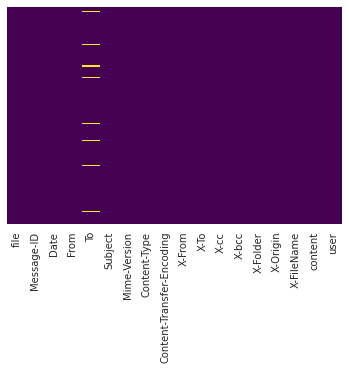

In [40]:
sns.heatmap(email_df.isnull(),yticklabels=False,cbar=False,cmap='viridis')  #Displays yellow strips for null values 

In [41]:
email_df.shape

(35974, 18)

In [42]:
#To get Just the List of Columns which are null values:
email_df.columns[email_df.isna().any()].tolist()

['To']

In [43]:
# Checking the percentage of missing values
email_df.isnull().sum()

file                            0
Message-ID                      0
Date                            0
From                            0
To                           1192
Subject                         0
Mime-Version                    0
Content-Type                    0
Content-Transfer-Encoding       0
X-From                          0
X-To                            0
X-cc                            0
X-bcc                           0
X-Folder                        0
X-Origin                        0
X-FileName                      0
content                         0
user                            0
dtype: int64

In [44]:
# Checking the percentage of missing values
round(100*(email_df.isnull().sum()/len(email_df.index)), 2)

file                         0.00
Message-ID                   0.00
Date                         0.00
From                         0.00
To                           3.31
Subject                      0.00
Mime-Version                 0.00
Content-Type                 0.00
Content-Transfer-Encoding    0.00
X-From                       0.00
X-To                         0.00
X-cc                         0.00
X-bcc                        0.00
X-Folder                     0.00
X-Origin                     0.00
X-FileName                   0.00
content                      0.00
user                         0.00
dtype: float64

3.31  of emails not directly addressed means trying to hide the informations

In [45]:
email_df['Date'] = pd.to_datetime(email_df['Date'], utc=True)
#emails_df['Date'] = pd.to_datetime(emails_df['Date'] ,errors = 'coerce', format = '%Y-%m-%dT%H:%M:%S.%f%z', infer_datetime_format = True, cache = True)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [46]:
email_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35974 entries, 2010 to 517390
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype              
---  ------                     --------------  -----              
 0   file                       35974 non-null  object             
 1   Message-ID                 35974 non-null  object             
 2   Date                       35974 non-null  datetime64[ns, UTC]
 3   From                       35974 non-null  object             
 4   To                         34782 non-null  object             
 5   Subject                    35974 non-null  object             
 6   Mime-Version               35974 non-null  object             
 7   Content-Type               35974 non-null  object             
 8   Content-Transfer-Encoding  35974 non-null  object             
 9   X-From                     35974 non-null  object             
 10  X-To                       35974 non-null  object             
 11

In [69]:
email_df.head()

,file,Message-ID,Date,From,To,Subject,Mime-Version,Content-Type,Content-Transfer-Encoding,X-From,X-To,X-cc,X-bcc,X-Folder,X-Origin,X-FileName,content,user
0,allen-p/_sent_mail/1.,<18782981.1075855378110.JavaMail.evans@thyme>,2001-05-14 23:39:00+00:00,(phillip.allen@enron.com),(tim.belden@enron.com),,1.0,text/plain; charset=us-ascii,7bit,Phillip K Allen,Tim Belden <Tim Belden/Enron@EnronXGate>,,,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",Allen-P,pallen (Non-Privileged).pst,Here is our forecast\n\n,allen-p
1,allen-p/_sent_mail/10.,<15464986.1075855378456.JavaMail.evans@thyme>,2001-05-04 20:51:00+00:00,(phillip.allen@enron.com),(john.lavorato@enron.com),Re:,1.0,text/plain; charset=us-ascii,7bit,Phillip K Allen,John J Lavorato <John J Lavorato/ENRON@enronXg...,,,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",Allen-P,pallen (Non-Privileged).pst,Traveling to have a business meeting takes the...,allen-p
17,allen-p/_sent_mail/11.,<7391389.1075855378477.JavaMail.evans@thyme>,2001-05-04 18:26:00+00:00,(phillip.allen@enron.com),(tim.heizenrader@enron.com),,1.0,text/plain; charset=us-ascii,7bit,Phillip K Allen,Tim Heizenrader <Tim Heizenrader/Enron@EnronXG...,,,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",Allen-P,pallen (Non-Privileged).pst,"Tim,\n\nmike grigsby is having problems with a...",allen-p
28,allen-p/_sent_mail/12.,<8572706.1075855378498.JavaMail.evans@thyme>,2001-05-03 22:57:00+00:00,(phillip.allen@enron.com),(rlehmann@yahoo.com),,1.0,text/plain; charset=us-ascii,7bit,Phillip K Allen,rlehmann <rlehmann@yahoo.com>,,,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",Allen-P,pallen (Non-Privileged).pst,"Reagan,\n\nJust wanted to give you an update. ...",allen-p
39,allen-p/_sent_mail/13.,<32300323.1075855378519.JavaMail.evans@thyme>,2001-05-02 19:36:00+00:00,(phillip.allen@enron.com),(james.steffes@enron.com),,1.0,text/plain; charset=us-ascii,7bit,Phillip K Allen,James D Steffes <James D Steffes/NA/Enron@Enron>,,,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",Allen-P,pallen (Non-Privileged).pst,"Jim,\n\nIs there going to be a conference call...",allen-p


#### When do people send emails?

Text(0, 0.5, 'N emails')

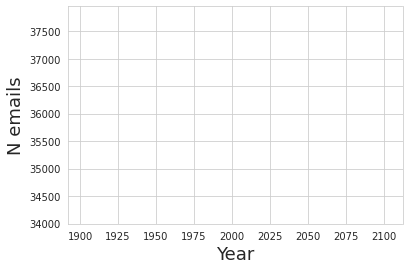

In [49]:
ax = email_df.groupby(email_df['Date'].dt.year)['content'].count().plot()
ax.set_xlabel('Year', fontsize=18)
ax.set_ylabel('N emails', fontsize=18)

Text(0, 0.5, 'N emails')

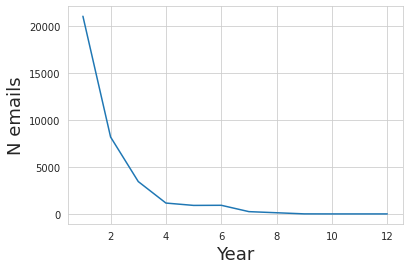

In [48]:
ax = email_df.groupby(email_df['Date'].dt.month)['content'].count().plot()
ax.set_xlabel('Year', fontsize=18)
ax.set_ylabel('N emails', fontsize=18)

Text(0, 0.5, 'N emails')

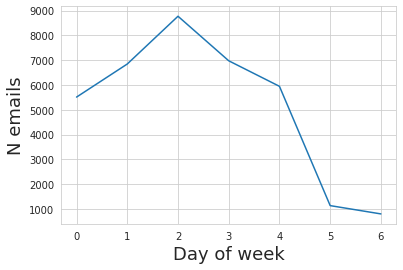

In [50]:
ax = email_df.groupby(email_df['Date'].dt.dayofweek)['content'].count().plot()
ax.set_xlabel('Day of week', fontsize=18)
ax.set_ylabel('N emails', fontsize=18)

Text(0, 0.5, 'N emails')

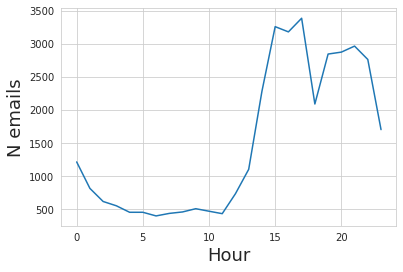

In [51]:
ax = email_df.groupby(email_df['Date'].dt.hour)['content'].count().plot()
ax.set_xlabel('Hour', fontsize=18)
ax.set_ylabel('N emails', fontsize=18)

### LDA Model

In [74]:
email_df.head(5)

,file,Message-ID,Date,From,To,Subject,Mime-Version,Content-Type,Content-Transfer-Encoding,X-From,X-To,X-cc,X-bcc,X-Folder,X-Origin,X-FileName,content,user
0,allen-p/_sent_mail/1.,<18782981.1075855378110.JavaMail.evans@thyme>,2001-05-14 23:39:00+00:00,(phillip.allen@enron.com),(tim.belden@enron.com),,1.0,text/plain; charset=us-ascii,7bit,Phillip K Allen,Tim Belden <Tim Belden/Enron@EnronXGate>,,,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",Allen-P,pallen (Non-Privileged).pst,Here is our forecast\n\n,allen-p
1,allen-p/_sent_mail/10.,<15464986.1075855378456.JavaMail.evans@thyme>,2001-05-04 20:51:00+00:00,(phillip.allen@enron.com),(john.lavorato@enron.com),Re:,1.0,text/plain; charset=us-ascii,7bit,Phillip K Allen,John J Lavorato <John J Lavorato/ENRON@enronXg...,,,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",Allen-P,pallen (Non-Privileged).pst,Traveling to have a business meeting takes the...,allen-p
17,allen-p/_sent_mail/11.,<7391389.1075855378477.JavaMail.evans@thyme>,2001-05-04 18:26:00+00:00,(phillip.allen@enron.com),(tim.heizenrader@enron.com),,1.0,text/plain; charset=us-ascii,7bit,Phillip K Allen,Tim Heizenrader <Tim Heizenrader/Enron@EnronXG...,,,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",Allen-P,pallen (Non-Privileged).pst,"Tim,\n\nmike grigsby is having problems with a...",allen-p
28,allen-p/_sent_mail/12.,<8572706.1075855378498.JavaMail.evans@thyme>,2001-05-03 22:57:00+00:00,(phillip.allen@enron.com),(rlehmann@yahoo.com),,1.0,text/plain; charset=us-ascii,7bit,Phillip K Allen,rlehmann <rlehmann@yahoo.com>,,,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",Allen-P,pallen (Non-Privileged).pst,"Reagan,\n\nJust wanted to give you an update. ...",allen-p
39,allen-p/_sent_mail/13.,<32300323.1075855378519.JavaMail.evans@thyme>,2001-05-02 19:36:00+00:00,(phillip.allen@enron.com),(james.steffes@enron.com),,1.0,text/plain; charset=us-ascii,7bit,Phillip K Allen,James D Steffes <James D Steffes/NA/Enron@Enron>,,,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",Allen-P,pallen (Non-Privileged).pst,"Jim,\n\nIs there going to be a conference call...",allen-p


In [52]:
import gensim

In [54]:
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

In [55]:
# spacy for lemmatization
import spacy

In [59]:
# for plotting
import pyLDAvis
import pyLDAvis.gensim

In [57]:
pip install pyLDAvis

     |████████████████████████████████| 1.6MB 6.0MB/s 
     |████████████████████████████████| 552kB 33.7MB/s 
  Created wheel for pyLDAvis: filename=pyLDAvis-2.1.2-py2.py3-none-any.whl size=97712 sha256=3b36c84527fc75e9d05be8f8baed7bb5d2d377ad6cbcc45a40d280d1ba0e60a5
  Stored in directory: /root/.cache/pip/wheels/98/71/24/513a99e58bb6b8465bae4d2d5e9dba8f0bef8179e3051ac414
  Created wheel for funcy: filename=funcy-1.14-py2.py3-none-any.whl size=32042 sha256=fe3795cc5c4edb37f2b32400dd6dafc52867c363c778e4e6e1567ff74f055d56
  Stored in directory: /root/.cache/pip/wheels/20/5a/d8/1d875df03deae6f178dfdf70238cca33f948ef8a6f5209f2eb
Successfully built pyLDAvis funcy


In [ ]:
pip install pyLDAvis

In [60]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [61]:

# prep NLTK Stop words
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use','re', 'for', 'Fw', 'of', 'and', 'to','01','the', 'on','in','meeting'])

In [117]:
email_df.columns

Index(['file', 'Message-ID', 'Date', 'From', 'To', 'Subject', 'Mime-Version',
       'Content-Type', 'Content-Transfer-Encoding', 'X-From', 'X-To', 'X-cc',
       'X-bcc', 'X-Folder', 'X-Origin', 'X-FileName', 'content', 'user'],
      dtype='object')

In [62]:
print(email_df.iloc[32]['Subject']) # displays info below

FW: Access to TAGG


In [63]:
# Convert email subject to list
data = email_df.Subject.values.tolist()

In [64]:
# tokenize - break down each sentence into a list of words
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

In [65]:
data_words = list(sent_to_words(data))

In [66]:
print(data_words[9])

['your', 'approval', 'is', 'overdue', 'access', 'request', 'for', 'jaime', 'gualy', 'enron', 'com']


In [67]:
from gensim.models.phrases import Phrases, Phraser

In [68]:

# Build the bigram and trigram models
bigram = Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = Phrases(bigram[data_words], threshold=100)

/usr/local/lib/python3.6/dist-packages/gensim/models/phrases.py:598: UserWarning: For a faster implementation, use the gensim.models.phrases.Phraser class
  warnings.warn("For a faster implementation, use the gensim.models.phrases.Phraser class")


In [69]:

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = Phraser(bigram)
trigram_mod = Phraser(trigram)

In [70]:

# See trigram example
print(trigram_mod[bigram_mod[data_words[100]]])

['save', 'for', 'college', 'with', 'starwood', 'and', 'upromise']


In [71]:

# remove stop_words, make bigrams and lemmatize
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent))
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [72]:

# Remove Stop Words
data_words_nostops = remove_stopwords(data_words)

In [73]:
# Form Bigrams
data_words_bigrams = make_bigrams(data_words_nostops)

In [74]:

# Initialize spacy 'en' model, keeping only tagger component (for efficiency)
nlp = spacy.load('en', disable=['parser', 'ner'])

In [75]:
# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

In [78]:
print(data_lemmatized[4])

['approval', 'overdue', 'access', 'request', 'com']


In [80]:

# create dictionary and corpus both are needed for (LDA) topic modeling

# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

In [81]:
!wget http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip

--2020-09-25 05:43:46--  http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip
Resolving mallet.cs.umass.edu (mallet.cs.umass.edu)... 128.119.246.70
Connecting to mallet.cs.umass.edu (mallet.cs.umass.edu)|128.119.246.70|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 16184794 (15M) [application/zip]
Saving to: ‘mallet-2.0.8.zip’

mallet-2.0.8.zip    100%[===================>]  15.43M  5.01MB/s    in 3.1s    

2020-09-25 05:43:49 (5.01 MB/s) - ‘mallet-2.0.8.zip’ saved [16184794/16184794]



In [82]:
!unzip mallet-2.0.8.zip

Archive:  mallet-2.0.8.zip
   creating: mallet-2.0.8/
   creating: mallet-2.0.8/bin/
  inflating: mallet-2.0.8/bin/classifier2info  
  inflating: mallet-2.0.8/bin/csv2classify  
  inflating: mallet-2.0.8/bin/csv2vectors  
  inflating: mallet-2.0.8/bin/mallet  
  inflating: mallet-2.0.8/bin/mallet.bat  
  inflating: mallet-2.0.8/bin/mallethon  
  inflating: mallet-2.0.8/bin/prepend-license.sh  
  inflating: mallet-2.0.8/bin/svmlight2vectors  
  inflating: mallet-2.0.8/bin/text2classify  
  inflating: mallet-2.0.8/bin/text2vectors  
  inflating: mallet-2.0.8/bin/vectors2classify  
  inflating: mallet-2.0.8/bin/vectors2info  
  inflating: mallet-2.0.8/bin/vectors2topics  
  inflating: mallet-2.0.8/bin/vectors2vectors  
  inflating: mallet-2.0.8/build.xml  
   creating: mallet-2.0.8/class/
   creating: mallet-2.0.8/class/cc/
   creating: mallet-2.0.8/class/cc/mallet/
   creating: mallet-2.0.8/class/cc/mallet/classify/
  inflating: mallet-2.0.8/class/cc/mallet/classify/AdaBoost.class  
  in

In [83]:
mallet_path = './mallet-2.0.8/bin/mallet'

In [84]:
import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

In [85]:
# Build LDA model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20,
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)

In [ ]:
# topic modeling
# corpus, dictionary and number of topics required for LDA
# alpha and eta are hyperparameters that affect sparsity of the topics
# chunksize is the number of documents to be used in each training chunk
# update_every determines how often the model parameters should be updated
# passes is the total number of training passes
# Print the Keyword in the 10 topics

In [86]:
print(lda_model.print_topics())# The weights reflect how important a keyword is to that topic.

[(0, '0.245*"com" + 0.069*"submit" + 0.066*"need" + 0.058*"special" + 0.053*"weekly" + 0.051*"datum" + 0.033*"headline" + 0.023*"less" + 0.022*"discount" + 0.017*"quote"'), (1, '0.058*"file" + 0.057*"team" + 0.046*"entry" + 0.037*"control" + 0.035*"end" + 0.033*"party" + 0.033*"take" + 0.032*"assistance" + 0.025*"trip" + 0.024*"presentation"'), (2, '0.296*"market" + 0.230*"request" + 0.066*"position" + 0.028*"pipeline" + 0.024*"propose" + 0.024*"resignation" + 0.021*"date" + 0.019*"require" + 0.016*"safety" + 0.015*"word"'), (3, '0.148*"energy" + 0.108*"trade" + 0.045*"weekend" + 0.039*"office" + 0.027*"vacation" + 0.026*"transwestern" + 0.022*"cancel" + 0.022*"pic" + 0.019*"marketing" + 0.019*"procedure"'), (4, '0.092*"book" + 0.054*"system" + 0.050*"change" + 0.048*"message" + 0.041*"time" + 0.039*"issue" + 0.034*"online" + 0.028*"document" + 0.026*"due" + 0.023*"status"'), (5, '0.619*"failure" + 0.042*"schedule" + 0.037*"daily" + 0.033*"canadian" + 0.026*"deal" + 0.017*"urgent" + 0.

In [87]:
doc_lda = lda_model[corpus]

In [88]:
# Model perplexity and topic coherence provide a convenient
# measure to judge how good a given topic model is.
# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.


Perplexity:  -8.5839573542757


In [89]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.6585658973268453


In [90]:
# Visualize the topics
pyLDAvis.enable_notebook(sort=True)
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)

In [91]:
pyLDAvis.display(vis)

In [ ]:
# now using mallet

In [92]:
mallet_path = 'mallet-2.0.8/bin/mallet'

In [93]:
ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=20, id2word=id2word)

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:254: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


In [94]:
# Show Topics
print(ldamallet.show_topics(formatted=False))

[(0, [('update', 0.11919398907103824), ('list', 0.08948087431693989), ('document', 0.06796448087431695), ('number', 0.04371584699453552), ('contact', 0.04234972677595628), ('office', 0.03415300546448088), ('phone', 0.03244535519125683), ('customer', 0.028346994535519126), ('project', 0.026297814207650275), ('set', 0.026297814207650275)]), (12, [('news', 0.13335607094133697), ('power', 0.1077762619372442), ('rigzone_industry', 0.07708049113233288), ('confirmation', 0.05354706684856753), ('fw', 0.04229195088676671), ('online', 0.03649386084583902), ('availability', 0.02762619372442019), ('article', 0.020804911323328786), ('index', 0.020463847203274217), ('break', 0.017053206002728513)]), (7, [('free', 0.11947056774642982), ('service', 0.04562870080111459), ('pipeline', 0.034831069313827935), ('power', 0.033786137234413094), ('rate', 0.03099965168930686), ('web', 0.024381748519679555), ('good', 0.02229188436084988), ('mention', 0.020202020202020204), ('make', 0.019157088122605363), ('win'

In [95]:
# Compute Coherence Score
coherence_model_ldamallet = CoherenceModel(model=ldamallet, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_ldamallet = coherence_model_ldamallet.get_coherence()
print('\nCoherence Score: ', coherence_ldamallet)


Coherence Score:  0.5996317865189772


In [96]:
# # Visualize the topics with mallet model
# pyLDAvis.enable_notebook(sort=True)
# vis = pyLDAvis.gensim.prepare(ldamallet, corpus, id2word)
# pyLDAvis.display(vis)

In [97]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=id2word)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [98]:
# run
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_lemmatized, start=2, limit=40, step=6)

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:254: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


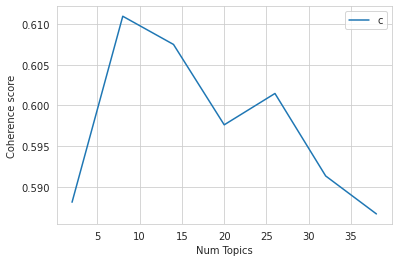

In [99]:
# Show graph
limit=40; start=2; step=6;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [100]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

Num Topics = 2  has Coherence Value of 0.5881
Num Topics = 8  has Coherence Value of 0.611
Num Topics = 14  has Coherence Value of 0.6075
Num Topics = 20  has Coherence Value of 0.5976
Num Topics = 26  has Coherence Value of 0.6015
Num Topics = 32  has Coherence Value of 0.5913
Num Topics = 38  has Coherence Value of 0.5867


In [101]:
# Select the model and print the topics
optimal_model = model_list[4]
model_topics = optimal_model.show_topics(formatted=False)
print(optimal_model.print_topics(num_words=10))

[(12, '0.102*"capacity" + 0.057*"release" + 0.054*"system" + 0.051*"transwestern" + 0.047*"termination" + 0.033*"project" + 0.029*"send" + 0.025*"big" + 0.025*"win" + 0.024*"make"'), (22, '0.145*"fw" + 0.033*"group" + 0.032*"bullet" + 0.031*"point" + 0.027*"work" + 0.027*"index" + 0.022*"training" + 0.021*"year" + 0.020*"unit" + 0.020*"employee_assistance"'), (18, '0.106*"employee" + 0.071*"notice" + 0.060*"final" + 0.058*"question" + 0.054*"order" + 0.029*"web" + 0.025*"form" + 0.024*"quarantine" + 0.020*"membership" + 0.020*"bankruptcy_court"'), (2, '0.123*"gas" + 0.079*"test" + 0.065*"commodity_future" + 0.061*"reminder" + 0.050*"storage" + 0.040*"attend" + 0.036*"system" + 0.035*"houstonian_session" + 0.034*"note" + 0.027*"fare"'), (25, '0.290*"request" + 0.213*"access" + 0.095*"approval" + 0.073*"credit" + 0.072*"submit" + 0.055*"card" + 0.052*"overdue" + 0.024*"copier_commitment" + 0.006*"closed" + 0.006*"western"'), (15, '0.131*"information" + 0.066*"letter" + 0.059*"draft" + 0.

In [102]:
def format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)

In [103]:
df_topic_sents_keywords = format_topics_sentences(ldamodel=optimal_model, corpus=corpus, texts=data)

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:254: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


In [105]:
# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

In [106]:
# Show
df_dominant_topic.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,25.0,0.1097,"request, access, approval, credit, submit, car...",Your Approval is Overdue: Access Request for m...
1,1,7.0,0.0477,"start, hour, canadian, citysearch, world, cold...","ANCHORDESK: 2002 in review: Not perfect, but i..."
2,2,0.0,0.0385,"update, plan, business, office, vacation, work...","NGI Publications - Tuesday, January 1st 2002"
3,3,0.0,0.0385,"update, plan, business, office, vacation, work...","NGI Publications - Wednesday, January 2nd 2002"
4,4,25.0,0.1097,"request, access, approval, credit, submit, car...",Your Approval is Overdue: Access Request for m...
5,5,0.0,0.0530,"update, plan, business, office, vacation, work...",Market update
6,6,14.0,0.0573,"report, document, special, weekly, offer, expe...",OnePass Member continental.com Specials for jo...
7,7,0.0,0.0385,"update, plan, business, office, vacation, work...",Happy New Year
8,8,25.0,0.1097,"request, access, approval, credit, submit, car...",Your Approval is Overdue: Access Request for j...
9,9,25.0,0.1097,"request, access, approval, credit, submit, car...",Your Approval is Overdue: Access Request for j...


In [107]:
df_dominant_topic.Keywords.iloc[1]

'start, hour, canadian, citysearch, world, cold, contractor, session, joke, voicemail'

In [108]:
df_dominant_topic.Text.iloc[1]

'ANCHORDESK: 2002 in review: Not perfect, but it sure beat 2001'

In [109]:
# Group top 5 sentences under each topic
sent_topics_sorteddf_mallet = pd.DataFrame()

sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=[0]).head(1)], 
                                            axis=0)

In [111]:

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

In [112]:
# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Text"]

In [113]:

# Show
sent_topics_sorteddf_mallet

,Topic_Num,Topic_Perc_Contrib,Keywords,Text
0,0.0,0.1117,"update, plan, business, office, vacation, work...",Networks Support for Wholesale Business Units ...
1,1.0,0.1371,"power, free, price, contact, emca, sign, good,...","FREE Lipgloss!, FREE Lip Balm!, FREE Shipping!"
2,2.0,0.1526,"gas, test, commodity_future, reminder, storage...",FW: You are Invited to an Open Season Receptio...
3,3.0,0.1538,"market, time, day, ahead, real, word, tonight,...","Price Reservations February 21, 2002 Real-Tim..."
4,4.0,0.1634,"outage, report, daily, weekend, production, on...","WSCC (Diablo Canyon & San Juan), ECAR (Bailly)..."
5,5.0,0.0929,"failure, schedule, agreement, holiday, flow, e...",RE: Interconnect Agreement - Questar Southern ...
6,6.0,0.1802,"report, trader, user, invoice, due, availabili...",Re: RE: Pebble Bed Modular Reactor Design Push...
7,7.0,0.0733,"start, hour, canadian, citysearch, world, cold...",Start Date: 2/4/02; HourAhead hour: 19;
8,8.0,0.1259,"fw, change, management, xls, cash, ticket, wea...",Get RealOne Music - Download your favorite songs!
9,9.0,0.1177,"contract, list, message, status, important, cu...",FW: New Contract System - Impact on One-part/T...
